# IMPORTING LIBRARIES

In [80]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
warnings.filterwarnings('ignore', message=".*tf.train.Optimizer.*")
warnings.filterwarnings("ignore", message=".*tf.executing_eagerly_outside_functions.*")
warnings.filterwarnings("ignore")

In [2]:
from imblearn.over_sampling import RandomOverSampler
from sklearn.model_selection import train_test_split,RandomizedSearchCV,GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier

# LOADING DATA

In [3]:
data = pd.read_excel("C:\\Users\\ashiq\\Desktop\\IABAC Project\\Data\\Processed\\Processed_data.xlsx")
data

,Age,Gender,EducationBackground,MaritalStatus,EmpDepartment,EmpJobRole,BusinessTravelFrequency,DistanceFromHome,EmpEducationLevel,EmpEnvironmentSatisfaction,...,EmpRelationshipSatisfaction,TotalWorkExperienceInYears,TrainingTimesLastYear,EmpWorkLifeBalance,ExperienceYearsAtThisCompany,ExperienceYearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager,Attrition,PerformanceRating
0,32,1,2,1,0,0,0,10,3,4,...,4,10,2,2,10,7,0,8,0,1
1,47,1,2,1,0,0,0,14,4,4,...,4,20,2,3,7,7,1,7,0,1
2,40,1,0,0,0,0,1,5,4,4,...,3,20,2,3,18,13,1,12,0,2
3,41,1,5,2,3,7,0,10,4,2,...,2,23,2,2,21,6,12,6,0,1
4,60,1,2,1,0,0,0,16,4,1,...,4,10,1,3,2,2,2,2,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1195,27,0,1,2,0,0,1,3,1,4,...,2,6,3,3,6,5,0,4,0,2
1196,37,1,0,1,1,6,0,10,2,4,...,1,4,2,3,1,0,0,0,0,1
1197,50,1,1,0,1,6,0,28,1,4,...,3,20,3,3,20,8,3,8,0,1
1198,34,0,1,1,5,13,0,9,3,4,...,2,9,3,4,8,7,7,7,0,1


# MODEL CREATION

In [4]:
#SPLITTING X AND Y
X=data.drop('PerformanceRating',axis=1)
y=data['PerformanceRating']

In [5]:
data.PerformanceRating.value_counts()

PerformanceRating
1    874
0    194
2    132
Name: count, dtype: int64

- the data is imbalanced

### OVER SAMPLING

In [6]:
os=RandomOverSampler(random_state=10)

In [7]:
X_os,y_os=os.fit_resample(X,y)
X_os.shape,y_os.shape

((2622, 26), (2622,))

## TRAIN TEST SPLIT

##### Without Scaling

In [8]:
X_train,X_test,y_train,y_test=train_test_split(X_os,y_os,test_size=0.75,random_state=10)

##### With Scaling

In [9]:
sc=StandardScaler()

In [10]:
X_sc=sc.fit_transform(X)
X_sc

array([[-0.54145787,  0.80942721,  0.70224212, ..., -0.68137224,
         1.10025139, -0.41733475],
       [ 1.10988772,  0.80942721,  0.70224212, ..., -0.37083419,
         0.8177735 , -0.41733475],
       [ 0.33925978,  0.80942721, -0.86847651, ..., -0.37083419,
         2.23016296, -0.41733475],
       ...,
       [ 1.44015684,  0.80942721, -0.08311719, ...,  0.25024191,
         1.10025139, -0.41733475],
       [-0.32127846, -1.23544154, -0.08311719, ...,  1.49239412,
         0.8177735 , -0.41733475],
       [-1.42217552, -1.23544154, -0.86847651, ..., -0.06029614,
        -1.15957175,  2.39615797]])

In [11]:
X_train1,X_test1,y_train1,y_test1=train_test_split(X_sc,y)

# MODEL1 - RANDOM FOREST

In [12]:
rf=RandomForestClassifier()

In [13]:
rf.fit(X_train,y_train)

RandomForestClassifier()

In [14]:
y_pred_rf1=rf.predict(X_train)

In [15]:
# Train Accuracy of Random Forest Model
print(classification_report(y_train,y_pred_rf1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       227
           1       1.00      1.00      1.00       218
           2       1.00      1.00      1.00       210

    accuracy                           1.00       655
   macro avg       1.00      1.00      1.00       655
weighted avg       1.00      1.00      1.00       655



In [16]:
# Tuning the model

n_estimators = [int(x) for x in np.linspace(start=200, stop=2000, num=10)]
max_features = ['auto', 'sqrt'] 
max_depth = [int(x) for x in np.linspace(10, 110, num=11)]
min_samples_split = [2, 5, 10]
min_samples_leaf = [1, 2, 4]
bootstrap = [True, False]

random_grid = {'n_estimators': n_estimators, 'max_features': max_features,
               'max_depth': max_depth, 'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf, 'bootstrap': bootstrap}

rf_clf1 = RandomForestClassifier(random_state=42)

rf_cv = RandomizedSearchCV(estimator=rf_clf1, scoring='f1',param_distributions=random_grid, n_iter=300, cv=3, 
                               verbose=3, random_state=42, n_jobs=-1)

rf_cv.fit(X_train, y_train)
rf_best_params = rf_cv.best_params_
print(f"Best paramters: {rf_best_params})")

Fitting 3 folds for each of 300 candidates, totalling 900 fits


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
450 fits failed out of a total of 900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
247 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 732, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\base.py", line 1144, in wrapper
    estimator._validate_params()
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\base.py", line 637, in _validate_params
    validate_parameter_constraints(
  File "C:\Users\ashiq\anaconda3\Lib\site-packag

Best paramters: {'n_estimators': 2000, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 10, 'bootstrap': True})


In [17]:
rf_clf2 = RandomForestClassifier(n_estimators= 2000, min_samples_split= 10, min_samples_leaf= 2,\
                                 max_features= 'sqrt', max_depth= 10, bootstrap= True)
rf_clf2.fit(X_train, y_train) 

RandomForestClassifier(max_depth=10, min_samples_leaf=2, min_samples_split=10,
                       n_estimators=2000)

In [18]:
y_pred_rfh1=rf_clf2.predict(X_train)

In [19]:
# Train Accuracy of Tuned Random Forest Model
print(classification_report(y_train,y_pred_rfh1))

              precision    recall  f1-score   support

           0       0.97      1.00      0.98       227
           1       1.00      0.97      0.98       218
           2       1.00      0.99      0.99       210

    accuracy                           0.99       655
   macro avg       0.99      0.99      0.99       655
weighted avg       0.99      0.99      0.99       655



# MODEL2 - DECISION TREE

In [20]:
dc=DecisionTreeClassifier()

In [21]:
dc.fit(X_train,y_train)

DecisionTreeClassifier()

In [22]:
y_pred_dc1=dc.predict(X_train)

In [23]:
# Train Accuracy of Decision Tree Model
print(classification_report(y_train,y_pred_dc1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       227
           1       1.00      1.00      1.00       218
           2       1.00      1.00      1.00       210

    accuracy                           1.00       655
   macro avg       1.00      1.00      1.00       655
weighted avg       1.00      1.00      1.00       655



In [24]:
# Tuning the model
params = {
    "criterion":("gini", "entropy"), 
    "splitter":("best", "random"), 
    "max_depth":(list(range(1, 20))), 
    "min_samples_split":[2, 3, 4],    
    "min_samples_leaf":list(range(1, 20)),
}

tree_clf = DecisionTreeClassifier(random_state=3)
tree_cv = GridSearchCV(tree_clf, params, scoring="accuracy", n_jobs=-1, verbose=3, cv=3)
tree_cv.fit(X_train,y_train)
best_params = tree_cv.best_params_
print(f"Best paramters: {best_params}")

Fitting 3 folds for each of 4332 candidates, totalling 12996 fits
Best paramters: {'criterion': 'entropy', 'max_depth': 9, 'min_samples_leaf': 1, 'min_samples_split': 2, 'splitter': 'best'}


In [25]:
dt1=DecisionTreeClassifier(criterion='entropy',max_depth=9,min_samples_leaf= 1,min_samples_split=2,splitter='best')
dt1.fit(X_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=9)

In [26]:
y_pred_dch1=dt1.predict(X_train)

In [27]:
# Train Accuracy of Tuned Decision Tree Model
print(classification_report(y_train,y_pred_dch1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       227
           1       1.00      1.00      1.00       218
           2       1.00      1.00      1.00       210

    accuracy                           1.00       655
   macro avg       1.00      1.00      1.00       655
weighted avg       1.00      1.00      1.00       655



# MODEL 3 - SVM

In [28]:
sv=SVC()

In [29]:
sv.fit(X_train,y_train)

SVC()

In [30]:
y_pred_sv1=sv.predict(X_train)

In [31]:
# Train Accuracy of SVM Model
print(classification_report(y_train,y_pred_sv1))

              precision    recall  f1-score   support

           0       0.66      0.48      0.56       227
           1       0.56      0.60      0.58       218
           2       0.72      0.88      0.79       210

    accuracy                           0.65       655
   macro avg       0.65      0.65      0.64       655
weighted avg       0.65      0.65      0.64       655



In [32]:
# tuning the model
param_grid1 = {'C': [1, 5, 10,30,60,70,100], 
               'gamma': [1, 0.1, 0.01, 0.001, 0.0001]
              } 
model=SVC()
grid = GridSearchCV(model, param_grid1,verbose = 3,scoring='f1',cv=3)

In [33]:
grid.fit(X,y)

Fitting 3 folds for each of 35 candidates, totalling 105 fits


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ........................C=1, gamma=1;, score=nan total time=   0.3s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ........................C=1, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ........................C=1, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ......................C=1, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ......................C=1, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ......................C=1, gamma=0.1;, score=nan total time=   0.1s
[CV 1/3] END .....................C=1, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .....................C=1, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .....................C=1, gamma=0.01;, score=nan total time=   0.1s
[CV 1/3] END ....................C=1, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ....................C=1, gamma=0.001;, score=nan total time=   0.0s
[CV 3/3] END ....................C=1, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ...................C=1, gamma=0.0001;, score=nan total time=   0.0s
[CV 2/3] END ...................C=1, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ...................C=1, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ........................C=5, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ........................C=5, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ........................C=5, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ......................C=5, gamma=0.1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ......................C=5, gamma=0.1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ......................C=5, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .....................C=5, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .....................C=5, gamma=0.01;, score=nan total time=   0.1s
[CV 3/3] END .....................C=5, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ....................C=5, gamma=0.001;, score=nan total time=   0.0s
[CV 2/3] END ....................C=5, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ....................C=5, gamma=0.001;, score=nan total time=   0.0s
[CV 1/3] END ...................C=5, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ...................C=5, gamma=0.0001;, score=nan total time=   0.0s
[CV 3/3] END ...................C=5, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .......................C=10, gamma=1;, score=nan total time=   0.3s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .......................C=10, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .......................C=10, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .....................C=10, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .....................C=10, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .....................C=10, gamma=0.1;, score=nan total time=   0.1s
[CV 1/3] END ....................C=10, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ....................C=10, gamma=0.01;, score=nan total time=   0.1s
[CV 3/3] END ....................C=10, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ...................C=10, gamma=0.001;, score=nan total time=   0.0s
[CV 2/3] END ...................C=10, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ...................C=10, gamma=0.001;, score=nan total time=   0.0s
[CV 1/3] END ..................C=10, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ..................C=10, gamma=0.0001;, score=nan total time=   0.0s
[CV 3/3] END ..................C=10, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .......................C=30, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .......................C=30, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .......................C=30, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .....................C=30, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .....................C=30, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .....................C=30, gamma=0.1;, score=nan total time=   0.1s
[CV 1/3] END ....................C=30, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ....................C=30, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ....................C=30, gamma=0.01;, score=nan total time=   0.1s
[CV 1/3] END ...................C=30, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ...................C=30, gamma=0.001;, score=nan total time=   0.0s
[CV 3/3] END ...................C=30, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ..................C=30, gamma=0.0001;, score=nan total time=   0.0s
[CV 2/3] END ..................C=30, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ..................C=30, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .......................C=60, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .......................C=60, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .......................C=60, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .....................C=60, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .....................C=60, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .....................C=60, gamma=0.1;, score=nan total time=   0.1s
[CV 1/3] END ....................C=60, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ....................C=60, gamma=0.01;, score=nan total time=   0.1s
[CV 3/3] END ....................C=60, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ...................C=60, gamma=0.001;, score=nan total time=   0.1s
[CV 2/3] END ...................C=60, gamma=0.001;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ...................C=60, gamma=0.001;, score=nan total time=   0.0s
[CV 1/3] END ..................C=60, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ..................C=60, gamma=0.0001;, score=nan total time=   0.0s
[CV 3/3] END ..................C=60, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .......................C=70, gamma=1;, score=nan total time=   0.3s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .......................C=70, gamma=1;, score=nan total time=   0.3s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .......................C=70, gamma=1;, score=nan total time=   0.3s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END .....................C=70, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .....................C=70, gamma=0.1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END .....................C=70, gamma=0.1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ....................C=70, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ....................C=70, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ....................C=70, gamma=0.01;, score=nan total time=   0.1s
[CV 1/3] END ...................C=70, gamma=0.001;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ...................C=70, gamma=0.001;, score=nan total time=   0.1s
[CV 3/3] END ...................C=70, gamma=0.001;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ..................C=70, gamma=0.0001;, score=nan total time=   0.0s
[CV 2/3] END ..................C=70, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ..................C=70, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ......................C=100, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ......................C=100, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ......................C=100, gamma=1;, score=nan total time=   0.2s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ....................C=100, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ....................C=100, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ....................C=100, gamma=0.1;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ...................C=100, gamma=0.01;, score=nan total time=   0.1s
[CV 2/3] END ...................C=100, gamma=0.01;, score=nan total time=   0.1s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 3/3] END ...................C=100, gamma=0.01;, score=nan total time=   0.0s
[CV 1/3] END ..................C=100, gamma=0.001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ..................C=100, gamma=0.001;, score=nan total time=   0.0s
[CV 3/3] END ..................C=100, gamma=0.001;, score=nan total time=   0.0s
[CV 1/3] END .................C=100, gamma=0.0001;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END .................C=100, gamma=0.0001;, score=nan total time=   0.0s
[CV 3/3] END .................C=100, gamma=0.0001;, score=nan total time=   0.0s


GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [1, 5, 10, 30, 60, 70, 100],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001]},
             scoring='f1', verbose=3)

In [34]:
print("Best Parameters of C & Gamma are:",grid.best_params_)

Best Parameters of C & Gamma are: {'C': 1, 'gamma': 1}


In [35]:
clf=SVC(C=1, gamma=1, random_state=42)
clf.fit(X_train, y_train)

SVC(C=1, gamma=1, random_state=42)

In [36]:
y_pred_svh1=clf.predict(X_train)

In [37]:
# Train Accuracy of Tuned SVM Model
print(classification_report(y_train,y_pred_svh1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       227
           1       1.00      1.00      1.00       218
           2       1.00      1.00      1.00       210

    accuracy                           1.00       655
   macro avg       1.00      1.00      1.00       655
weighted avg       1.00      1.00      1.00       655



# MODEL 4 - LOGISTIC

In [38]:
lr = LogisticRegression(multi_class="multinomial", solver="lbfgs", max_iter=500)

In [39]:
lr.fit(X_train1,y_train1)

LogisticRegression(max_iter=500, multi_class='multinomial')

In [40]:
y_pred_lr1=lr.predict(X_train1)

In [41]:
# Train Accuracy of Logistic Model
print(classification_report(y_train1,y_pred_lr1))

              precision    recall  f1-score   support

           0       0.59      0.42      0.49       146
           1       0.84      0.92      0.88       660
           2       0.81      0.64      0.71        94

    accuracy                           0.81       900
   macro avg       0.75      0.66      0.70       900
weighted avg       0.80      0.81      0.80       900



In [42]:
# Tuning the Model
param_grid2 = {'C': [1, 5, 10,30,60,70,100], 
              'verbose': [0, 1, 3, 4, 5]
             } 
grid1= GridSearchCV(lr, param_grid2,verbose = 3,scoring='f1',cv=3)

In [43]:
grid1.fit(X_sc,y)

Fitting 3 folds for each of 35 candidates, totalling 105 fits
[CV 1/3] END ......................C=1, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END ......................C=1, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END ......................C=1, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END ......................C=1, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END ......................C=1, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END ......................C=1, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END ......................C=1, verbose=3;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 2/3] END ......................C=1, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END ......................C=1, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END ......................C=1, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages

[CV 2/3] END ......................C=1, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 3/3] END ......................C=1, verbose=4;, score=nan total time=   0.0s
[CV 1/3] END ......................C=1, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END ......................C=1, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END ......................C=1, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END ......................C=5, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END ......................C=5, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END ......................C=5, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END ......................C=5, verbose=1;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END ......................C=5, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END ......................C=5, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END ......................C=5, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END ......................C=5, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END ......................C=5, verbose=3;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 1/3] END ......................C=5, verbose=4;, score=nan total time=   0.0s
[CV 2/3] END ......................C=5, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 3/3] END ......................C=5, verbose=4;, score=nan total time=   0.0s
[CV 1/3] END ......................C=5, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END ......................C=5, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END ......................C=5, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END .....................C=10, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END .....................C=10, verbose=0;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 3/3] END .....................C=10, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END .....................C=10, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END .....................C=10, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END .....................C=10, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END .....................C=10, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END .....................C=10, verbose=3;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 3/3] END .....................C=10, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END .....................C=10, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=10, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END .....................C=10, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 1/3] END .....................C=10, verbose=5;, score=nan total time=   0.0s
[CV 2/3] END .....................C=10, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 3/3] END .....................C=10, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END .....................C=30, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END .....................C=30, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END .....................C=30, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END .....................C=30, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END .....................C=30, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END .....................C=30, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END .....................C=30, verbose=3;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._

[CV 2/3] END .....................C=30, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END .....................C=30, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END .....................C=30, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=30, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END .....................C=30, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 1/3] END .....................C=30, verbose=5;, score=nan total time=   0.0s
[CV 2/3] END .....................C=30, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 3/3] END .....................C=30, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END .....................C=60, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END .....................C=60, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END .....................C=60, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END .....................C=60, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END .....................C=60, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END .....................C=60, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END .....................C=60, verbose=3;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^

[CV 2/3] END .....................C=60, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END .....................C=60, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END .....................C=60, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 2/3] END .....................C=60, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END .....................C=60, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages

[CV 1/3] END .....................C=60, verbose=5;, score=nan total time=   0.0s
[CV 2/3] END .....................C=60, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 3/3] END .....................C=60, verbose=5;, score=nan total time=   0.0s
[CV 1/3] END .....................C=70, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END .....................C=70, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END .....................C=70, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END .....................C=70, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END .....................C=70, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END .....................C=70, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END .....................C=70, verbose=3;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^

[CV 2/3] END .....................C=70, verbose=3;, score=nan total time=   0.0s
[CV 3/3] END .....................C=70, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END .....................C=70, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages

[CV 2/3] END .....................C=70, verbose=4;, score=nan total time=   0.0s
[CV 3/3] END .....................C=70, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 1/3] END .....................C=70, verbose=5;, score=nan total time=   0.0s
[CV 2/3] END .....................C=70, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END .....................C=70, verbose=5;, score=nan total time=   0.0s


C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._score_func(y_true, y_pred, **scoring_kwargs)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda

[CV 1/3] END ....................C=100, verbose=0;, score=nan total time=   0.0s
[CV 2/3] END ....................C=100, verbose=0;, score=nan total time=   0.0s
[CV 3/3] END ....................C=100, verbose=0;, score=nan total time=   0.0s
[CV 1/3] END ....................C=100, verbose=1;, score=nan total time=   0.0s
[CV 2/3] END ....................C=100, verbose=1;, score=nan total time=   0.0s
[CV 3/3] END ....................C=100, verbose=1;, score=nan total time=   0.0s
[CV 1/3] END ....................C=100, verbose=3;, score=nan total time=   0.0s
[CV 2/3] END ....................C=100, verbose=3;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 3/3] END ....................C=100, verbose=3;, score=nan total time=   0.0s
[CV 1/3] END ....................C=100, verbose=4;, score=nan total time=   0.0s
[CV 2/3] END ....................C=100, verbose=4;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 355, in _score
    return self._sign * self._s

[CV 3/3] END ....................C=100, verbose=4;, score=nan total time=   0.0s
[CV 1/3] END ....................C=100, verbose=5;, score=nan total time=   0.0s
[CV 2/3] END ....................C=100, verbose=5;, score=nan total time=   0.0s
[CV 3/3] END ....................C=100, verbose=5;, score=nan total time=   0.0s


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py:824: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\model_selection\_validation.py", line 813, in _score
    scores = scorer(estimator, X_test, y_test)
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages\sklearn\metrics\_scorer.py", line 266, in __call__
    return self._score(partial(_cached_call, None), estimator, X, y_true, **_kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\ashiq\anaconda3\Lib\site-packages

GridSearchCV(cv=3,
             estimator=LogisticRegression(max_iter=500,
                                          multi_class='multinomial'),
             param_grid={'C': [1, 5, 10, 30, 60, 70, 100],
                         'verbose': [0, 1, 3, 4, 5]},
             scoring='f1', verbose=3)

In [44]:
print("Best Parameters of C & Verbose are:",grid1.best_params_)

Best Parameters of C & Verbose are: {'C': 1, 'verbose': 0}


In [45]:
lrh=LogisticRegression(C= 1,verbose=0, random_state=42)
lrh.fit(X_train1, y_train1)

LogisticRegression(C=1, random_state=42)

In [46]:
y_pred_lrh1=lrh.predict(X_train1)

In [47]:
# Train Accuracy of Tuning Logistic Model
print(classification_report(y_train1,y_pred_lrh1))

              precision    recall  f1-score   support

           0       0.59      0.42      0.49       146
           1       0.84      0.92      0.88       660
           2       0.81      0.64      0.71        94

    accuracy                           0.81       900
   macro avg       0.75      0.66      0.70       900
weighted avg       0.80      0.81      0.80       900



# MODEL 5 - GB

In [48]:
gb=GradientBoostingClassifier()

In [49]:
gb.fit(X_train,y_train)

GradientBoostingClassifier()

In [52]:
y_pred_gb1=gb.predict(X_train)

In [53]:
# Train Accuracy of XG Model
print(classification_report(y_train,y_pred_gb1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       227
           1       1.00      1.00      1.00       218
           2       1.00      1.00      1.00       210

    accuracy                           1.00       655
   macro avg       1.00      1.00      1.00       655
weighted avg       1.00      1.00      1.00       655



In [54]:
# Tuning the Model
param_grid3 = {
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01, 0.001],
    'n_estimators': [100, 200, 300],
    'subsample': [0.8, 0.9, 1.0],
    'verbose': [0, 1, 3, 4, 5]
}
grid2= GridSearchCV(estimator=gb, param_grid=param_grid3, scoring='accuracy', cv=5, verbose=1)

In [55]:
grid2.fit(X,y)

Fitting 5 folds for each of 405 candidates, totalling 2025 fits
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6335           0.1386            0.89s
         2           0.5573           0.0944            0.78s
         3           0.5016           0.0804            0.77s
         4           0.4489           0.0244            0.77s
         5           0.4085           0.0327            0.76s
         6           0.3677          -0.0047            0.73s
         7           0.3515           0.0615            0.73s
         8           0.3412           0.0704            0.72s
         9           0.3230           0.0254            0.72s
        10           0.2832          -0.0728            0.72s
        20           0.1855          -0.0677            0.64s
        30           0.1509          -0.0025            0.56s
        40           0.1243           0.0246            0.48s
        50           0.1100           0.0249            0.40s
     

        56           0.0937          -0.0158            0.36s
        57           0.0915          -0.0044            0.36s
        58           0.0899           0.0023            0.35s
        59           0.0883           0.0008            0.34s
        60           0.0878           0.0053            0.33s
        61           0.0908           0.0184            0.32s
        62           0.0909           0.0090            0.31s
        63           0.0815          -0.0324            0.30s
        64           0.0846           0.0191            0.30s
        65           0.0815          -0.0065            0.29s
        66           0.0781          -0.0061            0.28s
        67           0.0785           0.0101            0.27s
        68           0.0738          -0.0126            0.26s
        69           0.0779           0.0224            0.26s
        70           0.0780           0.0042            0.25s
        71           0.0742          -0.0105            0.24s
        

        90           0.0717           0.0089            0.08s
        91           0.0681          -0.0093            0.07s
        92           0.0670          -0.0007            0.06s
        93           0.0673           0.0061            0.05s
        94           0.0679           0.0071            0.05s
        95           0.0629          -0.0147            0.04s
        96           0.0588          -0.0114            0.03s
        97           0.0609           0.0125            0.02s
        98           0.0637           0.0143            0.02s
        99           0.0606          -0.0093            0.01s
       100           0.0586          -0.0039            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6486           0.1181            0.79s
         2           0.5763           0.0833            0.73s
         3           0.5212           0.0586            0.74s
         4           0.4747           0.0372            0.74s
       

        22           0.1775          -0.0219            0.61s
        23           0.1762           0.0123            0.60s
        24           0.1744           0.0099            0.59s
        25           0.1805           0.0443            0.58s
        26           0.1663          -0.0324            0.57s
        27           0.1622           0.0035            0.56s
        28           0.1554          -0.0079            0.55s
        29           0.1595           0.0316            0.54s
        30           0.1519          -0.0108            0.54s
        31           0.1557           0.0352            0.53s
        32           0.1423          -0.0340            0.52s
        33           0.1290          -0.0364            0.51s
        34           0.1400           0.0607            0.51s
        35           0.1294          -0.0265            0.50s
        36           0.1302           0.0189            0.49s
        37           0.1289           0.0067            0.48s
        

        59           0.0904          -0.0194            0.31s
        60           0.0888           0.0017            0.30s
        61           0.0899           0.0098            0.30s
        62           0.0921           0.0159            0.29s
        63           0.0847          -0.0233            0.28s
        64           0.0825          -0.0001            0.27s
        65           0.0796          -0.0024            0.26s
        66           0.0791           0.0059            0.26s
        67           0.0786           0.0041            0.25s
        68           0.0807           0.0152            0.24s
        69           0.0775          -0.0084            0.23s
        70           0.0802           0.0158            0.23s
        71           0.0728          -0.0248            0.22s
        72           0.0707          -0.0029            0.21s
        73           0.0708           0.0061            0.20s
        74           0.0692           0.0006            0.20s
        

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6411           0.1172            0.89s
         2           0.5581           0.0502            0.93s
         3           0.5172           0.1228            0.97s
         4           0.4659           0.0136            0.93s
         5           0.4240           0.0154            0.95s
         6           0.4057           0.0832            0.94s
         7           0.3705          -0.0136            0.91s
         8           0.3560           0.0543            0.92s
         9           0.3313          -0.0019            0.90s
        10           0.3195           0.0339            0.88s
        11           0.2834          -0.0683            0.86s
        12           0.2872           0.0857            0.84s
        13           0.2776           0.0184            0.83s
        14           0.2643           0.0104            0.82s
        15           0.2358          -0.0659            0.81s
       

        57           0.1192           0.0308            0.33s
        58           0.1153          -0.0048            0.32s
        59           0.1119          -0.0046            0.31s
        60           0.1103          -0.0002            0.31s
        61           0.1161           0.0322            0.30s
        62           0.1129          -0.0028            0.29s
        63           0.1074          -0.0141            0.28s
        64           0.1086           0.0139            0.27s
        65           0.1065          -0.0019            0.27s
        66           0.0968          -0.0319            0.26s
        67           0.1015           0.0268            0.25s
        68           0.0957          -0.0169            0.24s
        69           0.0964           0.0103            0.24s
        70           0.0996           0.0184            0.23s
        71           0.0969          -0.0038            0.22s
        72           0.0909          -0.0184            0.21s
        

        93           0.0487          -0.0031            0.06s
        94           0.0512           0.0130            0.05s
        95           0.0485          -0.0073            0.04s
        96           0.0467          -0.0040            0.03s
        97           0.0488           0.0119            0.02s
        98           0.0445          -0.0130            0.02s
        99           0.0432           0.0002            0.01s
       100           0.0404          -0.0090            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6299           0.1284            0.69s
         2           0.5490           0.0871            0.73s
         3           0.4929           0.0727            0.71s
         4           0.4410           0.0228            0.69s
         5           0.4130           0.0782            0.70s
         6           0.3682          -0.0249            0.69s
         7           0.3489           0.0546            0.69s
       

        33           0.1414          -0.0071            0.52s
        34           0.1419           0.0208            0.51s
        35           0.1262          -0.0530            0.51s
        36           0.1321           0.0386            0.50s
        37           0.1269          -0.0074            0.49s
        38           0.1222          -0.0097            0.48s
        39           0.1282           0.0344            0.47s
        40           0.1215          -0.0166            0.46s
        41           0.1148          -0.0127            0.45s
        42           0.1091          -0.0100            0.44s
        43           0.1159           0.0385            0.44s
        44           0.1134           0.0027            0.43s
        45           0.1097          -0.0020            0.42s
        46           0.1086           0.0051            0.41s
        47           0.1036          -0.0085            0.40s
        48           0.0995          -0.0041            0.40s
        

        76           0.0862           0.0143            0.22s
        77           0.0844          -0.0036            0.21s
        78           0.0791          -0.0153            0.20s
        79           0.0785           0.0041            0.19s
        80           0.0778           0.0015            0.18s
        81           0.0764           0.0003            0.17s
        82           0.0778           0.0096            0.16s
        83           0.0774           0.0028            0.15s
        84           0.0754          -0.0030            0.14s
        85           0.0749           0.0024            0.13s
        86           0.0732          -0.0015            0.12s
        87           0.0715          -0.0022            0.11s
        88           0.0668          -0.0142            0.11s
        89           0.0722           0.0264            0.10s
        90           0.0644          -0.0267            0.09s
        91           0.0684           0.0202            0.08s
        

        29           0.1484          -0.0047            0.54s
        30           0.1494           0.0192            0.54s
        31           0.1515           0.0258            0.54s
        32           0.1389          -0.0414            0.53s
        33           0.1492           0.0562            0.52s
        34           0.1352          -0.0406            0.51s
        35           0.1328           0.0032            0.50s
        36           0.1239          -0.0223            0.50s
        37           0.1245           0.0137            0.49s
        38           0.1241           0.0109            0.48s
        39           0.1224           0.0051            0.47s
        40           0.1183          -0.0024            0.47s
        41           0.1189           0.0145            0.46s
        42           0.1179           0.0051            0.46s
        43           0.1246           0.0368            0.45s
        44           0.1136          -0.0328            0.44s
        

        78           0.0665          -0.0073            0.19s
        79           0.0711           0.0235            0.18s
        80           0.0649          -0.0179            0.17s
        81           0.0642           0.0012            0.16s
        82           0.0597          -0.0137            0.15s
        83           0.0593           0.0035            0.14s
        84           0.0620           0.0155            0.13s
        85           0.0616           0.0013            0.13s
        86           0.0608           0.0007            0.12s
        87           0.0607           0.0036            0.11s
        88           0.0585          -0.0053            0.10s
        89           0.0557          -0.0068            0.09s
        90           0.0551           0.0019            0.08s
        91           0.0530          -0.0050            0.08s
        92           0.0550           0.0131            0.07s
        93           0.0534          -0.0038            0.06s
        

        14           0.2490           0.0693            0.73s
        15           0.2391           0.0093            0.72s
        16           0.2349           0.0567            0.71s
        17           0.2195          -0.0588            0.69s
        18           0.2137           0.0154            0.68s
        19           0.2032          -0.0278            0.67s
        20           0.1997           0.0278            0.66s
        21           0.2005           0.0641            0.65s
        22           0.1958           0.0129            0.65s
        23           0.1819          -0.0823            0.63s
        24           0.1836           0.0695            0.63s
        25           0.1708          -0.0697            0.62s
        26           0.1656          -0.0033            0.60s
        27           0.1705           0.0867            0.60s
        28           0.1585          -0.0752            0.58s
        29           0.1614           0.0542            0.57s
        

        69           0.0928           0.0357            0.26s
        70           0.0923           0.0076            0.25s
        71           0.0893          -0.0170            0.24s
        72           0.0880           0.0036            0.23s
        73           0.0852          -0.0135            0.22s
        74           0.0869           0.0276            0.21s
        75           0.0856          -0.0023            0.21s
        76           0.0837          -0.0048            0.20s
        77           0.0809          -0.0118            0.19s
        78           0.0843           0.0372            0.18s
        79           0.0781          -0.0447            0.17s
        80           0.0809           0.0368            0.16s
        81           0.0786          -0.0080            0.16s
        82           0.0789           0.0132            0.15s
        83           0.0772          -0.0045            0.14s
        84           0.0753          -0.0043            0.13s
        

        21           0.1906           0.0526            0.66s
        22           0.1829          -0.0171            0.65s
        23           0.1800           0.0093            0.64s
        24           0.1658          -0.0817            0.63s
        25           0.1698           0.0771            0.63s
        26           0.1688           0.0389            0.62s
        27           0.1607          -0.0272            0.61s
        28           0.1552          -0.0203            0.60s
        29           0.1555           0.0283            0.59s
        30           0.1531           0.0068            0.58s
        31           0.1540           0.0410            0.57s
        32           0.1502          -0.0037            0.56s
        33           0.1423          -0.0339            0.55s
        34           0.1398           0.0116            0.55s
        35           0.1363          -0.0007            0.54s
        36           0.1327           0.0007            0.53s
        

        78           0.0660          -0.0049            0.18s
        79           0.0683           0.0311            0.17s
        80           0.0652          -0.0181            0.16s
        81           0.0646          -0.0006            0.15s
        82           0.0675           0.0373            0.14s
        83           0.0631          -0.0291            0.14s
        84           0.0631           0.0085            0.13s
        85           0.0637           0.0140            0.12s
        86           0.0607          -0.0151            0.11s
        87           0.0615           0.0177            0.10s
        88           0.0589          -0.0156            0.10s
        89           0.0584           0.0058            0.09s
        90           0.0565          -0.0097            0.08s
        91           0.0549          -0.0035            0.07s
        92           0.0566           0.0224            0.06s
        93           0.0548          -0.0119            0.06s
        

        11           0.3043           0.0248            0.73s
        12           0.2930           0.0260            0.74s
        13           0.2739          -0.0471            0.72s
        14           0.2652           0.0292            0.71s
        15           0.2550           0.0260            0.70s
        16           0.2478           0.0206            0.70s
        17           0.2391           0.0103            0.69s
        18           0.2154          -0.1341            0.68s
        19           0.2241           0.1427            0.67s
        20           0.2193           0.0189            0.66s
        21           0.2027          -0.0946            0.65s
        22           0.2100           0.1138            0.64s
        23           0.1972          -0.0642            0.63s
        24           0.2021           0.1004            0.63s
        25           0.1846          -0.1034            0.62s
        26           0.1759          -0.0414            0.61s
        

        66           0.1069          -0.0415            0.28s
        67           0.1050           0.0040            0.27s
        68           0.1021          -0.0056            0.27s
        69           0.1009           0.0035            0.26s
        70           0.0983          -0.0123            0.25s
        71           0.0969          -0.0035            0.24s
        72           0.1009           0.0472            0.23s
        73           0.0968          -0.0244            0.22s
        74           0.0964           0.0123            0.21s
        75           0.0935          -0.0118            0.21s
        76           0.0961           0.0325            0.20s
        77           0.0911          -0.0323            0.19s
        78           0.0894          -0.0041            0.18s
        79           0.0903           0.0185            0.17s
        80           0.0898           0.0056            0.16s
        81           0.0874          -0.0072            0.16s
        

        16           0.2194          -0.0215            0.71s
        17           0.2167           0.0611            0.70s
        18           0.2056          -0.0345            0.68s
        19           0.2009           0.0461            0.67s
        20           0.1945           0.0114            0.67s
        21           0.1872          -0.0194            0.67s
        22           0.1865           0.0414            0.66s
        23           0.1752          -0.0516            0.65s
        24           0.1720           0.0129            0.64s
        25           0.1706           0.0242            0.63s
        26           0.1701           0.0479            0.62s
        27           0.1599          -0.0584            0.61s
        28           0.1609           0.0498            0.60s
        29           0.1561          -0.0033            0.59s
        30           0.1523          -0.0034            0.58s
        31           0.1501           0.0154            0.57s
        

        53           0.0946           0.0052            0.97s
        54           0.0979           0.0422            0.95s
        55           0.0963           0.0023            0.92s
        56           0.0883          -0.0547            0.89s
        57           0.0921           0.0504            0.87s
        58           0.0870          -0.0304            0.85s
        59           0.0881           0.0245            0.82s
        60           0.0867           0.0061            0.80s
        61           0.0862           0.0057            0.78s
        62           0.0844          -0.0030            0.75s
        63           0.0791          -0.0344            0.73s
        64           0.0798           0.0189            0.71s
        65           0.0783           0.0027            0.69s
        66           0.0774           0.0073            0.66s
        67           0.0774           0.0097            0.64s
        68           0.0752          -0.0069            0.62s
        

        97           0.0577          -0.0403            0.03s
        98           0.0629           0.0531            0.02s
        99           0.0593          -0.0236            0.01s
       100           0.0587           0.0039            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6449           0.1438            1.38s
         2           0.5760           0.1353            1.27s
         3           0.5183           0.0395            1.32s
         4           0.4629          -0.0591            1.29s
         5           0.4373           0.1317            1.25s
         6           0.4117           0.0665            1.19s
         7           0.3779          -0.0489            1.23s
         8           0.3654           0.1042            1.22s
         9           0.3428          -0.0190            1.19s
        10           0.3273           0.0235            1.21s
        11           0.3151           0.0305            1.23s
       

        41           0.1203           0.0195            0.75s
        42           0.1193           0.0164            0.73s
        43           0.1156          -0.0114            0.72s
        44           0.1103          -0.0305            0.70s
        45           0.1155           0.0710            0.68s
        46           0.1138           0.0035            0.67s
        47           0.1106          -0.0090            0.65s
        48           0.1036          -0.0470            0.63s
        49           0.1051           0.0353            0.62s
        50           0.1041           0.0102            0.60s
        51           0.0980          -0.0377            0.59s
        52           0.1021           0.0514            0.57s
        53           0.1002          -0.0010            0.56s
        54           0.0979          -0.0024            0.54s
        55           0.0932          -0.0271            0.53s
        56           0.0943           0.0249            0.51s
        

        79           0.0629           0.0046            0.19s
        80           0.0643           0.0227            0.18s
        81           0.0627          -0.0056            0.17s
        82           0.0625           0.0102            0.16s
        83           0.0593          -0.0202            0.15s
        84           0.0596           0.0134            0.15s
        85           0.0561          -0.0203            0.14s
        86           0.0584           0.0298            0.13s
        87           0.0561          -0.0109            0.12s
        88           0.0576           0.0216            0.11s
        89           0.0552          -0.0141            0.10s
        90           0.0555           0.0101            0.09s
        91           0.0520          -0.0233            0.08s
        92           0.0533           0.0186            0.07s
        93           0.0503          -0.0180            0.06s
        94           0.0525           0.0253            0.05s
        

        66           0.0821            0.32s
        67           0.0805            0.31s
        68           0.0797            0.30s
        69           0.0782            0.29s
        70           0.0769            0.28s
        71           0.0759            0.27s
        72           0.0749            0.26s
        73           0.0737            0.26s
        74           0.0728            0.25s
        75           0.0716            0.24s
        76           0.0705            0.23s
        77           0.0693            0.22s
        78           0.0682            0.21s
        79           0.0672            0.20s
        80           0.0662            0.19s
        81           0.0652            0.18s
        82           0.0642            0.17s
        83           0.0629            0.16s
        84           0.0622            0.15s
        85           0.0607            0.14s
        86           0.0599            0.13s
        87           0.0586            0.12s
        88

        50           0.1422            0.43s
        51           0.1404            0.42s
        52           0.1385            0.41s
        53           0.1368            0.40s
        54           0.1346            0.40s
        55           0.1326            0.39s
        56           0.1301            0.38s
        57           0.1288            0.37s
        58           0.1270            0.36s
        59           0.1249            0.35s
        60           0.1238            0.34s
        61           0.1216            0.34s
        62           0.1199            0.33s
        63           0.1180            0.32s
        64           0.1166            0.31s
        65           0.1147            0.30s
        66           0.1135            0.29s
        67           0.1122            0.29s
        68           0.1106            0.28s
        69           0.1092            0.27s
        70           0.1082            0.26s
        71           0.1066            0.25s
        72

        34           0.1423            0.61s
        35           0.1387            0.61s
        36           0.1368            0.60s
        37           0.1349            0.59s
        38           0.1315            0.58s
        39           0.1298            0.57s
        40           0.1273            0.57s
        41           0.1256            0.55s
        42           0.1228            0.55s
        43           0.1211            0.54s
        44           0.1195            0.52s
        45           0.1175            0.51s
        46           0.1154            0.50s
        47           0.1139            0.49s
        48           0.1119            0.49s
        49           0.1100            0.48s
        50           0.1090            0.47s
        51           0.1073            0.46s
        52           0.1059            0.45s
        53           0.1043            0.44s
        54           0.1023            0.43s
        55           0.1005            0.42s
        56

        16           0.2483            0.74s
        17           0.2403            0.74s
        18           0.2326            0.74s
        19           0.2255            0.73s
        20           0.2194            0.72s
        21           0.2136            0.71s
        22           0.2077            0.70s
        23           0.2030            0.70s
        24           0.1979            0.69s
        25           0.1934            0.69s
        26           0.1891            0.68s
        27           0.1863            0.67s
        28           0.1820            0.67s
        29           0.1780            0.66s
        30           0.1750            0.66s
        31           0.1721            0.65s
        32           0.1691            0.64s
        33           0.1664            0.63s
        34           0.1639            0.62s
        35           0.1610            0.61s
        36           0.1576            0.60s
        37           0.1552            0.60s
        38

        11           0.2728            0.79s
        12           0.2602            0.80s
        13           0.2494            0.79s
        14           0.2396            0.78s
        15           0.2316            0.77s
        16           0.2245            0.75s
        17           0.2163            0.74s
        18           0.2094            0.73s
        19           0.2026            0.72s
        20           0.1960            0.70s
        21           0.1906            0.69s
        22           0.1861            0.68s
        23           0.1815            0.67s
        24           0.1775            0.66s
        25           0.1744            0.65s
        26           0.1704            0.64s
        27           0.1668            0.63s
        28           0.1624            0.62s
        29           0.1592            0.61s
        30           0.1559            0.60s
        31           0.1528            0.59s
        32           0.1491            0.58s
        33

         2           0.5563            0.86s
         3           0.4970            0.86s
         4           0.4504            0.85s
         5           0.4133            0.86s
         6           0.3817            0.85s
         7           0.3551            0.84s
         8           0.3325            0.84s
         9           0.3133            0.83s
        10           0.2968            0.82s
        11           0.2825            0.80s
        12           0.2695            0.79s
        13           0.2585            0.79s
        14           0.2483            0.77s
        15           0.2389            0.76s
        16           0.2301            0.75s
        17           0.2217            0.74s
        18           0.2134            0.73s
        19           0.2069            0.73s
        20           0.2006            0.71s
        21           0.1949            0.70s
        22           0.1894            0.70s
        23           0.1840            0.69s
        24

        92           0.0703            0.07s
        93           0.0694            0.06s
        94           0.0684            0.05s
        95           0.0674            0.04s
        96           0.0666            0.03s
        97           0.0660            0.03s
        98           0.0650            0.02s
        99           0.0643            0.01s
       100           0.0632            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6495            0.79s
         2           0.5744            0.83s
         3           0.5185            0.81s
         4           0.4746            0.79s
         5           0.4391            0.80s
         6           0.4095            0.78s
         7           0.3845            0.77s
         8           0.3631            0.76s
         9           0.3447            0.76s
        10           0.3285            0.75s
        11           0.3143            0.73s
        12           0.3017            0.72s
        1

        82           0.0624            0.19s
        83           0.0614            0.18s
        84           0.0604            0.17s
        85           0.0593            0.16s
        86           0.0585            0.14s
        87           0.0575            0.13s
        88           0.0565            0.12s
        89           0.0559            0.11s
        90           0.0550            0.10s
        91           0.0543            0.09s
        92           0.0535            0.08s
        93           0.0527            0.07s
        94           0.0521            0.06s
        95           0.0513            0.05s
        96           0.0504            0.04s
        97           0.0497            0.03s
        98           0.0492            0.02s
        99           0.0484            0.01s
       100           0.0480            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6339            0.89s
         2           0.5521            0.88s
         

        20           0.2302          -0.0121            2.75s
        30           0.1873          -0.0071            2.59s
        40           0.1554          -0.0040            2.63s
        50           0.1318          -0.0204            2.54s
        60           0.1181           0.0141            2.31s
        70           0.1012          -0.0170            2.11s
        80           0.0818          -0.0075            1.91s
        90           0.0758           0.0147            1.72s
       100           0.0663           0.0102            1.55s
       200           0.0198           0.0014            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6445           0.1152            1.79s
         2           0.5462           0.0288            1.88s
         3           0.4680          -0.0034            2.23s
         4           0.4388           0.1266            2.25s
         5           0.4000           0.0375            2.18s
       

        84           0.0597           0.0177            0.89s
        85           0.0565          -0.0089            0.89s
        86           0.0547          -0.0022            0.88s
        87           0.0544           0.0049            0.87s
        88           0.0528          -0.0011            0.86s
        89           0.0531           0.0035            0.86s
        90           0.0516          -0.0024            0.85s
        91           0.0519           0.0059            0.84s
        92           0.0517           0.0020            0.83s
        93           0.0525           0.0074            0.83s
        94           0.0531           0.0063            0.83s
        95           0.0526           0.0025            0.82s
        96           0.0485          -0.0124            0.81s
        97           0.0499           0.0087            0.80s
        98           0.0474          -0.0069            0.79s
        99           0.0430          -0.0145            0.78s
       1

        17           0.2346          -0.0400            1.47s
        18           0.2376           0.0567            1.47s
        19           0.2205          -0.0369            1.46s
        20           0.2099          -0.0151            1.45s
        21           0.2105           0.0357            1.45s
        22           0.2094           0.0214            1.44s
        23           0.1993          -0.0163            1.43s
        24           0.1981           0.0186            1.42s
        25           0.2006           0.0256            1.41s
        26           0.1818          -0.0538            1.40s
        27           0.1843           0.0374            1.39s
        28           0.1780          -0.0069            1.38s
        29           0.1824           0.0372            1.37s
        30           0.1685          -0.0351            1.36s
        31           0.1665           0.0118            1.35s
        32           0.1709           0.0339            1.35s
        

       150           0.0299           0.0019            0.39s
       151           0.0292          -0.0016            0.38s
       152           0.0295           0.0032            0.37s
       153           0.0300           0.0034            0.37s
       154           0.0281          -0.0058            0.36s
       155           0.0281           0.0011            0.35s
       156           0.0274          -0.0008            0.34s
       157           0.0287           0.0067            0.33s
       158           0.0258          -0.0095            0.33s
       159           0.0285           0.0127            0.32s
       160           0.0277          -0.0014            0.31s
       161           0.0257          -0.0058            0.30s
       162           0.0250          -0.0009            0.30s
       163           0.0261           0.0057            0.29s
       164           0.0267           0.0036            0.28s
       165           0.0243          -0.0079            0.27s
       1

        83           0.0846          -0.0009            0.91s
        84           0.0796          -0.0153            0.91s
        85           0.0875           0.0392            0.90s
        86           0.0802          -0.0232            0.89s
        87           0.0748          -0.0169            0.88s
        88           0.0775           0.0185            0.88s
        89           0.0755          -0.0021            0.87s
        90           0.0742          -0.0000            0.86s
        91           0.0780           0.0210            0.85s
        92           0.0742          -0.0081            0.85s
        93           0.0743           0.0063            0.84s
        94           0.0723          -0.0015            0.83s
        95           0.0693          -0.0078            0.82s
        96           0.0690           0.0042            0.81s
        97           0.0724           0.0180            0.81s
        98           0.0665          -0.0189            0.80s
        

        15           0.2322          -0.0041            1.48s
        16           0.2210          -0.0024            1.47s
        17           0.1990          -0.0480            1.47s
        18           0.2134           0.0861            1.45s
        19           0.2020          -0.0202            1.44s
        20           0.1938           0.0052            1.44s
        21           0.1900           0.0046            1.42s
        22           0.1794          -0.0147            1.41s
        23           0.1704          -0.0043            1.40s
        24           0.1778           0.0494            1.40s
        25           0.1745           0.0114            1.38s
        26           0.1690           0.0037            1.37s
        27           0.1683           0.0091            1.37s
        28           0.1571          -0.0228            1.36s
        29           0.1548           0.0078            1.35s
        30           0.1521           0.0022            1.34s
        

       175           0.0181           0.0018            0.20s
       176           0.0172          -0.0023            0.19s
       177           0.0174           0.0020            0.18s
       178           0.0157          -0.0058            0.17s
       179           0.0174           0.0075            0.16s
       180           0.0154          -0.0067            0.16s
       181           0.0162           0.0042            0.15s
       182           0.0160          -0.0003            0.14s
       183           0.0165           0.0034            0.13s
       184           0.0148          -0.0055            0.13s
       185           0.0155           0.0039            0.12s
       186           0.0153           0.0001            0.11s
       187           0.0148          -0.0014            0.10s
       188           0.0147           0.0009            0.09s
       189           0.0143          -0.0008            0.09s
       190           0.0136          -0.0015            0.08s
       1

       121           0.0370          -0.0067            0.70s
       122           0.0351          -0.0050            0.69s
       123           0.0365           0.0075            0.68s
       124           0.0359           0.0003            0.67s
       125           0.0361           0.0031            0.66s
       126           0.0338          -0.0075            0.65s
       127           0.0368           0.0147            0.65s
       128           0.0321          -0.0174            0.64s
       129           0.0317           0.0005            0.63s
       130           0.0342           0.0129            0.62s
       131           0.0329          -0.0036            0.61s
       132           0.0331           0.0022            0.60s
       133           0.0318          -0.0032            0.59s
       134           0.0306          -0.0027            0.58s
       135           0.0306           0.0021            0.57s
       136           0.0317           0.0067            0.56s
       1

        69           0.0730          -0.0268            1.10s
        70           0.0753           0.0170            1.09s
        71           0.0785           0.0193            1.08s
        72           0.0730          -0.0181            1.07s
        73           0.0728           0.0064            1.06s
        74           0.0699          -0.0055            1.05s
        75           0.0669          -0.0061            1.04s
        76           0.0740           0.0336            1.03s
        77           0.0666          -0.0244            1.01s
        78           0.0680           0.0111            1.00s
        79           0.0662          -0.0021            1.00s
        80           0.0649          -0.0010            0.99s
        81           0.0655           0.0080            0.98s
        82           0.0609          -0.0146            0.97s
        83           0.0641           0.0178            0.96s
        84           0.0589          -0.0159            0.95s
        

         2           0.5721           0.0585            1.48s
         3           0.5129           0.0527            1.57s
         4           0.4782           0.0878            1.51s
         5           0.4262          -0.0276            1.52s
         6           0.3931           0.0191            1.52s
         7           0.3700           0.0357            1.48s
         8           0.3577           0.0556            1.48s
         9           0.3303          -0.0097            1.46s
        10           0.3147           0.0170            1.46s
        11           0.3041           0.0305            1.44s
        12           0.3001           0.0486            1.44s
        13           0.2731          -0.0408            1.43s
        14           0.2691           0.0350            1.42s
        15           0.2498          -0.0276            1.41s
        16           0.2430           0.0184            1.41s
        17           0.2266          -0.0220            1.42s
        

       138           0.0377           0.0068            0.48s
       139           0.0369          -0.0015            0.47s
       140           0.0357          -0.0021            0.46s
       141           0.0355           0.0023            0.45s
       142           0.0355           0.0026            0.45s
       143           0.0357           0.0031            0.44s
       144           0.0334          -0.0066            0.43s
       145           0.0346           0.0067            0.42s
       146           0.0328          -0.0053            0.41s
       147           0.0326           0.0010            0.41s
       148           0.0331           0.0043            0.40s
       149           0.0314          -0.0047            0.39s
       150           0.0322           0.0051            0.38s
       151           0.0322           0.0019            0.38s
       152           0.0306          -0.0045            0.37s
       153           0.0311           0.0037            0.36s
       1

        90           0.0755          -0.0002            0.91s
        91           0.0744          -0.0005            0.90s
        92           0.0754           0.0106            0.90s
        93           0.0710          -0.0131            0.89s
        94           0.0699           0.0006            0.88s
        95           0.0707           0.0072            0.87s
        96           0.0690          -0.0026            0.86s
        97           0.0715           0.0148            0.85s
        98           0.0633          -0.0299            0.84s
        99           0.0689           0.0268            0.83s
       100           0.0642          -0.0144            0.82s
       101           0.0641           0.0045            0.81s
       102           0.0623          -0.0014            0.80s
       103           0.0654           0.0159            0.80s
       104           0.0582          -0.0244            0.79s
       105           0.0633           0.0236            0.78s
       1

        23           0.1780           0.0240            1.47s
        24           0.1677          -0.0239            1.46s
        25           0.1636           0.0040            1.45s
        26           0.1636           0.0191            1.44s
        27           0.1660           0.0265            1.43s
        28           0.1604          -0.0068            1.42s
        29           0.1560           0.0099            1.41s
        30           0.1549           0.0158            1.40s
        31           0.1427          -0.0344            1.39s
        32           0.1370          -0.0081            1.37s
        33           0.1372           0.0145            1.36s
        34           0.1432           0.0395            1.34s
        35           0.1316          -0.0279            1.34s
        36           0.1218          -0.0253            1.32s
        37           0.1372           0.0748            1.31s
        38           0.1316          -0.0084            1.30s
        

       178           0.0146          -0.0053            0.17s
       179           0.0158           0.0060            0.17s
       180           0.0152          -0.0013            0.16s
       181           0.0153           0.0016            0.15s
       182           0.0157           0.0022            0.14s
       183           0.0149          -0.0025            0.13s
       184           0.0151           0.0014            0.13s
       185           0.0149           0.0002            0.12s
       186           0.0145          -0.0002            0.11s
       187           0.0147           0.0016            0.10s
       188           0.0139          -0.0026            0.10s
       189           0.0139           0.0012            0.09s
       190           0.0134          -0.0009            0.08s
       191           0.0135           0.0009            0.07s
       192           0.0129          -0.0014            0.06s
       193           0.0132           0.0017            0.06s
       1

       112           0.0449           0.0141            0.69s
       113           0.0426          -0.0058            0.68s
       114           0.0402          -0.0064            0.67s
       115           0.0425           0.0134            0.66s
       116           0.0408          -0.0047            0.65s
       117           0.0402           0.0010            0.65s
       118           0.0396          -0.0009            0.64s
       119           0.0402           0.0054            0.63s
       120           0.0391          -0.0016            0.62s
       121           0.0379          -0.0013            0.61s
       122           0.0395           0.0085            0.60s
       123           0.0376          -0.0051            0.60s
       124           0.0337          -0.0136            0.59s
       125           0.0353           0.0095            0.58s
       126           0.0351           0.0015            0.57s
       127           0.0321          -0.0096            0.57s
       1

        70           0.0738          -0.0203            1.09s
        71           0.0742           0.0088            1.09s
        72           0.0731           0.0019            1.08s
        73           0.0710          -0.0037            1.07s
        74           0.0720           0.0100            1.06s
        75           0.0705          -0.0004            1.05s
        76           0.0717           0.0104            1.04s
        77           0.0680          -0.0096            1.03s
        78           0.0699           0.0122            1.02s
        79           0.0672          -0.0058            1.01s
        80           0.0644          -0.0058            1.00s
        81           0.0611          -0.0090            0.99s
        82           0.0625           0.0105            0.99s
        83           0.0634           0.0094            0.98s
        84           0.0616          -0.0027            0.97s
        85           0.0633           0.0102            0.96s
        

        13           0.2827           0.0392            1.84s
        14           0.2672          -0.0024            1.82s
        15           0.2600           0.0257            1.80s
        16           0.2518           0.0079            1.80s
        17           0.2416           0.0028            1.78s
        18           0.2182          -0.0602            1.81s
        19           0.2207           0.0462            1.81s
        20           0.2264           0.0507            1.80s
        21           0.2089          -0.0398            1.82s
        22           0.1986          -0.0166            1.82s
        23           0.2039           0.0505            1.81s
        24           0.1948          -0.0143            1.79s
        25           0.1907           0.0083            1.77s
        26           0.1848          -0.0025            1.74s
        27           0.1871           0.0314            1.73s
        28           0.1821          -0.0061            1.71s
        

       146           0.0324           0.0017            0.52s
       147           0.0340           0.0081            0.51s
       148           0.0318          -0.0065            0.50s
       149           0.0335           0.0093            0.49s
       150           0.0297          -0.0134            0.48s
       151           0.0301           0.0036            0.47s
       152           0.0314           0.0074            0.46s
       153           0.0300          -0.0039            0.45s
       154           0.0295           0.0004            0.44s
       155           0.0297           0.0026            0.43s
       156           0.0289          -0.0014            0.42s
       157           0.0284          -0.0003            0.41s
       158           0.0303           0.0086            0.40s
       159           0.0268          -0.0122            0.39s
       160           0.0290           0.0105            0.38s
       161           0.0281          -0.0018            0.37s
       1

        96           0.0673          -0.0030            1.46s
        97           0.0666           0.0021            1.45s
        98           0.0678           0.0093            1.43s
        99           0.0655          -0.0035            1.41s
       100           0.0642          -0.0006            1.40s
       101           0.0650           0.0072            1.38s
       102           0.0648           0.0028            1.37s
       103           0.0625          -0.0046            1.35s
       104           0.0593          -0.0091            1.33s
       105           0.0622           0.0156            1.32s
       106           0.0588          -0.0089            1.30s
       107           0.0596           0.0088            1.28s
       108           0.0601           0.0059            1.27s
       109           0.0539          -0.0217            1.25s
       110           0.0559           0.0110            1.23s
       111           0.0570           0.0074            1.21s
       1

        53           0.0959          -0.0066            1.30s
        54           0.0918          -0.0058            1.29s
        55           0.0939           0.0147            1.28s
        56           0.0924           0.0021            1.27s
        57           0.0877          -0.0104            1.26s
        58           0.0866           0.0028            1.26s
        59           0.0889           0.0165            1.24s
        60           0.0848          -0.0106            1.24s
        61           0.0837           0.0069            1.23s
        62           0.0788          -0.0144            1.22s
        63           0.0832           0.0254            1.21s
        64           0.0822           0.0028            1.20s
        65           0.0778          -0.0122            1.19s
        66           0.0734          -0.0112            1.19s
        67           0.0786           0.0279            1.18s
        68           0.0723          -0.0202            1.17s
        

         1           0.6322           0.1029            1.60s
         2           0.5557           0.1107            1.68s
         3           0.4883           0.0371            1.71s
         4           0.4391           0.0365            1.66s
         5           0.4099           0.0738            1.63s
         6           0.3641          -0.0301            1.68s
         7           0.3529           0.0845            1.70s
         8           0.3311           0.0246            1.68s
         9           0.2975          -0.0399            1.67s
        10           0.2868           0.0393            1.71s
        11           0.2734           0.0176            1.77s
        12           0.2672           0.0427            1.78s
        13           0.2479          -0.0189            1.76s
        14           0.2506           0.0624            1.75s
        15           0.2274          -0.0502            1.76s
        16           0.2202           0.0193            1.79s
        

       160           0.0230           0.0031            0.32s
       161           0.0230           0.0017            0.31s
       162           0.0209          -0.0062            0.31s
       163           0.0223           0.0068            0.30s
       164           0.0209          -0.0047            0.29s
       165           0.0217           0.0040            0.28s
       166           0.0208          -0.0021            0.27s
       167           0.0196          -0.0040            0.27s
       168           0.0201           0.0036            0.26s
       169           0.0205           0.0031            0.25s
       170           0.0194          -0.0030            0.24s
       171           0.0205           0.0056            0.23s
       172           0.0190          -0.0051            0.22s
       173           0.0193           0.0025            0.22s
       174           0.0187          -0.0014            0.21s
       175           0.0197           0.0053            0.20s
       1

        30           0.1567           0.0608            1.48s
        40           0.1206          -0.0125            1.36s
        50           0.1084           0.0501            1.25s
        60           0.0877           0.0212            1.15s
        70           0.0765          -0.0008            1.06s
        80           0.0644           0.0110            0.97s
        90           0.0531          -0.0245            0.89s
       100           0.0477          -0.0075            0.81s
       200           0.0137           0.0015            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6388           0.1203            1.79s
         2           0.5520           0.0413            1.68s
         3           0.4921           0.0550            1.70s
         4           0.4573           0.1437            1.66s
         5           0.4144          -0.0094            1.63s
         6           0.3745          -0.0390            1.61s
       

       130           0.0309          -0.0014            0.56s
       131           0.0299          -0.0044            0.55s
       132           0.0299           0.0039            0.55s
       133           0.0296           0.0001            0.54s
       134           0.0277          -0.0097            0.53s
       135           0.0283           0.0096            0.52s
       136           0.0285           0.0057            0.52s
       137           0.0279          -0.0017            0.51s
       138           0.0275           0.0005            0.50s
       139           0.0274           0.0028            0.49s
       140           0.0255          -0.0133            0.49s
       141           0.0270           0.0169            0.48s
       142           0.0258          -0.0067            0.47s
       143           0.0256           0.0017            0.46s
       144           0.0247          -0.0036            0.45s
       145           0.0241          -0.0038            0.45s
       1

        77           0.0830          -0.0133            1.04s
        78           0.0807          -0.0075            1.03s
        79           0.0824           0.0280            1.02s
        80           0.0810          -0.0043            1.02s
        81           0.0807           0.0062            1.01s
        82           0.0781          -0.0111            1.01s
        83           0.0745          -0.0200            1.00s
        84           0.0725          -0.0082            1.00s
        85           0.0752           0.0358            0.99s
        86           0.0695          -0.0410            0.98s
        87           0.0709           0.0231            0.98s
        88           0.0718           0.0173            0.97s
        89           0.0730           0.0185            0.96s
        90           0.0693          -0.0239            0.95s
        91           0.0684           0.0005            0.95s
        92           0.0709           0.0287            0.94s
        

        18           0.2403          -0.0151            1.54s
        19           0.2403           0.0592            1.55s
        20           0.2325          -0.0055            1.54s
        21           0.2231          -0.0217            1.56s
        22           0.2140          -0.0243            1.57s
        23           0.2149           0.0464            1.57s
        24           0.2055          -0.0340            1.58s
        25           0.2040           0.0288            1.57s
        26           0.1990          -0.0166            1.57s
        27           0.2023           0.0690            1.58s
        28           0.1972           0.0029            1.58s
        29           0.1845          -0.0726            1.59s
        30           0.1893           0.0674            1.61s
        31           0.1865           0.0102            1.60s
        32           0.1797          -0.0271            1.59s
        33           0.1790           0.0211            1.58s
        

       166           0.0306           0.0019            0.33s
       167           0.0297          -0.0054            0.32s
       168           0.0292          -0.0007            0.31s
       169           0.0295           0.0051            0.30s
       170           0.0287          -0.0040            0.29s
       171           0.0267          -0.0135            0.28s
       172           0.0281           0.0153            0.27s
       173           0.0278           0.0008            0.26s
       174           0.0284           0.0078            0.25s
       175           0.0269          -0.0116            0.24s
       176           0.0267           0.0025            0.24s
       177           0.0264          -0.0003            0.23s
       178           0.0258          -0.0013            0.22s
       179           0.0261           0.0048            0.21s
       180           0.0254          -0.0024            0.20s
       181           0.0263           0.0094            0.19s
       1

        98           0.0495           0.0041            0.97s
        99           0.0473          -0.0120            0.96s
       100           0.0463          -0.0018            0.95s
       101           0.0471           0.0123            0.94s
       102           0.0459          -0.0033            0.93s
       103           0.0439          -0.0106            0.91s
       104           0.0439           0.0065            0.90s
       105           0.0439           0.0046            0.89s
       106           0.0426          -0.0072            0.88s
       107           0.0434           0.0143            0.87s
       108           0.0423          -0.0042            0.86s
       109           0.0413          -0.0047            0.85s
       110           0.0418           0.0101            0.84s
       111           0.0409          -0.0016            0.83s
       112           0.0413           0.0104            0.82s
       113           0.0401          -0.0063            0.81s
       1

        44           0.1161           0.0231            1.33s
        45           0.1119          -0.0143            1.32s
        46           0.1102           0.0026            1.31s
        47           0.1132           0.0367            1.30s
        48           0.1082          -0.0256            1.29s
        49           0.1080           0.0158            1.28s
        50           0.1022          -0.0351            1.26s
        51           0.1054           0.0492            1.25s
        52           0.1007          -0.0273            1.24s
        53           0.0988          -0.0005            1.24s
        54           0.0977           0.0073            1.24s
        55           0.0963          -0.0026            1.23s
        56           0.0968           0.0168            1.22s
        57           0.0969           0.0149            1.21s
        58           0.0942          -0.0060            1.21s
        59           0.0945           0.0194            1.20s
        

       199           0.0136          -0.0026            0.01s
       200           0.0133          -0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6342           0.1228            1.59s
         2           0.5585           0.1400            1.58s
         3           0.5025           0.0959            1.57s
         4           0.4442          -0.0619            1.57s
         5           0.4047           0.0244            1.56s
         6           0.3803           0.0972            1.55s
         7           0.3537           0.0240            1.54s
         8           0.3373           0.0768            1.53s
         9           0.3182           0.0229            1.55s
        10           0.2888          -0.1041            1.53s
        11           0.2800           0.0668            1.54s
        12           0.2731           0.0638            1.53s
        13           0.2538          -0.0585            1.52s
       

       144           0.0249          -0.0033            0.49s
       145           0.0250           0.0043            0.48s
       146           0.0242          -0.0037            0.47s
       147           0.0237          -0.0005            0.46s
       148           0.0234           0.0001            0.46s
       149           0.0237           0.0052            0.45s
       150           0.0237           0.0029            0.44s
       151           0.0232          -0.0009            0.43s
       152           0.0228          -0.0007            0.42s
       153           0.0216          -0.0069            0.41s
       154           0.0222           0.0079            0.40s
       155           0.0218          -0.0012            0.39s
       156           0.0217           0.0020            0.39s
       157           0.0212          -0.0013            0.38s
       158           0.0200          -0.0080            0.37s
       159           0.0204           0.0067            0.36s
       1

        76           0.0852           0.0176            1.00s
        77           0.0825          -0.0104            1.00s
        78           0.0794          -0.0162            0.99s
        79           0.0798           0.0161            0.98s
        80           0.0776          -0.0070            0.98s
        81           0.0749          -0.0151            0.97s
        82           0.0756           0.0174            0.96s
        83           0.0746           0.0026            0.96s
        84           0.0723          -0.0067            0.95s
        85           0.0729           0.0154            0.94s
        86           0.0692          -0.0248            0.93s
        87           0.0697           0.0167            0.93s
        88           0.0701           0.0109            0.92s
        89           0.0698           0.0080            0.91s
        90           0.0679          -0.0058            0.90s
        91           0.0678           0.0102            0.89s
        

        21           0.2214          -0.0228            1.55s
        22           0.2226           0.0493            1.54s
        23           0.2166          -0.0105            1.52s
        24           0.2123           0.0016            1.50s
        25           0.2084           0.0169            1.49s
        26           0.2077           0.0377            1.47s
        27           0.2003          -0.0281            1.46s
        28           0.1940          -0.0205            1.44s
        29           0.1910           0.0139            1.43s
        30           0.1903           0.0243            1.42s
        31           0.1826          -0.0445            1.40s
        32           0.1812           0.0208            1.39s
        33           0.1819           0.0379            1.38s
        34           0.1750          -0.0296            1.37s
        35           0.1740           0.0141            1.36s
        36           0.1755           0.0347            1.34s
        

       176           0.0274           0.0012            0.20s
       177           0.0268          -0.0035            0.19s
       178           0.0265           0.0001            0.18s
       179           0.0259          -0.0017            0.18s
       180           0.0256          -0.0001            0.17s
       181           0.0252           0.0002            0.16s
       182           0.0236          -0.0113            0.15s
       183           0.0251           0.0152            0.14s
       184           0.0249           0.0011            0.13s
       185           0.0247           0.0009            0.13s
       186           0.0233          -0.0092            0.12s
       187           0.0238           0.0072            0.11s
       188           0.0235           0.0003            0.10s
       189           0.0230          -0.0010            0.09s
       190           0.0221          -0.0053            0.08s
       191           0.0230           0.0101            0.08s
       1

       127           0.0314           0.0099            0.61s
       128           0.0293          -0.0128            0.61s
       129           0.0302           0.0137            0.60s
       130           0.0298          -0.0009            0.59s
       131           0.0289          -0.0048            0.58s
       132           0.0282          -0.0012            0.57s
       133           0.0290           0.0119            0.56s
       134           0.0272          -0.0123            0.56s
       135           0.0264          -0.0039            0.55s
       136           0.0270           0.0092            0.54s
       137           0.0267           0.0017            0.53s
       138           0.0250          -0.0110            0.52s
       139           0.0255           0.0087            0.51s
       140           0.0252          -0.0000            0.50s
       141           0.0255           0.0069            0.49s
       142           0.0254           0.0029            0.48s
       1

        85           0.0613           0.0122            0.92s
        86           0.0587          -0.0137            0.92s
        87           0.0576          -0.0007            0.91s
        88           0.0562          -0.0053            0.90s
        89           0.0574           0.0189            0.89s
        90           0.0555          -0.0105            0.89s
        91           0.0560           0.0102            0.88s
        92           0.0544          -0.0091            0.87s
        93           0.0560           0.0212            0.86s
        94           0.0542          -0.0083            0.86s
        95           0.0533           0.0009            0.85s
        96           0.0530           0.0015            0.84s
        97           0.0517          -0.0045            0.83s
        98           0.0484          -0.0226            0.82s
        99           0.0505           0.0261            0.82s
       100           0.0488          -0.0068            0.81s
       1

        42           0.1246           0.0649            1.26s
        43           0.1175          -0.0429            1.25s
        44           0.1111          -0.0352            1.25s
        45           0.1134           0.0363            1.24s
        46           0.1138           0.0234            1.23s
        47           0.1145           0.0258            1.23s
        48           0.1096          -0.0299            1.22s
        49           0.1105           0.0272            1.21s
        50           0.1066          -0.0164            1.20s
        51           0.1019          -0.0220            1.20s
        52           0.1006           0.0074            1.19s
        53           0.0990           0.0075            1.18s
        54           0.0976           0.0007            1.17s
        55           0.0963           0.0124            1.16s
        56           0.0941          -0.0002            1.16s
        57           0.0846          -0.0730            1.15s
        

       197           0.0119           0.0022            0.02s
       198           0.0114          -0.0029            0.02s
       199           0.0111          -0.0014            0.01s
       200           0.0117           0.0071            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6505           0.0919            1.79s
         2           0.5721           0.0717            1.68s
         3           0.5035          -0.0481            1.70s
         4           0.4648           0.0974            1.66s
         5           0.4295           0.0370            1.63s
         6           0.3920          -0.0346            1.64s
         7           0.3716           0.0767            1.65s
         8           0.3520           0.0398            1.63s
         9           0.3363           0.0498            1.65s
        10           0.3142          -0.0374            1.69s
        11           0.2960          -0.0174            1.70s
       

       149           0.0321           0.0041            0.42s
       150           0.0310          -0.0059            0.41s
       151           0.0310           0.0040            0.40s
       152           0.0300          -0.0042            0.39s
       153           0.0307           0.0109            0.38s
       154           0.0297          -0.0049            0.38s
       155           0.0297           0.0042            0.37s
       156           0.0286          -0.0047            0.36s
       157           0.0284           0.0004            0.35s
       158           0.0285           0.0047            0.34s
       159           0.0282           0.0017            0.34s
       160           0.0263          -0.0140            0.33s
       161           0.0264           0.0054            0.32s
       162           0.0264           0.0032            0.31s
       163           0.0267           0.0060            0.30s
       164           0.0261          -0.0021            0.30s
       1

       105           0.0628           0.0063            0.77s
       106           0.0633           0.0091            0.76s
       107           0.0621          -0.0016            0.75s
       108           0.0608          -0.0023            0.74s
       109           0.0597          -0.0033            0.73s
       110           0.0580          -0.0075            0.73s
       111           0.0589           0.0156            0.72s
       112           0.0586           0.0029            0.71s
       113           0.0575          -0.0032            0.70s
       114           0.0558          -0.0106            0.69s
       115           0.0568           0.0170            0.68s
       116           0.0542          -0.0125            0.68s
       117           0.0547           0.0137            0.67s
       118           0.0544           0.0024            0.66s
       119           0.0508          -0.0271            0.65s
       120           0.0488          -0.0105            0.64s
       1

        53           0.1018           0.0077            1.26s
        54           0.1004           0.0076            1.26s
        55           0.0980          -0.0099            1.25s
        56           0.0915          -0.0482            1.24s
        57           0.0968           0.0614            1.23s
        58           0.0913          -0.0368            1.22s
        59           0.0884          -0.0106            1.21s
        60           0.0889           0.0173            1.20s
        61           0.0864          -0.0102            1.19s
        62           0.0837          -0.0039            1.18s
        63           0.0836           0.0167            1.18s
        64           0.0787          -0.0289            1.17s
        65           0.0746          -0.0211            1.16s
        66           0.0810           0.0703            1.15s
        67           0.0762          -0.0271            1.14s
        68           0.0787           0.0340            1.13s
        

         4           0.4405          -0.0109            1.76s
         5           0.4079           0.0885            1.75s
         6           0.3768           0.0317            1.77s
         7           0.3501           0.0227            1.73s
         8           0.3325           0.0659            1.72s
         9           0.3038          -0.0640            1.71s
        10           0.2863           0.0102            1.70s
        11           0.2699          -0.0061            1.73s
        12           0.2740           0.1553            1.75s
        13           0.2553          -0.0518            1.75s
        14           0.2476           0.0330            1.72s
        15           0.2312          -0.0305            1.70s
        16           0.2226           0.0091            1.67s
        17           0.2117          -0.0176            1.64s
        18           0.2094           0.0428            1.62s
        19           0.2021           0.0013            1.61s
        

       159           0.0229           0.0008            0.34s
       160           0.0222          -0.0026            0.34s
       161           0.0217          -0.0018            0.33s
       162           0.0221           0.0056            0.32s
       163           0.0204          -0.0117            0.31s
       164           0.0218           0.0136            0.30s
       165           0.0208          -0.0061            0.29s
       166           0.0211           0.0044            0.29s
       167           0.0212           0.0046            0.28s
       168           0.0199          -0.0092            0.27s
       169           0.0197           0.0002            0.26s
       170           0.0201           0.0067            0.25s
       171           0.0189          -0.0085            0.24s
       172           0.0193           0.0057            0.24s
       173           0.0195           0.0038            0.23s
       174           0.0190          -0.0032            0.22s
       1

        24           0.1795            1.52s
        25           0.1754            1.52s
        26           0.1706            1.51s
        27           0.1670            1.51s
        28           0.1623            1.50s
        29           0.1585            1.49s
        30           0.1546            1.48s
        31           0.1514            1.47s
        32           0.1483            1.46s
        33           0.1448            1.46s
        34           0.1423            1.45s
        35           0.1388            1.45s
        36           0.1358            1.45s
        37           0.1331            1.47s
        38           0.1310            1.46s
        39           0.1287            1.46s
        40           0.1260            1.45s
        41           0.1240            1.44s
        42           0.1217            1.43s
        43           0.1194            1.42s
        44           0.1173            1.41s
        45           0.1153            1.40s
        46

        24           0.1979            1.46s
        25           0.1934            1.45s
        26           0.1891            1.45s
        27           0.1863            1.44s
        28           0.1820            1.43s
        29           0.1780            1.42s
        30           0.1750            1.42s
        31           0.1721            1.41s
        32           0.1691            1.40s
        33           0.1664            1.39s
        34           0.1639            1.38s
        35           0.1610            1.37s
        36           0.1576            1.37s
        37           0.1552            1.36s
        38           0.1525            1.35s
        39           0.1495            1.34s
        40           0.1475            1.33s
        41           0.1451            1.32s
        42           0.1424            1.32s
        43           0.1407            1.32s
        44           0.1384            1.32s
        45           0.1363            1.32s
        46

        27           0.2008            1.42s
        28           0.1975            1.42s
        29           0.1941            1.41s
        30           0.1902            1.41s
        31           0.1873            1.40s
        32           0.1843            1.39s
        33           0.1814            1.38s
        34           0.1793            1.37s
        35           0.1767            1.36s
        36           0.1739            1.35s
        37           0.1715            1.34s
        38           0.1685            1.34s
        39           0.1658            1.33s
        40           0.1636            1.32s
        41           0.1611            1.32s
        42           0.1588            1.31s
        43           0.1565            1.30s
        44           0.1546            1.29s
        45           0.1526            1.28s
        46           0.1498            1.27s
        47           0.1480            1.27s
        48           0.1458            1.26s
        49

        31           0.1528            1.43s
        32           0.1491            1.43s
        33           0.1456            1.42s
        34           0.1429            1.41s
        35           0.1400            1.40s
        36           0.1369            1.39s
        37           0.1340            1.39s
        38           0.1318            1.40s
        39           0.1294            1.40s
        40           0.1264            1.39s
        41           0.1242            1.38s
        42           0.1217            1.37s
        43           0.1194            1.35s
        44           0.1173            1.34s
        45           0.1150            1.34s
        46           0.1130            1.32s
        47           0.1109            1.32s
        48           0.1089            1.31s
        49           0.1067            1.30s
        50           0.1051            1.29s
        51           0.1028            1.28s
        52           0.1008            1.27s
        53

        28           0.1604            1.51s
        29           0.1579            1.50s
        30           0.1544            1.49s
        31           0.1505            1.48s
        32           0.1473            1.46s
        33           0.1447            1.45s
        34           0.1423            1.43s
        35           0.1387            1.42s
        36           0.1368            1.40s
        37           0.1349            1.39s
        38           0.1315            1.38s
        39           0.1298            1.36s
        40           0.1273            1.36s
        41           0.1256            1.34s
        42           0.1228            1.34s
        43           0.1211            1.33s
        44           0.1195            1.32s
        45           0.1175            1.31s
        46           0.1154            1.30s
        47           0.1139            1.29s
        48           0.1119            1.29s
        49           0.1100            1.28s
        50

        31           0.1514            1.51s
        32           0.1483            1.52s
        33           0.1448            1.52s
        34           0.1423            1.50s
        35           0.1388            1.50s
        36           0.1358            1.49s
        37           0.1331            1.48s
        38           0.1310            1.47s
        39           0.1287            1.46s
        40           0.1260            1.45s
        41           0.1240            1.44s
        42           0.1217            1.42s
        43           0.1194            1.41s
        44           0.1173            1.40s
        45           0.1153            1.38s
        46           0.1131            1.37s
        47           0.1111            1.36s
        48           0.1092            1.35s
        49           0.1073            1.34s
        50           0.1055            1.33s
        51           0.1039            1.32s
        52           0.1025            1.31s
        53

        35           0.1610            1.45s
        36           0.1576            1.44s
        37           0.1552            1.43s
        38           0.1525            1.42s
        39           0.1495            1.41s
        40           0.1475            1.40s
        41           0.1451            1.39s
        42           0.1424            1.38s
        43           0.1407            1.37s
        44           0.1384            1.36s
        45           0.1363            1.35s
        46           0.1341            1.34s
        47           0.1330            1.33s
        48           0.1308            1.32s
        49           0.1288            1.31s
        50           0.1261            1.30s
        51           0.1243            1.29s
        52           0.1226            1.28s
        53           0.1211            1.27s
        54           0.1192            1.26s
        55           0.1173            1.25s
        56           0.1158            1.25s
        57

        30           0.1902            1.45s
        31           0.1873            1.45s
        32           0.1843            1.43s
        33           0.1814            1.42s
        34           0.1793            1.41s
        35           0.1767            1.40s
        36           0.1739            1.39s
        37           0.1715            1.38s
        38           0.1685            1.37s
        39           0.1659            1.36s
        40           0.1636            1.36s
        41           0.1611            1.35s
        42           0.1588            1.34s
        43           0.1565            1.33s
        44           0.1546            1.32s
        45           0.1526            1.31s
        46           0.1498            1.30s
        47           0.1480            1.29s
        48           0.1458            1.28s
        49           0.1443            1.27s
        50           0.1422            1.26s
        51           0.1404            1.25s
        52

        28           0.1624            1.54s
        29           0.1592            1.54s
        30           0.1559            1.53s
        31           0.1528            1.51s
        32           0.1491            1.51s
        33           0.1456            1.50s
        34           0.1429            1.49s
        35           0.1400            1.47s
        36           0.1369            1.47s
        37           0.1340            1.45s
        38           0.1318            1.44s
        39           0.1294            1.43s
        40           0.1264            1.42s
        41           0.1242            1.41s
        42           0.1217            1.39s
        43           0.1194            1.39s
        44           0.1173            1.37s
        45           0.1149            1.36s
        46           0.1129            1.35s
        47           0.1108            1.34s
        48           0.1088            1.33s
        49           0.1066            1.32s
        50

        28           0.1604            1.64s
        29           0.1579            1.63s
        30           0.1544            1.64s
        31           0.1505            1.63s
        32           0.1473            1.62s
        33           0.1447            1.60s
        34           0.1423            1.59s
        35           0.1387            1.57s
        36           0.1368            1.56s
        37           0.1349            1.55s
        38           0.1315            1.53s
        39           0.1298            1.52s
        40           0.1273            1.51s
        41           0.1256            1.49s
        42           0.1228            1.48s
        43           0.1211            1.47s
        44           0.1195            1.46s
        45           0.1175            1.45s
        46           0.1154            1.44s
        47           0.1139            1.42s
        48           0.1119            1.41s
        49           0.1100            1.40s
        50

        18           0.2134            1.78s
        19           0.2069            1.79s
        20           0.2006            1.78s
        21           0.1949            1.77s
        22           0.1894            1.75s
        23           0.1840            1.73s
        24           0.1795            1.72s
        25           0.1754            1.72s
        26           0.1706            1.71s
        27           0.1670            1.69s
        28           0.1623            1.68s
        29           0.1585            1.66s
        30           0.1546            1.64s
        31           0.1514            1.63s
        32           0.1483            1.61s
        33           0.1448            1.60s
        34           0.1423            1.59s
        35           0.1388            1.58s
        36           0.1358            1.56s
        37           0.1331            1.56s
        38           0.1310            1.55s
        39           0.1287            1.54s
        40

        16           0.2483            1.62s
        17           0.2403            1.65s
        18           0.2326            1.65s
        19           0.2255            1.64s
        20           0.2194            1.63s
        21           0.2136            1.63s
        22           0.2077            1.62s
        23           0.2030            1.61s
        24           0.1979            1.60s
        25           0.1934            1.59s
        26           0.1891            1.58s
        27           0.1863            1.58s
        28           0.1820            1.57s
        29           0.1780            1.56s
        30           0.1750            1.55s
        31           0.1721            1.54s
        32           0.1691            1.53s
        33           0.1664            1.51s
        34           0.1639            1.50s
        35           0.1610            1.49s
        36           0.1576            1.48s
        37           0.1552            1.47s
        38

        13           0.2908            1.76s
        14           0.2781            1.76s
        15           0.2684            1.76s
        16           0.2598            1.74s
        17           0.2518            1.73s
        18           0.2448            1.70s
        19           0.2382            1.68s
        20           0.2326            1.66s
        21           0.2279            1.65s
        22           0.2232            1.63s
        23           0.2188            1.61s
        24           0.2143            1.61s
        25           0.2093            1.59s
        26           0.2048            1.58s
        27           0.2008            1.57s
        28           0.1975            1.56s
        29           0.1941            1.55s
        30           0.1902            1.54s
        31           0.1873            1.52s
        32           0.1843            1.51s
        33           0.1814            1.50s
        34           0.1793            1.49s
        35

        13           0.2494            1.72s
        14           0.2396            1.72s
        15           0.2316            1.71s
        16           0.2245            1.71s
        17           0.2163            1.70s
        18           0.2094            1.68s
        19           0.2026            1.66s
        20           0.1960            1.65s
        21           0.1906            1.64s
        22           0.1861            1.62s
        23           0.1815            1.61s
        24           0.1775            1.60s
        25           0.1744            1.58s
        26           0.1703            1.58s
        27           0.1668            1.57s
        28           0.1624            1.55s
        29           0.1592            1.54s
        30           0.1559            1.53s
        31           0.1528            1.52s
        32           0.1491            1.50s
        33           0.1456            1.49s
        34           0.1429            1.48s
        35

         2           0.5521            1.97s
         3           0.4920            1.96s
         4           0.4453            1.95s
         5           0.4078            1.98s
         6           0.3765            1.93s
         7           0.3500            1.90s
         8           0.3276            1.89s
         9           0.3082            1.88s
        10           0.2918            1.86s
        11           0.2775            1.88s
        12           0.2652            1.84s
        13           0.2536            1.82s
        14           0.2442            1.80s
        15           0.2353            1.78s
        16           0.2262            1.78s
        17           0.2175            1.76s
        18           0.2100            1.75s
        19           0.2021            1.74s
        20           0.1957            1.73s
        21           0.1903            1.73s
        22           0.1849            1.72s
        23           0.1801            1.70s
        24

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6417           0.1367            2.68s
         2           0.5545           0.0501            2.67s
         3           0.4911           0.0506            2.67s
         4           0.4620           0.1170            2.66s
         5           0.4097          -0.0231            2.59s
         6           0.3794           0.0401            2.59s
         7           0.3578           0.0456            2.55s
         8           0.3274          -0.0094            2.55s
         9           0.3048           0.0040            2.52s
        10           0.2848           0.0026            2.52s
        20           0.2016           0.0249            2.39s
        30           0.1474          -0.0325            2.34s
        40           0.1203          -0.0109            2.24s
        50           0.1060           0.0124            2.14s
        60           0.0808          -0.0310            2.05s
       

        23           0.1850           0.0612            2.35s
        24           0.1831           0.0168            2.41s
        25           0.1639          -0.0547            2.45s
        26           0.1747           0.0656            2.44s
        27           0.1651          -0.0147            2.43s
        28           0.1612           0.0041            2.42s
        29           0.1523          -0.0153            2.40s
        30           0.1488           0.0029            2.40s
        31           0.1472           0.0113            2.41s
        32           0.1454           0.0119            2.41s
        33           0.1414          -0.0021            2.41s
        34           0.1374           0.0015            2.40s
        35           0.1364           0.0074            2.38s
        36           0.1320          -0.0052            2.37s
        37           0.1305           0.0097            2.36s
        38           0.1221          -0.0204            2.36s
        

       182           0.0155           0.0032            0.95s
       183           0.0158           0.0018            0.94s
       184           0.0156           0.0002            0.93s
       185           0.0144          -0.0039            0.93s
       186           0.0150           0.0033            0.92s
       187           0.0146          -0.0003            0.91s
       188           0.0136          -0.0029            0.90s
       189           0.0148           0.0056            0.90s
       190           0.0139          -0.0028            0.89s
       191           0.0127          -0.0036            0.88s
       192           0.0127           0.0008            0.87s
       193           0.0139           0.0059            0.86s
       194           0.0129          -0.0031            0.85s
       195           0.0129           0.0008            0.85s
       196           0.0122          -0.0012            0.84s
       197           0.0130           0.0039            0.83s
       1

        28           0.1764          -0.0182            2.29s
        29           0.1806           0.0376            2.27s
        30           0.1698          -0.0284            2.26s
        31           0.1797           0.0583            2.24s
        32           0.1705          -0.0176            2.22s
        33           0.1678           0.0055            2.21s
        34           0.1572          -0.0297            2.19s
        35           0.1623           0.0307            2.17s
        36           0.1573          -0.0002            2.16s
        37           0.1492          -0.0179            2.15s
        38           0.1496           0.0183            2.14s
        39           0.1502           0.0181            2.12s
        40           0.1416          -0.0240            2.11s
        41           0.1466           0.0296            2.10s
        42           0.1386          -0.0243            2.08s
        43           0.1405           0.0224            2.07s
        

       165           0.0260           0.0003            1.06s
       166           0.0257           0.0001            1.05s
       167           0.0239          -0.0050            1.04s
       168           0.0233          -0.0010            1.04s
       169           0.0240           0.0042            1.03s
       170           0.0243           0.0023            1.02s
       171           0.0231          -0.0031            1.01s
       172           0.0223          -0.0012            1.01s
       173           0.0240           0.0077            1.00s
       174           0.0213          -0.0095            0.99s
       175           0.0225           0.0059            0.98s
       176           0.0227           0.0024            0.97s
       177           0.0228           0.0023            0.97s
       178           0.0214          -0.0044            0.96s
       179           0.0221           0.0039            0.95s
       180           0.0227           0.0033            0.94s
       1

        20           0.2334          -0.0052            2.19s
        21           0.2206          -0.0261            2.21s
        22           0.2110          -0.0109            2.23s
        23           0.2111           0.0291            2.21s
        24           0.2105           0.0218            2.19s
        25           0.2037          -0.0150            2.17s
        26           0.2033           0.0184            2.16s
        27           0.1929          -0.0164            2.15s
        28           0.1938           0.0229            2.14s
        29           0.1804          -0.0371            2.13s
        30           0.1887           0.0462            2.12s
        31           0.1902           0.0234            2.11s
        32           0.1786          -0.0277            2.10s
        33           0.1734          -0.0080            2.09s
        34           0.1723           0.0129            2.09s
        35           0.1694           0.0004            2.08s
        

       154           0.0330          -0.0032            1.13s
       155           0.0341           0.0057            1.13s
       156           0.0315          -0.0088            1.12s
       157           0.0326           0.0057            1.11s
       158           0.0323           0.0007            1.11s
       159           0.0333           0.0064            1.10s
       160           0.0328          -0.0004            1.09s
       161           0.0312          -0.0046            1.08s
       162           0.0309           0.0005            1.08s
       163           0.0309           0.0021            1.07s
       164           0.0305           0.0003            1.06s
       165           0.0294          -0.0030            1.05s
       166           0.0305           0.0054            1.05s
       167           0.0309           0.0044            1.04s
       168           0.0286          -0.0075            1.03s
       169           0.0289           0.0032            1.02s
       1

        14           0.2373           0.0033            2.22s
        15           0.2284           0.0030            2.24s
        16           0.2224           0.0150            2.23s
        17           0.2170           0.0063            2.21s
        18           0.2192           0.0538            2.20s
        19           0.2065          -0.0238            2.18s
        20           0.1988           0.0007            2.18s
        21           0.1852          -0.0293            2.17s
        22           0.1882           0.0440            2.17s
        23           0.1759          -0.0258            2.15s
        24           0.1790           0.0393            2.14s
        25           0.1675          -0.0283            2.14s
        26           0.1696           0.0326            2.13s
        27           0.1596          -0.0180            2.12s
        28           0.1523          -0.0112            2.11s
        29           0.1563           0.0310            2.11s
        

       149           0.0230           0.0061            1.19s
       150           0.0228           0.0011            1.19s
       151           0.0217          -0.0028            1.18s
       152           0.0212          -0.0004            1.18s
       153           0.0215           0.0031            1.17s
       154           0.0222           0.0050            1.16s
       155           0.0210          -0.0040            1.15s
       156           0.0215           0.0031            1.15s
       157           0.0205          -0.0025            1.14s
       158           0.0203           0.0007            1.13s
       159           0.0195          -0.0017            1.12s
       160           0.0194           0.0009            1.12s
       161           0.0195           0.0014            1.11s
       162           0.0186          -0.0029            1.10s
       163           0.0190           0.0030            1.09s
       164           0.0180          -0.0018            1.08s
       1

       282           0.0042           0.0006            0.14s
       283           0.0038          -0.0009            0.13s
       284           0.0039           0.0005            0.13s
       285           0.0040           0.0005            0.12s
       286           0.0039          -0.0002            0.11s
       287           0.0037          -0.0005            0.10s
       288           0.0037           0.0001            0.09s
       289           0.0037           0.0003            0.09s
       290           0.0036          -0.0004            0.08s
       291           0.0035           0.0001            0.07s
       292           0.0035           0.0003            0.06s
       293           0.0035           0.0000            0.06s
       294           0.0035           0.0004            0.05s
       295           0.0036           0.0005            0.04s
       296           0.0034          -0.0008            0.03s
       297           0.0033          -0.0001            0.02s
       2

       116           0.0429           0.0086            1.45s
       117           0.0400          -0.0096            1.44s
       118           0.0377          -0.0068            1.43s
       119           0.0364          -0.0021            1.42s
       120           0.0403           0.0188            1.42s
       121           0.0357          -0.0155            1.41s
       122           0.0391           0.0152            1.40s
       123           0.0345          -0.0157            1.39s
       124           0.0359           0.0094            1.38s
       125           0.0372           0.0061            1.37s
       126           0.0350          -0.0061            1.37s
       127           0.0348           0.0020            1.36s
       128           0.0324          -0.0070            1.35s
       129           0.0329           0.0039            1.35s
       130           0.0314          -0.0048            1.34s
       131           0.0325           0.0066            1.33s
       1

       251           0.0077           0.0001            0.38s
       252           0.0080           0.0019            0.38s
       253           0.0070          -0.0037            0.37s
       254           0.0076           0.0030            0.36s
       255           0.0070          -0.0020            0.35s
       256           0.0072           0.0011            0.34s
       257           0.0071           0.0001            0.34s
       258           0.0071           0.0006            0.33s
       259           0.0072           0.0004            0.32s
       260           0.0070          -0.0003            0.31s
       261           0.0066          -0.0009            0.31s
       262           0.0070           0.0019            0.30s
       263           0.0068          -0.0005            0.29s
       264           0.0066          -0.0005            0.28s
       265           0.0067           0.0009            0.27s
       266           0.0061          -0.0017            0.27s
       2

        89           0.0553          -0.0111            1.60s
        90           0.0553           0.0053            1.60s
        91           0.0573           0.0129            1.60s
        92           0.0581           0.0077            1.59s
        93           0.0536          -0.0144            1.58s
        94           0.0509          -0.0062            1.58s
        95           0.0522           0.0095            1.57s
        96           0.0511          -0.0006            1.56s
        97           0.0495          -0.0026            1.56s
        98           0.0528           0.0165            1.55s
        99           0.0481          -0.0148            1.54s
       100           0.0452          -0.0090            1.53s
       101           0.0479           0.0139            1.53s
       102           0.0470          -0.0001            1.52s
       103           0.0451          -0.0020            1.51s
       104           0.0440          -0.0016            1.51s
       1

       222           0.0094           0.0029            0.61s
       223           0.0090          -0.0010            0.61s
       224           0.0094           0.0020            0.60s
       225           0.0085          -0.0030            0.59s
       226           0.0090           0.0029            0.58s
       227           0.0086          -0.0012            0.57s
       228           0.0087           0.0009            0.57s
       229           0.0081          -0.0016            0.56s
       230           0.0084           0.0018            0.55s
       231           0.0081          -0.0009            0.54s
       232           0.0080           0.0003            0.53s
       233           0.0082           0.0012            0.53s
       234           0.0081          -0.0001            0.52s
       235           0.0082           0.0011            0.51s
       236           0.0077          -0.0016            0.50s
       237           0.0076           0.0002            0.49s
       2

        57           0.1022          -0.0105            1.84s
        58           0.1027           0.0065            1.83s
        59           0.1053           0.0185            1.83s
        60           0.1036           0.0003            1.82s
        61           0.1083           0.0262            1.81s
        62           0.1011          -0.0208            1.81s
        63           0.0982          -0.0039            1.81s
        64           0.0991           0.0103            1.81s
        65           0.0954          -0.0070            1.80s
        66           0.0891          -0.0184            1.79s
        67           0.0943           0.0273            1.79s
        68           0.0918          -0.0027            1.78s
        69           0.0899          -0.0041            1.77s
        70           0.0914           0.0116            1.76s
        71           0.0892          -0.0037            1.76s
        72           0.0882           0.0024            1.75s
        

       215           0.0159           0.0028            0.67s
       216           0.0156          -0.0003            0.66s
       217           0.0152          -0.0006            0.65s
       218           0.0148          -0.0012            0.64s
       219           0.0140          -0.0022            0.63s
       220           0.0153           0.0061            0.63s
       221           0.0145          -0.0023            0.62s
       222           0.0136          -0.0031            0.61s
       223           0.0137           0.0018            0.60s
       224           0.0137           0.0003            0.60s
       225           0.0133          -0.0005            0.59s
       226           0.0135           0.0013            0.58s
       227           0.0134           0.0003            0.57s
       228           0.0138           0.0025            0.56s
       229           0.0128          -0.0033            0.56s
       230           0.0130           0.0015            0.55s
       2

        71           0.0994          -0.0149            1.86s
        72           0.0956          -0.0076            1.85s
        73           0.0923          -0.0079            1.84s
        74           0.0940           0.0133            1.83s
        75           0.0944           0.0072            1.82s
        76           0.0915          -0.0038            1.81s
        77           0.0971           0.0303            1.80s
        78           0.0944          -0.0033            1.79s
        79           0.0886          -0.0162            1.78s
        80           0.0836          -0.0136            1.77s
        81           0.0861           0.0158            1.76s
        82           0.0856           0.0053            1.74s
        83           0.0859           0.0059            1.74s
        84           0.0821          -0.0086            1.73s
        85           0.0837           0.0123            1.72s
        86           0.0844           0.0086            1.71s
        

       208           0.0183           0.0033            0.72s
       209           0.0172          -0.0032            0.71s
       210           0.0187           0.0067            0.71s
       211           0.0181          -0.0014            0.70s
       212           0.0180           0.0006            0.69s
       213           0.0167          -0.0037            0.68s
       214           0.0162          -0.0012            0.68s
       215           0.0154          -0.0020            0.67s
       216           0.0163           0.0043            0.66s
       217           0.0162           0.0005            0.65s
       218           0.0162           0.0010            0.64s
       219           0.0161           0.0007            0.64s
       220           0.0160           0.0004            0.63s
       221           0.0149          -0.0030            0.62s
       222           0.0146          -0.0001            0.61s
       223           0.0157           0.0049            0.60s
       2

        66           0.0781           0.0076            1.86s
        67           0.0756          -0.0032            1.85s
        68           0.0753           0.0039            1.85s
        69           0.0773           0.0130            1.85s
        70           0.0733          -0.0106            1.84s
        71           0.0738           0.0072            1.82s
        72           0.0678          -0.0181            1.81s
        73           0.0695           0.0116            1.80s
        74           0.0706           0.0110            1.80s
        75           0.0633          -0.0225            1.79s
        76           0.0613          -0.0051            1.78s
        77           0.0641           0.0172            1.77s
        78           0.0609          -0.0084            1.76s
        79           0.0605           0.0036            1.75s
        80           0.0603           0.0031            1.74s
        81           0.0642           0.0204            1.73s
        

       202           0.0120          -0.0002            0.76s
       203           0.0115          -0.0012            0.75s
       204           0.0112          -0.0005            0.75s
       205           0.0110          -0.0006            0.74s
       206           0.0109           0.0003            0.73s
       207           0.0108           0.0004            0.72s
       208           0.0104          -0.0014            0.71s
       209           0.0100          -0.0007            0.71s
       210           0.0105           0.0027            0.70s
       211           0.0101          -0.0006            0.69s
       212           0.0099          -0.0002            0.68s
       213           0.0097           0.0000            0.67s
       214           0.0098           0.0009            0.67s
       215           0.0097          -0.0001            0.66s
       216           0.0095           0.0001            0.65s
       217           0.0093          -0.0000            0.64s
       2

        34           0.1425           0.0285            2.13s
        35           0.1281          -0.0391            2.13s
        36           0.1365           0.0472            2.11s
        37           0.1235          -0.0354            2.10s
        38           0.1335           0.0529            2.08s
        39           0.1236          -0.0310            2.07s
        40           0.1312           0.0419            2.05s
        41           0.1179          -0.0431            2.04s
        42           0.1121          -0.0113            2.03s
        43           0.1191           0.0357            2.03s
        44           0.1067          -0.0415            2.01s
        45           0.1117           0.0314            2.01s
        46           0.1043          -0.0182            1.99s
        47           0.1104           0.0347            1.99s
        48           0.1074          -0.0023            1.97s
        49           0.1117           0.0241            1.96s
        

       171           0.0193           0.0005            1.00s
       172           0.0188          -0.0005            0.99s
       173           0.0194           0.0032            0.99s
       174           0.0197           0.0025            0.98s
       175           0.0185          -0.0035            0.97s
       176           0.0182          -0.0002            0.96s
       177           0.0186           0.0023            0.96s
       178           0.0184           0.0001            0.95s
       179           0.0179          -0.0005            0.94s
       180           0.0182           0.0022            0.94s
       181           0.0176          -0.0016            0.93s
       182           0.0167          -0.0021            0.92s
       183           0.0169           0.0018            0.91s
       184           0.0170           0.0017            0.90s
       185           0.0165          -0.0011            0.90s
       186           0.0169           0.0026            0.89s
       1

         3           0.4872           0.1061            2.37s
         4           0.4439           0.0549            2.36s
         5           0.4139           0.0706            2.35s
         6           0.3770           0.0079            2.30s
         7           0.3511           0.0253            2.25s
         8           0.3289           0.0195            2.26s
         9           0.3209           0.0624            2.26s
        10           0.2997           0.0011            2.26s
        11           0.2804          -0.0055            2.28s
        12           0.2766           0.0483            2.30s
        13           0.2462          -0.0563            2.27s
        14           0.2403           0.0319            2.26s
        15           0.2298           0.0012            2.24s
        16           0.2296           0.0499            2.23s
        17           0.2268           0.0291            2.22s
        18           0.2102          -0.0268            2.22s
        

       139           0.0277           0.0086            1.25s
       140           0.0261          -0.0036            1.24s
       141           0.0265           0.0037            1.24s
       142           0.0263           0.0013            1.24s
       143           0.0258          -0.0009            1.23s
       144           0.0259           0.0017            1.22s
       145           0.0244          -0.0042            1.21s
       146           0.0254           0.0064            1.20s
       147           0.0247          -0.0014            1.20s
       148           0.0253           0.0044            1.19s
       149           0.0232          -0.0071            1.18s
       150           0.0251           0.0095            1.17s
       151           0.0241          -0.0027            1.16s
       152           0.0230          -0.0030            1.15s
       153           0.0217          -0.0045            1.15s
       154           0.0229           0.0066            1.14s
       1

       298           0.0035          -0.0005            0.02s
       299           0.0035          -0.0000            0.01s
       300           0.0033          -0.0003            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6564           0.1036            2.09s
         2           0.5619           0.0139            2.08s
         3           0.5104           0.0749            2.17s
         4           0.4684           0.0530            2.14s
         5           0.4271           0.0169            2.12s
         6           0.4067           0.0736            2.12s
         7           0.3746          -0.0008            2.15s
         8           0.3539           0.0255            2.13s
         9           0.3434           0.0514            2.11s
        10           0.3267           0.0171            2.12s
        11           0.2945          -0.0582            2.13s
        12           0.2884           0.0535            2.14s
       

       132           0.0394           0.0048            1.31s
       133           0.0394           0.0025            1.30s
       134           0.0389           0.0009            1.30s
       135           0.0382          -0.0006            1.29s
       136           0.0361          -0.0057            1.28s
       137           0.0369           0.0060            1.27s
       138           0.0346          -0.0067            1.26s
       139           0.0355           0.0056            1.26s
       140           0.0356           0.0022            1.25s
       141           0.0348          -0.0012            1.24s
       142           0.0349           0.0028            1.23s
       143           0.0348           0.0020            1.23s
       144           0.0327          -0.0063            1.22s
       145           0.0303          -0.0073            1.21s
       146           0.0324           0.0101            1.20s
       147           0.0335           0.0062            1.20s
       1

       269           0.0078          -0.0006            0.24s
       270           0.0076          -0.0000            0.23s
       271           0.0080           0.0019            0.23s
       272           0.0077          -0.0011            0.22s
       273           0.0077           0.0003            0.21s
       274           0.0080           0.0017            0.20s
       275           0.0072          -0.0027            0.19s
       276           0.0079           0.0028            0.19s
       277           0.0068          -0.0037            0.18s
       278           0.0071           0.0014            0.17s
       279           0.0070           0.0001            0.16s
       280           0.0071           0.0009            0.16s
       281           0.0068          -0.0009            0.15s
       282           0.0067          -0.0001            0.14s
       283           0.0071           0.0018            0.13s
       284           0.0068          -0.0005            0.12s
       2

       103           0.0639           0.0042            1.57s
       104           0.0666           0.0154            1.56s
       105           0.0646          -0.0048            1.56s
       106           0.0617          -0.0080            1.55s
       107           0.0578          -0.0124            1.54s
       108           0.0641           0.0288            1.53s
       109           0.0627          -0.0015            1.52s
       110           0.0604          -0.0065            1.51s
       111           0.0579          -0.0066            1.51s
       112           0.0610           0.0157            1.50s
       113           0.0579          -0.0082            1.49s
       114           0.0563          -0.0030            1.48s
       115           0.0577           0.0100            1.47s
       116           0.0561          -0.0038            1.46s
       117           0.0528          -0.0090            1.46s
       118           0.0525           0.0022            1.45s
       1

       237           0.0133          -0.0002            0.50s
       238           0.0131          -0.0001            0.50s
       239           0.0138           0.0037            0.49s
       240           0.0133          -0.0013            0.48s
       241           0.0131          -0.0002            0.47s
       242           0.0130           0.0001            0.46s
       243           0.0132           0.0018            0.46s
       244           0.0130          -0.0003            0.45s
       245           0.0124          -0.0017            0.44s
       246           0.0126           0.0018            0.43s
       247           0.0121          -0.0016            0.42s
       248           0.0120          -0.0001            0.42s
       249           0.0124           0.0025            0.41s
       250           0.0117          -0.0022            0.40s
       251           0.0122           0.0024            0.39s
       252           0.0116          -0.0019            0.38s
       2

        74           0.0696           0.0027            1.74s
        75           0.0678          -0.0017            1.74s
        76           0.0662          -0.0012            1.73s
        77           0.0634          -0.0036            1.72s
        78           0.0640           0.0073            1.71s
        79           0.0629           0.0005            1.71s
        80           0.0623           0.0010            1.70s
        81           0.0602          -0.0031            1.70s
        82           0.0590          -0.0005            1.69s
        83           0.0601           0.0080            1.68s
        84           0.0596           0.0019            1.68s
        85           0.0585           0.0001            1.67s
        86           0.0587           0.0054            1.67s
        87           0.0575          -0.0002            1.66s
        88           0.0538          -0.0098            1.65s
        89           0.0508          -0.0065            1.65s
        

       208           0.0106           0.0014            0.73s
       209           0.0111           0.0027            0.72s
       210           0.0103          -0.0025            0.71s
       211           0.0105           0.0015            0.71s
       212           0.0103          -0.0004            0.70s
       213           0.0097          -0.0016            0.69s
       214           0.0099           0.0014            0.68s
       215           0.0093          -0.0018            0.67s
       216           0.0095           0.0014            0.67s
       217           0.0100           0.0027            0.66s
       218           0.0094          -0.0017            0.65s
       219           0.0090          -0.0014            0.64s
       220           0.0096           0.0037            0.63s
       221           0.0090          -0.0017            0.63s
       222           0.0086          -0.0013            0.62s
       223           0.0088           0.0016            0.61s
       2

        44           0.1162          -0.0318            1.93s
        45           0.1204           0.0309            1.92s
        46           0.1130          -0.0192            1.92s
        47           0.1012          -0.0322            1.90s
        48           0.1064           0.0330            1.90s
        49           0.1083           0.0163            1.89s
        50           0.1018          -0.0144            1.88s
        51           0.1072           0.0307            1.88s
        52           0.0998          -0.0215            1.88s
        53           0.0953          -0.0099            1.89s
        54           0.0960           0.0138            1.88s
        55           0.0987           0.0182            1.86s
        56           0.0992           0.0086            1.85s
        57           0.0876          -0.0394            1.84s
        58           0.0931           0.0285            1.84s
        59           0.0900          -0.0083            1.83s
        

       201           0.0138          -0.0020            0.78s
       202           0.0133          -0.0008            0.77s
       203           0.0139           0.0028            0.76s
       204           0.0135          -0.0004            0.76s
       205           0.0127          -0.0019            0.75s
       206           0.0121          -0.0018            0.74s
       207           0.0125           0.0028            0.73s
       208           0.0132           0.0036            0.72s
       209           0.0128          -0.0010            0.72s
       210           0.0129           0.0013            0.71s
       211           0.0122          -0.0024            0.70s
       212           0.0115          -0.0021            0.69s
       213           0.0118           0.0015            0.68s
       214           0.0117           0.0007            0.68s
       215           0.0110          -0.0019            0.67s
       216           0.0113           0.0018            0.66s
       2

        30           0.1687          -0.0394            2.26s
        40           0.1419          -0.0056            2.17s
        50           0.1153          -0.0344            2.08s
        60           0.1039           0.0263            2.03s
        70           0.0915           0.0120            1.93s
        80           0.0800           0.0229            1.84s
        90           0.0678           0.0103            1.76s
       100           0.0577          -0.0070            1.67s
       200           0.0169           0.0004            0.81s
       300           0.0053           0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6570           0.0875            2.68s
         2           0.5727          -0.0078            2.38s
         3           0.5126           0.0112            2.37s
         4           0.4727           0.0836            2.29s
         5           0.4396           0.0631            2.30s
       

        73           0.0726           0.0223            1.92s
        74           0.0683          -0.0272            1.91s
        75           0.0686           0.0113            1.93s
        76           0.0677           0.0043            1.93s
        77           0.0665          -0.0008            1.93s
        78           0.0641          -0.0084            1.91s
        79           0.0643           0.0147            1.90s
        80           0.0614          -0.0152            1.90s
        81           0.0618           0.0145            1.89s
        82           0.0614           0.0034            1.88s
        83           0.0582          -0.0186            1.87s
        84           0.0595           0.0196            1.86s
        85           0.0589           0.0009            1.86s
        86           0.0587           0.0065            1.85s
        87           0.0572          -0.0050            1.84s
        88           0.0539          -0.0202            1.83s
        

       222           0.0083          -0.0064            0.66s
       223           0.0082           0.0007            0.65s
       224           0.0084           0.0028            0.64s
       225           0.0083           0.0004            0.63s
       226           0.0083           0.0009            0.62s
       227           0.0076          -0.0052            0.61s
       228           0.0076           0.0014            0.61s
       229           0.0076           0.0019            0.60s
       230           0.0076           0.0003            0.59s
       231           0.0075          -0.0000            0.58s
       232           0.0073          -0.0004            0.57s
       233           0.0073           0.0015            0.56s
       234           0.0072           0.0001            0.55s
       235           0.0071          -0.0005            0.54s
       236           0.0070           0.0001            0.54s
       237           0.0070           0.0001            0.53s
       2

        54           0.1078          -0.0327            2.00s
        55           0.1111           0.0479            2.01s
        56           0.1107           0.0110            2.00s
        57           0.1090          -0.0055            1.99s
        58           0.1039          -0.0332            1.97s
        59           0.1029           0.0118            1.97s
        60           0.1026           0.0116            1.95s
        61           0.1013           0.0050            1.94s
        62           0.1027           0.0244            1.93s
        63           0.0998          -0.0119            1.92s
        64           0.1001           0.0208            1.91s
        65           0.0990           0.0071            1.90s
        66           0.0933          -0.0357            1.89s
        67           0.0919           0.0033            1.88s
        68           0.0915           0.0100            1.87s
        69           0.0890          -0.0116            1.86s
        

       209           0.0149          -0.0028            0.74s
       210           0.0146          -0.0013            0.73s
       211           0.0147           0.0032            0.73s
       212           0.0140          -0.0041            0.72s
       213           0.0144           0.0050            0.71s
       214           0.0143           0.0004            0.70s
       215           0.0142           0.0004            0.69s
       216           0.0141           0.0001            0.69s
       217           0.0135          -0.0042            0.68s
       218           0.0137           0.0029            0.67s
       219           0.0135          -0.0006            0.66s
       220           0.0137           0.0033            0.65s
       221           0.0129          -0.0053            0.65s
       222           0.0129           0.0010            0.64s
       223           0.0128           0.0013            0.63s
       224           0.0129           0.0023            0.62s
       2

        59           0.1206           0.0250            2.02s
        60           0.1139          -0.0387            2.02s
        61           0.1112          -0.0062            2.01s
        62           0.1115           0.0187            2.00s
        63           0.1130           0.0262            2.00s
        64           0.1079          -0.0288            2.00s
        65           0.1087           0.0230            1.99s
        66           0.1092           0.0169            1.98s
        67           0.1082           0.0048            1.98s
        68           0.1024          -0.0318            1.97s
        69           0.1036           0.0241            1.96s
        70           0.1038           0.0175            1.96s
        71           0.0978          -0.0402            1.95s
        72           0.0963           0.0018            1.94s
        73           0.0956           0.0057            1.93s
        74           0.0934          -0.0094            1.92s
        

       216           0.0171           0.0010            0.69s
       217           0.0170           0.0012            0.68s
       218           0.0167          -0.0009            0.67s
       219           0.0163          -0.0023            0.67s
       220           0.0166           0.0048            0.66s
       221           0.0163          -0.0007            0.65s
       222           0.0157          -0.0033            0.64s
       223           0.0164           0.0073            0.63s
       224           0.0158          -0.0036            0.62s
       225           0.0149          -0.0064            0.62s
       226           0.0145          -0.0021            0.61s
       227           0.0152           0.0081            0.60s
       228           0.0149          -0.0011            0.59s
       229           0.0151           0.0038            0.58s
       230           0.0142          -0.0059            0.57s
       231           0.0141           0.0007            0.57s
       2

        66           0.0785           0.0260            1.94s
        67           0.0752          -0.0186            1.93s
        68           0.0724          -0.0125            1.92s
        69           0.0716           0.0085            1.91s
        70           0.0723           0.0175            1.90s
        71           0.0720           0.0085            1.90s
        72           0.0693          -0.0140            1.89s
        73           0.0678          -0.0042            1.87s
        74           0.0671           0.0054            1.87s
        75           0.0666           0.0053            1.86s
        76           0.0666           0.0131            1.85s
        77           0.0671           0.0140            1.84s
        78           0.0615          -0.0376            1.83s
        79           0.0632           0.0237            1.82s
        80           0.0595          -0.0266            1.81s
        81           0.0609           0.0252            1.81s
        

       201           0.0125           0.0030            0.79s
       202           0.0112          -0.0096            0.79s
       203           0.0114           0.0038            0.78s
       204           0.0112          -0.0008            0.77s
       205           0.0115           0.0046            0.76s
       206           0.0112          -0.0012            0.75s
       207           0.0111          -0.0004            0.75s
       208           0.0111           0.0013            0.74s
       209           0.0103          -0.0061            0.73s
       210           0.0107           0.0053            0.72s
       211           0.0107           0.0004            0.71s
       212           0.0108           0.0022            0.71s
       213           0.0106          -0.0005            0.70s
       214           0.0103          -0.0010            0.69s
       215           0.0104           0.0020            0.68s
       216           0.0099          -0.0027            0.67s
       2

        49           0.1037          -0.0144            2.10s
        50           0.1024           0.0102            2.09s
        51           0.1017           0.0136            2.08s
        52           0.1009           0.0158            2.06s
        53           0.0989          -0.0009            2.05s
        54           0.0982           0.0146            2.04s
        55           0.0940          -0.0226            2.03s
        56           0.0898          -0.0205            2.02s
        57           0.0867          -0.0108            2.01s
        58           0.0858           0.0044            2.00s
        59           0.0865           0.0146            1.99s
        60           0.0886           0.0371            1.98s
        61           0.0858          -0.0088            1.97s
        62           0.0812          -0.0249            1.96s
        63           0.0816           0.0195            1.95s
        64           0.0803          -0.0033            1.94s
        

       207           0.0123           0.0043            0.77s
       208           0.0121          -0.0002            0.76s
       209           0.0119          -0.0004            0.75s
       210           0.0114          -0.0033            0.74s
       211           0.0116           0.0037            0.73s
       212           0.0116           0.0014            0.72s
       213           0.0112          -0.0018            0.72s
       214           0.0107          -0.0038            0.71s
       215           0.0109           0.0033            0.70s
       216           0.0105          -0.0026            0.69s
       217           0.0104           0.0004            0.68s
       218           0.0105           0.0019            0.67s
       219           0.0109           0.0045            0.67s
       220           0.0105          -0.0022            0.66s
       221           0.0103          -0.0001            0.65s
       222           0.0101          -0.0005            0.64s
       2

        65           0.0776          -0.0510            1.91s
        66           0.0749          -0.0115            1.91s
        67           0.0787           0.0447            1.90s
        68           0.0754          -0.0196            1.89s
        69           0.0764           0.0189            1.88s
        70           0.0751           0.0024            1.87s
        71           0.0744           0.0039            1.86s
        72           0.0740           0.0097            1.85s
        73           0.0728           0.0001            1.84s
        74           0.0730           0.0124            1.83s
        75           0.0714          -0.0024            1.82s
        76           0.0691          -0.0126            1.81s
        77           0.0687           0.0085            1.80s
        78           0.0672          -0.0001            1.79s
        79           0.0649          -0.0088            1.78s
        80           0.0673           0.0328            1.77s
        

       216           0.0095          -0.0002            0.69s
       217           0.0093          -0.0007            0.68s
       218           0.0094           0.0020            0.68s
       219           0.0091          -0.0014            0.67s
       220           0.0089          -0.0007            0.66s
       221           0.0083          -0.0044            0.65s
       222           0.0087           0.0048            0.64s
       223           0.0089           0.0028            0.63s
       224           0.0085          -0.0026            0.63s
       225           0.0086           0.0022            0.62s
       226           0.0083          -0.0019            0.61s
       227           0.0083           0.0010            0.60s
       228           0.0080          -0.0016            0.59s
       229           0.0078          -0.0005            0.59s
       230           0.0081           0.0034            0.58s
       231           0.0079          -0.0005            0.57s
       2

        71           0.0879          -0.0405            1.87s
        72           0.0865           0.0020            1.87s
        73           0.0867           0.0124            1.87s
        74           0.0884           0.0252            1.86s
        75           0.0874           0.0057            1.85s
        76           0.0863          -0.0012            1.84s
        77           0.0770          -0.0691            1.83s
        78           0.0816           0.0520            1.82s
        79           0.0809           0.0063            1.81s
        80           0.0801           0.0002            1.80s
        81           0.0824           0.0315            1.79s
        82           0.0777          -0.0296            1.78s
        83           0.0776           0.0080            1.77s
        84           0.0741          -0.0188            1.77s
        85           0.0761           0.0298            1.76s
        86           0.0732          -0.0148            1.75s
        

       227           0.0123          -0.0023            0.60s
       228           0.0125           0.0035            0.59s
       229           0.0124           0.0001            0.58s
       230           0.0118          -0.0040            0.58s
       231           0.0116           0.0001            0.57s
       232           0.0113          -0.0018            0.56s
       233           0.0119           0.0063            0.55s
       234           0.0117          -0.0008            0.54s
       235           0.0118           0.0027            0.53s
       236           0.0115          -0.0023            0.53s
       237           0.0110          -0.0022            0.52s
       238           0.0113           0.0029            0.51s
       239           0.0104          -0.0054            0.50s
       240           0.0111           0.0070            0.49s
       241           0.0109          -0.0009            0.48s
       242           0.0108          -0.0008            0.48s
       2

        83           0.0834           0.0170            1.80s
        84           0.0806          -0.0111            1.81s
        85           0.0797           0.0018            1.81s
        86           0.0780          -0.0029            1.82s
        87           0.0790           0.0206            1.81s
        88           0.0762          -0.0138            1.81s
        89           0.0774           0.0202            1.80s
        90           0.0741          -0.0180            1.79s
        91           0.0717          -0.0118            1.78s
        92           0.0705          -0.0008            1.78s
        93           0.0734           0.0361            1.77s
        94           0.0693          -0.0254            1.76s
        95           0.0714           0.0299            1.75s
        96           0.0686          -0.0186            1.74s
        97           0.0706           0.0224            1.74s
        98           0.0685          -0.0080            1.73s
        

       232           0.0140           0.0019            0.58s
       233           0.0133          -0.0057            0.57s
       234           0.0134           0.0035            0.56s
       235           0.0135           0.0017            0.55s
       236           0.0129          -0.0036            0.54s
       237           0.0129           0.0013            0.53s
       238           0.0129           0.0013            0.52s
       239           0.0126          -0.0011            0.52s
       240           0.0126           0.0009            0.51s
       241           0.0129           0.0039            0.50s
       242           0.0126          -0.0009            0.49s
       243           0.0121          -0.0029            0.48s
       244           0.0123           0.0029            0.47s
       245           0.0121          -0.0003            0.47s
       246           0.0119          -0.0004            0.46s
       247           0.0121           0.0028            0.45s
       2

        88           0.0550          -0.0072            1.75s
        89           0.0574           0.0294            1.75s
        90           0.0550          -0.0108            1.74s
        91           0.0516          -0.0207            1.74s
        92           0.0517           0.0050            1.72s
        93           0.0514           0.0056            1.71s
        94           0.0509           0.0039            1.71s
        95           0.0522           0.0208            1.70s
        96           0.0489          -0.0223            1.69s
        97           0.0481          -0.0015            1.68s
        98           0.0465          -0.0075            1.67s
        99           0.0480           0.0192            1.66s
       100           0.0469          -0.0016            1.65s
       101           0.0469           0.0048            1.64s
       102           0.0455          -0.0077            1.63s
       103           0.0453           0.0053            1.62s
       1

       241           0.0073           0.0004            0.49s
       242           0.0074           0.0008            0.48s
       243           0.0070          -0.0021            0.47s
       244           0.0072           0.0024            0.46s
       245           0.0069          -0.0011            0.45s
       246           0.0066          -0.0025            0.45s
       247           0.0068           0.0034            0.44s
       248           0.0068           0.0008            0.43s
       249           0.0067           0.0001            0.42s
       250           0.0063          -0.0021            0.41s
       251           0.0063           0.0003            0.41s
       252           0.0065           0.0021            0.40s
       253           0.0063          -0.0003            0.39s
       254           0.0060          -0.0019            0.38s
       255           0.0061           0.0014            0.37s
       256           0.0059          -0.0003            0.36s
       2

        96           0.0509          -0.0058            1.67s
        97           0.0515           0.0138            1.66s
        98           0.0502          -0.0050            1.65s
        99           0.0496           0.0031            1.64s
       100           0.0499           0.0090            1.63s
       101           0.0481          -0.0098            1.62s
       102           0.0485           0.0108            1.61s
       103           0.0467          -0.0075            1.61s
       104           0.0459           0.0006            1.60s
       105           0.0470           0.0148            1.59s
       106           0.0448          -0.0133            1.58s
       107           0.0439          -0.0003            1.57s
       108           0.0448           0.0134            1.56s
       109           0.0428          -0.0118            1.56s
       110           0.0424          -0.0001            1.55s
       111           0.0433           0.0152            1.54s
       1

       229           0.0090          -0.0016            0.57s
       230           0.0094           0.0057            0.56s
       231           0.0094           0.0005            0.55s
       232           0.0092          -0.0009            0.54s
       233           0.0088          -0.0026            0.53s
       234           0.0085          -0.0010            0.53s
       235           0.0084          -0.0001            0.52s
       236           0.0087           0.0047            0.51s
       237           0.0087           0.0011            0.50s
       238           0.0084          -0.0017            0.49s
       239           0.0082          -0.0003            0.49s
       240           0.0081           0.0002            0.48s
       241           0.0082           0.0011            0.47s
       242           0.0079          -0.0017            0.46s
       243           0.0079           0.0007            0.45s
       244           0.0078           0.0001            0.45s
       2

        84           0.0614           0.0273            1.77s
        85           0.0589          -0.0137            1.76s
        86           0.0572          -0.0064            1.76s
        87           0.0569           0.0040            1.75s
        88           0.0556          -0.0019            1.74s
        89           0.0566           0.0198            1.73s
        90           0.0536          -0.0193            1.72s
        91           0.0555           0.0250            1.71s
        92           0.0514          -0.0274            1.71s
        93           0.0524           0.0168            1.70s
        94           0.0523           0.0057            1.69s
        95           0.0505          -0.0078            1.68s
        96           0.0513           0.0151            1.67s
        97           0.0502          -0.0030            1.66s
        98           0.0473          -0.0151            1.65s
        99           0.0469           0.0019            1.65s
       1

       238           0.0070          -0.0010            0.51s
       239           0.0069           0.0000            0.51s
       240           0.0070           0.0018            0.50s
       241           0.0066          -0.0024            0.49s
       242           0.0064          -0.0008            0.48s
       243           0.0067           0.0034            0.47s
       244           0.0063          -0.0025            0.46s
       245           0.0060          -0.0017            0.46s
       246           0.0062           0.0029            0.45s
       247           0.0062           0.0003            0.44s
       248           0.0060          -0.0010            0.43s
       249           0.0062           0.0021            0.42s
       250           0.0059          -0.0022            0.41s
       251           0.0060           0.0017            0.41s
       252           0.0059           0.0001            0.40s
       253           0.0057          -0.0015            0.39s
       2

        94           0.0655           0.0347            1.65s
        95           0.0634          -0.0108            1.65s
        96           0.0619          -0.0044            1.64s
        97           0.0617           0.0061            1.63s
        98           0.0583          -0.0229            1.62s
        99           0.0589           0.0131            1.61s
       100           0.0558          -0.0193            1.61s
       101           0.0575           0.0217            1.60s
       102           0.0565          -0.0014            1.59s
       103           0.0553          -0.0017            1.58s
       104           0.0537          -0.0055            1.58s
       105           0.0550           0.0190            1.57s
       106           0.0536          -0.0067            1.56s
       107           0.0537           0.0085            1.55s
       108           0.0515          -0.0133            1.54s
       109           0.0518           0.0125            1.53s
       1

       249           0.0092          -0.0028            0.42s
       250           0.0091           0.0005            0.41s
       251           0.0093           0.0021            0.40s
       252           0.0089          -0.0028            0.39s
       253           0.0092           0.0044            0.39s
       254           0.0087          -0.0038            0.38s
       255           0.0087           0.0008            0.37s
       256           0.0088           0.0021            0.36s
       257           0.0084          -0.0025            0.35s
       258           0.0087           0.0034            0.34s
       259           0.0086          -0.0003            0.34s
       260           0.0082          -0.0018            0.33s
       261           0.0081          -0.0001            0.32s
       262           0.0079          -0.0009            0.31s
       263           0.0075          -0.0025            0.30s
       264           0.0080           0.0054            0.30s
       2

        99           0.0645          -0.0011            1.69s
       100           0.0675           0.0362            1.69s
       101           0.0664          -0.0007            1.69s
       102           0.0654           0.0006            1.68s
       103           0.0649           0.0006            1.67s
       104           0.0628          -0.0123            1.66s
       105           0.0630           0.0117            1.66s
       106           0.0616          -0.0053            1.65s
       107           0.0624           0.0138            1.64s
       108           0.0590          -0.0244            1.63s
       109           0.0601           0.0182            1.62s
       110           0.0607           0.0131            1.61s
       111           0.0566          -0.0293            1.60s
       112           0.0579           0.0153            1.59s
       113           0.0568          -0.0001            1.58s
       114           0.0562           0.0009            1.57s
       1

       252           0.0113          -0.0024            0.40s
       253           0.0111          -0.0009            0.39s
       254           0.0112           0.0030            0.38s
       255           0.0109          -0.0015            0.37s
       256           0.0105          -0.0033            0.36s
       257           0.0106           0.0019            0.36s
       258           0.0102          -0.0022            0.35s
       259           0.0105           0.0035            0.34s
       260           0.0107           0.0032            0.33s
       261           0.0103          -0.0027            0.32s
       262           0.0101          -0.0013            0.31s
       263           0.0099          -0.0002            0.31s
       264           0.0097          -0.0010            0.30s
       265           0.0101           0.0049            0.29s
       266           0.0100          -0.0002            0.28s
       267           0.0094          -0.0046            0.27s
       2

       108           0.0404          -0.0073            1.58s
       109           0.0397           0.0008            1.58s
       110           0.0399           0.0069            1.57s
       111           0.0392           0.0004            1.56s
       112           0.0384          -0.0014            1.55s
       113           0.0370          -0.0067            1.54s
       114           0.0383           0.0181            1.53s
       115           0.0373          -0.0025            1.52s
       116           0.0367          -0.0011            1.51s
       117           0.0361           0.0015            1.50s
       118           0.0351          -0.0045            1.50s
       119           0.0348           0.0025            1.49s
       120           0.0331          -0.0110            1.48s
       121           0.0333           0.0059            1.47s
       122           0.0344           0.0141            1.46s
       123           0.0331          -0.0065            1.45s
       1

       262           0.0050           0.0002            0.31s
       263           0.0050           0.0001            0.30s
       264           0.0051           0.0013            0.29s
       265           0.0050           0.0000            0.28s
       266           0.0049          -0.0000            0.28s
       267           0.0048          -0.0005            0.27s
       268           0.0050           0.0020            0.26s
       269           0.0047          -0.0020            0.25s
       270           0.0046          -0.0001            0.24s
       271           0.0047           0.0012            0.24s
       272           0.0046          -0.0005            0.23s
       273           0.0044          -0.0007            0.22s
       274           0.0044           0.0001            0.21s
       275           0.0044           0.0007            0.20s
       276           0.0042          -0.0011            0.19s
       277           0.0043           0.0009            0.19s
       2

       116           0.0397          -0.0295            1.50s
       117           0.0411           0.0159            1.50s
       118           0.0407           0.0021            1.49s
       119           0.0400           0.0001            1.48s
       120           0.0390          -0.0029            1.47s
       121           0.0389           0.0027            1.46s
       122           0.0367          -0.0158            1.45s
       123           0.0377           0.0157            1.45s
       124           0.0371          -0.0011            1.44s
       125           0.0362          -0.0027            1.43s
       126           0.0353          -0.0021            1.42s
       127           0.0344          -0.0028            1.41s
       128           0.0346           0.0067            1.40s
       129           0.0353           0.0109            1.40s
       130           0.0342          -0.0059            1.39s
       131           0.0326          -0.0096            1.38s
       1

       250           0.0075          -0.0023            0.41s
       251           0.0076           0.0016            0.40s
       252           0.0077           0.0017            0.39s
       253           0.0076          -0.0005            0.38s
       254           0.0073          -0.0013            0.37s
       255           0.0070          -0.0023            0.37s
       256           0.0069          -0.0004            0.36s
       257           0.0070           0.0022            0.35s
       258           0.0068          -0.0008            0.34s
       259           0.0066          -0.0001            0.33s
       260           0.0067           0.0019            0.33s
       261           0.0062          -0.0039            0.32s
       262           0.0065           0.0037            0.31s
       263           0.0064          -0.0006            0.30s
       264           0.0065           0.0025            0.29s
       265           0.0065           0.0003            0.29s
       2

        23           0.1840            2.37s
        24           0.1795            2.36s
        25           0.1754            2.36s
        26           0.1706            2.34s
        27           0.1670            2.34s
        28           0.1623            2.32s
        29           0.1585            2.30s
        30           0.1546            2.28s
        31           0.1514            2.27s
        32           0.1483            2.25s
        33           0.1448            2.24s
        34           0.1423            2.22s
        35           0.1388            2.20s
        36           0.1358            2.19s
        37           0.1331            2.19s
        38           0.1310            2.18s
        39           0.1287            2.16s
        40           0.1260            2.16s
        41           0.1240            2.15s
        42           0.1217            2.14s
        43           0.1194            2.13s
        44           0.1173            2.12s
        45

       227           0.0090            0.60s
       228           0.0089            0.59s
       229           0.0088            0.59s
       230           0.0087            0.58s
       231           0.0086            0.57s
       232           0.0085            0.56s
       233           0.0084            0.55s
       234           0.0083            0.55s
       235           0.0082            0.54s
       236           0.0080            0.53s
       237           0.0079            0.52s
       238           0.0079            0.51s
       239           0.0078            0.50s
       240           0.0077            0.50s
       241           0.0076            0.49s
       242           0.0075            0.48s
       243           0.0074            0.47s
       244           0.0073            0.46s
       245           0.0073            0.45s
       246           0.0072            0.45s
       247           0.0071            0.44s
       248           0.0070            0.43s
       249

       131           0.0431            1.40s
       132           0.0425            1.39s
       133           0.0419            1.38s
       134           0.0414            1.37s
       135           0.0409            1.36s
       136           0.0405            1.35s
       137           0.0399            1.34s
       138           0.0395            1.34s
       139           0.0390            1.33s
       140           0.0386            1.32s
       141           0.0381            1.31s
       142           0.0378            1.30s
       143           0.0374            1.29s
       144           0.0369            1.29s
       145           0.0364            1.28s
       146           0.0359            1.27s
       147           0.0355            1.26s
       148           0.0352            1.25s
       149           0.0348            1.24s
       150           0.0343            1.24s
       151           0.0339            1.23s
       152           0.0335            1.22s
       153

        29           0.1941            2.54s
        30           0.1902            2.54s
        31           0.1873            2.54s
        32           0.1843            2.52s
        33           0.1814            2.53s
        34           0.1793            2.54s
        35           0.1767            2.53s
        36           0.1739            2.52s
        37           0.1715            2.51s
        38           0.1685            2.50s
        39           0.1659            2.50s
        40           0.1636            2.51s
        41           0.1611            2.50s
        42           0.1588            2.49s
        43           0.1565            2.50s
        44           0.1546            2.51s
        45           0.1526            2.50s
        46           0.1498            2.48s
        47           0.1480            2.47s
        48           0.1458            2.46s
        49           0.1443            2.45s
        50           0.1422            2.44s
        51

       219           0.0201            0.73s
       220           0.0198            0.72s
       221           0.0196            0.71s
       222           0.0193            0.70s
       223           0.0191            0.70s
       224           0.0189            0.69s
       225           0.0188            0.68s
       226           0.0186            0.67s
       227           0.0184            0.66s
       228           0.0182            0.65s
       229           0.0180            0.64s
       230           0.0178            0.63s
       231           0.0176            0.62s
       232           0.0174            0.61s
       233           0.0172            0.60s
       234           0.0171            0.59s
       235           0.0170            0.58s
       236           0.0168            0.58s
       237           0.0166            0.57s
       238           0.0164            0.56s
       239           0.0163            0.55s
       240           0.0160            0.54s
       241

       115           0.0388            1.57s
       116           0.0383            1.56s
       117           0.0376            1.56s
       118           0.0372            1.55s
       119           0.0366            1.54s
       120           0.0361            1.53s
       121           0.0357            1.52s
       122           0.0352            1.51s
       123           0.0347            1.51s
       124           0.0343            1.50s
       125           0.0339            1.49s
       126           0.0334            1.48s
       127           0.0330            1.47s
       128           0.0325            1.46s
       129           0.0322            1.45s
       130           0.0317            1.44s
       131           0.0314            1.43s
       132           0.0310            1.43s
       133           0.0305            1.42s
       134           0.0301            1.41s
       135           0.0297            1.40s
       136           0.0294            1.39s
       137

        17           0.2175            2.57s
        18           0.2100            2.58s
        19           0.2021            2.57s
        20           0.1957            2.55s
        21           0.1903            2.53s
        22           0.1849            2.52s
        23           0.1801            2.51s
        24           0.1754            2.50s
        25           0.1715            2.48s
        26           0.1668            2.47s
        27           0.1634            2.45s
        28           0.1604            2.44s
        29           0.1579            2.42s
        30           0.1544            2.41s
        31           0.1505            2.40s
        32           0.1473            2.38s
        33           0.1447            2.36s
        34           0.1423            2.35s
        35           0.1387            2.34s
        36           0.1368            2.33s
        37           0.1349            2.31s
        38           0.1315            2.30s
        39

       219           0.0129            0.68s
       220           0.0128            0.67s
       221           0.0126            0.66s
       222           0.0124            0.65s
       223           0.0124            0.64s
       224           0.0122            0.64s
       225           0.0121            0.63s
       226           0.0120            0.62s
       227           0.0118            0.61s
       228           0.0117            0.60s
       229           0.0115            0.59s
       230           0.0114            0.59s
       231           0.0112            0.58s
       232           0.0111            0.57s
       233           0.0110            0.56s
       234           0.0108            0.55s
       235           0.0107            0.54s
       236           0.0106            0.53s
       237           0.0105            0.53s
       238           0.0104            0.52s
       239           0.0103            0.51s
       240           0.0101            0.50s
       241

       117           0.0377            1.53s
       118           0.0372            1.53s
       119           0.0365            1.52s
       120           0.0360            1.51s
       121           0.0356            1.50s
       122           0.0352            1.49s
       123           0.0348            1.48s
       124           0.0342            1.47s
       125           0.0338            1.46s
       126           0.0332            1.45s
       127           0.0328            1.44s
       128           0.0324            1.43s
       129           0.0319            1.42s
       130           0.0315            1.42s
       131           0.0311            1.41s
       132           0.0306            1.40s
       133           0.0303            1.39s
       134           0.0299            1.38s
       135           0.0295            1.37s
       136           0.0292            1.36s
       137           0.0288            1.36s
       138           0.0285            1.35s
       139

        18           0.2326            2.45s
        19           0.2255            2.49s
        20           0.2194            2.49s
        21           0.2136            2.48s
        22           0.2077            2.46s
        23           0.2030            2.43s
        24           0.1979            2.42s
        25           0.1934            2.40s
        26           0.1891            2.40s
        27           0.1863            2.38s
        28           0.1820            2.37s
        29           0.1780            2.36s
        30           0.1750            2.35s
        31           0.1721            2.34s
        32           0.1691            2.33s
        33           0.1664            2.32s
        34           0.1639            2.30s
        35           0.1610            2.29s
        36           0.1576            2.28s
        37           0.1552            2.27s
        38           0.1525            2.26s
        39           0.1495            2.25s
        40

       222           0.0152            0.66s
       223           0.0150            0.65s
       224           0.0148            0.64s
       225           0.0147            0.63s
       226           0.0146            0.63s
       227           0.0144            0.62s
       228           0.0142            0.61s
       229           0.0140            0.60s
       230           0.0139            0.59s
       231           0.0137            0.58s
       232           0.0136            0.57s
       233           0.0135            0.56s
       234           0.0133            0.56s
       235           0.0132            0.55s
       236           0.0130            0.54s
       237           0.0129            0.53s
       238           0.0128            0.52s
       239           0.0126            0.51s
       240           0.0125            0.50s
       241           0.0123            0.50s
       242           0.0122            0.49s
       243           0.0120            0.48s
       244

       128           0.0531            1.45s
       129           0.0523            1.44s
       130           0.0518            1.43s
       131           0.0511            1.43s
       132           0.0505            1.42s
       133           0.0499            1.41s
       134           0.0495            1.40s
       135           0.0489            1.39s
       136           0.0485            1.38s
       137           0.0478            1.37s
       138           0.0474            1.37s
       139           0.0467            1.36s
       140           0.0463            1.35s
       141           0.0455            1.34s
       142           0.0451            1.33s
       143           0.0445            1.32s
       144           0.0441            1.32s
       145           0.0436            1.31s
       146           0.0431            1.30s
       147           0.0426            1.29s
       148           0.0422            1.28s
       149           0.0417            1.28s
       150

        29           0.1592            2.34s
        30           0.1559            2.35s
        31           0.1528            2.38s
        32           0.1491            2.41s
        33           0.1456            2.40s
        34           0.1429            2.38s
        35           0.1400            2.37s
        36           0.1369            2.35s
        37           0.1340            2.34s
        38           0.1318            2.32s
        39           0.1294            2.31s
        40           0.1264            2.30s
        41           0.1242            2.29s
        42           0.1217            2.28s
        43           0.1194            2.26s
        44           0.1173            2.25s
        45           0.1149            2.24s
        46           0.1129            2.23s
        47           0.1108            2.21s
        48           0.1088            2.20s
        49           0.1066            2.19s
        50           0.1051            2.18s
        51

       233           0.0091            0.57s
       234           0.0090            0.56s
       235           0.0089            0.55s
       236           0.0088            0.54s
       237           0.0088            0.53s
       238           0.0086            0.53s
       239           0.0086            0.52s
       240           0.0085            0.51s
       241           0.0084            0.50s
       242           0.0083            0.49s
       243           0.0082            0.48s
       244           0.0081            0.48s
       245           0.0079            0.47s
       246           0.0079            0.46s
       247           0.0078            0.45s
       248           0.0077            0.44s
       249           0.0076            0.43s
       250           0.0075            0.42s
       251           0.0074            0.42s
       252           0.0073            0.41s
       253           0.0072            0.40s
       254           0.0071            0.39s
       255

       138           0.0337            1.32s
       139           0.0333            1.31s
       140           0.0331            1.30s
       141           0.0327            1.29s
       142           0.0324            1.29s
       143           0.0320            1.28s
       144           0.0316            1.27s
       145           0.0313            1.26s
       146           0.0309            1.25s
       147           0.0304            1.25s
       148           0.0300            1.24s
       149           0.0298            1.24s
       150           0.0295            1.23s
       151           0.0291            1.22s
       152           0.0289            1.21s
       153           0.0284            1.21s
       154           0.0281            1.20s
       155           0.0277            1.19s
       156           0.0272            1.18s
       157           0.0269            1.17s
       158           0.0266            1.16s
       159           0.0264            1.15s
       160

        40           0.1260            2.17s
        41           0.1240            2.16s
        42           0.1217            2.16s
        43           0.1194            2.15s
        44           0.1173            2.14s
        45           0.1153            2.13s
        46           0.1131            2.12s
        47           0.1111            2.11s
        48           0.1092            2.10s
        49           0.1073            2.09s
        50           0.1055            2.08s
        51           0.1039            2.07s
        52           0.1025            2.06s
        53           0.1010            2.05s
        54           0.0993            2.04s
        55           0.0974            2.03s
        56           0.0958            2.03s
        57           0.0941            2.02s
        58           0.0928            2.01s
        59           0.0914            2.00s
        60           0.0902            1.99s
        61           0.0890            1.98s
        62

       245           0.0073            0.46s
       246           0.0072            0.45s
       247           0.0071            0.44s
       248           0.0070            0.43s
       249           0.0069            0.43s
       250           0.0068            0.42s
       251           0.0068            0.41s
       252           0.0067            0.40s
       253           0.0066            0.39s
       254           0.0065            0.38s
       255           0.0064            0.38s
       256           0.0063            0.37s
       257           0.0063            0.36s
       258           0.0062            0.35s
       259           0.0061            0.34s
       260           0.0061            0.33s
       261           0.0060            0.33s
       262           0.0059            0.32s
       263           0.0058            0.31s
       264           0.0058            0.30s
       265           0.0057            0.29s
       266           0.0056            0.28s
       267

       147           0.0355            1.29s
       148           0.0352            1.28s
       149           0.0348            1.27s
       150           0.0343            1.26s
       151           0.0339            1.25s
       152           0.0335            1.25s
       153           0.0331            1.24s
       154           0.0327            1.23s
       155           0.0323            1.22s
       156           0.0318            1.21s
       157           0.0314            1.21s
       158           0.0310            1.20s
       159           0.0307            1.19s
       160           0.0303            1.18s
       161           0.0300            1.17s
       162           0.0297            1.17s
       163           0.0293            1.16s
       164           0.0290            1.15s
       165           0.0288            1.14s
       166           0.0285            1.13s
       167           0.0282            1.13s
       168           0.0278            1.12s
       169

        50           0.1422            2.17s
        51           0.1404            2.16s
        52           0.1385            2.16s
        53           0.1368            2.15s
        54           0.1346            2.14s
        55           0.1326            2.12s
        56           0.1301            2.11s
        57           0.1288            2.10s
        58           0.1270            2.09s
        59           0.1249            2.08s
        60           0.1238            2.07s
        61           0.1216            2.06s
        62           0.1199            2.05s
        63           0.1180            2.04s
        64           0.1166            2.03s
        65           0.1147            2.02s
        66           0.1135            2.01s
        67           0.1122            2.00s
        68           0.1106            1.99s
        69           0.1092            1.98s
        70           0.1082            1.97s
        71           0.1066            1.97s
        72

       239           0.0164            0.54s
       240           0.0162            0.53s
       241           0.0160            0.52s
       242           0.0158            0.51s
       243           0.0156            0.51s
       244           0.0155            0.50s
       245           0.0153            0.49s
       246           0.0152            0.48s
       247           0.0150            0.47s
       248           0.0148            0.46s
       249           0.0147            0.45s
       250           0.0145            0.44s
       251           0.0144            0.44s
       252           0.0143            0.43s
       253           0.0141            0.42s
       254           0.0140            0.41s
       255           0.0138            0.40s
       256           0.0137            0.39s
       257           0.0136            0.38s
       258           0.0135            0.37s
       259           0.0133            0.36s
       260           0.0132            0.36s
       261

       122           0.0355            1.66s
       123           0.0350            1.66s
       124           0.0344            1.65s
       125           0.0339            1.64s
       126           0.0335            1.63s
       127           0.0330            1.62s
       128           0.0326            1.61s
       129           0.0321            1.60s
       130           0.0317            1.59s
       131           0.0313            1.58s
       132           0.0310            1.57s
       133           0.0305            1.56s
       134           0.0301            1.55s
       135           0.0297            1.54s
       136           0.0295            1.53s
       137           0.0291            1.52s
       138           0.0288            1.51s
       139           0.0285            1.50s
       140           0.0281            1.49s
       141           0.0277            1.48s
       142           0.0273            1.47s
       143           0.0270            1.46s
       144

        23           0.1801            2.47s
        24           0.1754            2.47s
        25           0.1715            2.47s
        26           0.1668            2.45s
        27           0.1634            2.45s
        28           0.1604            2.44s
        29           0.1579            2.44s
        30           0.1544            2.42s
        31           0.1505            2.42s
        32           0.1473            2.40s
        33           0.1447            2.39s
        34           0.1423            2.38s
        35           0.1387            2.37s
        36           0.1368            2.37s
        37           0.1349            2.35s
        38           0.1315            2.34s
        39           0.1298            2.33s
        40           0.1273            2.32s
        41           0.1256            2.30s
        42           0.1228            2.29s
        43           0.1211            2.27s
        44           0.1195            2.26s
        45

       223           0.0124            0.67s
       224           0.0122            0.66s
       225           0.0121            0.65s
       226           0.0120            0.64s
       227           0.0118            0.63s
       228           0.0117            0.62s
       229           0.0115            0.61s
       230           0.0114            0.61s
       231           0.0112            0.60s
       232           0.0111            0.59s
       233           0.0110            0.58s
       234           0.0108            0.57s
       235           0.0107            0.56s
       236           0.0106            0.55s
       237           0.0105            0.55s
       238           0.0104            0.54s
       239           0.0103            0.53s
       240           0.0101            0.52s
       241           0.0100            0.51s
       242           0.0099            0.50s
       243           0.0098            0.50s
       244           0.0097            0.49s
       245

        80           0.0220          -0.0002            0.23s
        90           0.0163          -0.0012            0.11s
       100           0.0125          -0.0015            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6192           0.1354            1.28s
         2           0.5269           0.0863            1.17s
         3           0.4601           0.0604            1.13s
         4           0.4221           0.1012            1.10s
         5           0.3666          -0.0115            1.08s
         6           0.3167          -0.0318            1.06s
         7           0.3107           0.1350            1.05s
         8           0.2867           0.0366            1.03s
         9           0.2670           0.0242            1.02s
        10           0.2418          -0.0086            1.00s
        20           0.1423           0.0744            0.87s
        30           0.0946          -0.0042            0.76s
       

        23           0.1417          -0.0010            1.10s
        24           0.1392           0.0096            1.07s
        25           0.1368           0.0065            1.06s
        26           0.1312           0.0013            1.04s
        27           0.1200          -0.0215            1.02s
        28           0.1075          -0.0250            1.00s
        29           0.1154           0.0484            0.98s
        30           0.1123           0.0069            0.96s
        31           0.1134           0.0216            0.94s
        32           0.1043          -0.0205            0.92s
        33           0.1019           0.0026            0.91s
        34           0.0941          -0.0141            0.89s
        35           0.1014           0.0416            0.87s
        36           0.0948          -0.0112            0.85s
        37           0.0882          -0.0101            0.84s
        38           0.0859           0.0020            0.82s
        

        59           0.0541          -0.0125            0.57s
        60           0.0535           0.0039            0.55s
        61           0.0556           0.0137            0.54s
        62           0.0519          -0.0069            0.53s
        63           0.0515           0.0046            0.51s
        64           0.0504           0.0001            0.50s
        65           0.0488           0.0019            0.48s
        66           0.0483           0.0036            0.47s
        67           0.0442          -0.0108            0.45s
        68           0.0456           0.0111            0.44s
        69           0.0435          -0.0038            0.42s
        70           0.0445           0.0076            0.41s
        71           0.0411          -0.0089            0.39s
        72           0.0443           0.0157            0.38s
        73           0.0405          -0.0100            0.37s
        74           0.0401           0.0028            0.35s
        

         8           0.2821          -0.0097            1.06s
         9           0.2585           0.0114            1.07s
        10           0.2443           0.0397            1.05s
        11           0.2144          -0.0348            1.03s
        12           0.2058           0.0450            1.02s
        13           0.1959           0.0171            0.99s
        14           0.1908           0.0403            0.98s
        15           0.1780          -0.0047            0.97s
        16           0.1686           0.0131            0.95s
        17           0.1634           0.0168            0.93s
        18           0.1536          -0.0049            0.92s
        19           0.1464           0.0035            0.91s
        20           0.1426           0.0177            0.89s
        21           0.1343          -0.0063            0.88s
        22           0.1249          -0.0076            0.86s
        23           0.1184           0.0023            0.85s
        

        42           0.0583           0.0011            0.65s
        43           0.0576           0.0070            0.65s
        44           0.0575           0.0102            0.64s
        45           0.0558          -0.0011            0.63s
        46           0.0529          -0.0027            0.62s
        47           0.0525           0.0049            0.61s
        48           0.0519           0.0047            0.60s
        49           0.0479          -0.0099            0.59s
        50           0.0480           0.0093            0.58s
        51           0.0440          -0.0087            0.57s
        52           0.0459           0.0146            0.56s
        53           0.0407          -0.0141            0.55s
        54           0.0435           0.0178            0.54s
        55           0.0418          -0.0018            0.53s
        56           0.0403          -0.0011            0.52s
        57           0.0387          -0.0010            0.51s
        

        79           0.0318           0.0101            0.25s
        80           0.0293          -0.0073            0.24s
        81           0.0294           0.0037            0.22s
        82           0.0289           0.0019            0.21s
        83           0.0274          -0.0032            0.20s
        84           0.0288           0.0093            0.19s
        85           0.0278           0.0009            0.18s
        86           0.0258          -0.0053            0.16s
        87           0.0247          -0.0012            0.15s
        88           0.0258           0.0067            0.14s
        89           0.0241          -0.0038            0.13s
        90           0.0241           0.0027            0.12s
        91           0.0242           0.0029            0.11s
        92           0.0239           0.0007            0.09s
        93           0.0243           0.0032            0.08s
        94           0.0230          -0.0024            0.07s
        

        19           0.1457          -0.0355            1.18s
        20           0.1403           0.0031            1.16s
        21           0.1368           0.0170            1.14s
        22           0.1305           0.0029            1.14s
        23           0.1117          -0.0408            1.13s
        24           0.1171           0.0481            1.12s
        25           0.1099          -0.0049            1.11s
        26           0.1124           0.0306            1.09s
        27           0.1084          -0.0012            1.07s
        28           0.1048           0.0060            1.07s
        29           0.0953          -0.0195            1.07s
        30           0.0904          -0.0043            1.05s
        31           0.0905           0.0151            1.04s
        32           0.0879           0.0084            1.04s
        33           0.0830          -0.0059            1.02s
        34           0.0837           0.0171            1.01s
        

        57           0.0455           0.0187            0.57s
        58           0.0434          -0.0021            0.56s
        59           0.0388          -0.0139            0.54s
        60           0.0396           0.0083            0.53s
        61           0.0396           0.0042            0.52s
        62           0.0349          -0.0130            0.50s
        63           0.0402           0.0236            0.49s
        64           0.0361          -0.0116            0.48s
        65           0.0352          -0.0013            0.46s
        66           0.0366           0.0096            0.45s
        67           0.0340          -0.0058            0.44s
        68           0.0343           0.0039            0.42s
        69           0.0333          -0.0004            0.41s
        70           0.0314          -0.0030            0.39s
        71           0.0324           0.0093            0.38s
        72           0.0302          -0.0058            0.36s
        

        92           0.0155          -0.0014            0.09s
        93           0.0156           0.0031            0.08s
        94           0.0143          -0.0033            0.07s
        95           0.0153           0.0054            0.05s
        96           0.0139          -0.0040            0.04s
        97           0.0145           0.0038            0.03s
        98           0.0136          -0.0014            0.02s
        99           0.0132          -0.0003            0.01s
       100           0.0133           0.0022            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6167           0.1344            0.99s
         2           0.5384           0.1201            1.03s
         3           0.4873           0.1152            1.03s
         4           0.4393           0.0496            1.01s
         5           0.3879           0.0062            0.99s
         6           0.3624           0.0599            0.97s
       

        29           0.1285           0.0179            0.79s
        30           0.1181          -0.0228            0.79s
        31           0.1202           0.0300            0.78s
        32           0.1160          -0.0010            0.77s
        33           0.1100          -0.0040            0.75s
        34           0.1118           0.0210            0.74s
        35           0.1028          -0.0201            0.73s
        36           0.0980          -0.0048            0.71s
        37           0.0929          -0.0087            0.70s
        38           0.0970           0.0287            0.69s
        39           0.0939           0.0030            0.67s
        40           0.0910           0.0003            0.67s
        41           0.0848          -0.0145            0.66s
        42           0.0800          -0.0060            0.65s
        43           0.0850           0.0320            0.63s
        44           0.0831           0.0027            0.62s
        

        64           0.0382           0.0167            0.42s
        65           0.0348          -0.0084            0.41s
        66           0.0332          -0.0024            0.40s
        67           0.0337           0.0066            0.39s
        68           0.0310          -0.0061            0.37s
        69           0.0328           0.0126            0.36s
        70           0.0295          -0.0084            0.35s
        71           0.0303           0.0068            0.34s
        72           0.0288          -0.0016            0.33s
        73           0.0275          -0.0019            0.32s
        74           0.0269           0.0007            0.31s
        75           0.0274           0.0048            0.30s
        76           0.0268           0.0014            0.29s
        77           0.0250          -0.0036            0.27s
        78           0.0238          -0.0007            0.26s
        79           0.0233           0.0015            0.25s
        

        97           0.0170           0.0083            0.04s
        98           0.0158          -0.0029            0.02s
        99           0.0153           0.0007            0.01s
       100           0.0156           0.0028            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6268           0.1394            1.18s
         2           0.5355           0.0582            1.22s
         3           0.4636          -0.0115            1.29s
         4           0.4173           0.0926            1.22s
         5           0.3845           0.1249            1.17s
         6           0.3406          -0.0294            1.16s
         7           0.3108           0.0376            1.14s
         8           0.2880           0.0514            1.14s
         9           0.2632           0.0109            1.13s
        10           0.2406          -0.0064            1.11s
        20           0.1356          -0.0140            0.96s
       

        46           0.0547          -0.0062            0.63s
        47           0.0535           0.0084            0.62s
        48           0.0520          -0.0009            0.61s
        49           0.0482          -0.0219            0.60s
        50           0.0471           0.0074            0.59s
        51           0.0478           0.0218            0.58s
        52           0.0446          -0.0136            0.56s
        53           0.0443           0.0100            0.55s
        54           0.0418          -0.0100            0.54s
        55           0.0415           0.0107            0.53s
        56           0.0395          -0.0059            0.52s
        57           0.0384           0.0025            0.50s
        58           0.0362          -0.0079            0.49s
        59           0.0360           0.0122            0.48s
        60           0.0346          -0.0041            0.47s
        61           0.0330          -0.0005            0.46s
        

        95           0.0195          -0.0203            0.06s
        96           0.0208           0.0168            0.05s
        97           0.0197          -0.0048            0.03s
        98           0.0193           0.0004            0.02s
        99           0.0193           0.0040            0.01s
       100           0.0184          -0.0034            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6406           0.0909            1.09s
         2           0.5582           0.0769            1.03s
         3           0.4886           0.0200            1.03s
         4           0.4363           0.0377            1.01s
         5           0.4037           0.1237            0.99s
         6           0.3607          -0.0559            0.98s
         7           0.3283           0.0056            0.98s
         8           0.3024           0.0081            0.97s
         9           0.2862           0.0665            0.97s
       

        32           0.0917           0.0019            0.74s
        33           0.0874          -0.0022            0.74s
        34           0.0862           0.0234            0.73s
        35           0.0814          -0.0112            0.72s
        36           0.0782           0.0023            0.70s
        37           0.0747          -0.0061            0.69s
        38           0.0706          -0.0122            0.68s
        39           0.0705           0.0177            0.67s
        40           0.0697           0.0173            0.66s
        41           0.0663          -0.0076            0.65s
        42           0.0634          -0.0053            0.64s
        43           0.0600          -0.0092            0.63s
        44           0.0603           0.0160            0.62s
        45           0.0591           0.0074            0.61s
        46           0.0559          -0.0103            0.60s
        47           0.0541           0.0017            0.59s
        

        81           0.0224           0.0033            0.22s
        82           0.0221           0.0018            0.21s
        83           0.0222           0.0053            0.19s
        84           0.0220           0.0049            0.18s
        85           0.0206          -0.0076            0.17s
        86           0.0201          -0.0012            0.16s
        87           0.0200           0.0042            0.15s
        88           0.0196           0.0016            0.14s
        89           0.0183          -0.0053            0.13s
        90           0.0178           0.0008            0.11s
        91           0.0172          -0.0005            0.10s
        92           0.0169           0.0022            0.09s
        93           0.0170           0.0036            0.08s
        94           0.0164          -0.0013            0.07s
        95           0.0164           0.0034            0.06s
        96           0.0155          -0.0028            0.05s
        

        29           0.1159           0.0297            0.78s
        30           0.1146           0.0208            0.78s
        31           0.1105          -0.0038            0.76s
        32           0.1023          -0.0318            0.75s
        33           0.0969          -0.0134            0.74s
        34           0.0958           0.0232            0.73s
        35           0.0962           0.0356            0.72s
        36           0.0922          -0.0107            0.71s
        37           0.0889           0.0029            0.70s
        38           0.0887           0.0154            0.69s
        39           0.0846          -0.0058            0.68s
        40           0.0794          -0.0233            0.66s
        41           0.0796           0.0268            0.65s
        42           0.0802           0.0298            0.64s
        43           0.0710          -0.0579            0.63s
        44           0.0709           0.0201            0.62s
        

        77           0.0362           0.0012            0.27s
        78           0.0359           0.0056            0.26s
        79           0.0341          -0.0061            0.25s
        80           0.0344           0.0104            0.24s
        81           0.0334          -0.0032            0.23s
        82           0.0329           0.0011            0.22s
        83           0.0311          -0.0065            0.21s
        84           0.0311           0.0085            0.19s
        85           0.0285          -0.0165            0.18s
        86           0.0298           0.0195            0.17s
        87           0.0295           0.0052            0.16s
        88           0.0272          -0.0143            0.15s
        89           0.0264          -0.0011            0.13s
        90           0.0269           0.0136            0.12s
        91           0.0263          -0.0001            0.11s
        92           0.0254          -0.0021            0.10s
        

        18           0.1529           0.0074            0.95s
        19           0.1452           0.0055            0.94s
        20           0.1397           0.0112            0.95s
        21           0.1330          -0.0052            0.95s
        22           0.1240          -0.0167            0.94s
        23           0.1151          -0.0360            0.93s
        24           0.1163           0.0648            0.92s
        25           0.1133           0.0239            0.91s
        26           0.1064          -0.0259            0.89s
        27           0.0999          -0.0274            0.89s
        28           0.1040           0.0702            0.87s
        29           0.0987          -0.0059            0.87s
        30           0.0906          -0.0385            0.85s
        31           0.0907           0.0354            0.84s
        32           0.0880           0.0136            0.83s
        33           0.0824          -0.0136            0.82s
        

        59           0.0349          -0.0018            0.64s
        60           0.0339           0.0003            0.63s
        61           0.0339           0.0091            0.61s
        62           0.0318          -0.0099            0.60s
        63           0.0311           0.0035            0.58s
        64           0.0298          -0.0033            0.57s
        65           0.0288          -0.0034            0.55s
        66           0.0302           0.0190            0.53s
        67           0.0286          -0.0065            0.52s
        68           0.0281           0.0037            0.50s
        69           0.0265          -0.0076            0.49s
        70           0.0269           0.0129            0.47s
        71           0.0260          -0.0024            0.45s
        72           0.0251          -0.0018            0.44s
        73           0.0237          -0.0037            0.42s
        74           0.0240           0.0104            0.41s
        

        96           0.0185          -0.0016            0.05s
        97           0.0183           0.0019            0.03s
        98           0.0181           0.0035            0.02s
        99           0.0175          -0.0012            0.01s
       100           0.0173           0.0015            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6442           0.1272            0.99s
         2           0.5468          -0.0355            1.02s
         3           0.4952           0.1504            1.03s
         4           0.4336          -0.0347            1.03s
         5           0.4105           0.1789            1.02s
         6           0.3634          -0.0770            1.02s
         7           0.3355           0.0397            1.01s
         8           0.3119           0.0338            0.99s
         9           0.2877          -0.0001            0.98s
        10           0.2710           0.0420            0.97s
       

        30           0.0925          -0.0478            0.78s
        31           0.0943           0.0452            0.77s
        32           0.0882          -0.0260            0.76s
        33           0.0909           0.0475            0.75s
        34           0.0896           0.0188            0.74s
        35           0.0836          -0.0265            0.73s
        36           0.0787          -0.0187            0.72s
        37           0.0778           0.0149            0.71s
        38           0.0756           0.0020            0.69s
        39           0.0741           0.0146            0.68s
        40           0.0697          -0.0171            0.68s
        41           0.0678           0.0047            0.67s
        42           0.0662          -0.0004            0.65s
        43           0.0663           0.0200            0.64s
        44           0.0626          -0.0127            0.63s
        45           0.0608           0.0072            0.62s
        

        78           0.0239           0.0079            0.25s
        79           0.0232          -0.0010            0.24s
        80           0.0230           0.0022            0.23s
        81           0.0218          -0.0049            0.22s
        82           0.0204          -0.0079            0.21s
        83           0.0208           0.0076            0.20s
        84           0.0217           0.0118            0.18s
        85           0.0203          -0.0080            0.17s
        86           0.0197           0.0005            0.16s
        87           0.0198           0.0067            0.15s
        88           0.0190          -0.0035            0.14s
        89           0.0186           0.0006            0.13s
        90           0.0185           0.0049            0.11s
        91           0.0177          -0.0037            0.10s
        92           0.0170          -0.0035            0.09s
        93           0.0173           0.0068            0.08s
        

        67           0.0304            0.42s
        68           0.0299            0.40s
        69           0.0292            0.39s
        70           0.0284            0.38s
        71           0.0277            0.37s
        72           0.0272            0.35s
        73           0.0263            0.34s
        74           0.0259            0.33s
        75           0.0251            0.31s
        76           0.0245            0.30s
        77           0.0239            0.29s
        78           0.0235            0.28s
        79           0.0229            0.26s
        80           0.0222            0.25s
        81           0.0217            0.24s
        82           0.0211            0.22s
        83           0.0206            0.21s
        84           0.0202            0.20s
        85           0.0196            0.19s
        86           0.0190            0.18s
        87           0.0186            0.16s
        88           0.0181            0.15s
        89

        55           0.0672            0.52s
        56           0.0661            0.51s
        57           0.0643            0.50s
        58           0.0631            0.49s
        59           0.0618            0.48s
        60           0.0600            0.46s
        61           0.0586            0.45s
        62           0.0571            0.44s
        63           0.0561            0.43s
        64           0.0549            0.42s
        65           0.0538            0.41s
        66           0.0523            0.39s
        67           0.0515            0.38s
        68           0.0504            0.37s
        69           0.0489            0.36s
        70           0.0482            0.35s
        71           0.0474            0.34s
        72           0.0459            0.33s
        73           0.0451            0.31s
        74           0.0439            0.30s
        75           0.0428            0.29s
        76           0.0416            0.28s
        77

        38           0.0731            0.71s
        39           0.0709            0.70s
        40           0.0686            0.69s
        41           0.0668            0.68s
        42           0.0645            0.67s
        43           0.0624            0.65s
        44           0.0604            0.64s
        45           0.0592            0.63s
        46           0.0574            0.62s
        47           0.0557            0.61s
        48           0.0544            0.60s
        49           0.0528            0.58s
        50           0.0511            0.57s
        51           0.0496            0.56s
        52           0.0486            0.55s
        53           0.0470            0.54s
        54           0.0456            0.53s
        55           0.0442            0.51s
        56           0.0432            0.50s
        57           0.0420            0.49s
        58           0.0408            0.48s
        59           0.0399            0.47s
        60

        19           0.1670            0.90s
        20           0.1603            0.89s
        21           0.1546            0.88s
        22           0.1499            0.87s
        23           0.1445            0.85s
        24           0.1403            0.84s
        25           0.1355            0.83s
        26           0.1313            0.82s
        27           0.1274            0.81s
        28           0.1232            0.80s
        29           0.1192            0.78s
        30           0.1158            0.77s
        31           0.1121            0.76s
        32           0.1088            0.75s
        33           0.1063            0.74s
        34           0.1026            0.73s
        35           0.0988            0.72s
        36           0.0955            0.71s
        37           0.0924            0.70s
        38           0.0902            0.68s
        39           0.0874            0.67s
        40           0.0853            0.66s
        41

         6           0.3413            1.08s
         7           0.3127            1.07s
         8           0.2861            1.07s
         9           0.2628            1.05s
        10           0.2437            1.04s
        11           0.2281            1.02s
        12           0.2135            1.02s
        13           0.2003            1.00s
        14           0.1900            0.99s
        15           0.1796            0.98s
        16           0.1703            0.97s
        17           0.1629            0.95s
        18           0.1558            0.94s
        19           0.1491            0.93s
        20           0.1426            0.92s
        21           0.1366            0.91s
        22           0.1318            0.90s
        23           0.1271            0.88s
        24           0.1233            0.87s
        25           0.1187            0.87s
        26           0.1148            0.85s
        27           0.1097            0.84s
        28

        93           0.0178            0.08s
        94           0.0175            0.07s
        95           0.0172            0.06s
        96           0.0166            0.05s
        97           0.0163            0.03s
        98           0.0159            0.02s
        99           0.0156            0.01s
       100           0.0152            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6244            1.09s
         2           0.5370            1.08s
         3           0.4731            1.03s
         4           0.4221            1.03s
         5           0.3779            1.02s
         6           0.3418            1.02s
         7           0.3117            1.01s
         8           0.2854            1.01s
         9           0.2629            1.00s
        10           0.2443            1.00s
        11           0.2275            0.99s
        12           0.2122            0.99s
        13           0.1999            0.98s
        1

        92           0.0223            0.10s
        93           0.0218            0.08s
        94           0.0214            0.07s
        95           0.0209            0.06s
        96           0.0203            0.05s
        97           0.0198            0.04s
        98           0.0194            0.02s
        99           0.0191            0.01s
       100           0.0186            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6372            1.18s
         2           0.5553            1.17s
         3           0.4899            1.16s
         4           0.4392            1.12s
         5           0.4002            1.14s
         6           0.3659            1.12s
         7           0.3367            1.11s
         8           0.3121            1.09s
         9           0.2908            1.09s
        10           0.2732            1.08s
        11           0.2561            1.07s
        12           0.2414            1.06s
        1

        75           0.0264            0.29s
        76           0.0257            0.28s
        77           0.0252            0.26s
        78           0.0245            0.25s
        79           0.0240            0.24s
        80           0.0232            0.23s
        81           0.0227            0.22s
        82           0.0222            0.21s
        83           0.0218            0.19s
        84           0.0210            0.18s
        85           0.0205            0.17s
        86           0.0199            0.16s
        87           0.0194            0.15s
        88           0.0190            0.14s
        89           0.0187            0.13s
        90           0.0183            0.11s
        91           0.0179            0.10s
        92           0.0174            0.09s
        93           0.0169            0.08s
        94           0.0167            0.07s
        95           0.0163            0.06s
        96           0.0159            0.05s
        97

       200           0.0022           0.0003            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6398           0.1107            1.79s
         2           0.5401          -0.0017            1.88s
         3           0.4910           0.1167            1.83s
         4           0.4389           0.0313            1.86s
         5           0.3945           0.0328            1.87s
         6           0.3485          -0.0234            1.87s
         7           0.3257           0.0577            1.87s
         8           0.3137           0.0793            1.89s
         9           0.2788          -0.0301            1.88s
        10           0.2687           0.0542            1.88s
        20           0.1567          -0.0273            1.86s
        30           0.1203          -0.0188            1.77s
        40           0.0914           0.0231            1.69s
        50           0.0703           0.0138            1.59s
       

        80           0.0192          -0.0074            1.59s
        81           0.0209           0.0097            1.57s
        82           0.0201          -0.0003            1.56s
        83           0.0184          -0.0047            1.55s
        84           0.0194           0.0066            1.53s
        85           0.0179          -0.0036            1.52s
        86           0.0179           0.0024            1.50s
        87           0.0172          -0.0009            1.49s
        88           0.0175           0.0034            1.47s
        89           0.0173           0.0009            1.46s
        90           0.0155          -0.0048            1.44s
        91           0.0160           0.0041            1.43s
        92           0.0154          -0.0006            1.41s
        93           0.0144          -0.0014            1.40s
        94           0.0143           0.0012            1.38s
        95           0.0145           0.0028            1.37s
        

        13           0.2054          -0.0317            2.07s
        14           0.2125           0.0866            2.12s
        15           0.1956          -0.0180            2.16s
        16           0.1858          -0.0018            2.14s
        17           0.1757           0.0031            2.14s
        18           0.1682           0.0096            2.12s
        19           0.1638           0.0178            2.10s
        20           0.1640           0.0261            2.08s
        21           0.1514          -0.0203            2.07s
        22           0.1472           0.0133            2.07s
        23           0.1423           0.0076            2.06s
        24           0.1326          -0.0143            2.05s
        25           0.1353           0.0353            2.06s
        26           0.1312           0.0044            2.08s
        27           0.1212          -0.0181            2.07s
        28           0.1205           0.0207            2.06s
        

       163           0.0049          -0.0014            0.42s
       164           0.0050           0.0011            0.41s
       165           0.0049           0.0003            0.40s
       166           0.0048          -0.0002            0.38s
       167           0.0048           0.0004            0.37s
       168           0.0047           0.0003            0.36s
       169           0.0045          -0.0006            0.35s
       170           0.0043          -0.0003            0.34s
       171           0.0042          -0.0000            0.33s
       172           0.0042           0.0005            0.32s
       173           0.0042           0.0004            0.30s
       174           0.0042           0.0008            0.29s
       175           0.0039          -0.0007            0.28s
       176           0.0040           0.0004            0.27s
       177           0.0040           0.0005            0.26s
       178           0.0037          -0.0007            0.25s
       1

       111           0.0171           0.0006            1.15s
       112           0.0171           0.0014            1.13s
       113           0.0168          -0.0001            1.12s
       114           0.0165           0.0004            1.11s
       115           0.0160           0.0007            1.10s
       116           0.0159           0.0012            1.09s
       117           0.0156          -0.0003            1.07s
       118           0.0151          -0.0011            1.06s
       119           0.0150           0.0017            1.05s
       120           0.0149           0.0016            1.04s
       121           0.0142          -0.0018            1.02s
       122           0.0129          -0.0038            1.01s
       123           0.0129           0.0017            1.00s
       124           0.0129           0.0015            0.98s
       125           0.0129           0.0015            0.97s
       126           0.0124          -0.0011            0.96s
       1

        44           0.0615           0.0167            1.98s
        45           0.0612           0.0055            1.96s
        46           0.0559          -0.0104            1.95s
        47           0.0562           0.0104            1.94s
        48           0.0555           0.0057            1.93s
        49           0.0524          -0.0052            1.91s
        50           0.0509           0.0024            1.90s
        51           0.0492           0.0025            1.89s
        52           0.0469          -0.0040            1.88s
        53           0.0449          -0.0006            1.87s
        54           0.0433           0.0012            1.86s
        55           0.0411          -0.0030            1.84s
        56           0.0447           0.0207            1.82s
        57           0.0421          -0.0021            1.80s
        58           0.0403          -0.0008            1.79s
        59           0.0368          -0.0079            1.78s
        

       190           0.0017           0.0001            0.12s
       191           0.0017           0.0001            0.11s
       192           0.0016          -0.0004            0.10s
       193           0.0017           0.0007            0.08s
       194           0.0016          -0.0002            0.07s
       195           0.0015          -0.0001            0.06s
       196           0.0014          -0.0002            0.05s
       197           0.0014           0.0002            0.04s
       198           0.0014           0.0003            0.02s
       199           0.0014          -0.0001            0.01s
       200           0.0013          -0.0001            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6030           0.1573            2.38s
         2           0.5260           0.1472            2.27s
         3           0.4704           0.1019            2.36s
         4           0.4192           0.0549            2.59s
       

       123           0.0095           0.0009            0.84s
       124           0.0091          -0.0006            0.83s
       125           0.0090           0.0003            0.82s
       126           0.0087          -0.0003            0.81s
       127           0.0092           0.0027            0.80s
       128           0.0089          -0.0002            0.79s
       129           0.0088           0.0005            0.78s
       130           0.0081          -0.0016            0.77s
       131           0.0078          -0.0005            0.76s
       132           0.0076          -0.0003            0.75s
       133           0.0076           0.0012            0.73s
       134           0.0072          -0.0008            0.72s
       135           0.0073           0.0015            0.71s
       136           0.0067          -0.0012            0.70s
       137           0.0069           0.0020            0.69s
       138           0.0069           0.0005            0.68s
       1

        71           0.0284           0.0098            1.64s
        72           0.0289           0.0061            1.63s
        73           0.0266          -0.0064            1.62s
        74           0.0253          -0.0023            1.61s
        75           0.0254           0.0034            1.60s
        76           0.0238          -0.0025            1.59s
        77           0.0235           0.0016            1.58s
        78           0.0227          -0.0007            1.57s
        79           0.0234           0.0058            1.56s
        80           0.0228           0.0004            1.55s
        81           0.0220          -0.0003            1.53s
        82           0.0216           0.0016            1.52s
        83           0.0210          -0.0002            1.50s
        84           0.0193          -0.0043            1.49s
        85           0.0198           0.0044            1.47s
        86           0.0182          -0.0039            1.46s
        

        13           0.2126          -0.0087            2.04s
        14           0.1964          -0.0036            2.05s
        15           0.1885           0.0222            2.02s
        16           0.1828           0.0178            2.01s
        17           0.1766           0.0134            1.99s
        18           0.1690           0.0060            1.97s
        19           0.1616           0.0062            1.96s
        20           0.1487          -0.0168            1.94s
        21           0.1512           0.0391            1.92s
        22           0.1366          -0.0317            1.91s
        23           0.1371           0.0290            1.89s
        24           0.1319           0.0110            1.88s
        25           0.1205          -0.0282            1.86s
        26           0.1252           0.0386            1.84s
        27           0.1230           0.0074            1.82s
        28           0.1147          -0.0159            1.82s
        

       161           0.0049           0.0012            0.44s
       162           0.0051           0.0013            0.43s
       163           0.0046          -0.0014            0.41s
       164           0.0046           0.0008            0.40s
       165           0.0046           0.0003            0.39s
       166           0.0042          -0.0010            0.38s
       167           0.0042           0.0003            0.37s
       168           0.0043           0.0009            0.36s
       169           0.0040          -0.0006            0.35s
       170           0.0042           0.0013            0.34s
       171           0.0041          -0.0001            0.33s
       172           0.0041           0.0003            0.32s
       173           0.0038          -0.0007            0.30s
       174           0.0038           0.0004            0.29s
       175           0.0035          -0.0007            0.28s
       176           0.0038           0.0011            0.27s
       1

       108           0.0189           0.0009            1.07s
       109           0.0185           0.0002            1.06s
       110           0.0180          -0.0001            1.04s
       111           0.0177           0.0007            1.03s
       112           0.0159          -0.0048            1.02s
       113           0.0166           0.0051            1.01s
       114           0.0150          -0.0050            1.00s
       115           0.0159           0.0046            0.99s
       116           0.0160           0.0023            0.97s
       117           0.0152          -0.0019            0.96s
       118           0.0157           0.0039            0.95s
       119           0.0151          -0.0015            0.94s
       120           0.0129          -0.0077            0.92s
       121           0.0137           0.0045            0.91s
       122           0.0137           0.0013            0.90s
       123           0.0136           0.0011            0.89s
       1

        47           0.0573           0.0092            1.68s
        48           0.0550           0.0006            1.67s
        49           0.0544           0.0049            1.66s
        50           0.0513          -0.0055            1.64s
        51           0.0496           0.0007            1.63s
        52           0.0481           0.0014            1.62s
        53           0.0444          -0.0085            1.61s
        54           0.0476           0.0191            1.60s
        55           0.0454          -0.0038            1.59s
        56           0.0442           0.0023            1.58s
        57           0.0416          -0.0049            1.57s
        58           0.0413           0.0037            1.56s
        59           0.0421           0.0076            1.55s
        60           0.0381          -0.0089            1.54s
        61           0.0359          -0.0043            1.53s
        62           0.0370           0.0111            1.51s
        

       198           0.0015           0.0000            0.02s
       199           0.0013          -0.0003            0.01s
       200           0.0013          -0.0001            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6239           0.1366            2.18s
         2           0.5324           0.0798            2.17s
         3           0.4738           0.0969            2.16s
         4           0.4125           0.0342            2.20s
         5           0.3794           0.0716            2.18s
         6           0.3373           0.0019            2.19s
         7           0.3094           0.0420            2.17s
         8           0.2852           0.0295            2.18s
         9           0.2546          -0.0060            2.16s
        10           0.2434           0.0498            2.16s
        11           0.2244           0.0103            2.14s
        12           0.2146           0.0381            2.16s
       

       137           0.0059          -0.0020            0.67s
       138           0.0068           0.0043            0.66s
       139           0.0064          -0.0010            0.65s
       140           0.0060          -0.0011            0.64s
       141           0.0063           0.0019            0.63s
       142           0.0060          -0.0006            0.62s
       143           0.0056          -0.0007            0.60s
       144           0.0059           0.0016            0.59s
       145           0.0055          -0.0008            0.58s
       146           0.0053          -0.0000            0.57s
       147           0.0052          -0.0001            0.56s
       148           0.0050          -0.0000            0.55s
       149           0.0051           0.0007            0.54s
       150           0.0047          -0.0009            0.53s
       151           0.0050           0.0016            0.52s
       152           0.0048          -0.0002            0.51s
       1

        81           0.0200          -0.0007            1.48s
        82           0.0194          -0.0002            1.46s
        83           0.0189           0.0006            1.45s
        84           0.0193           0.0041            1.44s
        85           0.0173          -0.0057            1.42s
        86           0.0178           0.0045            1.41s
        87           0.0167          -0.0021            1.40s
        88           0.0169           0.0028            1.38s
        89           0.0161          -0.0009            1.37s
        90           0.0161           0.0016            1.35s
        91           0.0150          -0.0020            1.34s
        92           0.0142          -0.0016            1.34s
        93           0.0143           0.0026            1.33s
        94           0.0142           0.0017            1.32s
        95           0.0140           0.0008            1.31s
        96           0.0135          -0.0007            1.29s
        

        20           0.1461          -0.0523            2.04s
        21           0.1476           0.0352            2.02s
        22           0.1488           0.0340            2.01s
        23           0.1375          -0.0161            2.00s
        24           0.1338           0.0103            1.98s
        25           0.1341           0.0201            1.95s
        26           0.1276           0.0016            1.94s
        27           0.1210          -0.0063            1.93s
        28           0.1153          -0.0010            1.91s
        29           0.1094          -0.0022            1.90s
        30           0.1090           0.0122            1.88s
        31           0.0978          -0.0300            1.87s
        32           0.1008           0.0315            1.85s
        33           0.0987           0.0079            1.84s
        34           0.0934          -0.0053            1.83s
        35           0.0890          -0.0028            1.81s
        

       169           0.0040          -0.0004            0.36s
       170           0.0041           0.0006            0.35s
       171           0.0042           0.0008            0.34s
       172           0.0039          -0.0009            0.33s
       173           0.0038           0.0001            0.31s
       174           0.0041           0.0016            0.30s
       175           0.0038          -0.0009            0.29s
       176           0.0035          -0.0008            0.28s
       177           0.0038           0.0016            0.27s
       178           0.0034          -0.0010            0.26s
       179           0.0034           0.0004            0.24s
       180           0.0034          -0.0001            0.23s
       181           0.0035           0.0010            0.22s
       182           0.0033          -0.0008            0.21s
       183           0.0032          -0.0001            0.20s
       184           0.0033           0.0006            0.19s
       1

       111           0.0177           0.0003            1.25s
       112           0.0170          -0.0015            1.24s
       113           0.0175           0.0035            1.23s
       114           0.0164          -0.0017            1.22s
       115           0.0178           0.0069            1.20s
       116           0.0157          -0.0072            1.19s
       117           0.0164           0.0039            1.17s
       118           0.0152          -0.0027            1.16s
       119           0.0152           0.0013            1.14s
       120           0.0152           0.0020            1.12s
       121           0.0141          -0.0031            1.11s
       122           0.0146           0.0038            1.09s
       123           0.0145           0.0010            1.08s
       124           0.0139          -0.0011            1.07s
       125           0.0135           0.0000            1.06s
       126           0.0134           0.0009            1.05s
       1

        49           0.0536           0.0146            1.73s
        50           0.0507          -0.0037            1.73s
        51           0.0508           0.0073            1.71s
        52           0.0446          -0.0167            1.70s
        53           0.0435           0.0032            1.69s
        54           0.0433           0.0055            1.68s
        55           0.0425           0.0039            1.67s
        56           0.0420           0.0042            1.65s
        57           0.0401          -0.0014            1.64s
        58           0.0398           0.0042            1.63s
        59           0.0376          -0.0044            1.62s
        60           0.0372           0.0026            1.62s
        61           0.0341          -0.0064            1.61s
        62           0.0346           0.0069            1.60s
        63           0.0335          -0.0004            1.59s
        64           0.0335           0.0040            1.58s
        

       188           0.0018           0.0004            0.14s
       189           0.0016          -0.0007            0.13s
       190           0.0018           0.0010            0.12s
       191           0.0016          -0.0005            0.11s
       192           0.0015           0.0002            0.09s
       193           0.0015           0.0002            0.08s
       194           0.0015           0.0002            0.07s
       195           0.0014          -0.0003            0.06s
       196           0.0014           0.0002            0.05s
       197           0.0014           0.0003            0.04s
       198           0.0014           0.0000            0.02s
       199           0.0014          -0.0001            0.01s
       200           0.0014           0.0001            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6078           0.1626            2.18s
         2           0.5511           0.2219            2.17s
       

       128           0.0084           0.0010            0.89s
       129           0.0083           0.0000            0.87s
       130           0.0078          -0.0005            0.86s
       131           0.0072          -0.0014            0.85s
       132           0.0077           0.0027            0.83s
       133           0.0071          -0.0016            0.82s
       134           0.0075           0.0023            0.81s
       135           0.0068          -0.0021            0.79s
       136           0.0072           0.0022            0.78s
       137           0.0064          -0.0023            0.77s
       138           0.0064           0.0010            0.75s
       139           0.0060          -0.0009            0.74s
       140           0.0064           0.0019            0.73s
       141           0.0064           0.0006            0.71s
       142           0.0060          -0.0009            0.70s
       143           0.0059           0.0000            0.69s
       1

        90           0.0290           0.0139            1.19s
       100           0.0244          -0.0035            1.08s
       200           0.0032           0.0007            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6212           0.1498            1.79s
         2           0.5341           0.1045            1.97s
         3           0.4765           0.1406            1.96s
         4           0.4241           0.0360            1.95s
         5           0.3763          -0.0113            1.94s
         6           0.3388           0.0119            1.93s
         7           0.3146           0.0850            1.92s
         8           0.2886           0.0264            1.94s
         9           0.2627          -0.0073            1.95s
        10           0.2465           0.0366            1.94s
        20           0.1355          -0.0359            1.92s
        30           0.0951           0.0228            1.88s
       

        92           0.0157           0.0034            1.24s
        93           0.0140          -0.0106            1.23s
        94           0.0142           0.0054            1.22s
        95           0.0140           0.0018            1.21s
        96           0.0136          -0.0009            1.20s
        97           0.0135           0.0025            1.19s
        98           0.0129          -0.0024            1.18s
        99           0.0125          -0.0001            1.16s
       100           0.0128           0.0058            1.15s
       101           0.0125           0.0001            1.14s
       102           0.0120          -0.0012            1.12s
       103           0.0118           0.0003            1.11s
       104           0.0111          -0.0022            1.10s
       105           0.0109           0.0009            1.09s
       106           0.0105          -0.0010            1.08s
       107           0.0104           0.0019            1.06s
       1

        27           0.1233           0.0078            1.93s
        28           0.1219           0.0229            1.93s
        29           0.1160          -0.0105            1.91s
        30           0.1125           0.0051            1.90s
        31           0.1045          -0.0290            1.89s
        32           0.1003          -0.0035            1.88s
        33           0.1019           0.0532            1.86s
        34           0.0998           0.0025            1.85s
        35           0.0952          -0.0160            1.84s
        36           0.0930           0.0143            1.82s
        37           0.0873          -0.0262            1.81s
        38           0.0871           0.0291            1.80s
        39           0.0844          -0.0003            1.79s
        40           0.0853           0.0342            1.78s
        41           0.0808          -0.0110            1.78s
        42           0.0789           0.0005            1.76s
        

       176           0.0034           0.0003            0.27s
       177           0.0035           0.0013            0.26s
       178           0.0032          -0.0017            0.25s
       179           0.0033           0.0016            0.24s
       180           0.0030          -0.0017            0.22s
       181           0.0031           0.0015            0.21s
       182           0.0029          -0.0004            0.20s
       183           0.0030           0.0008            0.19s
       184           0.0028          -0.0009            0.18s
       185           0.0027           0.0002            0.17s
       186           0.0026          -0.0004            0.16s
       187           0.0026          -0.0001            0.15s
       188           0.0025           0.0002            0.13s
       189           0.0025           0.0003            0.12s
       190           0.0025           0.0007            0.11s
       191           0.0024          -0.0001            0.10s
       1

       110           0.0175           0.0044            1.00s
       111           0.0166          -0.0027            0.99s
       112           0.0166           0.0040            0.98s
       113           0.0160          -0.0007            0.97s
       114           0.0158           0.0003            0.96s
       115           0.0160           0.0034            0.95s
       116           0.0155          -0.0005            0.94s
       117           0.0152           0.0014            0.93s
       118           0.0142          -0.0045            0.92s
       119           0.0144           0.0046            0.91s
       120           0.0141           0.0008            0.89s
       121           0.0139           0.0005            0.88s
       122           0.0133          -0.0042            0.87s
       123           0.0135           0.0056            0.86s
       124           0.0133          -0.0004            0.85s
       125           0.0130           0.0008            0.84s
       1

        60           0.0357           0.0014            1.62s
        61           0.0351           0.0048            1.61s
        62           0.0337          -0.0023            1.59s
        63           0.0323          -0.0017            1.58s
        64           0.0319           0.0086            1.57s
        65           0.0301          -0.0090            1.56s
        66           0.0306           0.0104            1.55s
        67           0.0304           0.0075            1.54s
        68           0.0292           0.0002            1.52s
        69           0.0277          -0.0051            1.51s
        70           0.0269           0.0021            1.50s
        71           0.0268           0.0080            1.49s
        72           0.0243          -0.0160            1.48s
        73           0.0256           0.0179            1.47s
        74           0.0251           0.0009            1.45s
        75           0.0230          -0.0125            1.44s
        

       200           0.0012          -0.0006            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6140           0.1411            2.58s
         2           0.5278           0.1047            2.47s
         3           0.4734           0.1644            2.49s
         4           0.4232           0.0459            2.44s
         5           0.3804           0.0529            2.41s
         6           0.3341          -0.0538            2.39s
         7           0.3107           0.0783            2.42s
         8           0.2897           0.0775            2.42s
         9           0.2603          -0.0452            2.41s
        10           0.2375          -0.0101            2.41s
        11           0.2312           0.1034            2.38s
        12           0.2015          -0.1235            2.34s
        13           0.1895           0.0245            2.32s
        14           0.1852           0.0767            2.31s
       

       132           0.0074          -0.0020            0.78s
       133           0.0072           0.0002            0.77s
       134           0.0072           0.0015            0.76s
       135           0.0068          -0.0024            0.74s
       136           0.0071           0.0042            0.73s
       137           0.0070           0.0005            0.72s
       138           0.0067          -0.0013            0.71s
       139           0.0062          -0.0028            0.70s
       140           0.0066           0.0043            0.69s
       141           0.0064          -0.0007            0.68s
       142           0.0059          -0.0022            0.67s
       143           0.0061           0.0027            0.65s
       144           0.0058          -0.0014            0.64s
       145           0.0058           0.0013            0.63s
       146           0.0053          -0.0033            0.62s
       147           0.0055           0.0031            0.61s
       1

        68           0.0272          -0.0086            1.49s
        69           0.0282           0.0186            1.49s
        70           0.0273          -0.0018            1.48s
        71           0.0266           0.0002            1.46s
        72           0.0258          -0.0000            1.45s
        73           0.0246          -0.0023            1.44s
        74           0.0247           0.0081            1.43s
        75           0.0224          -0.0136            1.42s
        76           0.0224           0.0068            1.41s
        77           0.0218           0.0000            1.39s
        78           0.0213           0.0013            1.38s
        79           0.0216           0.0074            1.37s
        80           0.0213           0.0017            1.36s
        81           0.0205          -0.0012            1.35s
        82           0.0188          -0.0107            1.33s
        83           0.0196           0.0107            1.32s
        

         2           0.5428           0.1153            2.47s
         3           0.4745           0.0115            2.42s
         4           0.4269           0.0427            2.35s
         5           0.3814           0.0019            2.29s
         6           0.3566           0.1147            2.26s
         7           0.3357           0.1043            2.34s
         8           0.3076           0.0028            2.30s
         9           0.2794          -0.0297            2.29s
        10           0.2647           0.0519            2.25s
        11           0.2474           0.0121            2.24s
        12           0.2314           0.0039            2.23s
        13           0.2184           0.0285            2.21s
        14           0.2056           0.0077            2.20s
        15           0.1910          -0.0219            2.19s
        16           0.1832           0.0209            2.18s
        17           0.1755           0.0116            2.16s
        

       149           0.0065          -0.0001            0.59s
       150           0.0061          -0.0017            0.58s
       151           0.0059          -0.0001            0.57s
       152           0.0059           0.0013            0.56s
       153           0.0055          -0.0015            0.55s
       154           0.0057           0.0028            0.54s
       155           0.0054          -0.0022            0.52s
       156           0.0055           0.0024            0.51s
       157           0.0052          -0.0018            0.50s
       158           0.0053           0.0018            0.49s
       159           0.0049          -0.0020            0.48s
       160           0.0051           0.0026            0.47s
       161           0.0047          -0.0031            0.45s
       162           0.0047           0.0014            0.44s
       163           0.0046           0.0003            0.43s
       164           0.0045           0.0003            0.42s
       1

        83           0.0339           0.0262            1.30s
        84           0.0317          -0.0128            1.29s
        85           0.0309          -0.0008            1.28s
        86           0.0308           0.0040            1.26s
        87           0.0295          -0.0051            1.25s
        88           0.0280          -0.0073            1.24s
        89           0.0291           0.0140            1.23s
        90           0.0279          -0.0029            1.22s
        91           0.0269          -0.0040            1.21s
        92           0.0268           0.0056            1.19s
        93           0.0259          -0.0016            1.18s
        94           0.0252          -0.0014            1.17s
        95           0.0253           0.0056            1.16s
        96           0.0243          -0.0044            1.15s
        97           0.0240           0.0018            1.14s
        98           0.0236           0.0022            1.13s
        

        15           0.1758           0.0113            2.12s
        16           0.1652          -0.0032            2.11s
        17           0.1626           0.0516            2.09s
        18           0.1534          -0.0024            2.09s
        19           0.1443          -0.0182            2.07s
        20           0.1390           0.0203            2.06s
        21           0.1379           0.0366            2.05s
        22           0.1278          -0.0301            2.04s
        23           0.1253           0.0300            2.03s
        24           0.1202          -0.0024            2.01s
        25           0.1172           0.0184            2.00s
        26           0.1098          -0.0140            1.98s
        27           0.1034          -0.0174            1.97s
        28           0.1011           0.0221            1.96s
        29           0.0984           0.0130            1.95s
        30           0.0918          -0.0178            1.94s
        

       160           0.0029          -0.0002            0.46s
       161           0.0029           0.0004            0.45s
       162           0.0029           0.0010            0.44s
       163           0.0028          -0.0001            0.42s
       164           0.0028           0.0003            0.41s
       165           0.0027          -0.0007            0.40s
       166           0.0026          -0.0005            0.39s
       167           0.0026           0.0007            0.38s
       168           0.0024          -0.0010            0.37s
       169           0.0026           0.0019            0.36s
       170           0.0024          -0.0011            0.34s
       171           0.0023          -0.0000            0.33s
       172           0.0023           0.0006            0.32s
       173           0.0023           0.0003            0.31s
       174           0.0022          -0.0002            0.30s
       175           0.0022          -0.0000            0.29s
       1

        92           0.0170           0.0012            1.22s
        93           0.0165          -0.0015            1.22s
        94           0.0159          -0.0015            1.21s
        95           0.0151          -0.0025            1.20s
        96           0.0146          -0.0011            1.19s
        97           0.0147           0.0048            1.18s
        98           0.0136          -0.0057            1.17s
        99           0.0138           0.0063            1.16s
       100           0.0139           0.0022            1.15s
       101           0.0133          -0.0023            1.14s
       102           0.0126          -0.0039            1.13s
       103           0.0128           0.0046            1.12s
       104           0.0123          -0.0026            1.10s
       105           0.0116          -0.0030            1.09s
       106           0.0115           0.0021            1.08s
       107           0.0119           0.0064            1.07s
       1

        39           0.0700           0.0112            2.20s
        40           0.0671          -0.0086            2.19s
        41           0.0636          -0.0114            2.19s
        42           0.0644           0.0317            2.19s
        43           0.0623          -0.0028            2.17s
        44           0.0589          -0.0093            2.15s
        45           0.0560          -0.0081            2.15s
        46           0.0569           0.0244            2.15s
        47           0.0537          -0.0133            2.14s
        48           0.0528           0.0041            2.13s
        49           0.0521           0.0054            2.11s
        50           0.0487          -0.0150            2.09s
        51           0.0496           0.0216            2.08s
        52           0.0463          -0.0139            2.06s
        53           0.0446          -0.0029            2.05s
        54           0.0448           0.0194            2.05s
        

       179           0.0018           0.0008            0.29s
       180           0.0017          -0.0008            0.27s
       181           0.0016           0.0000            0.26s
       182           0.0016           0.0000            0.24s
       183           0.0016           0.0002            0.23s
       184           0.0016           0.0005            0.22s
       185           0.0014          -0.0009            0.20s
       186           0.0015           0.0007            0.19s
       187           0.0014          -0.0001            0.18s
       188           0.0014          -0.0003            0.16s
       189           0.0014           0.0004            0.15s
       190           0.0013          -0.0001            0.14s
       191           0.0013          -0.0002            0.12s
       192           0.0013           0.0003            0.11s
       193           0.0013           0.0000            0.10s
       194           0.0012           0.0001            0.08s
       1

       121           0.0103          -0.0025            1.08s
       122           0.0105           0.0042            1.07s
       123           0.0101          -0.0007            1.05s
       124           0.0100           0.0004            1.04s
       125           0.0095          -0.0012            1.02s
       126           0.0096           0.0028            1.00s
       127           0.0095           0.0019            0.99s
       128           0.0088          -0.0050            0.97s
       129           0.0089           0.0024            0.96s
       130           0.0088           0.0013            0.94s
       131           0.0086           0.0000            0.93s
       132           0.0082          -0.0021            0.92s
       133           0.0080          -0.0005            0.90s
       134           0.0080           0.0029            0.89s
       135           0.0078          -0.0006            0.87s
       136           0.0078           0.0020            0.86s
       1

        54           0.0655           0.0184            1.71s
        55           0.0647           0.0109            1.70s
        56           0.0604          -0.0214            1.69s
        57           0.0568          -0.0137            1.68s
        58           0.0585           0.0256            1.67s
        59           0.0559          -0.0104            1.65s
        60           0.0541           0.0000            1.64s
        61           0.0528           0.0025            1.62s
        62           0.0515           0.0015            1.61s
        63           0.0520           0.0132            1.60s
        64           0.0489          -0.0155            1.59s
        65           0.0490           0.0156            1.57s
        66           0.0472          -0.0056            1.56s
        67           0.0474           0.0120            1.55s
        68           0.0434          -0.0221            1.54s
        69           0.0451           0.0233            1.52s
        

       188           0.0035          -0.0020            0.14s
       189           0.0036           0.0013            0.12s
       190           0.0035          -0.0002            0.11s
       191           0.0036           0.0012            0.10s
       192           0.0035           0.0002            0.09s
       193           0.0034          -0.0004            0.08s
       194           0.0034           0.0010            0.07s
       195           0.0032          -0.0010            0.06s
       196           0.0033           0.0010            0.05s
       197           0.0031          -0.0014            0.03s
       198           0.0033           0.0018            0.02s
       199           0.0030          -0.0019            0.01s
       200           0.0031           0.0013            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6232           0.1373            2.38s
         2           0.5313           0.0582            2.37s
       

       136           0.0059           0.0001            0.73s
       137           0.0060           0.0016            0.72s
       138           0.0058           0.0006            0.71s
       139           0.0056          -0.0010            0.70s
       140           0.0055           0.0007            0.69s
       141           0.0050          -0.0038            0.68s
       142           0.0053           0.0034            0.66s
       143           0.0052           0.0002            0.65s
       144           0.0051           0.0002            0.64s
       145           0.0049          -0.0003            0.63s
       146           0.0047          -0.0012            0.62s
       147           0.0046          -0.0001            0.61s
       148           0.0044          -0.0005            0.59s
       149           0.0046           0.0026            0.58s
       150           0.0043          -0.0019            0.57s
       151           0.0041          -0.0002            0.56s
       1

        72           0.0281          -0.0076            1.44s
        73           0.0288           0.0119            1.42s
        74           0.0279          -0.0025            1.41s
        75           0.0271           0.0013            1.40s
        76           0.0266           0.0038            1.39s
        77           0.0261           0.0028            1.38s
        78           0.0241          -0.0133            1.37s
        79           0.0252           0.0155            1.36s
        80           0.0251           0.0019            1.34s
        81           0.0245          -0.0018            1.33s
        82           0.0243           0.0033            1.32s
        83           0.0237          -0.0002            1.30s
        84           0.0221          -0.0084            1.29s
        85           0.0217           0.0020            1.29s
        86           0.0214           0.0038            1.28s
        87           0.0201          -0.0050            1.27s
        

        20           0.1399            2.15s
        30           0.0949            2.04s
        40           0.0667            1.93s
        50           0.0487            1.81s
        60           0.0368            1.68s
        70           0.0284            1.58s
        80           0.0222            1.45s
        90           0.0172            1.33s
       100           0.0133            1.21s
       200           0.0012            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6263            2.18s
         2           0.5427            2.27s
         3           0.4814            2.23s
         4           0.4327            2.25s
         5           0.3912            2.26s
         6           0.3584            2.26s
         7           0.3291            2.23s
         8           0.3041            2.23s
         9           0.2831            2.22s
        10           0.2640            2.20s
        20           0.1593            2.09s
        3

        93           0.0160            1.22s
        94           0.0155            1.21s
        95           0.0151            1.20s
        96           0.0147            1.19s
        97           0.0144            1.18s
        98           0.0141            1.16s
        99           0.0136            1.15s
       100           0.0133            1.14s
       101           0.0131            1.13s
       102           0.0127            1.12s
       103           0.0123            1.11s
       104           0.0120            1.10s
       105           0.0117            1.08s
       106           0.0115            1.07s
       107           0.0112            1.06s
       108           0.0109            1.05s
       109           0.0106            1.04s
       110           0.0104            1.03s
       111           0.0101            1.01s
       112           0.0099            1.00s
       113           0.0096            0.99s
       114           0.0094            0.98s
       115

        77           0.0317            1.43s
        78           0.0308            1.42s
        79           0.0299            1.41s
        80           0.0292            1.40s
        81           0.0286            1.39s
        82           0.0281            1.37s
        83           0.0275            1.36s
        84           0.0269            1.35s
        85           0.0263            1.34s
        86           0.0256            1.33s
        87           0.0253            1.31s
        88           0.0246            1.30s
        89           0.0240            1.29s
        90           0.0234            1.28s
        91           0.0228            1.27s
        92           0.0223            1.26s
        93           0.0218            1.24s
        94           0.0214            1.23s
        95           0.0209            1.22s
        96           0.0203            1.21s
        97           0.0198            1.20s
        98           0.0194            1.19s
        99

        62           0.0571            1.58s
        63           0.0561            1.57s
        64           0.0549            1.55s
        65           0.0538            1.54s
        66           0.0523            1.53s
        67           0.0515            1.52s
        68           0.0504            1.51s
        69           0.0489            1.50s
        70           0.0482            1.48s
        71           0.0474            1.47s
        72           0.0459            1.46s
        73           0.0451            1.45s
        74           0.0439            1.44s
        75           0.0428            1.43s
        76           0.0416            1.42s
        77           0.0409            1.40s
        78           0.0399            1.39s
        79           0.0393            1.38s
        80           0.0384            1.37s
        81           0.0373            1.36s
        82           0.0366            1.35s
        83           0.0356            1.34s
        84

        48           0.0564            1.75s
        49           0.0553            1.76s
        50           0.0538            1.75s
        51           0.0522            1.73s
        52           0.0505            1.72s
        53           0.0486            1.71s
        54           0.0473            1.69s
        55           0.0455            1.68s
        56           0.0442            1.66s
        57           0.0431            1.65s
        58           0.0419            1.64s
        59           0.0408            1.62s
        60           0.0396            1.61s
        61           0.0386            1.60s
        62           0.0375            1.58s
        63           0.0363            1.57s
        64           0.0355            1.56s
        65           0.0347            1.55s
        66           0.0338            1.53s
        67           0.0328            1.53s
        68           0.0318            1.52s
        69           0.0309            1.51s
        70

        35           0.0798            2.16s
        36           0.0772            2.14s
        37           0.0751            2.13s
        38           0.0731            2.11s
        39           0.0709            2.10s
        40           0.0686            2.08s
        41           0.0668            2.06s
        42           0.0645            2.04s
        43           0.0624            2.02s
        44           0.0604            2.01s
        45           0.0592            1.99s
        46           0.0574            1.98s
        47           0.0557            1.96s
        48           0.0544            1.94s
        49           0.0528            1.92s
        50           0.0511            1.91s
        51           0.0496            1.89s
        52           0.0486            1.88s
        53           0.0470            1.86s
        54           0.0456            1.89s
        55           0.0442            1.89s
        56           0.0432            1.88s
        57

        22           0.1284            2.66s
        23           0.1240            2.65s
        24           0.1191            2.63s
        25           0.1149            2.62s
        26           0.1107            2.61s
        27           0.1067            2.61s
        28           0.1021            2.62s
        29           0.0980            2.60s
        30           0.0949            2.58s
        31           0.0912            2.58s
        32           0.0885            2.56s
        33           0.0851            2.53s
        34           0.0820            2.51s
        35           0.0780            2.50s
        36           0.0758            2.48s
        37           0.0734            2.48s
        38           0.0708            2.46s
        39           0.0687            2.44s
        40           0.0665            2.42s
        41           0.0638            2.40s
        42           0.0621            2.38s
        43           0.0602            2.36s
        44

        15           0.1967            2.24s
        16           0.1872            2.23s
        17           0.1793            2.25s
        18           0.1721            2.25s
        19           0.1659            2.24s
        20           0.1593            2.23s
        21           0.1536            2.21s
        22           0.1480            2.19s
        23           0.1437            2.17s
        24           0.1381            2.16s
        25           0.1343            2.14s
        26           0.1301            2.12s
        27           0.1255            2.11s
        28           0.1215            2.10s
        29           0.1177            2.08s
        30           0.1143            2.07s
        31           0.1108            2.06s
        32           0.1080            2.05s
        33           0.1051            2.05s
        34           0.1016            2.05s
        35           0.0986            2.04s
        36           0.0957            2.02s
        37

        11           0.2561            2.53s
        12           0.2414            2.51s
        13           0.2278            2.52s
        14           0.2168            2.52s
        15           0.2059            2.50s
        16           0.1975            2.49s
        17           0.1900            2.47s
        18           0.1837            2.44s
        19           0.1773            2.43s
        20           0.1721            2.41s
        21           0.1655            2.39s
        22           0.1608            2.38s
        23           0.1557            2.36s
        24           0.1507            2.36s
        25           0.1463            2.34s
        26           0.1421            2.33s
        27           0.1376            2.34s
        28           0.1330            2.32s
        29           0.1285            2.33s
        30           0.1241            2.35s
        31           0.1207            2.35s
        32           0.1177            2.33s
        33

         9           0.2628            2.39s
        10           0.2437            2.41s
        11           0.2281            2.40s
        12           0.2135            2.39s
        13           0.2003            2.38s
        14           0.1900            2.37s
        15           0.1796            2.36s
        16           0.1703            2.34s
        17           0.1629            2.33s
        18           0.1558            2.32s
        19           0.1491            2.30s
        20           0.1426            2.29s
        21           0.1366            2.27s
        22           0.1318            2.26s
        23           0.1271            2.27s
        24           0.1233            2.26s
        25           0.1187            2.25s
        26           0.1148            2.24s
        27           0.1097            2.24s
        28           0.1056            2.23s
        29           0.1020            2.23s
        30           0.0983            2.22s
        31

       198           0.0014            0.03s
       199           0.0014            0.01s
       200           0.0013            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6215            2.58s
         2           0.5335            2.86s
         3           0.4696            2.95s
         4           0.4196            2.98s
         5           0.3793            2.92s
         6           0.3431            2.93s
         7           0.3126            2.95s
         8           0.2869            2.91s
         9           0.2640            2.89s
        10           0.2436            2.89s
        11           0.2261            2.87s
        12           0.2117            2.92s
        13           0.1980            2.94s
        14           0.1863            2.93s
        15           0.1766            2.91s
        16           0.1675            2.90s
        17           0.1591            2.89s
        18           0.1510            2.88s
        1

       182           0.0029            0.25s
       183           0.0028            0.24s
       184           0.0027            0.23s
       185           0.0027            0.21s
       186           0.0026            0.20s
       187           0.0026            0.18s
       188           0.0025            0.17s
       189           0.0025            0.16s
       190           0.0024            0.14s
       191           0.0024            0.13s
       192           0.0023            0.11s
       193           0.0023            0.10s
       194           0.0022            0.09s
       195           0.0022            0.07s
       196           0.0021            0.06s
       197           0.0021            0.04s
       198           0.0020            0.03s
       199           0.0020            0.01s
       200           0.0020            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6244            2.58s
         2           0.5370            2.67s
         

       167           0.0026            0.42s
       168           0.0025            0.40s
       169           0.0025            0.39s
       170           0.0024            0.38s
       171           0.0024            0.37s
       172           0.0023            0.35s
       173           0.0022            0.34s
       174           0.0022            0.33s
       175           0.0021            0.31s
       176           0.0021            0.30s
       177           0.0021            0.29s
       178           0.0020            0.28s
       179           0.0019            0.26s
       180           0.0019            0.25s
       181           0.0019            0.24s
       182           0.0018            0.23s
       183           0.0018            0.21s
       184           0.0017            0.20s
       185           0.0017            0.19s
       186           0.0016            0.18s
       187           0.0016            0.16s
       188           0.0016            0.15s
       189

       165           0.0049            0.41s
       166           0.0048            0.40s
       167           0.0047            0.39s
       168           0.0046            0.38s
       169           0.0045            0.36s
       170           0.0044            0.35s
       171           0.0043            0.34s
       172           0.0042            0.33s
       173           0.0042            0.32s
       174           0.0041            0.30s
       175           0.0040            0.29s
       176           0.0039            0.28s
       177           0.0039            0.27s
       178           0.0038            0.26s
       179           0.0038            0.25s
       180           0.0037            0.23s
       181           0.0036            0.22s
       182           0.0035            0.21s
       183           0.0035            0.20s
       184           0.0034            0.19s
       185           0.0033            0.18s
       186           0.0033            0.16s
       187

       166           0.0069            0.39s
       167           0.0068            0.38s
       168           0.0067            0.37s
       169           0.0065            0.36s
       170           0.0064            0.35s
       171           0.0063            0.34s
       172           0.0062            0.32s
       173           0.0061            0.31s
       174           0.0060            0.30s
       175           0.0059            0.29s
       176           0.0058            0.28s
       177           0.0057            0.27s
       178           0.0056            0.25s
       179           0.0055            0.24s
       180           0.0054            0.23s
       181           0.0053            0.22s
       182           0.0052            0.21s
       183           0.0051            0.20s
       184           0.0050            0.19s
       185           0.0049            0.17s
       186           0.0048            0.16s
       187           0.0047            0.15s
       188

       149           0.0046            0.60s
       150           0.0044            0.59s
       151           0.0043            0.58s
       152           0.0042            0.57s
       153           0.0042            0.56s
       154           0.0041            0.54s
       155           0.0039            0.53s
       156           0.0039            0.52s
       157           0.0038            0.51s
       158           0.0037            0.49s
       159           0.0036            0.48s
       160           0.0035            0.47s
       161           0.0035            0.46s
       162           0.0034            0.45s
       163           0.0033            0.44s
       164           0.0032            0.42s
       165           0.0032            0.41s
       166           0.0031            0.40s
       167           0.0030            0.39s
       168           0.0030            0.38s
       169           0.0029            0.37s
       170           0.0029            0.35s
       171

       133           0.0075            0.77s
       134           0.0074            0.76s
       135           0.0073            0.75s
       136           0.0071            0.74s
       137           0.0070            0.73s
       138           0.0069            0.71s
       139           0.0068            0.70s
       140           0.0066            0.69s
       141           0.0065            0.68s
       142           0.0063            0.67s
       143           0.0062            0.65s
       144           0.0061            0.64s
       145           0.0059            0.63s
       146           0.0057            0.62s
       147           0.0057            0.61s
       148           0.0056            0.60s
       149           0.0055            0.58s
       150           0.0053            0.57s
       151           0.0052            0.56s
       152           0.0051            0.55s
       153           0.0051            0.54s
       154           0.0049            0.53s
       155

        80           0.0221          -0.0004            2.76s
        90           0.0179           0.0064            2.71s
       100           0.0137           0.0060            2.62s
       200           0.0013          -0.0003            1.26s
       300           0.0002          -0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6196           0.1401            3.28s
         2           0.5299           0.0849            3.42s
         3           0.4617           0.0538            3.46s
         4           0.4193           0.0861            3.39s
         5           0.3768           0.0427            3.35s
         6           0.3281          -0.0143            3.37s
         7           0.3015           0.0539            3.34s
         8           0.2722           0.0024            3.31s
         9           0.2569           0.0510            3.29s
        10           0.2342           0.0095            3.27s
       

       113           0.0091          -0.0021            2.11s
       114           0.0088          -0.0002            2.10s
       115           0.0090           0.0017            2.09s
       116           0.0087          -0.0003            2.08s
       117           0.0087           0.0008            2.07s
       118           0.0086           0.0008            2.05s
       119           0.0077          -0.0025            2.04s
       120           0.0079           0.0017            2.03s
       121           0.0076          -0.0005            2.02s
       122           0.0075           0.0005            2.00s
       123           0.0073           0.0002            1.99s
       124           0.0070          -0.0002            1.99s
       125           0.0072           0.0011            1.97s
       126           0.0067          -0.0012            1.96s
       127           0.0068           0.0014            1.95s
       128           0.0068           0.0007            1.94s
       1

       247           0.0004          -0.0001            0.64s
       248           0.0004           0.0001            0.63s
       249           0.0004          -0.0001            0.62s
       250           0.0004           0.0001            0.61s
       251           0.0004           0.0001            0.59s
       252           0.0004          -0.0001            0.58s
       253           0.0004           0.0000            0.57s
       254           0.0004           0.0000            0.56s
       255           0.0004           0.0000            0.55s
       256           0.0003          -0.0000            0.54s
       257           0.0003           0.0000            0.52s
       258           0.0003          -0.0001            0.51s
       259           0.0003           0.0001            0.50s
       260           0.0003          -0.0000            0.49s
       261           0.0003           0.0001            0.48s
       262           0.0003           0.0000            0.46s
       2

        79           0.0320           0.0078            2.41s
        80           0.0312           0.0009            2.40s
        81           0.0292          -0.0045            2.38s
        82           0.0295           0.0048            2.37s
        83           0.0295           0.0032            2.36s
        84           0.0292           0.0028            2.34s
        85           0.0258          -0.0108            2.33s
        86           0.0267           0.0073            2.32s
        87           0.0249          -0.0039            2.31s
        88           0.0245           0.0016            2.29s
        89           0.0240           0.0013            2.28s
        90           0.0243           0.0037            2.27s
        91           0.0235           0.0003            2.26s
        92           0.0238           0.0034            2.25s
        93           0.0211          -0.0078            2.23s
        94           0.0220           0.0065            2.22s
        

       222           0.0016           0.0009            0.83s
       223           0.0015          -0.0003            0.82s
       224           0.0014          -0.0001            0.81s
       225           0.0014           0.0002            0.80s
       226           0.0013          -0.0004            0.79s
       227           0.0014           0.0005            0.78s
       228           0.0014           0.0003            0.77s
       229           0.0013          -0.0004            0.76s
       230           0.0012          -0.0001            0.75s
       231           0.0013           0.0002            0.74s
       232           0.0013           0.0003            0.73s
       233           0.0013           0.0001            0.72s
       234           0.0012           0.0000            0.71s
       235           0.0012           0.0000            0.69s
       236           0.0012           0.0000            0.68s
       237           0.0011          -0.0004            0.67s
       2

        57           0.0577          -0.0008            2.68s
        58           0.0580           0.0067            2.69s
        59           0.0544          -0.0080            2.68s
        60           0.0521          -0.0023            2.67s
        61           0.0487          -0.0059            2.66s
        62           0.0502           0.0129            2.64s
        63           0.0487           0.0002            2.64s
        64           0.0480           0.0027            2.63s
        65           0.0463           0.0006            2.62s
        66           0.0467           0.0047            2.61s
        67           0.0441          -0.0049            2.61s
        68           0.0429           0.0001            2.60s
        69           0.0442           0.0103            2.60s
        70           0.0405          -0.0072            2.59s
        71           0.0411           0.0082            2.58s
        72           0.0387          -0.0045            2.57s
        

       198           0.0032           0.0000            1.20s
       199           0.0031           0.0002            1.19s
       200           0.0029          -0.0005            1.18s
       201           0.0028          -0.0001            1.16s
       202           0.0029           0.0006            1.15s
       203           0.0027          -0.0006            1.14s
       204           0.0027           0.0001            1.13s
       205           0.0027           0.0003            1.11s
       206           0.0026          -0.0000            1.10s
       207           0.0024          -0.0007            1.09s
       208           0.0025           0.0009            1.08s
       209           0.0024          -0.0001            1.07s
       210           0.0023          -0.0003            1.05s
       211           0.0023           0.0004            1.04s
       212           0.0023           0.0002            1.03s
       213           0.0023          -0.0001            1.02s
       2

        40           0.0713          -0.0067            3.28s
        41           0.0657          -0.0089            3.26s
        42           0.0662           0.0133            3.26s
        43           0.0627          -0.0047            3.25s
        44           0.0611          -0.0002            3.24s
        45           0.0558          -0.0124            3.23s
        46           0.0592           0.0218            3.22s
        47           0.0518          -0.0225            3.22s
        48           0.0503           0.0015            3.21s
        49           0.0553           0.0286            3.21s
        50           0.0512          -0.0074            3.20s
        51           0.0491          -0.0023            3.19s
        52           0.0442          -0.0122            3.18s
        53           0.0445           0.0076            3.19s
        54           0.0467           0.0155            3.21s
        55           0.0438          -0.0044            3.21s
        

       187           0.0016          -0.0003            1.36s
       188           0.0015          -0.0002            1.35s
       189           0.0016           0.0007            1.33s
       190           0.0015          -0.0002            1.32s
       191           0.0016           0.0002            1.31s
       192           0.0015           0.0001            1.30s
       193           0.0014          -0.0003            1.28s
       194           0.0015           0.0002            1.27s
       195           0.0014          -0.0001            1.26s
       196           0.0014           0.0002            1.24s
       197           0.0013          -0.0001            1.23s
       198           0.0013          -0.0000            1.22s
       199           0.0012          -0.0000            1.21s
       200           0.0013           0.0004            1.19s
       201           0.0012          -0.0001            1.18s
       202           0.0012           0.0000            1.17s
       2

        20           0.1434           0.0184            3.16s
        21           0.1371           0.0026            3.17s
        22           0.1304           0.0058            3.15s
        23           0.1169          -0.0285            3.13s
        24           0.1213           0.0397            3.11s
        25           0.1149          -0.0068            3.09s
        26           0.1103           0.0040            3.09s
        27           0.1039          -0.0069            3.08s
        28           0.1039           0.0178            3.06s
        29           0.0978          -0.0084            3.06s
        30           0.1029           0.0316            3.04s
        31           0.0870          -0.0453            3.04s
        32           0.0942           0.0491            3.03s
        33           0.0880          -0.0107            3.02s
        34           0.0766          -0.0305            3.01s
        35           0.0788           0.0216            3.00s
        

       154           0.0047          -0.0000            1.64s
       155           0.0046           0.0004            1.63s
       156           0.0045          -0.0003            1.61s
       157           0.0045           0.0004            1.60s
       158           0.0040          -0.0014            1.59s
       159           0.0041           0.0010            1.58s
       160           0.0041           0.0006            1.57s
       161           0.0040          -0.0003            1.56s
       162           0.0036          -0.0012            1.55s
       163           0.0037           0.0009            1.54s
       164           0.0036          -0.0003            1.53s
       165           0.0036           0.0006            1.52s
       166           0.0037           0.0005            1.51s
       167           0.0034          -0.0006            1.50s
       168           0.0033           0.0001            1.49s
       169           0.0035           0.0013            1.48s
       1

       293           0.0003           0.0000            0.08s
       294           0.0002          -0.0000            0.07s
       295           0.0002           0.0000            0.06s
       296           0.0002          -0.0000            0.05s
       297           0.0002           0.0001            0.04s
       298           0.0002          -0.0000            0.02s
       299           0.0002          -0.0000            0.01s
       300           0.0002           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6268           0.1257            2.98s
         2           0.5349           0.0699            3.27s
         3           0.4763           0.0859            3.26s
         4           0.4222           0.0283            3.25s
         5           0.3744           0.0209            3.24s
         6           0.3425           0.0560            3.23s
         7           0.3151           0.0479            3.21s
       

       143           0.0047           0.0015            1.84s
       144           0.0047           0.0004            1.83s
       145           0.0043          -0.0009            1.82s
       146           0.0045           0.0011            1.81s
       147           0.0043          -0.0005            1.79s
       148           0.0044           0.0013            1.78s
       149           0.0040          -0.0010            1.77s
       150           0.0040           0.0004            1.75s
       151           0.0039           0.0000            1.74s
       152           0.0036          -0.0007            1.73s
       153           0.0036           0.0006            1.72s
       154           0.0035           0.0003            1.71s
       155           0.0035           0.0001            1.70s
       156           0.0033          -0.0003            1.69s
       157           0.0033           0.0003            1.68s
       158           0.0032           0.0001            1.66s
       1

       291           0.0001           0.0000            0.10s
       292           0.0001           0.0000            0.09s
       293           0.0001          -0.0000            0.08s
       294           0.0001          -0.0000            0.07s
       295           0.0001          -0.0000            0.06s
       296           0.0001           0.0000            0.05s
       297           0.0001          -0.0000            0.03s
       298           0.0001           0.0000            0.02s
       299           0.0001           0.0000            0.01s
       300           0.0001          -0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6401           0.1032            2.98s
         2           0.5518           0.0679            3.12s
         3           0.4956           0.0906            3.46s
         4           0.4381           0.0172            3.39s
         5           0.3972           0.0462            3.41s
       

       128           0.0099          -0.0010            1.86s
       129           0.0097           0.0005            1.85s
       130           0.0097           0.0009            1.83s
       131           0.0095          -0.0002            1.82s
       132           0.0092           0.0002            1.81s
       133           0.0090           0.0003            1.80s
       134           0.0093           0.0020            1.79s
       135           0.0090          -0.0001            1.77s
       136           0.0088          -0.0001            1.76s
       137           0.0085          -0.0004            1.75s
       138           0.0080          -0.0013            1.74s
       139           0.0082           0.0015            1.73s
       140           0.0076          -0.0016            1.72s
       141           0.0076           0.0008            1.71s
       142           0.0074           0.0004            1.70s
       143           0.0072          -0.0001            1.69s
       1

       272           0.0005           0.0000            0.32s
       273           0.0005           0.0001            0.31s
       274           0.0005          -0.0002            0.30s
       275           0.0005           0.0001            0.29s
       276           0.0005           0.0001            0.27s
       277           0.0004          -0.0002            0.26s
       278           0.0005           0.0003            0.25s
       279           0.0004          -0.0001            0.24s
       280           0.0004          -0.0000            0.23s
       281           0.0004          -0.0000            0.22s
       282           0.0004          -0.0001            0.21s
       283           0.0004           0.0001            0.20s
       284           0.0004           0.0001            0.18s
       285           0.0004          -0.0001            0.17s
       286           0.0004           0.0000            0.16s
       287           0.0004           0.0001            0.15s
       2

       117           0.0154           0.0016            2.07s
       118           0.0149          -0.0005            2.05s
       119           0.0143          -0.0008            2.04s
       120           0.0140           0.0002            2.03s
       121           0.0138           0.0004            2.02s
       122           0.0134           0.0007            2.01s
       123           0.0137           0.0023            2.00s
       124           0.0131          -0.0007            1.98s
       125           0.0118          -0.0042            1.97s
       126           0.0124           0.0032            1.96s
       127           0.0129           0.0032            1.95s
       128           0.0115          -0.0044            1.93s
       129           0.0118           0.0023            1.92s
       130           0.0123           0.0032            1.91s
       131           0.0116          -0.0019            1.90s
       132           0.0117           0.0009            1.89s
       1

       253           0.0012          -0.0001            0.52s
       254           0.0011          -0.0003            0.51s
       255           0.0011           0.0004            0.50s
       256           0.0011           0.0002            0.49s
       257           0.0011          -0.0002            0.48s
       258           0.0011           0.0002            0.46s
       259           0.0010          -0.0003            0.45s
       260           0.0010           0.0002            0.44s
       261           0.0009          -0.0001            0.43s
       262           0.0010           0.0002            0.42s
       263           0.0010          -0.0000            0.41s
       264           0.0010           0.0001            0.40s
       265           0.0009          -0.0003            0.39s
       266           0.0009           0.0004            0.37s
       267           0.0009          -0.0002            0.36s
       268           0.0008          -0.0002            0.35s
       2

        94           0.0139          -0.0064            2.63s
        95           0.0151           0.0062            2.62s
        96           0.0143          -0.0011            2.61s
        97           0.0144           0.0022            2.60s
        98           0.0145           0.0019            2.58s
        99           0.0142           0.0006            2.57s
       100           0.0134          -0.0017            2.56s
       101           0.0131           0.0007            2.54s
       102           0.0129           0.0012            2.53s
       103           0.0127           0.0007            2.52s
       104           0.0114          -0.0037            2.50s
       105           0.0121           0.0040            2.49s
       106           0.0115          -0.0006            2.47s
       107           0.0110          -0.0007            2.46s
       108           0.0104          -0.0010            2.45s
       109           0.0108           0.0027            2.43s
       1

       236           0.0006           0.0000            0.80s
       237           0.0006          -0.0000            0.78s
       238           0.0005          -0.0000            0.77s
       239           0.0005           0.0000            0.76s
       240           0.0005           0.0000            0.75s
       241           0.0005          -0.0000            0.73s
       242           0.0005           0.0002            0.72s
       243           0.0005           0.0001            0.71s
       244           0.0004          -0.0002            0.70s
       245           0.0005           0.0002            0.68s
       246           0.0005           0.0000            0.67s
       247           0.0005           0.0000            0.66s
       248           0.0004          -0.0001            0.65s
       249           0.0004           0.0001            0.64s
       250           0.0004          -0.0001            0.62s
       251           0.0004           0.0001            0.61s
       2

        82           0.0241          -0.0079            2.51s
        83           0.0242           0.0039            2.50s
        84           0.0230          -0.0013            2.49s
        85           0.0228           0.0019            2.47s
        86           0.0221          -0.0008            2.46s
        87           0.0203          -0.0050            2.45s
        88           0.0216           0.0074            2.44s
        89           0.0211           0.0003            2.43s
        90           0.0211           0.0016            2.41s
        91           0.0204          -0.0009            2.40s
        92           0.0204           0.0020            2.39s
        93           0.0187          -0.0047            2.38s
        94           0.0195           0.0052            2.36s
        95           0.0185          -0.0017            2.36s
        96           0.0188           0.0029            2.34s
        97           0.0180          -0.0014            2.33s
        

       229           0.0011          -0.0001            0.82s
       230           0.0011           0.0001            0.81s
       231           0.0011           0.0002            0.80s
       232           0.0010          -0.0001            0.78s
       233           0.0010          -0.0002            0.77s
       234           0.0010           0.0001            0.76s
       235           0.0009          -0.0000            0.75s
       236           0.0009           0.0001            0.74s
       237           0.0010           0.0001            0.73s
       238           0.0009          -0.0002            0.72s
       239           0.0009           0.0001            0.71s
       240           0.0008          -0.0002            0.69s
       241           0.0009           0.0002            0.68s
       242           0.0009           0.0000            0.67s
       243           0.0008          -0.0002            0.66s
       244           0.0008           0.0001            0.65s
       2

        75           0.0243           0.0027            3.27s
        76           0.0214          -0.0075            3.25s
        77           0.0225           0.0080            3.23s
        78           0.0219           0.0005            3.21s
        79           0.0219           0.0032            3.18s
        80           0.0189          -0.0101            3.16s
        81           0.0205           0.0086            3.14s
        82           0.0200           0.0007            3.12s
        83           0.0187          -0.0026            3.10s
        84           0.0177          -0.0010            3.09s
        85           0.0178           0.0021            3.07s
        86           0.0176           0.0014            3.05s
        87           0.0186           0.0062            3.03s
        88           0.0168          -0.0053            3.01s
        89           0.0171           0.0026            2.99s
        90           0.0167           0.0002            2.97s
        

       210           0.0010           0.0002            1.19s
       211           0.0010           0.0001            1.18s
       212           0.0009          -0.0002            1.16s
       213           0.0008          -0.0001            1.15s
       214           0.0008          -0.0001            1.14s
       215           0.0008           0.0003            1.12s
       216           0.0008           0.0001            1.11s
       217           0.0008           0.0001            1.09s
       218           0.0007          -0.0003            1.08s
       219           0.0007          -0.0001            1.07s
       220           0.0008           0.0004            1.05s
       221           0.0008           0.0001            1.04s
       222           0.0007          -0.0000            1.03s
       223           0.0007           0.0000            1.01s
       224           0.0007          -0.0000            1.00s
       225           0.0007          -0.0000            0.99s
       2

        51           0.0593           0.0080            3.11s
        52           0.0562          -0.0061            3.10s
        53           0.0562           0.0076            3.15s
        54           0.0536          -0.0022            3.15s
        55           0.0544           0.0108            3.13s
        56           0.0504          -0.0123            3.11s
        57           0.0462          -0.0083            3.10s
        58           0.0479           0.0132            3.08s
        59           0.0474           0.0029            3.07s
        60           0.0486           0.0102            3.06s
        61           0.0454          -0.0083            3.06s
        62           0.0451           0.0054            3.05s
        63           0.0442           0.0023            3.03s
        64           0.0424          -0.0005            3.01s
        65           0.0382          -0.0119            3.00s
        66           0.0401           0.0133            2.98s
        

       190           0.0028           0.0006            1.37s
       191           0.0026          -0.0006            1.36s
       192           0.0025          -0.0000            1.35s
       193           0.0026           0.0006            1.34s
       194           0.0025          -0.0003            1.33s
       195           0.0025           0.0003            1.31s
       196           0.0024          -0.0003            1.30s
       197           0.0022          -0.0003            1.29s
       198           0.0023           0.0005            1.27s
       199           0.0021          -0.0004            1.26s
       200           0.0022           0.0005            1.25s
       201           0.0021           0.0000            1.24s
       202           0.0022           0.0003            1.22s
       203           0.0020          -0.0002            1.21s
       204           0.0020           0.0002            1.20s
       205           0.0019          -0.0003            1.19s
       2

        31           0.1185          -0.0156            3.25s
        32           0.1221           0.0343            3.22s
        33           0.1155          -0.0078            3.20s
        34           0.1097          -0.0052            3.18s
        35           0.1020          -0.0124            3.17s
        36           0.1035           0.0248            3.16s
        37           0.0993          -0.0092            3.14s
        38           0.0978           0.0056            3.13s
        39           0.0956           0.0033            3.13s
        40           0.0931           0.0039            3.15s
        41           0.0949           0.0172            3.15s
        42           0.0906          -0.0044            3.15s
        43           0.0899           0.0079            3.14s
        44           0.0861          -0.0014            3.13s
        45           0.0821          -0.0090            3.12s
        46           0.0830           0.0184            3.11s
        

       166           0.0055          -0.0018            1.65s
       167           0.0054           0.0003            1.64s
       168           0.0054           0.0005            1.63s
       169           0.0053           0.0002            1.61s
       170           0.0051          -0.0000            1.60s
       171           0.0050          -0.0001            1.59s
       172           0.0050           0.0005            1.58s
       173           0.0047          -0.0007            1.56s
       174           0.0046           0.0000            1.55s
       175           0.0045           0.0002            1.54s
       176           0.0048           0.0014            1.53s
       177           0.0044          -0.0011            1.51s
       178           0.0045           0.0011            1.50s
       179           0.0042          -0.0006            1.49s
       180           0.0042           0.0004            1.48s
       181           0.0042           0.0002            1.47s
       1

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6279           0.1143            4.78s
         2           0.5392           0.0835            4.31s
         3           0.4783           0.0863            4.15s
         4           0.4213           0.0303            3.99s
         5           0.3754           0.0282            3.94s
         6           0.3402           0.0407            3.86s
         7           0.3178           0.0527            3.80s
         8           0.2826          -0.0195            3.79s
         9           0.2696           0.0534            3.77s
        10           0.2402          -0.0190            3.73s
        11           0.2201           0.0039            3.69s
        12           0.2189           0.0741            3.69s
        13           0.2020          -0.0058            3.68s
        14           0.1849          -0.0198            3.65s
        15           0.1741           0.0091            3.62s
       

       143           0.0051          -0.0001            1.87s
       144           0.0045          -0.0019            1.86s
       145           0.0048           0.0015            1.84s
       146           0.0043          -0.0010            1.83s
       147           0.0044           0.0010            1.82s
       148           0.0044           0.0004            1.81s
       149           0.0045           0.0007            1.80s
       150           0.0043          -0.0003            1.78s
       151           0.0044           0.0005            1.77s
       152           0.0038          -0.0017            1.76s
       153           0.0041           0.0016            1.74s
       154           0.0036          -0.0013            1.73s
       155           0.0039           0.0015            1.72s
       156           0.0036          -0.0007            1.71s
       157           0.0037           0.0008            1.70s
       158           0.0033          -0.0010            1.68s
       1

       282           0.0002           0.0001            0.22s
       283           0.0002          -0.0000            0.20s
       284           0.0002           0.0000            0.19s
       285           0.0002           0.0000            0.18s
       286           0.0002          -0.0001            0.17s
       287           0.0002           0.0001            0.16s
       288           0.0002          -0.0000            0.14s
       289           0.0002           0.0000            0.13s
       290           0.0002           0.0000            0.12s
       291           0.0002          -0.0001            0.11s
       292           0.0002           0.0000            0.10s
       293           0.0002           0.0000            0.08s
       294           0.0002          -0.0000            0.07s
       295           0.0002           0.0000            0.06s
       296           0.0002          -0.0000            0.05s
       297           0.0002           0.0000            0.04s
       2

       126           0.0082           0.0003            2.09s
       127           0.0080          -0.0001            2.08s
       128           0.0075          -0.0010            2.07s
       129           0.0077           0.0018            2.06s
       130           0.0078           0.0013            2.06s
       131           0.0077          -0.0000            2.05s
       132           0.0072          -0.0010            2.04s
       133           0.0071           0.0002            2.03s
       134           0.0066          -0.0009            2.01s
       135           0.0070           0.0018            2.00s
       136           0.0070           0.0008            1.99s
       137           0.0067          -0.0005            1.98s
       138           0.0067           0.0006            1.96s
       139           0.0064          -0.0003            1.95s
       140           0.0065           0.0007            1.94s
       141           0.0065           0.0005            1.93s
       1

       270           0.0004           0.0001            0.36s
       271           0.0004          -0.0000            0.35s
       272           0.0004          -0.0000            0.34s
       273           0.0004          -0.0000            0.32s
       274           0.0004           0.0001            0.31s
       275           0.0004           0.0001            0.30s
       276           0.0004          -0.0000            0.29s
       277           0.0004           0.0000            0.28s
       278           0.0003          -0.0000            0.26s
       279           0.0003           0.0001            0.25s
       280           0.0003           0.0000            0.24s
       281           0.0003           0.0000            0.23s
       282           0.0003          -0.0001            0.22s
       283           0.0003           0.0001            0.20s
       284           0.0003          -0.0000            0.19s
       285           0.0003          -0.0000            0.18s
       2

        60           0.0392           0.0086            2.77s
        70           0.0283           0.0068            2.65s
        80           0.0222          -0.0087            2.54s
        90           0.0171          -0.0037            2.41s
       100           0.0141           0.0004            2.29s
       200           0.0015          -0.0002            1.12s
       300           0.0002           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6310           0.1085            3.28s
         2           0.5321          -0.0119            3.42s
         3           0.4668           0.0647            3.36s
         4           0.4134           0.0255            3.39s
         5           0.3789           0.1003            3.35s
         6           0.3401           0.0106            3.37s
         7           0.3106           0.0407            3.38s
         8           0.2865           0.0480            3.35s
       

       132           0.0052           0.0002            1.92s
       133           0.0052           0.0005            1.91s
       134           0.0049          -0.0012            1.90s
       135           0.0049           0.0012            1.89s
       136           0.0048           0.0004            1.88s
       137           0.0046          -0.0007            1.87s
       138           0.0043          -0.0018            1.86s
       139           0.0044           0.0030            1.85s
       140           0.0042          -0.0009            1.83s
       141           0.0043           0.0017            1.82s
       142           0.0041          -0.0011            1.81s
       143           0.0042           0.0016            1.80s
       144           0.0040          -0.0007            1.79s
       145           0.0039          -0.0001            1.78s
       146           0.0039           0.0005            1.76s
       147           0.0037          -0.0008            1.75s
       1

       282           0.0001           0.0001            0.20s
       283           0.0001           0.0000            0.19s
       284           0.0001           0.0001            0.18s
       285           0.0001          -0.0000            0.17s
       286           0.0001          -0.0000            0.16s
       287           0.0001           0.0000            0.15s
       288           0.0001          -0.0001            0.14s
       289           0.0001           0.0000            0.13s
       290           0.0001          -0.0000            0.11s
       291           0.0001          -0.0000            0.10s
       292           0.0001           0.0001            0.09s
       293           0.0001          -0.0000            0.08s
       294           0.0001           0.0000            0.07s
       295           0.0001           0.0000            0.06s
       296           0.0001          -0.0000            0.05s
       297           0.0001          -0.0000            0.03s
       2

       115           0.0130           0.0036            2.03s
       116           0.0126          -0.0015            2.02s
       117           0.0124           0.0018            2.01s
       118           0.0115          -0.0058            2.00s
       119           0.0118           0.0062            1.99s
       120           0.0116          -0.0001            1.98s
       121           0.0116           0.0023            1.97s
       122           0.0113          -0.0001            1.96s
       123           0.0111           0.0001            1.95s
       124           0.0105          -0.0022            1.94s
       125           0.0101          -0.0014            1.93s
       126           0.0105           0.0056            1.92s
       127           0.0101          -0.0018            1.91s
       128           0.0097          -0.0013            1.90s
       129           0.0093          -0.0009            1.89s
       130           0.0093           0.0029            1.88s
       1

       266           0.0005           0.0001            0.38s
       267           0.0005          -0.0000            0.37s
       268           0.0005          -0.0001            0.36s
       269           0.0005           0.0002            0.35s
       270           0.0005           0.0000            0.34s
       271           0.0005           0.0000            0.33s
       272           0.0004          -0.0001            0.31s
       273           0.0004           0.0001            0.30s
       274           0.0004          -0.0000            0.29s
       275           0.0004           0.0001            0.28s
       276           0.0004          -0.0002            0.27s
       277           0.0004           0.0001            0.26s
       278           0.0004          -0.0000            0.25s
       279           0.0004           0.0001            0.24s
       280           0.0004           0.0001            0.22s
       281           0.0004          -0.0001            0.21s
       2

       100           0.0224           0.0057            2.28s
       101           0.0216          -0.0022            2.27s
       102           0.0200          -0.0093            2.26s
       103           0.0198           0.0034            2.25s
       104           0.0195           0.0013            2.24s
       105           0.0187          -0.0051            2.23s
       106           0.0186           0.0041            2.21s
       107           0.0185           0.0041            2.20s
       108           0.0182           0.0017            2.20s
       109           0.0179           0.0005            2.19s
       110           0.0176          -0.0002            2.17s
       111           0.0178           0.0067            2.16s
       112           0.0160          -0.0103            2.15s
       113           0.0161           0.0046            2.14s
       114           0.0157           0.0006            2.13s
       115           0.0152          -0.0016            2.12s
       1

       233           0.0015           0.0003            0.76s
       234           0.0014           0.0002            0.75s
       235           0.0013          -0.0007            0.74s
       236           0.0014           0.0006            0.72s
       237           0.0013           0.0002            0.71s
       238           0.0013          -0.0001            0.70s
       239           0.0013           0.0000            0.69s
       240           0.0012          -0.0001            0.68s
       241           0.0012          -0.0000            0.67s
       242           0.0013           0.0006            0.66s
       243           0.0012          -0.0003            0.65s
       244           0.0012           0.0002            0.64s
       245           0.0011          -0.0002            0.63s
       246           0.0011          -0.0001            0.62s
       247           0.0011           0.0000            0.60s
       248           0.0011           0.0002            0.59s
       2

        79           0.0212           0.0040            2.51s
        80           0.0207           0.0011            2.50s
        81           0.0208           0.0072            2.49s
        82           0.0203          -0.0001            2.47s
        83           0.0197          -0.0005            2.46s
        84           0.0185          -0.0063            2.45s
        85           0.0175          -0.0012            2.44s
        86           0.0183           0.0122            2.42s
        87           0.0174          -0.0043            2.41s
        88           0.0162          -0.0049            2.40s
        89           0.0168           0.0101            2.39s
        90           0.0156          -0.0052            2.38s
        91           0.0161           0.0084            2.37s
        92           0.0154          -0.0014            2.36s
        93           0.0149          -0.0002            2.35s
        94           0.0143          -0.0018            2.33s
        

       231           0.0005           0.0000            0.78s
       232           0.0005           0.0000            0.77s
       233           0.0005          -0.0000            0.76s
       234           0.0005          -0.0001            0.75s
       235           0.0005           0.0000            0.74s
       236           0.0005           0.0001            0.73s
       237           0.0005          -0.0000            0.72s
       238           0.0004          -0.0001            0.70s
       239           0.0004           0.0002            0.69s
       240           0.0004          -0.0000            0.68s
       241           0.0004          -0.0001            0.67s
       242           0.0004           0.0000            0.66s
       243           0.0004          -0.0000            0.65s
       244           0.0004          -0.0000            0.64s
       245           0.0004           0.0001            0.62s
       246           0.0004          -0.0001            0.61s
       2

        80           0.0217          -0.0073            2.48s
        81           0.0229           0.0147            2.47s
        82           0.0220          -0.0028            2.46s
        83           0.0209          -0.0049            2.45s
        84           0.0210           0.0086            2.43s
        85           0.0199          -0.0037            2.42s
        86           0.0184          -0.0076            2.41s
        87           0.0193           0.0109            2.40s
        88           0.0186          -0.0022            2.38s
        89           0.0186           0.0036            2.37s
        90           0.0162          -0.0160            2.36s
        91           0.0170           0.0110            2.35s
        92           0.0162          -0.0021            2.34s
        93           0.0150          -0.0073            2.33s
        94           0.0164           0.0164            2.32s
        95           0.0154          -0.0056            2.31s
        

       216           0.0011          -0.0002            0.95s
       217           0.0011          -0.0000            0.93s
       218           0.0010          -0.0001            0.92s
       219           0.0010           0.0002            0.91s
       220           0.0010          -0.0001            0.90s
       221           0.0010           0.0005            0.89s
       222           0.0009          -0.0004            0.88s
       223           0.0009           0.0001            0.87s
       224           0.0009           0.0003            0.86s
       225           0.0009           0.0000            0.84s
       226           0.0009          -0.0001            0.83s
       227           0.0009           0.0001            0.82s
       228           0.0008          -0.0003            0.81s
       229           0.0008           0.0002            0.80s
       230           0.0008          -0.0000            0.79s
       231           0.0008           0.0002            0.78s
       2

        65           0.0282          -0.0106            2.76s
        66           0.0297           0.0216            2.75s
        67           0.0278          -0.0075            2.74s
        68           0.0268          -0.0008            2.72s
        69           0.0264           0.0029            2.71s
        70           0.0253          -0.0034            2.70s
        71           0.0251           0.0040            2.68s
        72           0.0254           0.0092            2.67s
        73           0.0242          -0.0051            2.66s
        74           0.0228          -0.0060            2.65s
        75           0.0220          -0.0001            2.64s
        76           0.0225           0.0105            2.62s
        77           0.0216          -0.0010            2.60s
        78           0.0209           0.0004            2.59s
        79           0.0207           0.0033            2.57s
        80           0.0201           0.0003            2.56s
        

       198           0.0010           0.0000            1.15s
       199           0.0010           0.0001            1.14s
       200           0.0010          -0.0002            1.13s
       201           0.0009           0.0001            1.12s
       202           0.0010           0.0003            1.11s
       203           0.0009          -0.0004            1.10s
       204           0.0009           0.0002            1.09s
       205           0.0009          -0.0001            1.08s
       206           0.0009           0.0002            1.06s
       207           0.0008          -0.0003            1.05s
       208           0.0008           0.0001            1.04s
       209           0.0008           0.0003            1.03s
       210           0.0008          -0.0001            1.02s
       211           0.0007          -0.0002            1.01s
       212           0.0007           0.0002            1.00s
       213           0.0007          -0.0001            0.98s
       2

        40           0.0857           0.0512            3.05s
        41           0.0796          -0.0366            3.05s
        42           0.0777           0.0098            3.03s
        43           0.0760           0.0017            3.01s
        44           0.0698          -0.0299            2.99s
        45           0.0720           0.0359            2.98s
        46           0.0694          -0.0020            2.96s
        47           0.0704           0.0252            2.95s
        48           0.0690          -0.0022            2.93s
        49           0.0676          -0.0001            2.91s
        50           0.0603          -0.0432            2.90s
        51           0.0628           0.0427            2.89s
        52           0.0597          -0.0081            2.87s
        53           0.0577          -0.0029            2.86s
        54           0.0539          -0.0182            2.84s
        55           0.0517          -0.0036            2.83s
        

       176           0.0035           0.0004            1.42s
       177           0.0033          -0.0012            1.41s
       178           0.0033           0.0004            1.39s
       179           0.0031          -0.0009            1.38s
       180           0.0031           0.0010            1.37s
       181           0.0031           0.0008            1.36s
       182           0.0030          -0.0005            1.35s
       183           0.0031           0.0010            1.34s
       184           0.0029          -0.0009            1.33s
       185           0.0029           0.0001            1.31s
       186           0.0028          -0.0004            1.30s
       187           0.0025          -0.0015            1.29s
       188           0.0028           0.0029            1.28s
       189           0.0026          -0.0011            1.27s
       190           0.0025          -0.0001            1.26s
       191           0.0025           0.0005            1.25s
       1

         8           0.3060           0.0043            3.17s
         9           0.2855           0.0330            3.19s
        10           0.2718           0.0542            3.18s
        11           0.2571           0.0243            3.17s
        12           0.2431           0.0297            3.16s
        13           0.2272          -0.0162            3.17s
        14           0.2180           0.0238            3.14s
        15           0.2045          -0.0137            3.11s
        16           0.1958           0.0087            3.08s
        17           0.1880           0.0036            3.07s
        18           0.1817           0.0279            3.06s
        19           0.1734          -0.0178            3.04s
        20           0.1659          -0.0214            3.03s
        21           0.1594           0.0105            3.02s
        22           0.1536           0.0061            3.00s
        23           0.1558           0.0807            2.99s
        

       145           0.0085          -0.0012            1.71s
       146           0.0084           0.0009            1.69s
       147           0.0083          -0.0005            1.68s
       148           0.0075          -0.0047            1.67s
       149           0.0081           0.0069            1.66s
       150           0.0079          -0.0005            1.65s
       151           0.0076          -0.0009            1.64s
       152           0.0077           0.0009            1.63s
       153           0.0073          -0.0021            1.62s
       154           0.0074           0.0026            1.61s
       155           0.0071          -0.0008            1.60s
       156           0.0071           0.0010            1.58s
       157           0.0071           0.0008            1.57s
       158           0.0066          -0.0024            1.56s
       159           0.0065           0.0007            1.55s
       160           0.0062          -0.0013            1.54s
       1

       286           0.0005          -0.0002            0.17s
       287           0.0005           0.0002            0.16s
       288           0.0005          -0.0001            0.15s
       289           0.0005           0.0002            0.14s
       290           0.0005           0.0000            0.12s
       291           0.0005           0.0000            0.11s
       292           0.0004          -0.0002            0.10s
       293           0.0004           0.0000            0.09s
       294           0.0004           0.0002            0.07s
       295           0.0004          -0.0001            0.06s
       296           0.0004          -0.0001            0.05s
       297           0.0004           0.0000            0.04s
       298           0.0004          -0.0000            0.03s
       299           0.0004           0.0000            0.01s
       300           0.0004          -0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

       132           0.0055           0.0006            2.19s
       133           0.0055           0.0008            2.18s
       134           0.0053          -0.0002            2.17s
       135           0.0052           0.0006            2.15s
       136           0.0049          -0.0011            2.14s
       137           0.0048          -0.0000            2.13s
       138           0.0044          -0.0016            2.11s
       139           0.0045           0.0017            2.10s
       140           0.0046           0.0020            2.09s
       141           0.0044          -0.0012            2.08s
       142           0.0042          -0.0007            2.06s
       143           0.0042           0.0011            2.05s
       144           0.0040          -0.0007            2.04s
       145           0.0041           0.0014            2.02s
       146           0.0040           0.0002            2.01s
       147           0.0040           0.0005            2.00s
       1

       279           0.0002           0.0001            0.28s
       280           0.0002          -0.0001            0.26s
       281           0.0002           0.0000            0.25s
       282           0.0002           0.0000            0.24s
       283           0.0002           0.0000            0.22s
       284           0.0002          -0.0000            0.21s
       285           0.0002           0.0000            0.20s
       286           0.0002          -0.0000            0.18s
       287           0.0002           0.0000            0.17s
       288           0.0002          -0.0000            0.16s
       289           0.0002          -0.0000            0.14s
       290           0.0002           0.0000            0.13s
       291           0.0001          -0.0000            0.12s
       292           0.0001          -0.0000            0.10s
       293           0.0001          -0.0000            0.09s
       294           0.0001           0.0001            0.08s
       2

       117           0.0089          -0.0021            2.84s
       118           0.0087           0.0006            2.81s
       119           0.0086           0.0018            2.79s
       120           0.0079          -0.0046            2.77s
       121           0.0085           0.0065            2.75s
       122           0.0081          -0.0027            2.73s
       123           0.0077          -0.0004            2.71s
       124           0.0077           0.0017            2.69s
       125           0.0076           0.0008            2.67s
       126           0.0075           0.0005            2.65s
       127           0.0072          -0.0006            2.63s
       128           0.0069          -0.0005            2.61s
       129           0.0069           0.0008            2.59s
       130           0.0069           0.0011            2.58s
       131           0.0064          -0.0026            2.56s
       132           0.0059          -0.0031            2.54s
       1

       251           0.0005          -0.0001            0.69s
       252           0.0005           0.0001            0.67s
       253           0.0005          -0.0002            0.66s
       254           0.0005           0.0001            0.64s
       255           0.0005           0.0000            0.63s
       256           0.0004          -0.0001            0.62s
       257           0.0004           0.0002            0.60s
       258           0.0004          -0.0001            0.59s
       259           0.0004           0.0001            0.57s
       260           0.0004          -0.0001            0.56s
       261           0.0004           0.0002            0.55s
       262           0.0004          -0.0001            0.53s
       263           0.0004           0.0000            0.52s
       264           0.0004           0.0000            0.50s
       265           0.0004           0.0000            0.49s
       266           0.0004          -0.0000            0.47s
       2

        92           0.0151           0.0039            2.84s
        93           0.0147          -0.0007            2.83s
        94           0.0137          -0.0039            2.82s
        95           0.0135           0.0017            2.81s
        96           0.0139           0.0055            2.79s
        97           0.0129          -0.0045            2.78s
        98           0.0128           0.0022            2.76s
        99           0.0123          -0.0009            2.75s
       100           0.0121           0.0004            2.74s
       101           0.0114          -0.0024            2.72s
       102           0.0113           0.0013            2.71s
       103           0.0110          -0.0009            2.69s
       104           0.0113           0.0050            2.68s
       105           0.0112           0.0012            2.67s
       106           0.0107          -0.0020            2.66s
       107           0.0104           0.0008            2.64s
       1

       236           0.0004           0.0000            0.87s
       237           0.0004          -0.0001            0.85s
       238           0.0004           0.0000            0.84s
       239           0.0004           0.0001            0.83s
       240           0.0004          -0.0001            0.81s
       241           0.0004           0.0002            0.80s
       242           0.0004          -0.0001            0.79s
       243           0.0004          -0.0001            0.77s
       244           0.0003           0.0000            0.76s
       245           0.0004           0.0001            0.75s
       246           0.0003          -0.0001            0.73s
       247           0.0003          -0.0000            0.72s
       248           0.0003           0.0001            0.71s
       249           0.0003          -0.0001            0.69s
       250           0.0003          -0.0000            0.68s
       251           0.0003           0.0002            0.67s
       2

        80           0.0297          -0.0011            2.93s
        81           0.0286          -0.0037            2.92s
        82           0.0277          -0.0011            2.91s
        83           0.0260          -0.0069            2.90s
        84           0.0259           0.0061            2.89s
        85           0.0255           0.0007            2.87s
        86           0.0250           0.0011            2.86s
        87           0.0245           0.0018            2.85s
        88           0.0243           0.0028            2.84s
        89           0.0228          -0.0080            2.83s
        90           0.0233           0.0096            2.82s
        91           0.0229           0.0020            2.82s
        92           0.0226           0.0033            2.82s
        93           0.0210          -0.0088            2.80s
        94           0.0205          -0.0014            2.79s
        95           0.0206           0.0073            2.78s
        

       220           0.0014           0.0000            1.10s
       221           0.0013          -0.0000            1.09s
       222           0.0013          -0.0000            1.07s
       223           0.0013           0.0003            1.06s
       224           0.0012          -0.0006            1.05s
       225           0.0012           0.0004            1.03s
       226           0.0012          -0.0002            1.02s
       227           0.0012           0.0002            1.00s
       228           0.0012          -0.0001            0.99s
       229           0.0012           0.0004            0.97s
       230           0.0011          -0.0002            0.96s
       231           0.0011          -0.0001            0.95s
       232           0.0011           0.0002            0.93s
       233           0.0010          -0.0001            0.92s
       234           0.0011           0.0005            0.90s
       235           0.0010          -0.0002            0.89s
       2

        54           0.0638           0.0021            2.95s
        55           0.0615          -0.0040            2.94s
        56           0.0635           0.0310            2.93s
        57           0.0598          -0.0195            2.94s
        58           0.0583           0.0036            2.94s
        59           0.0577           0.0050            2.93s
        60           0.0568           0.0059            2.93s
        61           0.0554          -0.0024            2.92s
        62           0.0515          -0.0245            2.92s
        63           0.0517           0.0163            2.91s
        64           0.0502           0.0017            2.91s
        65           0.0494           0.0094            2.91s
        66           0.0482           0.0034            2.90s
        67           0.0462          -0.0037            2.89s
        68           0.0459           0.0084            2.88s
        69           0.0448          -0.0033            2.87s
        

       191           0.0035          -0.0009            1.36s
       192           0.0035           0.0011            1.35s
       193           0.0034          -0.0006            1.34s
       194           0.0031          -0.0012            1.32s
       195           0.0030          -0.0005            1.31s
       196           0.0029          -0.0006            1.30s
       197           0.0030           0.0014            1.29s
       198           0.0029           0.0004            1.27s
       199           0.0029          -0.0001            1.26s
       200           0.0029           0.0005            1.25s
       201           0.0028           0.0003            1.23s
       202           0.0027          -0.0009            1.22s
       203           0.0027           0.0003            1.21s
       204           0.0027           0.0006            1.20s
       205           0.0027           0.0006            1.18s
       206           0.0027           0.0006            1.17s
       2

        39           0.0683          -0.0114            3.30s
        40           0.0663           0.0003            3.27s
        41           0.0655           0.0166            3.35s
        42           0.0630          -0.0054            3.36s
        43           0.0591          -0.0153            3.36s
        44           0.0586           0.0139            3.37s
        45           0.0576           0.0093            3.36s
        46           0.0571           0.0110            3.35s
        47           0.0552           0.0030            3.33s
        48           0.0526          -0.0044            3.32s
        49           0.0520           0.0069            3.31s
        50           0.0485          -0.0165            3.30s
        51           0.0478           0.0093            3.28s
        52           0.0443          -0.0174            3.27s
        53           0.0456           0.0274            3.25s
        54           0.0418          -0.0228            3.24s
        

       172           0.0022           0.0013            1.67s
       173           0.0021          -0.0012            1.66s
       174           0.0021           0.0007            1.65s
       175           0.0020           0.0001            1.63s
       176           0.0020           0.0001            1.62s
       177           0.0020           0.0000            1.61s
       178           0.0019           0.0001            1.59s
       179           0.0018          -0.0008            1.58s
       180           0.0019           0.0012            1.57s
       181           0.0018          -0.0008            1.55s
       182           0.0018           0.0003            1.54s
       183           0.0017          -0.0007            1.53s
       184           0.0017           0.0008            1.51s
       185           0.0017           0.0003            1.50s
       186           0.0016          -0.0002            1.49s
       187           0.0016           0.0003            1.47s
       1

        15           0.1775          -0.0182            4.09s
        16           0.1621          -0.0483            4.07s
        17           0.1589           0.0579            4.03s
        18           0.1538           0.0200            4.00s
        19           0.1407          -0.0401            4.01s
        20           0.1368           0.0175            3.98s
        21           0.1297           0.0009            3.94s
        22           0.1244           0.0166            3.92s
        23           0.1177          -0.0144            3.89s
        24           0.1190           0.0528            3.87s
        25           0.1077          -0.0618            3.84s
        26           0.1088           0.0557            3.82s
        27           0.1018          -0.0204            3.80s
        28           0.1002           0.0180            3.78s
        29           0.0950          -0.0090            3.76s
        30           0.0957           0.0343            3.73s
        

       163           0.0036           0.0003            1.78s
       164           0.0035           0.0007            1.77s
       165           0.0034           0.0002            1.76s
       166           0.0034           0.0001            1.74s
       167           0.0033          -0.0000            1.73s
       168           0.0033           0.0004            1.72s
       169           0.0032           0.0004            1.70s
       170           0.0031          -0.0006            1.69s
       171           0.0030           0.0005            1.68s
       172           0.0030           0.0000            1.66s
       173           0.0029          -0.0002            1.65s
       174           0.0029           0.0002            1.64s
       175           0.0027          -0.0004            1.62s
       176           0.0026          -0.0008            1.61s
       177           0.0027           0.0020            1.60s
       178           0.0025          -0.0011            1.59s
       1

      Iter       Train Loss   Remaining Time 
         1           0.6244            3.58s
         2           0.5371            3.57s
         3           0.4731            3.55s
         4           0.4214            3.54s
         5           0.3776            3.53s
         6           0.3415            3.52s
         7           0.3113            3.51s
         8           0.2854            3.49s
         9           0.2625            3.48s
        10           0.2444            3.47s
        20           0.1397            3.41s
        30           0.0946            3.22s
        40           0.0682            3.11s
        50           0.0494            2.97s
        60           0.0358            2.85s
        70           0.0274            2.71s
        80           0.0211            2.57s
        90           0.0163            2.44s
       100           0.0126            2.33s
       200           0.0011            1.15s
       300           0.0001            0.00s
      Ite

        89           0.0177            2.49s
        90           0.0172            2.48s
        91           0.0169            2.48s
        92           0.0165            2.46s
        93           0.0160            2.45s
        94           0.0155            2.45s
        95           0.0151            2.44s
        96           0.0147            2.43s
        97           0.0144            2.41s
        98           0.0141            2.40s
        99           0.0136            2.39s
       100           0.0133            2.38s
       101           0.0131            2.37s
       102           0.0127            2.36s
       103           0.0123            2.35s
       104           0.0120            2.34s
       105           0.0117            2.32s
       106           0.0115            2.31s
       107           0.0112            2.30s
       108           0.0109            2.29s
       109           0.0106            2.29s
       110           0.0104            2.27s
       111

       276           0.0002            0.28s
       277           0.0002            0.27s
       278           0.0002            0.26s
       279           0.0002            0.25s
       280           0.0002            0.24s
       281           0.0002            0.22s
       282           0.0002            0.21s
       283           0.0002            0.20s
       284           0.0002            0.19s
       285           0.0002            0.18s
       286           0.0002            0.16s
       287           0.0002            0.15s
       288           0.0002            0.14s
       289           0.0002            0.13s
       290           0.0002            0.12s
       291           0.0002            0.11s
       292           0.0002            0.09s
       293           0.0001            0.08s
       294           0.0001            0.07s
       295           0.0001            0.06s
       296           0.0001            0.05s
       297           0.0001            0.04s
       298

       172           0.0043            1.51s
       173           0.0042            1.50s
       174           0.0041            1.49s
       175           0.0040            1.48s
       176           0.0039            1.47s
       177           0.0039            1.45s
       178           0.0038            1.44s
       179           0.0037            1.43s
       180           0.0036            1.42s
       181           0.0036            1.41s
       182           0.0035            1.39s
       183           0.0034            1.38s
       184           0.0034            1.37s
       185           0.0033            1.36s
       186           0.0032            1.35s
       187           0.0032            1.33s
       188           0.0031            1.32s
       189           0.0030            1.31s
       190           0.0030            1.30s
       191           0.0029            1.28s
       192           0.0029            1.27s
       193           0.0028            1.26s
       194

        59           0.0618            2.85s
        60           0.0600            2.84s
        61           0.0586            2.83s
        62           0.0571            2.81s
        63           0.0561            2.80s
        64           0.0549            2.79s
        65           0.0538            2.77s
        66           0.0523            2.76s
        67           0.0515            2.74s
        68           0.0504            2.73s
        69           0.0489            2.71s
        70           0.0482            2.70s
        71           0.0474            2.68s
        72           0.0459            2.67s
        73           0.0451            2.66s
        74           0.0439            2.65s
        75           0.0428            2.63s
        76           0.0416            2.62s
        77           0.0409            2.61s
        78           0.0399            2.60s
        79           0.0393            2.59s
        80           0.0384            2.57s
        81

       248           0.0015            0.61s
       249           0.0015            0.60s
       250           0.0015            0.58s
       251           0.0015            0.57s
       252           0.0014            0.56s
       253           0.0014            0.55s
       254           0.0014            0.54s
       255           0.0014            0.52s
       256           0.0013            0.51s
       257           0.0013            0.50s
       258           0.0013            0.49s
       259           0.0013            0.48s
       260           0.0012            0.47s
       261           0.0012            0.45s
       262           0.0012            0.44s
       263           0.0012            0.43s
       264           0.0011            0.42s
       265           0.0011            0.41s
       266           0.0011            0.40s
       267           0.0011            0.38s
       268           0.0011            0.37s
       269           0.0011            0.36s
       270

       130           0.0069            2.00s
       131           0.0067            1.99s
       132           0.0066            1.97s
       133           0.0064            1.96s
       134           0.0062            1.95s
       135           0.0061            1.94s
       136           0.0060            1.92s
       137           0.0058            1.91s
       138           0.0057            1.90s
       139           0.0056            1.88s
       140           0.0055            1.87s
       141           0.0054            1.86s
       142           0.0052            1.85s
       143           0.0052            1.84s
       144           0.0050            1.82s
       145           0.0049            1.81s
       146           0.0047            1.80s
       147           0.0047            1.79s
       148           0.0045            1.78s
       149           0.0044            1.77s
       150           0.0043            1.76s
       151           0.0043            1.74s
       152

        17           0.1591            4.27s
        18           0.1510            4.27s
        19           0.1451            4.29s
        20           0.1386            4.34s
        21           0.1327            4.49s
        22           0.1274            4.57s
        23           0.1225            4.56s
        24           0.1172            4.56s
        25           0.1123            4.52s
        26           0.1085            4.48s
        27           0.1055            4.44s
        28           0.1012            4.40s
        29           0.0978            4.35s
        30           0.0945            4.32s
        31           0.0918            4.28s
        32           0.0882            4.24s
        33           0.0850            4.20s
        34           0.0828            4.16s
        35           0.0798            4.12s
        36           0.0772            4.09s
        37           0.0751            4.05s
        38           0.0731            4.01s
        39

       204           0.0018            1.24s
       205           0.0018            1.23s
       206           0.0018            1.22s
       207           0.0017            1.21s
       208           0.0017            1.20s
       209           0.0017            1.19s
       210           0.0016            1.18s
       211           0.0016            1.17s
       212           0.0016            1.16s
       213           0.0015            1.14s
       214           0.0015            1.13s
       215           0.0015            1.12s
       216           0.0015            1.11s
       217           0.0014            1.09s
       218           0.0014            1.08s
       219           0.0014            1.07s
       220           0.0013            1.06s
       221           0.0013            1.04s
       222           0.0013            1.03s
       223           0.0013            1.02s
       224           0.0013            1.00s
       225           0.0012            0.99s
       226

        88           0.0181            2.60s
        89           0.0177            2.59s
        90           0.0172            2.58s
        91           0.0169            2.57s
        92           0.0165            2.55s
        93           0.0160            2.54s
        94           0.0155            2.52s
        95           0.0151            2.51s
        96           0.0147            2.50s
        97           0.0144            2.48s
        98           0.0141            2.47s
        99           0.0136            2.45s
       100           0.0133            2.44s
       101           0.0131            2.43s
       102           0.0127            2.41s
       103           0.0123            2.40s
       104           0.0120            2.39s
       105           0.0117            2.37s
       106           0.0115            2.36s
       107           0.0112            2.35s
       108           0.0109            2.34s
       109           0.0106            2.33s
       110

       271           0.0002            0.34s
       272           0.0002            0.33s
       273           0.0002            0.32s
       274           0.0002            0.31s
       275           0.0002            0.30s
       276           0.0002            0.29s
       277           0.0002            0.27s
       278           0.0002            0.26s
       279           0.0002            0.25s
       280           0.0002            0.24s
       281           0.0002            0.23s
       282           0.0002            0.21s
       283           0.0002            0.20s
       284           0.0002            0.19s
       285           0.0002            0.18s
       286           0.0002            0.17s
       287           0.0002            0.15s
       288           0.0002            0.14s
       289           0.0002            0.13s
       290           0.0002            0.12s
       291           0.0002            0.11s
       292           0.0002            0.09s
       293

       164           0.0049            1.65s
       165           0.0049            1.64s
       166           0.0048            1.63s
       167           0.0047            1.62s
       168           0.0046            1.61s
       169           0.0045            1.59s
       170           0.0044            1.58s
       171           0.0043            1.57s
       172           0.0042            1.55s
       173           0.0042            1.54s
       174           0.0041            1.53s
       175           0.0040            1.52s
       176           0.0039            1.50s
       177           0.0039            1.49s
       178           0.0038            1.48s
       179           0.0038            1.46s
       180           0.0037            1.46s
       181           0.0036            1.44s
       182           0.0035            1.44s
       183           0.0035            1.42s
       184           0.0034            1.41s
       185           0.0033            1.40s
       186

        57           0.0643            2.84s
        58           0.0631            2.84s
        59           0.0618            2.84s
        60           0.0600            2.84s
        61           0.0586            2.83s
        62           0.0571            2.81s
        63           0.0561            2.80s
        64           0.0549            2.78s
        65           0.0538            2.77s
        66           0.0523            2.75s
        67           0.0515            2.74s
        68           0.0504            2.73s
        69           0.0489            2.72s
        70           0.0482            2.70s
        71           0.0474            2.68s
        72           0.0459            2.67s
        73           0.0451            2.66s
        74           0.0439            2.65s
        75           0.0428            2.63s
        76           0.0416            2.62s
        77           0.0409            2.63s
        78           0.0399            2.61s
        79

       247           0.0016            0.61s
       248           0.0015            0.60s
       249           0.0015            0.59s
       250           0.0015            0.58s
       251           0.0015            0.57s
       252           0.0014            0.56s
       253           0.0014            0.54s
       254           0.0014            0.53s
       255           0.0014            0.52s
       256           0.0013            0.51s
       257           0.0013            0.50s
       258           0.0013            0.49s
       259           0.0013            0.48s
       260           0.0012            0.47s
       261           0.0012            0.45s
       262           0.0012            0.44s
       263           0.0012            0.43s
       264           0.0011            0.42s
       265           0.0011            0.41s
       266           0.0011            0.40s
       267           0.0011            0.38s
       268           0.0011            0.37s
       269

       139           0.0057            1.99s
       140           0.0056            1.98s
       141           0.0054            1.97s
       142           0.0053            1.96s
       143           0.0052            1.95s
       144           0.0051            1.93s
       145           0.0050            1.92s
       146           0.0049            1.91s
       147           0.0048            1.89s
       148           0.0047            1.88s
       149           0.0046            1.87s
       150           0.0044            1.85s
       151           0.0043            1.84s
       152           0.0042            1.83s
       153           0.0042            1.82s
       154           0.0041            1.80s
       155           0.0039            1.79s
       156           0.0039            1.78s
       157           0.0038            1.76s
       158           0.0037            1.75s
       159           0.0036            1.74s
       160           0.0035            1.73s
       161

        27           0.1055            3.79s
        28           0.1012            3.78s
        29           0.0978            3.75s
        30           0.0945            3.72s
        31           0.0918            3.69s
        32           0.0882            3.66s
        33           0.0850            3.64s
        34           0.0828            3.63s
        35           0.0798            3.60s
        36           0.0772            3.58s
        37           0.0751            3.56s
        38           0.0731            3.54s
        39           0.0709            3.53s
        40           0.0686            3.51s
        41           0.0668            3.48s
        42           0.0645            3.47s
        43           0.0624            3.45s
        44           0.0604            3.44s
        45           0.0592            3.41s
        46           0.0574            3.41s
        47           0.0557            3.40s
        48           0.0544            3.38s
        49

       213           0.0015            1.18s
       214           0.0015            1.17s
       215           0.0015            1.15s
       216           0.0015            1.14s
       217           0.0014            1.12s
       218           0.0014            1.11s
       219           0.0014            1.10s
       220           0.0013            1.08s
       221           0.0013            1.07s
       222           0.0013            1.06s
       223           0.0013            1.04s
       224           0.0013            1.03s
       225           0.0012            1.02s
       226           0.0012            1.01s
       227           0.0012            0.99s
       228           0.0011            0.98s
       229           0.0011            0.96s
       230           0.0011            0.95s
       231           0.0011            0.94s
       232           0.0011            0.92s
       233           0.0010            0.91s
       234           0.0010            0.90s
       235

       103           0.0123            2.61s
       104           0.0120            2.60s
       105           0.0117            2.58s
       106           0.0115            2.57s
       107           0.0112            2.55s
       108           0.0109            2.54s
       109           0.0106            2.52s
       110           0.0104            2.51s
       111           0.0101            2.50s
       112           0.0099            2.48s
       113           0.0096            2.47s
       114           0.0094            2.46s
       115           0.0092            2.45s
       116           0.0090            2.43s
       117           0.0088            2.42s
       118           0.0086            2.41s
       119           0.0084            2.40s
       120           0.0081            2.39s
       121           0.0079            2.38s
       122           0.0078            2.37s
       123           0.0076            2.35s
       124           0.0074            2.34s
       125

       290           0.0002            0.13s
       291           0.0002            0.11s
       292           0.0002            0.10s
       293           0.0001            0.09s
       294           0.0001            0.08s
       295           0.0001            0.06s
       296           0.0001            0.05s
       297           0.0001            0.04s
       298           0.0001            0.03s
       299           0.0001            0.01s
       300           0.0001            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6263            3.27s
         2           0.5427            3.41s
         3           0.4814            3.35s
         4           0.4327            3.39s
         5           0.3912            3.41s
         6           0.3584            3.37s
         7           0.3291            3.36s
         8           0.3041            3.40s
         9           0.2831            3.40s
        10           0.2640            3.37s
        1

       179           0.0037            1.50s
       180           0.0036            1.49s
       181           0.0036            1.48s
       182           0.0035            1.46s
       183           0.0034            1.45s
       184           0.0034            1.44s
       185           0.0033            1.43s
       186           0.0032            1.42s
       187           0.0032            1.40s
       188           0.0031            1.39s
       189           0.0030            1.38s
       190           0.0030            1.37s
       191           0.0029            1.35s
       192           0.0029            1.34s
       193           0.0028            1.33s
       194           0.0028            1.32s
       195           0.0027            1.31s
       196           0.0027            1.29s
       197           0.0026            1.28s
       198           0.0026            1.27s
       199           0.0025            1.26s
       200           0.0025            1.24s
       201

        75           0.0428            3.29s
        76           0.0416            3.27s
        77           0.0409            3.25s
        78           0.0399            3.23s
        79           0.0393            3.21s
        80           0.0384            3.19s
        81           0.0373            3.17s
        82           0.0366            3.16s
        83           0.0356            3.14s
        84           0.0350            3.12s
        85           0.0343            3.10s
        86           0.0336            3.08s
        87           0.0331            3.06s
        88           0.0325            3.04s
        89           0.0314            3.02s
        90           0.0309            3.00s
        91           0.0301            2.98s
        92           0.0297            2.97s
        93           0.0292            2.95s
        94           0.0286            2.93s
        95           0.0282            2.91s
        96           0.0274            2.90s
        97

       272           0.0010            0.36s
       273           0.0010            0.34s
       274           0.0010            0.33s
       275           0.0009            0.32s
       276           0.0009            0.30s
       277           0.0009            0.29s
       278           0.0009            0.28s
       279           0.0009            0.27s
       280           0.0009            0.25s
       281           0.0009            0.24s
       282           0.0008            0.23s
       283           0.0008            0.21s
       284           0.0008            0.20s
       285           0.0008            0.19s
       286           0.0008            0.18s
       287           0.0008            0.16s
       288           0.0007            0.15s
       289           0.0007            0.14s
       290           0.0007            0.13s
       291           0.0007            0.11s
       292           0.0007            0.10s
       293           0.0007            0.09s
       294

       167           0.0030            1.61s
       168           0.0029            1.60s
       169           0.0028            1.58s
       170           0.0028            1.57s
       171           0.0027            1.56s
       172           0.0026            1.55s
       173           0.0026            1.54s
       174           0.0025            1.53s
       175           0.0025            1.52s
       176           0.0024            1.50s
       177           0.0024            1.49s
       178           0.0023            1.48s
       179           0.0023            1.47s
       180           0.0022            1.45s
       181           0.0021            1.44s
       182           0.0021            1.43s
       183           0.0021            1.42s
       184           0.0020            1.40s
       185           0.0019            1.39s
       186           0.0019            1.38s
       187           0.0019            1.37s
       188           0.0018            1.35s
       189

        49           0.0528            2.90s
        50           0.0511            2.89s
        51           0.0496            2.89s
        52           0.0486            2.89s
        53           0.0470            2.88s
        54           0.0456            2.87s
        55           0.0442            2.86s
        56           0.0432            2.85s
        57           0.0420            2.84s
        58           0.0408            2.84s
        59           0.0399            2.83s
        60           0.0388            2.82s
        61           0.0379            2.81s
        62           0.0369            2.80s
        63           0.0360            2.79s
        64           0.0352            2.78s
        65           0.0342            2.77s
        66           0.0331            2.77s
        67           0.0323            2.76s
        68           0.0316            2.74s
        69           0.0307            2.73s
        70           0.0301            2.71s
        71

       232           0.0011            0.81s
       233           0.0010            0.79s
       234           0.0010            0.78s
       235           0.0010            0.77s
       236           0.0010            0.76s
       237           0.0010            0.75s
       238           0.0010            0.73s
       239           0.0009            0.72s
       240           0.0009            0.71s
       241           0.0009            0.70s
       242           0.0009            0.69s
       243           0.0009            0.67s
       244           0.0008            0.66s
       245           0.0008            0.65s
       246           0.0008            0.64s
       247           0.0008            0.63s
       248           0.0008            0.62s
       249           0.0008            0.60s
       250           0.0007            0.59s
       251           0.0007            0.58s
       252           0.0007            0.57s
       253           0.0007            0.56s
       254

        20           0.1048           0.0404            1.14s
        30           0.0628           0.0121            0.98s
        40           0.0413           0.0193            0.85s
        50           0.0246          -0.0013            0.71s
        60           0.0162          -0.0048            0.56s
        70           0.0123           0.0026            0.42s
        80           0.0081          -0.0003            0.28s
        90           0.0062           0.0004            0.14s
       100           0.0041          -0.0001            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5918           0.1652            1.28s
         2           0.5111           0.1603            1.32s
         3           0.4430           0.0868            1.35s
         4           0.3880           0.0561            1.36s
         5           0.3399           0.0285            1.36s
         6           0.3071           0.0536            1.36s
       

        27           0.0842           0.0106            1.18s
        28           0.0795          -0.0006            1.18s
        29           0.0743          -0.0048            1.18s
        30           0.0693          -0.0027            1.17s
        31           0.0697           0.0165            1.16s
        32           0.0671           0.0062            1.15s
        33           0.0637           0.0036            1.14s
        34           0.0574          -0.0141            1.13s
        35           0.0604           0.0267            1.12s
        36           0.0576           0.0004            1.11s
        37           0.0496          -0.0196            1.09s
        38           0.0504           0.0111            1.08s
        39           0.0524           0.0167            1.07s
        40           0.0459          -0.0159            1.06s
        41           0.0437           0.0033            1.04s
        42           0.0436           0.0093            1.03s
        

        70           0.0169           0.0068            0.44s
        71           0.0159          -0.0020            0.43s
        72           0.0153          -0.0000            0.42s
        73           0.0157           0.0044            0.41s
        74           0.0145          -0.0024            0.39s
        75           0.0141           0.0015            0.38s
        76           0.0141           0.0026            0.37s
        77           0.0132          -0.0015            0.35s
        78           0.0123          -0.0014            0.34s
        79           0.0120           0.0003            0.32s
        80           0.0120           0.0019            0.31s
        81           0.0110          -0.0015            0.29s
        82           0.0112           0.0027            0.28s
        83           0.0108          -0.0007            0.26s
        84           0.0103          -0.0004            0.25s
        85           0.0100           0.0008            0.23s
        

         9           0.2185           0.0052            1.43s
        10           0.2038           0.0421            1.45s
        11           0.1879           0.0212            1.43s
        12           0.1740           0.0182            1.40s
        13           0.1609           0.0103            1.38s
        14           0.1475           0.0076            1.36s
        15           0.1417           0.0335            1.34s
        16           0.1254          -0.0147            1.31s
        17           0.1247           0.0363            1.29s
        18           0.1026          -0.0490            1.27s
        19           0.0994           0.0209            1.25s
        20           0.1008           0.0399            1.22s
        21           0.0887          -0.0192            1.20s
        22           0.0855           0.0098            1.19s
        23           0.0820           0.0080            1.18s
        24           0.0773           0.0001            1.16s
        

        51           0.0231           0.0101            0.79s
        52           0.0221           0.0003            0.77s
        53           0.0215           0.0028            0.76s
        54           0.0196          -0.0022            0.74s
        55           0.0184           0.0003            0.72s
        56           0.0173           0.0002            0.71s
        57           0.0173           0.0036            0.69s
        58           0.0169           0.0013            0.68s
        59           0.0162           0.0002            0.66s
        60           0.0154           0.0006            0.64s
        61           0.0153           0.0024            0.63s
        62           0.0144          -0.0005            0.61s
        63           0.0143           0.0022            0.59s
        64           0.0129          -0.0033            0.58s
        65           0.0126           0.0013            0.56s
        66           0.0115          -0.0021            0.54s
        

        88           0.0084          -0.0004            0.17s
        89           0.0075          -0.0017            0.15s
        90           0.0076           0.0019            0.14s
        91           0.0074           0.0005            0.13s
        92           0.0070          -0.0003            0.11s
        93           0.0068           0.0003            0.10s
        94           0.0063          -0.0012            0.08s
        95           0.0066           0.0017            0.07s
        96           0.0069           0.0023            0.06s
        97           0.0063          -0.0018            0.04s
        98           0.0061           0.0002            0.03s
        99           0.0058           0.0000            0.01s
       100           0.0057           0.0005            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6156           0.1422            1.28s
         2           0.5181           0.0683            1.32s
       

        32           0.0527          -0.0051            1.03s
        33           0.0542           0.0192            1.02s
        34           0.0492          -0.0084            1.00s
        35           0.0463          -0.0002            0.99s
        36           0.0440           0.0046            0.97s
        37           0.0436           0.0069            0.96s
        38           0.0409          -0.0007            0.94s
        39           0.0403           0.0066            0.92s
        40           0.0391           0.0026            0.90s
        41           0.0340          -0.0107            0.89s
        42           0.0359           0.0144            0.87s
        43           0.0318          -0.0073            0.86s
        44           0.0314           0.0044            0.85s
        45           0.0323           0.0112            0.83s
        46           0.0278          -0.0103            0.82s
        47           0.0271           0.0037            0.81s
        

        77           0.0097           0.0017            0.34s
        78           0.0099           0.0018            0.32s
        79           0.0087          -0.0037            0.31s
        80           0.0088           0.0013            0.29s
        81           0.0089           0.0013            0.28s
        82           0.0090           0.0012            0.26s
        83           0.0083          -0.0010            0.25s
        84           0.0082           0.0010            0.23s
        85           0.0079           0.0000            0.22s
        86           0.0077           0.0007            0.20s
        87           0.0073          -0.0003            0.19s
        88           0.0070           0.0003            0.18s
        89           0.0065          -0.0009            0.16s
        90           0.0066           0.0014            0.15s
        91           0.0058          -0.0017            0.13s
        92           0.0054           0.0002            0.12s
        

        18           0.1316           0.0046            1.34s
        19           0.1195          -0.0149            1.31s
        20           0.1130           0.0064            1.29s
        21           0.1093           0.0171            1.28s
        22           0.1012          -0.0056            1.26s
        23           0.0991           0.0136            1.23s
        24           0.0990           0.0222            1.21s
        25           0.0922          -0.0153            1.18s
        26           0.0894           0.0126            1.16s
        27           0.0838          -0.0016            1.14s
        28           0.0796           0.0018            1.12s
        29           0.0741          -0.0056            1.10s
        30           0.0735           0.0152            1.08s
        31           0.0674          -0.0050            1.06s
        32           0.0667           0.0107            1.04s
        33           0.0608          -0.0086            1.02s
        

        55           0.0287           0.0025            0.64s
        56           0.0268          -0.0031            0.63s
        57           0.0257           0.0004            0.61s
        58           0.0260           0.0068            0.60s
        59           0.0252           0.0012            0.58s
        60           0.0239          -0.0034            0.57s
        61           0.0244           0.0069            0.55s
        62           0.0212          -0.0087            0.54s
        63           0.0226           0.0091            0.52s
        64           0.0205          -0.0048            0.51s
        65           0.0212           0.0060            0.50s
        66           0.0182          -0.0080            0.48s
        67           0.0187           0.0050            0.47s
        68           0.0184           0.0021            0.45s
        69           0.0182           0.0018            0.44s
        70           0.0172          -0.0010            0.42s
        

        96           0.0042           0.0011            0.06s
        97           0.0043           0.0008            0.05s
        98           0.0041           0.0002            0.03s
        99           0.0041           0.0007            0.02s
       100           0.0038          -0.0007            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6050           0.1305            1.18s
         2           0.5092           0.0938            1.22s
         3           0.4449           0.1016            1.23s
         4           0.3826           0.0285            1.22s
         5           0.3385           0.0481            1.21s
         6           0.3033           0.0390            1.22s
         7           0.2653           0.0082            1.21s
         8           0.2413           0.0396            1.20s
         9           0.2196           0.0221            1.20s
        10           0.2075           0.0443            1.19s
       

        20           0.1124          -0.0507            1.26s
        30           0.0643          -0.0451            1.09s
        40           0.0444           0.0130            0.92s
        50           0.0311           0.0162            0.77s
        60           0.0214           0.0077            0.62s
        70           0.0140          -0.0028            0.49s
        80           0.0100           0.0030            0.34s
        90           0.0067          -0.0033            0.17s
       100           0.0050           0.0006            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6051           0.1733            1.38s
         2           0.5283           0.2137            1.47s
         3           0.4562           0.0564            1.52s
         4           0.4058           0.0856            1.53s
         5           0.3598           0.0155            1.52s
         6           0.3206           0.0094            1.52s
       

        77           0.0067          -0.0015            0.39s
        78           0.0065           0.0011            0.37s
        79           0.0065           0.0019            0.35s
        80           0.0063          -0.0003            0.33s
        81           0.0061           0.0007            0.32s
        82           0.0057          -0.0016            0.30s
        83           0.0056           0.0015            0.28s
        84           0.0051          -0.0020            0.27s
        85           0.0053           0.0033            0.25s
        86           0.0047          -0.0033            0.23s
        87           0.0048           0.0027            0.22s
        88           0.0044          -0.0015            0.20s
        89           0.0044           0.0017            0.18s
        90           0.0044           0.0013            0.16s
        91           0.0039          -0.0025            0.15s
        92           0.0039           0.0017            0.13s
        

         8           0.2715           0.0816            1.90s
         9           0.2500           0.0278            1.87s
        10           0.2336           0.0462            1.84s
        11           0.2069          -0.0521            1.82s
        12           0.1948           0.0373            1.79s
        13           0.1752          -0.0501            1.76s
        14           0.1725           0.0868            1.72s
        15           0.1630           0.0184            1.72s
        16           0.1522          -0.0036            1.71s
        17           0.1416          -0.0081            1.68s
        18           0.1331           0.0071            1.64s
        19           0.1304           0.0408            1.61s
        20           0.1218          -0.0098            1.58s
        21           0.1175           0.0213            1.55s
        22           0.1106          -0.0109            1.51s
        23           0.1070           0.0181            1.48s
        

        49           0.0235          -0.0266            0.79s
        50           0.0238           0.0131            0.78s
        51           0.0231           0.0018            0.76s
        52           0.0235           0.0129            0.75s
        53           0.0204          -0.0164            0.74s
        54           0.0208           0.0140            0.72s
        55           0.0185          -0.0124            0.71s
        56           0.0191           0.0113            0.70s
        57           0.0182           0.0001            0.68s
        58           0.0173           0.0012            0.66s
        59           0.0160          -0.0035            0.65s
        60           0.0159           0.0071            0.63s
        61           0.0145          -0.0072            0.62s
        62           0.0136          -0.0019            0.60s
        63           0.0140           0.0093            0.59s
        64           0.0131          -0.0022            0.58s
        

        85           0.0057           0.0007            0.23s
        86           0.0057           0.0019            0.21s
        87           0.0054          -0.0003            0.20s
        88           0.0052          -0.0008            0.18s
        89           0.0052           0.0024            0.17s
        90           0.0051           0.0007            0.15s
        91           0.0046          -0.0025            0.14s
        92           0.0046           0.0010            0.12s
        93           0.0045           0.0011            0.11s
        94           0.0043           0.0003            0.09s
        95           0.0043           0.0008            0.08s
        96           0.0039          -0.0020            0.06s
        97           0.0038           0.0005            0.05s
        98           0.0037           0.0009            0.03s
        99           0.0036          -0.0001            0.02s
       100           0.0035          -0.0002            0.00s
      It

        26           0.0833          -0.0060            1.17s
        27           0.0761          -0.0171            1.16s
        28           0.0716          -0.0041            1.14s
        29           0.0689           0.0097            1.12s
        30           0.0633          -0.0179            1.11s
        31           0.0600          -0.0077            1.09s
        32           0.0585           0.0170            1.07s
        33           0.0591           0.0301            1.06s
        34           0.0562           0.0059            1.04s
        35           0.0514          -0.0216            1.03s
        36           0.0499           0.0084            1.01s
        37           0.0490           0.0129            1.00s
        38           0.0480           0.0116            0.98s
        39           0.0451          -0.0072            0.96s
        40           0.0419          -0.0031            0.94s
        41           0.0418           0.0132            0.93s
        

        59           0.0235          -0.0032            0.70s
        60           0.0238           0.0097            0.69s
        61           0.0221          -0.0104            0.67s
        62           0.0223           0.0121            0.65s
        63           0.0214          -0.0005            0.64s
        64           0.0201          -0.0059            0.62s
        65           0.0198           0.0057            0.60s
        66           0.0196           0.0027            0.58s
        67           0.0186          -0.0020            0.56s
        68           0.0177          -0.0005            0.55s
        69           0.0171           0.0002            0.53s
        70           0.0165          -0.0010            0.51s
        71           0.0167           0.0089            0.49s
        72           0.0160          -0.0017            0.47s
        73           0.0148          -0.0047            0.46s
        74           0.0143          -0.0017            0.44s
        

        97           0.0037           0.0014            0.05s
        98           0.0035           0.0001            0.03s
        99           0.0035           0.0002            0.02s
       100           0.0033           0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6140           0.1422            1.38s
         2           0.5098           0.0211            1.51s
         3           0.4470           0.1331            1.48s
         4           0.3897           0.0359            1.46s
         5           0.3446           0.0304            1.46s
         6           0.3118           0.0712            1.45s
         7           0.2792           0.0481            1.44s
         8           0.2505           0.0006            1.43s
         9           0.2215          -0.0347            1.42s
        10           0.2091           0.0821            1.42s
        11           0.1885          -0.0013            1.45s
       

        33           0.0460           0.0106            1.09s
        34           0.0458           0.0208            1.08s
        35           0.0436           0.0041            1.06s
        36           0.0433           0.0138            1.04s
        37           0.0377          -0.0276            1.03s
        38           0.0387           0.0231            1.01s
        39           0.0364          -0.0010            0.99s
        40           0.0336          -0.0079            0.97s
        41           0.0328           0.0072            0.95s
        42           0.0307          -0.0059            0.94s
        43           0.0306           0.0111            0.92s
        44           0.0291          -0.0005            0.91s
        45           0.0278          -0.0001            0.89s
        46           0.0271           0.0048            0.87s
        47           0.0250          -0.0095            0.86s
        48           0.0250           0.0114            0.84s
        

        66           0.0144          -0.0013            0.54s
        67           0.0148           0.0082            0.52s
        68           0.0139          -0.0032            0.50s
        69           0.0135           0.0005            0.49s
        70           0.0123          -0.0063            0.47s
        71           0.0123           0.0055            0.46s
        72           0.0120           0.0018            0.44s
        73           0.0118           0.0025            0.42s
        74           0.0107          -0.0050            0.41s
        75           0.0112           0.0068            0.39s
        76           0.0102          -0.0054            0.38s
        77           0.0102           0.0026            0.36s
        78           0.0103           0.0031            0.34s
        79           0.0096          -0.0024            0.33s
        80           0.0097           0.0048            0.31s
        81           0.0090          -0.0032            0.30s
        

         3           0.4424          -0.0022            1.48s
         4           0.3829           0.0195            1.51s
         5           0.3405           0.0583            1.48s
         6           0.3058           0.0499            1.47s
         7           0.2710           0.0016            1.46s
         8           0.2524           0.0913            1.45s
         9           0.2281           0.0124            1.44s
        10           0.1995          -0.0629            1.43s
        11           0.1937           0.1182            1.41s
        12           0.1802           0.0177            1.40s
        13           0.1593          -0.0464            1.39s
        14           0.1541           0.0615            1.37s
        15           0.1427           0.0000            1.36s
        16           0.1295          -0.0291            1.35s
        17           0.1264           0.0592            1.36s
        18           0.1117          -0.0532            1.34s
        

        39           0.0375          -0.0097            0.97s
        40           0.0369           0.0080            0.95s
        41           0.0353           0.0021            0.94s
        42           0.0338          -0.0012            0.92s
        43           0.0312          -0.0096            0.91s
        44           0.0316           0.0157            0.89s
        45           0.0296          -0.0029            0.88s
        46           0.0288           0.0047            0.86s
        47           0.0278           0.0021            0.85s
        48           0.0255          -0.0063            0.83s
        49           0.0253           0.0046            0.81s
        50           0.0229          -0.0092            0.80s
        51           0.0228           0.0109            0.78s
        52           0.0225           0.0068            0.77s
        53           0.0219           0.0025            0.76s
        54           0.0200          -0.0039            0.74s
        

        80           0.0065            0.31s
        90           0.0046            0.16s
       100           0.0031            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6117            1.48s
         2           0.5170            1.61s
         3           0.4475            1.55s
         4           0.3931            1.56s
         5           0.3486            1.52s
         6           0.3118            1.50s
         7           0.2808            1.48s
         8           0.2535            1.47s
         9           0.2299            1.46s
        10           0.2091            1.44s
        11           0.1908            1.44s
        12           0.1757            1.45s
        13           0.1617            1.44s
        14           0.1498            1.43s
        15           0.1390            1.42s
        16           0.1294            1.41s
        17           0.1210            1.41s
        18           0.1138            1.39s
        1

        87           0.0074            0.22s
        88           0.0071            0.20s
        89           0.0069            0.19s
        90           0.0067            0.17s
        91           0.0065            0.15s
        92           0.0063            0.14s
        93           0.0061            0.12s
        94           0.0059            0.10s
        95           0.0057            0.09s
        96           0.0055            0.07s
        97           0.0053            0.05s
        98           0.0051            0.03s
        99           0.0050            0.02s
       100           0.0048            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6192            1.48s
         2           0.5287            1.66s
         3           0.4602            1.68s
         4           0.4082            1.68s
         5           0.3645            1.67s
         6           0.3281            1.67s
         7           0.2983            1.66s
         

        78           0.0080            0.41s
        79           0.0078            0.39s
        80           0.0074            0.37s
        81           0.0071            0.35s
        82           0.0067            0.33s
        83           0.0065            0.31s
        84           0.0061            0.30s
        85           0.0059            0.28s
        86           0.0057            0.26s
        87           0.0054            0.24s
        88           0.0052            0.22s
        89           0.0050            0.20s
        90           0.0048            0.18s
        91           0.0046            0.17s
        92           0.0045            0.15s
        93           0.0044            0.13s
        94           0.0041            0.11s
        95           0.0040            0.09s
        96           0.0038            0.07s
        97           0.0036            0.06s
        98           0.0034            0.04s
        99           0.0033            0.02s
       100

        60           0.0148            0.65s
        61           0.0143            0.63s
        62           0.0138            0.61s
        63           0.0133            0.60s
        64           0.0128            0.58s
        65           0.0124            0.57s
        66           0.0118            0.55s
        67           0.0114            0.53s
        68           0.0109            0.52s
        69           0.0105            0.50s
        70           0.0100            0.48s
        71           0.0097            0.47s
        72           0.0094            0.45s
        73           0.0091            0.44s
        74           0.0087            0.42s
        75           0.0083            0.40s
        76           0.0080            0.39s
        77           0.0077            0.37s
        78           0.0075            0.35s
        79           0.0073            0.34s
        80           0.0070            0.32s
        81           0.0067            0.30s
        82

        52           0.0374            0.75s
        53           0.0361            0.74s
        54           0.0351            0.72s
        55           0.0334            0.70s
        56           0.0325            0.68s
        57           0.0311            0.67s
        58           0.0303            0.65s
        59           0.0287            0.64s
        60           0.0279            0.62s
        61           0.0271            0.61s
        62           0.0259            0.59s
        63           0.0251            0.57s
        64           0.0245            0.56s
        65           0.0236            0.54s
        66           0.0228            0.53s
        67           0.0219            0.51s
        68           0.0214            0.50s
        69           0.0205            0.48s
        70           0.0196            0.47s
        71           0.0191            0.45s
        72           0.0184            0.44s
        73           0.0178            0.42s
        74

        44           0.0280            0.87s
        45           0.0270            0.86s
        46           0.0258            0.84s
        47           0.0247            0.82s
        48           0.0239            0.81s
        49           0.0227            0.79s
        50           0.0216            0.78s
        51           0.0209            0.76s
        52           0.0201            0.75s
        53           0.0195            0.73s
        54           0.0186            0.71s
        55           0.0179            0.70s
        56           0.0172            0.68s
        57           0.0168            0.67s
        58           0.0161            0.65s
        59           0.0154            0.64s
        60           0.0146            0.62s
        61           0.0142            0.61s
        62           0.0136            0.59s
        63           0.0131            0.58s
        64           0.0126            0.56s
        65           0.0121            0.54s
        66

        36           0.0539            1.01s
        37           0.0516            0.99s
        38           0.0497            0.97s
        39           0.0474            0.96s
        40           0.0454            0.94s
        41           0.0436            0.92s
        42           0.0414            0.90s
        43           0.0399            0.89s
        44           0.0383            0.87s
        45           0.0366            0.86s
        46           0.0352            0.84s
        47           0.0336            0.83s
        48           0.0324            0.81s
        49           0.0309            0.79s
        50           0.0298            0.78s
        51           0.0286            0.77s
        52           0.0274            0.75s
        53           0.0263            0.73s
        54           0.0250            0.72s
        55           0.0241            0.70s
        56           0.0232            0.68s
        57           0.0224            0.67s
        58

        27           0.0729            1.15s
        28           0.0698            1.14s
        29           0.0660            1.12s
        30           0.0633            1.10s
        31           0.0600            1.08s
        32           0.0575            1.06s
        33           0.0551            1.05s
        34           0.0521            1.03s
        35           0.0501            1.02s
        36           0.0482            1.00s
        37           0.0453            0.98s
        38           0.0434            0.97s
        39           0.0412            0.95s
        40           0.0398            0.93s
        41           0.0384            0.91s
        42           0.0366            0.90s
        43           0.0349            0.89s
        44           0.0331            0.87s
        45           0.0317            0.86s
        46           0.0303            0.84s
        47           0.0291            0.83s
        48           0.0281            0.81s
        49

        20           0.0985          -0.0104            2.65s
        30           0.0613           0.0272            2.45s
        40           0.0329          -0.0089            2.31s
        50           0.0221          -0.0018            2.16s
        60           0.0158           0.0044            2.02s
        70           0.0103           0.0005            1.88s
        80           0.0069           0.0010            1.75s
        90           0.0047           0.0008            1.60s
       100           0.0031          -0.0000            1.45s
       200           0.0001          -0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6152           0.1262            2.18s
         2           0.5153           0.0710            2.47s
         3           0.4493           0.0663            2.55s
         4           0.3963           0.0510            2.54s
         5           0.3567           0.0657            2.61s
       

        45           0.0306           0.0058            2.25s
        46           0.0245          -0.0156            2.24s
        47           0.0270           0.0153            2.23s
        48           0.0252          -0.0020            2.22s
        49           0.0239           0.0003            2.21s
        50           0.0230           0.0028            2.19s
        51           0.0233           0.0068            2.18s
        52           0.0202          -0.0073            2.17s
        53           0.0207           0.0058            2.15s
        54           0.0194           0.0004            2.14s
        55           0.0175          -0.0025            2.13s
        56           0.0162          -0.0016            2.12s
        57           0.0165           0.0043            2.10s
        58           0.0156          -0.0010            2.08s
        59           0.0163           0.0067            2.08s
        60           0.0153          -0.0009            2.07s
        

       180           0.0002           0.0001            0.29s
       181           0.0002          -0.0000            0.28s
       182           0.0002           0.0001            0.26s
       183           0.0001          -0.0001            0.25s
       184           0.0001           0.0000            0.23s
       185           0.0001          -0.0000            0.22s
       186           0.0001           0.0000            0.20s
       187           0.0001          -0.0000            0.19s
       188           0.0001           0.0000            0.17s
       189           0.0001          -0.0000            0.16s
       190           0.0001           0.0000            0.14s
       191           0.0001           0.0000            0.13s
       192           0.0001           0.0000            0.12s
       193           0.0001          -0.0000            0.10s
       194           0.0001           0.0000            0.09s
       195           0.0001          -0.0000            0.07s
       1

       112           0.0036           0.0010            1.27s
       113           0.0035          -0.0001            1.26s
       114           0.0034           0.0002            1.25s
       115           0.0034           0.0008            1.23s
       116           0.0032          -0.0004            1.21s
       117           0.0032           0.0007            1.20s
       118           0.0030          -0.0003            1.18s
       119           0.0028          -0.0002            1.17s
       120           0.0028           0.0005            1.15s
       121           0.0028           0.0002            1.14s
       122           0.0026          -0.0002            1.12s
       123           0.0027           0.0007            1.11s
       124           0.0025          -0.0004            1.09s
       125           0.0023          -0.0005            1.08s
       126           0.0023           0.0007            1.06s
       127           0.0023          -0.0000            1.05s
       1

        59           0.0249          -0.0005            2.02s
        60           0.0239           0.0006            2.01s
        61           0.0227           0.0018            2.00s
        62           0.0234           0.0056            1.98s
        63           0.0220          -0.0017            1.96s
        64           0.0212           0.0006            1.94s
        65           0.0214           0.0035            1.93s
        66           0.0188          -0.0076            1.91s
        67           0.0191           0.0050            1.89s
        68           0.0194           0.0027            1.88s
        69           0.0172          -0.0056            1.86s
        70           0.0188           0.0089            1.84s
        71           0.0178          -0.0006            1.83s
        72           0.0172           0.0006            1.82s
        73           0.0160          -0.0012            1.80s
        74           0.0159           0.0017            1.79s
        

       195           0.0004           0.0000            0.07s
       196           0.0004          -0.0001            0.06s
       197           0.0004           0.0000            0.04s
       198           0.0004           0.0000            0.03s
       199           0.0004           0.0001            0.01s
       200           0.0004           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5959           0.1582            2.58s
         2           0.5197           0.1722            2.76s
         3           0.4448           0.0508            2.88s
         4           0.3895           0.0549            2.88s
         5           0.3483           0.0568            2.92s
         6           0.3091           0.0318            2.90s
         7           0.2785           0.0310            2.91s
         8           0.2475           0.0056            2.90s
         9           0.2270           0.0301            2.94s
       

       132           0.0014           0.0003            0.96s
       133           0.0014           0.0000            0.95s
       134           0.0012          -0.0001            0.94s
       135           0.0013           0.0004            0.92s
       136           0.0012          -0.0001            0.91s
       137           0.0011           0.0000            0.90s
       138           0.0011           0.0001            0.88s
       139           0.0011           0.0000            0.87s
       140           0.0011           0.0002            0.85s
       141           0.0010          -0.0002            0.84s
       142           0.0010          -0.0000            0.82s
       143           0.0009          -0.0001            0.81s
       144           0.0009          -0.0001            0.80s
       145           0.0009           0.0002            0.78s
       146           0.0009           0.0002            0.77s
       147           0.0009           0.0002            0.75s
       1

        67           0.0137           0.0030            1.88s
        68           0.0126          -0.0022            1.86s
        69           0.0113          -0.0025            1.85s
        70           0.0116           0.0033            1.83s
        71           0.0110          -0.0006            1.81s
        72           0.0109           0.0017            1.80s
        73           0.0106           0.0004            1.78s
        74           0.0099          -0.0013            1.76s
        75           0.0091          -0.0012            1.75s
        76           0.0096           0.0039            1.74s
        77           0.0091          -0.0001            1.73s
        78           0.0080          -0.0026            1.71s
        79           0.0084           0.0034            1.70s
        80           0.0076          -0.0019            1.68s
        81           0.0078           0.0024            1.67s
        82           0.0071          -0.0017            1.66s
        

         6           0.3099           0.0205            2.77s
         7           0.2751           0.0156            2.80s
         8           0.2508           0.0398            2.78s
         9           0.2309           0.0370            2.75s
        10           0.2101           0.0207            2.71s
        11           0.1926           0.0155            2.69s
        12           0.1765           0.0101            2.66s
        13           0.1613           0.0092            2.64s
        14           0.1508           0.0231            2.64s
        15           0.1434           0.0237            2.62s
        16           0.1269          -0.0190            2.60s
        17           0.1199           0.0124            2.59s
        18           0.1158           0.0271            2.57s
        19           0.1046          -0.0121            2.56s
        20           0.0968           0.0003            2.54s
        21           0.0973           0.0301            2.53s
        

       142           0.0008           0.0001            0.84s
       143           0.0008           0.0000            0.82s
       144           0.0007          -0.0002            0.81s
       145           0.0007           0.0001            0.79s
       146           0.0007           0.0002            0.78s
       147           0.0007          -0.0001            0.76s
       148           0.0007           0.0002            0.75s
       149           0.0006          -0.0001            0.74s
       150           0.0006          -0.0000            0.72s
       151           0.0006          -0.0000            0.71s
       152           0.0006           0.0002            0.69s
       153           0.0006           0.0001            0.68s
       154           0.0005          -0.0002            0.66s
       155           0.0005           0.0001            0.65s
       156           0.0005           0.0000            0.63s
       157           0.0005          -0.0001            0.62s
       1

        74           0.0127           0.0019            1.80s
        75           0.0129           0.0027            1.79s
        76           0.0113          -0.0038            1.78s
        77           0.0115           0.0031            1.76s
        78           0.0113           0.0008            1.75s
        79           0.0112           0.0024            1.73s
        80           0.0108           0.0001            1.72s
        81           0.0096          -0.0033            1.70s
        82           0.0090          -0.0005            1.69s
        83           0.0088           0.0012            1.68s
        84           0.0084          -0.0009            1.66s
        85           0.0090           0.0035            1.65s
        86           0.0085          -0.0002            1.63s
        87           0.0079          -0.0012            1.62s
        88           0.0075          -0.0001            1.60s
        89           0.0072           0.0010            1.59s
        

         8           0.2787           0.0800            3.06s
         9           0.2422          -0.0442            3.03s
        10           0.2270           0.0388            2.99s
        11           0.2113           0.0299            2.98s
        12           0.1969           0.0162            2.95s
        13           0.1781          -0.0061            2.94s
        14           0.1706           0.0273            2.92s
        15           0.1685           0.0442            2.89s
        16           0.1511          -0.0236            2.88s
        17           0.1414           0.0023            2.86s
        18           0.1364           0.0142            2.83s
        19           0.1304           0.0027            2.80s
        20           0.1246           0.0123            2.78s
        21           0.1144          -0.0116            2.74s
        22           0.1111           0.0130            2.71s
        23           0.1075           0.0085            2.69s
        

       141           0.0019          -0.0001            0.85s
       142           0.0017          -0.0003            0.84s
       143           0.0017           0.0004            0.83s
       144           0.0017           0.0001            0.82s
       145           0.0016          -0.0001            0.80s
       146           0.0015          -0.0004            0.79s
       147           0.0015           0.0004            0.77s
       148           0.0015           0.0000            0.76s
       149           0.0015           0.0005            0.74s
       150           0.0014          -0.0003            0.73s
       151           0.0014          -0.0000            0.71s
       152           0.0014           0.0004            0.70s
       153           0.0013          -0.0003            0.68s
       154           0.0013           0.0002            0.67s
       155           0.0013           0.0000            0.65s
       156           0.0013           0.0000            0.64s
       1

        75           0.0102           0.0027            1.76s
        76           0.0105           0.0026            1.75s
        77           0.0104           0.0018            1.73s
        78           0.0093          -0.0024            1.72s
        79           0.0091           0.0011            1.70s
        80           0.0086          -0.0004            1.69s
        81           0.0084           0.0013            1.67s
        82           0.0083           0.0012            1.66s
        83           0.0075          -0.0016            1.65s
        84           0.0073           0.0008            1.63s
        85           0.0069          -0.0004            1.62s
        86           0.0065          -0.0000            1.60s
        87           0.0062          -0.0004            1.59s
        88           0.0063           0.0017            1.57s
        89           0.0060           0.0003            1.56s
        90           0.0059           0.0006            1.55s
        

        14           0.1467           0.0192            2.62s
        15           0.1350           0.0043            2.62s
        16           0.1193          -0.0152            2.59s
        17           0.1153           0.0257            2.58s
        18           0.1104           0.0233            2.56s
        19           0.1054           0.0133            2.55s
        20           0.0943          -0.0168            2.53s
        21           0.0916           0.0117            2.52s
        22           0.0820          -0.0094            2.51s
        23           0.0780           0.0065            2.49s
        24           0.0764           0.0157            2.49s
        25           0.0708          -0.0018            2.47s
        26           0.0654          -0.0044            2.46s
        27           0.0670           0.0260            2.47s
        28           0.0654           0.0108            2.46s
        29           0.0622           0.0020            2.44s
        

       152           0.0008          -0.0000            0.68s
       153           0.0007           0.0001            0.67s
       154           0.0008           0.0002            0.65s
       155           0.0007          -0.0000            0.64s
       156           0.0007           0.0001            0.63s
       157           0.0007          -0.0000            0.61s
       158           0.0006          -0.0001            0.60s
       159           0.0006           0.0001            0.58s
       160           0.0006          -0.0001            0.57s
       161           0.0006           0.0000            0.55s
       162           0.0005          -0.0001            0.54s
       163           0.0005           0.0002            0.53s
       164           0.0005          -0.0000            0.51s
       165           0.0005           0.0000            0.50s
       166           0.0005           0.0001            0.48s
       167           0.0005           0.0001            0.47s
       1

        88           0.0046          -0.0005            1.63s
        89           0.0043          -0.0008            1.62s
        90           0.0046           0.0021            1.60s
        91           0.0044          -0.0001            1.58s
        92           0.0040          -0.0006            1.57s
        93           0.0039           0.0001            1.55s
        94           0.0039           0.0009            1.54s
        95           0.0037          -0.0002            1.52s
        96           0.0035          -0.0004            1.51s
        97           0.0037           0.0013            1.49s
        98           0.0032          -0.0011            1.47s
        99           0.0034           0.0015            1.46s
       100           0.0031          -0.0009            1.44s
       101           0.0031           0.0006            1.43s
       102           0.0028          -0.0005            1.42s
       103           0.0028           0.0006            1.40s
       1

        28           0.0763           0.0006            2.68s
        29           0.0726           0.0066            2.68s
        30           0.0720           0.0134            2.65s
        31           0.0669          -0.0111            2.63s
        32           0.0643           0.0043            2.60s
        33           0.0619           0.0035            2.57s
        34           0.0581          -0.0043            2.55s
        35           0.0602           0.0249            2.53s
        36           0.0539          -0.0162            2.51s
        37           0.0539           0.0121            2.49s
        38           0.0503          -0.0062            2.47s
        39           0.0494           0.0085            2.45s
        40           0.0434          -0.0142            2.43s
        41           0.0453           0.0199            2.41s
        42           0.0437           0.0031            2.39s
        43           0.0405          -0.0039            2.41s
        

       164           0.0007          -0.0001            0.52s
       165           0.0007           0.0000            0.51s
       166           0.0007           0.0002            0.49s
       167           0.0007           0.0000            0.48s
       168           0.0006          -0.0001            0.46s
       169           0.0007           0.0002            0.45s
       170           0.0006          -0.0002            0.44s
       171           0.0006           0.0002            0.42s
       172           0.0006          -0.0001            0.41s
       173           0.0006           0.0001            0.39s
       174           0.0005          -0.0000            0.38s
       175           0.0005          -0.0001            0.36s
       176           0.0005          -0.0001            0.35s
       177           0.0005           0.0003            0.34s
       178           0.0005          -0.0001            0.32s
       179           0.0004          -0.0000            0.31s
       1

       105           0.0058           0.0004            1.44s
       106           0.0056           0.0005            1.43s
       107           0.0052          -0.0006            1.41s
       108           0.0048          -0.0007            1.40s
       109           0.0045          -0.0006            1.38s
       110           0.0046           0.0012            1.36s
       111           0.0049           0.0016            1.35s
       112           0.0045          -0.0013            1.33s
       113           0.0045           0.0006            1.31s
       114           0.0041          -0.0007            1.30s
       115           0.0039          -0.0003            1.28s
       116           0.0040           0.0013            1.27s
       117           0.0039           0.0004            1.25s
       118           0.0040           0.0007            1.24s
       119           0.0039           0.0004            1.22s
       120           0.0034          -0.0013            1.21s
       1

        48           0.0270           0.0019            2.29s
        49           0.0255          -0.0012            2.27s
        50           0.0257           0.0071            2.25s
        51           0.0240          -0.0028            2.23s
        52           0.0235           0.0028            2.21s
        53           0.0223          -0.0007            2.20s
        54           0.0221           0.0038            2.18s
        55           0.0213           0.0015            2.16s
        56           0.0194          -0.0027            2.15s
        57           0.0186           0.0009            2.13s
        58           0.0177           0.0011            2.11s
        59           0.0163          -0.0020            2.10s
        60           0.0168           0.0048            2.08s
        61           0.0171           0.0042            2.06s
        62           0.0163           0.0005            2.04s
        63           0.0151          -0.0021            2.03s
        

       186           0.0002           0.0000            0.20s
       187           0.0002          -0.0000            0.19s
       188           0.0002           0.0000            0.17s
       189           0.0002          -0.0000            0.16s
       190           0.0002          -0.0000            0.14s
       191           0.0002           0.0000            0.13s
       192           0.0001           0.0000            0.12s
       193           0.0001          -0.0000            0.10s
       194           0.0001           0.0000            0.09s
       195           0.0001           0.0000            0.07s
       196           0.0001          -0.0000            0.06s
       197           0.0001           0.0000            0.04s
       198           0.0001           0.0001            0.03s
       199           0.0001          -0.0000            0.01s
       200           0.0001           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

       124           0.0020          -0.0002            1.07s
       125           0.0019          -0.0001            1.05s
       126           0.0017          -0.0002            1.04s
       127           0.0019           0.0008            1.02s
       128           0.0019           0.0003            1.01s
       129           0.0018          -0.0002            0.99s
       130           0.0017          -0.0001            0.98s
       131           0.0016           0.0001            0.97s
       132           0.0016           0.0001            0.95s
       133           0.0016           0.0002            0.94s
       134           0.0015          -0.0002            0.92s
       135           0.0015           0.0003            0.91s
       136           0.0015           0.0001            0.89s
       137           0.0014           0.0001            0.88s
       138           0.0014          -0.0001            0.87s
       139           0.0013          -0.0001            0.85s
       1

        60           0.0236          -0.0127            2.47s
        70           0.0174           0.0003            2.30s
        80           0.0124           0.0020            2.10s
        90           0.0088          -0.0021            1.90s
       100           0.0062          -0.0002            1.74s
       200           0.0003           0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6143           0.1401            2.38s
         2           0.5069           0.0040            2.57s
         3           0.4441           0.1448            2.62s
         4           0.3876           0.0402            2.64s
         5           0.3376          -0.0104            2.68s
         6           0.3055           0.0747            2.71s
         7           0.2745           0.0193            2.75s
         8           0.2508           0.0559            2.78s
         9           0.2277           0.0218            2.77s
       

        87           0.0047          -0.0013            1.70s
        88           0.0044           0.0000            1.70s
        89           0.0043          -0.0002            1.68s
        90           0.0043           0.0008            1.66s
        91           0.0040          -0.0003            1.65s
        92           0.0039           0.0004            1.63s
        93           0.0037          -0.0006            1.62s
        94           0.0035          -0.0001            1.60s
        95           0.0033          -0.0003            1.59s
        96           0.0033           0.0016            1.57s
        97           0.0031          -0.0006            1.56s
        98           0.0030           0.0010            1.55s
        99           0.0028          -0.0003            1.53s
       100           0.0027          -0.0004            1.52s
       101           0.0027           0.0010            1.50s
       102           0.0026          -0.0002            1.49s
       1

        30           0.0677           0.0004            2.66s
        31           0.0617          -0.0250            2.64s
        32           0.0611           0.0203            2.63s
        33           0.0597           0.0194            2.61s
        34           0.0553          -0.0067            2.59s
        35           0.0548           0.0175            2.57s
        36           0.0482          -0.0315            2.56s
        37           0.0488           0.0261            2.54s
        38           0.0469           0.0035            2.52s
        39           0.0448          -0.0043            2.50s
        40           0.0429           0.0052            2.48s
        41           0.0438           0.0177            2.46s
        42           0.0407          -0.0132            2.44s
        43           0.0379          -0.0075            2.43s
        44           0.0366           0.0060            2.41s
        45           0.0348          -0.0009            2.40s
        

       172           0.0004          -0.0000            0.43s
       173           0.0004           0.0001            0.41s
       174           0.0004           0.0001            0.40s
       175           0.0004           0.0000            0.38s
       176           0.0004          -0.0000            0.37s
       177           0.0004          -0.0001            0.35s
       178           0.0003          -0.0001            0.34s
       179           0.0003           0.0002            0.32s
       180           0.0003          -0.0001            0.31s
       181           0.0003           0.0002            0.29s
       182           0.0003           0.0000            0.28s
       183           0.0003           0.0000            0.26s
       184           0.0003          -0.0001            0.25s
       185           0.0003          -0.0000            0.23s
       186           0.0003          -0.0001            0.21s
       187           0.0003           0.0001            0.20s
       1

       113           0.0035          -0.0007            1.32s
       114           0.0035           0.0008            1.30s
       115           0.0034          -0.0007            1.29s
       116           0.0033           0.0003            1.27s
       117           0.0032           0.0004            1.26s
       118           0.0029          -0.0013            1.24s
       119           0.0028           0.0001            1.23s
       120           0.0028           0.0012            1.21s
       121           0.0028           0.0006            1.20s
       122           0.0026          -0.0004            1.19s
       123           0.0025          -0.0004            1.17s
       124           0.0024           0.0004            1.16s
       125           0.0023          -0.0003            1.14s
       126           0.0023           0.0008            1.12s
       127           0.0022          -0.0002            1.11s
       128           0.0023           0.0009            1.09s
       1

        58           0.0174           0.0012            2.15s
        59           0.0161          -0.0059            2.13s
        60           0.0161           0.0066            2.12s
        61           0.0149          -0.0029            2.11s
        62           0.0146           0.0034            2.10s
        63           0.0142           0.0015            2.08s
        64           0.0135          -0.0014            2.06s
        65           0.0125          -0.0028            2.05s
        66           0.0125           0.0056            2.04s
        67           0.0123           0.0038            2.02s
        68           0.0118          -0.0011            2.00s
        69           0.0111          -0.0009            1.99s
        70           0.0111           0.0035            1.97s
        71           0.0105          -0.0012            1.95s
        72           0.0097          -0.0031            1.94s
        73           0.0093          -0.0006            1.92s
        

       200           0.0001           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6030           0.1654            2.78s
         2           0.5128           0.1482            2.86s
         3           0.4392           0.0446            2.95s
         4           0.3829           0.0379            2.93s
         5           0.3382           0.0429            2.96s
         6           0.3061           0.0859            2.93s
         7           0.2733           0.0207            2.94s
         8           0.2495           0.0421            2.92s
         9           0.2236          -0.0158            2.92s
        10           0.2071           0.0442            2.90s
        11           0.1877           0.0056            2.90s
        12           0.1749           0.0249            2.89s
        13           0.1630           0.0244            2.87s
        14           0.1472          -0.0145            2.88s
       

       143           0.0008           0.0001            0.85s
       144           0.0007           0.0001            0.84s
       145           0.0007          -0.0001            0.82s
       146           0.0007           0.0002            0.81s
       147           0.0007           0.0001            0.79s
       148           0.0006          -0.0000            0.78s
       149           0.0006          -0.0000            0.76s
       150           0.0006           0.0001            0.75s
       151           0.0006           0.0001            0.73s
       152           0.0005          -0.0001            0.72s
       153           0.0005           0.0001            0.70s
       154           0.0005          -0.0003            0.69s
       155           0.0005           0.0003            0.67s
       156           0.0005          -0.0001            0.66s
       157           0.0004          -0.0001            0.64s
       158           0.0004           0.0002            0.63s
       1

        88           0.0045           0.0007            1.71s
        89           0.0045           0.0018            1.69s
        90           0.0039          -0.0030            1.68s
        91           0.0040           0.0017            1.66s
        92           0.0037          -0.0005            1.65s
        93           0.0035          -0.0006            1.63s
        94           0.0035           0.0016            1.62s
        95           0.0032          -0.0010            1.61s
        96           0.0033           0.0017            1.59s
        97           0.0032          -0.0000            1.58s
        98           0.0030          -0.0002            1.56s
        99           0.0030           0.0004            1.55s
       100           0.0028          -0.0003            1.54s
       101           0.0027           0.0003            1.52s
       102           0.0025          -0.0009            1.51s
       103           0.0025           0.0009            1.50s
       1

        31           0.0681           0.0021            2.54s
        32           0.0628          -0.0176            2.52s
        33           0.0629           0.0276            2.50s
        34           0.0589          -0.0069            2.48s
        35           0.0528          -0.0242            2.47s
        36           0.0521           0.0260            2.46s
        37           0.0520           0.0169            2.44s
        38           0.0491          -0.0033            2.42s
        39           0.0464          -0.0044            2.41s
        40           0.0461           0.0129            2.39s
        41           0.0428          -0.0126            2.38s
        42           0.0417           0.0051            2.36s
        43           0.0408           0.0116            2.35s
        44           0.0387          -0.0031            2.33s
        45           0.0376          -0.0012            2.32s
        46           0.0352          -0.0068            2.31s
        

       175           0.0004          -0.0001            0.38s
       176           0.0004           0.0001            0.36s
       177           0.0004          -0.0001            0.35s
       178           0.0003          -0.0000            0.33s
       179           0.0003           0.0000            0.32s
       180           0.0003          -0.0000            0.30s
       181           0.0003           0.0000            0.29s
       182           0.0003          -0.0000            0.27s
       183           0.0003           0.0002            0.26s
       184           0.0003          -0.0001            0.24s
       185           0.0003          -0.0000            0.23s
       186           0.0003           0.0000            0.21s
       187           0.0003           0.0001            0.20s
       188           0.0003          -0.0001            0.18s
       189           0.0002           0.0000            0.17s
       190           0.0002          -0.0001            0.15s
       1

       120           0.0036           0.0004            1.21s
       121           0.0033          -0.0009            1.19s
       122           0.0032          -0.0001            1.17s
       123           0.0030          -0.0008            1.16s
       124           0.0032           0.0018            1.14s
       125           0.0031          -0.0003            1.13s
       126           0.0029          -0.0003            1.11s
       127           0.0028           0.0000            1.10s
       128           0.0026          -0.0004            1.08s
       129           0.0028           0.0016            1.07s
       130           0.0027          -0.0001            1.05s
       131           0.0025          -0.0004            1.03s
       132           0.0024          -0.0002            1.02s
       133           0.0023           0.0002            1.00s
       134           0.0023           0.0004            0.99s
       135           0.0023           0.0004            0.97s
       1

        64           0.0131           0.0047            2.06s
        65           0.0124          -0.0018            2.05s
        66           0.0121           0.0016            2.03s
        67           0.0118           0.0012            2.02s
        68           0.0113          -0.0002            2.00s
        69           0.0109           0.0007            1.98s
        70           0.0101          -0.0035            1.97s
        71           0.0100           0.0038            1.95s
        72           0.0096          -0.0007            1.94s
        73           0.0093           0.0010            1.92s
        74           0.0093           0.0032            1.91s
        75           0.0085          -0.0034            1.89s
        76           0.0085           0.0033            1.88s
        77           0.0083           0.0004            1.86s
        78           0.0077          -0.0013            1.85s
        79           0.0071          -0.0037            1.83s
        

         6           0.3033           0.0410            3.19s
         7           0.2745           0.0466            3.13s
         8           0.2528           0.0606            3.09s
         9           0.2273           0.0106            3.05s
        10           0.2034          -0.0250            3.05s
        11           0.1875           0.0359            3.03s
        12           0.1763           0.0597            3.02s
        13           0.1564          -0.0484            3.00s
        14           0.1516           0.0657            2.95s
        15           0.1401           0.0029            2.93s
        16           0.1314           0.0207            2.89s
        17           0.1235           0.0060            2.87s
        18           0.1164           0.0176            2.84s
        19           0.1063          -0.0220            2.82s
        20           0.1016           0.0136            2.83s
        21           0.0933          -0.0157            2.81s
        

       150           0.0005          -0.0001            0.75s
       151           0.0005           0.0001            0.73s
       152           0.0005           0.0004            0.72s
       153           0.0005           0.0001            0.70s
       154           0.0005          -0.0000            0.69s
       155           0.0005          -0.0003            0.67s
       156           0.0005           0.0002            0.66s
       157           0.0005           0.0000            0.64s
       158           0.0004          -0.0000            0.63s
       159           0.0004          -0.0002            0.61s
       160           0.0004           0.0002            0.60s
       161           0.0004          -0.0000            0.58s
       162           0.0004           0.0001            0.57s
       163           0.0003          -0.0001            0.55s
       164           0.0004           0.0002            0.54s
       165           0.0003          -0.0001            0.52s
       1

        94           0.0036           0.0004            1.65s
        95           0.0035           0.0001            1.64s
        96           0.0033           0.0000            1.62s
        97           0.0032           0.0008            1.60s
        98           0.0031           0.0002            1.59s
        99           0.0030           0.0004            1.57s
       100           0.0029          -0.0004            1.55s
       101           0.0028           0.0001            1.53s
       102           0.0028           0.0009            1.52s
       103           0.0025          -0.0014            1.50s
       104           0.0024          -0.0004            1.48s
       105           0.0025           0.0016            1.47s
       106           0.0023          -0.0002            1.45s
       107           0.0022          -0.0010            1.44s
       108           0.0022           0.0010            1.42s
       109           0.0021           0.0002            1.40s
       1

        35           0.0574           0.0357            2.48s
        36           0.0546           0.0092            2.47s
        37           0.0504          -0.0135            2.46s
        38           0.0469          -0.0121            2.44s
        39           0.0453           0.0028            2.42s
        40           0.0460           0.0288            2.42s
        41           0.0443           0.0015            2.43s
        42           0.0412          -0.0065            2.41s
        43           0.0379          -0.0155            2.39s
        44           0.0366           0.0103            2.37s
        45           0.0355           0.0063            2.35s
        46           0.0342           0.0063            2.33s
        47           0.0324           0.0004            2.32s
        48           0.0309          -0.0017            2.30s
        49           0.0302           0.0067            2.29s
        50           0.0302           0.0118            2.28s
        

       179           0.0003          -0.0002            0.31s
       180           0.0003           0.0001            0.30s
       181           0.0003           0.0002            0.28s
       182           0.0003          -0.0001            0.27s
       183           0.0003           0.0001            0.25s
       184           0.0003           0.0000            0.24s
       185           0.0003           0.0000            0.22s
       186           0.0003           0.0000            0.21s
       187           0.0003          -0.0001            0.19s
       188           0.0003           0.0002            0.18s
       189           0.0002          -0.0001            0.16s
       190           0.0002          -0.0001            0.15s
       191           0.0002           0.0001            0.13s
       192           0.0002           0.0001            0.12s
       193           0.0002          -0.0002            0.10s
       194           0.0002           0.0001            0.09s
       1

       119           0.0036           0.0018            1.28s
       120           0.0033          -0.0012            1.27s
       121           0.0033           0.0006            1.25s
       122           0.0030          -0.0010            1.24s
       123           0.0030           0.0011            1.22s
       124           0.0028          -0.0012            1.21s
       125           0.0028           0.0014            1.19s
       126           0.0028           0.0009            1.18s
       127           0.0027          -0.0003            1.16s
       128           0.0026           0.0000            1.15s
       129           0.0025           0.0000            1.13s
       130           0.0024           0.0002            1.12s
       131           0.0023          -0.0005            1.10s
       132           0.0023           0.0000            1.09s
       133           0.0022           0.0003            1.07s
       134           0.0022           0.0004            1.06s
       1

        59           0.0157           0.0020            2.79s
        60           0.0148          -0.0003            2.77s
        61           0.0140          -0.0009            2.75s
        62           0.0138           0.0045            2.73s
        63           0.0127          -0.0030            2.71s
        64           0.0127           0.0048            2.69s
        65           0.0121           0.0004            2.66s
        66           0.0115          -0.0021            2.64s
        67           0.0109           0.0000            2.62s
        68           0.0109           0.0048            2.61s
        69           0.0102          -0.0015            2.60s
        70           0.0096          -0.0011            2.59s
        71           0.0094           0.0014            2.58s
        72           0.0089          -0.0005            2.56s
        73           0.0081          -0.0027            2.54s
        74           0.0082           0.0050            2.53s
        

         5           0.3348          -0.0360            2.88s
         6           0.3075           0.1168            2.90s
         7           0.2725          -0.0032            2.91s
         8           0.2419          -0.0098            2.92s
         9           0.2251           0.0639            2.90s
        10           0.2081           0.0581            2.90s
        11           0.1871          -0.0217            2.88s
        12           0.1729           0.0243            2.86s
        13           0.1632           0.0425            2.84s
        14           0.1472          -0.0110            2.84s
        15           0.1357          -0.0023            2.82s
        16           0.1305           0.0475            2.81s
        17           0.1209          -0.0101            2.80s
        18           0.1093          -0.0260            2.78s
        19           0.1053           0.0393            2.79s
        20           0.0994           0.0075            2.77s
        

       138           0.0010           0.0003            0.91s
       139           0.0010          -0.0001            0.90s
       140           0.0010           0.0002            0.88s
       141           0.0009          -0.0001            0.87s
       142           0.0009          -0.0001            0.85s
       143           0.0009           0.0003            0.84s
       144           0.0008          -0.0005            0.83s
       145           0.0008           0.0002            0.81s
       146           0.0007           0.0000            0.80s
       147           0.0008           0.0003            0.78s
       148           0.0007          -0.0001            0.77s
       149           0.0007          -0.0002            0.75s
       150           0.0007           0.0002            0.74s
       151           0.0007           0.0002            0.73s
       152           0.0006          -0.0002            0.71s
       153           0.0006           0.0001            0.70s
       1

        40           0.0339            2.47s
        50           0.0216            2.31s
        60           0.0146            2.14s
        70           0.0099            1.98s
        80           0.0068            1.82s
        90           0.0049            1.67s
       100           0.0035            1.52s
       200           0.0001            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6117            2.78s
         2           0.5173            2.86s
         3           0.4478            3.01s
         4           0.3934            3.03s
         5           0.3489            3.03s
         6           0.3121            3.03s
         7           0.2810            3.02s
         8           0.2538            3.04s
         9           0.2301            3.03s
        10           0.2091            3.01s
        11           0.1907            3.02s
        12           0.1755            3.00s
        13           0.1614            3.08s
        1

       187           0.0001            0.21s
       188           0.0001            0.19s
       189           0.0001            0.18s
       190           0.0001            0.16s
       191           0.0001            0.14s
       192           0.0001            0.13s
       193           0.0001            0.11s
       194           0.0001            0.10s
       195           0.0001            0.08s
       196           0.0001            0.06s
       197           0.0001            0.05s
       198           0.0001            0.03s
       199           0.0001            0.02s
       200           0.0001            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6129            2.78s
         2           0.5193            2.76s
         3           0.4519            2.82s
         4           0.3990            2.83s
         5           0.3558            2.84s
         6           0.3202            2.84s
         7           0.2899            2.86s
         

       175           0.0003            0.40s
       176           0.0003            0.39s
       177           0.0003            0.37s
       178           0.0003            0.35s
       179           0.0003            0.34s
       180           0.0003            0.32s
       181           0.0003            0.31s
       182           0.0003            0.29s
       183           0.0003            0.27s
       184           0.0003            0.26s
       185           0.0002            0.24s
       186           0.0002            0.23s
       187           0.0002            0.21s
       188           0.0002            0.19s
       189           0.0002            0.18s
       190           0.0002            0.16s
       191           0.0002            0.14s
       192           0.0002            0.13s
       193           0.0002            0.11s
       194           0.0002            0.10s
       195           0.0002            0.08s
       196           0.0002            0.06s
       197

       159           0.0012            0.63s
       160           0.0012            0.62s
       161           0.0012            0.60s
       162           0.0011            0.59s
       163           0.0011            0.57s
       164           0.0011            0.55s
       165           0.0010            0.54s
       166           0.0010            0.52s
       167           0.0010            0.51s
       168           0.0009            0.49s
       169           0.0009            0.48s
       170           0.0009            0.46s
       171           0.0009            0.45s
       172           0.0009            0.43s
       173           0.0008            0.42s
       174           0.0008            0.40s
       175           0.0008            0.39s
       176           0.0008            0.37s
       177           0.0007            0.35s
       178           0.0007            0.34s
       179           0.0007            0.32s
       180           0.0007            0.31s
       181

       150           0.0005            0.80s
       151           0.0005            0.79s
       152           0.0004            0.77s
       153           0.0004            0.76s
       154           0.0004            0.74s
       155           0.0004            0.72s
       156           0.0004            0.71s
       157           0.0004            0.69s
       158           0.0004            0.68s
       159           0.0003            0.66s
       160           0.0003            0.64s
       161           0.0003            0.63s
       162           0.0003            0.61s
       163           0.0003            0.59s
       164           0.0003            0.58s
       165           0.0003            0.56s
       166           0.0003            0.55s
       167           0.0003            0.53s
       168           0.0002            0.51s
       169           0.0002            0.50s
       170           0.0002            0.48s
       171           0.0002            0.47s
       172

       139           0.0009            0.98s
       140           0.0009            0.97s
       141           0.0009            0.95s
       142           0.0009            0.94s
       143           0.0008            0.92s
       144           0.0008            0.90s
       145           0.0008            0.89s
       146           0.0008            0.87s
       147           0.0007            0.85s
       148           0.0007            0.84s
       149           0.0007            0.82s
       150           0.0007            0.80s
       151           0.0006            0.79s
       152           0.0006            0.77s
       153           0.0006            0.75s
       154           0.0006            0.74s
       155           0.0006            0.72s
       156           0.0005            0.71s
       157           0.0005            0.69s
       158           0.0005            0.67s
       159           0.0005            0.66s
       160           0.0005            0.64s
       161

       130           0.0009            1.20s
       131           0.0009            1.19s
       132           0.0008            1.17s
       133           0.0008            1.16s
       134           0.0008            1.14s
       135           0.0008            1.12s
       136           0.0007            1.10s
       137           0.0007            1.08s
       138           0.0007            1.07s
       139           0.0007            1.05s
       140           0.0006            1.03s
       141           0.0006            1.01s
       142           0.0006            0.99s
       143           0.0006            0.98s
       144           0.0005            0.96s
       145           0.0005            0.94s
       146           0.0005            0.92s
       147           0.0005            0.91s
       148           0.0005            0.89s
       149           0.0005            0.87s
       150           0.0004            0.86s
       151           0.0004            0.84s
       152

       114           0.0029            1.41s
       115           0.0029            1.39s
       116           0.0027            1.38s
       117           0.0027            1.36s
       118           0.0026            1.34s
       119           0.0025            1.33s
       120           0.0024            1.31s
       121           0.0023            1.29s
       122           0.0022            1.28s
       123           0.0021            1.26s
       124           0.0021            1.24s
       125           0.0020            1.23s
       126           0.0019            1.21s
       127           0.0018            1.19s
       128           0.0018            1.18s
       129           0.0017            1.16s
       130           0.0017            1.14s
       131           0.0016            1.13s
       132           0.0016            1.11s
       133           0.0015            1.09s
       134           0.0015            1.08s
       135           0.0014            1.06s
       136

       104           0.0066            1.57s
       105           0.0064            1.55s
       106           0.0062            1.54s
       107           0.0060            1.52s
       108           0.0058            1.51s
       109           0.0057            1.49s
       110           0.0056            1.47s
       111           0.0053            1.46s
       112           0.0052            1.44s
       113           0.0051            1.43s
       114           0.0049            1.41s
       115           0.0048            1.39s
       116           0.0046            1.38s
       117           0.0045            1.36s
       118           0.0043            1.35s
       119           0.0042            1.33s
       120           0.0041            1.31s
       121           0.0039            1.30s
       122           0.0038            1.28s
       123           0.0037            1.26s
       124           0.0035            1.25s
       125           0.0034            1.23s
       126

        94           0.0041            1.82s
        95           0.0040            1.80s
        96           0.0038            1.79s
        97           0.0036            1.77s
        98           0.0034            1.76s
        99           0.0033            1.75s
       100           0.0031            1.73s
       101           0.0030            1.71s
       102           0.0028            1.70s
       103           0.0028            1.68s
       104           0.0027            1.66s
       105           0.0026            1.65s
       106           0.0025            1.63s
       107           0.0024            1.62s
       108           0.0023            1.60s
       109           0.0022            1.58s
       110           0.0021            1.57s
       111           0.0020            1.55s
       112           0.0020            1.54s
       113           0.0019            1.52s
       114           0.0018            1.50s
       115           0.0017            1.49s
       116

        79           0.0067            2.01s
        80           0.0065            2.00s
        81           0.0063            1.98s
        82           0.0062            1.97s
        83           0.0059            1.95s
        84           0.0056            1.94s
        85           0.0055            1.92s
        86           0.0053            1.91s
        87           0.0051            1.89s
        88           0.0049            1.87s
        89           0.0047            1.86s
        90           0.0046            1.84s
        91           0.0045            1.82s
        92           0.0043            1.81s
        93           0.0041            1.79s
        94           0.0040            1.77s
        95           0.0039            1.75s
        96           0.0038            1.74s
        97           0.0036            1.72s
        98           0.0035            1.70s
        99           0.0034            1.69s
       100           0.0032            1.67s
       101

        74           0.0086            2.07s
        75           0.0083            2.05s
        76           0.0081            2.04s
        77           0.0077            2.02s
        78           0.0074            2.00s
        79           0.0072            1.99s
        80           0.0070            1.97s
        81           0.0068            1.95s
        82           0.0065            1.94s
        83           0.0062            1.92s
        84           0.0060            1.90s
        85           0.0058            1.89s
        86           0.0056            1.87s
        87           0.0054            1.85s
        88           0.0051            1.84s
        89           0.0049            1.83s
        90           0.0047            1.81s
        91           0.0045            1.80s
        92           0.0043            1.78s
        93           0.0042            1.76s
        94           0.0040            1.75s
        95           0.0039            1.73s
        96

        61           0.0191            2.19s
        62           0.0183            2.18s
        63           0.0178            2.17s
        64           0.0170            2.15s
        65           0.0165            2.14s
        66           0.0158            2.12s
        67           0.0152            2.10s
        68           0.0147            2.08s
        69           0.0142            2.07s
        70           0.0137            2.05s
        71           0.0132            2.03s
        72           0.0128            2.01s
        73           0.0124            2.00s
        74           0.0119            1.98s
        75           0.0114            1.98s
        76           0.0111            1.96s
        77           0.0107            1.95s
        78           0.0103            1.93s
        79           0.0099            1.92s
        80           0.0095            1.90s
        81           0.0091            1.89s
        82           0.0087            1.87s
        83

        51           0.0383            2.34s
        52           0.0374            2.33s
        53           0.0361            2.32s
        54           0.0351            2.31s
        55           0.0334            2.29s
        56           0.0325            2.28s
        57           0.0311            2.26s
        58           0.0303            2.25s
        59           0.0287            2.24s
        60           0.0279            2.22s
        61           0.0271            2.20s
        62           0.0259            2.19s
        63           0.0251            2.18s
        64           0.0245            2.16s
        65           0.0236            2.14s
        66           0.0228            2.13s
        67           0.0219            2.12s
        68           0.0214            2.10s
        69           0.0205            2.08s
        70           0.0196            2.06s
        71           0.0191            2.04s
        72           0.0184            2.02s
        73

        41           0.0384            2.47s
        42           0.0366            2.46s
        43           0.0349            2.45s
        44           0.0331            2.44s
        45           0.0317            2.42s
        46           0.0303            2.41s
        47           0.0291            2.39s
        48           0.0281            2.38s
        49           0.0273            2.36s
        50           0.0263            2.35s
        51           0.0250            2.33s
        52           0.0238            2.31s
        53           0.0228            2.30s
        54           0.0217            2.28s
        55           0.0207            2.27s
        56           0.0197            2.25s
        57           0.0188            2.24s
        58           0.0182            2.22s
        59           0.0172            2.20s
        60           0.0164            2.19s
        61           0.0158            2.17s
        62           0.0152            2.16s
        63

        23           0.0855            2.79s
        24           0.0807            2.77s
        25           0.0767            2.74s
        26           0.0723            2.72s
        27           0.0676            2.70s
        28           0.0629            2.68s
        29           0.0590            2.67s
        30           0.0562            2.65s
        31           0.0534            2.63s
        32           0.0507            2.61s
        33           0.0480            2.60s
        34           0.0456            2.58s
        35           0.0434            2.56s
        36           0.0415            2.54s
        37           0.0393            2.54s
        38           0.0373            2.52s
        39           0.0357            2.50s
        40           0.0340            2.49s
        41           0.0323            2.48s
        42           0.0307            2.46s
        43           0.0296            2.45s
        44           0.0283            2.43s
        45

        20           0.0956          -0.0095            4.20s
        30           0.0534          -0.0154            4.03s
        40           0.0359           0.0040            3.86s
        50           0.0221           0.0057            3.69s
        60           0.0145           0.0010            3.53s
        70           0.0098           0.0026            3.37s
        80           0.0067           0.0010            3.20s
        90           0.0044           0.0006            3.05s
       100           0.0032           0.0010            2.90s
       200           0.0001           0.0000            1.45s
       300           0.0000           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6141           0.1450            3.58s
         2           0.5335           0.1521            4.01s
         3           0.4526           0.0216            4.05s
         4           0.4024           0.0686            4.13s
       

        37           0.0392           0.0047            4.50s
        38           0.0386           0.0050            4.48s
        39           0.0333          -0.0108            4.47s
        40           0.0335           0.0084            4.47s
        41           0.0307          -0.0032            4.45s
        42           0.0299           0.0045            4.45s
        43           0.0289           0.0040            4.44s
        44           0.0278           0.0022            4.42s
        45           0.0259          -0.0019            4.41s
        46           0.0252           0.0040            4.39s
        47           0.0233          -0.0028            4.36s
        48           0.0223           0.0011            4.33s
        49           0.0214           0.0023            4.32s
        50           0.0212           0.0041            4.30s
        51           0.0197          -0.0002            4.29s
        52           0.0185          -0.0007            4.26s
        

       176           0.0002          -0.0000            1.97s
       177           0.0002           0.0000            1.96s
       178           0.0002          -0.0000            1.94s
       179           0.0002           0.0001            1.92s
       180           0.0002          -0.0000            1.90s
       181           0.0002           0.0000            1.88s
       182           0.0001          -0.0001            1.87s
       183           0.0002           0.0001            1.85s
       184           0.0001          -0.0000            1.83s
       185           0.0001           0.0000            1.82s
       186           0.0001           0.0000            1.80s
       187           0.0001           0.0000            1.78s
       188           0.0001          -0.0000            1.77s
       189           0.0001           0.0000            1.75s
       190           0.0001          -0.0000            1.74s
       191           0.0001           0.0000            1.72s
       1

        12           0.1893           0.0271            4.19s
        13           0.1804           0.0335            4.21s
        14           0.1693           0.0124            4.20s
        15           0.1497          -0.0244            4.21s
        16           0.1450           0.0331            4.20s
        17           0.1312          -0.0088            4.18s
        18           0.1307           0.0301            4.17s
        19           0.1232           0.0002            4.14s
        20           0.1158          -0.0003            4.13s
        21           0.1116           0.0083            4.12s
        22           0.0988          -0.0180            4.11s
        23           0.0986           0.0283            4.10s
        24           0.0962           0.0173            4.08s
        25           0.0838          -0.0275            4.07s
        26           0.0849           0.0200            4.06s
        27           0.0777          -0.0111            4.04s
        

       158           0.0009           0.0001            2.05s
       159           0.0008          -0.0002            2.03s
       160           0.0008           0.0000            2.02s
       161           0.0008           0.0002            2.00s
       162           0.0008           0.0001            1.99s
       163           0.0007          -0.0000            1.97s
       164           0.0007           0.0001            1.96s
       165           0.0007          -0.0001            1.94s
       166           0.0007           0.0001            1.93s
       167           0.0007          -0.0000            1.92s
       168           0.0006          -0.0000            1.90s
       169           0.0006          -0.0001            1.89s
       170           0.0006           0.0001            1.88s
       171           0.0006           0.0000            1.86s
       172           0.0006           0.0002            1.85s
       173           0.0005          -0.0000            1.83s
       1

       299           0.0000          -0.0000            0.01s
       300           0.0000           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6218           0.1445            3.28s
         2           0.5273           0.0832            3.87s
         3           0.4678           0.1048            4.05s
         4           0.4021           0.0067            4.21s
         5           0.3609           0.0528            4.30s
         6           0.3221           0.0251            4.35s
         7           0.3006           0.0675            4.34s
         8           0.2708           0.0106            4.37s
         9           0.2537           0.0458            4.39s
        10           0.2329           0.0102            4.40s
        11           0.2011          -0.0368            4.40s
        12           0.1972           0.0608            4.43s
        13           0.1823           0.0056            4.43s
       

       131           0.0026           0.0012            2.46s
       132           0.0026           0.0004            2.45s
       133           0.0024          -0.0005            2.43s
       134           0.0023          -0.0004            2.41s
       135           0.0022           0.0001            2.40s
       136           0.0024           0.0009            2.38s
       137           0.0023          -0.0001            2.37s
       138           0.0022           0.0001            2.35s
       139           0.0019          -0.0009            2.34s
       140           0.0019           0.0005            2.32s
       141           0.0019           0.0005            2.31s
       142           0.0019          -0.0001            2.29s
       143           0.0018           0.0001            2.28s
       144           0.0018          -0.0000            2.26s
       145           0.0019           0.0005            2.25s
       146           0.0016          -0.0008            2.23s
       1

       266           0.0001           0.0000            0.49s
       267           0.0001          -0.0000            0.48s
       268           0.0001           0.0000            0.46s
       269           0.0000          -0.0000            0.45s
       270           0.0000           0.0000            0.43s
       271           0.0001           0.0000            0.42s
       272           0.0000          -0.0000            0.40s
       273           0.0000          -0.0000            0.39s
       274           0.0000           0.0000            0.37s
       275           0.0000           0.0000            0.36s
       276           0.0000          -0.0000            0.35s
       277           0.0000          -0.0000            0.33s
       278           0.0000           0.0000            0.32s
       279           0.0000          -0.0000            0.30s
       280           0.0000           0.0000            0.29s
       281           0.0000           0.0000            0.27s
       2

       104           0.0027          -0.0013            2.84s
       105           0.0028           0.0009            2.82s
       106           0.0028           0.0003            2.81s
       107           0.0027           0.0001            2.79s
       108           0.0026           0.0002            2.78s
       109           0.0026           0.0003            2.76s
       110           0.0023          -0.0010            2.74s
       111           0.0024           0.0008            2.73s
       112           0.0022          -0.0003            2.71s
       113           0.0023           0.0007            2.70s
       114           0.0021          -0.0004            2.69s
       115           0.0019          -0.0003            2.67s
       116           0.0020           0.0004            2.65s
       117           0.0019           0.0002            2.64s
       118           0.0018          -0.0002            2.62s
       119           0.0017          -0.0000            2.61s
       1

       240           0.0000           0.0000            0.86s
       241           0.0000           0.0000            0.85s
       242           0.0000          -0.0000            0.83s
       243           0.0000           0.0000            0.82s
       244           0.0000          -0.0000            0.80s
       245           0.0000           0.0000            0.79s
       246           0.0000           0.0000            0.77s
       247           0.0000          -0.0000            0.76s
       248           0.0000           0.0000            0.75s
       249           0.0000          -0.0000            0.73s
       250           0.0000          -0.0000            0.72s
       251           0.0000           0.0000            0.70s
       252           0.0000          -0.0000            0.69s
       253           0.0000          -0.0000            0.67s
       254           0.0000           0.0000            0.66s
       255           0.0000          -0.0000            0.65s
       2

        74           0.0111           0.0009            3.35s
        75           0.0108           0.0005            3.34s
        76           0.0101          -0.0009            3.33s
        77           0.0094          -0.0010            3.32s
        78           0.0095           0.0022            3.31s
        79           0.0091          -0.0004            3.30s
        80           0.0092           0.0014            3.28s
        81           0.0084          -0.0016            3.27s
        82           0.0084           0.0015            3.26s
        83           0.0083           0.0008            3.24s
        84           0.0081           0.0008            3.23s
        85           0.0077           0.0002            3.22s
        86           0.0072          -0.0007            3.21s
        87           0.0068          -0.0005            3.20s
        88           0.0066           0.0002            3.19s
        89           0.0066           0.0009            3.17s
        

       217           0.0001          -0.0000            1.25s
       218           0.0001          -0.0000            1.24s
       219           0.0001           0.0000            1.22s
       220           0.0001          -0.0000            1.21s
       221           0.0001           0.0000            1.19s
       222           0.0001          -0.0000            1.18s
       223           0.0001           0.0000            1.16s
       224           0.0001          -0.0000            1.15s
       225           0.0001           0.0000            1.13s
       226           0.0001           0.0000            1.12s
       227           0.0001          -0.0000            1.10s
       228           0.0001           0.0000            1.09s
       229           0.0001           0.0000            1.07s
       230           0.0001           0.0000            1.06s
       231           0.0001          -0.0000            1.04s
       232           0.0001          -0.0000            1.03s
       2

        53           0.0189           0.0088            3.69s
        54           0.0184           0.0013            3.67s
        55           0.0177           0.0001            3.65s
        56           0.0179           0.0038            3.63s
        57           0.0155          -0.0043            3.61s
        58           0.0142          -0.0010            3.59s
        59           0.0142           0.0033            3.57s
        60           0.0135           0.0001            3.56s
        61           0.0139           0.0039            3.53s
        62           0.0127          -0.0028            3.52s
        63           0.0120          -0.0006            3.49s
        64           0.0119           0.0019            3.47s
        65           0.0115           0.0003            3.46s
        66           0.0113           0.0012            3.43s
        67           0.0103          -0.0018            3.42s
        68           0.0108           0.0040            3.40s
        

       193           0.0001           0.0000            1.54s
       194           0.0001           0.0000            1.53s
       195           0.0001           0.0000            1.51s
       196           0.0001          -0.0000            1.50s
       197           0.0001           0.0000            1.48s
       198           0.0001           0.0000            1.47s
       199           0.0001          -0.0000            1.45s
       200           0.0001           0.0000            1.44s
       201           0.0001           0.0000            1.42s
       202           0.0001          -0.0000            1.41s
       203           0.0001           0.0000            1.39s
       204           0.0001          -0.0000            1.38s
       205           0.0001           0.0000            1.36s
       206           0.0001          -0.0000            1.35s
       207           0.0001           0.0000            1.33s
       208           0.0001          -0.0000            1.32s
       2

        29           0.0726          -0.0031            4.14s
        30           0.0717           0.0163            4.14s
        31           0.0710           0.0176            4.13s
        32           0.0647          -0.0135            4.10s
        33           0.0628           0.0067            4.09s
        34           0.0574          -0.0098            4.06s
        35           0.0558           0.0065            4.05s
        36           0.0541           0.0045            4.04s
        37           0.0504          -0.0051            4.02s
        38           0.0520           0.0197            4.01s
        39           0.0458          -0.0142            4.00s
        40           0.0469           0.0109            3.97s
        41           0.0415          -0.0123            3.95s
        42           0.0436           0.0200            3.94s
        43           0.0384          -0.0138            3.93s
        44           0.0411           0.0169            3.91s
        

       173           0.0005          -0.0001            1.91s
       174           0.0005           0.0000            1.90s
       175           0.0005           0.0002            1.88s
       176           0.0005           0.0000            1.87s
       177           0.0004          -0.0002            1.85s
       178           0.0005           0.0001            1.84s
       179           0.0005           0.0000            1.82s
       180           0.0004           0.0000            1.81s
       181           0.0004           0.0001            1.79s
       182           0.0004          -0.0000            1.78s
       183           0.0004          -0.0001            1.77s
       184           0.0004           0.0002            1.75s
       185           0.0004          -0.0001            1.74s
       186           0.0004           0.0001            1.72s
       187           0.0004          -0.0000            1.71s
       188           0.0003          -0.0001            1.69s
       1

        15           0.1598           0.0087            4.07s
        16           0.1495           0.0025            4.07s
        17           0.1460           0.0320            4.08s
        18           0.1335          -0.0116            4.06s
        19           0.1247           0.0011            4.06s
        20           0.1139          -0.0073            4.05s
        21           0.1168           0.0374            4.04s
        22           0.1094          -0.0050            4.01s
        23           0.1069           0.0134            3.99s
        24           0.0967          -0.0136            3.98s
        25           0.0918           0.0073            3.97s
        26           0.0923           0.0224            3.96s
        27           0.0832          -0.0174            3.95s
        28           0.0801           0.0090            3.93s
        29           0.0779           0.0099            3.91s
        30           0.0785           0.0165            3.89s
        

       162           0.0009           0.0002            2.01s
       163           0.0009           0.0000            2.00s
       164           0.0008          -0.0001            1.98s
       165           0.0008          -0.0001            1.97s
       166           0.0009           0.0004            1.95s
       167           0.0008          -0.0001            1.94s
       168           0.0008          -0.0002            1.92s
       169           0.0007          -0.0000            1.91s
       170           0.0007           0.0001            1.89s
       171           0.0007          -0.0000            1.88s
       172           0.0007           0.0001            1.86s
       173           0.0007          -0.0001            1.84s
       174           0.0006          -0.0001            1.83s
       175           0.0006           0.0001            1.81s
       176           0.0006           0.0001            1.80s
       177           0.0006           0.0001            1.79s
       1

       295           0.0000           0.0000            0.07s
       296           0.0000          -0.0000            0.06s
       297           0.0000           0.0000            0.04s
       298           0.0000           0.0000            0.03s
       299           0.0000          -0.0000            0.01s
       300           0.0000           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6131           0.1512            3.28s
         2           0.5054           0.0542            3.57s
         3           0.4563           0.1503            3.65s
         4           0.3836          -0.0265            3.69s
         5           0.3421           0.0603            3.82s
         6           0.3105           0.0623            3.91s
         7           0.2795           0.0289            3.97s
         8           0.2488           0.0009            3.97s
         9           0.2232           0.0154            4.00s
       

       134           0.0011           0.0000            2.35s
       135           0.0011           0.0001            2.33s
       136           0.0011           0.0001            2.31s
       137           0.0010          -0.0002            2.30s
       138           0.0009          -0.0001            2.28s
       139           0.0009          -0.0000            2.27s
       140           0.0009           0.0003            2.25s
       141           0.0009          -0.0000            2.24s
       142           0.0008           0.0000            2.23s
       143           0.0008           0.0002            2.21s
       144           0.0007          -0.0003            2.20s
       145           0.0007          -0.0001            2.18s
       146           0.0007           0.0002            2.17s
       147           0.0007          -0.0000            2.15s
       148           0.0007           0.0000            2.14s
       149           0.0006           0.0001            2.12s
       1

       270           0.0000           0.0000            0.43s
       271           0.0000          -0.0000            0.41s
       272           0.0000           0.0000            0.40s
       273           0.0000          -0.0000            0.38s
       274           0.0000           0.0000            0.37s
       275           0.0000          -0.0000            0.35s
       276           0.0000          -0.0000            0.34s
       277           0.0000           0.0000            0.33s
       278           0.0000          -0.0000            0.31s
       279           0.0000           0.0000            0.30s
       280           0.0000          -0.0000            0.28s
       281           0.0000           0.0000            0.27s
       282           0.0000           0.0000            0.26s
       283           0.0000          -0.0000            0.24s
       284           0.0000           0.0000            0.23s
       285           0.0000          -0.0000            0.21s
       2

       109           0.0032           0.0004            2.65s
       110           0.0033           0.0008            2.64s
       111           0.0032           0.0003            2.62s
       112           0.0031          -0.0002            2.61s
       113           0.0031           0.0007            2.60s
       114           0.0028          -0.0006            2.58s
       115           0.0027           0.0000            2.57s
       116           0.0026          -0.0001            2.55s
       117           0.0025           0.0003            2.54s
       118           0.0024          -0.0001            2.52s
       119           0.0024           0.0002            2.51s
       120           0.0024           0.0006            2.50s
       121           0.0022          -0.0005            2.48s
       122           0.0020          -0.0000            2.47s
       123           0.0021           0.0004            2.46s
       124           0.0018          -0.0006            2.45s
       1

       251           0.0000          -0.0000            0.67s
       252           0.0000           0.0000            0.66s
       253           0.0000          -0.0000            0.65s
       254           0.0000           0.0000            0.63s
       255           0.0000          -0.0000            0.62s
       256           0.0000           0.0000            0.61s
       257           0.0000           0.0000            0.59s
       258           0.0000          -0.0000            0.58s
       259           0.0000           0.0000            0.56s
       260           0.0000           0.0000            0.55s
       261           0.0000          -0.0000            0.54s
       262           0.0000           0.0000            0.52s
       263           0.0000          -0.0000            0.51s
       264           0.0000           0.0000            0.50s
       265           0.0000           0.0000            0.48s
       266           0.0000          -0.0000            0.47s
       2

        97           0.0038           0.0011            2.96s
        98           0.0038           0.0006            2.95s
        99           0.0036          -0.0002            2.93s
       100           0.0034          -0.0005            2.91s
       101           0.0035           0.0011            2.90s
       102           0.0033           0.0003            2.88s
       103           0.0030          -0.0008            2.86s
       104           0.0032           0.0013            2.85s
       105           0.0031           0.0001            2.83s
       106           0.0027          -0.0008            2.81s
       107           0.0025          -0.0003            2.80s
       108           0.0027           0.0012            2.78s
       109           0.0025          -0.0002            2.76s
       110           0.0025           0.0003            2.75s
       111           0.0024          -0.0002            2.73s
       112           0.0022          -0.0002            2.71s
       1

       235           0.0000           0.0000            0.93s
       236           0.0000           0.0000            0.92s
       237           0.0000           0.0000            0.91s
       238           0.0000          -0.0000            0.89s
       239           0.0000           0.0000            0.88s
       240           0.0000           0.0000            0.86s
       241           0.0000          -0.0000            0.85s
       242           0.0000          -0.0000            0.83s
       243           0.0000           0.0000            0.82s
       244           0.0000          -0.0000            0.80s
       245           0.0000           0.0000            0.79s
       246           0.0000          -0.0000            0.78s
       247           0.0000          -0.0000            0.76s
       248           0.0000          -0.0000            0.75s
       249           0.0000          -0.0000            0.73s
       250           0.0000           0.0000            0.72s
       2

        72           0.0129          -0.0013            3.28s
        73           0.0125           0.0004            3.26s
        74           0.0107          -0.0048            3.24s
        75           0.0122           0.0079            3.22s
        76           0.0111          -0.0017            3.21s
        77           0.0100          -0.0019            3.20s
        78           0.0106           0.0041            3.17s
        79           0.0105           0.0011            3.16s
        80           0.0100          -0.0003            3.14s
        81           0.0097           0.0005            3.13s
        82           0.0089          -0.0015            3.11s
        83           0.0084          -0.0010            3.10s
        84           0.0085           0.0020            3.08s
        85           0.0087           0.0025            3.07s
        86           0.0081          -0.0014            3.05s
        87           0.0070          -0.0029            3.04s
        

       210           0.0002          -0.0000            1.28s
       211           0.0002           0.0001            1.26s
       212           0.0001          -0.0001            1.25s
       213           0.0001          -0.0000            1.24s
       214           0.0001           0.0001            1.22s
       215           0.0001           0.0000            1.21s
       216           0.0001          -0.0000            1.19s
       217           0.0001           0.0000            1.18s
       218           0.0001           0.0000            1.16s
       219           0.0001          -0.0000            1.15s
       220           0.0001          -0.0000            1.14s
       221           0.0001           0.0001            1.12s
       222           0.0001          -0.0000            1.11s
       223           0.0001           0.0000            1.09s
       224           0.0001          -0.0001            1.08s
       225           0.0001           0.0000            1.07s
       2

        46           0.0435           0.0001            3.64s
        47           0.0399          -0.0046            3.63s
        48           0.0399           0.0088            3.62s
        49           0.0392           0.0047            3.60s
        50           0.0382           0.0051            3.58s
        51           0.0359          -0.0010            3.56s
        52           0.0346           0.0010            3.54s
        53           0.0337           0.0024            3.52s
        54           0.0305          -0.0045            3.53s
        55           0.0299           0.0032            3.50s
        56           0.0286          -0.0015            3.48s
        57           0.0290           0.0052            3.46s
        58           0.0284           0.0039            3.45s
        59           0.0272           0.0005            3.43s
        60           0.0254          -0.0029            3.42s
        61           0.0247           0.0016            3.42s
        

       182           0.0005          -0.0001            1.70s
       183           0.0006           0.0001            1.68s
       184           0.0005           0.0000            1.67s
       185           0.0005           0.0000            1.65s
       186           0.0005           0.0000            1.64s
       187           0.0005           0.0001            1.62s
       188           0.0004          -0.0002            1.61s
       189           0.0005           0.0002            1.59s
       190           0.0005           0.0000            1.58s
       191           0.0004          -0.0001            1.56s
       192           0.0004           0.0001            1.55s
       193           0.0004          -0.0001            1.53s
       194           0.0004           0.0001            1.52s
       195           0.0004          -0.0000            1.50s
       196           0.0004          -0.0001            1.49s
       197           0.0004           0.0001            1.47s
       1

        17           0.1231           0.0264            4.25s
        18           0.1133           0.0010            4.23s
        19           0.1028          -0.0055            4.23s
        20           0.0959           0.0007            4.20s
        21           0.0979           0.0348            4.19s
        22           0.0909           0.0010            4.18s
        23           0.0848           0.0034            4.17s
        24           0.0812           0.0108            4.15s
        25           0.0796           0.0107            4.14s
        26           0.0707          -0.0154            4.13s
        27           0.0686           0.0101            4.12s
        28           0.0616          -0.0082            4.12s
        29           0.0588           0.0067            4.10s
        30           0.0587           0.0170            4.08s
        31           0.0547          -0.0049            4.07s
        32           0.0533           0.0086            4.05s
        

       153           0.0005           0.0000            2.11s
       154           0.0005           0.0001            2.10s
       155           0.0005          -0.0002            2.08s
       156           0.0005           0.0001            2.07s
       157           0.0005           0.0001            2.05s
       158           0.0004          -0.0001            2.04s
       159           0.0004          -0.0000            2.02s
       160           0.0004           0.0002            2.00s
       161           0.0004          -0.0000            1.99s
       162           0.0004           0.0001            1.98s
       163           0.0004          -0.0000            1.96s
       164           0.0004          -0.0000            1.95s
       165           0.0004          -0.0000            1.93s
       166           0.0003           0.0000            1.92s
       167           0.0003          -0.0000            1.91s
       168           0.0003          -0.0000            1.89s
       1

       292           0.0000          -0.0000            0.11s
       293           0.0000           0.0000            0.10s
       294           0.0000          -0.0000            0.09s
       295           0.0000           0.0000            0.07s
       296           0.0000           0.0000            0.06s
       297           0.0000           0.0000            0.04s
       298           0.0000          -0.0000            0.03s
       299           0.0000           0.0000            0.01s
       300           0.0000           0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.5969           0.1503            3.58s
         2           0.5097           0.1179            3.86s
         3           0.4346           0.0565            3.95s
         4           0.3769           0.0414            4.06s
         5           0.3386           0.0654            4.12s
         6           0.2972           0.0172            4.15s
       

       130           0.0019           0.0003            2.33s
       131           0.0017          -0.0003            2.32s
       132           0.0016          -0.0000            2.30s
       133           0.0016           0.0004            2.29s
       134           0.0016           0.0002            2.28s
       135           0.0014          -0.0003            2.27s
       136           0.0015           0.0005            2.25s
       137           0.0013          -0.0005            2.24s
       138           0.0013           0.0002            2.23s
       139           0.0014           0.0006            2.22s
       140           0.0012          -0.0004            2.21s
       141           0.0012           0.0000            2.19s
       142           0.0012           0.0005            2.18s
       143           0.0011          -0.0004            2.17s
       144           0.0011           0.0003            2.15s
       145           0.0010          -0.0001            2.14s
       1

       266           0.0000           0.0000            0.47s
       267           0.0000           0.0000            0.46s
       268           0.0000          -0.0000            0.45s
       269           0.0000          -0.0000            0.43s
       270           0.0000          -0.0000            0.42s
       271           0.0000           0.0000            0.41s
       272           0.0000          -0.0000            0.39s
       273           0.0000           0.0000            0.38s
       274           0.0000          -0.0000            0.36s
       275           0.0000           0.0000            0.35s
       276           0.0000          -0.0000            0.34s
       277           0.0000           0.0000            0.32s
       278           0.0000          -0.0000            0.31s
       279           0.0000           0.0000            0.29s
       280           0.0000           0.0000            0.28s
       281           0.0000          -0.0000            0.27s
       2

        20           0.1009           0.0401            4.27s
        30           0.0594           0.0114            4.07s
        40           0.0348          -0.0014            3.91s
        50           0.0215          -0.0052            3.73s
        60           0.0146           0.0022            3.60s
        70           0.0094          -0.0053            3.45s
        80           0.0067          -0.0009            3.30s
        90           0.0047          -0.0007            3.16s
       100           0.0033           0.0007            3.01s
       200           0.0001           0.0000            1.45s
       300           0.0000          -0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6187           0.1347            3.88s
         2           0.5154           0.0232            4.16s
         3           0.4543           0.1589            4.34s
         4           0.3913          -0.0259            4.50s
       

       122           0.0012          -0.0003            2.86s
       123           0.0012           0.0000            2.85s
       124           0.0011           0.0001            2.83s
       125           0.0011           0.0000            2.82s
       126           0.0010           0.0001            2.80s
       127           0.0010           0.0001            2.78s
       128           0.0010          -0.0001            2.77s
       129           0.0009          -0.0001            2.75s
       130           0.0009           0.0002            2.73s
       131           0.0008          -0.0002            2.72s
       132           0.0008          -0.0000            2.70s
       133           0.0008           0.0003            2.69s
       134           0.0008           0.0002            2.67s
       135           0.0007          -0.0002            2.65s
       136           0.0007          -0.0001            2.64s
       137           0.0007           0.0001            2.62s
       1

       261           0.0000           0.0000            0.62s
       262           0.0000          -0.0000            0.60s
       263           0.0000           0.0000            0.59s
       264           0.0000           0.0000            0.57s
       265           0.0000          -0.0000            0.56s
       266           0.0000           0.0000            0.54s
       267           0.0000           0.0000            0.52s
       268           0.0000          -0.0000            0.51s
       269           0.0000          -0.0000            0.49s
       270           0.0000           0.0000            0.48s
       271           0.0000          -0.0000            0.46s
       272           0.0000           0.0000            0.44s
       273           0.0000          -0.0000            0.43s
       274           0.0000          -0.0000            0.41s
       275           0.0000           0.0000            0.40s
       276           0.0000           0.0000            0.38s
       2

        98           0.0049          -0.0005            3.14s
        99           0.0048           0.0013            3.13s
       100           0.0046          -0.0011            3.11s
       101           0.0044           0.0002            3.10s
       102           0.0041          -0.0013            3.08s
       103           0.0043           0.0029            3.06s
       104           0.0041          -0.0004            3.04s
       105           0.0039          -0.0003            3.02s
       106           0.0036          -0.0019            3.00s
       107           0.0037           0.0021            2.98s
       108           0.0034          -0.0011            2.97s
       109           0.0036           0.0027            2.95s
       110           0.0034          -0.0006            2.93s
       111           0.0031          -0.0011            2.92s
       112           0.0032           0.0016            2.90s
       113           0.0031          -0.0001            2.88s
       1

       233           0.0001          -0.0000            1.05s
       234           0.0001          -0.0000            1.04s
       235           0.0000           0.0000            1.02s
       236           0.0000           0.0000            1.00s
       237           0.0000          -0.0000            0.99s
       238           0.0000           0.0000            0.97s
       239           0.0000          -0.0000            0.96s
       240           0.0000           0.0000            0.94s
       241           0.0000           0.0000            0.93s
       242           0.0000           0.0000            0.91s
       243           0.0000           0.0000            0.90s
       244           0.0000          -0.0000            0.88s
       245           0.0000           0.0000            0.86s
       246           0.0000          -0.0000            0.85s
       247           0.0000           0.0000            0.83s
       248           0.0000           0.0000            0.82s
       2

        74           0.0144           0.0014            4.39s
        75           0.0146           0.0056            4.35s
        76           0.0136          -0.0052            4.33s
        77           0.0127          -0.0033            4.30s
        78           0.0120          -0.0017            4.27s
        79           0.0120           0.0041            4.23s
        80           0.0114          -0.0009            4.20s
        81           0.0116           0.0043            4.17s
        82           0.0107          -0.0031            4.14s
        83           0.0107           0.0034            4.11s
        84           0.0105           0.0022            4.08s
        85           0.0103           0.0011            4.05s
        86           0.0098          -0.0007            4.02s
        87           0.0093          -0.0005            4.00s
        88           0.0087          -0.0028            3.97s
        89           0.0085           0.0012            3.94s
        

       214           0.0002           0.0000            1.45s
       215           0.0002           0.0000            1.43s
       216           0.0002          -0.0000            1.41s
       217           0.0002           0.0000            1.40s
       218           0.0001          -0.0001            1.38s
       219           0.0001           0.0000            1.36s
       220           0.0001           0.0000            1.34s
       221           0.0001           0.0000            1.33s
       222           0.0001           0.0000            1.31s
       223           0.0001          -0.0000            1.29s
       224           0.0001           0.0000            1.27s
       225           0.0001           0.0000            1.26s
       226           0.0001          -0.0000            1.24s
       227           0.0001          -0.0000            1.22s
       228           0.0001           0.0001            1.21s
       229           0.0001          -0.0000            1.19s
       2

        57           0.0172           0.0013            3.70s
        58           0.0172           0.0057            3.69s
        59           0.0162          -0.0024            3.67s
        60           0.0149          -0.0066            3.64s
        61           0.0144           0.0040            3.63s
        62           0.0135          -0.0001            3.61s
        63           0.0136           0.0078            3.59s
        64           0.0129          -0.0024            3.57s
        65           0.0131           0.0059            3.55s
        66           0.0117          -0.0069            3.53s
        67           0.0115           0.0022            3.52s
        68           0.0110          -0.0010            3.50s
        69           0.0107           0.0026            3.48s
        70           0.0101          -0.0010            3.47s
        71           0.0094          -0.0009            3.45s
        72           0.0095           0.0033            3.43s
        

       202           0.0001           0.0000            1.47s
       203           0.0001          -0.0000            1.46s
       204           0.0001           0.0000            1.44s
       205           0.0001           0.0000            1.43s
       206           0.0001           0.0000            1.42s
       207           0.0001           0.0000            1.40s
       208           0.0001          -0.0000            1.38s
       209           0.0001           0.0000            1.37s
       210           0.0001          -0.0000            1.35s
       211           0.0000           0.0000            1.34s
       212           0.0000          -0.0000            1.33s
       213           0.0000           0.0000            1.31s
       214           0.0000           0.0000            1.30s
       215           0.0000           0.0000            1.28s
       216           0.0000           0.0000            1.27s
       217           0.0000          -0.0000            1.25s
       2

        34           0.0432          -0.0159            3.96s
        35           0.0442           0.0196            3.94s
        36           0.0424           0.0098            3.93s
        37           0.0394          -0.0046            3.92s
        38           0.0367          -0.0012            3.91s
        39           0.0359           0.0111            3.90s
        40           0.0342           0.0026            3.89s
        41           0.0340           0.0075            3.87s
        42           0.0325          -0.0013            3.85s
        43           0.0301          -0.0071            3.83s
        44           0.0288           0.0021            3.81s
        45           0.0270          -0.0015            3.79s
        46           0.0267           0.0071            3.77s
        47           0.0249          -0.0028            3.75s
        48           0.0235           0.0004            3.74s
        49           0.0236           0.0091            3.76s
        

       180           0.0002           0.0000            1.79s
       181           0.0002           0.0001            1.77s
       182           0.0002           0.0000            1.76s
       183           0.0002          -0.0001            1.74s
       184           0.0002           0.0001            1.73s
       185           0.0002          -0.0001            1.71s
       186           0.0002           0.0001            1.70s
       187           0.0002          -0.0000            1.68s
       188           0.0002           0.0000            1.66s
       189           0.0002          -0.0001            1.65s
       190           0.0002           0.0001            1.63s
       191           0.0001          -0.0000            1.62s
       192           0.0001          -0.0000            1.60s
       193           0.0001           0.0001            1.59s
       194           0.0001          -0.0000            1.58s
       195           0.0001           0.0000            1.56s
       1

        24           0.0792           0.0072            4.28s
        25           0.0749          -0.0003            4.28s
        26           0.0679          -0.0221            4.26s
        27           0.0666           0.0292            4.24s
        28           0.0632           0.0021            4.21s
        29           0.0607           0.0095            4.20s
        30           0.0552          -0.0176            4.18s
        31           0.0557           0.0360            4.17s
        32           0.0480          -0.0427            4.15s
        33           0.0460           0.0115            4.13s
        34           0.0435           0.0003            4.12s
        35           0.0429           0.0155            4.10s
        36           0.0398          -0.0075            4.09s
        37           0.0373          -0.0034            4.07s
        38           0.0369           0.0123            4.05s
        39           0.0348           0.0013            4.09s
        

       163           0.0003           0.0001            2.13s
       164           0.0003           0.0001            2.12s
       165           0.0002          -0.0001            2.10s
       166           0.0002           0.0001            2.08s
       167           0.0002           0.0000            2.07s
       168           0.0002          -0.0001            2.05s
       169           0.0002           0.0000            2.03s
       170           0.0002          -0.0000            2.02s
       171           0.0002           0.0000            2.00s
       172           0.0002           0.0001            1.98s
       173           0.0002          -0.0000            1.97s
       174           0.0002          -0.0000            1.95s
       175           0.0002          -0.0000            1.93s
       176           0.0002           0.0001            1.92s
       177           0.0002          -0.0000            1.90s
       178           0.0001          -0.0001            1.89s
       1

         5           0.3623           0.0949            4.41s
         6           0.3154          -0.0557            4.40s
         7           0.2877           0.0667            4.38s
         8           0.2554          -0.0364            4.33s
         9           0.2406           0.0827            4.29s
        10           0.2212           0.0361            4.28s
        11           0.2060           0.0418            4.27s
        12           0.1885          -0.0159            4.26s
        13           0.1753           0.0090            4.27s
        14           0.1646           0.0187            4.26s
        15           0.1530           0.0052            4.26s
        16           0.1464           0.0463            4.27s
        17           0.1333          -0.0449            4.27s
        18           0.1292           0.0478            4.27s
        19           0.1160          -0.0464            4.26s
        20           0.1135           0.0401            4.27s
        

       147           0.0009          -0.0005            2.35s
       148           0.0009           0.0004            2.34s
       149           0.0008          -0.0003            2.33s
       150           0.0008           0.0001            2.32s
       151           0.0008           0.0001            2.30s
       152           0.0007          -0.0004            2.29s
       153           0.0008           0.0003            2.27s
       154           0.0007          -0.0000            2.25s
       155           0.0007           0.0000            2.23s
       156           0.0007           0.0000            2.22s
       157           0.0007           0.0005            2.20s
       158           0.0007          -0.0003            2.18s
       159           0.0006          -0.0002            2.17s
       160           0.0006           0.0001            2.15s
       161           0.0006           0.0001            2.14s
       162           0.0006          -0.0001            2.12s
       1

       291           0.0000          -0.0000            0.14s
       292           0.0000           0.0000            0.12s
       293           0.0000           0.0000            0.11s
       294           0.0000           0.0000            0.09s
       295           0.0000          -0.0000            0.08s
       296           0.0000          -0.0000            0.06s
       297           0.0000          -0.0000            0.05s
       298           0.0000           0.0000            0.03s
       299           0.0000           0.0000            0.02s
       300           0.0000          -0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6114           0.1419            3.77s
         2           0.5222           0.1073            3.93s
         3           0.4621           0.1323            4.00s
         4           0.4087           0.0365            4.09s
         5           0.3712           0.0888            4.21s
       

       135           0.0020          -0.0004            2.48s
       136           0.0020           0.0008            2.47s
       137           0.0019           0.0002            2.45s
       138           0.0018           0.0000            2.44s
       139           0.0018           0.0002            2.42s
       140           0.0018           0.0003            2.40s
       141           0.0017          -0.0004            2.39s
       142           0.0016          -0.0001            2.37s
       143           0.0015          -0.0002            2.35s
       144           0.0016           0.0012            2.34s
       145           0.0015          -0.0001            2.32s
       146           0.0015           0.0003            2.30s
       147           0.0014          -0.0007            2.29s
       148           0.0014           0.0003            2.27s
       149           0.0013          -0.0007            2.26s
       150           0.0012          -0.0001            2.24s
       1

       275           0.0000          -0.0000            0.38s
       276           0.0000          -0.0000            0.37s
       277           0.0000           0.0000            0.35s
       278           0.0000           0.0000            0.33s
       279           0.0000          -0.0000            0.32s
       280           0.0000           0.0000            0.30s
       281           0.0000          -0.0000            0.29s
       282           0.0000           0.0000            0.27s
       283           0.0000           0.0000            0.26s
       284           0.0000          -0.0000            0.24s
       285           0.0000          -0.0000            0.23s
       286           0.0000           0.0000            0.21s
       287           0.0000           0.0000            0.20s
       288           0.0000           0.0000            0.18s
       289           0.0000          -0.0000            0.17s
       290           0.0000           0.0000            0.15s
       2

       109           0.0023           0.0001            3.06s
       110           0.0021          -0.0009            3.04s
       111           0.0022           0.0015            3.03s
       112           0.0022           0.0001            3.01s
       113           0.0019          -0.0011            2.99s
       114           0.0019           0.0010            2.98s
       115           0.0018          -0.0006            2.96s
       116           0.0018           0.0006            2.94s
       117           0.0017           0.0004            2.93s
       118           0.0016          -0.0004            2.91s
       119           0.0015           0.0004            2.89s
       120           0.0016           0.0006            2.88s
       121           0.0015          -0.0006            2.86s
       122           0.0015           0.0003            2.84s
       123           0.0014           0.0003            2.83s
       124           0.0013          -0.0009            2.81s
       1

       250           0.0000           0.0000            0.78s
       251           0.0000           0.0000            0.76s
       252           0.0000          -0.0000            0.75s
       253           0.0000           0.0000            0.73s
       254           0.0000           0.0000            0.72s
       255           0.0000           0.0000            0.70s
       256           0.0000          -0.0000            0.69s
       257           0.0000           0.0000            0.67s
       258           0.0000          -0.0000            0.65s
       259           0.0000           0.0000            0.64s
       260           0.0000          -0.0000            0.62s
       261           0.0000           0.0000            0.61s
       262           0.0000          -0.0000            0.59s
       263           0.0000           0.0000            0.58s
       264           0.0000          -0.0000            0.56s
       265           0.0000           0.0000            0.55s
       2

        96           0.0039          -0.0012            3.03s
        97           0.0037          -0.0012            3.02s
        98           0.0036           0.0004            3.00s
        99           0.0036           0.0017            2.99s
       100           0.0034          -0.0003            2.98s
       101           0.0031          -0.0011            2.96s
       102           0.0031           0.0008            2.95s
       103           0.0030           0.0003            2.94s
       104           0.0029           0.0001            2.92s
       105           0.0026          -0.0012            2.91s
       106           0.0027           0.0015            2.89s
       107           0.0025          -0.0003            2.88s
       108           0.0024           0.0000            2.86s
       109           0.0024           0.0003            2.85s
       110           0.0025           0.0013            2.83s
       111           0.0023          -0.0006            2.82s
       1

       229           0.0000          -0.0000            1.05s
       230           0.0000           0.0000            1.04s
       231           0.0000          -0.0000            1.02s
       232           0.0000           0.0000            1.01s
       233           0.0000          -0.0000            0.99s
       234           0.0000           0.0000            0.98s
       235           0.0000           0.0000            0.96s
       236           0.0000          -0.0000            0.95s
       237           0.0000           0.0000            0.93s
       238           0.0000          -0.0000            0.92s
       239           0.0000           0.0000            0.90s
       240           0.0000           0.0000            0.89s
       241           0.0000           0.0000            0.87s
       242           0.0000          -0.0000            0.86s
       243           0.0000           0.0000            0.84s
       244           0.0000           0.0000            0.83s
       2

        74           0.0076          -0.0020            3.40s
        75           0.0078           0.0059            3.39s
        76           0.0073          -0.0014            3.37s
        77           0.0071           0.0005            3.35s
        78           0.0064          -0.0033            3.34s
        79           0.0065           0.0032            3.32s
        80           0.0063           0.0011            3.30s
        81           0.0059          -0.0020            3.29s
        82           0.0057           0.0010            3.28s
        83           0.0056           0.0009            3.26s
        84           0.0056           0.0013            3.24s
        85           0.0053          -0.0005            3.22s
        86           0.0048          -0.0015            3.21s
        87           0.0047           0.0008            3.19s
        88           0.0046           0.0007            3.18s
        89           0.0044           0.0003            3.18s
        

       218           0.0000          -0.0000            1.23s
       219           0.0000           0.0000            1.22s
       220           0.0000          -0.0000            1.20s
       221           0.0000           0.0000            1.19s
       222           0.0000           0.0000            1.17s
       223           0.0000           0.0000            1.16s
       224           0.0000          -0.0000            1.14s
       225           0.0000           0.0000            1.13s
       226           0.0000           0.0000            1.11s
       227           0.0000          -0.0000            1.10s
       228           0.0000           0.0000            1.08s
       229           0.0000          -0.0000            1.07s
       230           0.0000           0.0000            1.05s
       231           0.0000          -0.0000            1.04s
       232           0.0000           0.0000            1.02s
       233           0.0000          -0.0000            1.01s
       2

        50           0.0309           0.0098            4.19s
        51           0.0298           0.0039            4.17s
        52           0.0277          -0.0047            4.19s
        53           0.0277           0.0113            4.18s
        54           0.0255          -0.0084            4.16s
        55           0.0249           0.0062            4.15s
        56           0.0228          -0.0101            4.14s
        57           0.0230           0.0107            4.13s
        58           0.0223           0.0020            4.11s
        59           0.0218           0.0015            4.10s
        60           0.0206          -0.0021            4.08s
        61           0.0190          -0.0057            4.07s
        62           0.0190           0.0087            4.07s
        63           0.0182          -0.0015            4.07s
        64           0.0179           0.0055            4.05s
        65           0.0173           0.0004            4.03s
        

       187           0.0003          -0.0000            1.94s
       188           0.0003           0.0001            1.93s
       189           0.0003          -0.0001            1.91s
       190           0.0003           0.0001            1.89s
       191           0.0002           0.0000            1.87s
       192           0.0002          -0.0001            1.85s
       193           0.0002           0.0002            1.83s
       194           0.0002          -0.0001            1.82s
       195           0.0002           0.0000            1.80s
       196           0.0002          -0.0001            1.78s
       197           0.0002           0.0000            1.76s
       198           0.0002           0.0000            1.74s
       199           0.0002          -0.0000            1.72s
       200           0.0002           0.0001            1.71s
       201           0.0002           0.0000            1.69s
       202           0.0002          -0.0001            1.67s
       2

        26           0.0966          -0.0062            4.33s
        27           0.0959           0.0356            4.32s
        28           0.0867          -0.0462            4.31s
        29           0.0846           0.0170            4.28s
        30           0.0837           0.0168            4.24s
        31           0.0762          -0.0329            4.22s
        32           0.0756           0.0328            4.20s
        33           0.0728           0.0070            4.19s
        34           0.0680          -0.0151            4.17s
        35           0.0680           0.0261            4.15s
        36           0.0603          -0.0352            4.13s
        37           0.0584           0.0139            4.12s
        38           0.0570           0.0124            4.10s
        39           0.0540          -0.0043            4.09s
        40           0.0542           0.0212            4.07s
        41           0.0517          -0.0006            4.07s
        

       163           0.0009           0.0001            2.31s
       164           0.0009           0.0002            2.30s
       165           0.0008          -0.0003            2.29s
       166           0.0008           0.0003            2.27s
       167           0.0008          -0.0003            2.26s
       168           0.0008           0.0002            2.24s
       169           0.0007          -0.0002            2.22s
       170           0.0007           0.0000            2.21s
       171           0.0007           0.0002            2.19s
       172           0.0007           0.0002            2.18s
       173           0.0007           0.0001            2.16s
       174           0.0007           0.0000            2.15s
       175           0.0006          -0.0000            2.13s
       176           0.0006          -0.0000            2.12s
       177           0.0006          -0.0003            2.10s
       178           0.0006           0.0003            2.08s
       1

         2           0.5107           0.0491            4.90s
         3           0.4488           0.1650            5.23s
         4           0.3890           0.0204            5.31s
         5           0.3443           0.0443            5.35s
         6           0.3121           0.0802            5.33s
         7           0.2761          -0.0013            5.34s
         8           0.2452          -0.0107            5.31s
         9           0.2263           0.0502            5.35s
        10           0.2050           0.0002            5.32s
        11           0.1904           0.0486            5.29s
        12           0.1737           0.0029            5.27s
        13           0.1594           0.0135            5.26s
        14           0.1456          -0.0235            5.26s
        15           0.1371           0.0269            5.27s
        16           0.1291           0.0087            5.29s
        17           0.1256           0.0557            5.28s
        

       144           0.0006          -0.0003            2.82s
       145           0.0006           0.0002            2.81s
       146           0.0006           0.0001            2.80s
       147           0.0006           0.0000            2.79s
       148           0.0006          -0.0000            2.77s
       149           0.0006           0.0001            2.75s
       150           0.0005          -0.0000            2.73s
       151           0.0005          -0.0001            2.71s
       152           0.0005           0.0002            2.69s
       153           0.0004          -0.0001            2.67s
       154           0.0004           0.0001            2.65s
       155           0.0004          -0.0001            2.64s
       156           0.0004           0.0001            2.62s
       157           0.0004           0.0000            2.60s
       158           0.0004           0.0003            2.58s
       159           0.0004          -0.0000            2.56s
       1

       289           0.0000          -0.0000            0.19s
       290           0.0000           0.0000            0.17s
       291           0.0000          -0.0000            0.16s
       292           0.0000           0.0000            0.14s
       293           0.0000          -0.0000            0.12s
       294           0.0000           0.0000            0.10s
       295           0.0000          -0.0000            0.09s
       296           0.0000          -0.0000            0.07s
       297           0.0000           0.0000            0.05s
       298           0.0000          -0.0000            0.03s
       299           0.0000           0.0000            0.02s
       300           0.0000          -0.0000            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.6000           0.1670            3.88s
         2           0.5066           0.1216            4.16s
         3           0.4374           0.0796            4.34s
       

       129           0.0012          -0.0000            2.59s
       130           0.0012          -0.0001            2.58s
       131           0.0011           0.0002            2.56s
       132           0.0011           0.0003            2.54s
       133           0.0010          -0.0005            2.53s
       134           0.0010           0.0003            2.51s
       135           0.0010           0.0001            2.49s
       136           0.0009          -0.0003            2.48s
       137           0.0009           0.0002            2.46s
       138           0.0009          -0.0001            2.45s
       139           0.0008          -0.0001            2.43s
       140           0.0008           0.0002            2.42s
       141           0.0008           0.0001            2.40s
       142           0.0008           0.0001            2.39s
       143           0.0007          -0.0002            2.37s
       144           0.0007           0.0003            2.36s
       1

       271           0.0000           0.0000            0.44s
       272           0.0000           0.0000            0.42s
       273           0.0000          -0.0000            0.41s
       274           0.0000           0.0000            0.39s
       275           0.0000           0.0000            0.38s
       276           0.0000          -0.0000            0.36s
       277           0.0000           0.0000            0.35s
       278           0.0000           0.0000            0.33s
       279           0.0000          -0.0000            0.32s
       280           0.0000           0.0000            0.30s
       281           0.0000          -0.0000            0.29s
       282           0.0000           0.0000            0.27s
       283           0.0000           0.0000            0.26s
       284           0.0000          -0.0000            0.24s
       285           0.0000           0.0000            0.23s
       286           0.0000           0.0000            0.21s
       2

        39           0.0362            4.23s
        40           0.0346            4.21s
        41           0.0330            4.20s
        42           0.0315            4.18s
        43           0.0296            4.17s
        44           0.0285            4.16s
        45           0.0271            4.15s
        46           0.0261            4.12s
        47           0.0251            4.10s
        48           0.0241            4.09s
        49           0.0229            4.07s
        50           0.0221            4.05s
        51           0.0213            4.03s
        52           0.0203            4.01s
        53           0.0194            4.00s
        54           0.0186            3.98s
        55           0.0179            3.95s
        56           0.0172            3.93s
        57           0.0165            3.91s
        58           0.0159            3.89s
        59           0.0151            3.87s
        60           0.0146            3.85s
        61

       228           0.0000            1.23s
       229           0.0000            1.21s
       230           0.0000            1.20s
       231           0.0000            1.18s
       232           0.0000            1.16s
       233           0.0000            1.15s
       234           0.0000            1.13s
       235           0.0000            1.11s
       236           0.0000            1.10s
       237           0.0000            1.08s
       238           0.0000            1.06s
       239           0.0000            1.04s
       240           0.0000            1.03s
       241           0.0000            1.01s
       242           0.0000            1.00s
       243           0.0000            0.98s
       244           0.0000            0.96s
       245           0.0000            0.95s
       246           0.0000            0.93s
       247           0.0000            0.91s
       248           0.0000            0.90s
       249           0.0000            0.88s
       250

       118           0.0023            3.17s
       119           0.0022            3.15s
       120           0.0021            3.13s
       121           0.0021            3.12s
       122           0.0020            3.10s
       123           0.0019            3.08s
       124           0.0019            3.06s
       125           0.0018            3.04s
       126           0.0017            3.02s
       127           0.0017            3.00s
       128           0.0016            2.98s
       129           0.0016            2.97s
       130           0.0015            2.95s
       131           0.0014            2.94s
       132           0.0014            2.93s
       133           0.0013            2.91s
       134           0.0013            2.90s
       135           0.0012            2.88s
       136           0.0012            2.87s
       137           0.0012            2.86s
       138           0.0011            2.84s
       139           0.0011            2.83s
       140

      Iter       Train Loss   Remaining Time 
         1           0.6192            4.17s
         2           0.5287            5.35s
         3           0.4602            5.63s
         4           0.4082            5.46s
         5           0.3645            5.35s
         6           0.3281            5.33s
         7           0.2983            5.22s
         8           0.2732            5.13s
         9           0.2513            5.06s
        10           0.2323            4.97s
        11           0.2143            4.93s
        12           0.1993            4.88s
        13           0.1861            4.89s
        14           0.1741            4.89s
        15           0.1633            4.91s
        16           0.1538            4.89s
        17           0.1457            4.85s
        18           0.1386            4.81s
        19           0.1319            4.78s
        20           0.1265            4.76s
        21           0.1218            4.73s
        2

       190           0.0005            1.74s
       191           0.0005            1.72s
       192           0.0005            1.71s
       193           0.0005            1.69s
       194           0.0004            1.68s
       195           0.0004            1.66s
       196           0.0004            1.65s
       197           0.0004            1.63s
       198           0.0004            1.61s
       199           0.0004            1.60s
       200           0.0004            1.58s
       201           0.0004            1.57s
       202           0.0004            1.55s
       203           0.0004            1.54s
       204           0.0004            1.52s
       205           0.0003            1.50s
       206           0.0003            1.49s
       207           0.0003            1.47s
       208           0.0003            1.46s
       209           0.0003            1.44s
       210           0.0003            1.42s
       211           0.0003            1.41s
       212

        83           0.0065            3.42s
        84           0.0061            3.41s
        85           0.0059            3.39s
        86           0.0057            3.38s
        87           0.0054            3.37s
        88           0.0052            3.35s
        89           0.0050            3.34s
        90           0.0048            3.33s
        91           0.0046            3.31s
        92           0.0045            3.29s
        93           0.0044            3.27s
        94           0.0041            3.26s
        95           0.0040            3.24s
        96           0.0038            3.23s
        97           0.0036            3.22s
        98           0.0034            3.20s
        99           0.0033            3.18s
       100           0.0031            3.16s
       101           0.0030            3.15s
       102           0.0028            3.14s
       103           0.0028            3.12s
       104           0.0027            3.10s
       105

       274           0.0000            0.41s
       275           0.0000            0.39s
       276           0.0000            0.38s
       277           0.0000            0.36s
       278           0.0000            0.35s
       279           0.0000            0.33s
       280           0.0000            0.31s
       281           0.0000            0.30s
       282           0.0000            0.28s
       283           0.0000            0.27s
       284           0.0000            0.25s
       285           0.0000            0.24s
       286           0.0000            0.22s
       287           0.0000            0.20s
       288           0.0000            0.19s
       289           0.0000            0.17s
       290           0.0000            0.16s
       291           0.0000            0.14s
       292           0.0000            0.13s
       293           0.0000            0.11s
       294           0.0000            0.09s
       295           0.0000            0.08s
       296

       158           0.0004            2.18s
       159           0.0004            2.17s
       160           0.0004            2.15s
       161           0.0004            2.14s
       162           0.0004            2.12s
       163           0.0004            2.11s
       164           0.0004            2.09s
       165           0.0003            2.08s
       166           0.0003            2.06s
       167           0.0003            2.05s
       168           0.0003            2.03s
       169           0.0003            2.01s
       170           0.0003            2.00s
       171           0.0003            1.98s
       172           0.0003            1.97s
       173           0.0003            1.95s
       174           0.0003            1.94s
       175           0.0003            1.92s
       176           0.0002            1.91s
       177           0.0002            1.89s
       178           0.0002            1.88s
       179           0.0002            1.86s
       180

        51           0.0224            3.98s
        52           0.0215            3.99s
        53           0.0206            3.97s
        54           0.0198            3.95s
        55           0.0189            3.92s
        56           0.0184            3.90s
        57           0.0177            3.87s
        58           0.0170            3.85s
        59           0.0164            3.83s
        60           0.0159            3.81s
        61           0.0152            3.79s
        62           0.0144            3.78s
        63           0.0138            3.76s
        64           0.0132            3.74s
        65           0.0128            3.74s
        66           0.0122            3.72s
        67           0.0118            3.70s
        68           0.0113            3.68s
        69           0.0108            3.66s
        70           0.0104            3.64s
        71           0.0101            3.62s
        72           0.0097            3.60s
        73

       247           0.0000            0.83s
       248           0.0000            0.82s
       249           0.0000            0.80s
       250           0.0000            0.78s
       251           0.0000            0.77s
       252           0.0000            0.75s
       253           0.0000            0.74s
       254           0.0000            0.72s
       255           0.0000            0.70s
       256           0.0000            0.69s
       257           0.0000            0.67s
       258           0.0000            0.66s
       259           0.0000            0.64s
       260           0.0000            0.63s
       261           0.0000            0.61s
       262           0.0000            0.59s
       263           0.0000            0.58s
       264           0.0000            0.56s
       265           0.0000            0.55s
       266           0.0000            0.53s
       267           0.0000            0.52s
       268           0.0000            0.50s
       269

       140           0.0012            2.56s
       141           0.0012            2.54s
       142           0.0011            2.52s
       143           0.0011            2.50s
       144           0.0010            2.49s
       145           0.0010            2.47s
       146           0.0010            2.46s
       147           0.0009            2.44s
       148           0.0009            2.43s
       149           0.0009            2.41s
       150           0.0009            2.39s
       151           0.0008            2.38s
       152           0.0008            2.36s
       153           0.0008            2.34s
       154           0.0008            2.33s
       155           0.0007            2.31s
       156           0.0007            2.30s
       157           0.0007            2.28s
       158           0.0007            2.27s
       159           0.0006            2.25s
       160           0.0006            2.23s
       161           0.0006            2.22s
       162

        32           0.0751            4.31s
        33           0.0727            4.29s
        34           0.0701            4.28s
        35           0.0669            4.28s
        36           0.0644            4.25s
        37           0.0615            4.23s
        38           0.0595            4.21s
        39           0.0577            4.19s
        40           0.0552            4.18s
        41           0.0538            4.15s
        42           0.0520            4.13s
        43           0.0503            4.10s
        44           0.0482            4.08s
        45           0.0469            4.05s
        46           0.0454            4.05s
        47           0.0440            4.05s
        48           0.0426            4.02s
        49           0.0413            3.99s
        50           0.0396            3.97s
        51           0.0383            3.95s
        52           0.0374            3.92s
        53           0.0361            3.90s
        54

       215           0.0003            1.31s
       216           0.0003            1.29s
       217           0.0002            1.28s
       218           0.0002            1.26s
       219           0.0002            1.25s
       220           0.0002            1.23s
       221           0.0002            1.22s
       222           0.0002            1.20s
       223           0.0002            1.18s
       224           0.0002            1.17s
       225           0.0002            1.15s
       226           0.0002            1.14s
       227           0.0002            1.12s
       228           0.0002            1.11s
       229           0.0002            1.09s
       230           0.0002            1.07s
       231           0.0002            1.06s
       232           0.0002            1.04s
       233           0.0002            1.03s
       234           0.0002            1.01s
       235           0.0002            1.00s
       236           0.0001            0.98s
       237

       102           0.0028            3.33s
       103           0.0028            3.32s
       104           0.0027            3.30s
       105           0.0026            3.28s
       106           0.0025            3.26s
       107           0.0024            3.26s
       108           0.0023            3.25s
       109           0.0022            3.23s
       110           0.0021            3.21s
       111           0.0020            3.20s
       112           0.0020            3.18s
       113           0.0019            3.16s
       114           0.0018            3.14s
       115           0.0017            3.12s
       116           0.0017            3.10s
       117           0.0016            3.08s
       118           0.0015            3.06s
       119           0.0015            3.04s
       120           0.0014            3.02s
       121           0.0014            3.01s
       122           0.0013            2.99s
       123           0.0013            2.97s
       124

       289           0.0000            0.18s
       290           0.0000            0.16s
       291           0.0000            0.15s
       292           0.0000            0.13s
       293           0.0000            0.11s
       294           0.0000            0.10s
       295           0.0000            0.08s
       296           0.0000            0.07s
       297           0.0000            0.05s
       298           0.0000            0.03s
       299           0.0000            0.02s
       300           0.0000            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6077            4.47s
         2           0.5121            4.61s
         3           0.4418            5.23s
         4           0.3874            5.17s
         5           0.3432            5.00s
         6           0.3062            4.94s
         7           0.2756            4.88s
         8           0.2495            4.84s
         9           0.2260            4.80s
        1

       173           0.0003            1.97s
       174           0.0002            1.95s
       175           0.0002            1.94s
       176           0.0002            1.92s
       177           0.0002            1.91s
       178           0.0002            1.89s
       179           0.0002            1.88s
       180           0.0002            1.86s
       181           0.0002            1.84s
       182           0.0002            1.83s
       183           0.0002            1.81s
       184           0.0002            1.80s
       185           0.0002            1.78s
       186           0.0002            1.77s
       187           0.0002            1.75s
       188           0.0001            1.74s
       189           0.0001            1.72s
       190           0.0001            1.71s
       191           0.0001            1.69s
       192           0.0001            1.68s
       193           0.0001            1.66s
       194           0.0001            1.65s
       195

        66           0.0115            3.95s
        67           0.0110            3.93s
        68           0.0107            3.91s
        69           0.0103            3.88s
        70           0.0100            3.86s
        71           0.0094            3.84s
        72           0.0091            3.82s
        73           0.0088            3.80s
        74           0.0085            3.79s
        75           0.0082            3.78s
        76           0.0078            3.77s
        77           0.0076            3.75s
        78           0.0072            3.73s
        79           0.0069            3.72s
        80           0.0067            3.70s
        81           0.0065            3.69s
        82           0.0062            3.67s
        83           0.0060            3.66s
        84           0.0058            3.64s
        85           0.0055            3.62s
        86           0.0053            3.60s
        87           0.0051            3.58s
        88

       260           0.0000            0.64s
       261           0.0000            0.63s
       262           0.0000            0.61s
       263           0.0000            0.60s
       264           0.0000            0.58s
       265           0.0000            0.56s
       266           0.0000            0.55s
       267           0.0000            0.53s
       268           0.0000            0.51s
       269           0.0000            0.50s
       270           0.0000            0.48s
       271           0.0000            0.47s
       272           0.0000            0.45s
       273           0.0000            0.43s
       274           0.0000            0.42s
       275           0.0000            0.40s
       276           0.0000            0.39s
       277           0.0000            0.37s
       278           0.0000            0.35s
       279           0.0000            0.34s
       280           0.0000            0.32s
       281           0.0000            0.30s
       282

       154           0.0007            2.32s
       155           0.0006            2.30s
       156           0.0006            2.29s
       157           0.0006            2.27s
       158           0.0006            2.26s
       159           0.0006            2.24s
       160           0.0005            2.22s
       161           0.0005            2.21s
       162           0.0005            2.19s
       163           0.0005            2.18s
       164           0.0005            2.16s
       165           0.0005            2.15s
       166           0.0005            2.13s
       167           0.0004            2.11s
       168           0.0004            2.10s
       169           0.0004            2.08s
       170           0.0004            2.07s
       171           0.0004            2.05s
       172           0.0004            2.03s
       173           0.0004            2.02s
       174           0.0004            2.00s
       175           0.0003            1.99s
       176

        47           0.0440            4.13s
        48           0.0426            4.11s
        49           0.0413            4.08s
        50           0.0396            4.06s
        51           0.0383            4.03s
        52           0.0374            4.01s
        53           0.0361            3.99s
        54           0.0351            3.96s
        55           0.0334            3.95s
        56           0.0325            3.93s
        57           0.0311            3.91s
        58           0.0303            3.89s
        59           0.0287            3.88s
        60           0.0279            3.86s
        61           0.0271            3.85s
        62           0.0259            3.84s
        63           0.0251            3.81s
        64           0.0245            3.79s
        65           0.0236            3.76s
        66           0.0228            3.74s
        67           0.0219            3.72s
        68           0.0214            3.71s
        69

       230           0.0002            1.09s
       231           0.0002            1.07s
       232           0.0002            1.06s
       233           0.0002            1.04s
       234           0.0002            1.03s
       235           0.0002            1.01s
       236           0.0001            1.00s
       237           0.0001            0.98s
       238           0.0001            0.97s
       239           0.0001            0.95s
       240           0.0001            0.93s
       241           0.0001            0.92s
       242           0.0001            0.90s
       243           0.0001            0.89s
       244           0.0001            0.87s
       245           0.0001            0.86s
       246           0.0001            0.84s
       247           0.0001            0.83s
       248           0.0001            0.81s
       249           0.0001            0.80s
       250           0.0001            0.78s
       251           0.0001            0.76s
       252

       112           0.0020            3.02s
       113           0.0019            3.00s
       114           0.0018            2.99s
       115           0.0017            2.97s
       116           0.0017            2.95s
       117           0.0016            2.93s
       118           0.0015            2.92s
       119           0.0015            2.90s
       120           0.0014            2.88s
       121           0.0014            2.87s
       122           0.0013            2.85s
       123           0.0013            2.83s
       124           0.0012            2.82s
       125           0.0012            2.80s
       126           0.0011            2.79s
       127           0.0011            2.77s
       128           0.0011            2.75s
       129           0.0010            2.74s
       130           0.0010            2.72s
       131           0.0010            2.71s
       132           0.0009            2.69s
       133           0.0009            2.67s
       134

       296           0.0000            0.06s
       297           0.0000            0.05s
       298           0.0000            0.03s
       299           0.0000            0.02s
       300           0.0000            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.6077            4.17s
         2           0.5120            4.31s
         3           0.4418            4.44s
         4           0.3874            4.43s
         5           0.3431            4.41s
         6           0.3062            4.45s
         7           0.2756            4.43s
         8           0.2497            4.44s
         9           0.2262            4.51s
        10           0.2077            4.54s
        11           0.1900            4.48s
        12           0.1753            4.45s
        13           0.1624            4.43s
        14           0.1509            4.42s
        15           0.1392            4.42s
        16           0.1293            4.41s
        1

       191           0.0001            1.69s
       192           0.0001            1.67s
       193           0.0001            1.66s
       194           0.0001            1.64s
       195           0.0001            1.63s
       196           0.0001            1.61s
       197           0.0001            1.60s
       198           0.0001            1.58s
       199           0.0001            1.57s
       200           0.0001            1.55s
       201           0.0001            1.53s
       202           0.0001            1.52s
       203           0.0001            1.50s
       204           0.0001            1.49s
       205           0.0001            1.47s
       206           0.0001            1.46s
       207           0.0001            1.44s
       208           0.0001            1.43s
       209           0.0001            1.41s
       210           0.0001            1.39s
       211           0.0001            1.38s
       212           0.0001            1.36s
       213

        40           0.4916          -0.0143            0.49s
        50           0.4460          -0.0125            0.41s
        60           0.4240           0.0230            0.33s
        70           0.3934           0.0357            0.25s
        80           0.3749           0.0243            0.16s
        90           0.3459          -0.0393            0.08s
       100           0.3440           0.0562            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7428           0.0155            0.79s
         2           0.7288           0.0111            0.78s
         3           0.7225           0.0396            0.77s
         4           0.7212           0.0567            0.77s
         5           0.7191           0.0507            0.74s
         6           0.6870          -0.0717            0.72s
         7           0.6908           0.0692            0.72s
         8           0.6765          -0.0046            0.71s
       

        87           0.3285          -0.0114            0.10s
        88           0.3151          -0.0440            0.09s
        89           0.3197           0.0275            0.09s
        90           0.3074          -0.0396            0.08s
        91           0.3187           0.0549            0.07s
        92           0.3137          -0.0109            0.06s
        93           0.3151           0.0144            0.05s
        94           0.3249           0.0481            0.05s
        95           0.3172          -0.0220            0.04s
        96           0.3025          -0.0500            0.03s
        97           0.3158           0.0616            0.02s
        98           0.3067          -0.0281            0.02s
        99           0.3054           0.0034            0.01s
       100           0.3109           0.0298            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7635           0.0123            0.69s
       

        43           0.4760           0.0023            0.45s
        44           0.4649          -0.0252            0.45s
        45           0.4718           0.0460            0.44s
        46           0.4622          -0.0202            0.43s
        47           0.4587           0.0038            0.42s
        48           0.4468          -0.0302            0.42s
        49           0.4579           0.0617            0.41s
        50           0.4567           0.0124            0.40s
        51           0.4473          -0.0213            0.39s
        52           0.4390          -0.0167            0.38s
        53           0.4346          -0.0019            0.38s
        54           0.4397           0.0362            0.37s
        55           0.4456           0.0396            0.36s
        56           0.4313          -0.0421            0.36s
        57           0.4244          -0.0118            0.35s
        58           0.4248           0.0163            0.34s
        

        76           0.3337          -0.0315            0.19s
        77           0.3321           0.0050            0.18s
        78           0.3321           0.0111            0.17s
        79           0.3364           0.0288            0.17s
        80           0.3380           0.0176            0.16s
        81           0.3392           0.0158            0.15s
        82           0.3345          -0.0082            0.14s
        83           0.3119          -0.0797            0.14s
        84           0.3193           0.0397            0.13s
        85           0.3279           0.0450            0.12s
        86           0.3134          -0.0473            0.11s
        87           0.3209           0.0397            0.10s
        88           0.3196           0.0044            0.10s
        89           0.3144          -0.0115            0.09s
        90           0.3165           0.0181            0.08s
        91           0.3087          -0.0220            0.07s
        

         7           0.6940           0.1264            0.79s
         8           0.6806          -0.0031            0.78s
         9           0.6408          -0.1110            0.78s
        10           0.6434           0.0567            0.75s
        11           0.6374           0.0219            0.74s
        12           0.6213          -0.0206            0.73s
        13           0.6255           0.0599            0.72s
        14           0.6107          -0.0172            0.71s
        15           0.6111           0.0417            0.70s
        16           0.6066           0.0212            0.69s
        17           0.6077           0.0436            0.68s
        18           0.6015           0.0127            0.68s
        19           0.5696          -0.0916            0.66s
        20           0.5681           0.0302            0.66s
        21           0.5762           0.0665            0.65s
        22           0.5803           0.0505            0.64s
        

        42           0.4683          -0.0078            0.46s
        43           0.4656           0.0086            0.45s
        44           0.4659           0.0207            0.44s
        45           0.4610          -0.0004            0.44s
        46           0.4554          -0.0032            0.43s
        47           0.4414          -0.0379            0.42s
        48           0.4522           0.0614            0.41s
        49           0.4410          -0.0271            0.40s
        50           0.4502           0.0543            0.40s
        51           0.4305          -0.0620            0.39s
        52           0.4453           0.0758            0.38s
        53           0.4326          -0.0345            0.37s
        54           0.4420           0.0541            0.36s
        55           0.4159          -0.0881            0.35s
        56           0.4207           0.0350            0.35s
        57           0.4083          -0.0340            0.34s
        

        76           0.3786           0.0068            0.19s
        77           0.3742          -0.0060            0.18s
        78           0.3715           0.0000            0.17s
        79           0.3634          -0.0217            0.16s
        80           0.3624           0.0068            0.15s
        81           0.3632           0.0140            0.15s
        82           0.3702           0.0376            0.14s
        83           0.3640          -0.0146            0.13s
        84           0.3675           0.0240            0.12s
        85           0.3555          -0.0386            0.12s
        86           0.3557           0.0105            0.11s
        87           0.3626           0.0371            0.10s
        88           0.3498          -0.0416            0.09s
        89           0.3499           0.0098            0.08s
        90           0.3520           0.0178            0.08s
        91           0.3554           0.0222            0.07s
        

        10           0.6580          -0.0133            0.68s
        11           0.6420          -0.0177            0.68s
        12           0.6237          -0.0290            0.68s
        13           0.6248           0.0479            0.67s
        14           0.6178           0.0143            0.66s
        15           0.5946          -0.0524            0.65s
        16           0.6024           0.0703            0.64s
        17           0.5849          -0.0324            0.63s
        18           0.5824           0.0286            0.62s
        19           0.5762           0.0118            0.61s
        20           0.5659          -0.0060            0.60s
        21           0.5560          -0.0058            0.59s
        22           0.5665           0.0760            0.59s
        23           0.5434          -0.0596            0.58s
        24           0.5246          -0.0443            0.57s
        25           0.5286           0.0469            0.56s
        

        46           0.4310          -0.0447            0.42s
        47           0.4434           0.0691            0.41s
        48           0.4217          -0.0684            0.41s
        49           0.4244           0.0288            0.40s
        50           0.4301           0.0415            0.39s
        51           0.4198          -0.0234            0.38s
        52           0.4137          -0.0075            0.38s
        53           0.4197           0.0411            0.37s
        54           0.3989          -0.0664            0.36s
        55           0.4075           0.0509            0.35s
        56           0.4018          -0.0065            0.34s
        57           0.4143           0.0658            0.34s
        58           0.4016          -0.0351            0.33s
        59           0.3921          -0.0230            0.32s
        60           0.3862          -0.0087            0.31s
        61           0.3779          -0.0177            0.31s
        

        78           0.3562          -0.0588            0.17s
        79           0.3492          -0.0173            0.16s
        80           0.3609           0.0575            0.16s
        81           0.3586           0.0017            0.15s
        82           0.3510          -0.0199            0.14s
        83           0.3481          -0.0015            0.13s
        84           0.3546           0.0362            0.13s
        85           0.3443          -0.0315            0.12s
        86           0.3444           0.0101            0.11s
        87           0.3293          -0.0505            0.10s
        88           0.3434           0.0661            0.09s
        89           0.3458           0.0190            0.09s
        90           0.3527           0.0368            0.08s
        91           0.3461          -0.0169            0.07s
        92           0.3401          -0.0151            0.06s
        93           0.3330          -0.0193            0.05s
        

         9           0.6664          -0.0179            0.71s
        10           0.6481          -0.0253            0.70s
        11           0.6412           0.0215            0.70s
        12           0.6156          -0.0576            0.69s
        13           0.6093           0.0189            0.70s
        14           0.6293           0.1229            0.69s
        15           0.6043          -0.0590            0.68s
        16           0.5943           0.0002            0.67s
        17           0.5901           0.0227            0.66s
        18           0.5838           0.0133            0.65s
        19           0.5734          -0.0044            0.65s
        20           0.5557          -0.0344            0.64s
        21           0.5842           0.1502            0.63s
        22           0.5455          -0.1217            0.62s
        23           0.5444           0.0295            0.61s
        24           0.5553           0.0762            0.61s
        

        44           0.4674           0.1195            0.43s
        45           0.4403          -0.0884            0.42s
        46           0.4442           0.0350            0.42s
        47           0.4304          -0.0361            0.41s
        48           0.4245          -0.0050            0.40s
        49           0.4264           0.0262            0.39s
        50           0.4110          -0.0439            0.39s
        51           0.4161           0.0384            0.38s
        52           0.4111          -0.0019            0.37s
        53           0.4148           0.0319            0.36s
        54           0.4212           0.0429            0.36s
        55           0.4147          -0.0093            0.35s
        56           0.4096          -0.0042            0.34s
        57           0.3872          -0.0731            0.33s
        58           0.3928           0.0381            0.33s
        59           0.3831          -0.0236            0.32s
        

        90           0.3126           0.0410            0.08s
       100           0.2959          -0.0405            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7455           0.0171            0.79s
         2           0.7339           0.0278            0.73s
         3           0.7211           0.0116            0.74s
         4           0.7164           0.0788            0.72s
         5           0.7029          -0.0048            0.74s
         6           0.6980           0.0683            0.73s
         7           0.6808          -0.0464            0.73s
         8           0.6594          -0.0916            0.72s
         9           0.6541           0.0529            0.73s
        10           0.6501           0.0608            0.72s
        20           0.5695          -0.0864            0.65s
        30           0.5065           0.0105            0.56s
        40           0.4625          -0.0083            0.49s
       

        17           0.6045           0.0585            0.71s
        18           0.6020           0.0475            0.70s
        19           0.5981           0.0334            0.68s
        20           0.5804          -0.0931            0.67s
        21           0.5764           0.0287            0.66s
        22           0.5634          -0.0553            0.65s
        23           0.5774           0.1882            0.64s
        24           0.5461          -0.2221            0.63s
        25           0.5489           0.0823            0.62s
        26           0.5468           0.0379            0.61s
        27           0.5520           0.1034            0.60s
        28           0.5394          -0.0582            0.59s
        29           0.5344           0.0089            0.59s
        30           0.5329           0.0386            0.58s
        31           0.5198          -0.0672            0.57s
        32           0.5209           0.0595            0.56s
        

        64           0.4056           0.0459            0.32s
        65           0.4071           0.0401            0.31s
        66           0.4037          -0.0042            0.30s
        67           0.4043           0.0312            0.29s
        68           0.3943          -0.0644            0.28s
        69           0.3923           0.0065            0.27s
        70           0.3919           0.0205            0.26s
        71           0.3906           0.0129            0.25s
        72           0.3878          -0.0015            0.24s
        73           0.3913           0.0539            0.24s
        74           0.3818          -0.0623            0.23s
        75           0.3823           0.0277            0.22s
        76           0.3835           0.0329            0.21s
        77           0.3783          -0.0252            0.20s
        78           0.3801           0.0372            0.19s
        79           0.3750          -0.0241            0.18s
        

        11           0.6454          -0.0601            0.75s
        12           0.6296          -0.0533            0.75s
        13           0.6235           0.0315            0.74s
        14           0.6202           0.0551            0.74s
        15           0.6024          -0.0789            0.72s
        16           0.6088           0.1367            0.72s
        17           0.5841          -0.1460            0.71s
        18           0.5907           0.1336            0.70s
        19           0.5754          -0.0639            0.69s
        20           0.5743           0.0601            0.68s
        21           0.5640          -0.0231            0.67s
        22           0.5587           0.0207            0.66s
        23           0.5444          -0.0647            0.65s
        24           0.5475           0.0912            0.65s
        25           0.5506           0.0896            0.64s
        26           0.5118          -0.2873            0.63s
        

        63           0.3881           0.0745            0.31s
        64           0.3772          -0.0703            0.31s
        65           0.3805           0.0585            0.31s
        66           0.3710          -0.0592            0.30s
        67           0.3701           0.0187            0.29s
        68           0.3748           0.0687            0.28s
        69           0.3640          -0.0706            0.27s
        70           0.3695           0.0749            0.27s
        71           0.3666          -0.0007            0.26s
        72           0.3578          -0.0537            0.25s
        73           0.3599           0.0440            0.24s
        74           0.3474          -0.0887            0.23s
        75           0.3403          -0.0398            0.22s
        76           0.3477           0.0900            0.21s
        77           0.3455           0.0041            0.20s
        78           0.3400          -0.0272            0.19s
        

        10           0.6618           0.0102            0.75s
        11           0.6550           0.0223            0.74s
        12           0.6515           0.0513            0.74s
        13           0.6361          -0.0589            0.72s
        14           0.6358           0.0738            0.71s
        15           0.6200          -0.0673            0.70s
        16           0.6143           0.0213            0.69s
        17           0.6113           0.0433            0.68s
        18           0.6134           0.0874            0.67s
        19           0.5972          -0.0792            0.66s
        20           0.5987           0.0795            0.65s
        21           0.5950           0.0305            0.65s
        22           0.5818          -0.0559            0.64s
        23           0.5717          -0.0307            0.63s
        24           0.5645          -0.0058            0.63s
        25           0.5584           0.0027            0.62s
        

        61           0.3780          -0.0193            0.32s
        62           0.3793           0.0414            0.31s
        63           0.3772           0.0093            0.30s
        64           0.3715          -0.0212            0.30s
        65           0.3668          -0.0149            0.29s
        66           0.3672           0.0311            0.28s
        67           0.3606          -0.0320            0.27s
        68           0.3627           0.0454            0.26s
        69           0.3568          -0.0260            0.25s
        70           0.3567           0.0245            0.25s
        71           0.3509          -0.0271            0.24s
        72           0.3530           0.0441            0.23s
        73           0.3508           0.0046            0.22s
        74           0.3508           0.0244            0.21s
        75           0.3414          -0.0618            0.20s
        76           0.3416           0.0260            0.20s
        

        16           0.6018           0.1332            0.68s
        17           0.5979           0.0408            0.67s
        18           0.5894          -0.0013            0.67s
        19           0.5802          -0.0106            0.66s
        20           0.5795           0.0643            0.65s
        21           0.5727           0.0066            0.64s
        22           0.5552          -0.0917            0.63s
        23           0.5472          -0.0077            0.63s
        24           0.5465           0.0555            0.62s
        25           0.5412           0.0139            0.61s
        26           0.5403           0.0519            0.60s
        27           0.5262          -0.0684            0.60s
        28           0.5295           0.0867            0.59s
        29           0.5116          -0.1056            0.58s
        30           0.5058           0.0022            0.57s
        31           0.5032           0.0301            0.57s
        

        69           0.3886           0.0318            0.26s
        70           0.3798          -0.0546            0.25s
        71           0.3811           0.0360            0.24s
        72           0.3817           0.0300            0.23s
        73           0.3795           0.0042            0.23s
        74           0.3682          -0.0776            0.22s
        75           0.3753           0.0866            0.21s
        76           0.3721          -0.0058            0.20s
        77           0.3674          -0.0208            0.19s
        78           0.3669           0.0180            0.18s
        79           0.3536          -0.0985            0.17s
        80           0.3607           0.0853            0.17s
        81           0.3500          -0.0744            0.16s
        82           0.3574           0.0874            0.15s
        83           0.3572           0.0185            0.14s
        84           0.3513          -0.0317            0.13s
        

        24           0.5430          -0.0279            0.60s
        25           0.5237          -0.1102            0.60s
        26           0.5182           0.0125            0.59s
        27           0.5225           0.0990            0.58s
        28           0.5209           0.0449            0.57s
        29           0.5040          -0.0951            0.56s
        30           0.5003           0.0218            0.56s
        31           0.4969           0.0250            0.55s
        32           0.4888          -0.0200            0.54s
        33           0.4970           0.1273            0.53s
        34           0.4845          -0.0615            0.52s
        35           0.4706          -0.0765            0.51s
        36           0.4793           0.1276            0.51s
        37           0.4740           0.0000            0.50s
        38           0.4692           0.0043            0.49s
        39           0.4529          -0.1017            0.48s
        

        79           0.3452           0.1131            0.17s
        80           0.3457           0.0266            0.17s
        81           0.3358          -0.0664            0.16s
        82           0.3316          -0.0166            0.15s
        83           0.3332           0.0354            0.14s
        84           0.3297          -0.0109            0.13s
        85           0.3292           0.0167            0.12s
        86           0.3218          -0.0476            0.12s
        87           0.3202           0.0065            0.11s
        88           0.3236           0.0501            0.10s
        89           0.3197          -0.0155            0.09s
        90           0.3222           0.0415            0.08s
        91           0.3065          -0.1228            0.07s
        92           0.3106           0.0555            0.07s
        93           0.3052          -0.0308            0.06s
        94           0.3091           0.0529            0.05s
        

        55           0.4091            0.39s
        56           0.4058            0.38s
        57           0.4026            0.37s
        58           0.3995            0.36s
        59           0.3964            0.35s
        60           0.3933            0.35s
        61           0.3903            0.34s
        62           0.3874            0.33s
        63           0.3845            0.32s
        64           0.3816            0.31s
        65           0.3788            0.30s
        66           0.3760            0.29s
        67           0.3733            0.29s
        68           0.3706            0.28s
        69           0.3680            0.27s
        70           0.3654            0.26s
        71           0.3629            0.25s
        72           0.3603            0.24s
        73           0.3579            0.23s
        74           0.3554            0.22s
        75           0.3530            0.22s
        76           0.3507            0.21s
        77

        52           0.4447            0.41s
        53           0.4415            0.40s
        54           0.4384            0.39s
        55           0.4352            0.39s
        56           0.4322            0.38s
        57           0.4292            0.37s
        58           0.4262            0.36s
        59           0.4233            0.35s
        60           0.4204            0.34s
        61           0.4176            0.33s
        62           0.4148            0.32s
        63           0.4121            0.32s
        64           0.4094            0.31s
        65           0.4068            0.30s
        66           0.4042            0.29s
        67           0.4016            0.28s
        68           0.3991            0.27s
        69           0.3966            0.26s
        70           0.3942            0.26s
        71           0.3918            0.25s
        72           0.3894            0.24s
        73           0.3871            0.23s
        74

        49           0.4249            0.44s
        50           0.4213            0.44s
        51           0.4177            0.43s
        52           0.4142            0.42s
        53           0.4108            0.41s
        54           0.4074            0.40s
        55           0.4041            0.39s
        56           0.4008            0.38s
        57           0.3976            0.37s
        58           0.3945            0.37s
        59           0.3914            0.36s
        60           0.3884            0.35s
        61           0.3854            0.34s
        62           0.3824            0.33s
        63           0.3795            0.32s
        64           0.3767            0.31s
        65           0.3739            0.31s
        66           0.3711            0.30s
        67           0.3684            0.29s
        68           0.3657            0.28s
        69           0.3631            0.27s
        70           0.3605            0.26s
        71

        44           0.4652            0.47s
        45           0.4614            0.47s
        46           0.4577            0.46s
        47           0.4540            0.45s
        48           0.4504            0.44s
        49           0.4469            0.43s
        50           0.4434            0.42s
        51           0.4400            0.41s
        52           0.4366            0.41s
        53           0.4334            0.40s
        54           0.4301            0.39s
        55           0.4269            0.38s
        56           0.4238            0.37s
        57           0.4207            0.36s
        58           0.4177            0.36s
        59           0.4147            0.35s
        60           0.4118            0.34s
        61           0.4089            0.33s
        62           0.4060            0.32s
        63           0.4033            0.31s
        64           0.4005            0.31s
        65           0.3978            0.30s
        66

        30           0.5066            0.64s
        31           0.5011            0.63s
        32           0.4957            0.62s
        33           0.4905            0.61s
        34           0.4854            0.60s
        35           0.4804            0.59s
        36           0.4755            0.58s
        37           0.4707            0.57s
        38           0.4660            0.55s
        39           0.4614            0.54s
        40           0.4570            0.53s
        41           0.4526            0.52s
        42           0.4483            0.51s
        43           0.4441            0.50s
        44           0.4399            0.49s
        45           0.4359            0.48s
        46           0.4319            0.47s
        47           0.4280            0.46s
        48           0.4242            0.45s
        49           0.4205            0.44s
        50           0.4168            0.43s
        51           0.4132            0.43s
        52

        22           0.5607            0.69s
        23           0.5543            0.68s
        24           0.5480            0.67s
        25           0.5419            0.66s
        26           0.5359            0.65s
        27           0.5301            0.64s
        28           0.5245            0.63s
        29           0.5189            0.63s
        30           0.5135            0.62s
        31           0.5082            0.61s
        32           0.5030            0.60s
        33           0.4979            0.59s
        34           0.4930            0.58s
        35           0.4881            0.57s
        36           0.4834            0.56s
        37           0.4788            0.56s
        38           0.4742            0.55s
        39           0.4698            0.54s
        40           0.4655            0.53s
        41           0.4612            0.52s
        42           0.4570            0.51s
        43           0.4529            0.50s
        44

        18           0.6033            0.66s
        19           0.5966            0.66s
        20           0.5901            0.65s
        21           0.5838            0.65s
        22           0.5776            0.64s
        23           0.5716            0.63s
        24           0.5657            0.63s
        25           0.5600            0.62s
        26           0.5544            0.61s
        27           0.5490            0.60s
        28           0.5436            0.60s
        29           0.5384            0.59s
        30           0.5334            0.58s
        31           0.5284            0.57s
        32           0.5235            0.57s
        33           0.5188            0.56s
        34           0.5141            0.55s
        35           0.5096            0.54s
        36           0.5051            0.54s
        37           0.5008            0.53s
        38           0.4965            0.52s
        39           0.4923            0.51s
        40

         9           0.6608            0.79s
        10           0.6512            0.79s
        11           0.6419            0.78s
        12           0.6330            0.78s
        13           0.6243            0.76s
        14           0.6159            0.75s
        15           0.6077            0.75s
        16           0.5998            0.74s
        17           0.5921            0.73s
        18           0.5847            0.72s
        19           0.5774            0.71s
        20           0.5704            0.70s
        21           0.5635            0.69s
        22           0.5569            0.68s
        23           0.5503            0.67s
        24           0.5440            0.66s
        25           0.5378            0.66s
        26           0.5318            0.64s
        27           0.5259            0.64s
        28           0.5201            0.63s
        29           0.5145            0.62s
        30           0.5090            0.61s
        31

        30           0.5159           0.0128            1.28s
        40           0.4551          -0.0045            1.20s
        50           0.4167           0.0350            1.13s
        60           0.3719          -0.0601            1.05s
        70           0.3534           0.0267            0.98s
        80           0.3360           0.0462            0.91s
        90           0.3103           0.0024            0.84s
       100           0.2973          -0.0044            0.76s
       200           0.1964          -0.0242            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7312           0.0165            1.59s
         2           0.7576           0.1712            1.58s
         3           0.7280          -0.0553            1.57s
         4           0.7126          -0.0011            1.56s
         5           0.6992           0.0051            1.56s
         6           0.6933           0.0321            1.55s
       

       105           0.3023           0.0174            0.74s
       106           0.2975          -0.0115            0.74s
       107           0.2873          -0.0332            0.73s
       108           0.2953           0.0392            0.72s
       109           0.2918          -0.0065            0.71s
       110           0.2872          -0.0112            0.71s
       111           0.2887           0.0144            0.70s
       112           0.2852          -0.0071            0.69s
       113           0.2814          -0.0080            0.68s
       114           0.2862           0.0260            0.67s
       115           0.2742          -0.0414            0.67s
       116           0.2815           0.0358            0.66s
       117           0.2692          -0.0420            0.65s
       118           0.2718           0.0166            0.64s
       119           0.2817           0.0462            0.64s
       120           0.2690          -0.0449            0.63s
       1

        39           0.4914           0.0513            1.25s
        40           0.4814          -0.0188            1.24s
        41           0.4721          -0.0164            1.24s
        42           0.4796           0.0500            1.23s
        43           0.4668          -0.0311            1.22s
        44           0.4680           0.0245            1.21s
        45           0.4528          -0.0419            1.20s
        46           0.4602           0.0482            1.19s
        47           0.4513          -0.0168            1.18s
        48           0.4457          -0.0040            1.17s
        49           0.4413          -0.0003            1.16s
        50           0.4469           0.0394            1.15s
        51           0.4414          -0.0049            1.15s
        52           0.4336          -0.0145            1.14s
        53           0.4347           0.0211            1.13s
        54           0.4420           0.0457            1.12s
        

       177           0.2409           0.0013            0.18s
       178           0.2401          -0.0003            0.17s
       179           0.2341          -0.0199            0.16s
       180           0.2331          -0.0011            0.16s
       181           0.2140          -0.0723            0.15s
       182           0.2232           0.0405            0.14s
       183           0.2422           0.0798            0.13s
       184           0.2405          -0.0032            0.12s
       185           0.2366          -0.0117            0.12s
       186           0.2273          -0.0335            0.11s
       187           0.2366           0.0414            0.10s
       188           0.2349          -0.0042            0.09s
       189           0.2382           0.0172            0.09s
       190           0.2278          -0.0382            0.08s
       191           0.2244          -0.0094            0.07s
       192           0.2288           0.0207            0.06s
       1

       110           0.3097           0.0061            0.73s
       111           0.3144           0.0257            0.72s
       112           0.3106          -0.0081            0.71s
       113           0.3125           0.0142            0.70s
       114           0.3082          -0.0102            0.70s
       115           0.3182           0.0468            0.69s
       116           0.3094          -0.0286            0.68s
       117           0.3034          -0.0175            0.67s
       118           0.3178           0.0644            0.66s
       119           0.3026          -0.0532            0.66s
       120           0.3098           0.0352            0.65s
       121           0.3082          -0.0007            0.64s
       122           0.3106           0.0159            0.63s
       123           0.3075          -0.0060            0.62s
       124           0.3047          -0.0053            0.61s
       125           0.3043           0.0044            0.61s
       1

        69           0.3588           0.0210            1.03s
        70           0.3579           0.0093            1.02s
        71           0.3500          -0.0191            1.01s
        72           0.3486           0.0065            1.01s
        73           0.3404          -0.0202            1.00s
        74           0.3504           0.0521            0.99s
        75           0.3383          -0.0364            0.98s
        76           0.3362           0.0026            0.98s
        77           0.3350           0.0064            0.97s
        78           0.3253          -0.0274            0.96s
        79           0.3389           0.0650            0.95s
        80           0.3213          -0.0593            0.94s
        81           0.3332           0.0582            0.94s
        82           0.3172          -0.0533            0.93s
        83           0.3244           0.0394            0.92s
        84           0.3150          -0.0273            0.91s
        

         5           0.7064           0.0294            1.56s
         6           0.7049           0.0503            1.81s
         7           0.6741          -0.0696            1.92s
         8           0.6786           0.0694            1.96s
         9           0.6550          -0.0446            1.97s
        10           0.6632           0.0817            1.89s
        11           0.6344          -0.0696            1.85s
        12           0.6245           0.0044            1.81s
        13           0.6038          -0.0394            1.78s
        14           0.6016           0.0329            1.75s
        15           0.6074           0.0641            1.72s
        16           0.5931          -0.0177            1.70s
        17           0.5930           0.0385            1.67s
        18           0.5820          -0.0066            1.65s
        19           0.5797           0.0270            1.63s
        20           0.5679          -0.0117            1.62s
        

       155           0.2279           0.0193            0.39s
       156           0.2331           0.0250            0.38s
       157           0.2249          -0.0276            0.37s
       158           0.2210          -0.0111            0.36s
       159           0.2276           0.0309            0.35s
       160           0.2328           0.0253            0.34s
       161           0.2228          -0.0356            0.33s
       162           0.2238           0.0087            0.33s
       163           0.2231           0.0006            0.32s
       164           0.2236           0.0062            0.31s
       165           0.2253           0.0107            0.30s
       166           0.2205          -0.0147            0.29s
       167           0.2287           0.0366            0.28s
       168           0.2158          -0.0482            0.27s
       169           0.2248           0.0392            0.27s
       170           0.2166          -0.0285            0.26s
       1

        87           0.3183          -0.0533            0.87s
        88           0.3302           0.0570            0.86s
        89           0.3237          -0.0162            0.86s
        90           0.3280           0.0269            0.85s
        91           0.3260           0.0018            0.84s
        92           0.3125          -0.0453            0.83s
        93           0.3193           0.0361            0.83s
        94           0.3235           0.0255            0.82s
        95           0.3157          -0.0223            0.81s
        96           0.3121          -0.0056            0.80s
        97           0.3081          -0.0076            0.80s
        98           0.3134           0.0295            0.79s
        99           0.3141           0.0111            0.78s
       100           0.3052          -0.0269            0.77s
       101           0.3037           0.0020            0.77s
       102           0.2856          -0.0643            0.76s
       1

        42           0.4829           0.0894            1.31s
        43           0.4768          -0.0040            1.30s
        44           0.4670          -0.0200            1.29s
        45           0.4672           0.0206            1.28s
        46           0.4542          -0.0333            1.27s
        47           0.4466          -0.0121            1.26s
        48           0.4390          -0.0124            1.25s
        49           0.4582           0.0946            1.23s
        50           0.4528          -0.0041            1.23s
        51           0.4337          -0.0596            1.21s
        52           0.4417           0.0489            1.21s
        53           0.4359          -0.0065            1.19s
        54           0.4272          -0.0185            1.19s
        55           0.4252           0.0084            1.17s
        56           0.4157          -0.0226            1.17s
        57           0.4216           0.0387            1.15s
        

       194           0.2263          -0.0063            0.05s
       195           0.2353           0.0399            0.04s
       196           0.2163          -0.0729            0.03s
       197           0.2105          -0.0204            0.03s
       198           0.2115           0.0075            0.02s
       199           0.2129           0.0092            0.01s
       200           0.2246           0.0504            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7746           0.0099            1.59s
         2           0.7460          -0.0536            1.58s
         3           0.7296          -0.0092            1.57s
         4           0.7123          -0.0145            1.51s
         5           0.7180           0.0753            1.48s
         6           0.7034          -0.0077            1.45s
         7           0.6797          -0.0468            1.46s
         8           0.6805           0.0497            1.42s
       

       127           0.2859          -0.0572            0.57s
       128           0.3017           0.0691            0.57s
       129           0.2909          -0.0371            0.56s
       130           0.2958           0.0248            0.55s
       131           0.2947           0.0025            0.54s
       132           0.2919          -0.0050            0.53s
       133           0.2859          -0.0190            0.53s
       134           0.2839          -0.0016            0.52s
       135           0.2837           0.0059            0.51s
       136           0.2758          -0.0264            0.50s
       137           0.2875           0.0516            0.49s
       138           0.2779          -0.0329            0.49s
       139           0.2855           0.0364            0.48s
       140           0.2844           0.0010            0.47s
       141           0.2915           0.0341            0.46s
       142           0.2841          -0.0248            0.45s
       1

        61           0.3713          -0.0625            1.10s
        62           0.3703           0.0110            1.09s
        63           0.3783           0.0469            1.09s
        64           0.3668          -0.0317            1.08s
        65           0.3660           0.0107            1.07s
        66           0.3686           0.0242            1.06s
        67           0.3612          -0.0155            1.06s
        68           0.3578          -0.0002            1.05s
        69           0.3639           0.0376            1.04s
        70           0.3519          -0.0353            1.03s
        71           0.3479          -0.0032            1.03s
        72           0.3481           0.0126            1.02s
        73           0.3475           0.0097            1.01s
        74           0.3528           0.0339            1.00s
        75           0.3356          -0.0575            1.00s
        76           0.3342           0.0054            0.99s
        

       194           0.2135           0.0208            0.05s
       195           0.2037          -0.0361            0.04s
       196           0.1973          -0.0230            0.03s
       197           0.1956          -0.0030            0.02s
       198           0.2015           0.0270            0.02s
       199           0.1973          -0.0139            0.01s
       200           0.2077           0.0443            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7526           0.0138            1.59s
         2           0.7335          -0.0107            1.48s
         3           0.7232           0.0215            1.51s
         4           0.7022          -0.0229            1.47s
         5           0.7089           0.0846            1.48s
         6           0.6970           0.0075            1.48s
         7           0.6821          -0.0068            1.48s
         8           0.6762           0.0288            1.46s
       

       127           0.2532          -0.0045            0.57s
       128           0.2563           0.0185            0.56s
       129           0.2654           0.0421            0.56s
       130           0.2686           0.0180            0.55s
       131           0.2493          -0.0710            0.54s
       132           0.2464          -0.0065            0.53s
       133           0.2624           0.0690            0.52s
       134           0.2471          -0.0562            0.52s
       135           0.2523           0.0260            0.51s
       136           0.2494          -0.0064            0.50s
       137           0.2552           0.0285            0.49s
       138           0.2492          -0.0184            0.49s
       139           0.2474          -0.0021            0.48s
       140           0.2514           0.0214            0.47s
       141           0.2528           0.0106            0.46s
       142           0.2421          -0.0377            0.45s
       1

        61           0.3966           0.0393            1.08s
        62           0.3824          -0.0420            1.08s
        63           0.3735          -0.0213            1.07s
        64           0.3756           0.0224            1.07s
        65           0.3822           0.0409            1.06s
        66           0.3695          -0.0372            1.05s
        67           0.3838           0.0711            1.05s
        68           0.3660          -0.0577            1.04s
        69           0.3692           0.0256            1.03s
        70           0.3653          -0.0026            1.02s
        71           0.3613          -0.0031            1.01s
        72           0.3515          -0.0267            1.00s
        73           0.3572           0.0353            1.00s
        74           0.3413          -0.0516            0.99s
        75           0.3549           0.0665            0.98s
        76           0.3438          -0.0332            0.97s
        

        20           0.5695          -0.0980            1.34s
        21           0.5738           0.0489            1.34s
        22           0.5767           0.0430            1.34s
        23           0.5594          -0.0387            1.34s
        24           0.5578           0.0230            1.33s
        25           0.5450          -0.0211            1.32s
        26           0.5480           0.0402            1.31s
        27           0.5490           0.0322            1.30s
        28           0.5368          -0.0209            1.30s
        29           0.5408           0.0426            1.29s
        30           0.5271          -0.0290            1.28s
        31           0.5180          -0.0111            1.28s
        32           0.5081          -0.0147            1.27s
        33           0.5155           0.0546            1.26s
        34           0.5056          -0.0158            1.26s
        35           0.4918          -0.0317            1.25s
        

       175           0.2325          -0.0426            0.20s
       176           0.2350           0.0140            0.19s
       177           0.2261          -0.0319            0.18s
       178           0.2272           0.0083            0.17s
       179           0.2378           0.0458            0.17s
       180           0.2422           0.0211            0.16s
       181           0.2329          -0.0339            0.15s
       182           0.2219          -0.0406            0.14s
       183           0.2345           0.0542            0.13s
       184           0.2288          -0.0191            0.13s
       185           0.2248          -0.0121            0.12s
       186           0.2303           0.0253            0.11s
       187           0.2334           0.0161            0.10s
       188           0.2259          -0.0267            0.09s
       189           0.2261           0.0043            0.09s
       190           0.2179          -0.0292            0.08s
       1

       131           0.2921           0.0003            0.55s
       132           0.2891          -0.0066            0.54s
       133           0.2881           0.0018            0.53s
       134           0.2854          -0.0044            0.53s
       135           0.2876           0.0148            0.52s
       136           0.2781          -0.0325            0.51s
       137           0.2810           0.0175            0.50s
       138           0.2813           0.0077            0.49s
       139           0.2828           0.0114            0.49s
       140           0.2799          -0.0066            0.48s
       141           0.2724          -0.0243            0.47s
       142           0.2805           0.0379            0.46s
       143           0.2787          -0.0010            0.45s
       144           0.2810           0.0146            0.44s
       145           0.2749          -0.0185            0.44s
       146           0.2708          -0.0115            0.43s
       1

        64           0.3663          -0.0067            1.10s
        65           0.3657           0.0116            1.10s
        66           0.3547          -0.0301            1.09s
        67           0.3557           0.0174            1.08s
        68           0.3675           0.0603            1.07s
        69           0.3595          -0.0194            1.06s
        70           0.3718           0.0625            1.06s
        71           0.3633          -0.0217            1.05s
        72           0.3439          -0.0653            1.04s
        73           0.3428           0.0083            1.03s
        74           0.3475           0.0308            1.02s
        75           0.3462           0.0070            1.02s
        76           0.3467           0.0137            1.01s
        77           0.3460           0.0089            1.00s
        78           0.3329          -0.0414            0.99s
        79           0.3337           0.0142            0.98s
        

        19           0.5762           0.0214            1.47s
        20           0.5594          -0.0318            1.46s
        21           0.5769           0.1040            1.45s
        22           0.5670          -0.0064            1.44s
        23           0.5426          -0.0654            1.44s
        24           0.5449           0.0417            1.42s
        25           0.5363          -0.0029            1.41s
        26           0.5346           0.0232            1.40s
        27           0.5261          -0.0042            1.39s
        28           0.5268           0.0320            1.38s
        29           0.5069          -0.0514            1.38s
        30           0.5168           0.0677            1.37s
        31           0.4976          -0.0505            1.36s
        32           0.4978           0.0268            1.35s
        33           0.4944           0.0114            1.34s
        34           0.4935           0.0222            1.33s
        

       156           0.2214          -0.0606            0.35s
       157           0.2269           0.0267            0.34s
       158           0.2301           0.0170            0.33s
       159           0.2417           0.0505            0.33s
       160           0.2341          -0.0253            0.32s
       161           0.2297          -0.0126            0.31s
       162           0.2126          -0.0649            0.30s
       163           0.2242           0.0508            0.29s
       164           0.2151          -0.0322            0.28s
       165           0.2303           0.0659            0.28s
       166           0.2215          -0.0307            0.27s
       167           0.2228           0.0104            0.26s
       168           0.2190          -0.0106            0.25s
       169           0.2243           0.0245            0.24s
       170           0.2168          -0.0255            0.24s
       171           0.2201           0.0166            0.23s
       1

        30           0.5111           0.0147            1.36s
        40           0.4641           0.0449            1.29s
        50           0.4165          -0.0201            1.21s
        60           0.3861          -0.1033            1.13s
        70           0.3642           0.0505            1.05s
        80           0.3400          -0.0252            0.97s
        90           0.3175          -0.0095            0.89s
       100           0.2973          -0.0072            0.81s
       200           0.2023          -0.0265            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7514           0.0147            1.59s
         2           0.7504           0.1224            1.58s
         3           0.7246          -0.1085            1.51s
         4           0.7060          -0.0492            1.51s
         5           0.7018           0.0765            1.52s
         6           0.6985           0.0821            1.48s
       

       129           0.2616          -0.0225            0.58s
       130           0.2534          -0.0629            0.57s
       131           0.2543           0.0195            0.56s
       132           0.2647           0.1053            0.55s
       133           0.2508          -0.1145            0.54s
       134           0.2622           0.1131            0.54s
       135           0.2557          -0.0465            0.53s
       136           0.2598           0.0481            0.52s
       137           0.2585          -0.0006            0.51s
       138           0.2579           0.0050            0.50s
       139           0.2531          -0.0325            0.50s
       140           0.2516          -0.0039            0.49s
       141           0.2496          -0.0079            0.48s
       142           0.2487           0.0010            0.47s
       143           0.2521           0.0393            0.46s
       144           0.2468          -0.0367            0.46s
       1

        82           0.3509          -0.0929            1.00s
        83           0.3543           0.0504            0.99s
        84           0.3507          -0.0118            0.98s
        85           0.3466          -0.0164            0.97s
        86           0.3504           0.0544            0.96s
        87           0.3459          -0.0219            0.95s
        88           0.3441           0.0032            0.94s
        89           0.3391          -0.0271            0.93s
        90           0.3445           0.0672            0.93s
        91           0.3305          -0.1071            0.92s
        92           0.3372           0.0789            0.91s
        93           0.3370           0.0164            0.90s
        94           0.3344          -0.0061            0.89s
        95           0.3276          -0.0438            0.88s
        96           0.3364           0.0962            0.87s
        97           0.3371           0.0229            0.86s
        

        32           0.5265           0.0968            1.36s
        33           0.5215           0.0026            1.36s
        34           0.5181           0.0164            1.35s
        35           0.5116          -0.0134            1.35s
        36           0.5021          -0.0408            1.34s
        37           0.4921          -0.0474            1.33s
        38           0.4980           0.0961            1.32s
        39           0.4936           0.0036            1.31s
        40           0.4946           0.0501            1.30s
        41           0.4904           0.0017            1.29s
        42           0.4840          -0.0177            1.28s
        43           0.4724          -0.0658            1.28s
        44           0.4703           0.0198            1.27s
        45           0.4688           0.0235            1.26s
        46           0.4666           0.0167            1.26s
        47           0.4709           0.0755            1.25s
        

       186           0.2422          -0.0864            0.12s
       187           0.2425           0.0094            0.11s
       188           0.2377          -0.0355            0.10s
       189           0.2363          -0.0070            0.09s
       190           0.2401           0.0414            0.08s
       191           0.2369          -0.0225            0.07s
       192           0.2453           0.0812            0.07s
       193           0.2381          -0.0593            0.06s
       194           0.2422           0.0427            0.05s
       195           0.2336          -0.0713            0.04s
       196           0.2397           0.0611            0.03s
       197           0.2376          -0.0125            0.02s
       198           0.2336          -0.0313            0.02s
       199           0.2350           0.0194            0.01s
       200           0.2306          -0.0341            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

       138           0.2525           0.0439            0.51s
       139           0.2427          -0.0790            0.50s
       140           0.2408          -0.0084            0.49s
       141           0.2407           0.0094            0.48s
       142           0.2487           0.0819            0.48s
       143           0.2417          -0.0545            0.47s
       144           0.2306          -0.0911            0.46s
       145           0.2390           0.0827            0.45s
       146           0.2339          -0.0356            0.44s
       147           0.2397           0.0596            0.43s
       148           0.2348          -0.0348            0.42s
       149           0.2338          -0.0008            0.42s
       150           0.2428           0.0903            0.41s
       151           0.2406          -0.0123            0.40s
       152           0.2318          -0.0714            0.39s
       153           0.2347           0.0353            0.38s
       1

        92           0.3117           0.0219            0.92s
        93           0.3169           0.0650            0.91s
        94           0.3027          -0.1097            0.90s
        95           0.3051           0.0394            0.89s
        96           0.2997          -0.0316            0.88s
        97           0.2943          -0.0317            0.87s
        98           0.3081           0.1414            0.86s
        99           0.3004          -0.0528            0.85s
       100           0.2948          -0.0341            0.84s
       101           0.2973           0.0383            0.83s
       102           0.2915          -0.0351            0.83s
       103           0.2934           0.0325            0.82s
       104           0.2973           0.0513            0.81s
       105           0.2877          -0.0709            0.80s
       106           0.2847          -0.0119            0.79s
       107           0.2798          -0.0293            0.78s
       1

        25           0.5402           0.0424            1.47s
        26           0.5438           0.0915            1.46s
        27           0.5323          -0.0457            1.45s
        28           0.5305           0.0407            1.44s
        29           0.5201          -0.0377            1.43s
        30           0.5165           0.0213            1.42s
        31           0.5122           0.0142            1.41s
        32           0.5074           0.0087            1.40s
        33           0.4883          -0.1212            1.40s
        34           0.4864           0.0323            1.39s
        35           0.4889           0.0708            1.38s
        36           0.4918           0.0732            1.37s
        37           0.4774          -0.0827            1.36s
        38           0.4708          -0.0141            1.36s
        39           0.4602          -0.0513            1.35s
        40           0.4589           0.0329            1.34s
        

       176           0.2210          -0.0133            0.20s
       177           0.2171          -0.0274            0.19s
       178           0.2169           0.0053            0.19s
       179           0.2173           0.0107            0.18s
       180           0.2103          -0.0557            0.17s
       181           0.2150           0.0494            0.16s
       182           0.2177           0.0309            0.15s
       183           0.2112          -0.0508            0.14s
       184           0.2181           0.0697            0.14s
       185           0.2023          -0.1360            0.13s
       186           0.2153           0.1244            0.12s
       187           0.2126          -0.0173            0.11s
       188           0.2121           0.0037            0.10s
       189           0.2034          -0.0702            0.09s
       190           0.2100           0.0671            0.08s
       191           0.2083          -0.0095            0.08s
       1

       128           0.2854          -0.0072            0.60s
       129           0.2828          -0.0118            0.59s
       130           0.2812          -0.0008            0.58s
       131           0.2783          -0.0132            0.58s
       132           0.2857           0.0777            0.57s
       133           0.2763          -0.0732            0.56s
       134           0.2767           0.0174            0.55s
       135           0.2733          -0.0194            0.54s
       136           0.2720           0.0002            0.53s
       137           0.2718           0.0097            0.53s
       138           0.2698          -0.0069            0.52s
       139           0.2793           0.0964            0.51s
       140           0.2718          -0.0561            0.50s
       141           0.2732           0.0240            0.49s
       142           0.2727           0.0060            0.48s
       143           0.2719           0.0021            0.48s
       1

        81           0.3683           0.0532            0.99s
        82           0.3688           0.0253            0.98s
        83           0.3627          -0.0348            0.97s
        84           0.3567          -0.0350            0.96s
        85           0.3606           0.0558            0.95s
        86           0.3590           0.0046            0.95s
        87           0.3629           0.0542            0.94s
        88           0.3467          -0.1269            0.93s
        89           0.3496           0.0440            0.92s
        90           0.3496           0.0180            0.91s
        91           0.3512           0.0333            0.90s
        92           0.3507           0.0125            0.89s
        93           0.3445          -0.0383            0.89s
        94           0.3412          -0.0122            0.88s
        95           0.3467           0.0667            0.87s
        96           0.3420          -0.0248            0.86s
        

        37           0.4720           0.0852            1.30s
        38           0.4681           0.0106            1.30s
        39           0.4551          -0.0712            1.29s
        40           0.4516           0.0125            1.28s
        41           0.4517           0.0443            1.28s
        42           0.4566           0.0881            1.29s
        43           0.4416          -0.0924            1.27s
        44           0.4461           0.0825            1.27s
        45           0.4425           0.0087            1.25s
        46           0.4247          -0.1206            1.25s
        47           0.4301           0.0882            1.24s
        48           0.4273           0.0124            1.23s
        49           0.4179          -0.0478            1.22s
        50           0.4152           0.0130            1.21s
        51           0.4092          -0.0182            1.21s
        52           0.4149           0.0880            1.20s
        

       192           0.1971          -0.0163            0.07s
       193           0.2051           0.0785            0.06s
       194           0.1982          -0.0574            0.05s
       195           0.1992           0.0165            0.04s
       196           0.1998           0.0114            0.03s
       197           0.2020           0.0247            0.02s
       198           0.2005          -0.0076            0.02s
       199           0.1998          -0.0028            0.01s
       200           0.1913          -0.0717            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7560           0.0136            1.59s
         2           0.7343          -0.0614            1.68s
         3           0.7181          -0.0197            1.64s
         4           0.7052           0.0052            1.61s
         5           0.7041           0.1068            1.63s
         6           0.6842          -0.0693            1.61s
       

       124           0.2685           0.0279            0.62s
       125           0.2657          -0.0131            0.62s
       126           0.2692           0.0428            0.61s
       127           0.2609          -0.0632            0.60s
       128           0.2622           0.0236            0.59s
       129           0.2592          -0.0157            0.58s
       130           0.2640           0.0543            0.57s
       131           0.2622          -0.0046            0.57s
       132           0.2562          -0.0441            0.56s
       133           0.2524          -0.0240            0.55s
       134           0.2502          -0.0084            0.54s
       135           0.2566           0.0680            0.53s
       136           0.2501          -0.0482            0.52s
       137           0.2406          -0.0750            0.52s
       138           0.2475           0.0729            0.51s
       139           0.2481           0.0150            0.50s
       1

        79           0.3477           0.0153            0.98s
        80           0.3395          -0.0522            0.97s
        81           0.3392           0.0191            0.96s
        82           0.3294          -0.0665            0.95s
        83           0.3341           0.0641            0.95s
        84           0.3356           0.0340            0.94s
        85           0.3249          -0.0757            0.93s
        86           0.3270           0.0396            0.92s
        87           0.3279           0.0273            0.92s
        88           0.3174          -0.0753            0.91s
        89           0.3239           0.0782            0.90s
        90           0.3140          -0.0703            0.89s
        91           0.3205           0.0766            0.89s
        92           0.3214           0.0273            0.88s
        93           0.3185          -0.0087            0.87s
        94           0.3119          -0.0404            0.86s
        

        32           0.5209           0.1004            1.43s
        33           0.5099          -0.0500            1.42s
        34           0.5034          -0.0108            1.42s
        35           0.4992           0.0084            1.41s
        36           0.5014           0.0656            1.40s
        37           0.4886          -0.0706            1.39s
        38           0.4872           0.0313            1.38s
        39           0.4880           0.0502            1.37s
        40           0.4825          -0.0062            1.36s
        41           0.4766          -0.0116            1.35s
        42           0.4724           0.0019            1.34s
        43           0.4700           0.0187            1.33s
        44           0.4706           0.0440            1.32s
        45           0.4652          -0.0106            1.32s
        46           0.4519          -0.0818            1.30s
        47           0.4543           0.0583            1.30s
        

       185           0.2372           0.0643            0.13s
       186           0.2339          -0.0231            0.12s
       187           0.2261          -0.0627            0.11s
       188           0.2325           0.0641            0.10s
       189           0.2306          -0.0104            0.09s
       190           0.2208          -0.0815            0.08s
       191           0.2297           0.0877            0.08s
       192           0.2288          -0.0025            0.07s
       193           0.2294           0.0130            0.06s
       194           0.2197          -0.0810            0.05s
       195           0.2227           0.0340            0.04s
       196           0.2179          -0.0369            0.03s
       197           0.2261           0.0802            0.03s
       198           0.2178          -0.0681            0.02s
       199           0.2264           0.0831            0.01s
       200           0.2237          -0.0181            0.00s
      It

       128           0.2902          -0.0157            0.92s
       129           0.2934           0.0417            0.90s
       130           0.2951           0.0266            0.89s
       131           0.2854          -0.0762            0.88s
       132           0.2799          -0.0362            0.88s
       133           0.2876           0.0809            0.87s
       134           0.2869           0.0051            0.87s
       135           0.2922           0.0595            0.86s
       136           0.2902          -0.0073            0.86s
       137           0.2830          -0.0524            0.85s
       138           0.2849           0.0288            0.84s
       139           0.2770          -0.0606            0.83s
       140           0.2823           0.0581            0.82s
       141           0.2817           0.0062            0.81s
       142           0.2837           0.0284            0.80s
       143           0.2816          -0.0081            0.78s
       1

        65           0.3695           0.0014            3.00s
        66           0.3623          -0.0370            2.96s
        67           0.3638           0.0399            2.94s
        68           0.3560          -0.0424            2.92s
        69           0.3486          -0.0411            2.89s
        70           0.3480           0.0202            2.87s
        71           0.3562           0.0997            2.84s
        72           0.3501          -0.0288            2.82s
        73           0.3513           0.0348            2.79s
        74           0.3351          -0.1223            2.76s
        75           0.3384           0.0537            2.74s
        76           0.3421           0.0565            2.71s
        77           0.3365          -0.0275            2.69s
        78           0.3306          -0.0297            2.66s
        79           0.3324           0.0383            2.65s
        80           0.3322           0.0195            2.64s
        

         6           0.6978           0.2380            4.22s
         7           0.6811          -0.0406            4.23s
         8           0.6732           0.0312            4.40s
         9           0.6551          -0.0650            4.53s
        10           0.6531           0.0778            4.60s
        11           0.6439           0.0120            4.66s
        12           0.6428           0.0796            4.72s
        13           0.6283          -0.0437            4.76s
        14           0.6037          -0.1380            4.77s
        15           0.6031           0.0759            4.73s
        16           0.6052           0.0988            4.64s
        17           0.6007           0.0368            4.58s
        18           0.5850          -0.0673            4.50s
        19           0.5763          -0.0051            4.43s
        20           0.5696           0.0112            4.37s
        21           0.5628           0.0074            4.30s
        

       142           0.2434          -0.0332            1.43s
       143           0.2498           0.0678            1.40s
       144           0.2453          -0.0308            1.38s
       145           0.2442           0.0010            1.35s
       146           0.2481           0.0442            1.33s
       147           0.2399          -0.0641            1.30s
       148           0.2374          -0.0132            1.28s
       149           0.2411           0.0420            1.25s
       150           0.2370          -0.0278            1.23s
       151           0.2343          -0.0158            1.20s
       152           0.2399           0.0592            1.17s
       153           0.2324          -0.0581            1.15s
       154           0.2336           0.0201            1.13s
       155           0.2379           0.0465            1.10s
       156           0.2353          -0.0145            1.08s
       157           0.2288          -0.0504            1.06s
       1

        90           0.3165            2.84s
       100           0.2992            2.61s
       200           0.2008            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7545            4.96s
         2           0.7414            5.53s
         3           0.7288            5.63s
         4           0.7168            5.67s
         5           0.7053            5.68s
         6           0.6943            5.68s
         7           0.6837            5.66s
         8           0.6735            5.27s
         9           0.6636            5.27s
        10           0.6541            5.29s
        11           0.6449            5.29s
        12           0.6361            5.30s
        13           0.6275            5.29s
        14           0.6192            5.15s
        15           0.6111            5.05s
        16           0.6033            4.93s
        17           0.5957            4.75s
        18           0.5883            4.67s
        1

       186           0.2147            0.35s
       187           0.2140            0.32s
       188           0.2133            0.30s
       189           0.2126            0.27s
       190           0.2120            0.25s
       191           0.2113            0.22s
       192           0.2107            0.20s
       193           0.2100            0.17s
       194           0.2093            0.15s
       195           0.2087            0.12s
       196           0.2079            0.10s
       197           0.2073            0.07s
       198           0.2067            0.05s
       199           0.2061            0.02s
       200           0.2054            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7557            4.17s
         2           0.7433            5.04s
         3           0.7314            5.37s
         4           0.7201            5.23s
         5           0.7093            4.71s
         6           0.6989            4.87s
         

       174           0.2416            0.61s
       175           0.2408            0.59s
       176           0.2400            0.57s
       177           0.2392            0.55s
       178           0.2384            0.52s
       179           0.2377            0.50s
       180           0.2370            0.48s
       181           0.2362            0.45s
       182           0.2355            0.43s
       183           0.2348            0.41s
       184           0.2341            0.38s
       185           0.2334            0.36s
       186           0.2327            0.34s
       187           0.2319            0.31s
       188           0.2312            0.29s
       189           0.2305            0.26s
       190           0.2299            0.24s
       191           0.2292            0.22s
       192           0.2285            0.19s
       193           0.2278            0.17s
       194           0.2272            0.14s
       195           0.2265            0.12s
       196

       161           0.2639            1.01s
       162           0.2630            0.98s
       163           0.2622            0.96s
       164           0.2613            0.93s
       165           0.2604            0.91s
       166           0.2596            0.88s
       167           0.2589            0.86s
       168           0.2581            0.83s
       169           0.2572            0.81s
       170           0.2564            0.78s
       171           0.2556            0.76s
       172           0.2549            0.73s
       173           0.2541            0.70s
       174           0.2533            0.68s
       175           0.2525            0.65s
       176           0.2519            0.63s
       177           0.2511            0.60s
       178           0.2505            0.57s
       179           0.2496            0.55s
       180           0.2488            0.52s
       181           0.2482            0.50s
       182           0.2474            0.47s
       183

       146           0.2397            1.31s
       147           0.2389            1.29s
       148           0.2380            1.27s
       149           0.2372            1.24s
       150           0.2365            1.22s
       151           0.2356            1.20s
       152           0.2349            1.18s
       153           0.2342            1.15s
       154           0.2334            1.13s
       155           0.2326            1.10s
       156           0.2319            1.08s
       157           0.2312            1.06s
       158           0.2305            1.03s
       159           0.2298            1.01s
       160           0.2290            0.99s
       161           0.2283            0.96s
       162           0.2277            0.94s
       163           0.2270            0.92s
       164           0.2262            0.89s
       165           0.2256            0.87s
       166           0.2249            0.84s
       167           0.2242            0.82s
       168

       130           0.2593            1.74s
       131           0.2582            1.72s
       132           0.2571            1.69s
       133           0.2560            1.67s
       134           0.2550            1.65s
       135           0.2540            1.63s
       136           0.2530            1.60s
       137           0.2520            1.58s
       138           0.2511            1.55s
       139           0.2501            1.53s
       140           0.2491            1.50s
       141           0.2482            1.48s
       142           0.2472            1.46s
       143           0.2463            1.43s
       144           0.2453            1.41s
       145           0.2444            1.38s
       146           0.2435            1.36s
       147           0.2425            1.33s
       148           0.2416            1.31s
       149           0.2407            1.29s
       150           0.2399            1.26s
       151           0.2390            1.24s
       152

       120           0.2753            2.04s
       121           0.2741            2.01s
       122           0.2729            1.98s
       123           0.2717            1.96s
       124           0.2705            1.94s
       125           0.2694            1.92s
       126           0.2682            1.89s
       127           0.2671            1.86s
       128           0.2660            1.83s
       129           0.2648            1.80s
       130           0.2637            1.78s
       131           0.2627            1.75s
       132           0.2616            1.72s
       133           0.2605            1.69s
       134           0.2595            1.66s
       135           0.2584            1.64s
       136           0.2574            1.61s
       137           0.2563            1.59s
       138           0.2553            1.57s
       139           0.2543            1.54s
       140           0.2534            1.51s
       141           0.2524            1.49s
       142

       108           0.3130            2.53s
       109           0.3116            2.50s
       110           0.3102            2.46s
       111           0.3088            2.43s
       112           0.3074            2.40s
       113           0.3060            2.37s
       114           0.3047            2.35s
       115           0.3034            2.32s
       116           0.3021            2.30s
       117           0.3008            2.27s
       118           0.2995            2.25s
       119           0.2983            2.22s
       120           0.2970            2.19s
       121           0.2957            2.17s
       122           0.2945            2.14s
       123           0.2933            2.12s
       124           0.2920            2.09s
       125           0.2908            2.06s
       126           0.2895            2.03s
       127           0.2883            2.01s
       128           0.2870            1.98s
       129           0.2858            1.95s
       130

        96           0.3423            2.67s
        97           0.3406            2.65s
        98           0.3390            2.63s
        99           0.3374            2.60s
       100           0.3358            2.57s
       101           0.3342            2.54s
       102           0.3326            2.51s
       103           0.3311            2.48s
       104           0.3296            2.45s
       105           0.3281            2.42s
       106           0.3266            2.39s
       107           0.3252            2.36s
       108           0.3237            2.34s
       109           0.3223            2.31s
       110           0.3209            2.29s
       111           0.3195            2.27s
       112           0.3182            2.25s
       113           0.3168            2.23s
       114           0.3155            2.20s
       115           0.3142            2.18s
       116           0.3129            2.16s
       117           0.3116            2.13s
       118

        79           0.3350            3.25s
        80           0.3328            3.21s
        81           0.3307            3.18s
        82           0.3286            3.15s
        83           0.3265            3.11s
        84           0.3244            3.07s
        85           0.3224            3.04s
        86           0.3205            3.01s
        87           0.3185            2.97s
        88           0.3166            2.94s
        89           0.3147            2.91s
        90           0.3128            2.87s
        91           0.3109            2.85s
        92           0.3091            2.83s
        93           0.3073            2.81s
        94           0.3056            2.78s
        95           0.3039            2.76s
        96           0.3021            2.73s
        97           0.3005            2.70s
        98           0.2988            2.66s
        99           0.2972            2.62s
       100           0.2955            2.59s
       101

        71           0.3580            3.33s
        72           0.3555            3.29s
        73           0.3530            3.27s
        74           0.3506            3.25s
        75           0.3482            3.23s
        76           0.3459            3.21s
        77           0.3436            3.19s
        78           0.3413            3.17s
        79           0.3391            3.15s
        80           0.3369            3.12s
        81           0.3347            3.08s
        82           0.3325            3.05s
        83           0.3304            3.02s
        84           0.3283            2.98s
        85           0.3263            2.95s
        86           0.3243            2.92s
        87           0.3223            2.89s
        88           0.3203            2.85s
        89           0.3184            2.82s
        90           0.3165            2.80s
        91           0.3147            2.78s
        92           0.3129            2.77s
        93

        59           0.3964            3.83s
        60           0.3933            3.80s
        61           0.3903            3.75s
        62           0.3874            3.72s
        63           0.3845            3.70s
        64           0.3816            3.68s
        65           0.3788            3.66s
        66           0.3760            3.64s
        67           0.3733            3.62s
        68           0.3706            3.60s
        69           0.3680            3.58s
        70           0.3654            3.54s
        71           0.3629            3.51s
        72           0.3603            3.49s
        73           0.3579            3.47s
        74           0.3554            3.44s
        75           0.3530            3.41s
        76           0.3507            3.36s
        77           0.3484            3.34s
        78           0.3461            3.31s
        79           0.3438            3.29s
        80           0.3416            3.27s
        81

        51           0.4400            3.79s
        52           0.4366            3.74s
        53           0.4334            3.70s
        54           0.4301            3.69s
        55           0.4269            3.67s
        56           0.4238            3.66s
        57           0.4207            3.65s
        58           0.4177            3.63s
        59           0.4147            3.62s
        60           0.4118            3.60s
        61           0.4089            3.59s
        62           0.4060            3.57s
        63           0.4033            3.55s
        64           0.4005            3.54s
        65           0.3978            3.52s
        66           0.3952            3.50s
        67           0.3925            3.45s
        68           0.3899            3.39s
        69           0.3874            3.36s
        70           0.3849            3.33s
        71           0.3825            3.29s
        72           0.3800            3.25s
        73

        37           0.5008            4.28s
        38           0.4965            4.23s
        39           0.4923            4.20s
        40           0.4882            4.16s
        41           0.4842            4.12s
        42           0.4802            4.07s
        43           0.4764            4.04s
        44           0.4725            4.00s
        45           0.4689            3.95s
        46           0.4652            3.91s
        47           0.4616            3.86s
        48           0.4581            3.82s
        49           0.4547            3.81s
        50           0.4513            3.80s
        51           0.4480            3.79s
        52           0.4447            3.78s
        53           0.4415            3.76s
        54           0.4384            3.75s
        55           0.4352            3.73s
        56           0.4322            3.72s
        57           0.4292            3.71s
        58           0.4262            3.69s
        59

        23           0.5488            4.46s
        24           0.5424            4.37s
        25           0.5360            4.35s
        26           0.5299            4.36s
        27           0.5238            4.37s
        28           0.5179            4.37s
        29           0.5122            4.37s
        30           0.5066            4.37s
        31           0.5011            4.36s
        32           0.4957            4.36s
        33           0.4905            4.35s
        34           0.4854            4.34s
        35           0.4804            4.33s
        36           0.4755            4.29s
        37           0.4707            4.24s
        38           0.4660            4.19s
        39           0.4614            4.14s
        40           0.4570            4.11s
        41           0.4526            4.09s
        42           0.4483            4.08s
        43           0.4441            4.07s
        44           0.4399            4.06s
        45

        12           0.6330            4.06s
        13           0.6243            4.13s
        14           0.6159            4.07s
        15           0.6077            4.03s
        16           0.5998            3.99s
        17           0.5921            3.96s
        18           0.5847            3.93s
        19           0.5774            3.89s
        20           0.5704            3.87s
        21           0.5635            3.83s
        22           0.5569            3.81s
        23           0.5503            3.72s
        24           0.5440            3.61s
        25           0.5378            3.59s
        26           0.5318            3.57s
        27           0.5259            3.56s
        28           0.5201            3.54s
        29           0.5145            3.53s
        30           0.5090            3.51s
        31           0.5037            3.54s
        32           0.4985            3.57s
        33           0.4933            3.59s
        34

       198           0.2020            0.05s
       199           0.2014            0.03s
       200           0.2008            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7712           0.0121            6.85s
         2           0.7372          -0.0701            6.24s
         3           0.7076          -0.0554            6.02s
         4           0.7187           0.1035            6.27s
         5           0.6980          -0.0258            6.18s
         6           0.6960           0.0472            6.06s
         7           0.6899           0.0291            5.97s
         8           0.6654          -0.0465            5.86s
         9           0.6557           0.0096            5.80s
        10           0.6489           0.0201            5.76s
        20           0.5712          -0.0416            5.61s
        30           0.5322           0.0976            5.94s
        40           0.4520          -0.0444            6.

        20           0.5768          -0.0209            5.93s
        21           0.5658          -0.0097            5.92s
        22           0.5530          -0.0185            5.77s
        23           0.5452           0.0003            5.73s
        24           0.5441           0.0268            5.79s
        25           0.5505           0.0566            5.84s
        26           0.5351          -0.0325            5.88s
        27           0.5311           0.0134            5.93s
        28           0.5234          -0.0020            5.96s
        29           0.5136          -0.0118            6.00s
        30           0.5274           0.0822            6.03s
        31           0.5158          -0.0194            6.05s
        32           0.5104           0.0051            6.07s
        33           0.5032          -0.0029            6.10s
        34           0.4767          -0.0810            6.11s
        35           0.4847           0.0567            6.12s
        

       162           0.2367          -0.0046            3.01s
       163           0.2333          -0.0095            2.98s
       164           0.2337           0.0058            2.97s
       165           0.2289          -0.0146            2.95s
       166           0.2334           0.0225            2.93s
       167           0.2226          -0.0391            2.91s
       168           0.2340           0.0504            2.90s
       169           0.2285          -0.0185            2.88s
       170           0.2334           0.0235            2.86s
       171           0.2204          -0.0479            2.83s
       172           0.2185          -0.0030            2.80s
       173           0.2200           0.0101            2.78s
       174           0.2252           0.0248            2.75s
       175           0.2265           0.0097            2.73s
       176           0.2176          -0.0319            2.70s
       177           0.2232           0.0256            2.68s
       1

       297           0.1502           0.0002            0.07s
       298           0.1481          -0.0068            0.04s
       299           0.1545           0.0273            0.02s
       300           0.1541          -0.0002            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7586           0.0114            5.65s
         2           0.7499           0.0247            4.60s
         3           0.7398           0.0181            4.74s
         4           0.7060          -0.0796            4.94s
         5           0.6958           0.0133            5.06s
         6           0.7037           0.0844            5.13s
         7           0.6748          -0.0661            5.18s
         8           0.6912           0.1140            5.23s
         9           0.6806           0.0048            5.18s
        10           0.6664          -0.0124            5.21s
        11           0.6488          -0.0275            5.22s
       

       133           0.2831           0.0165            3.80s
       134           0.2694          -0.0489            3.78s
       135           0.2758           0.0316            3.76s
       136           0.2720          -0.0090            3.74s
       137           0.2769           0.0253            3.73s
       138           0.2750          -0.0020            3.71s
       139           0.2760           0.0099            3.69s
       140           0.2638          -0.0435            3.68s
       141           0.2779           0.0621            3.66s
       142           0.2724          -0.0168            3.64s
       143           0.2624          -0.0341            3.62s
       144           0.2546          -0.0267            3.61s
       145           0.2613           0.0316            3.59s
       146           0.2607           0.0026            3.57s
       147           0.2668           0.0296            3.55s
       148           0.2578          -0.0311            3.53s
       1

       272           0.1808          -0.0449            0.67s
       273           0.1790          -0.0050            0.65s
       274           0.1829           0.0175            0.62s
       275           0.1807          -0.0071            0.60s
       276           0.1803           0.0011            0.58s
       277           0.1806           0.0031            0.55s
       278           0.1837           0.0138            0.53s
       279           0.1802          -0.0114            0.50s
       280           0.1761          -0.0143            0.48s
       281           0.1799           0.0166            0.45s
       282           0.1819           0.0096            0.43s
       283           0.1747          -0.0275            0.41s
       284           0.1789           0.0192            0.38s
       285           0.1810           0.0100            0.36s
       286           0.1820           0.0061            0.33s
       287           0.1811          -0.0019            0.31s
       2

       113           0.3119           0.0075            4.51s
       114           0.3231           0.0513            4.47s
       115           0.3141          -0.0296            4.43s
       116           0.3045          -0.0320            4.42s
       117           0.3112           0.0338            4.40s
       118           0.3134           0.0156            4.38s
       119           0.3061          -0.0216            4.36s
       120           0.2959          -0.0345            4.34s
       121           0.3069           0.0503            4.33s
       122           0.3045          -0.0032            4.31s
       123           0.2990          -0.0160            4.29s
       124           0.2862          -0.0462            4.27s
       125           0.2984           0.0550            4.25s
       126           0.2867          -0.0415            4.23s
       127           0.2876           0.0091            4.21s
       128           0.2825          -0.0135            4.19s
       1

       248           0.1956          -0.0718            1.21s
       249           0.1965           0.0059            1.18s
       250           0.2077           0.0466            1.16s
       251           0.2129           0.0234            1.14s
       252           0.2047          -0.0307            1.11s
       253           0.2184           0.0579            1.09s
       254           0.2147          -0.0128            1.07s
       255           0.2043          -0.0404            1.04s
       256           0.2097           0.0238            1.02s
       257           0.2085          -0.0024            0.99s
       258           0.2046          -0.0137            0.97s
       259           0.2012          -0.0111            0.95s
       260           0.1851          -0.0626            0.92s
       261           0.1974           0.0515            0.90s
       262           0.2057           0.0344            0.87s
       263           0.1937          -0.0456            0.85s
       2

        85           0.3237          -0.0566            5.03s
        86           0.3227           0.0064            4.98s
        87           0.3118          -0.0340            4.94s
        88           0.3063          -0.0121            4.93s
        89           0.3111           0.0289            4.92s
        90           0.3234           0.0586            4.89s
        91           0.3104          -0.0425            4.86s
        92           0.3050          -0.0125            4.83s
        93           0.2986          -0.0168            4.79s
        94           0.2999           0.0143            4.76s
        95           0.3008           0.0119            4.73s
        96           0.2992           0.0024            4.70s
        97           0.3100           0.0520            4.66s
        98           0.2988          -0.0365            4.64s
        99           0.2913          -0.0216            4.63s
       100           0.2858          -0.0141            4.62s
       1

       225           0.1780           0.0165            1.75s
       226           0.1771          -0.0012            1.73s
       227           0.1791           0.0107            1.70s
       228           0.1848           0.0249            1.68s
       229           0.1828          -0.0056            1.65s
       230           0.1822          -0.0006            1.63s
       231           0.1803          -0.0050            1.60s
       232           0.1750          -0.0197            1.58s
       233           0.1812           0.0272            1.55s
       234           0.1781          -0.0097            1.53s
       235           0.1785           0.0038            1.51s
       236           0.1737          -0.0166            1.48s
       237           0.1851           0.0480            1.46s
       238           0.1818          -0.0106            1.43s
       239           0.1836           0.0091            1.41s
       240           0.1885           0.0213            1.39s
       2

        63           0.3780          -0.0096            5.28s
        64           0.3815           0.0283            5.21s
        65           0.3683          -0.0384            5.14s
        66           0.3638          -0.0042            5.10s
        67           0.3759           0.0618            5.07s
        68           0.3608          -0.0472            5.04s
        69           0.3605           0.0119            5.01s
        70           0.3673           0.0389            4.98s
        71           0.3485          -0.0625            4.95s
        72           0.3564           0.0441            4.92s
        73           0.3479          -0.0216            4.89s
        74           0.3529           0.0321            4.86s
        75           0.3436          -0.0243            4.83s
        76           0.3598           0.0767            4.81s
        77           0.3401          -0.0677            4.77s
        78           0.3404           0.0121            4.76s
        

       198           0.2003          -0.0199            2.29s
       199           0.1839          -0.0626            2.27s
       200           0.1949           0.0476            2.25s
       201           0.1927          -0.0060            2.23s
       202           0.1966           0.0195            2.21s
       203           0.2013           0.0231            2.19s
       204           0.2003           0.0001            2.16s
       205           0.1888          -0.0423            2.14s
       206           0.1890           0.0032            2.11s
       207           0.1884           0.0011            2.09s
       208           0.1937           0.0243            2.07s
       209           0.1866          -0.0257            2.04s
       210           0.1874           0.0060            2.02s
       211           0.1875           0.0034            2.00s
       212           0.1936           0.0273            1.98s
       213           0.1934           0.0018            1.95s
       2

        35           0.4858          -0.0673            5.63s
        36           0.4914           0.0465            5.65s
        37           0.4771          -0.0336            5.66s
        38           0.4780           0.0262            5.68s
        39           0.4622          -0.0408            5.71s
        40           0.4556          -0.0049            5.73s
        41           0.4589           0.0346            5.74s
        42           0.4552           0.0065            5.76s
        43           0.4540           0.0156            5.75s
        44           0.4401          -0.0353            5.71s
        45           0.4554           0.0809            5.70s
        46           0.4255          -0.1002            5.71s
        47           0.4404           0.0792            5.72s
        48           0.4311          -0.0183            5.72s
        49           0.4206          -0.0240            5.73s
        50           0.4214           0.0210            5.73s
        

       171           0.2217          -0.0104            2.89s
       172           0.2207          -0.0001            2.87s
       173           0.2233           0.0141            2.84s
       174           0.2182          -0.0162            2.82s
       175           0.2158          -0.0056            2.80s
       176           0.2204           0.0232            2.78s
       177           0.2113          -0.0327            2.75s
       178           0.2160           0.0225            2.73s
       179           0.2209           0.0234            2.70s
       180           0.2215           0.0063            2.68s
       181           0.2214           0.0039            2.65s
       182           0.2111          -0.0372            2.63s
       183           0.2036          -0.0268            2.60s
       184           0.2200           0.0693            2.57s
       185           0.2199           0.0034            2.55s
       186           0.1991          -0.0799            2.53s
       1

         7           0.6882           0.0170            6.71s
         8           0.6620          -0.0564            6.87s
         9           0.6720           0.0859            6.93s
        10           0.6532          -0.0309            6.78s
        11           0.6532           0.0439            6.77s
        12           0.6453           0.0109            6.85s
        13           0.6121          -0.0920            6.90s
        14           0.6294           0.1094            6.93s
        15           0.6277           0.0319            6.83s
        16           0.6171          -0.0051            6.71s
        17           0.6006          -0.0301            6.72s
        18           0.6080           0.0654            6.69s
        19           0.5908          -0.0345            6.73s
        20           0.5994           0.0684            6.76s
        21           0.5885          -0.0107            6.78s
        22           0.5632          -0.0703            6.80s
        

       147           0.2549          -0.0135            3.74s
       148           0.2559           0.0092            3.70s
       149           0.2558           0.0051            3.68s
       150           0.2542          -0.0024            3.66s
       151           0.2595           0.0267            3.64s
       152           0.2563          -0.0079            3.62s
       153           0.2589           0.0152            3.60s
       154           0.2514          -0.0250            3.57s
       155           0.2631           0.0514            3.54s
       156           0.2525          -0.0379            3.51s
       157           0.2506          -0.0022            3.48s
       158           0.2564           0.0276            3.46s
       159           0.2509          -0.0175            3.44s
       160           0.2399          -0.0401            3.42s
       161           0.2478           0.0363            3.40s
       162           0.2519           0.0206            3.37s
       1

       283           0.1777           0.0242            0.40s
       284           0.1847           0.0301            0.38s
       285           0.1743          -0.0397            0.36s
       286           0.1801           0.0251            0.33s
       287           0.1762          -0.0129            0.31s
       288           0.1851           0.0375            0.29s
       289           0.1695          -0.0605            0.26s
       290           0.1765           0.0295            0.24s
       291           0.1695          -0.0262            0.21s
       292           0.1721           0.0126            0.19s
       293           0.1643          -0.0302            0.17s
       294           0.1771           0.0528            0.14s
       295           0.1755          -0.0043            0.12s
       296           0.1789           0.0159            0.10s
       297           0.1718          -0.0268            0.07s
       298           0.1825           0.0444            0.05s
       2

       117           0.3081          -0.0294            3.78s
       118           0.3055          -0.0041            3.74s
       119           0.3007          -0.0128            3.71s
       120           0.3117           0.0503            3.69s
       121           0.3046          -0.0226            3.67s
       122           0.2992          -0.0151            3.65s
       123           0.3029           0.0215            3.63s
       124           0.2935          -0.0319            3.61s
       125           0.3031           0.0443            3.60s
       126           0.2913          -0.0417            3.57s
       127           0.2895          -0.0019            3.55s
       128           0.2824          -0.0226            3.53s
       129           0.2949           0.0560            3.50s
       130           0.2889          -0.0185            3.48s
       131           0.2897           0.0086            3.47s
       132           0.2903           0.0076            3.46s
       1

       252           0.1979          -0.0216            1.05s
       253           0.2067           0.0378            1.03s
       254           0.2112           0.0191            1.01s
       255           0.2104          -0.0009            0.99s
       256           0.2123           0.0096            0.96s
       257           0.1926          -0.0761            0.94s
       258           0.1998           0.0313            0.92s
       259           0.2072           0.0320            0.90s
       260           0.2003          -0.0265            0.88s
       261           0.2003           0.0014            0.86s
       262           0.1975          -0.0087            0.84s
       263           0.1985           0.0055            0.81s
       264           0.1983           0.0012            0.79s
       265           0.2084           0.0430            0.77s
       266           0.1979          -0.0410            0.75s
       267           0.1953          -0.0084            0.72s
       2

        87           0.3053          -0.0386            4.59s
        88           0.3143           0.0454            4.55s
        89           0.3120           0.0001            4.50s
        90           0.3203           0.0425            4.47s
        91           0.3090          -0.0356            4.45s
        92           0.3087           0.0082            4.42s
        93           0.2944          -0.0484            4.39s
        94           0.3137           0.0860            4.37s
        95           0.3053          -0.0249            4.34s
        96           0.2903          -0.0515            4.32s
        97           0.2996           0.0457            4.29s
        98           0.3095           0.0474            4.26s
        99           0.2999          -0.0306            4.23s
       100           0.2991           0.0050            4.20s
       101           0.2928          -0.0172            4.19s
       102           0.2903          -0.0014            4.18s
       1

       226           0.1873          -0.0091            1.62s
       227           0.1771          -0.0382            1.60s
       228           0.1841           0.0297            1.58s
       229           0.1881           0.0178            1.56s
       230           0.1844          -0.0125            1.54s
       231           0.1783          -0.0218            1.52s
       232           0.1780           0.0016            1.50s
       233           0.1818           0.0172            1.48s
       234           0.1838           0.0116            1.46s
       235           0.1835           0.0006            1.43s
       236           0.1771          -0.0236            1.41s
       237           0.1838           0.0282            1.39s
       238           0.1840           0.0023            1.37s
       239           0.1718          -0.0467            1.34s
       240           0.1684          -0.0114            1.32s
       241           0.1800           0.0489            1.30s
       2

        66           0.3730           0.0222            5.38s
        67           0.3701           0.0021            5.37s
        68           0.3557          -0.0445            5.34s
        69           0.3575           0.0205            5.31s
        70           0.3716           0.0695            5.29s
        71           0.3558          -0.0503            5.28s
        72           0.3552           0.0096            5.28s
        73           0.3594           0.0289            5.26s
        74           0.3511          -0.0212            5.22s
        75           0.3479          -0.0006            5.21s
        76           0.3473           0.0090            5.17s
        77           0.3392          -0.0210            5.13s
        78           0.3385           0.0084            5.08s
        79           0.3390           0.0126            5.04s
        80           0.3292          -0.0282            5.00s
        81           0.3321           0.0224            4.97s
        

       211           0.1948           0.0379            2.03s
       212           0.1866          -0.0297            2.01s
       213           0.1894           0.0132            1.98s
       214           0.2019           0.0529            1.96s
       215           0.1951          -0.0251            1.94s
       216           0.1859          -0.0335            1.92s
       217           0.1955           0.0413            1.90s
       218           0.1873          -0.0302            1.88s
       219           0.1809          -0.0222            1.86s
       220           0.1941           0.0549            1.83s
       221           0.1852          -0.0331            1.81s
       222           0.1846           0.0001            1.79s
       223           0.1858           0.0072            1.77s
       224           0.1827          -0.0097            1.75s
       225           0.1895           0.0292            1.73s
       226           0.1859          -0.0108            1.71s
       2

        45           0.4401          -0.0463            5.62s
        46           0.4315          -0.0155            5.55s
        47           0.4322           0.0218            5.55s
        48           0.4291           0.0061            5.56s
        49           0.4342           0.0392            5.57s
        50           0.4295          -0.0006            5.58s
        51           0.4174          -0.0309            5.58s
        52           0.4178           0.0192            5.59s
        53           0.4190           0.0221            5.59s
        54           0.4113          -0.0140            5.59s
        55           0.4207           0.0544            5.59s
        56           0.4133          -0.0138            5.59s
        57           0.4023          -0.0278            5.59s
        58           0.3984          -0.0001            5.59s
        59           0.3966           0.0085            5.58s
        60           0.3864          -0.0261            5.58s
        

       182           0.2169           0.0150            2.77s
       183           0.2124          -0.0144            2.75s
       184           0.2189           0.0299            2.73s
       185           0.2022          -0.0629            2.71s
       186           0.2077           0.0254            2.68s
       187           0.2077           0.0034            2.66s
       188           0.2182           0.0460            2.64s
       189           0.2114          -0.0240            2.62s
       190           0.2138           0.0129            2.60s
       191           0.1994          -0.0540            2.57s
       192           0.2060           0.0296            2.55s
       193           0.2142           0.0362            2.53s
       194           0.2122          -0.0042            2.51s
       195           0.2011          -0.0405            2.48s
       196           0.1950          -0.0212            2.46s
       197           0.2011           0.0279            2.44s
       1

        14           0.6473           0.0854            7.67s
        15           0.6509           0.0531            7.59s
        16           0.5959          -0.1819            7.50s
        17           0.6173           0.1222            7.52s
        18           0.5951          -0.0525            7.51s
        19           0.5930           0.0260            7.49s
        20           0.5753          -0.0371            7.48s
        21           0.6013           0.1363            7.47s
        22           0.5628          -0.1225            7.44s
        23           0.5669           0.0479            7.37s
        24           0.5674           0.0318            7.35s
        25           0.5599          -0.0004            7.35s
        26           0.5427          -0.0396            7.24s
        27           0.5367           0.0041            7.14s
        28           0.5426           0.0504            7.04s
        29           0.5314          -0.0181            6.95s
        

       147           0.2639          -0.0098            3.60s
       148           0.2614          -0.0048            3.58s
       149           0.2667           0.0261            3.55s
       150           0.2647          -0.0037            3.53s
       151           0.2593          -0.0161            3.50s
       152           0.2583           0.0016            3.48s
       153           0.2602           0.0132            3.45s
       154           0.2581          -0.0036            3.43s
       155           0.2448          -0.0487            3.40s
       156           0.2612           0.0704            3.37s
       157           0.2576          -0.0099            3.34s
       158           0.2431          -0.0533            3.32s
       159           0.2613           0.0776            3.30s
       160           0.2501          -0.0403            3.28s
       161           0.2473          -0.0068            3.25s
       162           0.2398          -0.0260            3.23s
       1

       287           0.1827           0.0122            0.31s
       288           0.1886           0.0257            0.28s
       289           0.1674          -0.0829            0.26s
       290           0.1810           0.0563            0.24s
       291           0.1850           0.0180            0.21s
       292           0.1678          -0.0675            0.19s
       293           0.1638          -0.0141            0.17s
       294           0.1866           0.0930            0.14s
       295           0.1738          -0.0490            0.12s
       296           0.1721          -0.0048            0.09s
       297           0.1717           0.0003            0.07s
       298           0.1679          -0.0138            0.05s
       299           0.1696           0.0086            0.02s
       300           0.1779           0.0346            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7585           0.0126            8.35s
       

       119           0.2903          -0.0576            4.12s
       120           0.2947           0.0243            4.09s
       121           0.3000           0.0279            4.06s
       122           0.2986           0.0014            4.04s
       123           0.3051           0.0320            4.03s
       124           0.2994          -0.0156            4.01s
       125           0.3039           0.0237            4.00s
       126           0.3046           0.0096            3.98s
       127           0.2988          -0.0174            3.96s
       128           0.2890          -0.0320            3.94s
       129           0.2972           0.0385            3.90s
       130           0.2858          -0.0391            3.87s
       131           0.2982           0.0554            3.84s
       132           0.2986           0.0072            3.82s
       133           0.2887          -0.0333            3.79s
       134           0.2934           0.0249            3.76s
       1

       259           0.2066           0.0077            0.92s
       260           0.2085           0.0095            0.90s
       261           0.1956          -0.0491            0.87s
       262           0.2016           0.0264            0.85s
       263           0.2007          -0.0019            0.83s
       264           0.2071           0.0277            0.81s
       265           0.1937          -0.0515            0.78s
       266           0.2050           0.0469            0.76s
       267           0.2047           0.0007            0.74s
       268           0.1916          -0.0502            0.72s
       269           0.2114           0.0808            0.69s
       270           0.1990          -0.0473            0.67s
       271           0.2007           0.0090            0.65s
       272           0.2038           0.0149            0.63s
       273           0.1931          -0.0411            0.61s
       274           0.1912          -0.0062            0.58s
       2

        96           0.3044           0.0330            4.69s
        97           0.2944          -0.0320            4.67s
        98           0.2977           0.0213            4.64s
        99           0.2925          -0.0124            4.61s
       100           0.2917           0.0050            4.58s
       101           0.2848          -0.0199            4.54s
       102           0.2971           0.0570            4.51s
       103           0.2869          -0.0329            4.48s
       104           0.2822          -0.0111            4.45s
       105           0.2925           0.0487            4.42s
       106           0.2872          -0.0135            4.39s
       107           0.2877           0.0095            4.36s
       108           0.2880           0.0085            4.33s
       109           0.2873           0.0047            4.30s
       110           0.2805          -0.0204            4.28s
       111           0.2762          -0.0105            4.25s
       1

       233           0.1746          -0.0104            1.52s
       234           0.1736          -0.0019            1.50s
       235           0.1859           0.0524            1.47s
       236           0.1725          -0.0513            1.45s
       237           0.1731           0.0048            1.43s
       238           0.1878           0.0614            1.40s
       239           0.1714          -0.0637            1.38s
       240           0.1845           0.0546            1.36s
       241           0.1777          -0.0251            1.34s
       242           0.1715          -0.0231            1.31s
       243           0.1775           0.0265            1.29s
       244           0.1774           0.0019            1.27s
       245           0.1784           0.0057            1.24s
       246           0.1764          -0.0063            1.22s
       247           0.1786           0.0115            1.19s
       248           0.1712          -0.0277            1.17s
       2

        73           0.3437          -0.0096            5.23s
        74           0.3410           0.0013            5.21s
        75           0.3535           0.0618            5.18s
        76           0.3410          -0.0386            5.14s
        77           0.3478           0.0388            5.10s
        78           0.3369          -0.0323            5.07s
        79           0.3266          -0.0298            5.05s
        80           0.3277           0.0152            5.04s
        81           0.3305           0.0219            5.01s
        82           0.3298           0.0084            4.98s
        83           0.3332           0.0240            4.96s
        84           0.3167          -0.0558            4.95s
        85           0.3241           0.0392            4.94s
        86           0.3198          -0.0070            4.93s
        87           0.3279           0.0421            4.90s
        88           0.3203          -0.0210            4.87s
        

       210           0.1861          -0.0368            2.03s
       211           0.1864           0.0040            2.00s
       212           0.1983           0.0504            1.98s
       213           0.1945          -0.0124            1.96s
       214           0.1878          -0.0236            1.94s
       215           0.1927           0.0220            1.92s
       216           0.1891          -0.0117            1.90s
       217           0.1944           0.0236            1.88s
       218           0.1968           0.0119            1.85s
       219           0.1868          -0.0366            1.83s
       220           0.1865           0.0013            1.80s
       221           0.1786          -0.0292            1.78s
       222           0.1824           0.0178            1.75s
       223           0.1830           0.0055            1.73s
       224           0.1861           0.0153            1.71s
       225           0.1831          -0.0102            1.68s
       2

       200           0.2248           0.0770            2.15s
       300           0.1773           0.0344            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7657           0.0080            8.95s
         2           0.7502          -0.0208            8.77s
         3           0.7262          -0.1013            8.79s
         4           0.7143           0.0020            8.71s
         5           0.7067           0.0362            8.65s
         6           0.7112           0.1427            8.65s
         7           0.6926          -0.0700            8.39s
         8           0.6665          -0.1398            7.82s
         9           0.6646           0.0727            7.91s
        10           0.6665           0.1041            7.93s
        20           0.5954          -0.0051            6.57s
        30           0.5365           0.1198            6.40s
        40           0.4827           0.0139            5.92s
       

        73           0.3538          -0.0255            5.49s
        74           0.3586           0.0675            5.48s
        75           0.3527          -0.0284            5.44s
        76           0.3513           0.0108            5.40s
        77           0.3496           0.0077            5.37s
        78           0.3479           0.0067            5.33s
        79           0.3472           0.0162            5.29s
        80           0.3283          -0.1483            5.26s
        81           0.3378           0.1069            5.23s
        82           0.3366           0.0112            5.19s
        83           0.3318          -0.0220            5.16s
        84           0.3306           0.0103            5.10s
        85           0.3286           0.0030            5.05s
        86           0.3310           0.0407            5.02s
        87           0.3257          -0.0278            4.99s
        88           0.3197          -0.0347            4.96s
        

       212           0.1954           0.0335            2.02s
       213           0.1944          -0.0024            2.00s
       214           0.1978           0.0363            1.97s
       215           0.1912          -0.0546            1.95s
       216           0.1908           0.0018            1.92s
       217           0.1965           0.0561            1.90s
       218           0.1853          -0.0951            1.87s
       219           0.1864           0.0158            1.85s
       220           0.1883           0.0223            1.83s
       221           0.1918           0.0373            1.80s
       222           0.1861          -0.0456            1.78s
       223           0.1883           0.0260            1.76s
       224           0.1887           0.0083            1.73s
       225           0.1865          -0.0135            1.71s
       226           0.1854          -0.0036            1.69s
       227           0.1887           0.0350            1.67s
       2

        48           0.4520           0.0463            6.51s
        49           0.4465          -0.0135            6.43s
        50           0.4406          -0.0182            6.41s
        51           0.4413           0.0418            6.38s
        52           0.4369          -0.0067            6.34s
        53           0.4408           0.0693            6.28s
        54           0.4350          -0.0200            6.23s
        55           0.4300          -0.0118            6.18s
        56           0.4217          -0.0436            6.14s
        57           0.4167          -0.0134            6.09s
        58           0.4184           0.0448            6.05s
        59           0.4166           0.0140            6.03s
        60           0.4002          -0.1186            6.02s
        61           0.4039           0.0625            6.01s
        62           0.4107           0.0895            6.00s
        63           0.3973          -0.0924            5.96s
        

       182           0.2302          -0.0274            2.81s
       183           0.2258          -0.0311            2.78s
       184           0.2275           0.0231            2.76s
       185           0.2274           0.0061            2.74s
       186           0.2274           0.0056            2.72s
       187           0.2200          -0.0592            2.70s
       188           0.2274           0.0738            2.68s
       189           0.2246          -0.0172            2.66s
       190           0.2283           0.0402            2.64s
       191           0.2280           0.0036            2.61s
       192           0.2228          -0.0402            2.59s
       193           0.2250           0.0274            2.57s
       194           0.2178          -0.0589            2.55s
       195           0.2170          -0.0017            2.53s
       196           0.2238           0.0688            2.51s
       197           0.2189          -0.0389            2.49s
       1

        18           0.6004           0.0084            7.06s
        19           0.5963           0.0291            7.06s
        20           0.5940           0.0452            7.09s
        21           0.5917           0.0430            7.12s
        22           0.5817          -0.0267            7.14s
        23           0.5751           0.0016            7.15s
        24           0.5656          -0.0264            7.16s
        25           0.5562          -0.0275            7.18s
        26           0.5607           0.0966            7.19s
        27           0.5467          -0.0717            7.20s
        28           0.5419           0.0110            7.20s
        29           0.5412           0.0466            7.20s
        30           0.5286          -0.0621            7.20s
        31           0.5280           0.0440            7.20s
        32           0.5311           0.0772            7.20s
        33           0.5142          -0.1047            7.19s
        

       154           0.2667          -0.0410            3.81s
       155           0.2611          -0.0404            3.78s
       156           0.2655           0.0501            3.76s
       157           0.2587          -0.0536            3.74s
       158           0.2742           0.1491            3.71s
       159           0.2626          -0.0948            3.69s
       160           0.2601          -0.0153            3.67s
       161           0.2576          -0.0129            3.64s
       162           0.2608           0.0359            3.62s
       163           0.2673           0.0673            3.60s
       164           0.2619          -0.0399            3.57s
       165           0.2579          -0.0291            3.55s
       166           0.2538          -0.0289            3.53s
       167           0.2616           0.0791            3.50s
       168           0.2531          -0.0686            3.47s
       169           0.2583           0.0527            3.44s
       1

       295           0.1946           0.0672            0.13s
       296           0.1886          -0.0499            0.10s
       297           0.1904           0.0193            0.08s
       298           0.1902           0.0012            0.05s
       299           0.1933           0.0321            0.03s
       300           0.1928          -0.0001            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7475           0.0134            8.95s
         2           0.7433           0.0975            8.77s
         3           0.7291          -0.0009            8.55s
         4           0.7064          -0.0814            8.25s
         5           0.6967           0.0304            8.31s
         6           0.6972           0.1177            8.32s
         7           0.6863           0.0127            8.32s
         8           0.6584          -0.1480            8.31s
         9           0.6565           0.0835            8.29s
       

       136           0.2506           0.0281            3.78s
       137           0.2523           0.0254            3.75s
       138           0.2473          -0.0354            3.73s
       139           0.2491           0.0258            3.71s
       140           0.2454          -0.0237            3.69s
       141           0.2477           0.0313            3.68s
       142           0.2465          -0.0012            3.65s
       143           0.2405          -0.0448            3.62s
       144           0.2358          -0.0330            3.60s
       145           0.2364           0.0151            3.57s
       146           0.2394           0.0363            3.55s
       147           0.2348          -0.0344            3.54s
       148           0.2278          -0.0543            3.52s
       149           0.2373           0.0935            3.50s
       150           0.2331          -0.0297            3.48s
       151           0.2364           0.0371            3.47s
       1

       273           0.1654           0.0237            0.64s
       274           0.1649          -0.0013            0.61s
       275           0.1591          -0.0474            0.59s
       276           0.1638           0.0463            0.56s
       277           0.1657           0.0213            0.54s
       278           0.1675           0.0194            0.52s
       279           0.1656          -0.0145            0.49s
       280           0.1566          -0.0769            0.47s
       281           0.1660           0.0900            0.45s
       282           0.1610          -0.0415            0.42s
       283           0.1579          -0.0234            0.40s
       284           0.1595           0.0184            0.38s
       285           0.1629           0.0334            0.35s
       286           0.1608          -0.0139            0.33s
       287           0.1563          -0.0371            0.30s
       288           0.1613           0.0488            0.28s
       2

       107           0.2936           0.0263            4.60s
       108           0.2891          -0.0262            4.56s
       109           0.2757          -0.1063            4.53s
       110           0.2856           0.1022            4.52s
       111           0.2833          -0.0064            4.50s
       112           0.2828           0.0092            4.49s
       113           0.2788          -0.0218            4.47s
       114           0.2747          -0.0235            4.46s
       115           0.2770           0.0341            4.44s
       116           0.2724          -0.0285            4.42s
       117           0.2704          -0.0048            4.40s
       118           0.2767           0.0690            4.38s
       119           0.2712          -0.0373            4.36s
       120           0.2755           0.0521            4.33s
       121           0.2646          -0.0853            4.30s
       122           0.2731           0.0876            4.29s
       1

       240           0.1789           0.0111            1.47s
       241           0.1764          -0.0182            1.44s
       242           0.1726          -0.0302            1.41s
       243           0.1788           0.0615            1.39s
       244           0.1737          -0.0417            1.36s
       245           0.1800           0.0621            1.34s
       246           0.1694          -0.0904            1.31s
       247           0.1771           0.0730            1.29s
       248           0.1757          -0.0083            1.26s
       249           0.1784           0.0290            1.24s
       250           0.1746          -0.0307            1.21s
       251           0.1718          -0.0205            1.19s
       252           0.1702          -0.0106            1.16s
       253           0.1718           0.0193            1.14s
       254           0.1700          -0.0123            1.12s
       255           0.1704           0.0074            1.09s
       2

        80           0.3441           0.0256            4.92s
        81           0.3317          -0.0896            4.89s
        82           0.3376           0.0747            4.86s
        83           0.3336          -0.0147            4.86s
        84           0.3338           0.0225            4.84s
        85           0.3338           0.0200            4.81s
        86           0.3260          -0.0512            4.78s
        87           0.3273           0.0319            4.75s
        88           0.3232          -0.0169            4.74s
        89           0.3201          -0.0086            4.73s
        90           0.3203           0.0207            4.71s
        91           0.3219           0.0326            4.70s
        92           0.3131          -0.0604            4.70s
        93           0.3108          -0.0017            4.69s
        94           0.3151           0.0571            4.68s
        95           0.3095          -0.0321            4.67s
        

       220           0.1880          -0.0173            1.89s
       221           0.1927           0.0474            1.87s
       222           0.1907          -0.0128            1.85s
       223           0.1846          -0.0502            1.83s
       224           0.1867           0.0238            1.80s
       225           0.1822          -0.0355            1.78s
       226           0.1910           0.0844            1.76s
       227           0.1886          -0.0166            1.74s
       228           0.1876          -0.0037            1.72s
       229           0.1824          -0.0421            1.69s
       230           0.1808          -0.0096            1.67s
       231           0.1830           0.0258            1.65s
       232           0.1795          -0.0268            1.63s
       233           0.1852           0.0567            1.60s
       234           0.1809          -0.0332            1.58s
       235           0.1838           0.0307            1.56s
       2

        56           0.4259           0.0105            5.89s
        57           0.4213          -0.0107            5.84s
        58           0.4194           0.0134            5.82s
        59           0.4156          -0.0044            5.79s
        60           0.4086          -0.0338            5.75s
        61           0.4149           0.0857            5.71s
        62           0.4006          -0.1001            5.67s
        63           0.4048           0.0654            5.63s
        64           0.4021           0.0027            5.60s
        65           0.3997           0.0058            5.56s
        66           0.3993           0.0225            5.54s
        67           0.3864          -0.0890            5.52s
        68           0.3831          -0.0050            5.47s
        69           0.3855           0.0463            5.43s
        70           0.3880           0.0481            5.39s
        71           0.3849          -0.0027            5.36s
        

       193           0.2232          -0.0016            2.60s
       194           0.2144          -0.0726            2.57s
       195           0.2250           0.1019            2.54s
       196           0.2238          -0.0048            2.51s
       197           0.2225          -0.0051            2.49s
       198           0.2252           0.0311            2.46s
       199           0.2188          -0.0532            2.43s
       200           0.2194           0.0121            2.41s
       201           0.2157          -0.0283            2.39s
       202           0.2181           0.0268            2.37s
       203           0.2232           0.0529            2.35s
       204           0.2146          -0.0715            2.33s
       205           0.2135          -0.0028            2.30s
       206           0.2219           0.0820            2.28s
       207           0.2202          -0.0099            2.26s
       208           0.2169          -0.0239            2.24s
       2

        30           0.5310          -0.0702            6.55s
        31           0.5259           0.0042            6.43s
        32           0.5234           0.0260            6.43s
        33           0.5132          -0.0441            6.45s
        34           0.5102           0.0202            6.47s
        35           0.5012          -0.0356            6.45s
        36           0.5150           0.1701            6.39s
        37           0.4891          -0.1897            6.34s
        38           0.4999           0.1402            6.29s
        39           0.4856          -0.0868            6.24s
        40           0.4911           0.0896            6.17s
        41           0.4801          -0.0584            6.10s
        42           0.4825           0.0606            6.09s
        43           0.4716          -0.0587            6.10s
        44           0.4633          -0.0370            6.11s
        45           0.4652           0.0546            6.12s
        

       168           0.2672           0.0699            3.21s
       169           0.2562          -0.0904            3.18s
       170           0.2584           0.0285            3.15s
       171           0.2534          -0.0376            3.13s
       172           0.2508          -0.0148            3.10s
       173           0.2540           0.0372            3.08s
       174           0.2515          -0.0145            3.06s
       175           0.2481          -0.0225            3.04s
       176           0.2434          -0.0363            3.02s
       177           0.2480           0.0487            2.99s
       178           0.2491           0.0165            2.96s
       179           0.2516           0.0299            2.93s
       180           0.2504          -0.0042            2.91s
       181           0.2393          -0.0918            2.88s
       182           0.2478           0.0836            2.86s
       183           0.2451          -0.0179            2.83s
       1

        10           0.6449          -0.0636            5.81s
        11           0.6230          -0.1024            5.60s
        12           0.6497           0.3333            5.35s
        13           0.6258          -0.1269            5.36s
        14           0.6092          -0.0649            5.37s
        15           0.6050           0.0451            5.45s
        16           0.6032           0.0662            5.56s
        17           0.6029           0.0758            5.54s
        18           0.5887          -0.0511            5.53s
        19           0.5839           0.0305            5.50s
        20           0.5802           0.0381            5.50s
        21           0.5776           0.0468            5.47s
        22           0.5499          -0.1812            5.47s
        23           0.5571           0.1326            5.43s
        24           0.5394          -0.0956            5.41s
        25           0.5405           0.0727            5.40s
        

       143           0.2391           0.0364            3.84s
       144           0.2438           0.0517            3.81s
       145           0.2396          -0.0293            3.79s
       146           0.2438           0.0458            3.77s
       147           0.2426          -0.0029            3.75s
       148           0.2261          -0.1411            3.73s
       149           0.2327           0.0677            3.71s
       150           0.2338           0.0190            3.69s
       151           0.2411           0.0730            3.67s
       152           0.2347          -0.0495            3.65s
       153           0.2374           0.0324            3.63s
       154           0.2321          -0.0410            3.61s
       155           0.2316           0.0035            3.59s
       156           0.2321           0.0140            3.57s
       157           0.2315           0.0015            3.55s
       158           0.2279          -0.0246            3.52s
       1

       277           0.1659           0.0193            0.55s
       278           0.1657           0.0032            0.52s
       279           0.1671           0.0162            0.50s
       280           0.1606          -0.0552            0.47s
       281           0.1665           0.0563            0.45s
       282           0.1561          -0.0891            0.43s
       283           0.1566           0.0089            0.40s
       284           0.1587           0.0227            0.38s
       285           0.1552          -0.0285            0.36s
       286           0.1629           0.0725            0.33s
       287           0.1588          -0.0343            0.31s
       288           0.1523          -0.0535            0.28s
       289           0.1551           0.0288            0.26s
       290           0.1568           0.0189            0.24s
       291           0.1621           0.0520            0.21s
       292           0.1582          -0.0312            0.19s
       2

       118           0.2748          -0.0121            4.52s
       119           0.2707          -0.0233            4.50s
       120           0.2721           0.0246            4.48s
       121           0.2705          -0.0024            4.46s
       122           0.2675          -0.0140            4.43s
       123           0.2595          -0.0603            4.40s
       124           0.2728           0.1310            4.37s
       125           0.2558          -0.1414            4.33s
       126           0.2588           0.0378            4.30s
       127           0.2625           0.0455            4.27s
       128           0.2608          -0.0041            4.24s
       129           0.2593          -0.0017            4.21s
       130           0.2575          -0.0068            4.19s
       131           0.2610           0.0421            4.17s
       132           0.2587          -0.0096            4.15s
       133           0.2529          -0.0408            4.13s
       1

       257           0.1719           0.0231            1.01s
       258           0.1733           0.0161            0.98s
       259           0.1724          -0.0049            0.96s
       260           0.1668          -0.0453            0.94s
       261           0.1694           0.0280            0.91s
       262           0.1620          -0.0624            0.89s
       263           0.1694           0.0707            0.87s
       264           0.1658          -0.0287            0.85s
       265           0.1698           0.0405            0.82s
       266           0.1675          -0.0179            0.80s
       267           0.1621          -0.0452            0.77s
       268           0.1677           0.0544            0.75s
       269           0.1618          -0.0490            0.73s
       270           0.1653           0.0344            0.70s
       271           0.1591          -0.0511            0.68s
       272           0.1670           0.0745            0.66s
       2

        94           0.3114          -0.0030            5.25s
        95           0.3095           0.0006            5.23s
        96           0.3136           0.0537            5.21s
        97           0.3080          -0.0326            5.20s
        98           0.3040          -0.0199            5.18s
        99           0.3137           0.1042            5.16s
       100           0.2987          -0.1186            5.14s
       101           0.3052           0.0756            5.13s
       102           0.3041           0.0059            5.10s
       103           0.2963          -0.0535            5.07s
       104           0.2916          -0.0262            5.03s
       105           0.2942           0.0384            4.99s
       106           0.2970           0.0406            4.97s
       107           0.2959           0.0050            4.95s
       108           0.2962           0.0172            4.92s
       109           0.2852          -0.0852            4.89s
       1

       230           0.1781          -0.0437            1.82s
       231           0.1920           0.1303            1.79s
       232           0.1834          -0.0723            1.76s
       233           0.1857           0.0257            1.74s
       234           0.1751          -0.0903            1.71s
       235           0.1843           0.0880            1.68s
       236           0.1827          -0.0087            1.66s
       237           0.1884           0.0566            1.63s
       238           0.1851          -0.0254            1.60s
       239           0.1727          -0.1073            1.57s
       240           0.1755           0.0303            1.55s
       241           0.1854           0.0929            1.52s
       242           0.1718          -0.1177            1.50s
       243           0.1767           0.0502            1.47s
       244           0.1778           0.0145            1.44s
       245           0.1780           0.0070            1.42s
       2

        65           0.3965           0.0233            5.48s
        66           0.3839          -0.0868            5.45s
        67           0.3904           0.0842            5.39s
        68           0.3894           0.0178            5.35s
        69           0.3846          -0.0183            5.34s
        70           0.3815          -0.0026            5.33s
        71           0.3844           0.0499            5.30s
        72           0.3792          -0.0219            5.28s
        73           0.3767           0.0009            5.25s
        74           0.3709          -0.0284            5.24s
        75           0.3738           0.0482            5.21s
        76           0.3697          -0.0142            5.20s
        77           0.3683           0.0099            5.17s
        78           0.3608          -0.0446            5.14s
        79           0.3663           0.0721            5.12s
        80           0.3587          -0.0466            5.10s
        

       205           0.2179           0.0187            2.24s
       206           0.2202           0.0266            2.22s
       207           0.2161          -0.0298            2.20s
       208           0.2144          -0.0088            2.17s
       209           0.2187           0.0427            2.15s
       210           0.2189           0.0082            2.13s
       211           0.2165          -0.0172            2.10s
       212           0.2134          -0.0219            2.07s
       213           0.2098          -0.0259            2.05s
       214           0.2139           0.0421            2.03s
       215           0.2082          -0.0460            2.00s
       216           0.2112           0.0333            1.98s
       217           0.2082          -0.0227            1.96s
       218           0.2040          -0.0331            1.94s
       219           0.2064           0.0273            1.91s
       220           0.2135           0.0695            1.89s
       2

        37           0.5001          -0.0726            7.19s
        38           0.5009           0.0505            7.11s
        39           0.4950          -0.0114            7.04s
        40           0.4899          -0.0052            6.96s
        41           0.4737          -0.1058            6.90s
        42           0.4833           0.1259            6.83s
        43           0.4732          -0.0525            6.76s
        44           0.4750           0.0549            6.71s
        45           0.4671          -0.0347            6.65s
        46           0.4624          -0.0057            6.59s
        47           0.4567          -0.0160            6.53s
        48           0.4643           0.1033            6.47s
        49           0.4618           0.0121            6.39s
        50           0.4473          -0.0952            6.37s
        51           0.4487           0.0450            6.32s
        52           0.4482           0.0282            6.27s
        

       177           0.2494           0.0445            3.02s
       178           0.2476          -0.0098            2.99s
       179           0.2427          -0.0358            2.97s
       180           0.2472           0.0487            2.95s
       181           0.2480           0.0138            2.92s
       182           0.2524           0.0471            2.90s
       183           0.2490          -0.0253            2.88s
       184           0.2475          -0.0048            2.85s
       185           0.2467          -0.0007            2.82s
       186           0.2455          -0.0023            2.79s
       187           0.2408          -0.0354            2.77s
       188           0.2468           0.0612            2.74s
       189           0.2406          -0.0502            2.72s
       190           0.2275          -0.1103            2.69s
       191           0.2432           0.1471            2.67s
       192           0.2393          -0.0285            2.64s
       1

        13           0.6161          -0.0627            7.14s
        14           0.6172           0.0954            7.25s
        15           0.6052          -0.0253            7.20s
        16           0.5992           0.0276            7.05s
        17           0.5824          -0.0740            6.92s
        18           0.5876           0.1234            6.78s
        19           0.5764          -0.0274            6.71s
        20           0.5681          -0.0022            6.66s
        21           0.5613           0.0096            6.63s
        22           0.5455          -0.0729            6.61s
        23           0.5477           0.0864            6.65s
        24           0.5411           0.0052            6.69s
        25           0.5346           0.0049            6.75s
        26           0.5245          -0.0297            6.72s
        27           0.5234           0.0509            6.63s
        28           0.5030          -0.1256            6.59s
        

       150           0.2361           0.0592            3.85s
       151           0.2333          -0.0171            3.82s
       152           0.2294          -0.0266            3.78s
       153           0.2271          -0.0125            3.76s
       154           0.2380           0.1063            3.74s
       155           0.2378           0.0053            3.71s
       156           0.2246          -0.1112            3.69s
       157           0.2258           0.0177            3.67s
       158           0.2273           0.0202            3.65s
       159           0.2303           0.0343            3.62s
       160           0.2190          -0.0930            3.60s
       161           0.2219           0.0332            3.58s
       162           0.2326           0.1060            3.55s
       163           0.2234          -0.0747            3.53s
       164           0.2253           0.0272            3.51s
       165           0.2275           0.0281            3.48s
       1

       283           0.1643           0.0199            0.42s
       284           0.1616          -0.0194            0.40s
       285           0.1612           0.0004            0.37s
       286           0.1625           0.0160            0.35s
       287           0.1503          -0.1063            0.32s
       288           0.1575           0.0679            0.30s
       289           0.1610           0.0355            0.27s
       290           0.1547          -0.0518            0.25s
       291           0.1573           0.0263            0.22s
       292           0.1544          -0.0226            0.20s
       293           0.1576           0.0324            0.17s
       294           0.1553          -0.0175            0.15s
       295           0.1587           0.0355            0.12s
       296           0.1585           0.0014            0.10s
       297           0.1533          -0.0436            0.07s
       298           0.1507          -0.0211            0.05s
       2

       122           0.2739           0.0285            4.13s
       123           0.2616          -0.0978            4.08s
       124           0.2688           0.0762            4.06s
       125           0.2642          -0.0289            4.03s
       126           0.2626          -0.0029            4.01s
       127           0.2515          -0.0887            3.98s
       128           0.2607           0.0949            3.95s
       129           0.2533          -0.0554            3.93s
       130           0.2565           0.0400            3.91s
       131           0.2500          -0.0487            3.88s
       132           0.2586           0.0882            3.85s
       133           0.2545          -0.0263            3.83s
       134           0.2582           0.0457            3.80s
       135           0.2547          -0.0204            3.78s
       136           0.2489          -0.0417            3.77s
       137           0.2527           0.0450            3.75s
       1

       259           0.1670          -0.0321            0.93s
       260           0.1725           0.0535            0.91s
       261           0.1647          -0.0667            0.88s
       262           0.1616          -0.0236            0.86s
       263           0.1628           0.0148            0.84s
       264           0.1678           0.0487            0.82s
       265           0.1692           0.0167            0.79s
       266           0.1661          -0.0240            0.77s
       267           0.1672           0.0137            0.75s
       268           0.1635          -0.0295            0.73s
       269           0.1658           0.0234            0.71s
       270           0.1616          -0.0343            0.68s
       271           0.1588          -0.0217            0.66s
       272           0.1679           0.0866            0.64s
       273           0.1584          -0.0820            0.61s
       274           0.1631           0.0473            0.59s
       2

        15           0.6111            7.92s
        16           0.6033            7.78s
        17           0.5957            7.58s
        18           0.5883            7.50s
        19           0.5811            7.40s
        20           0.5741            7.40s
        21           0.5673            7.42s
        22           0.5607            7.42s
        23           0.5543            7.31s
        24           0.5480            7.22s
        25           0.5419            7.14s
        26           0.5359            7.10s
        27           0.5301            7.12s
        28           0.5245            7.13s
        29           0.5189            7.13s
        30           0.5135            7.15s
        31           0.5082            7.15s
        32           0.5030            7.10s
        33           0.4979            7.02s
        34           0.4930            6.98s
        35           0.4881            6.91s
        36           0.4834            6.84s
        37

       206           0.2019            2.43s
       207           0.2013            2.41s
       208           0.2007            2.38s
       209           0.2001            2.36s
       210           0.1996            2.33s
       211           0.1991            2.31s
       212           0.1985            2.28s
       213           0.1979            2.26s
       214           0.1974            2.23s
       215           0.1969            2.20s
       216           0.1964            2.17s
       217           0.1957            2.15s
       218           0.1952            2.12s
       219           0.1947            2.10s
       220           0.1941            2.07s
       221           0.1936            2.05s
       222           0.1931            2.02s
       223           0.1926            2.00s
       224           0.1921            1.97s
       225           0.1916            1.94s
       226           0.1910            1.92s
       227           0.1905            1.89s
       228

        95           0.3333            4.73s
        96           0.3316            4.72s
        97           0.3299            4.71s
        98           0.3283            4.70s
        99           0.3266            4.69s
       100           0.3250            4.68s
       101           0.3235            4.68s
       102           0.3219            4.67s
       103           0.3204            4.64s
       104           0.3188            4.62s
       105           0.3174            4.61s
       106           0.3159            4.60s
       107           0.3144            4.58s
       108           0.3130            4.57s
       109           0.3116            4.56s
       110           0.3102            4.55s
       111           0.3088            4.53s
       112           0.3074            4.52s
       113           0.3060            4.50s
       114           0.3047            4.49s
       115           0.3034            4.47s
       116           0.3021            4.46s
       117

       284           0.1832            0.39s
       285           0.1828            0.36s
       286           0.1824            0.34s
       287           0.1820            0.31s
       288           0.1817            0.29s
       289           0.1813            0.27s
       290           0.1809            0.24s
       291           0.1806            0.22s
       292           0.1802            0.19s
       293           0.1798            0.17s
       294           0.1795            0.15s
       295           0.1791            0.12s
       296           0.1787            0.10s
       297           0.1784            0.07s
       298           0.1780            0.05s
       299           0.1776            0.02s
       300           0.1774            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7562            9.02s
         2           0.7442            9.02s
         3           0.7328            8.95s
         4           0.7218            8.53s
         

       175           0.2525            2.31s
       176           0.2519            2.29s
       177           0.2511            2.27s
       178           0.2505            2.25s
       179           0.2496            2.23s
       180           0.2488            2.21s
       181           0.2482            2.19s
       182           0.2474            2.16s
       183           0.2468            2.14s
       184           0.2461            2.12s
       185           0.2454            2.09s
       186           0.2447            2.07s
       187           0.2440            2.05s
       188           0.2433            2.03s
       189           0.2427            2.00s
       190           0.2420            1.98s
       191           0.2414            1.96s
       192           0.2408            1.94s
       193           0.2402            1.92s
       194           0.2396            1.90s
       195           0.2390            1.88s
       196           0.2384            1.85s
       197

        73           0.3487            2.76s
        74           0.3463            2.74s
        75           0.3440            2.72s
        76           0.3417            2.69s
        77           0.3394            2.67s
        78           0.3372            2.65s
        79           0.3350            2.64s
        80           0.3328            2.62s
        81           0.3307            2.61s
        82           0.3286            2.60s
        83           0.3265            2.59s
        84           0.3244            2.58s
        85           0.3224            2.56s
        86           0.3205            2.55s
        87           0.3185            2.54s
        88           0.3166            2.53s
        89           0.3147            2.52s
        90           0.3128            2.51s
        91           0.3109            2.50s
        92           0.3091            2.48s
        93           0.3073            2.47s
        94           0.3056            2.46s
        95

       268           0.1703            0.39s
       269           0.1699            0.38s
       270           0.1695            0.36s
       271           0.1691            0.35s
       272           0.1687            0.34s
       273           0.1683            0.33s
       274           0.1680            0.32s
       275           0.1676            0.30s
       276           0.1673            0.29s
       277           0.1669            0.28s
       278           0.1666            0.27s
       279           0.1662            0.26s
       280           0.1659            0.24s
       281           0.1655            0.23s
       282           0.1651            0.22s
       283           0.1647            0.21s
       284           0.1643            0.19s
       285           0.1639            0.18s
       286           0.1635            0.17s
       287           0.1632            0.16s
       288           0.1627            0.15s
       289           0.1624            0.13s
       290

       155           0.2356            2.04s
       156           0.2347            2.04s
       157           0.2338            2.04s
       158           0.2328            2.04s
       159           0.2319            2.04s
       160           0.2309            2.04s
       161           0.2300            2.04s
       162           0.2291            2.04s
       163           0.2282            2.03s
       164           0.2273            2.01s
       165           0.2265            2.00s
       166           0.2256            1.99s
       167           0.2248            1.98s
       168           0.2239            1.97s
       169           0.2230            1.96s
       170           0.2223            1.96s
       171           0.2215            1.95s
       172           0.2207            1.95s
       173           0.2199            1.95s
       174           0.2191            1.94s
       175           0.2183            1.94s
       176           0.2175            1.93s
       177

        39           0.4698            5.91s
        40           0.4655            5.86s
        41           0.4612            5.88s
        42           0.4570            5.90s
        43           0.4529            5.92s
        44           0.4489            5.92s
        45           0.4450            5.88s
        46           0.4411            5.86s
        47           0.4373            5.83s
        48           0.4336            5.79s
        49           0.4299            5.77s
        50           0.4263            5.78s
        51           0.4227            5.79s
        52           0.4192            5.80s
        53           0.4158            5.79s
        54           0.4124            5.75s
        55           0.4091            5.72s
        56           0.4058            5.68s
        57           0.4026            5.68s
        58           0.3995            5.67s
        59           0.3964            5.67s
        60           0.3933            5.68s
        61

       227           0.1905            1.76s
       228           0.1900            1.73s
       229           0.1895            1.71s
       230           0.1889            1.69s
       231           0.1884            1.66s
       232           0.1879            1.64s
       233           0.1874            1.62s
       234           0.1869            1.59s
       235           0.1865            1.57s
       236           0.1859            1.55s
       237           0.1855            1.52s
       238           0.1849            1.50s
       239           0.1844            1.48s
       240           0.1840            1.45s
       241           0.1834            1.43s
       242           0.1829            1.41s
       243           0.1824            1.39s
       244           0.1819            1.36s
       245           0.1815            1.34s
       246           0.1809            1.32s
       247           0.1805            1.29s
       248           0.1800            1.27s
       249

       113           0.3060            4.19s
       114           0.3047            4.18s
       115           0.3034            4.17s
       116           0.3021            4.16s
       117           0.3008            4.15s
       118           0.2995            4.14s
       119           0.2983            4.12s
       120           0.2970            4.11s
       121           0.2957            4.08s
       122           0.2945            4.04s
       123           0.2933            4.02s
       124           0.2920            4.01s
       125           0.2908            3.99s
       126           0.2895            3.98s
       127           0.2883            3.97s
       128           0.2870            3.96s
       129           0.2858            3.94s
       130           0.2846            3.93s
       131           0.2834            3.91s
       132           0.2822            3.90s
       133           0.2810            3.88s
       134           0.2799            3.87s
       135

         3           0.7328            5.53s
         4           0.7218            4.99s
         5           0.7113            5.01s
         6           0.7012            5.14s
         7           0.6914            5.30s
         8           0.6821            5.39s
         9           0.6730            5.67s
        10           0.6642            5.93s
        11           0.6558            6.16s
        12           0.6476            6.32s
        13           0.6396            6.49s
        14           0.6319            6.64s
        15           0.6245            6.75s
        16           0.6172            6.84s
        17           0.6101            6.91s
        18           0.6033            6.96s
        19           0.5966            7.01s
        20           0.5901            7.07s
        21           0.5838            7.10s
        22           0.5776            7.14s
        23           0.5716            7.16s
        24           0.5657            7.18s
        25

       186           0.2447            2.73s
       187           0.2440            2.70s
       188           0.2433            2.67s
       189           0.2427            2.65s
       190           0.2420            2.63s
       191           0.2414            2.60s
       192           0.2408            2.58s
       193           0.2402            2.56s
       194           0.2396            2.54s
       195           0.2390            2.51s
       196           0.2384            2.48s
       197           0.2379            2.45s
       198           0.2373            2.42s
       199           0.2368            2.40s
       200           0.2362            2.37s
       201           0.2357            2.34s
       202           0.2351            2.31s
       203           0.2346            2.29s
       204           0.2341            2.26s
       205           0.2336            2.24s
       206           0.2330            2.22s
       207           0.2325            2.20s
       208

        71           0.3536            5.82s
        72           0.3511            5.81s
        73           0.3487            5.79s
        74           0.3463            5.78s
        75           0.3440            5.77s
        76           0.3417            5.75s
        77           0.3394            5.74s
        78           0.3372            5.70s
        79           0.3350            5.66s
        80           0.3328            5.65s
        81           0.3307            5.63s
        82           0.3286            5.62s
        83           0.3265            5.60s
        84           0.3244            5.59s
        85           0.3224            5.57s
        86           0.3205            5.55s
        87           0.3185            5.54s
        88           0.3166            5.52s
        89           0.3147            5.50s
        90           0.3128            5.48s
        91           0.3109            5.47s
        92           0.3091            5.45s
        93

       262           0.1726            0.94s
       263           0.1722            0.92s
       264           0.1718            0.89s
       265           0.1715            0.87s
       266           0.1711            0.84s
       267           0.1707            0.82s
       268           0.1703            0.80s
       269           0.1699            0.77s
       270           0.1695            0.75s
       271           0.1691            0.72s
       272           0.1687            0.70s
       273           0.1683            0.67s
       274           0.1680            0.65s
       275           0.1676            0.62s
       276           0.1673            0.60s
       277           0.1669            0.57s
       278           0.1666            0.54s
       279           0.1662            0.52s
       280           0.1659            0.49s
       281           0.1655            0.47s
       282           0.1651            0.45s
       283           0.1647            0.42s
       284

       149           0.2407            3.91s
       150           0.2399            3.88s
       151           0.2390            3.86s
       152           0.2381            3.84s
       153           0.2373            3.81s
       154           0.2365            3.78s
       155           0.2356            3.75s
       156           0.2347            3.72s
       157           0.2338            3.69s
       158           0.2328            3.67s
       159           0.2319            3.63s
       160           0.2309            3.60s
       161           0.2300            3.57s
       162           0.2291            3.54s
       163           0.2282            3.51s
       164           0.2273            3.48s
       165           0.2265            3.45s
       166           0.2256            3.42s
       167           0.2248            3.40s
       168           0.2239            3.37s
       169           0.2230            3.35s
       170           0.2223            3.31s
       171

        33           0.4979            7.32s
        34           0.4930            7.21s
        35           0.4881            7.20s
        36           0.4834            7.14s
        37           0.4788            7.06s
        38           0.4742            6.99s
        39           0.4698            6.93s
        40           0.4655            6.88s
        41           0.4612            6.85s
        42           0.4570            6.79s
        43           0.4529            6.76s
        44           0.4489            6.76s
        45           0.4450            6.75s
        46           0.4411            6.74s
        47           0.4373            6.74s
        48           0.4336            6.73s
        49           0.4299            6.72s
        50           0.4263            6.71s
        51           0.4227            6.69s
        52           0.4192            6.61s
        53           0.4158            6.60s
        54           0.4124            6.59s
        55

       219           0.1947            2.07s
       220           0.1941            2.04s
       221           0.1936            2.02s
       222           0.1931            1.99s
       223           0.1926            1.97s
       224           0.1921            1.94s
       225           0.1916            1.91s
       226           0.1910            1.89s
       227           0.1905            1.86s
       228           0.1900            1.83s
       229           0.1895            1.81s
       230           0.1889            1.78s
       231           0.1884            1.75s
       232           0.1879            1.72s
       233           0.1874            1.70s
       234           0.1869            1.67s
       235           0.1865            1.64s
       236           0.1859            1.62s
       237           0.1855            1.59s
       238           0.1849            1.56s
       239           0.1844            1.54s
       240           0.1840            1.51s
       241

       109           0.3116            4.84s
       110           0.3102            4.82s
       111           0.3088            4.79s
       112           0.3074            4.77s
       113           0.3060            4.76s
       114           0.3047            4.74s
       115           0.3034            4.72s
       116           0.3021            4.70s
       117           0.3008            4.69s
       118           0.2995            4.67s
       119           0.2983            4.65s
       120           0.2970            4.63s
       121           0.2957            4.61s
       122           0.2945            4.59s
       123           0.2933            4.55s
       124           0.2920            4.52s
       125           0.2908            4.50s
       126           0.2895            4.46s
       127           0.2883            4.44s
       128           0.2870            4.40s
       129           0.2858            4.37s
       130           0.2846            4.35s
       131

      Iter       Train Loss   Remaining Time 
         1           0.7562            4.91s
         2           0.7442            4.70s
         3           0.7328            5.88s
         4           0.7218            6.61s
         5           0.7113            7.09s
         6           0.7012            7.36s
         7           0.6914            7.55s
         8           0.6821            7.63s
         9           0.6730            7.35s
        10           0.6642            7.09s
        11           0.6558            6.93s
        12           0.6476            6.68s
        13           0.6396            6.78s
        14           0.6319            6.62s
        15           0.6245            6.51s
        16           0.6172            6.45s
        17           0.6101            6.41s
        18           0.6033            6.37s
        19           0.5966            6.37s
        20           0.5901            6.24s
        21           0.5838            6.14s
        2

       191           0.2414            2.48s
       192           0.2408            2.45s
       193           0.2402            2.43s
       194           0.2396            2.41s
       195           0.2390            2.39s
       196           0.2384            2.36s
       197           0.2379            2.33s
       198           0.2373            2.31s
       199           0.2368            2.28s
       200           0.2362            2.26s
       201           0.2357            2.24s
       202           0.2351            2.21s
       203           0.2346            2.19s
       204           0.2341            2.16s
       205           0.2336            2.14s
       206           0.2330            2.12s
       207           0.2325            2.09s
       208           0.2320            2.08s
       209           0.2315            2.06s
       210           0.2310            2.04s
       211           0.2305            2.02s
       212           0.2300            2.00s
       213

        79           0.3350            5.28s
        80           0.3328            5.25s
        81           0.3307            5.24s
        82           0.3286            5.23s
        83           0.3265            5.22s
        84           0.3244            5.21s
        85           0.3224            5.20s
        86           0.3205            5.20s
        87           0.3185            5.19s
        88           0.3166            5.17s
        89           0.3147            5.16s
        90           0.3128            5.14s
        91           0.3109            5.13s
        92           0.3091            5.12s
        93           0.3073            5.11s
        94           0.3056            5.09s
        95           0.3039            5.08s
        96           0.3021            5.03s
        97           0.3005            5.00s
        98           0.2988            4.98s
        99           0.2972            4.97s
       100           0.2955            4.95s
       101

       268           0.1703            0.81s
       269           0.1699            0.79s
       270           0.1695            0.76s
       271           0.1691            0.74s
       272           0.1687            0.71s
       273           0.1683            0.69s
       274           0.1680            0.66s
       275           0.1676            0.64s
       276           0.1673            0.61s
       277           0.1669            0.59s
       278           0.1666            0.56s
       279           0.1662            0.54s
       280           0.1659            0.51s
       281           0.1655            0.48s
       282           0.1651            0.46s
       283           0.1647            0.43s
       284           0.1643            0.41s
       285           0.1639            0.38s
       286           0.1635            0.36s
       287           0.1632            0.33s
       288           0.1627            0.30s
       289           0.1624            0.28s
       290

       154           0.2365            3.82s
       155           0.2356            3.80s
       156           0.2347            3.78s
       157           0.2338            3.75s
       158           0.2328            3.73s
       159           0.2319            3.71s
       160           0.2309            3.67s
       161           0.2300            3.64s
       162           0.2291            3.61s
       163           0.2282            3.59s
       164           0.2273            3.56s
       165           0.2265            3.53s
       166           0.2256            3.51s
       167           0.2248            3.48s
       168           0.2239            3.46s
       169           0.2230            3.43s
       170           0.2223            3.40s
       171           0.2215            3.36s
       172           0.2207            3.33s
       173           0.2199            3.30s
       174           0.2191            3.27s
       175           0.2183            3.24s
       176

         7           0.6860           0.0011            2.80s
         8           0.6659          -0.0279            2.72s
         9           0.6718           0.0775            2.66s
        10           0.6601           0.0047            2.61s
        20           0.5675          -0.0145            2.56s
        30           0.4944          -0.0090            2.36s
        40           0.4470           0.0150            2.09s
        50           0.4063          -0.0251            1.62s
        60           0.3731           0.0255            1.27s
        70           0.3377          -0.0387            0.95s
        80           0.3097           0.0192            0.63s
        90           0.2913          -0.0372            0.31s
       100           0.2688          -0.0051            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7511           0.0123            2.41s
         2           0.7516           0.0688            2.40s
       

        60           0.3541          -0.0038            1.21s
        61           0.3484          -0.0064            1.17s
        62           0.3501           0.0224            1.14s
        63           0.3518           0.0238            1.11s
        64           0.3532           0.0221            1.08s
        65           0.3368          -0.0508            1.04s
        66           0.3299          -0.0120            1.01s
        67           0.3234          -0.0109            0.98s
        68           0.3359           0.0645            0.95s
        69           0.3351           0.0112            0.92s
        70           0.3233          -0.0327            0.89s
        71           0.3246           0.0199            0.87s
        72           0.3201          -0.0035            0.84s
        73           0.3185           0.0082            0.81s
        74           0.3103          -0.0187            0.79s
        75           0.3021          -0.0191            0.76s
        

        94           0.2813          -0.0196            0.19s
        95           0.2739          -0.0194            0.16s
        96           0.2735           0.0085            0.13s
        97           0.2745           0.0136            0.09s
        98           0.2762           0.0168            0.06s
        99           0.2626          -0.0447            0.03s
       100           0.2765           0.0655            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7372           0.0142            2.27s
         2           0.7381           0.0699            2.24s
         3           0.7247           0.0088            2.08s
         4           0.6962          -0.0547            2.47s
         5           0.6896           0.0313            2.68s
         6           0.6951           0.0775            2.82s
         7           0.6876           0.0239            2.91s
         8           0.6748          -0.0006            2.96s
       

        26           0.5124          -0.0078            2.27s
        27           0.4966          -0.0315            2.24s
        28           0.4993           0.0421            2.23s
        29           0.4887          -0.0117            2.24s
        30           0.4964           0.0609            2.26s
        31           0.4699          -0.0775            2.22s
        32           0.4722           0.0376            2.17s
        33           0.4613          -0.0163            2.12s
        34           0.4635           0.0368            2.09s
        35           0.4638           0.0285            2.07s
        36           0.4445          -0.0508            2.05s
        37           0.4478           0.0387            2.03s
        38           0.4342          -0.0295            2.00s
        39           0.4404           0.0496            1.98s
        40           0.4438           0.0379            1.96s
        41           0.4320          -0.0239            1.93s
        

        63           0.3426          -0.0272            1.16s
        64           0.3291          -0.0376            1.13s
        65           0.3354           0.0403            1.09s
        66           0.3315           0.0009            1.06s
        67           0.3348           0.0285            1.03s
        68           0.3321           0.0039            0.99s
        69           0.3303           0.0080            0.96s
        70           0.3147          -0.0471            0.93s
        71           0.3234           0.0491            0.89s
        72           0.3092          -0.0432            0.86s
        73           0.3141           0.0329            0.83s
        74           0.3172           0.0262            0.80s
        75           0.3015          -0.0487            0.77s
        76           0.2988           0.0021            0.74s
        77           0.2943          -0.0050            0.71s
        78           0.2980           0.0276            0.68s
        

       100           0.2544           0.0022            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7534           0.0149            3.47s
         2           0.7331          -0.0102            3.62s
         3           0.7231           0.0243            3.62s
         4           0.7217           0.0590            3.62s
         5           0.7058          -0.0016            3.60s
         6           0.6860          -0.0220            3.59s
         7           0.6769           0.0199            3.40s
         8           0.6702           0.0274            3.25s
         9           0.6473          -0.0389            3.12s
        10           0.6299          -0.0174            3.01s
        11           0.6264           0.0334            2.92s
        12           0.6250           0.0407            2.84s
        13           0.6215           0.0305            2.76s
        14           0.6100          -0.0027            2.73s
       

        31           0.5057           0.0721            2.14s
        32           0.4867          -0.0476            2.12s
        33           0.4984           0.0723            2.11s
        34           0.4837          -0.0319            2.09s
        35           0.4774          -0.0001            2.07s
        36           0.4709          -0.0004            2.05s
        37           0.4691           0.0181            2.03s
        38           0.4615          -0.0056            2.01s
        39           0.4595           0.0164            1.99s
        40           0.4586           0.0196            1.96s
        41           0.4518          -0.0031            1.94s
        42           0.4456          -0.0016            1.92s
        43           0.4363          -0.0148            1.88s
        44           0.4286          -0.0100            1.85s
        45           0.4342           0.0432            1.82s
        46           0.4286          -0.0020            1.79s
        

        63           0.3440           0.0003            1.15s
        64           0.3393          -0.0035            1.12s
        65           0.3200          -0.0603            1.08s
        66           0.3360           0.0783            1.05s
        67           0.3280          -0.0154            1.01s
        68           0.3385           0.0562            0.98s
        69           0.3220          -0.0513            0.95s
        70           0.3261           0.0305            0.92s
        71           0.3229           0.0013            0.88s
        72           0.3195           0.0001            0.85s
        73           0.3206           0.0175            0.81s
        74           0.3121          -0.0196            0.78s
        75           0.3043          -0.0178            0.76s
        76           0.3039           0.0129            0.73s
        77           0.3062           0.0228            0.70s
        78           0.3042           0.0049            0.66s
        

       100           0.2533          -0.0011            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7571           0.0134            3.24s
         2           0.7404           0.0035            3.51s
         3           0.7297           0.0257            3.58s
         4           0.6879          -0.1019            3.59s
         5           0.6888           0.0658            3.56s
         6           0.6878           0.0566            3.26s
         7           0.6814           0.0330            3.13s
         8           0.6700           0.0101            3.15s
         9           0.6509          -0.0234            3.17s
        10           0.6570           0.0772            3.16s
        11           0.6254          -0.0781            3.15s
        12           0.6393           0.1048            3.11s
        13           0.6182          -0.0365            3.01s
        14           0.6093           0.0093            2.99s
       

        32           0.4836          -0.0283            2.26s
        33           0.4999           0.0925            2.23s
        34           0.4855          -0.0307            2.20s
        35           0.4641          -0.0599            2.18s
        36           0.4594           0.0064            2.15s
        37           0.4612           0.0310            2.13s
        38           0.4558           0.0026            2.08s
        39           0.4691           0.0779            2.04s
        40           0.4445          -0.0747            2.01s
        41           0.4468           0.0314            1.99s
        42           0.4333          -0.0315            1.96s
        43           0.4380           0.0409            1.93s
        44           0.4244          -0.0319            1.90s
        45           0.4302           0.0440            1.86s
        46           0.4240          -0.0024            1.83s
        47           0.4188          -0.0009            1.80s
        

        65           0.3527          -0.0393            1.03s
        66           0.3526           0.0153            0.99s
        67           0.3463          -0.0109            0.96s
        68           0.3535           0.0441            0.93s
        69           0.3437          -0.0254            0.90s
        70           0.3432           0.0125            0.87s
        71           0.3422           0.0099            0.84s
        72           0.3460           0.0292            0.81s
        73           0.3366          -0.0240            0.79s
        74           0.3385           0.0208            0.76s
        75           0.3349          -0.0012            0.72s
        76           0.3360           0.0172            0.70s
        77           0.3262          -0.0274            0.67s
        78           0.3339           0.0427            0.64s
        79           0.3269          -0.0164            0.61s
        80           0.3259           0.0089            0.58s
        

         2           0.7597           0.1398            2.79s
         3           0.7391          -0.0117            3.05s
         4           0.6961          -0.1064            3.24s
         5           0.7011           0.0834            3.28s
         6           0.6908           0.0190            3.31s
         7           0.6661          -0.0415            3.31s
         8           0.6706           0.0756            3.16s
         9           0.6466          -0.0403            2.92s
        10           0.6473           0.0558            2.80s
        11           0.6188          -0.0647            2.77s
        12           0.6166           0.0409            2.71s
        13           0.6196           0.0591            2.65s
        14           0.5882          -0.0803            2.59s
        15           0.6021           0.0996            2.58s
        16           0.5910          -0.0016            2.58s
        17           0.5714          -0.0366            2.47s
        

        50           0.4038           0.0061            1.63s
        60           0.3670           0.0493            1.32s
        70           0.3374          -0.0315            0.98s
        80           0.3155           0.0169            0.65s
        90           0.2918           0.0062            0.33s
       100           0.2700          -0.0027            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7606           0.0104            3.95s
         2           0.7425          -0.0304            3.96s
         3           0.7235          -0.0456            3.94s
         4           0.7174           0.0654            3.90s
         5           0.6947          -0.0881            3.87s
         6           0.6888           0.0572            3.83s
         7           0.6858           0.0849            3.76s
         8           0.6772           0.0250            3.72s
         9           0.6558          -0.0954            3.70s
       

        67           0.3354           0.0668            1.10s
        68           0.3266          -0.0514            1.07s
        69           0.3317           0.0769            1.04s
        70           0.3182          -0.0897            1.01s
        71           0.3143          -0.0059            0.98s
        72           0.3211           0.0874            0.95s
        73           0.3114          -0.0604            0.92s
        74           0.3141           0.0529            0.89s
        75           0.3120           0.0087            0.86s
        76           0.3072          -0.0160            0.82s
        77           0.3125           0.0751            0.79s
        78           0.3013          -0.0757            0.75s
        79           0.3036           0.0470            0.72s
        80           0.2952          -0.0499            0.68s
        81           0.2906          -0.0148            0.64s
        82           0.2943           0.0570            0.61s
        

        99           0.2707          -0.0190            0.04s
       100           0.2726           0.0359            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7686           0.0090            3.75s
         2           0.7408          -0.1177            3.86s
         3           0.7315           0.0422            3.87s
         4           0.7283           0.0936            3.90s
         5           0.7168           0.0182            3.88s
         6           0.6954          -0.0809            3.83s
         7           0.6814          -0.0186            3.76s
         8           0.6634          -0.0586            3.74s
         9           0.6694           0.1532            3.69s
        10           0.6478          -0.0949            3.56s
        11           0.6423           0.0447            3.44s
        12           0.6399           0.0698            3.29s
        13           0.6247          -0.0441            3.14s
       

        32           0.4729          -0.0353            2.33s
        33           0.4705           0.0350            2.30s
        34           0.4678           0.0328            2.28s
        35           0.4566          -0.0488            2.25s
        36           0.4565           0.0536            2.23s
        37           0.4472          -0.0319            2.21s
        38           0.4446           0.0274            2.18s
        39           0.4331          -0.0536            2.15s
        40           0.4278          -0.0006            2.13s
        41           0.4261           0.0329            2.10s
        42           0.4213           0.0032            2.07s
        43           0.4197           0.0311            2.04s
        44           0.4176           0.0261            1.99s
        45           0.4144           0.0160            1.95s
        46           0.4013          -0.0746            1.92s
        47           0.4017           0.0445            1.89s
        

        68           0.3325           0.1192            1.11s
        69           0.3274          -0.0154            1.08s
        70           0.3235          -0.0059            1.05s
        71           0.3246           0.0404            1.01s
        72           0.3166          -0.0435            0.98s
        73           0.3162           0.0242            0.95s
        74           0.3084          -0.0424            0.91s
        75           0.3088           0.0320            0.87s
        76           0.3123           0.0589            0.84s
        77           0.2986          -0.0966            0.80s
        78           0.3000           0.0391            0.77s
        79           0.2994           0.0200            0.73s
        80           0.3028           0.0565            0.70s
        81           0.2908          -0.0823            0.67s
        82           0.2883           0.0016            0.63s
        83           0.2904           0.0442            0.60s
        

         6           0.6988           0.1578            3.02s
         7           0.6692          -0.1535            2.91s
         8           0.6584           0.0135            2.85s
         9           0.6560           0.0807            2.84s
        10           0.6424          -0.0250            2.79s
        11           0.6560           0.2197            2.75s
        12           0.6273          -0.1676            2.80s
        13           0.6207           0.0329            2.80s
        14           0.6146           0.0319            2.73s
        15           0.6078           0.0261            2.69s
        16           0.5948          -0.0320            2.64s
        17           0.5897           0.0365            2.59s
        18           0.5749          -0.0568            2.52s
        19           0.5746           0.0714            2.46s
        20           0.5612          -0.0505            2.47s
        21           0.5582           0.0473            2.45s
        

        40           0.4517           0.0335            2.07s
        41           0.4442          -0.0203            2.02s
        42           0.4381          -0.0087            1.98s
        43           0.4473           0.1280            1.96s
        44           0.4414          -0.0105            1.93s
        45           0.4362          -0.0035            1.90s
        46           0.4277          -0.0344            1.87s
        47           0.4248           0.0139            1.82s
        48           0.4191          -0.0099            1.77s
        49           0.4166           0.0176            1.73s
        50           0.4113          -0.0085            1.71s
        51           0.4002          -0.0634            1.68s
        52           0.4038           0.0715            1.65s
        53           0.4059           0.0554            1.62s
        54           0.3996          -0.0200            1.59s
        55           0.3932          -0.0217            1.56s
        

        78           0.3004          -0.0225            0.72s
        79           0.2997           0.0180            0.69s
        80           0.2895          -0.0664            0.65s
        81           0.2891           0.0193            0.62s
        82           0.2918           0.0495            0.58s
        83           0.2884          -0.0063            0.55s
        84           0.2860           0.0032            0.52s
        85           0.2801          -0.0304            0.48s
        86           0.2755          -0.0197            0.45s
        87           0.2789           0.0536            0.42s
        88           0.2729          -0.0308            0.38s
        89           0.2786           0.0715            0.35s
        90           0.2714          -0.0439            0.32s
        91           0.2720           0.0276            0.29s
        92           0.2657          -0.0353            0.25s
        93           0.2644           0.0076            0.22s
        

        14           0.6048          -0.0135            2.50s
        15           0.5981           0.0269            2.44s
        16           0.5912           0.0219            2.41s
        17           0.5794          -0.0225            2.44s
        18           0.5750           0.0409            2.47s
        19           0.5668           0.0047            2.45s
        20           0.5532          -0.0466            2.40s
        21           0.5525           0.0687            2.36s
        22           0.5316          -0.1172            2.28s
        23           0.5426           0.1690            2.26s
        24           0.5278          -0.0633            2.27s
        25           0.5267           0.0561            2.27s
        26           0.5171          -0.0204            2.27s
        27           0.5049          -0.0454            2.27s
        28           0.5048           0.0596            2.26s
        29           0.5005           0.0224            2.25s
        

        47           0.4107          -0.1057            1.61s
        48           0.4192           0.1158            1.58s
        49           0.4161           0.0128            1.56s
        50           0.4078          -0.0331            1.54s
        51           0.4007          -0.0255            1.52s
        52           0.4031           0.0591            1.50s
        53           0.3924          -0.0579            1.48s
        54           0.3906           0.0221            1.45s
        55           0.3838          -0.0256            1.43s
        56           0.3845           0.0409            1.40s
        57           0.3818           0.0111            1.37s
        58           0.3740          -0.0373            1.33s
        59           0.3766           0.0579            1.30s
        60           0.3688          -0.0387            1.27s
        61           0.3667           0.0143            1.25s
        62           0.3623          -0.0069            1.22s
        

        81           0.3208           0.0450            0.62s
        82           0.3118          -0.0567            0.58s
        83           0.3130           0.0343            0.55s
        84           0.3126           0.0184            0.52s
        85           0.3068          -0.0297            0.49s
        86           0.2993          -0.0437            0.45s
        87           0.2977           0.0075            0.42s
        88           0.3055           0.0909            0.39s
        89           0.3008          -0.0204            0.35s
        90           0.2978          -0.0072            0.32s
        91           0.2925          -0.0262            0.29s
        92           0.2981           0.0718            0.26s
        93           0.2911          -0.0430            0.23s
        94           0.2963           0.0662            0.19s
        95           0.2888          -0.0475            0.16s
        96           0.2879           0.0121            0.13s
        

        12           0.6226          -0.0536            2.77s
        13           0.6106          -0.0136            2.78s
        14           0.5894          -0.1014            2.80s
        15           0.5887           0.0814            2.81s
        16           0.5904           0.1009            2.82s
        17           0.5802          -0.0083            2.82s
        18           0.5686          -0.0235            2.80s
        19           0.5604           0.0037            2.75s
        20           0.5513          -0.0028            2.75s
        21           0.5522           0.0817            2.74s
        22           0.5302          -0.1258            2.72s
        23           0.5317           0.0821            2.66s
        24           0.5205          -0.0329            2.60s
        25           0.5204           0.0648            2.57s
        26           0.5210           0.0706            2.55s
        27           0.5108          -0.0297            2.53s
        

         6           0.6872            3.45s
         7           0.6754            3.30s
         8           0.6641            3.33s
         9           0.6532            3.24s
        10           0.6428            3.13s
        20           0.5544            2.86s
        30           0.4875            2.57s
        40           0.4344            2.21s
        50           0.3911            1.85s
        60           0.3546            1.48s
        70           0.3238            1.07s
        80           0.2962            0.70s
        90           0.2727            0.36s
       100           0.2526            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7514            3.85s
         2           0.7369            3.96s
         3           0.7230            3.93s
         4           0.7098            3.90s
         5           0.6971            3.83s
         6           0.6850            3.61s
         7           0.6733            3.26s
         

        49           0.4130            1.75s
        50           0.4090            1.70s
        51           0.4051            1.67s
        52           0.4012            1.64s
        53           0.3974            1.61s
        54           0.3937            1.58s
        55           0.3900            1.56s
        56           0.3864            1.53s
        57           0.3829            1.50s
        58           0.3794            1.47s
        59           0.3760            1.44s
        60           0.3726            1.41s
        61           0.3694            1.37s
        62           0.3663            1.34s
        63           0.3631            1.31s
        64           0.3600            1.28s
        65           0.3569            1.25s
        66           0.3539            1.21s
        67           0.3509            1.17s
        68           0.3481            1.14s
        69           0.3452            1.10s
        70           0.3423            1.06s
        71

        37           0.4492            1.97s
        38           0.4441            1.94s
        39           0.4392            1.90s
        40           0.4344            1.86s
        41           0.4297            1.83s
        42           0.4251            1.79s
        43           0.4205            1.76s
        44           0.4161            1.72s
        45           0.4117            1.68s
        46           0.4074            1.64s
        47           0.4033            1.62s
        48           0.3991            1.59s
        49           0.3951            1.56s
        50           0.3911            1.53s
        51           0.3873            1.50s
        52           0.3833            1.46s
        53           0.3796            1.43s
        54           0.3758            1.41s
        55           0.3721            1.39s
        56           0.3684            1.37s
        57           0.3649            1.34s
        58           0.3614            1.30s
        59

        20           0.5567            2.48s
        21           0.5492            2.41s
        22           0.5421            2.37s
        23           0.5351            2.34s
        24           0.5283            2.35s
        25           0.5216            2.35s
        26           0.5151            2.35s
        27           0.5088            2.35s
        28           0.5026            2.34s
        29           0.4965            2.31s
        30           0.4906            2.27s
        31           0.4848            2.23s
        32           0.4791            2.19s
        33           0.4736            2.15s
        34           0.4681            2.10s
        35           0.4628            2.05s
        36           0.4576            2.01s
        37           0.4525            1.97s
        38           0.4475            1.94s
        39           0.4426            1.90s
        40           0.4379            1.87s
        41           0.4331            1.84s
        42

         1           0.7549            3.00s
         2           0.7417            2.73s
         3           0.7291            3.13s
         4           0.7170            3.33s
         5           0.7055            3.43s
         6           0.6944            3.47s
         7           0.6837            3.50s
         8           0.6734            3.50s
         9           0.6635            3.50s
        10           0.6539            3.38s
        11           0.6447            3.27s
        12           0.6357            3.20s
        13           0.6271            3.12s
        14           0.6186            3.07s
        15           0.6104            3.05s
        16           0.6024            2.99s
        17           0.5947            2.92s
        18           0.5871            2.86s
        19           0.5798            2.80s
        20           0.5726            2.74s
        21           0.5656            2.69s
        22           0.5589            2.68s
        23

        84           0.2865            0.54s
        85           0.2841            0.51s
        86           0.2819            0.47s
        87           0.2795            0.44s
        88           0.2772            0.41s
        89           0.2750            0.37s
        90           0.2727            0.34s
        91           0.2707            0.30s
        92           0.2685            0.27s
        93           0.2664            0.24s
        94           0.2643            0.20s
        95           0.2622            0.17s
        96           0.2603            0.14s
        97           0.2583            0.10s
        98           0.2565            0.07s
        99           0.2545            0.03s
       100           0.2526            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7514            2.64s
         2           0.7369            2.67s
         3           0.7230            2.67s
         4           0.7098            2.63s
         

        65           0.3386            1.19s
        66           0.3355            1.15s
        67           0.3324            1.11s
        68           0.3293            1.08s
        69           0.3263            1.04s
        70           0.3234            1.01s
        71           0.3204            0.97s
        72           0.3176            0.94s
        73           0.3148            0.90s
        74           0.3120            0.87s
        75           0.3093            0.83s
        76           0.3066            0.80s
        77           0.3039            0.76s
        78           0.3012            0.73s
        79           0.2987            0.69s
        80           0.2961            0.66s
        81           0.2936            0.63s
        82           0.2911            0.59s
        83           0.2886            0.56s
        84           0.2862            0.53s
        85           0.2838            0.49s
        86           0.2816            0.46s
        87

        46           0.4305            2.00s
        47           0.4263            1.96s
        48           0.4222            1.93s
        49           0.4182            1.89s
        50           0.4144            1.86s
        51           0.4105            1.83s
        52           0.4067            1.79s
        53           0.4030            1.76s
        54           0.3993            1.72s
        55           0.3957            1.69s
        56           0.3921            1.65s
        57           0.3886            1.62s
        58           0.3852            1.58s
        59           0.3818            1.54s
        60           0.3787            1.50s
        61           0.3754            1.46s
        62           0.3722            1.43s
        63           0.3690            1.39s
        64           0.3659            1.34s
        65           0.3628            1.29s
        66           0.3598            1.24s
        67           0.3569            1.20s
        68

        30           0.4881            2.58s
        31           0.4823            2.49s
        32           0.4767            2.44s
        33           0.4713            2.42s
        34           0.4659            2.39s
        35           0.4607            2.37s
        36           0.4555            2.35s
        37           0.4505            2.32s
        38           0.4456            2.28s
        39           0.4408            2.25s
        40           0.4361            2.22s
        41           0.4315            2.19s
        42           0.4270            2.13s
        43           0.4226            2.07s
        44           0.4182            2.03s
        45           0.4140            1.98s
        46           0.4098            1.95s
        47           0.4057            1.92s
        48           0.4017            1.89s
        49           0.3974            1.86s
        50           0.3933            1.83s
        51           0.3891            1.80s
        52

        90           0.2778           0.0572            3.33s
       100           0.2516          -0.0187            3.06s
       200           0.1428           0.0099            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7497           0.0155            7.64s
         2           0.7480           0.0672            7.58s
         3           0.7279          -0.0119            7.52s
         4           0.6991          -0.0489            7.66s
         5           0.7009           0.0693            7.50s
         6           0.6810          -0.0187            7.07s
         7           0.6606          -0.0234            6.77s
         8           0.6755           0.1168            6.54s
         9           0.6551          -0.0282            6.54s
        10           0.6357          -0.0257            6.60s
        20           0.5545          -0.0142            6.07s
        30           0.4779          -0.0021            5.17s
       

       110           0.2434           0.0509            2.73s
       111           0.2380          -0.0132            2.70s
       112           0.2353          -0.0022            2.67s
       113           0.2305          -0.0114            2.65s
       114           0.2184          -0.0400            2.63s
       115           0.2227           0.0252            2.60s
       116           0.2224           0.0068            2.58s
       117           0.2208           0.0006            2.55s
       118           0.2246           0.0232            2.51s
       119           0.2196          -0.0121            2.48s
       120           0.2133          -0.0182            2.45s
       121           0.2113          -0.0011            2.41s
       122           0.2168           0.0295            2.38s
       123           0.2183           0.0124            2.35s
       124           0.2043          -0.0489            2.32s
       125           0.2131           0.0422            2.28s
       1

        43           0.4354           0.0050            4.65s
        44           0.4278          -0.0081            4.57s
        45           0.4261           0.0148            4.57s
        46           0.4303           0.0377            4.57s
        47           0.4149          -0.0412            4.55s
        48           0.4079          -0.0085            4.55s
        49           0.4105           0.0310            4.54s
        50           0.4211           0.0627            4.54s
        51           0.3997          -0.0663            4.54s
        52           0.3964           0.0062            4.53s
        53           0.3906          -0.0059            4.52s
        54           0.3986           0.0506            4.51s
        55           0.3749          -0.0761            4.50s
        56           0.3818           0.0446            4.49s
        57           0.3847           0.0301            4.47s
        58           0.3755          -0.0195            4.44s
        

       177           0.1750           0.0033            0.72s
       178           0.1719          -0.0086            0.69s
       179           0.1798           0.0348            0.65s
       180           0.1702          -0.0352            0.62s
       181           0.1724           0.0125            0.59s
       182           0.1672          -0.0176            0.56s
       183           0.1756           0.0369            0.53s
       184           0.1739          -0.0036            0.50s
       185           0.1671          -0.0235            0.47s
       186           0.1629          -0.0142            0.44s
       187           0.1715           0.0377            0.41s
       188           0.1636          -0.0276            0.38s
       189           0.1639           0.0049            0.34s
       190           0.1654           0.0096            0.31s
       191           0.1608          -0.0148            0.28s
       192           0.1658           0.0232            0.25s
       1

       113           0.2590           0.0265            2.66s
       114           0.2491          -0.0318            2.64s
       115           0.2506           0.0134            2.61s
       116           0.2503           0.0063            2.59s
       117           0.2470          -0.0059            2.56s
       118           0.2451          -0.0005            2.54s
       119           0.2488           0.0228            2.51s
       120           0.2499           0.0117            2.49s
       121           0.2447          -0.0135            2.45s
       122           0.2383          -0.0180            2.42s
       123           0.2340          -0.0103            2.39s
       124           0.2445           0.0487            2.35s
       125           0.2400          -0.0106            2.32s
       126           0.2484           0.0401            2.29s
       127           0.2396          -0.0284            2.25s
       128           0.2313          -0.0266            2.22s
       1

        48           0.4035           0.0552            4.43s
        49           0.4027           0.0173            4.35s
        50           0.3980           0.0013            4.34s
        51           0.3931          -0.0003            4.34s
        52           0.3869          -0.0051            4.34s
        53           0.3716          -0.0426            4.33s
        54           0.3757           0.0345            4.33s
        55           0.3708          -0.0009            4.31s
        56           0.3659          -0.0017            4.30s
        57           0.3649           0.0127            4.28s
        58           0.3592          -0.0049            4.28s
        59           0.3600           0.0204            4.27s
        60           0.3565           0.0029            4.25s
        61           0.3501          -0.0094            4.22s
        62           0.3479           0.0085            4.17s
        63           0.3439           0.0005            4.15s
        

       186           0.1558           0.0336            0.41s
       187           0.1544          -0.0026            0.38s
       188           0.1488          -0.0190            0.35s
       189           0.1537           0.0233            0.32s
       190           0.1486          -0.0174            0.29s
       191           0.1492           0.0048            0.26s
       192           0.1541           0.0236            0.23s
       193           0.1529          -0.0017            0.21s
       194           0.1462          -0.0237            0.18s
       195           0.1461           0.0033            0.15s
       196           0.1516           0.0253            0.12s
       197           0.1517           0.0033            0.09s
       198           0.1460          -0.0203            0.06s
       199           0.1518           0.0271            0.03s
       200           0.1407          -0.0413            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

       118           0.2242           0.0027            2.54s
       119           0.2184          -0.0155            2.51s
       120           0.2145          -0.0082            2.48s
       121           0.2158           0.0132            2.44s
       122           0.2164           0.0094            2.41s
       123           0.2175           0.0120            2.38s
       124           0.2115          -0.0168            2.34s
       125           0.2096          -0.0012            2.31s
       126           0.2046          -0.0128            2.28s
       127           0.2032           0.0009            2.24s
       128           0.2133           0.0471            2.22s
       129           0.2004          -0.0459            2.19s
       130           0.2016           0.0114            2.16s
       131           0.2034           0.0136            2.14s
       132           0.2043           0.0102            2.11s
       133           0.2064           0.0149            2.07s
       1

        55           0.3734           0.0144            5.02s
        56           0.3738           0.0209            4.99s
        57           0.3694          -0.0001            4.97s
        58           0.3615          -0.0148            4.94s
        59           0.3634           0.0241            4.92s
        60           0.3545          -0.0182            4.89s
        61           0.3483          -0.0079            4.87s
        62           0.3457           0.0063            4.84s
        63           0.3420           0.0021            4.81s
        64           0.3333          -0.0189            4.78s
        65           0.3432           0.0550            4.75s
        66           0.3373          -0.0074            4.73s
        67           0.3255          -0.0322            4.69s
        68           0.3360           0.0565            4.65s
        69           0.3319          -0.0008            4.61s
        70           0.3161          -0.0484            4.58s
        

       191           0.1430          -0.0447            0.29s
       192           0.1496           0.0300            0.26s
       193           0.1477          -0.0042            0.22s
       194           0.1371          -0.0382            0.19s
       195           0.1404           0.0164            0.16s
       196           0.1462           0.0268            0.13s
       197           0.1469           0.0061            0.10s
       198           0.1423          -0.0152            0.06s
       199           0.1415          -0.0002            0.03s
       200           0.1440           0.0132            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7388           0.0147            7.14s
         2           0.7215           0.0011            7.31s
         3           0.7418           0.1483            6.81s
         4           0.7087          -0.0675            6.45s
         5           0.6875          -0.0245            6.57s
       

       123           0.2340           0.0344            2.46s
       124           0.2293          -0.0124            2.42s
       125           0.2307           0.0128            2.38s
       126           0.2367           0.0311            2.36s
       127           0.2215          -0.0540            2.33s
       128           0.2291           0.0375            2.30s
       129           0.2199          -0.0303            2.27s
       130           0.2272           0.0358            2.23s
       131           0.2154          -0.0410            2.20s
       132           0.2168           0.0119            2.17s
       133           0.2106          -0.0184            2.13s
       134           0.2151           0.0238            2.08s
       135           0.2222           0.0343            2.05s
       136           0.2129          -0.0311            2.01s
       137           0.2083          -0.0126            1.98s
       138           0.2086           0.0077            1.95s
       1

        57           0.3880          -0.0022            4.38s
        58           0.3844           0.0031            4.37s
        59           0.3939           0.0540            4.34s
        60           0.3636          -0.1043            4.33s
        61           0.3779           0.0727            4.32s
        62           0.3645          -0.0379            4.30s
        63           0.3698           0.0365            4.29s
        64           0.3634          -0.0108            4.25s
        65           0.3569          -0.0110            4.21s
        66           0.3680           0.0594            4.19s
        67           0.3539          -0.0419            4.16s
        68           0.3588           0.0335            4.11s
        69           0.3412          -0.0559            4.07s
        70           0.3497           0.0485            4.03s
        71           0.3471           0.0039            3.99s
        72           0.3332          -0.0416            3.96s
        

       191           0.1714          -0.0676            0.27s
       192           0.1806           0.0397            0.24s
       193           0.1694          -0.0412            0.21s
       194           0.1790           0.0431            0.18s
       195           0.1719          -0.0255            0.15s
       196           0.1726           0.0066            0.12s
       197           0.1679          -0.0157            0.09s
       198           0.1768           0.0390            0.06s
       199           0.1723          -0.0145            0.03s
       200           0.1733           0.0077            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7272           0.0153            5.96s
         2           0.7368           0.1118            6.72s
         3           0.7277           0.0324            6.87s
         4           0.7160           0.0199            6.45s
         5           0.6976          -0.0092            6.22s
       

       129           0.2064           0.0052            2.33s
       130           0.2152           0.0421            2.29s
       131           0.2075          -0.0241            2.26s
       132           0.2015          -0.0177            2.23s
       133           0.1915          -0.0335            2.19s
       134           0.2064           0.0655            2.16s
       135           0.2012          -0.0146            2.12s
       136           0.1919          -0.0311            2.08s
       137           0.1974           0.0276            2.05s
       138           0.1950          -0.0035            2.01s
       139           0.1935          -0.0009            1.98s
       140           0.1892          -0.0125            1.95s
       141           0.1903           0.0103            1.92s
       142           0.1901           0.0050            1.89s
       143           0.1922           0.0135            1.86s
       144           0.1856          -0.0206            1.83s
       1

        62           0.3480           0.0214            4.25s
        63           0.3434          -0.0019            4.21s
        64           0.3405           0.0052            4.16s
        65           0.3295          -0.0272            4.12s
        66           0.3348           0.0369            4.08s
        67           0.3188          -0.0486            4.05s
        68           0.3273           0.0490            4.01s
        69           0.3276           0.0163            3.97s
        70           0.3151          -0.0353            3.94s
        71           0.3153           0.0146            3.92s
        72           0.3183           0.0258            3.89s
        73           0.3110          -0.0158            3.85s
        74           0.3084           0.0025            3.82s
        75           0.3029          -0.0092            3.78s
        76           0.3077           0.0318            3.74s
        77           0.2930          -0.0451            3.71s
        

       197           0.1472           0.0376            0.09s
       198           0.1453          -0.0042            0.06s
       199           0.1453           0.0025            0.03s
       200           0.1468           0.0090            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7516           0.0140            4.96s
         2           0.7569           0.0933            5.04s
         3           0.7355          -0.0166            5.30s
         4           0.7104          -0.0360            5.33s
         5           0.7166           0.0877            5.40s
         6           0.6884          -0.0521            5.54s
         7           0.6779           0.0150            5.65s
         8           0.6808           0.0669            5.57s
         9           0.6493          -0.0712            5.47s
        10           0.6339          -0.0103            5.39s
        11           0.6298           0.0335            5.34s
       

       129           0.2043          -0.0456            2.16s
       130           0.2083           0.0232            2.13s
       131           0.2011          -0.0222            2.10s
       132           0.2095           0.0401            2.08s
       133           0.2032          -0.0186            2.05s
       134           0.2010          -0.0029            2.03s
       135           0.2017           0.0093            2.00s
       136           0.1948          -0.0219            1.97s
       137           0.1918          -0.0061            1.94s
       138           0.1986           0.0327            1.91s
       139           0.1955          -0.0064            1.89s
       140           0.1968           0.0114            1.85s
       141           0.1902          -0.0205            1.82s
       142           0.1950           0.0241            1.79s
       143           0.1930          -0.0023            1.76s
       144           0.1940           0.0095            1.72s
       1

        68           0.3395          -0.0286            4.00s
        69           0.3387           0.0118            3.96s
        70           0.3368           0.0066            3.91s
        71           0.3313          -0.0075            3.88s
        72           0.3398           0.0474            3.84s
        73           0.3293          -0.0283            3.81s
        74           0.3265           0.0035            3.79s
        75           0.3262           0.0120            3.77s
        76           0.3191          -0.0158            3.74s
        77           0.3176           0.0071            3.71s
        78           0.3153           0.0029            3.69s
        79           0.3105          -0.0073            3.65s
        80           0.3135           0.0250            3.62s
        81           0.3172           0.0264            3.58s
        82           0.3062          -0.0314            3.54s
        83           0.3187           0.0619            3.51s
        

         6           0.6778          -0.0894            4.01s
         7           0.6896           0.1010            3.88s
         8           0.6671          -0.0374            3.72s
         9           0.6419          -0.0493            3.70s
        10           0.6501           0.0818            3.86s
        11           0.6495           0.0449            4.17s
        12           0.6461           0.0321            4.43s
        13           0.6315          -0.0148            4.58s
        14           0.6184          -0.0098            4.69s
        15           0.6160           0.0339            4.75s
        16           0.6001          -0.0221            4.74s
        17           0.5912           0.0040            4.75s
        18           0.5915           0.0409            4.73s
        19           0.5755          -0.0279            4.72s
        20           0.5579          -0.0350            4.72s
        21           0.5588           0.0381            4.82s
        

       144           0.2135          -0.0192            1.88s
       145           0.2159           0.0148            1.85s
       146           0.2158           0.0046            1.81s
       147           0.2062          -0.0340            1.78s
       148           0.2187           0.0554            1.74s
       149           0.2101          -0.0287            1.70s
       150           0.2042          -0.0188            1.67s
       151           0.2027          -0.0013            1.63s
       152           0.2158           0.0576            1.60s
       153           0.2079          -0.0277            1.57s
       154           0.2119           0.0203            1.53s
       155           0.2061          -0.0181            1.50s
       156           0.2088           0.0149            1.46s
       157           0.2019          -0.0232            1.43s
       158           0.2020           0.0045            1.39s
       159           0.1982          -0.0105            1.36s
       1

        78           0.2971          -0.0538            3.91s
        79           0.2928          -0.0055            3.86s
        80           0.2977           0.0331            3.80s
        81           0.2969           0.0092            3.75s
        82           0.2909          -0.0114            3.70s
        83           0.2853          -0.0112            3.64s
        84           0.2894           0.0277            3.62s
        85           0.2815          -0.0203            3.56s
        86           0.2914           0.0510            3.51s
        87           0.2760          -0.0500            3.46s
        88           0.2842           0.0446            3.41s
        89           0.2780          -0.0142            3.36s
        90           0.2754          -0.0004            3.31s
        91           0.2710          -0.0064            3.26s
        92           0.2676          -0.0039            3.22s
        93           0.2568          -0.0324            3.18s
        

        13           0.6027           0.0079            4.93s
        14           0.6086           0.0680            4.80s
        15           0.5918          -0.0233            4.85s
        16           0.5677          -0.0538            4.82s
        17           0.5684           0.0446            4.75s
        18           0.5779           0.0789            4.74s
        19           0.5603          -0.0309            4.71s
        20           0.5739           0.0935            4.69s
        21           0.5430          -0.0856            4.67s
        22           0.5483           0.0568            4.64s
        23           0.5225          -0.0684            4.69s
        24           0.5279           0.0560            4.75s
        25           0.5241           0.0204            4.80s
        26           0.5130          -0.0102            4.75s
        27           0.5006          -0.0173            4.73s
        28           0.5032           0.0425            4.70s
        

       146           0.1840          -0.0029            1.67s
       147           0.1748          -0.0323            1.64s
       148           0.1803           0.0277            1.62s
       149           0.1821           0.0125            1.59s
       150           0.1758          -0.0197            1.56s
       151           0.1799           0.0215            1.53s
       152           0.1872           0.0337            1.50s
       153           0.1763          -0.0394            1.47s
       154           0.1776           0.0098            1.43s
       155           0.1700          -0.0249            1.40s
       156           0.1731           0.0170            1.37s
       157           0.1675          -0.0170            1.34s
       158           0.1648          -0.0065            1.31s
       159           0.1804           0.0673            1.28s
       160           0.1687          -0.0426            1.25s
       161           0.1678           0.0007            1.22s
       1

        60           0.3534           0.0353            5.06s
        70           0.3255           0.0198            4.51s
        80           0.2906          -0.0508            4.24s
        90           0.2807           0.0524            3.86s
       100           0.2492          -0.0415            3.46s
       200           0.1400          -0.0209            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7542           0.0154            5.16s
         2           0.7305          -0.0688            5.63s
         3           0.7283           0.1178            6.42s
         4           0.7272           0.1225            6.94s
         5           0.6911          -0.1982            7.34s
         6           0.6784           0.0076            6.88s
         7           0.6678           0.0213            6.21s
         8           0.6659           0.0945            6.03s
         9           0.6410          -0.1178            5.90s
       

       110           0.2347          -0.0360            2.74s
       111           0.2386           0.0501            2.71s
       112           0.2315          -0.0480            2.70s
       113           0.2287          -0.0099            2.67s
       114           0.2278           0.0070            2.65s
       115           0.2273           0.0115            2.63s
       116           0.2292           0.0332            2.59s
       117           0.2275           0.0003            2.56s
       118           0.2269           0.0109            2.53s
       119           0.2249          -0.0030            2.51s
       120           0.2163          -0.0620            2.49s
       121           0.2199           0.0470            2.46s
       122           0.2218           0.0327            2.43s
       123           0.2215           0.0112            2.40s
       124           0.2134          -0.0591            2.37s
       125           0.2115          -0.0036            2.35s
       1

        47           0.4190           0.0171            5.15s
        48           0.4051          -0.0838            5.12s
        49           0.4119           0.1016            5.10s
        50           0.4027          -0.0445            5.09s
        51           0.4005           0.0207            5.07s
        52           0.3993           0.0289            5.06s
        53           0.3934          -0.0147            5.04s
        54           0.3938           0.0408            5.03s
        55           0.3754          -0.1300            5.01s
        56           0.3819           0.0928            4.99s
        57           0.3762          -0.0163            4.97s
        58           0.3738           0.0130            4.95s
        59           0.3768           0.0611            4.93s
        60           0.3700          -0.0295            4.90s
        61           0.3690           0.0236            4.89s
        62           0.3643          -0.0101            4.86s
        

       182           0.1694          -0.0315            0.64s
       183           0.1727           0.0364            0.60s
       184           0.1703          -0.0150            0.57s
       185           0.1694          -0.0014            0.53s
       186           0.1670          -0.0153            0.49s
       187           0.1692           0.0258            0.46s
       188           0.1658          -0.0235            0.42s
       189           0.1720           0.0631            0.39s
       190           0.1704          -0.0087            0.35s
       191           0.1690          -0.0057            0.32s
       192           0.1598          -0.0760            0.28s
       193           0.1614           0.0209            0.25s
       194           0.1641           0.0308            0.21s
       195           0.1644           0.0086            0.18s
       196           0.1603          -0.0300            0.14s
       197           0.1618           0.0200            0.11s
       1

       118           0.2478           0.0156            2.70s
       119           0.2463           0.0011            2.67s
       120           0.2493           0.0425            2.64s
       121           0.2435          -0.0367            2.61s
       122           0.2373          -0.0426            2.59s
       123           0.2442           0.0748            2.56s
       124           0.2451           0.0213            2.53s
       125           0.2373          -0.0566            2.50s
       126           0.2384           0.0233            2.47s
       127           0.2347          -0.0198            2.44s
       128           0.2332          -0.0000            2.41s
       129           0.2293          -0.0224            2.38s
       130           0.2300           0.0193            2.35s
       131           0.2302           0.0139            2.32s
       132           0.2303           0.0124            2.29s
       133           0.2260          -0.0255            2.25s
       1

        54           0.3746          -0.0127            4.81s
        55           0.3666          -0.0362            4.78s
        56           0.3742           0.1053            4.77s
        57           0.3565          -0.1216            4.76s
        58           0.3555           0.0284            4.74s
        59           0.3581           0.0571            4.71s
        60           0.3508          -0.0326            4.68s
        61           0.3514           0.0375            4.63s
        62           0.3461          -0.0122            4.58s
        63           0.3465           0.0345            4.54s
        64           0.3459           0.0266            4.49s
        65           0.3336          -0.0780            4.45s
        66           0.3305           0.0024            4.40s
        67           0.3281           0.0075            4.36s
        68           0.3327           0.0717            4.32s
        69           0.3288          -0.0033            4.25s
        

       191           0.1483          -0.0027            0.29s
       192           0.1521           0.0395            0.26s
       193           0.1499          -0.0130            0.23s
       194           0.1546           0.0490            0.20s
       195           0.1501          -0.0340            0.16s
       196           0.1467          -0.0238            0.13s
       197           0.1455          -0.0042            0.10s
       198           0.1480           0.0302            0.07s
       199           0.1496           0.0214            0.03s
       200           0.1442          -0.0422            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7576           0.0124            7.17s
         2           0.7212          -0.1850            7.62s
         3           0.7181           0.1121            7.27s
         4           0.7057           0.0199            6.90s
         5           0.6982           0.0586            6.85s
       

       127           0.2011          -0.0628            2.33s
       128           0.2079           0.0744            2.30s
       129           0.2028          -0.0324            2.26s
       130           0.1986          -0.0264            2.23s
       131           0.2041           0.0616            2.19s
       132           0.1927          -0.0894            2.16s
       133           0.1997           0.0768            2.13s
       134           0.1998           0.0132            2.09s
       135           0.1958          -0.0248            2.06s
       136           0.1991           0.0416            2.03s
       137           0.2015           0.0335            2.00s
       138           0.1932          -0.0616            1.97s
       139           0.1906          -0.0113            1.94s
       140           0.1916           0.0206            1.90s
       141           0.1765          -0.1252            1.87s
       142           0.1892           0.1242            1.84s
       1

        61           0.3521          -0.0020            4.85s
        62           0.3494           0.0100            4.80s
        63           0.3431          -0.0256            4.75s
        64           0.3442           0.0433            4.73s
        65           0.3416           0.0088            4.71s
        66           0.3347          -0.0302            4.66s
        67           0.3323           0.0096            4.61s
        68           0.3350           0.0534            4.58s
        69           0.3285          -0.0272            4.52s
        70           0.3212          -0.0361            4.47s
        71           0.3209           0.0264            4.43s
        72           0.3157          -0.0177            4.38s
        73           0.3186           0.0529            4.34s
        74           0.3152          -0.0038            4.29s
        75           0.3153           0.0291            4.25s
        76           0.3107          -0.0159            4.21s
        

       198           0.1349          -0.0916            0.07s
       199           0.1432           0.0813            0.04s
       200           0.1416          -0.0087            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7620           0.0129            6.82s
         2           0.7283          -0.1674            8.22s
         3           0.7199           0.0533            8.49s
         4           0.7066           0.0021            7.48s
         5           0.7010           0.0690            7.59s
         6           0.6831          -0.0461            7.16s
         7           0.6744           0.0351            7.36s
         8           0.6720           0.0867            7.28s
         9           0.6558          -0.0405            7.55s
        10           0.6473           0.0221            7.89s
        11           0.6513           0.1346            8.10s
        12           0.6329          -0.0745            8.62s
       

       130           0.2216          -0.0015            3.62s
       131           0.2221           0.0172            3.58s
       132           0.2188          -0.0172            3.54s
       133           0.2169          -0.0043            3.47s
       134           0.2134          -0.0180            3.41s
       135           0.2118          -0.0017            3.34s
       136           0.2156           0.0469            3.28s
       137           0.2105          -0.0341            3.22s
       138           0.2150           0.0525            3.15s
       139           0.2135          -0.0016            3.10s
       140           0.2111          -0.0102            3.03s
       141           0.2054          -0.0389            2.98s
       142           0.2106           0.0574            2.92s
       143           0.2102           0.0074            2.87s
       144           0.2065          -0.0224            2.86s
       145           0.2017          -0.0313            2.82s
       1

        63           0.3707           0.0418            4.46s
        64           0.3647          -0.0247            4.44s
        65           0.3573          -0.0356            4.45s
        66           0.3582           0.0386            4.42s
        67           0.3581           0.0285            4.40s
        68           0.3427          -0.1096            4.39s
        69           0.3524           0.1145            4.38s
        70           0.3470          -0.0201            4.36s
        71           0.3426          -0.0129            4.33s
        72           0.3397           0.0014            4.30s
        73           0.3416           0.0446            4.29s
        74           0.3348          -0.0347            4.31s
        75           0.3343           0.0214            4.27s
        76           0.3325           0.0105            4.28s
        77           0.3274          -0.0203            4.25s
        78           0.3243          -0.0023            4.21s
        

       197           0.1768           0.0015            0.11s
       198           0.1712          -0.0445            0.07s
       199           0.1729           0.0217            0.04s
       200           0.1704          -0.0161            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7555           0.0146            3.49s
         2           0.7419           0.0213            4.62s
         3           0.7322           0.0502            5.18s
         4           0.7178           0.0006            5.36s
         5           0.6940          -0.0874            5.91s
         6           0.6953           0.1345            6.26s
         7           0.6830           0.0065            6.17s
         8           0.6629          -0.0680            6.27s
         9           0.6550           0.0377            6.25s
        10           0.6490           0.0507            6.25s
        11           0.6288          -0.0801            6.15s
       

       129           0.2084          -0.0434            2.42s
       130           0.2051          -0.0185            2.39s
       131           0.2105           0.0603            2.35s
       132           0.2079          -0.0097            2.32s
       133           0.1980          -0.0763            2.28s
       134           0.1986           0.0185            2.25s
       135           0.2042           0.0621            2.21s
       136           0.1994          -0.0306            2.18s
       137           0.1917          -0.0563            2.15s
       138           0.1955           0.0456            2.11s
       139           0.1952           0.0088            2.08s
       140           0.1883          -0.0508            2.05s
       141           0.1975           0.0952            2.01s
       142           0.1962          -0.0014            1.98s
       143           0.1866          -0.0751            1.95s
       144           0.1929           0.0678            1.91s
       1

        63           0.3401          -0.0075            4.75s
        64           0.3306          -0.0559            4.73s
        65           0.3344           0.0678            4.70s
        66           0.3344           0.0313            4.66s
        67           0.3323           0.0106            4.62s
        68           0.3289           0.0016            4.58s
        69           0.3270           0.0133            4.54s
        70           0.3226          -0.0092            4.51s
        71           0.3146          -0.0419            4.49s
        72           0.3176           0.0563            4.47s
        73           0.3127          -0.0157            4.44s
        74           0.3111           0.0145            4.39s
        75           0.3116           0.0322            4.36s
        76           0.3071          -0.0124            4.33s
        77           0.3024          -0.0149            4.30s
        78           0.3000           0.0023            4.25s
        

       196           0.1450          -0.0024            0.14s
       197           0.1420          -0.0213            0.11s
       198           0.1425           0.0107            0.07s
       199           0.1375          -0.0389            0.04s
       200           0.1387           0.0160            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7667           0.0119            6.28s
         2           0.7346          -0.1435            6.41s
         3           0.7238           0.0384            5.95s
         4           0.7135           0.0383            5.54s
         5           0.6920          -0.0681            5.57s
         6           0.6849           0.0562            5.80s
         7           0.6770           0.0438            6.12s
         8           0.6559          -0.0783            6.32s
         9           0.6504           0.0575            6.46s
        10           0.6407           0.0150            6.59s
       

       130           0.2071          -0.0189            2.34s
       131           0.2039          -0.0173            2.31s
       132           0.2017          -0.0071            2.28s
       133           0.2025           0.0222            2.25s
       134           0.1986          -0.0225            2.22s
       135           0.1998           0.0229            2.18s
       136           0.1991           0.0057            2.15s
       137           0.2008           0.0267            2.11s
       138           0.1984          -0.0102            2.07s
       139           0.1930          -0.0361            2.03s
       140           0.1937           0.0179            2.00s
       141           0.1911          -0.0102            1.97s
       142           0.1913           0.0128            1.94s
       143           0.1878          -0.0208            1.91s
       144           0.1845          -0.0185            1.87s
       145           0.1822          -0.0088            1.83s
       1

        67           0.3471          -0.0601            4.48s
        68           0.3498           0.0529            4.40s
        69           0.3394          -0.0640            4.34s
        70           0.3436           0.0677            4.29s
        71           0.3359          -0.0419            4.24s
        72           0.3384           0.0500            4.19s
        73           0.3273          -0.0718            4.17s
        74           0.3329           0.0781            4.14s
        75           0.3312           0.0131            4.11s
        76           0.3277          -0.0054            4.12s
        77           0.3251           0.0002            4.06s
        78           0.3174          -0.0442            4.02s
        79           0.3163           0.0148            3.99s
        80           0.3102          -0.0282            3.96s
        81           0.3049          -0.0228            3.93s
        82           0.3065           0.0390            3.89s
        

         6           0.6987          -0.0293            5.93s
         7           0.6852          -0.0141            5.83s
         8           0.6724          -0.0118            6.06s
         9           0.6653           0.0405            6.22s
        10           0.6454          -0.0835            6.33s
        11           0.6361           0.0128            6.42s
        12           0.6340           0.0704            6.49s
        13           0.6303           0.0539            6.52s
        14           0.6177          -0.0223            6.57s
        15           0.6194           0.0973            6.51s
        16           0.6070          -0.0322            6.41s
        17           0.5909          -0.0680            6.37s
        18           0.5904           0.0703            6.35s
        19           0.5707          -0.0988            6.18s
        20           0.5723           0.0859            6.09s
        21           0.5541          -0.0957            6.11s
        

       141           0.2191           0.0142            1.78s
       142           0.2197           0.0156            1.75s
       143           0.2115          -0.0626            1.72s
       144           0.2132           0.0253            1.69s
       145           0.2131           0.0104            1.66s
       146           0.2147           0.0240            1.63s
       147           0.2092          -0.0387            1.59s
       148           0.2142           0.0554            1.56s
       149           0.2147           0.0143            1.53s
       150           0.2103          -0.0297            1.50s
       151           0.2101           0.0079            1.47s
       152           0.2128           0.0334            1.44s
       153           0.2064          -0.0477            1.41s
       154           0.2042          -0.0112            1.38s
       155           0.1976          -0.0505            1.35s
       156           0.2032           0.0607            1.32s
       1

        79           0.2985          -0.0135            3.88s
        80           0.3009           0.0479            3.86s
        81           0.2913          -0.0600            3.81s
        82           0.2893           0.0072            3.78s
        83           0.2885           0.0149            3.76s
        84           0.2801          -0.0506            3.72s
        85           0.2939           0.1475            3.68s
        86           0.2813          -0.0896            3.65s
        87           0.2752          -0.0337            3.61s
        88           0.2747           0.0187            3.57s
        89           0.2763           0.0369            3.53s
        90           0.2786           0.0430            3.49s
        91           0.2710          -0.0467            3.46s
        92           0.2643          -0.0396            3.44s
        93           0.2669           0.0434            3.41s
        94           0.2646          -0.0005            3.38s
        

        12           0.6267           0.0795            3.84s
        13           0.6080          -0.0730            3.74s
        14           0.5907          -0.0644            3.65s
        15           0.5845           0.0315            3.76s
        16           0.5772           0.0191            3.72s
        17           0.5809           0.1166            3.67s
        18           0.5688          -0.0282            3.61s
        19           0.5647           0.0405            3.56s
        20           0.5495          -0.0612            3.52s
        21           0.5459           0.0421            3.51s
        22           0.5320          -0.0543            3.49s
        23           0.5224          -0.0165            3.46s
        24           0.5297           0.1354            3.44s
        25           0.5171          -0.0468            3.42s
        26           0.5128           0.0257            3.40s
        27           0.5007          -0.0447            3.34s
        

       149           0.1755          -0.0735            1.18s
       150           0.1772           0.0253            1.16s
       151           0.1818           0.0515            1.14s
       152           0.1785          -0.0191            1.13s
       153           0.1748          -0.0251            1.11s
       154           0.1778           0.0355            1.09s
       155           0.1753          -0.0139            1.07s
       156           0.1688          -0.0492            1.05s
       157           0.1744           0.0597            1.03s
       158           0.1720          -0.0120            1.01s
       159           0.1740           0.0273            0.98s
       160           0.1724          -0.0041            0.96s
       161           0.1674          -0.0344            0.94s
       162           0.1691           0.0244            0.92s
       163           0.1671          -0.0096            0.89s
       164           0.1718           0.0511            0.87s
       1

         6           0.6872            6.25s
         7           0.6756            6.50s
         8           0.6645            6.64s
         9           0.6538            6.77s
        10           0.6434            6.85s
        11           0.6335            6.93s
        12           0.6238            6.86s
        13           0.6145            6.90s
        14           0.6055            6.92s
        15           0.5967            6.96s
        16           0.5883            6.97s
        17           0.5800            6.85s
        18           0.5720            6.67s
        19           0.5642            6.60s
        20           0.5567            6.49s
        21           0.5492            6.39s
        22           0.5421            6.30s
        23           0.5351            6.22s
        24           0.5283            6.13s
        25           0.5216            6.06s
        26           0.5151            6.01s
        27           0.5088            6.02s
        28

       199           0.1420            0.03s
       200           0.1414            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7537            2.80s
         2           0.7395            3.12s
         3           0.7263            2.92s
         4           0.7138            3.01s
         5           0.7019            3.18s
         6           0.6905            3.25s
         7           0.6796            3.29s
         8           0.6691            3.35s
         9           0.6589            3.36s
        10           0.6491            3.47s
        11           0.6397            3.45s
        12           0.6305            3.52s
        13           0.6217            3.52s
        14           0.6131            3.43s
        15           0.6047            3.36s
        16           0.5967            3.29s
        17           0.5888            3.23s
        18           0.5812            3.17s
        19           0.5738            3.11s
        2

       187           0.1718            0.23s
       188           0.1711            0.21s
       189           0.1704            0.19s
       190           0.1698            0.17s
       191           0.1691            0.16s
       192           0.1684            0.14s
       193           0.1677            0.12s
       194           0.1670            0.10s
       195           0.1664            0.09s
       196           0.1657            0.07s
       197           0.1650            0.05s
       198           0.1644            0.03s
       199           0.1638            0.02s
       200           0.1631            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7549            3.91s
         2           0.7417            3.60s
         3           0.7291            3.28s
         4           0.7170            3.07s
         5           0.7055            2.98s
         6           0.6944            2.94s
         7           0.6837            2.88s
         

       180           0.1879            0.37s
       181           0.1873            0.35s
       182           0.1867            0.33s
       183           0.1860            0.31s
       184           0.1854            0.29s
       185           0.1848            0.28s
       186           0.1841            0.26s
       187           0.1835            0.24s
       188           0.1829            0.23s
       189           0.1823            0.21s
       190           0.1818            0.19s
       191           0.1812            0.17s
       192           0.1805            0.15s
       193           0.1799            0.14s
       194           0.1793            0.12s
       195           0.1786            0.10s
       196           0.1781            0.08s
       197           0.1775            0.06s
       198           0.1769            0.04s
       199           0.1763            0.02s
       200           0.1758            0.00s
      Iter       Train Loss   Remaining Time 
         

       168           0.1676            1.03s
       169           0.1668            0.99s
       170           0.1660            0.96s
       171           0.1652            0.93s
       172           0.1644            0.90s
       173           0.1637            0.87s
       174           0.1629            0.84s
       175           0.1622            0.81s
       176           0.1614            0.77s
       177           0.1606            0.74s
       178           0.1600            0.71s
       179           0.1592            0.67s
       180           0.1585            0.64s
       181           0.1578            0.61s
       182           0.1571            0.58s
       183           0.1564            0.55s
       184           0.1557            0.51s
       185           0.1551            0.48s
       186           0.1544            0.45s
       187           0.1538            0.42s
       188           0.1531            0.39s
       189           0.1525            0.36s
       190

       153           0.1780            1.59s
       154           0.1770            1.55s
       155           0.1760            1.51s
       156           0.1750            1.47s
       157           0.1740            1.43s
       158           0.1732            1.39s
       159           0.1722            1.36s
       160           0.1713            1.32s
       161           0.1704            1.28s
       162           0.1695            1.24s
       163           0.1686            1.21s
       164           0.1677            1.17s
       165           0.1669            1.13s
       166           0.1660            1.10s
       167           0.1652            1.07s
       168           0.1644            1.03s
       169           0.1635            1.00s
       170           0.1628            0.97s
       171           0.1619            0.94s
       172           0.1612            0.90s
       173           0.1605            0.87s
       174           0.1596            0.84s
       175

       138           0.1943            2.02s
       139           0.1932            1.99s
       140           0.1920            1.96s
       141           0.1909            1.92s
       142           0.1897            1.89s
       143           0.1886            1.86s
       144           0.1875            1.82s
       145           0.1864            1.79s
       146           0.1853            1.75s
       147           0.1843            1.72s
       148           0.1832            1.68s
       149           0.1822            1.65s
       150           0.1813            1.62s
       151           0.1803            1.58s
       152           0.1793            1.55s
       153           0.1783            1.52s
       154           0.1774            1.48s
       155           0.1764            1.45s
       156           0.1754            1.42s
       157           0.1745            1.39s
       158           0.1736            1.36s
       159           0.1726            1.33s
       160

       122           0.2367            2.42s
       123           0.2353            2.39s
       124           0.2339            2.36s
       125           0.2325            2.33s
       126           0.2311            2.30s
       127           0.2297            2.27s
       128           0.2284            2.24s
       129           0.2271            2.21s
       130           0.2258            2.17s
       131           0.2245            2.14s
       132           0.2232            2.11s
       133           0.2219            2.07s
       134           0.2207            2.04s
       135           0.2194            2.01s
       136           0.2182            1.98s
       137           0.2170            1.95s
       138           0.2158            1.91s
       139           0.2146            1.89s
       140           0.2134            1.86s
       141           0.2123            1.82s
       142           0.2111            1.79s
       143           0.2100            1.76s
       144

       108           0.2669            3.08s
       109           0.2652            3.05s
       110           0.2636            3.03s
       111           0.2619            3.00s
       112           0.2604            2.97s
       113           0.2588            2.95s
       114           0.2572            2.91s
       115           0.2556            2.87s
       116           0.2541            2.82s
       117           0.2525            2.78s
       118           0.2509            2.74s
       119           0.2495            2.70s
       120           0.2479            2.66s
       121           0.2465            2.63s
       122           0.2450            2.59s
       123           0.2436            2.56s
       124           0.2421            2.52s
       125           0.2407            2.49s
       126           0.2394            2.45s
       127           0.2381            2.42s
       128           0.2367            2.38s
       129           0.2354            2.35s
       130

        94           0.2643            3.40s
        95           0.2622            3.36s
        96           0.2603            3.33s
        97           0.2583            3.29s
        98           0.2565            3.26s
        99           0.2545            3.22s
       100           0.2526            3.19s
       101           0.2508            3.17s
       102           0.2490            3.15s
       103           0.2471            3.12s
       104           0.2453            3.10s
       105           0.2435            3.08s
       106           0.2419            3.06s
       107           0.2402            3.02s
       108           0.2385            2.99s
       109           0.2369            2.96s
       110           0.2352            2.95s
       111           0.2336            2.92s
       112           0.2321            2.88s
       113           0.2305            2.85s
       114           0.2289            2.82s
       115           0.2275            2.79s
       116

        82           0.2918            2.96s
        83           0.2894            2.92s
        84           0.2870            2.87s
        85           0.2846            2.83s
        86           0.2823            2.79s
        87           0.2800            2.75s
        88           0.2778            2.71s
        89           0.2756            2.67s
        90           0.2733            2.63s
        91           0.2712            2.59s
        92           0.2690            2.55s
        93           0.2669            2.51s
        94           0.2648            2.48s
        95           0.2628            2.44s
        96           0.2607            2.40s
        97           0.2588            2.37s
        98           0.2568            2.33s
        99           0.2549            2.30s
       100           0.2529            2.26s
       101           0.2512            2.23s
       102           0.2493            2.20s
       103           0.2475            2.16s
       104

        80           0.2961            1.41s
        81           0.2936            1.40s
        82           0.2911            1.39s
        83           0.2886            1.38s
        84           0.2862            1.37s
        85           0.2838            1.36s
        86           0.2816            1.34s
        87           0.2792            1.33s
        88           0.2771            1.32s
        89           0.2747            1.31s
        90           0.2725            1.30s
        91           0.2703            1.29s
        92           0.2682            1.28s
        93           0.2660            1.27s
        94           0.2639            1.26s
        95           0.2619            1.25s
        96           0.2598            1.23s
        97           0.2578            1.22s
        98           0.2559            1.21s
        99           0.2539            1.20s
       100           0.2519            1.18s
       101           0.2502            1.17s
       102

        72           0.3367            1.73s
        73           0.3340            1.73s
        74           0.3313            1.71s
        75           0.3288            1.71s
        76           0.3261            1.70s
        77           0.3236            1.68s
        78           0.3212            1.67s
        79           0.3187            1.67s
        80           0.3162            1.65s
        81           0.3139            1.65s
        82           0.3115            1.63s
        83           0.3091            1.62s
        84           0.3068            1.60s
        85           0.3044            1.59s
        86           0.3021            1.57s
        87           0.2999            1.56s
        88           0.2976            1.55s
        89           0.2954            1.54s
        90           0.2932            1.52s
        91           0.2911            1.51s
        92           0.2890            1.50s
        93           0.2869            1.49s
        94

        64           0.3659            1.76s
        65           0.3628            1.74s
        66           0.3598            1.72s
        67           0.3569            1.71s
        68           0.3540            1.69s
        69           0.3513            1.68s
        70           0.3485            1.66s
        71           0.3457            1.65s
        72           0.3430            1.64s
        73           0.3402            1.63s
        74           0.3377            1.61s
        75           0.3351            1.61s
        76           0.3325            1.60s
        77           0.3300            1.58s
        78           0.3274            1.57s
        79           0.3251            1.56s
        80           0.3226            1.54s
        81           0.3202            1.54s
        82           0.3179            1.53s
        83           0.3156            1.51s
        84           0.3133            1.50s
        85           0.3111            1.48s
        86

        58           0.3614            1.59s
        59           0.3579            1.59s
        60           0.3546            1.58s
        61           0.3512            1.57s
        62           0.3479            1.56s
        63           0.3447            1.54s
        64           0.3416            1.53s
        65           0.3385            1.52s
        66           0.3354            1.51s
        67           0.3324            1.50s
        68           0.3295            1.49s
        69           0.3266            1.47s
        70           0.3238            1.47s
        71           0.3210            1.46s
        72           0.3183            1.45s
        73           0.3153            1.44s
        74           0.3124            1.43s
        75           0.3096            1.43s
        76           0.3068            1.41s
        77           0.3041            1.40s
        78           0.3014            1.39s
        79           0.2988            1.38s
        80

        40           0.4361            1.80s
        41           0.4315            1.79s
        42           0.4270            1.78s
        43           0.4226            1.77s
        44           0.4182            1.75s
        45           0.4140            1.74s
        46           0.4098            1.73s
        47           0.4057            1.72s
        48           0.4017            1.71s
        49           0.3974            1.70s
        50           0.3933            1.69s
        51           0.3891            1.68s
        52           0.3851            1.66s
        53           0.3812            1.65s
        54           0.3773            1.64s
        55           0.3735            1.64s
        56           0.3697            1.63s
        57           0.3661            1.62s
        58           0.3625            1.61s
        59           0.3589            1.60s
        60           0.3555            1.59s
        61           0.3521            1.58s
        62

        80           0.2954           0.0115            2.49s
        90           0.2765           0.0564            2.38s
       100           0.2454          -0.0309            2.27s
       200           0.1426           0.0095            1.13s
       300           0.0981           0.0036            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7605           0.0136            3.77s
         2           0.7429          -0.0031            3.83s
         3           0.7210          -0.0235            3.90s
         4           0.7258           0.0826            3.88s
         5           0.7098          -0.0043            3.99s
         6           0.6790          -0.0650            3.88s
         7           0.6792           0.0566            3.81s
         8           0.6713           0.0213            3.85s
         9           0.6847           0.1064            3.82s
        10           0.6460          -0.1042            3.81s
       

        58           0.3589           0.0036            2.74s
        59           0.3623           0.0312            2.75s
        60           0.3549          -0.0121            2.74s
        61           0.3471          -0.0144            2.73s
        62           0.3420          -0.0041            2.72s
        63           0.3434           0.0214            2.71s
        64           0.3486           0.0362            2.70s
        65           0.3359          -0.0345            2.69s
        66           0.3387           0.0272            2.68s
        67           0.3344          -0.0021            2.67s
        68           0.3228          -0.0310            2.66s
        69           0.3219           0.0107            2.65s
        70           0.3256           0.0291            2.64s
        71           0.3186          -0.0138            2.63s
        72           0.3200           0.0184            2.62s
        73           0.3132          -0.0135            2.60s
        

       197           0.1426          -0.0314            1.25s
       198           0.1366          -0.0207            1.24s
       199           0.1416           0.0229            1.23s
       200           0.1441           0.0129            1.22s
       201           0.1451           0.0074            1.21s
       202           0.1340          -0.0415            1.20s
       203           0.1417           0.0338            1.18s
       204           0.1412           0.0012            1.17s
       205           0.1309          -0.0381            1.16s
       206           0.1370           0.0274            1.15s
       207           0.1383           0.0080            1.14s
       208           0.1416           0.0156            1.13s
       209           0.1346          -0.0251            1.12s
       210           0.1361           0.0087            1.10s
       211           0.1271          -0.0331            1.09s
       212           0.1313           0.0199            1.08s
       2

        30           0.4971           0.0127            3.19s
        31           0.4898          -0.0010            3.18s
        32           0.4702          -0.0508            3.17s
        33           0.4915           0.1130            3.16s
        34           0.4820          -0.0127            3.14s
        35           0.4675          -0.0307            3.13s
        36           0.4742           0.0528            3.11s
        37           0.4693           0.0049            3.10s
        38           0.4540          -0.0362            3.09s
        39           0.4518           0.0159            3.11s
        40           0.4511           0.0211            3.09s
        41           0.4498           0.0188            3.08s
        42           0.4393          -0.0190            3.06s
        43           0.4294          -0.0180            3.05s
        44           0.4279           0.0163            3.03s
        45           0.4245           0.0087            3.02s
        

       177           0.1712          -0.0190            1.43s
       178           0.1816           0.0458            1.42s
       179           0.1882           0.0305            1.40s
       180           0.1802          -0.0286            1.39s
       181           0.1796           0.0006            1.38s
       182           0.1745          -0.0168            1.37s
       183           0.1675          -0.0248            1.36s
       184           0.1706           0.0162            1.34s
       185           0.1674          -0.0092            1.33s
       186           0.1661          -0.0019            1.33s
       187           0.1563          -0.0358            1.31s
       188           0.1724           0.0678            1.30s
       189           0.1583          -0.0540            1.29s
       190           0.1687           0.0458            1.28s
       191           0.1628          -0.0207            1.27s
       192           0.1643           0.0087            1.26s
       1

        14           0.6299           0.0229            3.30s
        15           0.5959          -0.0925            3.28s
        16           0.6243           0.1537            3.25s
        17           0.6085          -0.0236            3.24s
        18           0.5887          -0.0416            3.21s
        19           0.5744          -0.0199            3.24s
        20           0.5702           0.0201            3.24s
        21           0.5606          -0.0033            3.22s
        22           0.5502          -0.0062            3.18s
        23           0.5496           0.0307            3.16s
        24           0.5571           0.0619            3.14s
        25           0.5344          -0.0575            3.12s
        26           0.5315           0.0190            3.10s
        27           0.5174          -0.0254            3.07s
        28           0.5213           0.0444            3.05s
        29           0.5139          -0.0003            3.03s
        

       163           0.2058           0.0199            1.58s
       164           0.1984          -0.0251            1.57s
       165           0.1928          -0.0185            1.56s
       166           0.1981           0.0247            1.54s
       167           0.1956          -0.0050            1.53s
       168           0.1904          -0.0171            1.52s
       169           0.1952           0.0231            1.51s
       170           0.1988           0.0192            1.50s
       171           0.1881          -0.0394            1.49s
       172           0.1903           0.0134            1.48s
       173           0.1869          -0.0105            1.47s
       174           0.1900           0.0165            1.46s
       175           0.1872          -0.0074            1.44s
       176           0.1914           0.0209            1.43s
       177           0.1921           0.0055            1.42s
       178           0.1877          -0.0145            1.41s
       1

        12           0.6212          -0.0314            3.01s
        13           0.6243           0.0596            3.00s
        14           0.6075          -0.0204            3.00s
        15           0.5967           0.0019            3.00s
        16           0.5838          -0.0090            3.01s
        17           0.5652          -0.0328            3.02s
        18           0.5660           0.0430            3.00s
        19           0.5632           0.0279            3.00s
        20           0.5497          -0.0157            2.98s
        21           0.5296          -0.0433            3.03s
        22           0.5255           0.0202            3.02s
        23           0.5375           0.0842            3.01s
        24           0.5289           0.0003            3.00s
        25           0.5188          -0.0059            2.99s
        26           0.5069          -0.0153            2.98s
        27           0.5159           0.0678            2.99s
        

       158           0.1807           0.0201            1.69s
       159           0.1824           0.0108            1.68s
       160           0.1712          -0.0403            1.66s
       161           0.1744           0.0174            1.66s
       162           0.1778           0.0170            1.65s
       163           0.1737          -0.0114            1.64s
       164           0.1693          -0.0134            1.63s
       165           0.1632          -0.0197            1.62s
       166           0.1806           0.0741            1.61s
       167           0.1716          -0.0320            1.60s
       168           0.1657          -0.0195            1.59s
       169           0.1686           0.0165            1.58s
       170           0.1595          -0.0332            1.57s
       171           0.1634           0.0201            1.56s
       172           0.1683           0.0231            1.55s
       173           0.1636          -0.0156            1.54s
       1

         3           0.7352           0.0655            4.00s
         4           0.6847          -0.1362            4.33s
         5           0.6793           0.0410            4.05s
         6           0.7025           0.1518            3.90s
         7           0.6723          -0.0627            3.77s
         8           0.6582          -0.0008            3.67s
         9           0.6307          -0.0554            3.60s
        10           0.6372           0.0786            3.59s
        11           0.6268           0.0081            3.56s
        12           0.6244           0.0393            3.59s
        13           0.6124          -0.0013            3.55s
        14           0.6093           0.0340            3.53s
        15           0.5896          -0.0353            3.49s
        16           0.6025           0.0947            3.46s
        17           0.5837          -0.0328            3.45s
        18           0.5680          -0.0227            3.42s
        

       150           0.1768          -0.0014            1.75s
       151           0.1849           0.0377            1.74s
       152           0.1730          -0.0428            1.73s
       153           0.1672          -0.0182            1.71s
       154           0.1816           0.0623            1.70s
       155           0.1762          -0.0167            1.69s
       156           0.1734          -0.0062            1.68s
       157           0.1741           0.0076            1.66s
       158           0.1700          -0.0119            1.65s
       159           0.1657          -0.0124            1.64s
       160           0.1755           0.0432            1.63s
       161           0.1687          -0.0228            1.61s
       162           0.1693           0.0072            1.60s
       163           0.1669          -0.0055            1.59s
       164           0.1668           0.0041            1.58s
       165           0.1694           0.0141            1.56s
       1

       295           0.0971          -0.0143            0.06s
       296           0.0935          -0.0130            0.04s
       297           0.0960           0.0121            0.03s
       298           0.0999           0.0169            0.02s
       299           0.0990          -0.0021            0.01s
       300           0.0959          -0.0105            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7492           0.0133            3.18s
         2           0.7133          -0.0731            3.10s
         3           0.7198           0.0948            3.06s
         4           0.7087           0.0193            3.07s
         5           0.7059           0.0506            3.10s
         6           0.6765          -0.0567            3.09s
         7           0.6853           0.0936            3.05s
         8           0.6712          -0.0017            3.05s
         9           0.6551          -0.0110            3.04s
       

       128           0.2109           0.0298            1.92s
       129           0.2038          -0.0215            1.91s
       130           0.1990          -0.0124            1.90s
       131           0.2065           0.0363            1.89s
       132           0.2047          -0.0006            1.88s
       133           0.2003          -0.0112            1.87s
       134           0.2032           0.0181            1.86s
       135           0.1990          -0.0102            1.85s
       136           0.2059           0.0335            1.84s
       137           0.2058           0.0052            1.83s
       138           0.1963          -0.0326            1.82s
       139           0.1884          -0.0258            1.81s
       140           0.1900           0.0124            1.80s
       141           0.1903           0.0065            1.79s
       142           0.1991           0.0409            1.78s
       143           0.1819          -0.0633            1.77s
       1

       267           0.1100           0.0153            0.39s
       268           0.1093          -0.0002            0.38s
       269           0.1153           0.0258            0.37s
       270           0.1058          -0.0359            0.36s
       271           0.1060           0.0028            0.34s
       272           0.1074           0.0073            0.33s
       273           0.1089           0.0080            0.32s
       274           0.1057          -0.0105            0.31s
       275           0.1050          -0.0006            0.30s
       276           0.1062           0.0064            0.28s
       277           0.1039          -0.0070            0.27s
       278           0.1056           0.0091            0.26s
       279           0.1018          -0.0128            0.25s
       280           0.1032           0.0071            0.24s
       281           0.0993          -0.0135            0.22s
       282           0.0937          -0.0205            0.21s
       2

       116           0.2361           0.0174            2.09s
       117           0.2377           0.0143            2.08s
       118           0.2401           0.0164            2.06s
       119           0.2379          -0.0008            2.05s
       120           0.2341          -0.0073            2.04s
       121           0.2334           0.0042            2.02s
       122           0.2290          -0.0101            2.01s
       123           0.2289           0.0071            2.00s
       124           0.2311           0.0157            1.99s
       125           0.2276          -0.0063            1.98s
       126           0.2290           0.0127            1.97s
       127           0.2279           0.0026            1.95s
       128           0.2272           0.0042            1.94s
       129           0.2187          -0.0275            1.93s
       130           0.2236           0.0262            1.92s
       131           0.2223           0.0011            1.91s
       1

       255           0.1305           0.0030            0.50s
       256           0.1344           0.0169            0.49s
       257           0.1288          -0.0204            0.48s
       258           0.1289           0.0021            0.47s
       259           0.1363           0.0324            0.46s
       260           0.1245          -0.0444            0.45s
       261           0.1306           0.0260            0.43s
       262           0.1254          -0.0190            0.42s
       263           0.1266           0.0072            0.41s
       264           0.1279           0.0078            0.40s
       265           0.1274          -0.0003            0.39s
       266           0.1318           0.0198            0.38s
       267           0.1241          -0.0284            0.37s
       268           0.1265           0.0121            0.36s
       269           0.1185          -0.0299            0.35s
       270           0.1265           0.0343            0.33s
       2

        87           0.3086           0.0238            2.41s
        88           0.2980          -0.0313            2.40s
        89           0.3017           0.0255            2.39s
        90           0.2901          -0.0355            2.37s
        91           0.2939           0.0255            2.36s
        92           0.2922           0.0031            2.35s
        93           0.2934           0.0144            2.34s
        94           0.2860          -0.0196            2.32s
        95           0.2968           0.0531            2.31s
        96           0.2867          -0.0308            2.30s
        97           0.2845           0.0009            2.29s
        98           0.2767          -0.0211            2.28s
        99           0.2822           0.0317            2.27s
       100           0.2663          -0.0538            2.25s
       101           0.2746           0.0415            2.24s
       102           0.2731           0.0027            2.23s
       1

       224           0.1540           0.0080            0.85s
       225           0.1582           0.0197            0.84s
       226           0.1686           0.0438            0.83s
       227           0.1560          -0.0479            0.82s
       228           0.1551          -0.0014            0.81s
       229           0.1528          -0.0069            0.81s
       230           0.1583           0.0244            0.80s
       231           0.1514          -0.0258            0.78s
       232           0.1542           0.0142            0.77s
       233           0.1564           0.0118            0.76s
       234           0.1485          -0.0293            0.75s
       235           0.1555           0.0305            0.74s
       236           0.1556           0.0025            0.73s
       237           0.1445          -0.0412            0.72s
       238           0.1503           0.0256            0.71s
       239           0.1455          -0.0173            0.70s
       2

        59           0.3646           0.0345            3.46s
        60           0.3549          -0.0215            3.45s
        61           0.3532           0.0092            3.45s
        62           0.3471          -0.0080            3.44s
        63           0.3482           0.0214            3.42s
        64           0.3324          -0.0464            3.40s
        65           0.3386           0.0409            3.38s
        66           0.3304          -0.0177            3.36s
        67           0.3295           0.0118            3.34s
        68           0.3235          -0.0101            3.32s
        69           0.3329           0.0531            3.30s
        70           0.3291          -0.0008            3.28s
        71           0.3220          -0.0146            3.27s
        72           0.3182          -0.0019            3.26s
        73           0.3205           0.0239            3.26s
        74           0.3161          -0.0034            3.24s
        

       196           0.1456          -0.0232            1.47s
       197           0.1441          -0.0025            1.46s
       198           0.1418          -0.0061            1.45s
       199           0.1408          -0.0005            1.43s
       200           0.1500           0.0402            1.42s
       201           0.1436          -0.0225            1.40s
       202           0.1383          -0.0191            1.39s
       203           0.1434           0.0234            1.37s
       204           0.1405          -0.0084            1.36s
       205           0.1408           0.0046            1.35s
       206           0.1450           0.0194            1.33s
       207           0.1391          -0.0209            1.32s
       208           0.1448           0.0254            1.30s
       209           0.1393          -0.0190            1.29s
       210           0.1433           0.0200            1.28s
       211           0.1361          -0.0257            1.26s
       2

        41           0.4269          -0.0052            2.95s
        42           0.4219           0.0029            2.95s
        43           0.4203           0.0173            2.97s
        44           0.4152           0.0027            2.95s
        45           0.4144           0.0196            2.94s
        46           0.4094           0.0011            2.94s
        47           0.4072           0.0129            2.95s
        48           0.3884          -0.0537            2.94s
        49           0.3993           0.0659            2.92s
        50           0.3916          -0.0102            2.91s
        51           0.3817          -0.0187            2.89s
        52           0.3785           0.0076            2.87s
        53           0.3819           0.0327            2.87s
        54           0.3741          -0.0130            2.86s
        55           0.3754           0.0232            2.85s
        56           0.3655          -0.0210            2.83s
        

       174           0.1637           0.0411            1.42s
       175           0.1567          -0.0231            1.41s
       176           0.1535          -0.0089            1.40s
       177           0.1628           0.0408            1.40s
       178           0.1552          -0.0273            1.39s
       179           0.1508          -0.0142            1.37s
       180           0.1528           0.0110            1.36s
       181           0.1533           0.0056            1.35s
       182           0.1570           0.0180            1.34s
       183           0.1479          -0.0322            1.33s
       184           0.1434          -0.0137            1.32s
       185           0.1501           0.0306            1.30s
       186           0.1533           0.0165            1.29s
       187           0.1493          -0.0125            1.28s
       188           0.1522           0.0146            1.27s
       189           0.1445          -0.0273            1.26s
       1

         8           0.6742           0.0879            3.34s
         9           0.6520          -0.0360            3.35s
        10           0.6407           0.0065            3.31s
        11           0.6346           0.0258            3.30s
        12           0.6175          -0.0208            3.29s
        13           0.6139           0.0319            3.30s
        14           0.6098           0.0300            3.30s
        15           0.5949          -0.0162            3.25s
        16           0.5841          -0.0009            3.23s
        17           0.5828           0.0353            3.19s
        18           0.5621          -0.0420            3.17s
        19           0.5586           0.0244            3.17s
        20           0.5480          -0.0046            3.16s
        21           0.5471           0.0333            3.13s
        22           0.5567           0.0742            3.10s
        23           0.5315          -0.0644            3.07s
        

       148           0.1852          -0.0023            1.83s
       149           0.1870           0.0127            1.82s
       150           0.1816          -0.0160            1.81s
       151           0.1803           0.0003            1.80s
       152           0.1846           0.0225            1.78s
       153           0.1813          -0.0078            1.77s
       154           0.1739          -0.0246            1.76s
       155           0.1808           0.0320            1.74s
       156           0.1746          -0.0187            1.73s
       157           0.1747           0.0046            1.72s
       158           0.1696          -0.0151            1.71s
       159           0.1756           0.0282            1.69s
       160           0.1732          -0.0047            1.68s
       161           0.1666          -0.0227            1.67s
       162           0.1670           0.0061            1.65s
       163           0.1731           0.0285            1.64s
       1

       283           0.1003           0.0033            0.21s
       284           0.1002           0.0013            0.20s
       285           0.0965          -0.0130            0.19s
       286           0.1041           0.0322            0.17s
       287           0.1054           0.0072            0.16s
       288           0.0928          -0.0486            0.15s
       289           0.0966           0.0170            0.14s
       290           0.0991           0.0117            0.12s
       291           0.0988           0.0008            0.11s
       292           0.0956          -0.0112            0.10s
       293           0.1006           0.0220            0.09s
       294           0.1007           0.0017            0.07s
       295           0.0929          -0.0297            0.06s
       296           0.0992           0.0277            0.05s
       297           0.1000           0.0047            0.04s
       298           0.0972          -0.0093            0.02s
       2

       130           0.2258           0.0275            2.01s
       131           0.2125          -0.0465            2.01s
       132           0.2271           0.0648            1.99s
       133           0.2179          -0.0304            1.98s
       134           0.2205           0.0160            1.97s
       135           0.2134          -0.0221            1.96s
       136           0.2114          -0.0018            1.95s
       137           0.2176           0.0312            1.94s
       138           0.2094          -0.0268            1.93s
       139           0.2160           0.0318            1.92s
       140           0.2089          -0.0224            1.90s
       141           0.2073          -0.0007            1.89s
       142           0.2114           0.0223            1.88s
       143           0.1988          -0.0451            1.87s
       144           0.2059           0.0339            1.86s
       145           0.2115           0.0278            1.84s
       1

       269           0.1215          -0.0342            0.40s
       270           0.1253           0.0170            0.39s
       271           0.1270           0.0085            0.38s
       272           0.1165          -0.0401            0.36s
       273           0.1245           0.0344            0.35s
       274           0.1250           0.0040            0.34s
       275           0.1163          -0.0327            0.32s
       276           0.1220           0.0247            0.31s
       277           0.1208          -0.0030            0.30s
       278           0.1191          -0.0042            0.29s
       279           0.1178          -0.0033            0.27s
       280           0.1210           0.0154            0.26s
       281           0.1225           0.0080            0.25s
       282           0.1188          -0.0126            0.23s
       283           0.1211           0.0112            0.22s
       284           0.1163          -0.0168            0.21s
       2

       106           0.2707           0.0409            2.41s
       107           0.2671          -0.0060            2.43s
       108           0.2678           0.0111            2.43s
       109           0.2563          -0.0380            2.42s
       110           0.2605           0.0245            2.40s
       111           0.2608           0.0089            2.39s
       112           0.2565          -0.0096            2.37s
       113           0.2512          -0.0139            2.36s
       114           0.2623           0.0521            2.34s
       115           0.2536          -0.0279            2.33s
       116           0.2476          -0.0160            2.32s
       117           0.2509           0.0210            2.31s
       118           0.2463          -0.0111            2.29s
       119           0.2413          -0.0130            2.28s
       120           0.2542           0.0583            2.26s
       121           0.2342          -0.0728            2.25s
       1

       254           0.1389           0.0050            0.55s
       255           0.1464           0.0322            0.54s
       256           0.1423          -0.0143            0.53s
       257           0.1408          -0.0038            0.51s
       258           0.1434           0.0123            0.50s
       259           0.1421          -0.0022            0.49s
       260           0.1398          -0.0072            0.48s
       261           0.1352          -0.0158            0.47s
       262           0.1436           0.0355            0.46s
       263           0.1431           0.0006            0.44s
       264           0.1424          -0.0012            0.43s
       265           0.1374          -0.0175            0.42s
       266           0.1398           0.0120            0.41s
       267           0.1388          -0.0016            0.39s
       268           0.1329          -0.0206            0.38s
       269           0.1348           0.0099            0.37s
       2

        88           0.2819           0.0269            2.36s
        89           0.2787          -0.0016            2.35s
        90           0.2737          -0.0088            2.34s
        91           0.2680          -0.0131            2.33s
        92           0.2669           0.0064            2.33s
        93           0.2709           0.0259            2.33s
        94           0.2612          -0.0280            2.31s
        95           0.2630           0.0174            2.30s
        96           0.2540          -0.0258            2.29s
        97           0.2631           0.0469            2.28s
        98           0.2476          -0.0527            2.26s
        99           0.2505           0.0211            2.25s
       100           0.2488           0.0027            2.24s
       101           0.2565           0.0398            2.23s
       102           0.2438          -0.0414            2.22s
       103           0.2530           0.0461            2.20s
       1

       237           0.1211          -0.0211            0.72s
       238           0.1235           0.0119            0.71s
       239           0.1177          -0.0208            0.69s
       240           0.1272           0.0399            0.68s
       241           0.1163          -0.0409            0.67s
       242           0.1230           0.0295            0.66s
       243           0.1253           0.0111            0.65s
       244           0.1172          -0.0300            0.64s
       245           0.1190           0.0100            0.63s
       246           0.1197           0.0050            0.61s
       247           0.1162          -0.0118            0.60s
       248           0.1181           0.0108            0.59s
       249           0.1221           0.0179            0.58s
       250           0.1186          -0.0121            0.57s
       251           0.1232           0.0201            0.56s
       252           0.1201          -0.0099            0.55s
       2

        71           0.3167           0.0256            2.58s
        72           0.3126          -0.0017            2.57s
        73           0.3116           0.0089            2.56s
        74           0.3134           0.0202            2.55s
        75           0.3048          -0.0212            2.53s
        76           0.3107           0.0373            2.52s
        77           0.3018          -0.0235            2.51s
        78           0.3001           0.0063            2.50s
        79           0.2972           0.0010            2.49s
        80           0.2900          -0.0157            2.49s
        81           0.2907           0.0149            2.47s
        82           0.2924           0.0199            2.46s
        83           0.2777          -0.0467            2.44s
        84           0.2905           0.0618            2.43s
        85           0.2753          -0.0491            2.42s
        86           0.2862           0.0558            2.41s
        

       205           0.1364          -0.0147            1.08s
       206           0.1457           0.0404            1.07s
       207           0.1437          -0.0046            1.05s
       208           0.1439           0.0043            1.04s
       209           0.1400          -0.0120            1.03s
       210           0.1326          -0.0266            1.02s
       211           0.1249          -0.0280            1.01s
       212           0.1359           0.0463            1.00s
       213           0.1341          -0.0049            0.98s
       214           0.1252          -0.0325            0.97s
       215           0.1364           0.0468            0.96s
       216           0.1335          -0.0085            0.95s
       217           0.1323          -0.0025            0.94s
       218           0.1403           0.0341            0.92s
       219           0.1303          -0.0375            0.91s
       220           0.1348           0.0203            0.90s
       2

        60           0.3692           0.0062            2.72s
        70           0.3309          -0.0429            2.60s
        80           0.3157          -0.0251            2.49s
        90           0.2946           0.0458            2.39s
       100           0.2661          -0.0226            2.29s
       200           0.1616           0.0394            1.17s
       300           0.1162           0.0141            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7689           0.0097            3.16s
         2           0.7475          -0.0590            3.15s
         3           0.7230          -0.0968            3.16s
         4           0.7171           0.0679            3.22s
         5           0.7079           0.0328            3.20s
         6           0.6898          -0.0528            3.20s
         7           0.6918           0.1249            3.20s
         8           0.6667          -0.1181            3.20s
       

        71           0.3259           0.0523            2.86s
        72           0.3196          -0.0276            2.87s
        73           0.3184           0.0159            2.86s
        74           0.3148          -0.0045            2.85s
        75           0.3067          -0.0465            2.84s
        76           0.3095           0.0509            2.83s
        77           0.3032          -0.0292            2.82s
        78           0.3027           0.0226            2.81s
        79           0.2995          -0.0034            2.79s
        80           0.3011           0.0406            2.78s
        81           0.2919          -0.0570            2.77s
        82           0.2905           0.0123            2.76s
        83           0.2873          -0.0046            2.74s
        84           0.2880           0.0311            2.73s
        85           0.2788          -0.0598            2.72s
        86           0.2820           0.0519            2.71s
        

       220           0.1312           0.0406            1.02s
       221           0.1286          -0.0177            1.00s
       222           0.1258          -0.0187            0.99s
       223           0.1294           0.0370            0.98s
       224           0.1246          -0.0381            0.96s
       225           0.1263           0.0203            0.95s
       226           0.1322           0.0573            0.94s
       227           0.1256          -0.0531            0.92s
       228           0.1242          -0.0080            0.91s
       229           0.1240           0.0025            0.90s
       230           0.1296           0.0556            0.88s
       231           0.1278          -0.0116            0.87s
       232           0.1223          -0.0446            0.86s
       233           0.1246           0.0250            0.85s
       234           0.1232          -0.0080            0.83s
       235           0.1256           0.0271            0.82s
       2

        65           0.3524          -0.0563            2.80s
        66           0.3539           0.0433            2.79s
        67           0.3474          -0.0276            2.78s
        68           0.3449           0.0064            2.77s
        69           0.3392          -0.0211            2.76s
        70           0.3400           0.0353            2.76s
        71           0.3389           0.0168            2.74s
        72           0.3364           0.0053            2.73s
        73           0.3307          -0.0232            2.73s
        74           0.3299           0.0194            2.72s
        75           0.3240          -0.0259            2.70s
        76           0.3179          -0.0293            2.69s
        77           0.3235           0.0746            2.68s
        78           0.3197          -0.0102            2.68s
        79           0.3189           0.0166            2.68s
        80           0.3115          -0.0423            2.66s
        

       200           0.1574           0.0027            1.26s
       201           0.1594           0.0237            1.24s
       202           0.1556          -0.0273            1.23s
       203           0.1564           0.0138            1.22s
       204           0.1589           0.0286            1.20s
       205           0.1567          -0.0122            1.19s
       206           0.1587           0.0229            1.18s
       207           0.1563          -0.0161            1.16s
       208           0.1578           0.0182            1.15s
       209           0.1552          -0.0172            1.14s
       210           0.1519          -0.0234            1.13s
       211           0.1486          -0.0229            1.11s
       212           0.1509           0.0270            1.10s
       213           0.1440          -0.0572            1.09s
       214           0.1490           0.0513            1.07s
       215           0.1503           0.0161            1.06s
       2

        36           0.4671          -0.0779            3.95s
        37           0.4661           0.0411            3.91s
        38           0.4634           0.0257            3.89s
        39           0.4507          -0.0668            3.86s
        40           0.4446          -0.0102            3.82s
        41           0.4449           0.0473            3.80s
        42           0.4468           0.0634            3.82s
        43           0.4348          -0.0652            3.83s
        44           0.4356           0.0516            3.82s
        45           0.4300          -0.0100            3.82s
        46           0.4307           0.0492            3.83s
        47           0.4181          -0.0726            3.80s
        48           0.4161           0.0237            3.79s
        49           0.4216           0.0878            3.76s
        50           0.4155          -0.0183            3.74s
        51           0.4073          -0.0352            3.72s
        

       175           0.1825          -0.0696            1.61s
       176           0.1843           0.0245            1.60s
       177           0.1863           0.0252            1.58s
       178           0.1900           0.0402            1.57s
       179           0.1860          -0.0289            1.56s
       180           0.1851          -0.0013            1.54s
       181           0.1809          -0.0294            1.53s
       182           0.1836           0.0314            1.51s
       183           0.1884           0.0499            1.50s
       184           0.1840          -0.0325            1.49s
       185           0.1849           0.0141            1.47s
       186           0.1866           0.0224            1.46s
       187           0.1805          -0.0494            1.45s
       188           0.1765          -0.0289            1.43s
       189           0.1802           0.0393            1.42s
       190           0.1830           0.0315            1.41s
       1

        20           0.5525          -0.0389            3.36s
        21           0.5506           0.0590            3.36s
        22           0.5486           0.0559            3.40s
        23           0.5356          -0.0445            3.48s
        24           0.5287           0.0069            3.50s
        25           0.5131          -0.0719            3.56s
        26           0.5157           0.0895            3.58s
        27           0.5010          -0.0675            3.57s
        28           0.4979           0.0357            3.55s
        29           0.4924           0.0128            3.54s
        30           0.4892           0.0314            3.55s
        31           0.4762          -0.0574            3.53s
        32           0.4699           0.0001            3.51s
        33           0.4726           0.0809            3.49s
        34           0.4650          -0.0133            3.47s
        35           0.4603           0.0124            3.45s
        

       158           0.1787           0.0978            1.76s
       159           0.1716          -0.0558            1.75s
       160           0.1719           0.0118            1.74s
       161           0.1741           0.0288            1.73s
       162           0.1680          -0.0457            1.71s
       163           0.1697           0.0246            1.70s
       164           0.1677          -0.0098            1.69s
       165           0.1713           0.0399            1.68s
       166           0.1708           0.0046            1.66s
       167           0.1670          -0.0276            1.65s
       168           0.1655          -0.0057            1.64s
       169           0.1654           0.0068            1.63s
       170           0.1679           0.0311            1.62s
       171           0.1651          -0.0181            1.60s
       172           0.1637          -0.0049            1.60s
       173           0.1575          -0.0477            1.59s
       1

       292           0.0952          -0.0333            0.10s
       293           0.1021           0.0659            0.09s
       294           0.0998          -0.0166            0.08s
       295           0.0991          -0.0032            0.06s
       296           0.0985          -0.0012            0.05s
       297           0.0995           0.0122            0.04s
       298           0.0947          -0.0388            0.03s
       299           0.0998           0.0486            0.01s
       300           0.0979          -0.0123            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7595           0.0119            3.45s
         2           0.7399          -0.0320            3.67s
         3           0.7241          -0.0029            3.63s
         4           0.7139           0.0411            3.64s
         5           0.6957          -0.0377            3.62s
         6           0.6758          -0.0580            3.58s
       

       132           0.1977          -0.0060            1.97s
       133           0.1971           0.0080            1.96s
       134           0.2047           0.0804            1.95s
       135           0.1975          -0.0518            1.93s
       136           0.1986           0.0232            1.92s
       137           0.1975           0.0034            1.91s
       138           0.1919          -0.0399            1.90s
       139           0.1922           0.0142            1.89s
       140           0.1887          -0.0216            1.88s
       141           0.1894           0.0168            1.87s
       142           0.1921           0.0368            1.86s
       143           0.1887          -0.0192            1.85s
       144           0.1867          -0.0059            1.83s
       145           0.1859           0.0034            1.82s
       146           0.1850           0.0035            1.81s
       147           0.1841           0.0027            1.80s
       1

       283           0.1003          -0.0496            0.20s
       284           0.1016           0.0152            0.19s
       285           0.1045           0.0291            0.17s
       286           0.0967          -0.0648            0.16s
       287           0.1014           0.0466            0.15s
       288           0.1004          -0.0068            0.14s
       289           0.0988          -0.0105            0.13s
       290           0.1041           0.0521            0.12s
       291           0.1006          -0.0270            0.10s
       292           0.0973          -0.0255            0.09s
       293           0.1007           0.0339            0.08s
       294           0.1011           0.0065            0.07s
       295           0.0987          -0.0183            0.06s
       296           0.0986           0.0033            0.05s
       297           0.0940          -0.0370            0.03s
       298           0.0990           0.0485            0.02s
       2

       123           0.2162          -0.0040            2.17s
       124           0.2127          -0.0171            2.16s
       125           0.2068          -0.0407            2.14s
       126           0.2095           0.0387            2.13s
       127           0.2080           0.0006            2.12s
       128           0.2101           0.0313            2.10s
       129           0.2042          -0.0412            2.09s
       130           0.2027           0.0009            2.08s
       131           0.2052           0.0361            2.06s
       132           0.2023          -0.0125            2.05s
       133           0.2031           0.0190            2.07s
       134           0.1944          -0.0658            2.05s
       135           0.2011           0.0720            2.04s
       136           0.1949          -0.0432            2.03s
       137           0.1976           0.0372            2.01s
       138           0.1990           0.0248            2.00s
       1

       269           0.1014          -0.0522            0.37s
       270           0.1024           0.0137            0.36s
       271           0.1042           0.0201            0.35s
       272           0.1104           0.0586            0.34s
       273           0.1025          -0.0677            0.32s
       274           0.1076           0.0494            0.31s
       275           0.1064          -0.0066            0.30s
       276           0.0992          -0.0617            0.29s
       277           0.1053           0.0579            0.28s
       278           0.0997          -0.0464            0.26s
       279           0.1068           0.0677            0.25s
       280           0.1007          -0.0509            0.24s
       281           0.1057           0.0491            0.23s
       282           0.1002          -0.0444            0.22s
       283           0.1006           0.0074            0.20s
       284           0.0963          -0.0355            0.19s
       2

       118           0.2436           0.0355            2.12s
       119           0.2294          -0.1124            2.11s
       120           0.2380           0.0922            2.10s
       121           0.2306          -0.0527            2.09s
       122           0.2248          -0.0371            2.08s
       123           0.2347           0.1021            2.07s
       124           0.2295          -0.0318            2.06s
       125           0.2287           0.0068            2.04s
       126           0.2294           0.0202            2.03s
       127           0.2272          -0.0068            2.02s
       128           0.2277           0.0183            2.01s
       129           0.2178          -0.0761            2.00s
       130           0.2196           0.0283            1.99s
       131           0.2224           0.0381            1.98s
       132           0.2244           0.0312            1.96s
       133           0.2187          -0.0395            1.95s
       1

       270           0.1242           0.0476            0.35s
       271           0.1233          -0.0034            0.33s
       272           0.1264           0.0327            0.32s
       273           0.1247          -0.0117            0.31s
       274           0.1218          -0.0219            0.30s
       275           0.1243           0.0281            0.29s
       276           0.1235          -0.0034            0.28s
       277           0.1173          -0.0516            0.27s
       278           0.1206           0.0320            0.25s
       279           0.1192          -0.0087            0.24s
       280           0.1197           0.0074            0.23s
       281           0.1157          -0.0325            0.22s
       282           0.1222           0.0624            0.21s
       283           0.1202          -0.0138            0.20s
       284           0.1222           0.0208            0.18s
       285           0.1208          -0.0092            0.17s
       2

       102           0.2752           0.0533            2.30s
       103           0.2682          -0.0451            2.29s
       104           0.2746           0.0762            2.28s
       105           0.2721          -0.0050            2.26s
       106           0.2613          -0.0799            2.25s
       107           0.2689           0.0841            2.24s
       108           0.2668          -0.0008            2.23s
       109           0.2571          -0.0717            2.22s
       110           0.2620           0.0596            2.21s
       111           0.2573          -0.0265            2.20s
       112           0.2555           0.0003            2.18s
       113           0.2509          -0.0247            2.17s
       114           0.2526           0.0314            2.16s
       115           0.2581           0.0650            2.15s
       116           0.2488          -0.0681            2.14s
       117           0.2544           0.0666            2.13s
       1

       235           0.1516          -0.0425            0.75s
       236           0.1493          -0.0147            0.73s
       237           0.1516           0.0262            0.72s
       238           0.1560           0.0435            0.71s
       239           0.1593           0.0338            0.70s
       240           0.1544          -0.0381            0.69s
       241           0.1497          -0.0385            0.68s
       242           0.1514           0.0196            0.67s
       243           0.1474          -0.0312            0.65s
       244           0.1504           0.0313            0.64s
       245           0.1464          -0.0313            0.63s
       246           0.1499           0.0363            0.62s
       247           0.1492           0.0004            0.61s
       248           0.1501           0.0119            0.60s
       249           0.1442          -0.0488            0.58s
       250           0.1492           0.0500            0.57s
       2

        79           0.3016           0.0310            2.74s
        80           0.2980          -0.0091            2.73s
        81           0.2933          -0.0172            2.72s
        82           0.2910           0.0028            2.71s
        83           0.2894           0.0095            2.70s
        84           0.2877           0.0069            2.68s
        85           0.2821          -0.0258            2.67s
        86           0.2828           0.0287            2.65s
        87           0.2817           0.0138            2.64s
        88           0.2724          -0.0606            2.63s
        89           0.2721           0.0209            2.61s
        90           0.2712           0.0139            2.60s
        91           0.2725           0.0338            2.58s
        92           0.2687          -0.0140            2.57s
        93           0.2688           0.0221            2.56s
        94           0.2630          -0.0313            2.54s
        

       219           0.1339          -0.0244            1.00s
       220           0.1360           0.0238            0.99s
       221           0.1296          -0.0537            0.98s
       222           0.1363           0.0650            0.97s
       223           0.1359           0.0013            0.95s
       224           0.1333          -0.0182            0.94s
       225           0.1350           0.0194            0.93s
       226           0.1331          -0.0131            0.92s
       227           0.1309          -0.0146            0.90s
       228           0.1259          -0.0409            0.89s
       229           0.1293           0.0347            0.88s
       230           0.1299           0.0102            0.87s
       231           0.1301           0.0054            0.85s
       232           0.1295          -0.0001            0.84s
       233           0.1263          -0.0239            0.83s
       234           0.1270           0.0115            0.82s
       2

        58           0.3642           0.0069            2.97s
        59           0.3503          -0.0896            2.95s
        60           0.3544           0.0690            2.94s
        61           0.3472          -0.0324            2.92s
        62           0.3487           0.0478            2.91s
        63           0.3407          -0.0384            2.90s
        64           0.3348          -0.0205            2.88s
        65           0.3378           0.0588            2.86s
        66           0.3380           0.0340            2.85s
        67           0.3340          -0.0061            2.84s
        68           0.3247          -0.0526            2.82s
        69           0.3267           0.0477            2.81s
        70           0.3249           0.0135            2.79s
        71           0.3213          -0.0044            2.78s
        72           0.3194           0.0126            2.76s
        73           0.3142          -0.0189            2.75s
        

       199           0.1409          -0.0154            1.24s
       200           0.1387          -0.0126            1.23s
       201           0.1401           0.0182            1.22s
       202           0.1423           0.0248            1.20s
       203           0.1431           0.0135            1.19s
       204           0.1390          -0.0307            1.18s
       205           0.1323          -0.0536            1.17s
       206           0.1386           0.0626            1.15s
       207           0.1358          -0.0195            1.14s
       208           0.1335          -0.0152            1.13s
       209           0.1373           0.0398            1.12s
       210           0.1403           0.0327            1.10s
       211           0.1286          -0.1000            1.09s
       212           0.1348           0.0624            1.08s
       213           0.1366           0.0213            1.07s
       214           0.1270          -0.0811            1.05s
       2

        39           0.4401           0.0401            3.14s
        40           0.4391           0.0393            3.13s
        41           0.4264          -0.0672            3.12s
        42           0.4230           0.0206            3.10s
        43           0.4165          -0.0130            3.09s
        44           0.4182           0.0606            3.09s
        45           0.4113          -0.0173            3.09s
        46           0.4110           0.0422            3.08s
        47           0.4100           0.0318            3.07s
        48           0.4064           0.0090            3.05s
        49           0.3947          -0.0626            3.04s
        50           0.3904           0.0030            3.02s
        51           0.3916           0.0530            3.01s
        52           0.3824          -0.0425            3.00s
        53           0.3824           0.0370            2.98s
        54           0.3752          -0.0263            2.97s
        

       175           0.1590          -0.0433            1.55s
       176           0.1582          -0.0000            1.54s
       177           0.1548          -0.0218            1.53s
       178           0.1599           0.0534            1.51s
       179           0.1567          -0.0210            1.50s
       180           0.1545          -0.0123            1.49s
       181           0.1532          -0.0036            1.47s
       182           0.1559           0.0306            1.46s
       183           0.1535          -0.0135            1.45s
       184           0.1519          -0.0070            1.44s
       185           0.1482          -0.0253            1.43s
       186           0.1468          -0.0047            1.42s
       187           0.1563           0.0917            1.40s
       188           0.1526          -0.0257            1.39s
       189           0.1494          -0.0235            1.38s
       190           0.1469          -0.0158            1.36s
       1

         7           0.6922           0.1676            4.08s
         8           0.6739          -0.0605            4.00s
         9           0.6548          -0.0694            3.96s
        10           0.6488           0.0459            3.92s
        11           0.6482           0.0889            3.88s
        12           0.6360          -0.0168            3.85s
        13           0.6224          -0.0333            3.80s
        14           0.6142           0.0135            3.77s
        15           0.6045          -0.0040            3.75s
        16           0.5908          -0.0363            3.72s
        17           0.5835           0.0124            3.70s
        18           0.5854           0.0941            3.68s
        19           0.5761          -0.0094            3.66s
        20           0.5696           0.0138            3.64s
        21           0.5566          -0.0457            3.61s
        22           0.5501           0.0138            3.63s
        

       143           0.2026          -0.0576            1.98s
       144           0.1971          -0.0380            1.97s
       145           0.2037           0.0700            1.96s
       146           0.2023          -0.0030            1.95s
       147           0.2008          -0.0019            1.94s
       148           0.2032           0.0328            1.92s
       149           0.1952          -0.0624            1.91s
       150           0.1994           0.0479            1.90s
       151           0.2005           0.0199            1.88s
       152           0.1963          -0.0257            1.87s
       153           0.1913          -0.0357            1.86s
       154           0.1899          -0.0030            1.85s
       155           0.1959           0.0637            1.84s
       156           0.1954           0.0054            1.82s
       157           0.1912          -0.0280            1.81s
       158           0.1892          -0.0090            1.80s
       1

       280           0.1208          -0.0167            0.25s
       281           0.1233           0.0261            0.24s
       282           0.1244           0.0138            0.23s
       283           0.1206          -0.0311            0.21s
       284           0.1185          -0.0152            0.20s
       285           0.1139          -0.0370            0.19s
       286           0.1156           0.0193            0.18s
       287           0.1215           0.0569            0.16s
       288           0.1127          -0.0759            0.15s
       289           0.1173           0.0449            0.14s
       290           0.1124          -0.0407            0.13s
       291           0.1181           0.0538            0.11s
       292           0.1117          -0.0533            0.10s
       293           0.1187           0.0662            0.09s
       294           0.1138          -0.0406            0.08s
       295           0.1133          -0.0011            0.06s
       2

       117           0.2469           0.0010            2.37s
       118           0.2395          -0.0524            2.36s
       119           0.2456           0.0695            2.35s
       120           0.2456           0.0134            2.33s
       121           0.2406          -0.0304            2.32s
       122           0.2366          -0.0218            2.30s
       123           0.2424           0.0666            2.29s
       124           0.2351          -0.0519            2.28s
       125           0.2384           0.0437            2.26s
       126           0.2369          -0.0003            2.25s
       127           0.2380           0.0227            2.23s
       128           0.2393           0.0255            2.22s
       129           0.2326          -0.0467            2.21s
       130           0.2379           0.0600            2.19s
       131           0.2281          -0.0744            2.18s
       132           0.2343           0.0688            2.16s
       1

       261           0.1413           0.0168            0.48s
       262           0.1401          -0.0066            0.47s
       263           0.1428           0.0294            0.46s
       264           0.1447           0.0209            0.44s
       265           0.1394          -0.0430            0.43s
       266           0.1390           0.0011            0.42s
       267           0.1359          -0.0234            0.41s
       268           0.1319          -0.0319            0.39s
       269           0.1423           0.0979            0.38s
       270           0.1374          -0.0396            0.37s
       271           0.1394           0.0225            0.36s
       272           0.1393           0.0029            0.34s
       273           0.1381          -0.0061            0.33s
       274           0.1376          -0.0002            0.32s
       275           0.1332          -0.0350            0.31s
       276           0.1376           0.0443            0.30s
       2

       102           0.2469           0.0338            2.46s
       103           0.2443          -0.0058            2.45s
       104           0.2470           0.0409            2.44s
       105           0.2402          -0.0445            2.42s
       106           0.2425           0.0385            2.41s
       107           0.2418           0.0116            2.39s
       108           0.2435           0.0325            2.38s
       109           0.2342          -0.0655            2.37s
       110           0.2298          -0.0220            2.35s
       111           0.2265          -0.0124            2.34s
       112           0.2359           0.1007            2.32s
       113           0.2273          -0.0622            2.31s
       114           0.2314           0.0526            2.29s
       115           0.2267          -0.0273            2.28s
       116           0.2267           0.0140            2.27s
       117           0.2247          -0.0038            2.26s
       1

       248           0.1180          -0.0145            0.63s
       249           0.1195           0.0192            0.61s
       250           0.1211           0.0184            0.60s
       251           0.1163          -0.0384            0.59s
       252           0.1180           0.0192            0.58s
       253           0.1205           0.0269            0.57s
       254           0.1181          -0.0169            0.55s
       255           0.1161          -0.0148            0.54s
       256           0.1164           0.0078            0.53s
       257           0.1213           0.0485            0.52s
       258           0.1174          -0.0306            0.51s
       259           0.1100          -0.0639            0.49s
       260           0.1154           0.0534            0.48s
       261           0.1097          -0.0467            0.47s
       262           0.1155           0.0566            0.46s
       263           0.1094          -0.0492            0.45s
       2

        91           0.2716           0.0535            2.53s
        92           0.2708           0.0143            2.51s
        93           0.2663          -0.0210            2.50s
        94           0.2653           0.0128            2.48s
        95           0.2575          -0.0493            2.47s
        96           0.2634           0.0738            2.46s
        97           0.2575          -0.0323            2.45s
        98           0.2569           0.0145            2.44s
        99           0.2580           0.0295            2.42s
       100           0.2520          -0.0355            2.41s
       101           0.2537           0.0350            2.39s
       102           0.2517           0.0018            2.39s
       103           0.2491          -0.0064            2.38s
       104           0.2477           0.0069            2.37s
       105           0.2423          -0.0309            2.36s
       106           0.2452           0.0451            2.35s
       1

       235           0.1241          -0.0182            0.78s
       236           0.1207          -0.0251            0.77s
       237           0.1217           0.0148            0.76s
       238           0.1195          -0.0156            0.74s
       239           0.1191           0.0017            0.73s
       240           0.1171          -0.0129            0.72s
       241           0.1201           0.0305            0.71s
       242           0.1213           0.0149            0.69s
       243           0.1143          -0.0577            0.68s
       244           0.1112          -0.0231            0.67s
       245           0.1145           0.0334            0.66s
       246           0.1121          -0.0178            0.65s
       247           0.1179           0.0557            0.63s
       248           0.1145          -0.0255            0.62s
       249           0.1185           0.0399            0.61s
       250           0.1171          -0.0089            0.60s
       2

        20           0.5535            3.21s
        30           0.4881            3.14s
        40           0.4361            3.08s
        50           0.3933            3.02s
        60           0.3555            2.91s
        70           0.3238            2.78s
        80           0.2967            2.64s
        90           0.2733            2.52s
       100           0.2529            2.40s
       200           0.1422            1.23s
       300           0.0982            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7531            3.61s
         2           0.7387            3.66s
         3           0.7250            3.67s
         4           0.7118            3.70s
         5           0.6993            3.66s
         6           0.6872            3.70s
         7           0.6756            3.69s
         8           0.6645            3.74s
         9           0.6538            3.71s
        10           0.6434            3.69s
        1

       183           0.1529            1.50s
       184           0.1522            1.49s
       185           0.1515            1.48s
       186           0.1508            1.46s
       187           0.1500            1.45s
       188           0.1494            1.44s
       189           0.1487            1.42s
       190           0.1479            1.41s
       191           0.1472            1.40s
       192           0.1466            1.38s
       193           0.1459            1.37s
       194           0.1452            1.36s
       195           0.1446            1.35s
       196           0.1439            1.33s
       197           0.1433            1.32s
       198           0.1426            1.31s
       199           0.1420            1.29s
       200           0.1414            1.28s
       201           0.1408            1.27s
       202           0.1402            1.26s
       203           0.1396            1.24s
       204           0.1390            1.23s
       205

        72           0.3367            2.83s
        73           0.3340            2.81s
        74           0.3313            2.80s
        75           0.3288            2.78s
        76           0.3261            2.77s
        77           0.3236            2.76s
        78           0.3212            2.74s
        79           0.3187            2.73s
        80           0.3162            2.71s
        81           0.3139            2.70s
        82           0.3115            2.69s
        83           0.3091            2.67s
        84           0.3068            2.66s
        85           0.3044            2.65s
        86           0.3021            2.63s
        87           0.2999            2.62s
        88           0.2976            2.60s
        89           0.2954            2.59s
        90           0.2932            2.58s
        91           0.2911            2.56s
        92           0.2890            2.55s
        93           0.2869            2.54s
        94

       262           0.1314            0.47s
       263           0.1310            0.46s
       264           0.1307            0.44s
       265           0.1302            0.43s
       266           0.1297            0.42s
       267           0.1293            0.41s
       268           0.1289            0.39s
       269           0.1285            0.38s
       270           0.1281            0.37s
       271           0.1277            0.36s
       272           0.1274            0.34s
       273           0.1270            0.33s
       274           0.1266            0.32s
       275           0.1262            0.31s
       276           0.1259            0.30s
       277           0.1255            0.28s
       278           0.1251            0.27s
       279           0.1247            0.26s
       280           0.1243            0.25s
       281           0.1239            0.23s
       282           0.1236            0.22s
       283           0.1232            0.21s
       284

       157           0.2051            1.71s
       158           0.2043            1.70s
       159           0.2034            1.69s
       160           0.2026            1.68s
       161           0.2017            1.66s
       162           0.2009            1.65s
       163           0.2002            1.64s
       164           0.1994            1.63s
       165           0.1986            1.62s
       166           0.1978            1.61s
       167           0.1971            1.59s
       168           0.1963            1.58s
       169           0.1955            1.57s
       170           0.1948            1.55s
       171           0.1941            1.54s
       172           0.1934            1.53s
       173           0.1927            1.52s
       174           0.1919            1.50s
       175           0.1913            1.49s
       176           0.1906            1.48s
       177           0.1899            1.47s
       178           0.1892            1.45s
       179

        43           0.4205            3.02s
        44           0.4161            3.01s
        45           0.4117            2.99s
        46           0.4074            2.98s
        47           0.4033            2.96s
        48           0.3991            2.95s
        49           0.3951            2.93s
        50           0.3911            2.91s
        51           0.3873            2.90s
        52           0.3833            2.89s
        53           0.3796            2.88s
        54           0.3758            2.88s
        55           0.3721            2.87s
        56           0.3684            2.87s
        57           0.3649            2.86s
        58           0.3614            2.85s
        59           0.3579            2.84s
        60           0.3546            2.83s
        61           0.3512            2.81s
        62           0.3479            2.80s
        63           0.3447            2.78s
        64           0.3416            2.77s
        65

       240           0.1247            0.71s
       241           0.1243            0.70s
       242           0.1239            0.69s
       243           0.1235            0.68s
       244           0.1230            0.66s
       245           0.1226            0.65s
       246           0.1222            0.64s
       247           0.1218            0.63s
       248           0.1215            0.61s
       249           0.1210            0.60s
       250           0.1207            0.59s
       251           0.1203            0.58s
       252           0.1199            0.57s
       253           0.1195            0.55s
       254           0.1192            0.54s
       255           0.1188            0.53s
       256           0.1184            0.52s
       257           0.1181            0.51s
       258           0.1177            0.50s
       259           0.1173            0.48s
       260           0.1169            0.47s
       261           0.1165            0.46s
       262

       138           0.1945            1.96s
       139           0.1933            1.95s
       140           0.1921            1.94s
       141           0.1910            1.92s
       142           0.1898            1.91s
       143           0.1887            1.90s
       144           0.1875            1.89s
       145           0.1864            1.87s
       146           0.1853            1.86s
       147           0.1842            1.85s
       148           0.1831            1.84s
       149           0.1820            1.83s
       150           0.1810            1.81s
       151           0.1800            1.80s
       152           0.1790            1.79s
       153           0.1780            1.78s
       154           0.1770            1.76s
       155           0.1760            1.75s
       156           0.1750            1.74s
       157           0.1740            1.73s
       158           0.1732            1.72s
       159           0.1722            1.70s
       160

        30           0.4906            3.17s
        31           0.4848            3.17s
        32           0.4791            3.16s
        33           0.4736            3.15s
        34           0.4681            3.14s
        35           0.4628            3.13s
        36           0.4576            3.11s
        37           0.4525            3.10s
        38           0.4475            3.08s
        39           0.4426            3.07s
        40           0.4379            3.05s
        41           0.4331            3.05s
        42           0.4285            3.04s
        43           0.4240            3.04s
        44           0.4196            3.03s
        45           0.4152            3.02s
        46           0.4107            3.02s
        47           0.4062            3.01s
        48           0.4019            3.01s
        49           0.3976            3.00s
        50           0.3934            2.99s
        51           0.3893            2.97s
        52

       229           0.1257            0.85s
       230           0.1252            0.84s
       231           0.1247            0.82s
       232           0.1241            0.81s
       233           0.1236            0.80s
       234           0.1231            0.79s
       235           0.1226            0.78s
       236           0.1221            0.76s
       237           0.1216            0.75s
       238           0.1211            0.74s
       239           0.1206            0.73s
       240           0.1201            0.72s
       241           0.1196            0.70s
       242           0.1191            0.69s
       243           0.1186            0.68s
       244           0.1182            0.67s
       245           0.1177            0.66s
       246           0.1173            0.64s
       247           0.1168            0.63s
       248           0.1164            0.62s
       249           0.1160            0.61s
       250           0.1155            0.60s
       251

       125           0.2325            2.10s
       126           0.2311            2.09s
       127           0.2297            2.08s
       128           0.2284            2.07s
       129           0.2271            2.06s
       130           0.2258            2.05s
       131           0.2245            2.04s
       132           0.2232            2.03s
       133           0.2219            2.02s
       134           0.2207            2.01s
       135           0.2194            2.00s
       136           0.2182            1.99s
       137           0.2170            1.97s
       138           0.2158            1.96s
       139           0.2146            1.95s
       140           0.2134            1.94s
       141           0.2123            1.93s
       142           0.2111            1.92s
       143           0.2100            1.91s
       144           0.2089            1.89s
       145           0.2078            1.88s
       146           0.2067            1.87s
       147

        12           0.6357            3.40s
        13           0.6271            3.41s
        14           0.6186            3.38s
        15           0.6104            3.38s
        16           0.6024            3.36s
        17           0.5947            3.36s
        18           0.5871            3.45s
        19           0.5798            3.57s
        20           0.5726            3.60s
        21           0.5656            3.59s
        22           0.5589            3.58s
        23           0.5519            3.55s
        24           0.5454            3.54s
        25           0.5391            3.53s
        26           0.5326            3.51s
        27           0.5263            3.50s
        28           0.5201            3.48s
        29           0.5143            3.48s
        30           0.5087            3.48s
        31           0.5029            3.46s
        32           0.4973            3.43s
        33           0.4917            3.42s
        34

       201           0.1752            1.25s
       202           0.1747            1.24s
       203           0.1741            1.22s
       204           0.1735            1.21s
       205           0.1730            1.20s
       206           0.1724            1.19s
       207           0.1719            1.17s
       208           0.1712            1.16s
       209           0.1705            1.15s
       210           0.1698            1.13s
       211           0.1692            1.12s
       212           0.1685            1.11s
       213           0.1678            1.10s
       214           0.1673            1.08s
       215           0.1666            1.07s
       216           0.1660            1.06s
       217           0.1653            1.04s
       218           0.1648            1.03s
       219           0.1642            1.02s
       220           0.1637            1.01s
       221           0.1632            0.99s
       222           0.1626            0.98s
       223

        97           0.2583            2.49s
        98           0.2565            2.48s
        99           0.2545            2.47s
       100           0.2526            2.46s
       101           0.2508            2.46s
       102           0.2490            2.44s
       103           0.2471            2.43s
       104           0.2453            2.42s
       105           0.2435            2.41s
       106           0.2419            2.39s
       107           0.2402            2.38s
       108           0.2385            2.37s
       109           0.2369            2.36s
       110           0.2352            2.35s
       111           0.2336            2.33s
       112           0.2321            2.32s
       113           0.2305            2.31s
       114           0.2289            2.30s
       115           0.2275            2.28s
       116           0.2260            2.27s
       117           0.2245            2.26s
       118           0.2229            2.25s
       119

       290           0.1051            0.12s
       291           0.1047            0.11s
       292           0.1043            0.10s
       293           0.1039            0.09s
       294           0.1036            0.07s
       295           0.1032            0.06s
       296           0.1028            0.05s
       297           0.1024            0.04s
       298           0.1021            0.02s
       299           0.1017            0.01s
       300           0.1013            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7514            3.27s
         2           0.7369            3.42s
         3           0.7230            3.47s
         4           0.7098            3.52s
         5           0.6971            3.52s
         6           0.6850            3.51s
         7           0.6733            3.53s
         8           0.6621            3.54s
         9           0.6513            3.61s
        10           0.6409            3.60s
        1

       178           0.1566            1.53s
       179           0.1559            1.52s
       180           0.1552            1.50s
       181           0.1545            1.49s
       182           0.1538            1.48s
       183           0.1531            1.47s
       184           0.1524            1.45s
       185           0.1518            1.44s
       186           0.1511            1.43s
       187           0.1504            1.42s
       188           0.1498            1.41s
       189           0.1491            1.39s
       190           0.1485            1.38s
       191           0.1478            1.37s
       192           0.1472            1.35s
       193           0.1466            1.34s
       194           0.1460            1.33s
       195           0.1454            1.32s
       196           0.1448            1.30s
       197           0.1441            1.29s
       198           0.1435            1.28s
       199           0.1429            1.27s
       200

        65           0.3386            2.84s
        66           0.3355            2.83s
        67           0.3324            2.82s
        68           0.3293            2.80s
        69           0.3263            2.79s
        70           0.3234            2.78s
        71           0.3204            2.77s
        72           0.3176            2.75s
        73           0.3148            2.74s
        74           0.3120            2.73s
        75           0.3093            2.72s
        76           0.3066            2.71s
        77           0.3039            2.69s
        78           0.3012            2.67s
        79           0.2986            2.66s
        80           0.2961            2.64s
        81           0.2936            2.63s
        82           0.2911            2.62s
        83           0.2886            2.60s
        84           0.2862            2.59s
        85           0.2838            2.58s
        86           0.2816            2.56s
        87

       264           0.1101            0.46s
       265           0.1097            0.44s
       266           0.1094            0.43s
       267           0.1090            0.42s
       268           0.1086            0.41s
       269           0.1082            0.39s
       270           0.1079            0.38s
       271           0.1075            0.37s
       272           0.1071            0.35s
       273           0.1068            0.34s
       274           0.1064            0.33s
       275           0.1060            0.32s
       276           0.1056            0.30s
       277           0.1053            0.29s
       278           0.1049            0.28s
       279           0.1045            0.27s
       280           0.1041            0.25s
       281           0.1037            0.24s
       282           0.1033            0.23s
       283           0.1030            0.22s
       284           0.1026            0.20s
       285           0.1022            0.19s
       286

       159           0.1935            1.88s
       160           0.1926            1.87s
       161           0.1917            1.86s
       162           0.1908            1.85s
       163           0.1899            1.84s
       164           0.1890            1.82s
       165           0.1881            1.82s
       166           0.1873            1.80s
       167           0.1865            1.79s
       168           0.1856            1.77s
       169           0.1848            1.76s
       170           0.1840            1.75s
       171           0.1833            1.73s
       172           0.1825            1.72s
       173           0.1817            1.71s
       174           0.1810            1.69s
       175           0.1802            1.68s
       176           0.1794            1.67s
       177           0.1787            1.65s
       178           0.1780            1.64s
       179           0.1773            1.62s
       180           0.1766            1.61s
       181

        42           0.4476            3.20s
        43           0.4433            3.19s
        44           0.4389            3.18s
        45           0.4348            3.16s
        46           0.4305            3.15s
        47           0.4263            3.13s
        48           0.4222            3.12s
        49           0.4182            3.10s
        50           0.4144            3.09s
        51           0.4105            3.07s
        52           0.4067            3.06s
        53           0.4030            3.06s
        54           0.3993            3.05s
        55           0.3957            3.04s
        56           0.3921            3.02s
        57           0.3886            3.01s
        58           0.3852            2.99s
        59           0.3818            2.98s
        60           0.3787            2.97s
        61           0.3754            2.95s
        62           0.3722            2.94s
        63           0.3690            2.94s
        64

       226           0.1603            0.94s
       227           0.1598            0.92s
       228           0.1593            0.91s
       229           0.1587            0.90s
       230           0.1582            0.88s
       231           0.1577            0.87s
       232           0.1572            0.86s
       233           0.1566            0.85s
       234           0.1561            0.83s
       235           0.1556            0.82s
       236           0.1552            0.81s
       237           0.1547            0.80s
       238           0.1542            0.78s
       239           0.1537            0.77s
       240           0.1532            0.76s
       241           0.1527            0.74s
       242           0.1522            0.73s
       243           0.1518            0.72s
       244           0.1514            0.71s
       245           0.1510            0.69s
       246           0.1505            0.68s
       247           0.1500            0.67s
       248

       123           0.2159            2.14s
       124           0.2145            2.13s
       125           0.2131            2.12s
       126           0.2119            2.11s
       127           0.2106            2.10s
       128           0.2092            2.08s
       129           0.2080            2.07s
       130           0.2067            2.06s
       131           0.2055            2.05s
       132           0.2043            2.04s
       133           0.2030            2.02s
       134           0.2018            2.01s
       135           0.2007            2.00s
       136           0.1995            1.98s
       137           0.1983            1.97s
       138           0.1971            1.96s
       139           0.1961            1.95s
       140           0.1949            1.93s
       141           0.1938            1.92s
       142           0.1926            1.91s
       143           0.1915            1.90s
       144           0.1905            1.89s
       145

        13           0.6117            3.50s
        14           0.6026            3.49s
        15           0.5938            3.48s
        16           0.5853            3.47s
        17           0.5770            3.45s
        18           0.5689            3.44s
        19           0.5611            3.43s
        20           0.5535            3.42s
        21           0.5462            3.40s
        22           0.5390            3.38s
        23           0.5321            3.37s
        24           0.5253            3.36s
        25           0.5187            3.34s
        26           0.5123            3.33s
        27           0.5060            3.32s
        28           0.4999            3.31s
        29           0.4939            3.30s
        30           0.4881            3.30s
        31           0.4823            3.30s
        32           0.4767            3.32s
        33           0.4713            3.35s
        34           0.4659            3.37s
        35

       212           0.1353            1.34s
       213           0.1347            1.32s
       214           0.1342            1.31s
       215           0.1336            1.29s
       216           0.1331            1.27s
       217           0.1326            1.26s
       218           0.1320            1.24s
       219           0.1315            1.23s
       220           0.1310            1.21s
       221           0.1304            1.19s
       222           0.1299            1.18s
       223           0.1294            1.16s
       224           0.1289            1.14s
       225           0.1283            1.13s
       226           0.1278            1.11s
       227           0.1273            1.10s
       228           0.1269            1.08s
       229           0.1264            1.06s
       230           0.1259            1.05s
       231           0.1254            1.03s
       232           0.1249            1.02s
       233           0.1244            1.00s
       234

         8           0.6458          -0.0047            3.17s
         9           0.6554           0.0972            3.14s
        10           0.6279          -0.0541            3.14s
        20           0.5396           0.0443            2.58s
        30           0.4680           0.0440            2.43s
        40           0.3996          -0.0311            2.17s
        50           0.3551          -0.0224            1.76s
        60           0.3214           0.0107            1.43s
        70           0.2856          -0.0295            1.06s
        80           0.2577          -0.0181            0.71s
        90           0.2346          -0.0133            0.35s
       100           0.2209           0.0150            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7510           0.0137            2.13s
         2           0.7415           0.0409            2.13s
         3           0.7091          -0.0542            2.43s
       

         7           0.6647          -0.0491            1.37s
         8           0.6738           0.0961            1.37s
         9           0.6453          -0.0576            1.46s
        10           0.6353           0.0140            1.46s
        11           0.6324           0.0400            1.44s
        12           0.6103          -0.0371            1.42s
        13           0.6069           0.0360            1.41s
        14           0.5866          -0.0335            1.39s
        15           0.5822           0.0293            1.38s
        16           0.5677          -0.0133            1.38s
        17           0.5727           0.0632            1.38s
        18           0.5596          -0.0091            1.36s
        19           0.5374          -0.0466            1.34s
        20           0.5504           0.0917            1.32s
        21           0.5283          -0.0492            1.31s
        22           0.5216           0.0117            1.30s
        

        45           0.4038          -0.0119            0.92s
        46           0.4042           0.0233            0.90s
        47           0.3973          -0.0067            0.88s
        48           0.3786          -0.0535            0.86s
        49           0.3795           0.0243            0.84s
        50           0.3853           0.0438            0.83s
        51           0.3780          -0.0087            0.81s
        52           0.3673          -0.0222            0.79s
        53           0.3706           0.0335            0.77s
        54           0.3584          -0.0296            0.76s
        55           0.3631           0.0371            0.74s
        56           0.3460          -0.0493            0.72s
        57           0.3510           0.0380            0.70s
        58           0.3560           0.0375            0.69s
        59           0.3491          -0.0093            0.68s
        60           0.3444          -0.0006            0.66s
        

        81           0.2588          -0.0205            0.31s
        82           0.2549          -0.0035            0.29s
        83           0.2460          -0.0239            0.27s
        84           0.2453           0.0094            0.26s
        85           0.2400          -0.0096            0.24s
        86           0.2450           0.0317            0.23s
        87           0.2420          -0.0013            0.21s
        88           0.2441           0.0207            0.19s
        89           0.2373          -0.0165            0.18s
        90           0.2340          -0.0017            0.16s
        91           0.2441           0.0513            0.15s
        92           0.2316          -0.0399            0.13s
        93           0.2331           0.0175            0.11s
        94           0.2290          -0.0059            0.10s
        95           0.2308           0.0173            0.08s
        96           0.2234          -0.0194            0.06s
        

        17           0.5528          -0.1095            1.28s
        18           0.5494           0.0298            1.25s
        19           0.5481           0.0365            1.24s
        20           0.5502           0.0501            1.23s
        21           0.5313          -0.0359            1.21s
        22           0.5193          -0.0087            1.20s
        23           0.4991          -0.0428            1.18s
        24           0.5030           0.0525            1.17s
        25           0.5027           0.0351            1.16s
        26           0.4906          -0.0127            1.14s
        27           0.4881           0.0246            1.13s
        28           0.4832           0.0143            1.11s
        29           0.4851           0.0406            1.10s
        30           0.4644          -0.0503            1.09s
        31           0.4636           0.0296            1.11s
        32           0.4633           0.0290            1.09s
        

        50           0.3667          -0.0239            0.80s
        51           0.3824           0.0829            0.78s
        52           0.3651          -0.0486            0.77s
        53           0.3620           0.0069            0.75s
        54           0.3532          -0.0159            0.73s
        55           0.3499           0.0055            0.72s
        56           0.3455           0.0009            0.70s
        57           0.3408          -0.0001            0.68s
        58           0.3429           0.0267            0.67s
        59           0.3348          -0.0140            0.65s
        60           0.3363           0.0240            0.63s
        61           0.3340           0.0083            0.62s
        62           0.3184          -0.0457            0.60s
        63           0.3188           0.0183            0.58s
        64           0.3238           0.0359            0.57s
        65           0.3198           0.0006            0.55s
        

        87           0.2600          -0.0501            0.21s
        88           0.2673           0.0416            0.20s
        89           0.2609          -0.0147            0.18s
        90           0.2682           0.0401            0.16s
        91           0.2504          -0.0598            0.15s
        92           0.2476          -0.0007            0.13s
        93           0.2439          -0.0038            0.11s
        94           0.2538           0.0495            0.10s
        95           0.2514           0.0011            0.08s
        96           0.2434          -0.0218            0.07s
        97           0.2474           0.0266            0.05s
        98           0.2362          -0.0340            0.03s
        99           0.2448           0.0446            0.02s
       100           0.2371          -0.0212            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7597           0.0146            1.36s
       

        28           0.4800           0.0278            1.22s
        29           0.4685          -0.0133            1.20s
        30           0.4676           0.0290            1.19s
        31           0.4570          -0.0093            1.17s
        32           0.4512           0.0075            1.15s
        33           0.4476           0.0151            1.14s
        34           0.4407           0.0015            1.12s
        35           0.4428           0.0366            1.10s
        36           0.4276          -0.0331            1.09s
        37           0.4254           0.0181            1.07s
        38           0.4018          -0.0680            1.05s
        39           0.4140           0.0758            1.03s
        40           0.4027          -0.0191            1.01s
        41           0.4061           0.0392            1.00s
        42           0.3996          -0.0013            0.98s
        43           0.3951           0.0075            0.96s
        

        60           0.3257           0.0271            0.65s
        61           0.3110          -0.0414            0.64s
        62           0.3217           0.0602            0.62s
        63           0.3216           0.0167            0.60s
        64           0.3160          -0.0050            0.59s
        65           0.3091          -0.0106            0.57s
        66           0.3036          -0.0053            0.56s
        67           0.3005           0.0033            0.54s
        68           0.2973           0.0035            0.52s
        69           0.2947           0.0055            0.50s
        70           0.2837          -0.0288            0.49s
        71           0.2901           0.0417            0.47s
        72           0.2759          -0.0419            0.45s
        73           0.2857           0.0550            0.44s
        74           0.2723          -0.0393            0.42s
        75           0.2758           0.0282            0.41s
        

        94           0.2378           0.0321            0.10s
        95           0.2413           0.0240            0.08s
        96           0.2343          -0.0179            0.06s
        97           0.2383           0.0260            0.05s
        98           0.2350          -0.0025            0.03s
        99           0.2331           0.0026            0.02s
       100           0.2315           0.0038            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7598           0.0115            1.09s
         2           0.7390          -0.0081            1.28s
         3           0.7226           0.0059            1.29s
         4           0.7060           0.0011            1.33s
         5           0.6861          -0.0145            1.33s
         6           0.6603          -0.0408            1.33s
         7           0.6775           0.1299            2.01s
         8           0.6526          -0.0433            2.00s
       

        28           0.4809          -0.0185            1.12s
        29           0.4707          -0.0083            1.12s
        30           0.4657           0.0126            1.11s
        31           0.4523          -0.0228            1.09s
        32           0.4423          -0.0096            1.07s
        33           0.4459           0.0445            1.06s
        34           0.4412           0.0105            1.04s
        35           0.4337          -0.0007            1.02s
        36           0.4354           0.0358            1.00s
        37           0.4251          -0.0134            0.99s
        38           0.4210           0.0106            0.97s
        39           0.4109          -0.0137            0.95s
        40           0.4105           0.0242            0.94s
        41           0.4082           0.0166            0.92s
        42           0.3953          -0.0264            0.90s
        43           0.3889          -0.0014            0.89s
        

        67           0.2949           0.0210            0.50s
        68           0.2932           0.0089            0.49s
        69           0.2924           0.0122            0.48s
        70           0.2811          -0.0305            0.46s
        71           0.2827           0.0227            0.45s
        72           0.2782          -0.0032            0.43s
        73           0.2777           0.0132            0.41s
        74           0.2761           0.0081            0.40s
        75           0.2628          -0.0392            0.38s
        76           0.2711           0.0469            0.37s
        77           0.2701           0.0097            0.35s
        78           0.2606          -0.0244            0.34s
        79           0.2545          -0.0114            0.32s
        80           0.2622           0.0435            0.31s
        81           0.2567          -0.0093            0.29s
        82           0.2449          -0.0348            0.28s
        

       100           0.2166           0.0414            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7551           0.0145            1.44s
         2           0.7444           0.0608            1.56s
         3           0.7332           0.0483            1.73s
         4           0.7097          -0.0695            1.68s
         5           0.7063           0.1060            1.63s
         6           0.6800          -0.1050            1.60s
         7           0.6684           0.0209            1.56s
         8           0.6575           0.0222            1.55s
         9           0.6438          -0.0057            1.52s
        10           0.6342           0.0256            1.50s
        11           0.6263           0.0370            1.49s
        12           0.6154           0.0065            1.53s
        13           0.5986          -0.0498            1.51s
        14           0.5879           0.0030            1.51s
       

        42           0.4067          -0.0161            0.93s
        43           0.4050           0.0332            0.91s
        44           0.4012           0.0149            0.89s
        45           0.3885          -0.0696            0.88s
        46           0.3859           0.0228            0.87s
        47           0.3815           0.0041            0.86s
        48           0.3889           0.1109            0.84s
        49           0.3815          -0.0249            0.82s
        50           0.3747          -0.0201            0.80s
        51           0.3680          -0.0205            0.79s
        52           0.3577          -0.0525            0.77s
        53           0.3621           0.0790            0.75s
        54           0.3584           0.0062            0.74s
        55           0.3529          -0.0111            0.72s
        56           0.3496           0.0073            0.71s
        57           0.3503           0.0432            0.69s
        

        87           0.2619          -0.0103            0.22s
        88           0.2637           0.0386            0.20s
        89           0.2631           0.0159            0.18s
        90           0.2551          -0.0497            0.17s
        91           0.2619           0.0829            0.15s
        92           0.2551          -0.0394            0.13s
        93           0.2537           0.0075            0.12s
        94           0.2529           0.0139            0.10s
        95           0.2472          -0.0309            0.08s
        96           0.2451           0.0026            0.07s
        97           0.2390          -0.0350            0.05s
        98           0.2374           0.0068            0.03s
        99           0.2375           0.0204            0.02s
       100           0.2353          -0.0009            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7504           0.0147            1.54s
       

        18           0.5564           0.1689            1.38s
        19           0.5424          -0.0420            1.37s
        20           0.5392           0.0558            1.35s
        21           0.5244          -0.0541            1.34s
        22           0.5172           0.0143            1.32s
        23           0.5044          -0.0386            1.31s
        24           0.5061           0.0882            1.29s
        25           0.4952          -0.0255            1.27s
        26           0.4857          -0.0143            1.25s
        27           0.4797           0.0148            1.22s
        28           0.4790           0.0619            1.20s
        29           0.4704          -0.0120            1.18s
        30           0.4619          -0.0125            1.15s
        31           0.4629           0.0715            1.13s
        32           0.4518          -0.0379            1.12s
        33           0.4505           0.0488            1.10s
        

        56           0.3412           0.0282            0.71s
        57           0.3339          -0.0280            0.69s
        58           0.3264          -0.0309            0.67s
        59           0.3320           0.0877            0.66s
        60           0.3246          -0.0310            0.64s
        61           0.3185          -0.0200            0.63s
        62           0.3191           0.0404            0.61s
        63           0.3144          -0.0065            0.60s
        64           0.3114           0.0071            0.58s
        65           0.3091           0.0132            0.56s
        66           0.3052          -0.0018            0.55s
        67           0.3052           0.0319            0.53s
        68           0.2992          -0.0215            0.52s
        69           0.2987           0.0255            0.50s
        70           0.2904          -0.0447            0.48s
        71           0.2911           0.0374            0.47s
        

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7447           0.0155            1.37s
         2           0.7458           0.1566            1.45s
         3           0.7314           0.0137            1.48s
         4           0.7211           0.0436            1.47s
         5           0.6977          -0.0796            1.46s
         6           0.6777          -0.0534            1.44s
         7           0.6689           0.0406            1.43s
         8           0.6542          -0.0183            1.41s
         9           0.6529           0.0995            1.41s
        10           0.6410           0.0014            1.40s
        11           0.6268          -0.0256            1.39s
        12           0.6154          -0.0040            1.37s
        13           0.6162           0.1047            1.36s
        14           0.5931          -0.1128            1.34s
        15           0.5918           0.0793            1.34s
       

        38           0.4204           0.0187            1.06s
        39           0.4099          -0.0414            1.05s
        40           0.4081           0.0346            1.03s
        41           0.3984          -0.0361            1.01s
        42           0.3906          -0.0199            1.00s
        43           0.3942           0.0804            0.98s
        44           0.3827          -0.0567            0.96s
        45           0.3820           0.0406            0.94s
        46           0.3789           0.0190            0.93s
        47           0.3683          -0.0500            0.91s
        48           0.3703           0.0627            0.90s
        49           0.3616          -0.0347            0.88s
        50           0.3538          -0.0283            0.87s
        51           0.3526           0.0325            0.85s
        52           0.3514           0.0299            0.83s
        53           0.3479           0.0094            0.82s
        

        72           0.2801          -0.0338            0.50s
        73           0.2774           0.0057            0.48s
        74           0.2697          -0.0400            0.46s
        75           0.2773           0.0975            0.44s
        76           0.2699          -0.0386            0.43s
        77           0.2662          -0.0054            0.41s
        78           0.2623          -0.0072            0.39s
        79           0.2632           0.0356            0.37s
        80           0.2594          -0.0077            0.36s
        81           0.2574           0.0091            0.34s
        82           0.2522          -0.0214            0.32s
        83           0.2531           0.0338            0.30s
        84           0.2526           0.0212            0.28s
        85           0.2454          -0.0411            0.26s
        86           0.2474           0.0412            0.25s
        87           0.2415          -0.0288            0.23s
        

         9           0.6325          -0.1485            1.45s
        10           0.6333           0.1170            1.44s
        11           0.6222           0.0049            1.42s
        12           0.6185           0.0692            1.43s
        13           0.6026          -0.0425            1.40s
        14           0.5995           0.0682            1.39s
        15           0.5851          -0.0360            1.37s
        16           0.5799           0.0431            1.35s
        17           0.5748           0.0406            1.34s
        18           0.5558          -0.0844            1.31s
        19           0.5550           0.0762            1.30s
        20           0.5520           0.0545            1.28s
        21           0.5429          -0.0046            1.26s
        22           0.5344          -0.0014            1.25s
        23           0.5160          -0.0908            1.24s
        24           0.5112           0.0309            1.22s
        

        41           0.4166          -0.0107            1.11s
        42           0.4140           0.0257            1.09s
        43           0.4110           0.0205            1.07s
        44           0.4038          -0.0197            1.05s
        45           0.3965          -0.0199            1.03s
        46           0.4010           0.0860            1.02s
        47           0.3900          -0.0552            1.00s
        48           0.3830          -0.0220            0.98s
        49           0.3783           0.0006            0.96s
        50           0.3781           0.0391            0.94s
        51           0.3728          -0.0072            0.92s
        52           0.3713           0.0256            0.90s
        53           0.3689           0.0175            0.89s
        54           0.3611          -0.0299            0.86s
        55           0.3576           0.0061            0.84s
        56           0.3598           0.0562            0.82s
        

        78           0.2602          -0.0428            0.36s
        79           0.2597           0.0194            0.35s
        80           0.2616           0.0435            0.33s
        81           0.2555          -0.0283            0.31s
        82           0.2538           0.0094            0.30s
        83           0.2543           0.0287            0.28s
        84           0.2500          -0.0145            0.26s
        85           0.2509           0.0326            0.25s
        86           0.2487           0.0041            0.23s
        87           0.2441          -0.0169            0.21s
        88           0.2440           0.0218            0.20s
        89           0.2383          -0.0274            0.18s
        90           0.2399           0.0378            0.17s
        91           0.2285          -0.0801            0.15s
        92           0.2318           0.0516            0.13s
        93           0.2297           0.0031            0.12s
        

        40           0.4115            1.06s
        50           0.3649            0.91s
        60           0.3260            0.74s
        70           0.2932            0.57s
        80           0.2651            0.39s
        90           0.2404            0.19s
       100           0.2187            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7523            1.33s
         2           0.7367            1.44s
         3           0.7218            1.45s
         4           0.7077            1.48s
         5           0.6941            1.48s
         6           0.6812            1.46s
         7           0.6688            1.45s
         8           0.6568            1.43s
         9           0.6453            1.46s
        10           0.6343            1.44s
        20           0.5415            1.30s
        30           0.4720            1.17s
        40           0.4168            0.99s
        50           0.3716            0.83s
        6

        99           0.2208            0.02s
       100           0.2187            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7523            1.45s
         2           0.7367            1.53s
         3           0.7218            1.55s
         4           0.7077            1.55s
         5           0.6941            1.56s
         6           0.6812            1.56s
         7           0.6688            1.54s
         8           0.6568            1.52s
         9           0.6453            1.51s
        10           0.6343            1.49s
        11           0.6236            1.47s
        12           0.6133            1.46s
        13           0.6033            1.44s
        14           0.5936            1.42s
        15           0.5842            1.40s
        16           0.5752            1.38s
        17           0.5664            1.36s
        18           0.5578            1.35s
        19           0.5495            1.33s
        2

        86           0.2698            0.25s
        87           0.2677            0.23s
        88           0.2654            0.21s
        89           0.2632            0.19s
        90           0.2611            0.18s
        91           0.2590            0.16s
        92           0.2569            0.14s
        93           0.2549            0.12s
        94           0.2528            0.11s
        95           0.2509            0.09s
        96           0.2489            0.07s
        97           0.2470            0.05s
        98           0.2449            0.04s
        99           0.2431            0.02s
       100           0.2411            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7519            1.39s
         2           0.7360            1.52s
         3           0.7208            1.52s
         4           0.7063            1.53s
         5           0.6925            1.62s
         6           0.6792            1.65s
         

        71           0.2862            0.49s
        72           0.2833            0.47s
        73           0.2804            0.45s
        74           0.2775            0.44s
        75           0.2747            0.42s
        76           0.2720            0.40s
        77           0.2692            0.39s
        78           0.2666            0.37s
        79           0.2639            0.35s
        80           0.2614            0.34s
        81           0.2588            0.32s
        82           0.2562            0.30s
        83           0.2536            0.29s
        84           0.2511            0.27s
        85           0.2485            0.25s
        86           0.2461            0.24s
        87           0.2438            0.22s
        88           0.2415            0.20s
        89           0.2391            0.18s
        90           0.2368            0.17s
        91           0.2346            0.15s
        92           0.2325            0.13s
        93

        63           0.3239            0.62s
        64           0.3207            0.60s
        65           0.3175            0.59s
        66           0.3144            0.57s
        67           0.3113            0.55s
        68           0.3082            0.53s
        69           0.3051            0.52s
        70           0.3021            0.50s
        71           0.2991            0.48s
        72           0.2962            0.47s
        73           0.2933            0.45s
        74           0.2905            0.43s
        75           0.2877            0.42s
        76           0.2849            0.40s
        77           0.2822            0.38s
        78           0.2796            0.37s
        79           0.2769            0.35s
        80           0.2743            0.33s
        81           0.2718            0.32s
        82           0.2693            0.30s
        83           0.2668            0.28s
        84           0.2644            0.27s
        85

        45           0.3812            0.90s
        46           0.3766            0.88s
        47           0.3720            0.86s
        48           0.3676            0.85s
        49           0.3633            0.83s
        50           0.3590            0.81s
        51           0.3549            0.80s
        52           0.3508            0.78s
        53           0.3467            0.76s
        54           0.3428            0.75s
        55           0.3389            0.73s
        56           0.3351            0.72s
        57           0.3313            0.70s
        58           0.3276            0.68s
        59           0.3240            0.67s
        60           0.3205            0.65s
        61           0.3170            0.63s
        62           0.3136            0.62s
        63           0.3102            0.60s
        64           0.3069            0.58s
        65           0.3037            0.57s
        66           0.3005            0.55s
        67

        36           0.4326            1.06s
        37           0.4272            1.04s
        38           0.4218            1.03s
        39           0.4166            1.01s
        40           0.4115            0.99s
        41           0.4064            0.98s
        42           0.4015            0.96s
        43           0.3966            0.95s
        44           0.3919            0.93s
        45           0.3871            0.91s
        46           0.3825            0.90s
        47           0.3780            0.88s
        48           0.3736            0.86s
        49           0.3692            0.85s
        50           0.3649            0.83s
        51           0.3607            0.82s
        52           0.3566            0.80s
        53           0.3525            0.79s
        54           0.3485            0.77s
        55           0.3446            0.75s
        56           0.3408            0.74s
        57           0.3370            0.72s
        58

        20           0.5498            1.39s
        21           0.5421            1.37s
        22           0.5345            1.35s
        23           0.5272            1.33s
        24           0.5200            1.31s
        25           0.5129            1.29s
        26           0.5061            1.27s
        27           0.4995            1.26s
        28           0.4929            1.24s
        29           0.4865            1.22s
        30           0.4804            1.20s
        31           0.4743            1.18s
        32           0.4683            1.16s
        33           0.4626            1.15s
        34           0.4570            1.13s
        35           0.4514            1.12s
        36           0.4460            1.13s
        37           0.4406            1.12s
        38           0.4354            1.11s
        39           0.4304            1.09s
        40           0.4254            1.07s
        41           0.4204            1.05s
        42

         9           0.6408            1.43s
        10           0.6295            1.42s
        11           0.6186            1.42s
        12           0.6081            1.40s
        13           0.5979            1.39s
        14           0.5880            1.37s
        15           0.5785            1.37s
        16           0.5692            1.36s
        17           0.5601            1.34s
        18           0.5514            1.32s
        19           0.5429            1.30s
        20           0.5346            1.29s
        21           0.5265            1.27s
        22           0.5187            1.26s
        23           0.5110            1.24s
        24           0.5036            1.22s
        25           0.4963            1.21s
        26           0.4893            1.19s
        27           0.4824            1.19s
        28           0.4756            1.17s
        29           0.4690            1.15s
        30           0.4626            1.13s
        31

        20           0.5483           0.0574            2.63s
        30           0.4722           0.0369            2.52s
        40           0.4077          -0.0243            2.38s
        50           0.3593          -0.0154            2.24s
        60           0.3229           0.0200            2.08s
        70           0.2934           0.0108            1.93s
        80           0.2629           0.0084            1.78s
        90           0.2339          -0.0131            1.64s
       100           0.2167           0.0134            1.50s
       200           0.1039          -0.0131            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7468           0.0135            2.69s
         2           0.7489           0.0870            2.74s
         3           0.7437           0.0548            2.73s
         4           0.6872          -0.1546            2.84s
         5           0.6939           0.0969            2.81s
       

       109           0.2024           0.0212            1.43s
       110           0.1985          -0.0075            1.42s
       111           0.1957          -0.0026            1.40s
       112           0.1897          -0.0158            1.38s
       113           0.1964           0.0358            1.37s
       114           0.1947           0.0016            1.35s
       115           0.1911          -0.0063            1.33s
       116           0.1932           0.0162            1.32s
       117           0.1838          -0.0300            1.30s
       118           0.1852           0.0135            1.28s
       119           0.1786          -0.0185            1.27s
       120           0.1791           0.0104            1.25s
       121           0.1856           0.0331            1.24s
       122           0.1815          -0.0090            1.22s
       123           0.1734          -0.0253            1.21s
       124           0.1803           0.0354            1.19s
       1

        49           0.3815           0.0242            2.35s
        50           0.3702          -0.0241            2.35s
        51           0.3638          -0.0047            2.34s
        52           0.3687           0.0405            2.32s
        53           0.3716           0.0316            2.31s
        54           0.3609          -0.0231            2.29s
        55           0.3594           0.0129            2.27s
        56           0.3522          -0.0095            2.26s
        57           0.3493           0.0067            2.24s
        58           0.3413          -0.0138            2.23s
        59           0.3453           0.0342            2.21s
        60           0.3389          -0.0074            2.19s
        61           0.3311          -0.0136            2.17s
        62           0.3248          -0.0078            2.16s
        63           0.3189          -0.0071            2.15s
        64           0.3125          -0.0104            2.13s
        

       194           0.1260           0.0346            0.10s
       195           0.1203          -0.0194            0.08s
       196           0.1188          -0.0028            0.06s
       197           0.1209           0.0115            0.05s
       198           0.1182          -0.0077            0.03s
       199           0.1170          -0.0010            0.02s
       200           0.1155          -0.0029            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7595           0.0144            2.78s
         2           0.7357          -0.0210            2.96s
         3           0.7357           0.0701            3.18s
         4           0.6972          -0.0870            3.08s
         5           0.7023           0.0856            3.08s
         6           0.6929           0.0246            3.04s
         7           0.6719          -0.0238            3.01s
         8           0.6618           0.0180            2.98s
       

       126           0.1926          -0.0293            1.23s
       127           0.1933           0.0102            1.21s
       128           0.1913          -0.0010            1.19s
       129           0.1890          -0.0026            1.18s
       130           0.1917           0.0166            1.16s
       131           0.1922           0.0093            1.14s
       132           0.1797          -0.0429            1.13s
       133           0.1756          -0.0102            1.11s
       134           0.1885           0.0582            1.09s
       135           0.1828          -0.0165            1.07s
       136           0.1819           0.0027            1.06s
       137           0.1806           0.0009            1.04s
       138           0.1832           0.0166            1.02s
       139           0.1788          -0.0113            1.01s
       140           0.1746          -0.0111            0.99s
       141           0.1772           0.0165            0.98s
       1

        63           0.3144           0.0177            2.09s
        64           0.3093          -0.0039            2.07s
        65           0.3042          -0.0039            2.06s
        66           0.3054           0.0207            2.04s
        67           0.3024           0.0044            2.03s
        68           0.2923          -0.0248            2.01s
        69           0.2907           0.0093            2.01s
        70           0.2925           0.0224            2.00s
        71           0.2831          -0.0225            1.99s
        72           0.2818           0.0092            1.98s
        73           0.2849           0.0267            1.97s
        74           0.2856           0.0171            1.95s
        75           0.2783          -0.0160            1.94s
        76           0.2755           0.0032            1.93s
        77           0.2673          -0.0190            1.91s
        78           0.2656           0.0060            1.89s
        

       197           0.1103           0.0066            0.05s
       198           0.1121           0.0103            0.03s
       199           0.1039          -0.0300            0.02s
       200           0.1075           0.0172            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7329           0.0164            2.33s
         2           0.7414           0.1128            2.68s
         3           0.7163          -0.0252            2.83s
         4           0.7155           0.0687            2.85s
         5           0.6838          -0.0575            2.87s
         6           0.6868           0.0773            2.86s
         7           0.6659          -0.0205            2.87s
         8           0.6414          -0.0378            2.87s
         9           0.6574           0.1244            2.88s
        10           0.6359          -0.0292            2.95s
        11           0.6268           0.0171            2.94s
       

       141           0.1529           0.0105            0.97s
       142           0.1478          -0.0146            0.95s
       143           0.1534           0.0284            0.93s
       144           0.1434          -0.0349            0.92s
       145           0.1475           0.0224            0.90s
       146           0.1464           0.0010            0.88s
       147           0.1428          -0.0084            0.87s
       148           0.1457           0.0168            0.85s
       149           0.1418          -0.0103            0.83s
       150           0.1456           0.0202            0.82s
       151           0.1401          -0.0164            0.80s
       152           0.1396           0.0035            0.78s
       153           0.1420           0.0154            0.77s
       154           0.1442           0.0136            0.75s
       155           0.1357          -0.0287            0.73s
       156           0.1370           0.0095            0.72s
       1

        80           0.2655           0.0061            1.85s
        81           0.2632           0.0041            1.83s
        82           0.2627           0.0109            1.82s
        83           0.2492          -0.0412            1.81s
        84           0.2514           0.0215            1.80s
        85           0.2568           0.0337            1.78s
        86           0.2507          -0.0121            1.77s
        87           0.2445          -0.0133            1.75s
        88           0.2455           0.0160            1.74s
        89           0.2333          -0.0367            1.72s
        90           0.2420           0.0456            1.70s
        91           0.2382          -0.0034            1.69s
        92           0.2284          -0.0279            1.67s
        93           0.2288           0.0123            1.66s
        94           0.2311           0.0196            1.64s
        95           0.2345           0.0246            1.63s
        

        14           0.5816          -0.0428            2.96s
        15           0.5893           0.0774            2.93s
        16           0.5806           0.0115            2.91s
        17           0.5639          -0.0250            2.90s
        18           0.5714           0.0724            2.91s
        19           0.5598          -0.0048            2.89s
        20           0.5401          -0.0384            2.87s
        21           0.5420           0.0468            2.85s
        22           0.5340           0.0068            2.82s
        23           0.5140          -0.0436            2.81s
        24           0.5195           0.0577            2.79s
        25           0.5020          -0.0345            2.78s
        26           0.4937           0.0013            2.75s
        27           0.4920           0.0272            2.74s
        28           0.4879           0.0164            2.71s
        29           0.4917           0.0484            2.69s
        

       151           0.1554          -0.0195            0.76s
       152           0.1549           0.0036            0.75s
       153           0.1604           0.0273            0.73s
       154           0.1498          -0.0371            0.72s
       155           0.1459          -0.0100            0.70s
       156           0.1530           0.0329            0.69s
       157           0.1534           0.0072            0.67s
       158           0.1558           0.0143            0.65s
       159           0.1503          -0.0169            0.64s
       160           0.1471          -0.0075            0.62s
       161           0.1496           0.0143            0.61s
       162           0.1400          -0.0338            0.59s
       163           0.1472           0.0336            0.58s
       164           0.1460          -0.0005            0.56s
       165           0.1414          -0.0141            0.54s
       166           0.1435           0.0133            0.53s
       1

        94           0.2521           0.0144            1.61s
        95           0.2457          -0.0147            1.60s
        96           0.2374          -0.0233            1.58s
        97           0.2463           0.0458            1.57s
        98           0.2460           0.0083            1.56s
        99           0.2352          -0.0331            1.54s
       100           0.2313          -0.0061            1.52s
       101           0.2354           0.0267            1.51s
       102           0.2252          -0.0318            1.49s
       103           0.2351           0.0484            1.48s
       104           0.2225          -0.0403            1.46s
       105           0.2264           0.0240            1.45s
       106           0.2241          -0.0007            1.43s
       107           0.2171          -0.0193            1.41s
       108           0.2268           0.0478            1.40s
       109           0.2158          -0.0349            1.38s
       1

        38           0.4124          -0.0381            2.39s
        39           0.4284           0.0905            2.37s
        40           0.3995          -0.0891            2.36s
        41           0.4027           0.0387            2.34s
        42           0.4087           0.0492            2.32s
        43           0.3877          -0.0596            2.30s
        44           0.3906           0.0356            2.28s
        45           0.3825          -0.0091            2.27s
        46           0.3711          -0.0224            2.25s
        47           0.3725           0.0276            2.23s
        48           0.3722           0.0211            2.22s
        49           0.3694           0.0105            2.21s
        50           0.3596          -0.0179            2.19s
        51           0.3634           0.0366            2.18s
        52           0.3516          -0.0269            2.17s
        53           0.3409          -0.0224            2.15s
        

       180           0.1131          -0.0118            0.30s
       181           0.1223           0.0407            0.29s
       182           0.1180          -0.0132            0.27s
       183           0.1130          -0.0172            0.26s
       184           0.1143           0.0089            0.24s
       185           0.1166           0.0123            0.23s
       186           0.1117          -0.0164            0.21s
       187           0.1182           0.0297            0.20s
       188           0.1116          -0.0229            0.18s
       189           0.1149           0.0167            0.17s
       190           0.1129          -0.0048            0.15s
       191           0.1106          -0.0054            0.14s
       192           0.1064          -0.0141            0.12s
       193           0.1084           0.0113            0.11s
       194           0.1027          -0.0199            0.09s
       195           0.1053           0.0139            0.08s
       1

       123           0.1726          -0.0192            1.16s
       124           0.1735           0.0111            1.14s
       125           0.1715          -0.0013            1.13s
       126           0.1774           0.0308            1.11s
       127           0.1713          -0.0179            1.10s
       128           0.1701           0.0022            1.08s
       129           0.1680          -0.0016            1.07s
       130           0.1647          -0.0061            1.05s
       131           0.1639           0.0033            1.04s
       132           0.1664           0.0171            1.02s
       133           0.1596          -0.0209            1.01s
       134           0.1624           0.0181            0.99s
       135           0.1597          -0.0047            0.98s
       136           0.1573          -0.0039            0.96s
       137           0.1586           0.0117            0.95s
       138           0.1591           0.0075            0.93s
       1

        60           0.3264          -0.0089            2.14s
        61           0.3239           0.0074            2.13s
        62           0.3189          -0.0030            2.12s
        63           0.3113          -0.0136            2.10s
        64           0.3095           0.0094            2.08s
        65           0.3073           0.0080            2.07s
        66           0.2923          -0.0425            2.05s
        67           0.2933           0.0204            2.04s
        68           0.2971           0.0311            2.02s
        69           0.2954           0.0086            2.01s
        70           0.2853          -0.0247            1.99s
        71           0.2903           0.0363            1.98s
        72           0.2898           0.0129            1.96s
        73           0.2883           0.0089            1.95s
        74           0.2763          -0.0339            1.94s
        75           0.2805           0.0311            1.92s
        

       194           0.1053          -0.0024            0.10s
       195           0.1037          -0.0024            0.08s
       196           0.1077           0.0201            0.06s
       197           0.1016          -0.0214            0.05s
       198           0.1003          -0.0020            0.03s
       199           0.0969          -0.0097            0.02s
       200           0.1085           0.0495            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7523           0.0146            2.55s
         2           0.7308          -0.0106            2.86s
         3           0.7229           0.0415            2.92s
         4           0.7103           0.0192            2.89s
         5           0.7025           0.0369            2.86s
         6           0.6909           0.0167            2.84s
         7           0.7042           0.1148            2.85s
         8           0.6546          -0.1417            2.84s
       

       132           0.1813           0.0054            1.05s
       133           0.1766          -0.0126            1.04s
       134           0.1740          -0.0034            1.02s
       135           0.1810           0.0346            1.01s
       136           0.1761          -0.0141            1.00s
       137           0.1657          -0.0352            0.98s
       138           0.1712           0.0280            0.97s
       139           0.1690          -0.0025            0.95s
       140           0.1672          -0.0015            0.93s
       141           0.1651          -0.0023            0.92s
       142           0.1629          -0.0029            0.90s
       143           0.1655           0.0163            0.89s
       144           0.1606          -0.0142            0.87s
       145           0.1671           0.0323            0.86s
       146           0.1608          -0.0196            0.84s
       147           0.1588          -0.0023            0.83s
       1

        65           0.3166          -0.0304            2.28s
        66           0.3214           0.0353            2.26s
        67           0.3272           0.0388            2.24s
        68           0.3212          -0.0082            2.22s
        69           0.3146          -0.0107            2.20s
        70           0.3064          -0.0186            2.18s
        71           0.3093           0.0267            2.17s
        72           0.3029          -0.0104            2.15s
        73           0.2943          -0.0205            2.14s
        74           0.3024           0.0467            2.12s
        75           0.2917          -0.0295            2.10s
        76           0.2927           0.0180            2.08s
        77           0.2926           0.0129            2.06s
        78           0.2862          -0.0130            2.04s
        79           0.2834           0.0020            2.03s
        80           0.2857           0.0220            2.01s
        

         1           0.7636           0.0143            2.78s
         2           0.7472           0.0138            3.27s
         3           0.7440           0.0637            3.13s
         4           0.7205          -0.0219            2.98s
         5           0.6885          -0.0603            2.93s
         6           0.6861           0.0561            2.89s
         7           0.6727           0.0091            2.94s
         8           0.6577           0.0006            2.93s
         9           0.6391          -0.0158            2.89s
        10           0.6229          -0.0083            2.90s
        11           0.6089          -0.0020            2.88s
        12           0.6090           0.0533            2.89s
        13           0.5908          -0.0224            2.97s
        14           0.5952           0.0661            2.97s
        15           0.5780          -0.0225            2.95s
        16           0.5900           0.0946            2.94s
        

       140           0.1525          -0.0153            1.04s
       141           0.1525           0.0059            1.02s
       142           0.1548           0.0141            1.00s
       143           0.1517          -0.0067            0.98s
       144           0.1551           0.0200            0.97s
       145           0.1547           0.0035            0.95s
       146           0.1534           0.0010            0.93s
       147           0.1514          -0.0025            0.91s
       148           0.1442          -0.0231            0.90s
       149           0.1491           0.0251            0.88s
       150           0.1479           0.0005            0.86s
       151           0.1461          -0.0023            0.84s
       152           0.1416          -0.0132            0.82s
       153           0.1446           0.0174            0.81s
       154           0.1442           0.0032            0.79s
       155           0.1365          -0.0258            0.77s
       1

        84           0.2505          -0.0050            1.89s
        85           0.2522           0.0187            1.88s
        86           0.2436          -0.0218            1.86s
        87           0.2402          -0.0013            1.84s
        88           0.2375           0.0001            1.83s
        89           0.2392           0.0178            1.81s
        90           0.2320          -0.0170            1.79s
        91           0.2302           0.0044            1.77s
        92           0.2269          -0.0013            1.75s
        93           0.2309           0.0263            1.74s
        94           0.2236          -0.0188            1.72s
        95           0.2290           0.0321            1.71s
        96           0.2134          -0.0515            1.70s
        97           0.2156           0.0183            1.69s
        98           0.2208           0.0319            1.67s
        99           0.2167          -0.0071            1.65s
       1

        80           0.2583          -0.0175            2.24s
        90           0.2365           0.0152            2.05s
       100           0.2125          -0.0397            1.85s
       200           0.1034           0.0080            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7454           0.0169            3.51s
         2           0.7227          -0.0517            3.49s
         3           0.7296           0.2085            3.44s
         4           0.7133          -0.0052            3.37s
         5           0.7062           0.0701            3.41s
         6           0.6941           0.0198            3.36s
         7           0.6722          -0.0726            3.34s
         8           0.6659           0.0623            3.34s
         9           0.6388          -0.1287            3.41s
        10           0.6366           0.0896            3.38s
        20           0.5335          -0.1166            3.66s
       

        52           0.3557          -0.0102            3.02s
        53           0.3434          -0.0696            2.99s
        54           0.3447           0.0508            2.97s
        55           0.3481           0.0698            2.96s
        56           0.3455           0.0154            2.96s
        57           0.3396          -0.0152            2.95s
        58           0.3291          -0.0571            2.93s
        59           0.3224          -0.0236            2.92s
        60           0.3259           0.0670            2.91s
        61           0.3224           0.0040            2.88s
        62           0.3130          -0.0497            2.87s
        63           0.3072          -0.0174            2.86s
        64           0.3111           0.0680            2.84s
        65           0.3086           0.0114            2.83s
        66           0.3083           0.0303            2.82s
        67           0.3014          -0.0301            2.80s
        

       197           0.1031          -0.0012            0.06s
       198           0.1002          -0.0195            0.04s
       199           0.1034           0.0352            0.02s
       200           0.1029           0.0019            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7536           0.0149            2.79s
         2           0.7211          -0.1374            2.92s
         3           0.7244           0.1765            3.14s
         4           0.7202           0.1026            3.13s
         5           0.7076           0.0191            3.11s
         6           0.6891          -0.0395            3.10s
         7           0.6547          -0.1865            3.10s
         8           0.6569           0.1361            3.08s
         9           0.6546           0.0969            3.06s
        10           0.6316          -0.0992            3.09s
        11           0.6243           0.0412            3.05s
       

       139           0.1659          -0.0460            1.01s
       140           0.1640          -0.0050            0.99s
       141           0.1682           0.0493            0.98s
       142           0.1667          -0.0018            0.96s
       143           0.1635          -0.0166            0.94s
       144           0.1616          -0.0058            0.93s
       145           0.1634           0.0276            0.91s
       146           0.1634           0.0104            0.89s
       147           0.1619          -0.0013            0.88s
       148           0.1539          -0.0607            0.86s
       149           0.1608           0.0728            0.85s
       150           0.1556          -0.0350            0.83s
       151           0.1547           0.0028            0.81s
       152           0.1563           0.0254            0.80s
       153           0.1518          -0.0300            0.78s
       154           0.1530           0.0207            0.76s
       1

        78           0.2887           0.0255            2.10s
        79           0.2790          -0.0619            2.08s
        80           0.2818           0.0498            2.06s
        81           0.2786          -0.0043            2.05s
        82           0.2798           0.0365            2.03s
        83           0.2703          -0.0619            2.01s
        84           0.2692           0.0146            1.99s
        85           0.2693           0.0243            1.98s
        86           0.2675           0.0077            1.96s
        87           0.2642          -0.0075            1.94s
        88           0.2667           0.0453            1.92s
        89           0.2633          -0.0082            1.90s
        90           0.2563          -0.0412            1.88s
        91           0.2516          -0.0184            1.86s
        92           0.2542           0.0451            1.84s
        93           0.2516          -0.0022            1.83s
        

        16           0.5788           0.1558            2.91s
        17           0.5581          -0.0964            2.90s
        18           0.5538           0.0489            2.97s
        19           0.5439          -0.0039            2.99s
        20           0.5370           0.0209            2.98s
        21           0.5309           0.0249            2.99s
        22           0.5246           0.0235            2.95s
        23           0.5037          -0.1106            2.91s
        24           0.4983           0.0246            2.89s
        25           0.5028           0.1139            2.87s
        26           0.4936          -0.0121            2.90s
        27           0.4899           0.0366            2.87s
        28           0.4690          -0.1200            2.85s
        29           0.4623           0.0058            2.82s
        30           0.4667           0.1044            2.80s
        31           0.4593          -0.0023            2.78s
        

       153           0.1390          -0.0095            0.81s
       154           0.1422           0.0375            0.79s
       155           0.1373          -0.0342            0.78s
       156           0.1366           0.0034            0.76s
       157           0.1372           0.0145            0.74s
       158           0.1360          -0.0015            0.72s
       159           0.1362           0.0119            0.71s
       160           0.1373           0.0189            0.69s
       161           0.1332          -0.0274            0.67s
       162           0.1337           0.0131            0.65s
       163           0.1321          -0.0044            0.64s
       164           0.1343           0.0288            0.62s
       165           0.1303          -0.0263            0.60s
       166           0.1307           0.0130            0.58s
       167           0.1252          -0.0399            0.57s
       168           0.1265           0.0205            0.55s
       1

        90           0.2330          -0.0363            1.89s
        91           0.2357           0.0473            1.87s
        92           0.2273          -0.0538            1.85s
        93           0.2296           0.0428            1.83s
        94           0.2228          -0.0411            1.81s
        95           0.2235           0.0266            1.80s
        96           0.2226           0.0125            1.78s
        97           0.2180          -0.0219            1.76s
        98           0.2215           0.0498            1.74s
        99           0.2157          -0.0327            1.73s
       100           0.2113          -0.0208            1.72s
       101           0.2089          -0.0013            1.70s
       102           0.2099           0.0277            1.69s
       103           0.2108           0.0264            1.67s
       104           0.2077          -0.0090            1.66s
       105           0.2028          -0.0260            1.64s
       1

        32           0.4562           0.0469            3.26s
        33           0.4467          -0.0256            3.23s
        34           0.4406           0.0038            3.20s
        35           0.4277          -0.0585            3.18s
        36           0.4267           0.0476            3.15s
        37           0.4325           0.1071            3.12s
        38           0.4225          -0.0367            3.09s
        39           0.4150          -0.0147            3.07s
        40           0.4000          -0.0817            3.04s
        41           0.4130           0.1675            3.01s
        42           0.4035          -0.0362            2.99s
        43           0.3898          -0.0737            2.96s
        44           0.3926           0.0733            2.94s
        45           0.3839          -0.0321            2.92s
        46           0.3823           0.0313            2.89s
        47           0.3749          -0.0202            2.87s
        

       174           0.1210          -0.0079            0.47s
       175           0.1247           0.0412            0.45s
       176           0.1207          -0.0282            0.43s
       177           0.1126          -0.0656            0.42s
       178           0.1164           0.0422            0.40s
       179           0.1154          -0.0022            0.38s
       180           0.1195           0.0445            0.36s
       181           0.1141          -0.0410            0.35s
       182           0.1156           0.0205            0.33s
       183           0.1124          -0.0201            0.31s
       184           0.1164           0.0442            0.29s
       185           0.1143          -0.0122            0.27s
       186           0.1142           0.0063            0.25s
       187           0.1132          -0.0008            0.24s
       188           0.1098          -0.0228            0.22s
       189           0.1128           0.0341            0.20s
       1

       106           0.2176           0.0058            1.70s
       107           0.2155          -0.0007            1.68s
       108           0.2110          -0.0239            1.66s
       109           0.2097           0.0057            1.64s
       110           0.2125           0.0436            1.63s
       111           0.2084          -0.0197            1.61s
       112           0.2056          -0.0078            1.59s
       113           0.2041           0.0031            1.57s
       114           0.2050           0.0249            1.56s
       115           0.1997          -0.0292            1.54s
       116           0.1967          -0.0117            1.53s
       117           0.1990           0.0363            1.51s
       118           0.1956          -0.0147            1.49s
       119           0.1906          -0.0303            1.47s
       120           0.1957           0.0619            1.45s
       121           0.1958           0.0155            1.44s
       1

        41           0.4250           0.0764            2.59s
        42           0.4152          -0.0396            2.57s
        43           0.4111           0.0116            2.56s
        44           0.4051          -0.0080            2.55s
        45           0.3995          -0.0059            2.53s
        46           0.3998           0.0481            2.52s
        47           0.3948          -0.0017            2.51s
        48           0.3836          -0.0587            2.49s
        49           0.3874           0.0762            2.49s
        50           0.3747          -0.0733            2.49s
        51           0.3745           0.0378            2.49s
        52           0.3713           0.0112            2.48s
        53           0.3589          -0.0720            2.46s
        54           0.3605           0.0527            2.44s
        55           0.3569           0.0053            2.42s
        56           0.3560           0.0289            2.41s
        

       179           0.1426           0.0681            0.38s
       180           0.1409          -0.0065            0.37s
       181           0.1356          -0.0399            0.35s
       182           0.1412           0.0567            0.33s
       183           0.1360          -0.0386            0.31s
       184           0.1371           0.0156            0.29s
       185           0.1367           0.0038            0.27s
       186           0.1337          -0.0201            0.26s
       187           0.1315          -0.0119            0.24s
       188           0.1325           0.0156            0.22s
       189           0.1330           0.0119            0.20s
       190           0.1336           0.0119            0.18s
       191           0.1322          -0.0066            0.16s
       192           0.1316           0.0011            0.15s
       193           0.1288          -0.0207            0.13s
       194           0.1287           0.0053            0.11s
       1

       114           0.1903           0.0375            1.49s
       115           0.1874          -0.0111            1.47s
       116           0.1832          -0.0230            1.46s
       117           0.1903           0.0803            1.44s
       118           0.1849          -0.0329            1.43s
       119           0.1835           0.0021            1.41s
       120           0.1829           0.0089            1.39s
       121           0.1790          -0.0195            1.37s
       122           0.1803           0.0260            1.35s
       123           0.1753          -0.0306            1.34s
       124           0.1755           0.0147            1.32s
       125           0.1761           0.0201            1.30s
       126           0.1673          -0.0639            1.28s
       127           0.1743           0.0769            1.27s
       128           0.1716          -0.0107            1.25s
       129           0.1668          -0.0295            1.23s
       1

        56           0.3370           0.0007            2.33s
        57           0.3327           0.0001            2.32s
        58           0.3263          -0.0204            2.30s
        59           0.3183          -0.0348            2.28s
        60           0.3177           0.0294            2.26s
        61           0.3173           0.0323            2.25s
        62           0.3176           0.0365            2.24s
        63           0.3072          -0.0599            2.22s
        64           0.3072           0.0332            2.21s
        65           0.3096           0.0537            2.19s
        66           0.2918          -0.1266            2.18s
        67           0.2947           0.0574            2.16s
        68           0.2990           0.0716            2.15s
        69           0.2886          -0.0625            2.14s
        70           0.2805          -0.0424            2.12s
        71           0.2889           0.1064            2.11s
        

         2           0.7380           0.1787            2.73s
         3           0.7214          -0.0004            2.80s
         4           0.7163           0.0960            2.82s
         5           0.7003          -0.0071            2.85s
         6           0.6834          -0.0218            3.09s
         7           0.6747           0.0464            3.21s
         8           0.6555          -0.0530            3.18s
         9           0.6488           0.0572            3.15s
        10           0.6347          -0.0139            3.13s
        11           0.6167          -0.0545            3.12s
        12           0.6105           0.0497            3.09s
        13           0.5964          -0.0260            3.07s
        14           0.5964           0.0986            3.06s
        15           0.5859           0.0005            3.03s
        16           0.5758           0.0022            3.01s
        17           0.5573          -0.0782            2.99s
        

       147           0.1470           0.0219            0.87s
       148           0.1438          -0.0172            0.85s
       149           0.1453           0.0241            0.84s
       150           0.1450           0.0070            0.82s
       151           0.1428          -0.0084            0.80s
       152           0.1402          -0.0116            0.79s
       153           0.1406           0.0133            0.77s
       154           0.1372          -0.0200            0.75s
       155           0.1319          -0.0384            0.74s
       156           0.1371           0.0565            0.72s
       157           0.1358          -0.0011            0.70s
       158           0.1380           0.0289            0.69s
       159           0.1346          -0.0203            0.67s
       160           0.1322          -0.0126            0.65s
       161           0.1305          -0.0054            0.64s
       162           0.1285          -0.0082            0.62s
       1

        79           0.2746          -0.0759            1.95s
        80           0.2737           0.0181            1.93s
        81           0.2700          -0.0067            1.91s
        82           0.2699           0.0246            1.90s
        83           0.2643          -0.0257            1.88s
        84           0.2670           0.0475            1.87s
        85           0.2598          -0.0405            1.85s
        86           0.2634           0.0563            1.83s
        87           0.2588          -0.0173            1.82s
        88           0.2554          -0.0080            1.80s
        89           0.2520          -0.0079            1.79s
        90           0.2495          -0.0001            1.77s
        91           0.2512           0.0378            1.77s
        92           0.2453          -0.0314            1.75s
        93           0.2481           0.0471            1.74s
        94           0.2412          -0.0408            1.72s
        

        23           0.5229           0.0288            2.72s
        24           0.5217           0.0614            2.72s
        25           0.5041          -0.0902            2.70s
        26           0.5033           0.0607            2.69s
        27           0.4925          -0.0317            2.67s
        28           0.4948           0.0842            2.66s
        29           0.4840          -0.0351            2.71s
        30           0.4848           0.0698            2.75s
        31           0.4680          -0.0904            2.77s
        32           0.4716           0.0913            2.75s
        33           0.4493          -0.1427            2.74s
        34           0.4595           0.1514            2.73s
        35           0.4485          -0.0443            2.71s
        36           0.4472           0.0420            2.70s
        37           0.4412           0.0002            2.68s
        38           0.4335          -0.0180            2.66s
        

       167           0.1514           0.0035            0.54s
       168           0.1469          -0.0326            0.52s
       169           0.1484           0.0216            0.51s
       170           0.1478           0.0031            0.49s
       171           0.1453          -0.0142            0.48s
       172           0.1456           0.0116            0.46s
       173           0.1419          -0.0246            0.44s
       174           0.1408          -0.0028            0.43s
       175           0.1418           0.0169            0.41s
       176           0.1434           0.0227            0.39s
       177           0.1426           0.0004            0.38s
       178           0.1367          -0.0459            0.36s
       179           0.1412           0.0475            0.34s
       180           0.1400          -0.0029            0.33s
       181           0.1349          -0.0401            0.31s
       182           0.1384           0.0391            0.30s
       1

       101           0.2136          -0.0051            1.58s
       102           0.2120           0.0042            1.56s
       103           0.2047          -0.0465            1.54s
       104           0.2056           0.0267            1.53s
       105           0.2113           0.0691            1.51s
       106           0.2069          -0.0216            1.50s
       107           0.2004          -0.0419            1.48s
       108           0.2031           0.0431            1.47s
       109           0.1944          -0.0610            1.45s
       110           0.1987           0.0552            1.43s
       111           0.1898          -0.0636            1.42s
       112           0.1931           0.0464            1.40s
       113           0.1902          -0.0104            1.39s
       114           0.1925           0.0369            1.37s
       115           0.1906          -0.0001            1.36s
       116           0.1864          -0.0212            1.34s
       1

        41           0.3999           0.0317            2.62s
        42           0.3970           0.0221            2.60s
        43           0.3954           0.0349            2.58s
        44           0.3849          -0.0473            2.56s
        45           0.3791          -0.0058            2.54s
        46           0.3741           0.0016            2.52s
        47           0.3736           0.0412            2.51s
        48           0.3691           0.0043            2.50s
        49           0.3656           0.0106            2.48s
        50           0.3574          -0.0307            2.45s
        51           0.3589           0.0537            2.44s
        52           0.3463          -0.0716            2.42s
        53           0.3480           0.0548            2.41s
        54           0.3471           0.0318            2.41s
        55           0.3385          -0.0382            2.40s
        56           0.3362           0.0171            2.40s
        

       186           0.1121           0.0240            0.23s
       187           0.1098          -0.0129            0.21s
       188           0.1106           0.0148            0.20s
       189           0.1081          -0.0150            0.18s
       190           0.1097           0.0207            0.16s
       191           0.1074          -0.0131            0.15s
       192           0.1056          -0.0093            0.13s
       193           0.1023          -0.0225            0.11s
       194           0.1044           0.0254            0.10s
       195           0.1046           0.0080            0.08s
       196           0.1020          -0.0178            0.07s
       197           0.1053           0.0368            0.05s
       198           0.1022          -0.0215            0.03s
       199           0.1039           0.0209            0.02s
       200           0.1032          -0.0003            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7

        64           0.3122            2.32s
        65           0.3089            2.30s
        66           0.3057            2.28s
        67           0.3025            2.26s
        68           0.2994            2.25s
        69           0.2963            2.23s
        70           0.2932            2.22s
        71           0.2902            2.21s
        72           0.2873            2.19s
        73           0.2843            2.18s
        74           0.2815            2.16s
        75           0.2787            2.14s
        76           0.2759            2.13s
        77           0.2731            2.12s
        78           0.2704            2.10s
        79           0.2677            2.10s
        80           0.2651            2.09s
        81           0.2625            2.08s
        82           0.2600            2.07s
        83           0.2573            2.06s
        84           0.2549            2.05s
        85           0.2524            2.04s
        86

        54           0.3558            2.70s
        55           0.3520            2.68s
        56           0.3483            2.66s
        57           0.3446            2.64s
        58           0.3410            2.62s
        59           0.3375            2.59s
        60           0.3340            2.57s
        61           0.3306            2.55s
        62           0.3272            2.53s
        63           0.3239            2.51s
        64           0.3207            2.49s
        65           0.3175            2.47s
        66           0.3144            2.44s
        67           0.3113            2.43s
        68           0.3082            2.41s
        69           0.3051            2.38s
        70           0.3021            2.36s
        71           0.2991            2.34s
        72           0.2962            2.32s
        73           0.2933            2.30s
        74           0.2905            2.28s
        75           0.2877            2.26s
        76

        41           0.4204            2.94s
        42           0.4156            2.91s
        43           0.4109            2.89s
        44           0.4062            2.89s
        45           0.4018            2.88s
        46           0.3973            2.86s
        47           0.3929            2.83s
        48           0.3887            2.81s
        49           0.3844            2.79s
        50           0.3803            2.77s
        51           0.3763            2.75s
        52           0.3723            2.72s
        53           0.3683            2.70s
        54           0.3645            2.68s
        55           0.3607            2.65s
        56           0.3569            2.63s
        57           0.3532            2.60s
        58           0.3496            2.58s
        59           0.3462            2.56s
        60           0.3427            2.53s
        61           0.3392            2.51s
        62           0.3358            2.49s
        63

        35           0.4326            2.67s
        36           0.4269            2.65s
        37           0.4214            2.64s
        38           0.4160            2.63s
        39           0.4107            2.61s
        40           0.4055            2.60s
        41           0.4004            2.59s
        42           0.3955            2.58s
        43           0.3906            2.56s
        44           0.3858            2.55s
        45           0.3812            2.53s
        46           0.3766            2.52s
        47           0.3720            2.50s
        48           0.3676            2.49s
        49           0.3633            2.48s
        50           0.3590            2.47s
        51           0.3549            2.45s
        52           0.3508            2.43s
        53           0.3467            2.41s
        54           0.3428            2.39s
        55           0.3389            2.37s
        56           0.3351            2.35s
        57

        27           0.4824            3.86s
        28           0.4756            3.83s
        29           0.4690            3.82s
        30           0.4626            3.79s
        31           0.4563            3.76s
        32           0.4502            3.73s
        33           0.4441            3.71s
        34           0.4383            3.69s
        35           0.4325            3.66s
        36           0.4269            3.64s
        37           0.4214            3.65s
        38           0.4160            3.63s
        39           0.4107            3.62s
        40           0.4056            3.62s
        41           0.4005            3.60s
        42           0.3956            3.58s
        43           0.3907            3.56s
        44           0.3860            3.54s
        45           0.3813            3.52s
        46           0.3767            3.53s
        47           0.3722            3.52s
        48           0.3678            3.54s
        49

        18           0.5557            2.85s
        19           0.5473            2.84s
        20           0.5391            2.83s
        21           0.5312            2.82s
        22           0.5234            2.83s
        23           0.5159            2.82s
        24           0.5085            2.81s
        25           0.5014            2.79s
        26           0.4944            2.78s
        27           0.4876            2.77s
        28           0.4809            2.76s
        29           0.4744            2.73s
        30           0.4680            2.71s
        31           0.4618            2.69s
        32           0.4557            2.68s
        33           0.4497            2.67s
        34           0.4439            2.65s
        35           0.4382            2.64s
        36           0.4326            2.63s
        37           0.4272            2.61s
        38           0.4218            2.60s
        39           0.4166            2.59s
        40

        11           0.6236            2.94s
        12           0.6133            2.93s
        13           0.6033            2.92s
        14           0.5936            2.95s
        15           0.5842            2.92s
        16           0.5752            2.89s
        17           0.5664            2.88s
        18           0.5578            2.86s
        19           0.5495            2.85s
        20           0.5415            2.84s
        21           0.5336            2.82s
        22           0.5260            2.81s
        23           0.5186            2.79s
        24           0.5115            2.78s
        25           0.5045            2.77s
        26           0.4977            2.75s
        27           0.4910            2.73s
        28           0.4845            2.72s
        29           0.4782            2.70s
        30           0.4720            2.69s
        31           0.4659            2.68s
        32           0.4600            2.67s
        33

       200           0.1181            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7530            4.41s
         2           0.7380            4.33s
         3           0.7238            4.38s
         4           0.7103            4.63s
         5           0.6973            4.74s
         6           0.6848            4.73s
         7           0.6729            4.67s
         8           0.6613            4.56s
         9           0.6503            4.47s
        10           0.6396            4.43s
        11           0.6293            4.38s
        12           0.6193            4.37s
        13           0.6097            4.31s
        14           0.6003            4.26s
        15           0.5913            4.26s
        16           0.5825            4.17s
        17           0.5740            4.11s
        18           0.5657            4.07s
        19           0.5576            4.02s
        20           0.5498            3.97s
        2

       193           0.1335            0.13s
       194           0.1329            0.12s
       195           0.1323            0.10s
       196           0.1316            0.08s
       197           0.1310            0.06s
       198           0.1304            0.04s
       199           0.1298            0.02s
       200           0.1292            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7519            3.27s
         2           0.7360            3.07s
         3           0.7208            2.96s
         4           0.7063            2.90s
         5           0.6925            2.91s
         6           0.6792            2.91s
         7           0.6665            2.96s
         8           0.6543            3.00s
         9           0.6425            2.98s
        10           0.6312            3.02s
        11           0.6201            3.05s
        12           0.6094            3.02s
        13           0.5991            2.99s
        1

       179           0.1209            0.36s
       180           0.1202            0.35s
       181           0.1194            0.33s
       182           0.1187            0.31s
       183           0.1180            0.29s
       184           0.1173            0.28s
       185           0.1167            0.26s
       186           0.1160            0.24s
       187           0.1152            0.23s
       188           0.1145            0.21s
       189           0.1138            0.19s
       190           0.1130            0.17s
       191           0.1123            0.16s
       192           0.1116            0.14s
       193           0.1110            0.12s
       194           0.1102            0.10s
       195           0.1095            0.09s
       196           0.1088            0.07s
       197           0.1081            0.05s
       198           0.1075            0.03s
       199           0.1069            0.02s
       200           0.1062            0.00s
      Iter

       164           0.1308            0.58s
       165           0.1298            0.57s
       166           0.1290            0.55s
       167           0.1281            0.54s
       168           0.1273            0.52s
       169           0.1264            0.50s
       170           0.1255            0.49s
       171           0.1247            0.47s
       172           0.1239            0.46s
       173           0.1231            0.44s
       174           0.1224            0.42s
       175           0.1215            0.41s
       176           0.1208            0.39s
       177           0.1200            0.37s
       178           0.1193            0.36s
       179           0.1186            0.34s
       180           0.1179            0.32s
       181           0.1171            0.31s
       182           0.1164            0.29s
       183           0.1156            0.28s
       184           0.1149            0.26s
       185           0.1142            0.24s
       186

       153           0.1421            0.81s
       154           0.1411            0.79s
       155           0.1402            0.78s
       156           0.1391            0.76s
       157           0.1382            0.74s
       158           0.1373            0.72s
       159           0.1363            0.71s
       160           0.1354            0.69s
       161           0.1345            0.67s
       162           0.1336            0.66s
       163           0.1326            0.64s
       164           0.1318            0.62s
       165           0.1309            0.60s
       166           0.1300            0.59s
       167           0.1291            0.57s
       168           0.1283            0.55s
       169           0.1274            0.53s
       170           0.1266            0.52s
       171           0.1258            0.50s
       172           0.1249            0.48s
       173           0.1240            0.47s
       174           0.1232            0.45s
       175

       143           0.1655            0.98s
       144           0.1643            0.97s
       145           0.1633            0.95s
       146           0.1622            0.93s
       147           0.1611            0.91s
       148           0.1600            0.90s
       149           0.1590            0.88s
       150           0.1580            0.86s
       151           0.1570            0.84s
       152           0.1560            0.83s
       153           0.1551            0.81s
       154           0.1541            0.79s
       155           0.1532            0.77s
       156           0.1522            0.76s
       157           0.1513            0.74s
       158           0.1504            0.72s
       159           0.1495            0.71s
       160           0.1486            0.69s
       161           0.1477            0.67s
       162           0.1468            0.65s
       163           0.1459            0.64s
       164           0.1451            0.62s
       165

       131           0.1915            1.19s
       132           0.1901            1.17s
       133           0.1888            1.16s
       134           0.1875            1.14s
       135           0.1862            1.12s
       136           0.1849            1.10s
       137           0.1837            1.09s
       138           0.1824            1.07s
       139           0.1812            1.06s
       140           0.1800            1.04s
       141           0.1788            1.02s
       142           0.1776            1.00s
       143           0.1764            0.99s
       144           0.1753            0.97s
       145           0.1741            0.95s
       146           0.1730            0.93s
       147           0.1718            0.92s
       148           0.1708            0.90s
       149           0.1696            0.88s
       150           0.1686            0.86s
       151           0.1675            0.85s
       152           0.1665            0.83s
       153

       123           0.1782            1.31s
       124           0.1767            1.29s
       125           0.1755            1.27s
       126           0.1741            1.25s
       127           0.1728            1.24s
       128           0.1715            1.22s
       129           0.1703            1.20s
       130           0.1690            1.19s
       131           0.1678            1.17s
       132           0.1665            1.15s
       133           0.1653            1.13s
       134           0.1641            1.11s
       135           0.1628            1.10s
       136           0.1617            1.08s
       137           0.1604            1.06s
       138           0.1593            1.05s
       139           0.1580            1.03s
       140           0.1570            1.02s
       141           0.1558            1.00s
       142           0.1547            0.98s
       143           0.1535            0.97s
       144           0.1524            0.95s
       145

       107           0.2034            1.50s
       108           0.2017            1.48s
       109           0.2000            1.46s
       110           0.1983            1.45s
       111           0.1967            1.43s
       112           0.1950            1.41s
       113           0.1935            1.40s
       114           0.1919            1.38s
       115           0.1904            1.36s
       116           0.1889            1.35s
       117           0.1873            1.33s
       118           0.1858            1.31s
       119           0.1843            1.30s
       120           0.1829            1.28s
       121           0.1815            1.26s
       122           0.1800            1.25s
       123           0.1786            1.23s
       124           0.1772            1.22s
       125           0.1758            1.20s
       126           0.1745            1.19s
       127           0.1730            1.17s
       128           0.1717            1.15s
       129

       200           0.1220          -0.0332            1.60s
       300           0.0817           0.0052            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7351           0.0179            3.46s
         2           0.7224           0.0264            3.81s
         3           0.7404           0.1474            3.97s
         4           0.6963          -0.1048            4.09s
         5           0.7074           0.1124            4.14s
         6           0.6907          -0.0008            4.23s
         7           0.6555          -0.0786            4.36s
         8           0.6674           0.1084            4.35s
         9           0.6482          -0.0184            4.45s
        10           0.6328          -0.0057            4.43s
        20           0.5363           0.0115            4.32s
        30           0.4640          -0.0243            4.16s
        40           0.4060          -0.0202            4.02s
       

        95           0.2193          -0.0543            3.24s
        96           0.2282           0.0461            3.22s
        97           0.2265           0.0037            3.20s
        98           0.2115          -0.0493            3.19s
        99           0.2197           0.0425            3.17s
       100           0.2144          -0.0109            3.15s
       101           0.2182           0.0250            3.13s
       102           0.2127          -0.0122            3.11s
       103           0.2137           0.0133            3.10s
       104           0.2132           0.0071            3.08s
       105           0.2079          -0.0119            3.07s
       106           0.2077           0.0083            3.05s
       107           0.2006          -0.0196            3.03s
       108           0.2017           0.0137            3.02s
       109           0.2042           0.0188            3.01s
       110           0.2000          -0.0081            2.99s
       1

       234           0.0863          -0.0092            1.02s
       235           0.0827          -0.0120            1.01s
       236           0.0814          -0.0025            0.99s
       237           0.0828           0.0080            0.98s
       238           0.0775          -0.0189            0.96s
       239           0.0791           0.0090            0.95s
       240           0.0791           0.0026            0.93s
       241           0.0791           0.0017            0.92s
       242           0.0790           0.0019            0.90s
       243           0.0812           0.0109            0.89s
       244           0.0783          -0.0093            0.87s
       245           0.0773          -0.0014            0.86s
       246           0.0796           0.0115            0.84s
       247           0.0803           0.0050            0.83s
       248           0.0724          -0.0293            0.81s
       249           0.0773           0.0217            0.80s
       2

        72           0.2993          -0.0076            4.00s
        73           0.2920          -0.0143            3.98s
        74           0.2913           0.0117            3.96s
        75           0.2837          -0.0164            3.94s
        76           0.2873           0.0277            3.91s
        77           0.2762          -0.0308            3.90s
        78           0.2745           0.0066            3.87s
        79           0.2794           0.0330            3.85s
        80           0.2689          -0.0290            3.83s
        81           0.2640          -0.0075            3.81s
        82           0.2650           0.0168            3.79s
        83           0.2690           0.0286            3.77s
        84           0.2673           0.0046            3.75s
        85           0.2621          -0.0090            3.73s
        86           0.2583          -0.0032            3.70s
        87           0.2580           0.0106            3.68s
        

       211           0.1116           0.0191            1.45s
       212           0.1116           0.0030            1.44s
       213           0.1114           0.0022            1.42s
       214           0.1055          -0.0213            1.40s
       215           0.1099           0.0206            1.38s
       216           0.1107           0.0059            1.37s
       217           0.1056          -0.0182            1.35s
       218           0.1062           0.0051            1.33s
       219           0.1082           0.0104            1.32s
       220           0.1078           0.0014            1.30s
       221           0.1047          -0.0094            1.28s
       222           0.1027          -0.0050            1.27s
       223           0.1056           0.0135            1.25s
       224           0.1013          -0.0146            1.23s
       225           0.1040           0.0136            1.22s
       226           0.1013          -0.0082            1.20s
       2

        54           0.3688           0.0419            3.81s
        55           0.3509          -0.0519            3.80s
        56           0.3544           0.0323            3.78s
        57           0.3498           0.0003            3.76s
        58           0.3491           0.0149            3.75s
        59           0.3416          -0.0115            3.74s
        60           0.3431           0.0230            3.75s
        61           0.3481           0.0387            3.76s
        62           0.3406          -0.0128            3.74s
        63           0.3350          -0.0050            3.73s
        64           0.3330           0.0089            3.71s
        65           0.3245          -0.0183            3.69s
        66           0.3280           0.0300            3.67s
        67           0.3156          -0.0334            3.66s
        68           0.3209           0.0364            3.64s
        69           0.3159          -0.0051            3.63s
        

       197           0.1218          -0.0144            1.69s
       198           0.1291           0.0327            1.67s
       199           0.1309           0.0106            1.65s
       200           0.1273          -0.0117            1.64s
       201           0.1253          -0.0048            1.62s
       202           0.1232          -0.0053            1.61s
       203           0.1163          -0.0240            1.59s
       204           0.1212           0.0227            1.57s
       205           0.1260           0.0216            1.56s
       206           0.1235          -0.0074            1.54s
       207           0.1262           0.0134            1.52s
       208           0.1203          -0.0199            1.51s
       209           0.1177          -0.0065            1.49s
       210           0.1147          -0.0097            1.47s
       211           0.1092          -0.0193            1.45s
       212           0.1201           0.0469            1.44s
       2

        33           0.4456           0.0409            4.45s
        34           0.4432           0.0192            4.41s
        35           0.4321          -0.0148            4.39s
        36           0.4354           0.0417            4.36s
        37           0.4242          -0.0168            4.34s
        38           0.4194           0.0085            4.31s
        39           0.4084          -0.0176            4.29s
        40           0.4107           0.0350            4.26s
        41           0.3955          -0.0353            4.24s
        42           0.4069           0.0713            4.24s
        43           0.3954          -0.0213            4.21s
        44           0.3863          -0.0127            4.18s
        45           0.3840           0.0144            4.16s
        46           0.3779          -0.0023            4.13s
        47           0.3724           0.0021            4.10s
        48           0.3710           0.0166            4.08s
        

       178           0.1194           0.0035            2.12s
       179           0.1170          -0.0060            2.10s
       180           0.1202           0.0167            2.08s
       181           0.1189          -0.0019            2.07s
       182           0.1143          -0.0146            2.05s
       183           0.1166           0.0125            2.03s
       184           0.1106          -0.0208            2.01s
       185           0.1133           0.0138            1.99s
       186           0.1120          -0.0015            1.97s
       187           0.1136           0.0099            1.95s
       188           0.1122          -0.0024            1.93s
       189           0.1104          -0.0035            1.91s
       190           0.1113           0.0070            1.89s
       191           0.1099          -0.0023            1.88s
       192           0.1098           0.0032            1.86s
       193           0.1105           0.0062            1.84s
       1

        24           0.5079          -0.0413            4.06s
        25           0.4897          -0.0377            4.04s
        26           0.4860           0.0223            4.03s
        27           0.4929           0.0622            4.02s
        28           0.4658          -0.0747            4.01s
        29           0.4687           0.0446            4.00s
        30           0.4672           0.0264            3.99s
        31           0.4492          -0.0407            3.97s
        32           0.4375          -0.0166            3.96s
        33           0.4384           0.0336            3.94s
        34           0.4341           0.0122            3.92s
        35           0.4286           0.0072            3.91s
        36           0.4264           0.0199            3.89s
        37           0.4190          -0.0013            3.88s
        38           0.4219           0.0394            3.87s
        39           0.4111          -0.0163            3.86s
        

       157           0.1365           0.0075            2.32s
       158           0.1321          -0.0125            2.31s
       159           0.1324           0.0056            2.30s
       160           0.1313           0.0004            2.28s
       161           0.1291          -0.0044            2.27s
       162           0.1253          -0.0107            2.25s
       163           0.1273           0.0132            2.24s
       164           0.1205          -0.0229            2.23s
       165           0.1263           0.0271            2.21s
       166           0.1231          -0.0081            2.19s
       167           0.1218          -0.0001            2.18s
       168           0.1236           0.0110            2.16s
       169           0.1201          -0.0096            2.15s
       170           0.1225           0.0137            2.13s
       171           0.1235           0.0081            2.11s
       172           0.1250           0.0098            2.10s
       1

       294           0.0627           0.0015            0.10s
       295           0.0582          -0.0161            0.08s
       296           0.0606           0.0111            0.07s
       297           0.0590          -0.0053            0.05s
       298           0.0591           0.0019            0.03s
       299           0.0594           0.0030            0.02s
       300           0.0571          -0.0079            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7488           0.0146            4.41s
         2           0.7260          -0.0136            5.95s
         3           0.7288           0.0849            5.94s
         4           0.7106          -0.0026            6.31s
         5           0.7026           0.0349            6.28s
         6           0.6764          -0.0386            6.34s
         7           0.6671           0.0253            6.33s
         8           0.6605           0.0339            6.23s
       

       126           0.1771           0.0178            3.16s
       127           0.1738          -0.0064            3.14s
       128           0.1709          -0.0043            3.12s
       129           0.1690          -0.0004            3.10s
       130           0.1679           0.0030            3.08s
       131           0.1674           0.0050            3.06s
       132           0.1649          -0.0031            3.04s
       133           0.1594          -0.0156            3.02s
       134           0.1578          -0.0000            3.00s
       135           0.1576           0.0058            2.98s
       136           0.1589           0.0119            2.96s
       137           0.1579           0.0027            2.94s
       138           0.1596           0.0134            2.92s
       139           0.1569          -0.0043            2.90s
       140           0.1582           0.0107            2.88s
       141           0.1602           0.0140            2.86s
       1

       264           0.0717           0.0075            0.61s
       265           0.0677          -0.0135            0.59s
       266           0.0694           0.0085            0.58s
       267           0.0700           0.0040            0.56s
       268           0.0683          -0.0044            0.54s
       269           0.0710           0.0126            0.52s
       270           0.0655          -0.0206            0.51s
       271           0.0669           0.0077            0.49s
       272           0.0673           0.0034            0.47s
       273           0.0637          -0.0126            0.46s
       274           0.0668           0.0142            0.44s
       275           0.0696           0.0130            0.42s
       276           0.0620          -0.0288            0.41s
       277           0.0662           0.0189            0.39s
       278           0.0642          -0.0058            0.37s
       279           0.0647           0.0037            0.35s
       2

       104           0.2288           0.0654            2.99s
       105           0.2194          -0.0286            2.99s
       106           0.2199           0.0111            2.97s
       107           0.2191           0.0065            2.95s
       108           0.2152          -0.0075            2.94s
       109           0.2174           0.0173            2.92s
       110           0.2184           0.0129            2.90s
       111           0.2028          -0.0544            2.89s
       112           0.2150           0.0573            2.87s
       113           0.2104          -0.0101            2.86s
       114           0.2074          -0.0033            2.85s
       115           0.2130           0.0310            2.83s
       116           0.1998          -0.0445            2.82s
       117           0.2001           0.0093            2.80s
       118           0.2056           0.0303            2.80s
       119           0.2021          -0.0057            2.78s
       1

       240           0.0942           0.0026            0.94s
       241           0.0910          -0.0107            0.92s
       242           0.0993           0.0354            0.91s
       243           0.0983          -0.0020            0.89s
       244           0.0966          -0.0048            0.88s
       245           0.0975           0.0059            0.86s
       246           0.0908          -0.0251            0.84s
       247           0.0917           0.0059            0.83s
       248           0.0910          -0.0004            0.81s
       249           0.0945           0.0166            0.80s
       250           0.0884          -0.0220            0.78s
       251           0.0920           0.0166            0.77s
       252           0.0934           0.0071            0.75s
       253           0.0865          -0.0254            0.73s
       254           0.0934           0.0295            0.72s
       255           0.0889          -0.0161            0.70s
       2

        81           0.2759          -0.0304            3.87s
        82           0.2806           0.0318            3.85s
        83           0.2728          -0.0195            3.82s
        84           0.2686          -0.0050            3.80s
        85           0.2684           0.0107            3.77s
        86           0.2522          -0.0528            3.75s
        87           0.2674           0.0722            3.73s
        88           0.2586          -0.0238            3.71s
        89           0.2616           0.0233            3.68s
        90           0.2605           0.0064            3.66s
        91           0.2503          -0.0298            3.64s
        92           0.2600           0.0494            3.62s
        93           0.2499          -0.0296            3.60s
        94           0.2448          -0.0094            3.58s
        95           0.2450           0.0106            3.55s
        96           0.2464           0.0160            3.54s
        

       222           0.1101          -0.0172            1.31s
       223           0.1161           0.0262            1.29s
       224           0.1105          -0.0199            1.28s
       225           0.1080          -0.0075            1.26s
       226           0.1111           0.0152            1.24s
       227           0.1087          -0.0076            1.23s
       228           0.1104           0.0093            1.21s
       229           0.1118           0.0076            1.19s
       230           0.1111          -0.0003            1.18s
       231           0.1090          -0.0055            1.16s
       232           0.1081          -0.0018            1.14s
       233           0.1096           0.0085            1.13s
       234           0.1049          -0.0167            1.11s
       235           0.1048           0.0019            1.10s
       236           0.1044           0.0006            1.08s
       237           0.1059           0.0081            1.06s
       2

        65           0.3005          -0.0253            5.89s
        66           0.3128           0.0655            5.84s
        67           0.2959          -0.0521            5.79s
        68           0.2930           0.0050            5.77s
        69           0.2949           0.0232            5.72s
        70           0.2823          -0.0348            5.67s
        71           0.2819           0.0133            5.62s
        72           0.2874           0.0366            5.57s
        73           0.2759          -0.0313            5.54s
        74           0.2850           0.0507            5.49s
        75           0.2714          -0.0402            5.44s
        76           0.2723           0.0176            5.40s
        77           0.2665          -0.0097            5.38s
        78           0.2692           0.0246            5.34s
        79           0.2596          -0.0248            5.29s
        80           0.2614           0.0202            5.25s
        

       199           0.1109           0.0253            2.04s
       200           0.1043          -0.0237            2.02s
       201           0.1070           0.0137            2.00s
       202           0.0994          -0.0272            1.98s
       203           0.1035           0.0194            1.96s
       204           0.1045           0.0068            1.94s
       205           0.1029          -0.0041            1.91s
       206           0.1020          -0.0007            1.89s
       207           0.0994          -0.0071            1.87s
       208           0.1009           0.0086            1.85s
       209           0.1046           0.0173            1.82s
       210           0.1046           0.0027            1.80s
       211           0.0960          -0.0317            1.78s
       212           0.0973           0.0078            1.76s
       213           0.0964          -0.0010            1.73s
       214           0.0960           0.0014            1.71s
       2

        39           0.4100          -0.0427            4.04s
        40           0.4055           0.0084            4.04s
        41           0.4025           0.0121            4.04s
        42           0.3980           0.0069            4.03s
        43           0.4035           0.0459            4.01s
        44           0.3880          -0.0382            3.99s
        45           0.3781          -0.0167            3.98s
        46           0.3766           0.0173            3.96s
        47           0.3706          -0.0012            3.96s
        48           0.3665           0.0061            3.94s
        49           0.3586          -0.0090            3.92s
        50           0.3587           0.0224            3.90s
        51           0.3481          -0.0216            3.87s
        52           0.3480           0.0204            3.85s
        53           0.3339          -0.0360            3.84s
        54           0.3480           0.0762            3.83s
        

       176           0.1183          -0.0212            1.92s
       177           0.1171          -0.0003            1.91s
       178           0.1220           0.0236            1.89s
       179           0.1127          -0.0336            1.88s
       180           0.1172           0.0220            1.86s
       181           0.1130          -0.0134            1.85s
       182           0.1188           0.0271            1.83s
       183           0.1152          -0.0106            1.82s
       184           0.1103          -0.0155            1.80s
       185           0.1182           0.0351            1.78s
       186           0.1156          -0.0068            1.77s
       187           0.1033          -0.0461            1.75s
       188           0.1110           0.0341            1.74s
       189           0.1121           0.0081            1.73s
       190           0.1040          -0.0290            1.71s
       191           0.1063           0.0125            1.70s
       1

        12           0.6244           0.0074            4.45s
        13           0.6106          -0.0046            4.44s
        14           0.5946          -0.0132            4.43s
        15           0.5891           0.0261            4.41s
        16           0.5651          -0.0502            4.40s
        17           0.5675           0.0537            4.37s
        18           0.5610           0.0171            4.38s
        19           0.5435          -0.0281            4.36s
        20           0.5351           0.0074            4.34s
        21           0.5328           0.0318            4.32s
        22           0.5217          -0.0053            4.30s
        23           0.5131           0.0037            4.28s
        24           0.5101           0.0251            4.26s
        25           0.5098           0.0349            4.24s
        26           0.4819          -0.0766            4.24s
        27           0.4757           0.0096            4.22s
        

       154           0.1379           0.0014            2.22s
       155           0.1406           0.0153            2.21s
       156           0.1343          -0.0203            2.19s
       157           0.1399           0.0276            2.18s
       158           0.1327          -0.0236            2.16s
       159           0.1372           0.0228            2.15s
       160           0.1394           0.0138            2.13s
       161           0.1340          -0.0165            2.12s
       162           0.1365           0.0148            2.10s
       163           0.1270          -0.0328            2.09s
       164           0.1290           0.0128            2.07s
       165           0.1337           0.0240            2.06s
       166           0.1288          -0.0151            2.04s
       167           0.1261          -0.0063            2.03s
       168           0.1281           0.0128            2.01s
       169           0.1182          -0.0348            2.00s
       1

       296           0.0621           0.0146            0.06s
       297           0.0602          -0.0060            0.05s
       298           0.0553          -0.0181            0.03s
       299           0.0581           0.0127            0.02s
       300           0.0562          -0.0065            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7719           0.0130            3.46s
         2           0.7215          -0.1257            4.27s
         3           0.7350           0.1253            4.17s
         4           0.6909          -0.1052            4.23s
         5           0.6981           0.0958            4.21s
         6           0.6871           0.0198            4.11s
         7           0.6827           0.0428            4.11s
         8           0.6583          -0.0385            4.08s
         9           0.6518           0.0302            4.05s
        10           0.6392           0.0046            4.03s
       

       141           0.1665          -0.0198            2.38s
       142           0.1696           0.0182            2.36s
       143           0.1672          -0.0041            2.35s
       144           0.1662           0.0015            2.33s
       145           0.1628          -0.0079            2.32s
       146           0.1579          -0.0138            2.30s
       147           0.1568           0.0014            2.29s
       148           0.1517          -0.0156            2.28s
       149           0.1538           0.0138            2.26s
       150           0.1609           0.0335            2.26s
       151           0.1550          -0.0187            2.24s
       152           0.1506          -0.0120            2.23s
       153           0.1531           0.0149            2.21s
       154           0.1570           0.0207            2.20s
       155           0.1589           0.0124            2.18s
       156           0.1490          -0.0347            2.17s
       1

       282           0.0784           0.0128            0.27s
       283           0.0810           0.0124            0.26s
       284           0.0809           0.0017            0.24s
       285           0.0779          -0.0106            0.23s
       286           0.0788           0.0052            0.21s
       287           0.0787           0.0011            0.20s
       288           0.0782          -0.0007            0.18s
       289           0.0793           0.0060            0.17s
       290           0.0770          -0.0073            0.15s
       291           0.0792           0.0106            0.14s
       292           0.0785          -0.0013            0.12s
       293           0.0772          -0.0034            0.11s
       294           0.0746          -0.0088            0.09s
       295           0.0737          -0.0020            0.08s
       296           0.0753           0.0084            0.06s
       297           0.0722          -0.0108            0.05s
       2

       118           0.2107          -0.0131            2.92s
       119           0.2103           0.0060            2.90s
       120           0.2037          -0.0188            2.90s
       121           0.2013          -0.0025            2.88s
       122           0.1966          -0.0116            2.86s
       123           0.2025           0.0302            2.85s
       124           0.1967          -0.0159            2.83s
       125           0.1894          -0.0218            2.81s
       126           0.1924           0.0185            2.80s
       127           0.1962           0.0224            2.78s
       128           0.1870          -0.0299            2.76s
       129           0.1861           0.0036            2.75s
       130           0.1937           0.0372            2.73s
       131           0.1880          -0.0167            2.71s
       132           0.1887           0.0099            2.70s
       133           0.1855          -0.0062            2.68s
       1

       259           0.0956          -0.0054            0.64s
       260           0.0959           0.0040            0.63s
       261           0.0948          -0.0025            0.61s
       262           0.0947           0.0017            0.60s
       263           0.0933          -0.0030            0.58s
       264           0.0902          -0.0105            0.56s
       265           0.0955           0.0232            0.55s
       266           0.0947          -0.0014            0.53s
       267           0.0891          -0.0200            0.52s
       268           0.0944           0.0223            0.50s
       269           0.0926          -0.0052            0.48s
       270           0.0899          -0.0084            0.47s
       271           0.0893          -0.0006            0.45s
       272           0.0913           0.0096            0.44s
       273           0.0876          -0.0124            0.42s
       274           0.0878           0.0028            0.41s
       2

       101           0.2072          -0.0160            3.03s
       102           0.2181           0.0533            3.01s
       103           0.2135          -0.0093            3.00s
       104           0.2125           0.0060            2.98s
       105           0.2111           0.0031            2.96s
       106           0.2018          -0.0283            2.95s
       107           0.1975          -0.0084            2.93s
       108           0.2059           0.0417            2.92s
       109           0.1989          -0.0187            2.90s
       110           0.2005           0.0152            2.89s
       111           0.2023           0.0149            2.87s
       112           0.1982          -0.0078            2.85s
       113           0.1974           0.0051            2.84s
       114           0.1869          -0.0331            2.82s
       115           0.1870           0.0087            2.80s
       116           0.1905           0.0217            2.79s
       1

       240           0.0862           0.0196            0.92s
       241           0.0877           0.0084            0.91s
       242           0.0877           0.0023            0.89s
       243           0.0876           0.0020            0.87s
       244           0.0869          -0.0004            0.86s
       245           0.0862          -0.0002            0.84s
       246           0.0816          -0.0161            0.83s
       247           0.0837           0.0101            0.81s
       248           0.0829          -0.0008            0.80s
       249           0.0835           0.0042            0.78s
       250           0.0815          -0.0061            0.77s
       251           0.0795          -0.0057            0.75s
       252           0.0828           0.0149            0.74s
       253           0.0796          -0.0109            0.72s
       254           0.0825           0.0140            0.70s
       255           0.0823           0.0010            0.69s
       2

        72           0.2797          -0.0233            3.46s
        73           0.2792           0.0127            3.45s
        74           0.2794           0.0158            3.43s
        75           0.2694          -0.0260            3.42s
        76           0.2686           0.0112            3.40s
        77           0.2657           0.0013            3.38s
        78           0.2644           0.0080            3.37s
        79           0.2643           0.0124            3.35s
        80           0.2607          -0.0009            3.35s
        81           0.2562          -0.0042            3.34s
        82           0.2474          -0.0229            3.33s
        83           0.2494           0.0204            3.32s
        84           0.2486           0.0080            3.32s
        85           0.2463           0.0032            3.32s
        86           0.2407          -0.0109            3.32s
        87           0.2361          -0.0064            3.32s
        

       205           0.1018           0.0216            1.52s
       206           0.0991          -0.0077            1.51s
       207           0.0982          -0.0008            1.49s
       208           0.0946          -0.0117            1.47s
       209           0.0965           0.0105            1.46s
       210           0.0928          -0.0119            1.44s
       211           0.0900          -0.0080            1.42s
       212           0.0949           0.0226            1.41s
       213           0.0925          -0.0071            1.39s
       214           0.0891          -0.0107            1.37s
       215           0.0944           0.0237            1.36s
       216           0.0929          -0.0033            1.34s
       217           0.0925           0.0007            1.33s
       218           0.0923           0.0015            1.31s
       219           0.0906          -0.0042            1.29s
       220           0.0898          -0.0013            1.28s
       2

        60           0.3366           0.0189            3.96s
        70           0.3041           0.0271            3.80s
        80           0.2766           0.0745            3.62s
        90           0.2485          -0.0017            3.44s
       100           0.2332           0.0322            3.25s
       200           0.1171          -0.0220            1.64s
       300           0.0721           0.0121            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7492           0.0145            4.20s
         2           0.7391           0.0596            4.70s
         3           0.7251           0.0174            4.90s
         4           0.7231           0.1190            5.14s
         5           0.6936          -0.1332            5.41s
         6           0.6920           0.1107            5.71s
         7           0.6659          -0.1127            5.92s
         8           0.6579           0.0428            6.00s
       

        63           0.3120          -0.0523            5.10s
        64           0.3063          -0.0157            5.12s
        65           0.3060           0.0305            5.14s
        66           0.3006          -0.0171            5.13s
        67           0.3020           0.0444            5.12s
        68           0.2930          -0.0496            5.09s
        69           0.2984           0.0804            5.07s
        70           0.2895          -0.0502            5.04s
        71           0.2855          -0.0051            5.04s
        72           0.2868           0.0405            5.01s
        73           0.2848           0.0117            4.99s
        74           0.2738          -0.0706            4.96s
        75           0.2761           0.0490            4.94s
        76           0.2742           0.0122            4.95s
        77           0.2714           0.0037            4.94s
        78           0.2691           0.0059            4.91s
        

       204           0.1003          -0.0120            1.97s
       205           0.0958          -0.0346            1.94s
       206           0.0952           0.0004            1.93s
       207           0.0936          -0.0089            1.91s
       208           0.0972           0.0380            1.89s
       209           0.0973           0.0071            1.87s
       210           0.0928          -0.0340            1.84s
       211           0.0980           0.0522            1.82s
       212           0.0950          -0.0210            1.80s
       213           0.0974           0.0270            1.78s
       214           0.0900          -0.0603            1.76s
       215           0.0938           0.0400            1.74s
       216           0.0923          -0.0076            1.71s
       217           0.0914          -0.0032            1.69s
       218           0.0929           0.0185            1.67s
       219           0.0912          -0.0096            1.65s
       2

        39           0.4143          -0.0557            4.24s
        40           0.4202           0.1019            4.22s
        41           0.4166           0.0175            4.19s
        42           0.4042          -0.0628            4.17s
        43           0.4008           0.0162            4.14s
        44           0.4018           0.0559            4.13s
        45           0.3942          -0.0242            4.11s
        46           0.3882          -0.0092            4.09s
        47           0.3867           0.0303            4.07s
        48           0.3762          -0.0511            4.05s
        49           0.3789           0.0662            4.04s
        50           0.3739          -0.0031            4.01s
        51           0.3663          -0.0271            4.00s
        52           0.3583          -0.0331            3.98s
        53           0.3556           0.0154            3.96s
        54           0.3621           0.0960            3.95s
        

       178           0.1333           0.0602            2.08s
       179           0.1321          -0.0025            2.06s
       180           0.1263          -0.0444            2.05s
       181           0.1286           0.0275            2.04s
       182           0.1283           0.0046            2.03s
       183           0.1240          -0.0318            2.01s
       184           0.1290           0.0537            2.00s
       185           0.1261          -0.0194            1.99s
       186           0.1310           0.0514            1.97s
       187           0.1254          -0.0431            1.96s
       188           0.1258           0.0114            1.95s
       189           0.1266           0.0140            1.93s
       190           0.1187          -0.0620            1.92s
       191           0.1236           0.0496            1.90s
       192           0.1236           0.0067            1.89s
       193           0.1196          -0.0297            1.87s
       1

        15           0.5937           0.0473            6.33s
        16           0.5715          -0.1107            6.39s
        17           0.5782           0.1462            6.51s
        18           0.5675          -0.0109            6.63s
        19           0.5491          -0.0844            6.68s
        20           0.5449           0.0397            6.82s
        21           0.5437           0.0668            6.87s
        22           0.5380           0.0234            6.92s
        23           0.5214          -0.0779            6.86s
        24           0.5142           0.0067            6.80s
        25           0.5145           0.0729            6.75s
        26           0.5045          -0.0215            6.74s
        27           0.5080           0.0975            6.66s
        28           0.4866          -0.1260            6.60s
        29           0.4844           0.0426            6.53s
        30           0.4722          -0.0483            6.55s
        

       157           0.1557          -0.0518            2.69s
       158           0.1612           0.0598            2.67s
       159           0.1561          -0.0370            2.64s
       160           0.1536          -0.0140            2.63s
       161           0.1541           0.0135            2.61s
       162           0.1557           0.0244            2.59s
       163           0.1532          -0.0146            2.57s
       164           0.1547           0.0221            2.55s
       165           0.1490          -0.0433            2.52s
       166           0.1511           0.0270            2.50s
       167           0.1472          -0.0248            2.48s
       168           0.1495           0.0297            2.46s
       169           0.1476          -0.0089            2.45s
       170           0.1431          -0.0314            2.43s
       171           0.1420          -0.0020            2.41s
       172           0.1475           0.0572            2.38s
       1

       290           0.0855          -0.0043            0.18s
       291           0.0852          -0.0008            0.16s
       292           0.0807          -0.0355            0.14s
       293           0.0838           0.0310            0.12s
       294           0.0820          -0.0115            0.11s
       295           0.0835           0.0173            0.09s
       296           0.0795          -0.0323            0.07s
       297           0.0821           0.0271            0.05s
       298           0.0834           0.0151            0.04s
       299           0.0823          -0.0056            0.02s
       300           0.0823           0.0037            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7531           0.0159            4.26s
         2           0.7411           0.0527            4.44s
         3           0.7183          -0.0549            4.47s
         4           0.7088           0.0602            4.56s
       

       129           0.1710           0.0159            2.91s
       130           0.1656          -0.0357            2.90s
       131           0.1638          -0.0033            2.88s
       132           0.1680           0.0494            2.86s
       133           0.1635          -0.0272            2.84s
       134           0.1618          -0.0029            2.83s
       135           0.1624           0.0187            2.81s
       136           0.1631           0.0185            2.79s
       137           0.1619           0.0016            2.77s
       138           0.1597          -0.0064            2.76s
       139           0.1564          -0.0176            2.74s
       140           0.1530          -0.0178            2.72s
       141           0.1498          -0.0172            2.71s
       142           0.1526           0.0356            2.70s
       143           0.1528           0.0123            2.68s
       144           0.1513          -0.0025            2.66s
       1

       263           0.0706          -0.0577            0.65s
       264           0.0745           0.0394            0.63s
       265           0.0771           0.0272            0.62s
       266           0.0707          -0.0543            0.60s
       267           0.0727           0.0215            0.58s
       268           0.0742           0.0166            0.56s
       269           0.0703          -0.0318            0.54s
       270           0.0710           0.0098            0.53s
       271           0.0718           0.0112            0.51s
       272           0.0713          -0.0008            0.49s
       273           0.0720           0.0104            0.47s
       274           0.0707          -0.0089            0.46s
       275           0.0673          -0.0269            0.44s
       276           0.0678           0.0068            0.42s
       277           0.0682           0.0080            0.40s
       278           0.0712           0.0301            0.39s
       2

       104           0.2106           0.0424            3.38s
       105           0.2019          -0.0606            3.36s
       106           0.2001           0.0014            3.34s
       107           0.2014           0.0295            3.32s
       108           0.2008           0.0109            3.30s
       109           0.2005           0.0163            3.28s
       110           0.1940          -0.0429            3.27s
       111           0.1946           0.0236            3.25s
       112           0.1931           0.0036            3.23s
       113           0.1928           0.0130            3.21s
       114           0.1927           0.0145            3.19s
       115           0.1886          -0.0200            3.17s
       116           0.1865          -0.0014            3.15s
       117           0.1840          -0.0054            3.13s
       118           0.1823           0.0002            3.12s
       119           0.1823           0.0149            3.10s
       1

       238           0.0803          -0.0108            1.03s
       239           0.0807           0.0080            1.01s
       240           0.0824           0.0191            1.00s
       241           0.0767          -0.0454            0.98s
       242           0.0793           0.0281            0.96s
       243           0.0779          -0.0079            0.94s
       244           0.0790           0.0150            0.93s
       245           0.0790           0.0038            0.91s
       246           0.0785           0.0001            0.89s
       247           0.0766          -0.0126            0.88s
       248           0.0811           0.0447            0.86s
       249           0.0791          -0.0153            0.84s
       250           0.0751          -0.0327            0.83s
       251           0.0788           0.0381            0.81s
       252           0.0747          -0.0325            0.79s
       253           0.0758           0.0139            0.78s
       2

        78           0.2696           0.0195            3.99s
        79           0.2684           0.0168            3.97s
        80           0.2626          -0.0262            3.94s
        81           0.2597           0.0010            3.92s
        82           0.2619           0.0446            3.90s
        83           0.2496          -0.0851            3.88s
        84           0.2484           0.0139            3.86s
        85           0.2504           0.0439            3.85s
        86           0.2500           0.0206            3.82s
        87           0.2454          -0.0183            3.80s
        88           0.2472           0.0399            3.80s
        89           0.2442          -0.0040            3.78s
        90           0.2394          -0.0202            3.77s
        91           0.2368          -0.0017            3.75s
        92           0.2316          -0.0248            3.73s
        93           0.2272          -0.0168            3.71s
        

       220           0.0896          -0.0292            1.37s
       221           0.0897           0.0053            1.35s
       222           0.0920           0.0254            1.33s
       223           0.0856          -0.0523            1.32s
       224           0.0913           0.0570            1.30s
       225           0.0876          -0.0287            1.28s
       226           0.0900           0.0258            1.26s
       227           0.0892          -0.0014            1.25s
       228           0.0822          -0.0565            1.23s
       229           0.0866           0.0446            1.22s
       230           0.0859          -0.0014            1.20s
       231           0.0856           0.0014            1.18s
       232           0.0874           0.0214            1.16s
       233           0.0835          -0.0300            1.15s
       234           0.0852           0.0192            1.13s
       235           0.0830          -0.0153            1.11s
       2

        62           0.3300           0.0788            4.09s
        63           0.3181          -0.0741            4.10s
        64           0.3221           0.0697            4.11s
        65           0.3215           0.0259            4.12s
        66           0.3117          -0.0565            4.11s
        67           0.3115           0.0292            4.09s
        68           0.3138           0.0524            4.07s
        69           0.3077          -0.0256            4.05s
        70           0.2978          -0.0588            4.05s
        71           0.3000           0.0490            4.05s
        72           0.2993           0.0229            4.04s
        73           0.2971           0.0081            4.03s
        74           0.2858          -0.0728            4.01s
        75           0.2840           0.0111            3.99s
        76           0.2827           0.0148            3.96s
        77           0.2852           0.0496            3.94s
        

       203           0.1094          -0.0284            1.65s
       204           0.1125           0.0342            1.64s
       205           0.1182           0.0567            1.62s
       206           0.1113          -0.0548            1.60s
       207           0.1112           0.0054            1.59s
       208           0.1141           0.0315            1.57s
       209           0.1112          -0.0199            1.55s
       210           0.1080          -0.0236            1.53s
       211           0.1103           0.0267            1.52s
       212           0.1095          -0.0022            1.50s
       213           0.1104           0.0131            1.48s
       214           0.1109           0.0108            1.46s
       215           0.1099          -0.0030            1.45s
       216           0.1048          -0.0400            1.43s
       217           0.1048           0.0062            1.41s
       218           0.1046           0.0046            1.40s
       2

        40           0.4229           0.0877            6.69s
        41           0.4146          -0.0266            6.68s
        42           0.4160           0.0611            6.65s
        43           0.4080          -0.0247            6.60s
        44           0.4034           0.0052            6.57s
        45           0.4019           0.0318            6.54s
        46           0.3953          -0.0147            6.53s
        47           0.3926           0.0194            6.50s
        48           0.3847          -0.0291            6.49s
        49           0.3846           0.0435            6.47s
        50           0.3807           0.0059            6.45s
        51           0.3722          -0.0359            6.42s
        52           0.3694           0.0127            6.38s
        53           0.3623          -0.0238            6.36s
        54           0.3615           0.0299            6.32s
        55           0.3624           0.0459            6.28s
        

       174           0.1452           0.0097            4.27s
       175           0.1429          -0.0125            4.24s
       176           0.1415          -0.0051            4.22s
       177           0.1434           0.0245            4.19s
       178           0.1392          -0.0304            4.16s
       179           0.1429           0.0420            4.16s
       180           0.1373          -0.0419            4.14s
       181           0.1420           0.0498            4.11s
       182           0.1367          -0.0403            4.08s
       183           0.1352          -0.0063            4.05s
       184           0.1395           0.0459            4.03s
       185           0.1360          -0.0234            4.02s
       186           0.1278          -0.0667            4.00s
       187           0.1292           0.0188            3.97s
       188           0.1343           0.0529            3.94s
       189           0.1318          -0.0161            3.90s
       1

         7           0.6720           0.1210           12.13s
         8           0.6492          -0.0837           11.78s
         9           0.6453           0.0839           11.79s
        10           0.6278          -0.0459           11.99s
        11           0.6187           0.0277           11.89s
        12           0.6026          -0.0405           11.87s
        13           0.5868          -0.0404           11.61s
        14           0.5854           0.0861           11.70s
        15           0.5750           0.0027           11.64s
        16           0.5768           0.1099           11.71s
        17           0.5662          -0.0043           11.52s
        18           0.5508          -0.0512           11.82s
        19           0.5429           0.0148           11.61s
        20           0.5461           0.1124           11.60s
        21           0.5273          -0.0886           11.84s
        22           0.5212           0.0235           12.30s
        

       148           0.1439          -0.0179            4.71s
       149           0.1440           0.0121            4.67s
       150           0.1443           0.0120            4.63s
       151           0.1444           0.0124            4.59s
       152           0.1411          -0.0207            4.56s
       153           0.1339          -0.0538            4.51s
       154           0.1407           0.0710            4.47s
       155           0.1410           0.0123            4.43s
       156           0.1370          -0.0251            4.39s
       157           0.1402           0.0387            4.35s
       158           0.1358          -0.0303            4.31s
       159           0.1350           0.0030            4.27s
       160           0.1353           0.0121            4.23s
       161           0.1354           0.0097            4.18s
       162           0.1318          -0.0228            4.14s
       163           0.1315           0.0060            4.10s
       1

       291           0.0649           0.0027            0.22s
       292           0.0649           0.0032            0.19s
       293           0.0633          -0.0113            0.17s
       294           0.0667           0.0328            0.14s
       295           0.0639          -0.0224            0.12s
       296           0.0618          -0.0159            0.10s
       297           0.0626           0.0108            0.07s
       298           0.0607          -0.0140            0.05s
       299           0.0633           0.0266            0.02s
       300           0.0626          -0.0032            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7455           0.0171            4.63s
         2           0.7428           0.1360            5.29s
         3           0.7198          -0.0563            5.19s
         4           0.7083           0.0397            5.18s
         5           0.6911          -0.0165            5.29s
       

       133           0.1633           0.0124            3.46s
       134           0.1585          -0.0299            3.44s
       135           0.1565          -0.0054            3.41s
       136           0.1576           0.0215            3.39s
       137           0.1556          -0.0048            3.36s
       138           0.1583           0.0352            3.33s
       139           0.1529          -0.0362            3.31s
       140           0.1522           0.0064            3.28s
       141           0.1546           0.0336            3.26s
       142           0.1484          -0.0441            3.23s
       143           0.1510           0.0342            3.21s
       144           0.1468          -0.0255            3.18s
       145           0.1462           0.0057            3.15s
       146           0.1482           0.0291            3.13s
       147           0.1430          -0.0352            3.10s
       148           0.1453           0.0310            3.08s
       1

       272           0.0662          -0.0301            0.58s
       273           0.0671           0.0119            0.55s
       274           0.0666          -0.0004            0.53s
       275           0.0652          -0.0095            0.51s
       276           0.0667           0.0178            0.49s
       277           0.0656          -0.0069            0.47s
       278           0.0653           0.0005            0.45s
       279           0.0661           0.0112            0.43s
       280           0.0661           0.0045            0.41s
       281           0.0638          -0.0179            0.39s
       282           0.0661           0.0235            0.37s
       283           0.0628          -0.0259            0.35s
       284           0.0630           0.0061            0.33s
       285           0.0635           0.0082            0.31s
       286           0.0626          -0.0049            0.29s
       287           0.0618          -0.0043            0.26s
       2

       113           0.1927          -0.0181            3.19s
       114           0.1879          -0.0249            3.17s
       115           0.1883           0.0205            3.15s
       116           0.1854          -0.0102            3.13s
       117           0.1874           0.0346            3.11s
       118           0.1865           0.0072            3.09s
       119           0.1811          -0.0336            3.08s
       120           0.1849           0.0494            3.06s
       121           0.1791          -0.0378            3.04s
       122           0.1785           0.0097            3.02s
       123           0.1800           0.0282            3.00s
       124           0.1793           0.0085            2.99s
       125           0.1775          -0.0018            2.97s
       126           0.1743          -0.0141            2.95s
       127           0.1708          -0.0166            2.93s
       128           0.1701           0.0080            2.92s
       1

       251           0.0768          -0.0059            0.84s
       252           0.0748          -0.0138            0.82s
       253           0.0765           0.0194            0.80s
       254           0.0730          -0.0269            0.79s
       255           0.0727           0.0011            0.77s
       256           0.0737           0.0135            0.75s
       257           0.0724          -0.0081            0.74s
       258           0.0727           0.0074            0.72s
       259           0.0730           0.0072            0.70s
       260           0.0700          -0.0230            0.68s
       261           0.0711           0.0139            0.67s
       262           0.0691          -0.0142            0.65s
       263           0.0696           0.0089            0.63s
       264           0.0704           0.0111            0.62s
       265           0.0695          -0.0038            0.60s
       266           0.0698           0.0062            0.58s
       2

        90           0.2502          -0.0229            3.58s
        91           0.2496           0.0159            3.56s
        92           0.2454          -0.0160            3.54s
        93           0.2427          -0.0029            3.52s
        94           0.2447           0.0399            3.50s
        95           0.2360          -0.0569            3.48s
        96           0.2411           0.0664            3.46s
        97           0.2384          -0.0047            3.44s
        98           0.2319          -0.0376            3.43s
        99           0.2300           0.0040            3.41s
       100           0.2310           0.0281            3.39s
       101           0.2302           0.0125            3.37s
       102           0.2266          -0.0127            3.35s
       103           0.2181          -0.0579            3.34s
       104           0.2254           0.0847            3.32s
       105           0.2192          -0.0373            3.30s
       1

       232           0.0970          -0.0310            1.15s
       233           0.0974           0.0093            1.13s
       234           0.0949          -0.0185            1.12s
       235           0.0986           0.0390            1.10s
       236           0.0958          -0.0194            1.08s
       237           0.0937          -0.0136            1.07s
       238           0.0941           0.0077            1.05s
       239           0.0927          -0.0078            1.04s
       240           0.0956           0.0307            1.02s
       241           0.0945          -0.0055            1.00s
       242           0.0955           0.0140            0.99s
       243           0.0941          -0.0075            0.97s
       244           0.0951           0.0131            0.95s
       245           0.0897          -0.0432            0.94s
       246           0.0942           0.0444            0.92s
       247           0.0920          -0.0152            0.90s
       2

        64           0.3340           0.0313            4.50s
        65           0.3182          -0.1096            4.51s
        66           0.3177           0.0279            4.51s
        67           0.3218           0.0671            4.51s
        68           0.3127          -0.0505            4.51s
        69           0.3161           0.0615            4.52s
        70           0.3111          -0.0165            4.52s
        71           0.3043          -0.0312            4.52s
        72           0.3088           0.0687            4.52s
        73           0.3028          -0.0247            4.51s
        74           0.2971          -0.0241            4.49s
        75           0.2977           0.0340            4.47s
        76           0.2948           0.0005            4.45s
        77           0.2884          -0.0309            4.43s
        78           0.2907           0.0465            4.40s
        79           0.2889           0.0092            4.38s
        

       199           0.1239          -0.0074            1.83s
       200           0.1267           0.0313            1.81s
       201           0.1237          -0.0195            1.80s
       202           0.1230           0.0005            1.78s
       203           0.1242           0.0160            1.76s
       204           0.1222          -0.0120            1.74s
       205           0.1210          -0.0055            1.72s
       206           0.1225           0.0186            1.70s
       207           0.1225           0.0056            1.68s
       208           0.1182          -0.0326            1.66s
       209           0.1254           0.0702            1.65s
       210           0.1196          -0.0461            1.63s
       211           0.1191          -0.0004            1.61s
       212           0.1211           0.0229            1.59s
       213           0.1182          -0.0212            1.57s
       214           0.1154          -0.0205            1.55s
       2

        41           0.3951          -0.0734            4.49s
        42           0.3981           0.0776            4.47s
        43           0.3922          -0.0050            4.46s
        44           0.3843          -0.0227            4.43s
        45           0.3867           0.0690            4.41s
        46           0.3786          -0.0271            4.42s
        47           0.3684          -0.0468            4.39s
        48           0.3722           0.0798            4.38s
        49           0.3686           0.0116            4.35s
        50           0.3523          -0.1040            4.33s
        51           0.3576           0.0899            4.31s
        52           0.3521          -0.0089            4.29s
        53           0.3487           0.0109            4.27s
        54           0.3419          -0.0215            4.25s
        55           0.3384           0.0081            4.22s
        56           0.3349           0.0073            4.20s
        

       176           0.1263           0.0625            2.17s
       177           0.1196          -0.0531            2.15s
       178           0.1140          -0.0431            2.13s
       179           0.1133           0.0016            2.12s
       180           0.1180           0.0497            2.10s
       181           0.1176           0.0037            2.08s
       182           0.1156          -0.0102            2.06s
       183           0.1139          -0.0084            2.04s
       184           0.1116          -0.0132            2.02s
       185           0.1131           0.0201            2.01s
       186           0.1158           0.0314            1.99s
       187           0.1124          -0.0249            1.97s
       188           0.1073          -0.0390            1.95s
       189           0.1140           0.0661            1.93s
       190           0.1103          -0.0272            1.91s
       191           0.1087          -0.0077            1.90s
       1

        18           0.5494          -0.0385            4.47s
        19           0.5510           0.0999            4.43s
        20           0.5326          -0.0811            4.41s
        21           0.5284           0.0419            4.38s
        22           0.5197           0.0005            4.36s
        23           0.5076          -0.0333            4.34s
        24           0.5010           0.0142            4.36s
        25           0.4922          -0.0070            4.36s
        26           0.4899           0.0504            4.34s
        27           0.4811          -0.0094            4.33s
        28           0.4765           0.0265            4.31s
        29           0.4690          -0.0026            4.30s
        30           0.4632           0.0150            4.29s
        31           0.4550          -0.0113            4.31s
        32           0.4491           0.0070            4.30s
        33           0.4432           0.0077            4.30s
        

       162           0.1315           0.0134            2.27s
       163           0.1289          -0.0155            2.26s
       164           0.1269          -0.0092            2.24s
       165           0.1243          -0.0139            2.22s
       166           0.1237           0.0038            2.20s
       167           0.1247           0.0176            2.19s
       168           0.1271           0.0313            2.17s
       169           0.1213          -0.0437            2.15s
       170           0.1252           0.0432            2.14s
       171           0.1204          -0.0352            2.12s
       172           0.1218           0.0212            2.11s
       173           0.1208          -0.0012            2.09s
       174           0.1151          -0.0433            2.08s
       175           0.1184           0.0381            2.06s
       176           0.1208           0.0310            2.05s
       177           0.1176          -0.0227            2.03s
       1

      Iter       Train Loss   Remaining Time 
         1           0.7518            4.58s
         2           0.7361            5.06s
         3           0.7212            5.17s
         4           0.7070            5.27s
         5           0.6934            5.44s
         6           0.6803            5.82s
         7           0.6678            5.82s
         8           0.6558            5.80s
         9           0.6442            5.77s
        10           0.6330            5.76s
        20           0.5391            5.82s
        30           0.4680            6.06s
        40           0.4115            5.82s
        50           0.3649            5.57s
        60           0.3260            5.32s
        70           0.2932            5.02s
        80           0.2651            4.79s
        90           0.2404            4.52s
       100           0.2187            4.33s
       200           0.1046            2.24s
       300           0.0612            0.00s
      Ite

        78           0.2704            3.72s
        79           0.2677            3.70s
        80           0.2651            3.69s
        81           0.2625            3.67s
        82           0.2600            3.65s
        83           0.2573            3.64s
        84           0.2549            3.62s
        85           0.2524            3.61s
        86           0.2499            3.59s
        87           0.2475            3.57s
        88           0.2451            3.55s
        89           0.2427            3.53s
        90           0.2404            3.51s
        91           0.2381            3.49s
        92           0.2359            3.48s
        93           0.2336            3.46s
        94           0.2314            3.44s
        95           0.2293            3.42s
        96           0.2272            3.41s
        97           0.2251            3.39s
        98           0.2229            3.37s
        99           0.2208            3.35s
       100

       268           0.0724            0.55s
       269           0.0721            0.53s
       270           0.0716            0.51s
       271           0.0713            0.50s
       272           0.0709            0.48s
       273           0.0705            0.46s
       274           0.0701            0.45s
       275           0.0697            0.43s
       276           0.0694            0.41s
       277           0.0690            0.39s
       278           0.0686            0.38s
       279           0.0683            0.36s
       280           0.0679            0.34s
       281           0.0675            0.33s
       282           0.0672            0.31s
       283           0.0668            0.29s
       284           0.0665            0.27s
       285           0.0661            0.26s
       286           0.0658            0.24s
       287           0.0655            0.22s
       288           0.0651            0.21s
       289           0.0648            0.19s
       290

       159           0.1495            2.39s
       160           0.1486            2.38s
       161           0.1477            2.36s
       162           0.1468            2.35s
       163           0.1459            2.33s
       164           0.1451            2.32s
       165           0.1442            2.30s
       166           0.1434            2.29s
       167           0.1425            2.27s
       168           0.1416            2.26s
       169           0.1408            2.24s
       170           0.1400            2.23s
       171           0.1391            2.21s
       172           0.1383            2.20s
       173           0.1374            2.18s
       174           0.1366            2.17s
       175           0.1357            2.15s
       176           0.1349            2.13s
       177           0.1341            2.12s
       178           0.1334            2.10s
       179           0.1326            2.08s
       180           0.1319            2.07s
       181

        45           0.4018            4.37s
        46           0.3973            4.35s
        47           0.3929            4.34s
        48           0.3887            4.32s
        49           0.3844            4.33s
        50           0.3803            4.31s
        51           0.3763            4.29s
        52           0.3723            4.27s
        53           0.3683            4.25s
        54           0.3645            4.24s
        55           0.3607            4.22s
        56           0.3569            4.20s
        57           0.3532            4.20s
        58           0.3496            4.19s
        59           0.3462            4.18s
        60           0.3427            4.16s
        61           0.3392            4.17s
        62           0.3358            4.16s
        63           0.3326            4.14s
        64           0.3294            4.12s
        65           0.3261            4.11s
        66           0.3230            4.10s
        67

       234           0.1112            1.13s
       235           0.1107            1.12s
       236           0.1103            1.10s
       237           0.1098            1.08s
       238           0.1093            1.06s
       239           0.1088            1.05s
       240           0.1084            1.03s
       241           0.1079            1.01s
       242           0.1074            0.99s
       243           0.1070            0.98s
       244           0.1065            0.96s
       245           0.1061            0.94s
       246           0.1057            0.92s
       247           0.1052            0.91s
       248           0.1048            0.89s
       249           0.1044            0.87s
       250           0.1040            0.85s
       251           0.1035            0.84s
       252           0.1031            0.82s
       253           0.1027            0.80s
       254           0.1023            0.78s
       255           0.1018            0.77s
       256

       126           0.1741            2.97s
       127           0.1728            2.96s
       128           0.1715            2.94s
       129           0.1703            2.92s
       130           0.1690            2.91s
       131           0.1678            2.89s
       132           0.1665            2.87s
       133           0.1653            2.86s
       134           0.1641            2.84s
       135           0.1628            2.83s
       136           0.1617            2.81s
       137           0.1604            2.80s
       138           0.1593            2.78s
       139           0.1580            2.76s
       140           0.1570            2.75s
       141           0.1558            2.73s
       142           0.1547            2.72s
       143           0.1535            2.70s
       144           0.1524            2.68s
       145           0.1513            2.67s
       146           0.1502            2.65s
       147           0.1492            2.63s
       148

        17           0.5601            4.83s
        18           0.5514            4.79s
        19           0.5429            4.77s
        20           0.5346            4.75s
        21           0.5265            4.72s
        22           0.5187            4.70s
        23           0.5110            4.67s
        24           0.5036            4.67s
        25           0.4963            4.67s
        26           0.4893            4.64s
        27           0.4824            4.62s
        28           0.4756            4.60s
        29           0.4690            4.57s
        30           0.4626            4.56s
        31           0.4563            4.54s
        32           0.4502            4.51s
        33           0.4441            4.49s
        34           0.4383            4.48s
        35           0.4325            4.45s
        36           0.4269            4.43s
        37           0.4214            4.41s
        38           0.4160            4.40s
        39

       202           0.1029            1.73s
       203           0.1022            1.71s
       204           0.1016            1.69s
       205           0.1010            1.67s
       206           0.1004            1.65s
       207           0.0998            1.63s
       208           0.0992            1.62s
       209           0.0987            1.60s
       210           0.0981            1.58s
       211           0.0975            1.56s
       212           0.0970            1.54s
       213           0.0964            1.53s
       214           0.0959            1.51s
       215           0.0953            1.49s
       216           0.0948            1.47s
       217           0.0943            1.45s
       218           0.0938            1.43s
       219           0.0933            1.42s
       220           0.0927            1.40s
       221           0.0923            1.38s
       222           0.0917            1.36s
       223           0.0913            1.34s
       224

        90           0.2404            3.67s
        91           0.2381            3.65s
        92           0.2359            3.63s
        93           0.2336            3.61s
        94           0.2314            3.59s
        95           0.2293            3.57s
        96           0.2272            3.56s
        97           0.2251            3.54s
        98           0.2229            3.52s
        99           0.2208            3.50s
       100           0.2187            3.49s
       101           0.2167            3.47s
       102           0.2146            3.45s
       103           0.2126            3.43s
       104           0.2106            3.41s
       105           0.2087            3.39s
       106           0.2068            3.38s
       107           0.2049            3.36s
       108           0.2031            3.36s
       109           0.2012            3.35s
       110           0.1994            3.34s
       111           0.1976            3.32s
       112

       280           0.0679            0.34s
       281           0.0675            0.33s
       282           0.0672            0.31s
       283           0.0668            0.29s
       284           0.0665            0.27s
       285           0.0661            0.26s
       286           0.0658            0.24s
       287           0.0655            0.22s
       288           0.0651            0.21s
       289           0.0648            0.19s
       290           0.0644            0.17s
       291           0.0641            0.15s
       292           0.0638            0.14s
       293           0.0634            0.12s
       294           0.0631            0.10s
       295           0.0628            0.09s
       296           0.0625            0.07s
       297           0.0621            0.05s
       298           0.0618            0.03s
       299           0.0615            0.02s
       300           0.0612            0.00s
      Iter       Train Loss   Remaining Time 
         

       167           0.1425            2.32s
       168           0.1416            2.31s
       169           0.1408            2.29s
       170           0.1400            2.27s
       171           0.1391            2.26s
       172           0.1383            2.24s
       173           0.1374            2.23s
       174           0.1366            2.21s
       175           0.1357            2.19s
       176           0.1349            2.18s
       177           0.1341            2.16s
       178           0.1334            2.14s
       179           0.1326            2.13s
       180           0.1319            2.11s
       181           0.1311            2.09s
       182           0.1303            2.07s
       183           0.1296            2.05s
       184           0.1289            2.04s
       185           0.1281            2.02s
       186           0.1275            2.00s
       187           0.1268            1.98s
       188           0.1260            1.96s
       189

        58           0.3496            4.43s
        59           0.3462            4.40s
        60           0.3427            4.37s
        61           0.3392            4.35s
        62           0.3358            4.33s
        63           0.3326            4.30s
        64           0.3294            4.29s
        65           0.3261            4.27s
        66           0.3230            4.24s
        67           0.3200            4.22s
        68           0.3169            4.19s
        69           0.3138            4.17s
        70           0.3109            4.15s
        71           0.3080            4.12s
        72           0.3051            4.10s
        73           0.3024            4.08s
        74           0.2997            4.06s
        75           0.2969            4.04s
        76           0.2942            4.02s
        77           0.2916            4.00s
        78           0.2891            3.97s
        79           0.2866            3.97s
        80

       246           0.1057            0.95s
       247           0.1052            0.94s
       248           0.1048            0.92s
       249           0.1044            0.90s
       250           0.1040            0.88s
       251           0.1035            0.86s
       252           0.1031            0.85s
       253           0.1027            0.83s
       254           0.1023            0.81s
       255           0.1018            0.79s
       256           0.1014            0.77s
       257           0.1010            0.76s
       258           0.1006            0.74s
       259           0.1002            0.72s
       260           0.0998            0.70s
       261           0.0994            0.68s
       262           0.0990            0.67s
       263           0.0985            0.65s
       264           0.0981            0.63s
       265           0.0977            0.61s
       266           0.0973            0.60s
       267           0.0969            0.58s
       268

       128           0.1715            2.95s
       129           0.1703            2.94s
       130           0.1690            2.92s
       131           0.1678            2.90s
       132           0.1665            2.88s
       133           0.1653            2.87s
       134           0.1641            2.85s
       135           0.1628            2.83s
       136           0.1617            2.81s
       137           0.1604            2.80s
       138           0.1593            2.78s
       139           0.1580            2.76s
       140           0.1570            2.74s
       141           0.1558            2.73s
       142           0.1547            2.71s
       143           0.1535            2.69s
       144           0.1524            2.68s
       145           0.1513            2.66s
       146           0.1502            2.64s
       147           0.1492            2.62s
       148           0.1481            2.61s
       149           0.1470            2.59s
       150

        17           0.5601            4.52s
        18           0.5514            4.49s
        19           0.5429            4.47s
        20           0.5346            4.46s
        21           0.5265            4.43s
        22           0.5187            4.41s
        23           0.5110            4.40s
        24           0.5036            4.38s
        25           0.4963            4.36s
        26           0.4893            4.34s
        27           0.4824            4.34s
        28           0.4756            4.36s
        29           0.4690            4.33s
        30           0.4626            4.31s
        31           0.4563            4.30s
        32           0.4502            4.29s
        33           0.4441            4.30s
        34           0.4383            4.29s
        35           0.4325            4.28s
        36           0.4269            4.26s
        37           0.4214            4.25s
        38           0.4160            4.23s
        39

       211           0.0975            1.51s
       212           0.0970            1.49s
       213           0.0964            1.48s
       214           0.0959            1.46s
       215           0.0953            1.45s
       216           0.0948            1.43s
       217           0.0943            1.41s
       218           0.0938            1.39s
       219           0.0933            1.38s
       220           0.0927            1.36s
       221           0.0923            1.35s
       222           0.0917            1.33s
       223           0.0913            1.31s
       224           0.0907            1.30s
       225           0.0903            1.28s
       226           0.0897            1.26s
       227           0.0893            1.25s
       228           0.0888            1.23s
       229           0.0883            1.21s
       230           0.0878            1.19s
       231           0.0874            1.18s
       232           0.0869            1.16s
       233

        97           0.2251            4.98s
        98           0.2229            4.94s
        99           0.2208            4.90s
       100           0.2187            4.86s
       101           0.2167            4.82s
       102           0.2146            4.79s
       103           0.2126            4.76s
       104           0.2106            4.72s
       105           0.2087            4.69s
       106           0.2068            4.66s
       107           0.2049            4.62s
       108           0.2031            4.58s
       109           0.2012            4.55s
       110           0.1994            4.51s
       111           0.1976            4.48s
       112           0.1959            4.44s
       113           0.1942            4.40s
       114           0.1925            4.37s
       115           0.1908            4.34s
       116           0.1892            4.31s
       117           0.1876            4.28s
       118           0.1860            4.24s
       119

       286           0.0659            0.29s
       287           0.0656            0.27s
       288           0.0653            0.25s
       289           0.0649            0.23s
       290           0.0645            0.20s
       291           0.0642            0.18s
       292           0.0639            0.16s
       293           0.0635            0.14s
       294           0.0632            0.12s
       295           0.0629            0.10s
       296           0.0626            0.08s
       297           0.0622            0.06s
       298           0.0619            0.04s
       299           0.0616            0.02s
       300           0.0613            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7523            4.53s
         2           0.7367            4.42s
         3           0.7218            4.43s
         4           0.7077            4.57s
         5           0.6941            4.64s
         6           0.6812            4.84s
         

       170           0.1400            2.28s
       171           0.1391            2.26s
       172           0.1383            2.24s
       173           0.1374            2.23s
       174           0.1366            2.21s
       175           0.1357            2.20s
       176           0.1349            2.19s
       177           0.1341            2.17s
       178           0.1334            2.15s
       179           0.1326            2.14s
       180           0.1319            2.12s
       181           0.1311            2.10s
       182           0.1303            2.08s
       183           0.1296            2.07s
       184           0.1289            2.05s
       185           0.1281            2.04s
       186           0.1275            2.02s
       187           0.1268            2.01s
       188           0.1260            1.99s
       189           0.1253            1.98s
       190           0.1246            1.96s
       191           0.1239            1.94s
       192

        57           0.3532            6.00s
        58           0.3496            5.98s
        59           0.3462            5.95s
        60           0.3427            5.93s
        61           0.3392            5.92s
        62           0.3358            5.90s
        63           0.3326            5.86s
        64           0.3294            5.84s
        65           0.3261            5.83s
        66           0.3230            5.80s
        67           0.3200            5.79s
        68           0.3169            5.77s
        69           0.3138            5.75s
        70           0.3109            5.73s
        71           0.3080            5.70s
        72           0.3051            5.66s
        73           0.3024            5.63s
        74           0.2997            5.60s
        75           0.2969            5.58s
        76           0.2942            5.57s
        77           0.2916            5.55s
        78           0.2891            5.53s
        79

       240           0.1084            1.76s
       241           0.1079            1.73s
       242           0.1074            1.70s
       243           0.1070            1.67s
       244           0.1065            1.64s
       245           0.1061            1.61s
       246           0.1057            1.58s
       247           0.1052            1.55s
       248           0.1048            1.51s
       249           0.1044            1.48s
       250           0.1040            1.45s
       251           0.1035            1.43s
       252           0.1031            1.40s
       253           0.1027            1.37s
       254           0.1023            1.34s
       255           0.1018            1.31s
       256           0.1014            1.28s
       257           0.1010            1.25s
       258           0.1006            1.22s
       259           0.1002            1.19s
       260           0.0998            1.16s
       261           0.0994            1.13s
       262

       129           0.1703            3.20s
       130           0.1690            3.18s
       131           0.1678            3.16s
       132           0.1665            3.14s
       133           0.1653            3.12s
       134           0.1641            3.10s
       135           0.1628            3.08s
       136           0.1617            3.06s
       137           0.1604            3.04s
       138           0.1593            3.02s
       139           0.1580            2.99s
       140           0.1570            2.97s
       141           0.1558            2.95s
       142           0.1547            2.93s
       143           0.1535            2.91s
       144           0.1524            2.89s
       145           0.1513            2.87s
       146           0.1502            2.85s
       147           0.1492            2.83s
       148           0.1481            2.85s
       149           0.1470            2.86s
       150           0.1459            2.85s
       151

        22           0.5187            4.64s
        23           0.5110            4.59s
        24           0.5036            4.56s
        25           0.4963            4.53s
        26           0.4893            4.50s
        27           0.4824            4.48s
        28           0.4756            4.51s
        29           0.4690            4.51s
        30           0.4626            4.51s
        31           0.4563            4.50s
        32           0.4502            4.54s
        33           0.4441            4.60s
        34           0.4383            4.62s
        35           0.4325            4.64s
        36           0.4269            4.64s
        37           0.4214            4.62s
        38           0.4160            4.64s
        39           0.4107            4.62s
        40           0.4056            4.60s
        41           0.4005            4.60s
        42           0.3956            4.61s
        43           0.3907            4.57s
        44

       210           0.0982            1.55s
       211           0.0976            1.54s
       212           0.0970            1.52s
       213           0.0965            1.50s
       214           0.0959            1.49s
       215           0.0954            1.47s
       216           0.0949            1.45s
       217           0.0944            1.43s
       218           0.0938            1.42s
       219           0.0933            1.40s
       220           0.0928            1.38s
       221           0.0923            1.36s
       222           0.0918            1.35s
       223           0.0913            1.33s
       224           0.0908            1.31s
       225           0.0903            1.29s
       226           0.0898            1.28s
       227           0.0893            1.26s
       228           0.0889            1.24s
       229           0.0884            1.22s
       230           0.0879            1.21s
       231           0.0875            1.19s
       232

        20           0.7447           0.0111            0.69s
        30           0.7119          -0.0683            0.61s
        40           0.7105           0.0095            0.52s
        50           0.6712          -0.1116            0.44s
        60           0.6980           0.0126            0.36s
        70           0.6767           0.0120            0.27s
        80           0.6825           0.0120            0.18s
        90           0.6426          -0.0350            0.09s
       100           0.6340          -0.0729            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7623           0.0014            0.85s
         2           0.7820           0.0859            0.79s
         3           0.7664          -0.0556            0.80s
         4           0.7670           0.0096            0.78s
         5           0.7811           0.0632            0.79s
         6           0.7671          -0.0489            0.78s
       

        21           0.7576           0.0581            0.65s
        22           0.7347          -0.0853            0.64s
        23           0.7435           0.0410            0.63s
        24           0.7438           0.0070            0.62s
        25           0.7540           0.0465            0.61s
        26           0.7307          -0.0873            0.60s
        27           0.7475           0.0729            0.59s
        28           0.7252          -0.0831            0.59s
        29           0.7429           0.0764            0.58s
        30           0.7294          -0.0484            0.57s
        31           0.7407           0.0511            0.56s
        32           0.7168          -0.0901            0.56s
        33           0.7409           0.1021            0.55s
        34           0.7283          -0.0446            0.54s
        35           0.7313           0.0177            0.53s
        36           0.7294          -0.0020            0.52s
        

        72           0.6938           0.1157            0.23s
        73           0.6802          -0.0498            0.23s
        74           0.6732          -0.0233            0.22s
        75           0.6748           0.0111            0.21s
        76           0.6888           0.0607            0.20s
        77           0.6886           0.0039            0.19s
        78           0.6872          -0.0013            0.18s
        79           0.6976           0.0465            0.18s
        80           0.6830          -0.0538            0.17s
        81           0.6744          -0.0302            0.16s
        82           0.6862           0.0519            0.15s
        83           0.6706          -0.0580            0.14s
        84           0.6825           0.0521            0.13s
        85           0.6785          -0.0113            0.13s
        86           0.6855           0.0327            0.12s
        87           0.6803          -0.0162            0.11s
        

        23           0.7354          -0.0909            0.70s
        24           0.7214          -0.0498            0.69s
        25           0.7280           0.0328            0.68s
        26           0.7272           0.0031            0.67s
        27           0.7396           0.0557            0.66s
        28           0.7262          -0.0473            0.65s
        29           0.7236          -0.0044            0.64s
        30           0.7291           0.0280            0.63s
        31           0.7333           0.0229            0.63s
        32           0.7219          -0.0394            0.63s
        33           0.7279           0.0300            0.62s
        34           0.7394           0.0522            0.61s
        35           0.7115          -0.1056            0.60s
        36           0.7367           0.1068            0.59s
        37           0.7215          -0.0546            0.58s
        38           0.7101          -0.0398            0.57s
        

        75           0.6903           0.0072            0.21s
        76           0.6624          -0.1066            0.20s
        77           0.6773           0.0646            0.19s
        78           0.6749          -0.0046            0.18s
        79           0.6650          -0.0347            0.18s
        80           0.6660           0.0092            0.17s
        81           0.6758           0.0443            0.16s
        82           0.6661          -0.0339            0.15s
        83           0.6747           0.0394            0.14s
        84           0.6729          -0.0025            0.13s
        85           0.6581          -0.0541            0.13s
        86           0.6784           0.0861            0.12s
        87           0.6646          -0.0504            0.11s
        88           0.6772           0.0552            0.10s
        89           0.6723          -0.0148            0.09s
        90           0.6634          -0.0305            0.08s
        

        21           0.7512           0.0562            0.72s
        22           0.7331          -0.0668            0.71s
        23           0.7388           0.0283            0.70s
        24           0.7366          -0.0028            0.68s
        25           0.7518           0.0665            0.68s
        26           0.7402          -0.0407            0.67s
        27           0.7244          -0.0576            0.66s
        28           0.7231           0.0002            0.65s
        29           0.7282           0.0260            0.64s
        30           0.7456           0.0750            0.63s
        31           0.7247          -0.0780            0.62s
        32           0.7265           0.0125            0.61s
        33           0.7163          -0.0356            0.60s
        34           0.7260           0.0442            0.59s
        35           0.7120          -0.0506            0.58s
        36           0.7351           0.0980            0.57s
        

        73           0.6642          -0.1023            0.22s
        74           0.6801           0.0686            0.21s
        75           0.6796           0.0033            0.21s
        76           0.6746          -0.0149            0.20s
        77           0.6724          -0.0035            0.19s
        78           0.6766           0.0220            0.18s
        79           0.6645          -0.0433            0.17s
        80           0.6756           0.0497            0.17s
        81           0.6679          -0.0257            0.16s
        82           0.6670           0.0018            0.15s
        83           0.6804           0.0587            0.14s
        84           0.6679          -0.0449            0.13s
        85           0.6762           0.0382            0.12s
        86           0.6652          -0.0391            0.12s
        87           0.6599          -0.0162            0.11s
        88           0.6754           0.0671            0.10s
        

        24           0.7402           0.0373            0.64s
        25           0.7441           0.0217            0.63s
        26           0.7184          -0.0967            0.62s
        27           0.7361           0.0765            0.61s
        28           0.7127          -0.0874            0.60s
        29           0.7373           0.1046            0.59s
        30           0.7619           0.1043            0.59s
        31           0.7273          -0.1322            0.58s
        32           0.7265           0.0027            0.57s
        33           0.7282           0.0130            0.56s
        34           0.7293           0.0105            0.55s
        35           0.7292           0.0052            0.54s
        36           0.7270          -0.0027            0.53s
        37           0.7021          -0.0938            0.52s
        38           0.7260           0.1013            0.52s
        39           0.6980          -0.1062            0.51s
        

        59           0.7011           0.0072            0.39s
        60           0.6932          -0.0264            0.38s
        61           0.6974           0.0217            0.37s
        62           0.6744          -0.0867            0.36s
        63           0.7175           0.1772            0.35s
        64           0.6914          -0.0995            0.34s
        65           0.6826          -0.0301            0.33s
        66           0.6781          -0.0130            0.32s
        67           0.6926           0.0630            0.31s
        68           0.7026           0.0450            0.30s
        69           0.6733          -0.1124            0.29s
        70           0.6926           0.0822            0.28s
        71           0.6785          -0.0518            0.27s
        72           0.6842           0.0280            0.26s
        73           0.6745          -0.0340            0.25s
        74           0.7027           0.1175            0.24s
        

         9           0.7645           0.1090            0.74s
        10           0.7480          -0.0590            0.73s
        11           0.7626           0.0651            0.72s
        12           0.7574          -0.0140            0.71s
        13           0.7547          -0.0041            0.70s
        14           0.7590           0.0238            0.69s
        15           0.7544          -0.0116            0.68s
        16           0.7423          -0.0416            0.67s
        17           0.7386          -0.0086            0.66s
        18           0.7455           0.0340            0.65s
        19           0.7272          -0.0665            0.65s
        20           0.7332           0.0303            0.64s
        21           0.7357           0.0168            0.63s
        22           0.7247          -0.0376            0.62s
        23           0.7307           0.0304            0.61s
        24           0.7344           0.0212            0.61s
        

        57           0.6854          -0.0669            0.40s
        58           0.6892           0.0209            0.39s
        59           0.6990           0.0447            0.38s
        60           0.6840          -0.0547            0.37s
        61           0.6900           0.0295            0.36s
        62           0.6939           0.0209            0.35s
        63           0.6930           0.0020            0.34s
        64           0.6724          -0.0775            0.33s
        65           0.6746           0.0144            0.32s
        66           0.6893           0.0642            0.31s
        67           0.6929           0.0193            0.30s
        68           0.6769          -0.0584            0.29s
        69           0.6851           0.0378            0.29s
        70           0.6821          -0.0067            0.28s
        71           0.6915           0.0429            0.27s
        72           0.6911           0.0035            0.26s
        

        30           0.7378           0.0946            0.71s
        40           0.7121           0.0054            0.62s
        50           0.7077           0.1097            0.61s
        60           0.7090           0.1539            0.52s
        70           0.6814          -0.0550            0.39s
        80           0.6804           0.1561            0.25s
        90           0.6616           0.0043            0.12s
       100           0.6479          -0.1350            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7560           0.0013            0.95s
         2           0.7616           0.0641            0.93s
         3           0.7655           0.0486            0.93s
         4           0.7714           0.0666            0.94s
         5           0.7519          -0.1615            0.93s
         6           0.7644           0.1256            0.90s
         7           0.7516          -0.1022            0.91s
       

        31           0.7267          -0.0415            0.78s
        32           0.7219          -0.0319            0.77s
        33           0.7362           0.1403            0.75s
        34           0.7354           0.0037            0.74s
        35           0.7313          -0.0258            0.73s
        36           0.7258          -0.0386            0.71s
        37           0.7264           0.0170            0.70s
        38           0.7231          -0.0188            0.70s
        39           0.7268           0.0443            0.68s
        40           0.7229          -0.0237            0.67s
        41           0.7209          -0.0070            0.66s
        42           0.7232           0.0317            0.64s
        43           0.7122          -0.0880            0.63s
        44           0.7153           0.0379            0.62s
        45           0.7151           0.0089            0.61s
        46           0.7159           0.0186            0.60s
        

        77           0.6802          -0.0449            0.32s
        78           0.6819           0.0246            0.31s
        79           0.6785          -0.0211            0.29s
        80           0.6666          -0.0987            0.28s
        81           0.6867           0.1905            0.26s
        82           0.6817          -0.0362            0.25s
        83           0.6791          -0.0140            0.23s
        84           0.6794           0.0113            0.22s
        85           0.6845           0.0555            0.20s
        86           0.6768          -0.0609            0.19s
        87           0.6711          -0.0421            0.18s
        88           0.6763           0.0555            0.16s
        89           0.6806           0.0477            0.15s
        90           0.6813           0.0156            0.13s
        91           0.6679          -0.1113            0.12s
        92           0.6799           0.1166            0.11s
        

        23           0.7319           0.0273            0.83s
        24           0.7270          -0.0319            0.83s
        25           0.7333           0.0695            0.83s
        26           0.7288          -0.0279            0.83s
        27           0.7278           0.0032            0.81s
        28           0.7306           0.0372            0.80s
        29           0.7216          -0.0679            0.78s
        30           0.7363           0.1448            0.77s
        31           0.7309          -0.0366            0.75s
        32           0.7324           0.0253            0.74s
        33           0.7255          -0.0497            0.73s
        34           0.7278           0.0325            0.71s
        35           0.7303           0.0345            0.70s
        36           0.7216          -0.0658            0.69s
        37           0.7231           0.0260            0.68s
        38           0.7270           0.0462            0.67s
        

        70           0.6759          -0.0625            0.28s
        71           0.6904           0.1408            0.28s
        72           0.6793          -0.0899            0.27s
        73           0.6826           0.0401            0.26s
        74           0.6883           0.0620            0.25s
        75           0.6859          -0.0118            0.24s
        76           0.6810          -0.0341            0.23s
        77           0.6668          -0.1178            0.22s
        78           0.6769           0.1009            0.21s
        79           0.6673          -0.0760            0.20s
        80           0.6748           0.0772            0.19s
        81           0.6727          -0.0092            0.18s
        82           0.6688          -0.0251            0.17s
        83           0.6832           0.1392            0.16s
        84           0.6724          -0.0865            0.15s
        85           0.6753           0.0357            0.14s
        

         9           0.7520          -0.0173            0.88s
        10           0.7465          -0.0378            0.87s
        11           0.7533           0.0738            0.85s
        12           0.7489          -0.0279            0.83s
        13           0.7602           0.1143            0.81s
        14           0.7486          -0.0932            0.80s
        15           0.7455          -0.0159            0.79s
        16           0.7418          -0.0217            0.77s
        17           0.7456           0.0458            0.78s
        18           0.7481           0.0342            0.77s
        19           0.7410          -0.0519            0.76s
        20           0.7431           0.0300            0.75s
        21           0.7359          -0.0528            0.74s
        22           0.7439           0.0832            0.72s
        23           0.7562           0.1223            0.71s
        24           0.7420          -0.1160            0.70s
        

        55           0.7003          -0.0187            0.39s
        56           0.6942          -0.0436            0.38s
        57           0.6958           0.0264            0.37s
        58           0.7088           0.1276            0.37s
        59           0.6976          -0.0902            0.36s
        60           0.6948          -0.0134            0.35s
        61           0.6864          -0.0647            0.34s
        62           0.6892           0.0359            0.33s
        63           0.6825          -0.0490            0.32s
        64           0.6818           0.0043            0.31s
        65           0.6894           0.0796            0.30s
        66           0.6947           0.0587            0.29s
        67           0.6848          -0.0788            0.29s
        68           0.6813          -0.0209            0.28s
        69           0.6707          -0.0843            0.27s
        70           0.6733           0.0340            0.26s
        

        97           0.6572           0.0813            0.03s
        98           0.6551          -0.0095            0.02s
        99           0.6491          -0.0444            0.01s
       100           0.6451          -0.0270            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7635           0.0015            0.85s
         2           0.7712           0.0833            0.86s
         3           0.7646          -0.0453            0.81s
         4           0.7593          -0.0338            0.77s
         5           0.7683           0.0946            0.75s
         6           0.7511          -0.1414            0.74s
         7           0.7684           0.1694            0.73s
         8           0.7561          -0.0976            0.73s
         9           0.7604           0.0525            0.73s
        10           0.7610           0.0191            0.72s
        11           0.7530          -0.0588            0.72s
       

        38           0.7096          -0.3039            0.56s
        39           0.7201           0.1057            0.56s
        40           0.7209           0.0175            0.55s
        41           0.7180          -0.0145            0.54s
        42           0.7105          -0.0571            0.53s
        43           0.7175           0.0740            0.52s
        44           0.7146          -0.0156            0.51s
        45           0.7113          -0.0186            0.50s
        46           0.7139           0.0337            0.50s
        47           0.7181           0.0492            0.49s
        48           0.7110          -0.0535            0.49s
        49           0.7184           0.0770            0.49s
        50           0.7203           0.0277            0.48s
        51           0.7092          -0.0893            0.48s
        52           0.7196           0.1042            0.47s
        53           0.6977          -0.1865            0.46s
        

        71           0.6935           0.1537            0.28s
        72           0.6921          -0.0031            0.27s
        73           0.6902          -0.0079            0.26s
        74           0.6937           0.0414            0.25s
        75           0.6894          -0.0296            0.25s
        76           0.6818          -0.0594            0.24s
        77           0.6745          -0.0558            0.23s
        78           0.6963           0.2056            0.23s
        79           0.6887          -0.0599            0.22s
        80           0.6845          -0.0283            0.21s
        81           0.6823          -0.0108            0.20s
        82           0.6768          -0.0400            0.19s
        83           0.6784           0.0234            0.18s
        84           0.6807           0.0298            0.17s
        85           0.6749          -0.0433            0.16s
        86           0.6786           0.0426            0.15s
        

        14           0.7458          -0.0613            0.75s
        15           0.7492           0.0432            0.73s
        16           0.7484           0.0062            0.72s
        17           0.7475           0.0054            0.72s
        18           0.7504           0.0390            0.71s
        19           0.7541           0.0461            0.70s
        20           0.7288          -0.2146            0.70s
        21           0.7521           0.2223            0.69s
        22           0.7254          -0.2277            0.68s
        23           0.7509           0.2424            0.67s
        24           0.7321          -0.1570            0.66s
        25           0.7331           0.0221            0.65s
        26           0.7384           0.0598            0.64s
        27           0.7402           0.0285            0.63s
        28           0.7227          -0.1447            0.62s
        29           0.7281           0.0611            0.62s
        

        20           0.7416            0.75s
        30           0.7289            0.65s
        40           0.7168            0.55s
        50           0.7051            0.46s
        60           0.6939            0.37s
        70           0.6831            0.27s
        80           0.6727            0.18s
        90           0.6627            0.09s
       100           0.6530            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7654            0.87s
         2           0.7640            0.94s
         3           0.7626            0.90s
         4           0.7612            0.89s
         5           0.7598            0.87s
         6           0.7584            0.87s
         7           0.7571            0.85s
         8           0.7557            0.84s
         9           0.7544            0.83s
        10           0.7530            0.83s
        20           0.7399            0.75s
        30           0.7273            0.65s
        4

        71           0.6889            0.28s
        72           0.6880            0.27s
        73           0.6870            0.26s
        74           0.6861            0.25s
        75           0.6851            0.24s
        76           0.6841            0.23s
        77           0.6832            0.22s
        78           0.6822            0.21s
        79           0.6813            0.20s
        80           0.6804            0.19s
        81           0.6794            0.18s
        82           0.6785            0.17s
        83           0.6776            0.16s
        84           0.6766            0.15s
        85           0.6757            0.14s
        86           0.6748            0.13s
        87           0.6739            0.12s
        88           0.6729            0.11s
        89           0.6720            0.11s
        90           0.6711            0.10s
        91           0.6702            0.09s
        92           0.6693            0.08s
        93

        73           0.6800            0.26s
        74           0.6789            0.25s
        75           0.6779            0.24s
        76           0.6768            0.23s
        77           0.6758            0.22s
        78           0.6748            0.21s
        79           0.6737            0.20s
        80           0.6727            0.19s
        81           0.6717            0.18s
        82           0.6707            0.17s
        83           0.6697            0.16s
        84           0.6687            0.15s
        85           0.6676            0.14s
        86           0.6666            0.13s
        87           0.6656            0.13s
        88           0.6646            0.12s
        89           0.6637            0.11s
        90           0.6627            0.10s
        91           0.6617            0.09s
        92           0.6607            0.08s
        93           0.6597            0.07s
        94           0.6587            0.06s
        95

        67           0.6878            0.29s
        68           0.6868            0.29s
        69           0.6858            0.28s
        70           0.6847            0.27s
        71           0.6837            0.26s
        72           0.6827            0.25s
        73           0.6816            0.24s
        74           0.6806            0.23s
        75           0.6796            0.22s
        76           0.6786            0.21s
        77           0.6776            0.20s
        78           0.6766            0.20s
        79           0.6756            0.19s
        80           0.6746            0.18s
        81           0.6736            0.17s
        82           0.6726            0.16s
        83           0.6716            0.15s
        84           0.6706            0.14s
        85           0.6697            0.13s
        86           0.6687            0.12s
        87           0.6677            0.12s
        88           0.6667            0.11s
        89

        53           0.7090            0.42s
        54           0.7080            0.41s
        55           0.7070            0.40s
        56           0.7060            0.39s
        57           0.7050            0.38s
        58           0.7040            0.37s
        59           0.7030            0.37s
        60           0.7020            0.36s
        61           0.7010            0.35s
        62           0.7001            0.34s
        63           0.6991            0.33s
        64           0.6981            0.32s
        65           0.6971            0.31s
        66           0.6962            0.30s
        67           0.6952            0.29s
        68           0.6943            0.28s
        69           0.6933            0.28s
        70           0.6924            0.27s
        71           0.6914            0.26s
        72           0.6905            0.25s
        73           0.6895            0.24s
        74           0.6886            0.23s
        75

        51           0.7027            0.48s
        52           0.7016            0.47s
        53           0.7005            0.46s
        54           0.6994            0.45s
        55           0.6983            0.44s
        56           0.6971            0.43s
        57           0.6960            0.42s
        58           0.6950            0.41s
        59           0.6939            0.40s
        60           0.6928            0.39s
        61           0.6917            0.38s
        62           0.6906            0.37s
        63           0.6895            0.36s
        64           0.6885            0.36s
        65           0.6874            0.35s
        66           0.6863            0.34s
        67           0.6853            0.33s
        68           0.6842            0.32s
        69           0.6832            0.31s
        70           0.6821            0.29s
        71           0.6811            0.28s
        72           0.6801            0.28s
        73

        42           0.7186            0.58s
        43           0.7176            0.57s
        44           0.7165            0.55s
        45           0.7154            0.54s
        46           0.7143            0.53s
        47           0.7133            0.52s
        48           0.7122            0.51s
        49           0.7112            0.50s
        50           0.7101            0.49s
        51           0.7091            0.48s
        52           0.7080            0.47s
        53           0.7070            0.46s
        54           0.7060            0.45s
        55           0.7049            0.44s
        56           0.7039            0.43s
        57           0.7029            0.42s
        58           0.7019            0.41s
        59           0.7008            0.40s
        60           0.6998            0.39s
        61           0.6988            0.38s
        62           0.6978            0.37s
        63           0.6968            0.36s
        64

        37           0.7204            0.66s
        38           0.7192            0.65s
        39           0.7180            0.64s
        40           0.7168            0.62s
        41           0.7156            0.61s
        42           0.7144            0.60s
        43           0.7133            0.59s
        44           0.7121            0.58s
        45           0.7109            0.58s
        46           0.7098            0.57s
        47           0.7086            0.55s
        48           0.7074            0.54s
        49           0.7063            0.53s
        50           0.7051            0.52s
        51           0.7040            0.51s
        52           0.7029            0.50s
        53           0.7017            0.48s
        54           0.7006            0.47s
        55           0.6995            0.46s
        56           0.6984            0.45s
        57           0.6972            0.44s
        58           0.6961            0.43s
        59

        60           0.7095           0.0097            1.31s
        70           0.6747          -0.0367            1.21s
        80           0.6817           0.0240            1.11s
        90           0.6730           0.0182            1.00s
       100           0.6444          -0.0288            0.91s
       200           0.5699          -0.0563            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7562           0.0013            1.29s
         2           0.7530          -0.0064            1.54s
         3           0.7566           0.0207            1.48s
         4           0.7583           0.0131            1.52s
         5           0.7789           0.0891            1.53s
         6           0.7680          -0.0376            1.51s
         7           0.7600          -0.0256            1.52s
         8           0.7585           0.0004            1.52s
         9           0.7492          -0.0309            1.50s
       

        50           0.6821          -0.0812            1.27s
        51           0.7021           0.0858            1.26s
        52           0.6888          -0.0476            1.25s
        53           0.6888           0.0052            1.24s
        54           0.7093           0.0876            1.23s
        55           0.7066          -0.0052            1.23s
        56           0.7047          -0.0025            1.23s
        57           0.7010          -0.0094            1.22s
        58           0.6961          -0.0140            1.21s
        59           0.6848          -0.0398            1.21s
        60           0.6916           0.0324            1.20s
        61           0.7083           0.0724            1.19s
        62           0.6909          -0.0643            1.18s
        63           0.6899           0.0014            1.17s
        64           0.6931           0.0182            1.16s
        65           0.6985           0.0270            1.15s
        

         2           0.7627          -0.0672            1.59s
         3           0.7745           0.0538            1.67s
         4           0.7602          -0.0507            1.62s
         5           0.7768           0.0727            1.62s
         6           0.7649          -0.0411            1.61s
         7           0.7424          -0.0841            1.60s
         8           0.7486           0.0311            1.60s
         9           0.7682           0.0845            1.57s
        10           0.7456          -0.0841            1.56s
        11           0.7756           0.1265            1.54s
        12           0.7412          -0.1317            1.53s
        13           0.7774           0.1510            1.53s
        14           0.7716          -0.0167            1.53s
        15           0.7431          -0.1080            1.52s
        16           0.7410          -0.0024            1.51s
        17           0.7534           0.0558            1.51s
        

       145           0.6181          -0.0577            0.50s
       146           0.6198           0.0106            0.49s
       147           0.6168          -0.0081            0.48s
       148           0.6181           0.0087            0.47s
       149           0.6338           0.0666            0.46s
       150           0.6214          -0.0457            0.45s
       151           0.6428           0.0896            0.44s
       152           0.6281          -0.0552            0.43s
       153           0.6179          -0.0369            0.42s
       154           0.6344           0.0696            0.41s
       155           0.6167          -0.0670            0.41s
       156           0.6082          -0.0307            0.40s
       157           0.6193           0.0482            0.39s
       158           0.6067          -0.0466            0.38s
       159           0.6070           0.0049            0.37s
       160           0.6168           0.0427            0.36s
       1

        96           0.6661           0.0151            1.06s
        97           0.6655           0.0021            1.05s
        98           0.6603          -0.0164            1.04s
        99           0.6809           0.0867            1.03s
       100           0.6627          -0.0685            1.02s
       101           0.6581          -0.0140            1.01s
       102           0.6700           0.0518            1.00s
       103           0.6837           0.0589            0.99s
       104           0.6532          -0.1179            0.98s
       105           0.6616           0.0380            0.97s
       106           0.6645           0.0156            0.95s
       107           0.6700           0.0265            0.94s
       108           0.6537          -0.0612            0.93s
       109           0.6633           0.0425            0.92s
       110           0.6427          -0.0782            0.91s
       111           0.6662           0.0984            0.90s
       1

        48           0.6880          -0.0513            1.23s
        49           0.7091           0.0902            1.22s
        50           0.7115           0.0154            1.21s
        51           0.6941          -0.0640            1.20s
        52           0.6920          -0.0028            1.19s
        53           0.7052           0.0586            1.19s
        54           0.7125           0.0346            1.18s
        55           0.7044          -0.0266            1.17s
        56           0.6821          -0.0836            1.16s
        57           0.6989           0.0727            1.15s
        58           0.6871          -0.0417            1.14s
        59           0.6992           0.0540            1.13s
        60           0.6948          -0.0120            1.12s
        61           0.7084           0.0599            1.12s
        62           0.7023          -0.0192            1.11s
        63           0.6973          -0.0145            1.10s
        

       198           0.5712          -0.0030            0.02s
       199           0.5691          -0.0050            0.01s
       200           0.5586          -0.0383            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7874           0.0011            1.60s
         2           0.7516          -0.1361            1.65s
         3           0.7591           0.0370            1.91s
         4           0.7724           0.0599            1.96s
         5           0.7676          -0.0122            1.89s
         6           0.7603          -0.0223            1.84s
         7           0.7783           0.0789            1.81s
         8           0.7404          -0.1449            1.75s
         9           0.7382          -0.0019            1.73s
        10           0.7740           0.1501            1.70s
        11           0.7432          -0.1169            1.68s
        12           0.7528           0.0451            1.65s
       

       148           0.6117          -0.0592            0.45s
       149           0.6216           0.0439            0.44s
       150           0.6186          -0.0080            0.43s
       151           0.6194           0.0071            0.42s
       152           0.5962          -0.0888            0.42s
       153           0.6269           0.1265            0.41s
       154           0.6257          -0.0004            0.40s
       155           0.6050          -0.0788            0.39s
       156           0.6125           0.0337            0.38s
       157           0.6063          -0.0209            0.37s
       158           0.5889          -0.0654            0.37s
       159           0.5945           0.0260            0.36s
       160           0.5989           0.0214            0.35s
       161           0.5931          -0.0192            0.34s
       162           0.6107           0.0742            0.33s
       163           0.5874          -0.0894            0.32s
       1

        94           0.6662           0.0243            0.88s
        95           0.6692           0.0170            0.87s
        96           0.6701           0.0081            0.86s
        97           0.6423          -0.1067            0.85s
        98           0.6598           0.0748            0.84s
        99           0.6650           0.0258            0.83s
       100           0.6357          -0.1127            0.83s
       101           0.6406           0.0241            0.82s
       102           0.6491           0.0386            0.82s
       103           0.6723           0.0975            0.81s
       104           0.6703          -0.0033            0.80s
       105           0.6414          -0.1112            0.79s
       106           0.6460           0.0229            0.78s
       107           0.6437          -0.0047            0.77s
       108           0.6378          -0.0192            0.76s
       109           0.6431           0.0259            0.75s
       1

        27           0.7395          -0.0397            1.39s
        28           0.7350          -0.0120            1.39s
        29           0.7336           0.0000            1.37s
        30           0.7172          -0.0598            1.36s
        31           0.7155          -0.0010            1.36s
        32           0.7001          -0.0564            1.35s
        33           0.7176           0.0760            1.34s
        34           0.7153          -0.0040            1.33s
        35           0.7201           0.0250            1.32s
        36           0.7340           0.0609            1.31s
        37           0.7153          -0.0689            1.30s
        38           0.7437           0.1190            1.29s
        39           0.7277          -0.0586            1.28s
        40           0.7170          -0.0372            1.29s
        41           0.7101          -0.0222            1.29s
        42           0.7290           0.0811            1.28s
        

       180           0.5898          -0.0764            0.16s
       181           0.5943           0.0215            0.15s
       182           0.5993           0.0235            0.15s
       183           0.6020           0.0145            0.14s
       184           0.6007          -0.0019            0.13s
       185           0.5945          -0.0214            0.12s
       186           0.5934          -0.0010            0.11s
       187           0.5865          -0.0241            0.11s
       188           0.6174           0.1269            0.10s
       189           0.5953          -0.0851            0.09s
       190           0.5883          -0.0246            0.08s
       191           0.5811          -0.0254            0.07s
       192           0.5934           0.0528            0.06s
       193           0.5970           0.0175            0.06s
       194           0.5736          -0.0902            0.05s
       195           0.5695          -0.0129            0.04s
       1

       132           0.6507           0.0413            0.57s
       133           0.6373          -0.0497            0.56s
       134           0.6313          -0.0201            0.56s
       135           0.6193          -0.0444            0.55s
       136           0.6426           0.0972            0.54s
       137           0.6488           0.0286            0.53s
       138           0.6369          -0.0435            0.52s
       139           0.6381           0.0085            0.51s
       140           0.6319          -0.0210            0.50s
       141           0.6406           0.0385            0.50s
       142           0.6312          -0.0336            0.49s
       143           0.6317           0.0056            0.48s
       144           0.6372           0.0258            0.47s
       145           0.6230          -0.0532            0.47s
       146           0.6274           0.0216            0.46s
       147           0.6326           0.0245            0.45s
       1

        82           0.6716           0.0089            0.96s
        83           0.6583          -0.0485            0.96s
        84           0.6717           0.0590            0.95s
        85           0.6677          -0.0110            0.94s
        86           0.6694           0.0116            0.93s
        87           0.6523          -0.0633            0.93s
        88           0.6604           0.0375            0.92s
        89           0.6769           0.0710            0.91s
        90           0.6646          -0.0442            0.90s
        91           0.6396          -0.0955            0.89s
        92           0.6556           0.0691            0.88s
        93           0.6288          -0.1025            0.87s
        94           0.6643           0.1469            0.87s
        95           0.6569          -0.0246            0.86s
        96           0.6673           0.0464            0.85s
        97           0.6668           0.0028            0.84s
        

        37           0.6888          -0.1439            1.30s
        38           0.7176           0.1213            1.30s
        39           0.7066          -0.0382            1.29s
        40           0.7128           0.0308            1.28s
        41           0.7281           0.0669            1.27s
        42           0.6954          -0.1247            1.26s
        43           0.7102           0.0647            1.25s
        44           0.7310           0.0892            1.24s
        45           0.7130          -0.0659            1.23s
        46           0.7118           0.0006            1.23s
        47           0.7099          -0.0019            1.22s
        48           0.7210           0.0503            1.21s
        49           0.7134          -0.0247            1.20s
        50           0.7107          -0.0052            1.19s
        51           0.6957          -0.0540            1.18s
        52           0.7197           0.1014            1.17s
        

       193           0.5719          -0.0202            0.06s
       194           0.5816           0.0426            0.05s
       195           0.5811           0.0015            0.04s
       196           0.5790          -0.0051            0.03s
       197           0.5780          -0.0005            0.02s
       198           0.5734          -0.0146            0.02s
       199           0.5708          -0.0069            0.01s
       200           0.5837           0.0552            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7528           0.0013            1.79s
         2           0.7377          -0.0535            1.74s
         3           0.7609           0.0996            1.71s
         4           0.7750           0.0631            1.74s
         5           0.7636          -0.0389            1.80s
         6           0.7751           0.0529            1.77s
         7           0.7640          -0.0375            1.73s
       

       147           0.6289           0.0623            0.45s
       148           0.6208          -0.0282            0.44s
       149           0.6161          -0.0150            0.43s
       150           0.6106          -0.0179            0.42s
       151           0.6238           0.0568            0.41s
       152           0.6050          -0.0712            0.40s
       153           0.5993          -0.0192            0.40s
       154           0.6106           0.0493            0.39s
       155           0.5988          -0.0432            0.38s
       156           0.6233           0.1018            0.37s
       157           0.6163          -0.0241            0.36s
       158           0.6137          -0.0066            0.36s
       159           0.6149           0.0088            0.35s
       160           0.6044          -0.0381            0.34s
       161           0.5964          -0.0285            0.33s
       162           0.6099           0.0578            0.32s
       1

        85           0.6664          -0.0798            1.09s
        86           0.6579          -0.0291            1.08s
        87           0.6735           0.0668            1.06s
        88           0.6750           0.0109            1.05s
        89           0.6798           0.0236            1.04s
        90           0.6857           0.0281            1.03s
        91           0.6789          -0.0225            1.02s
        92           0.6656          -0.0489            1.01s
        93           0.6800           0.0621            1.00s
        94           0.6499          -0.1159            0.99s
        95           0.6751           0.1054            0.98s
        96           0.6597          -0.0570            0.97s
        97           0.6449          -0.0547            0.96s
        98           0.6549           0.0442            0.95s
        99           0.6674           0.0546            0.94s
       100           0.6523          -0.0561            0.93s
       1

        37           0.7191          -0.0196            1.41s
        38           0.6974          -0.0817            1.40s
        39           0.7034           0.0293            1.40s
        40           0.7239           0.0875            1.39s
        41           0.7276           0.0201            1.38s
        42           0.7294           0.0127            1.38s
        43           0.7258          -0.0092            1.37s
        44           0.7237          -0.0033            1.36s
        45           0.7086          -0.0551            1.35s
        46           0.7168           0.0382            1.34s
        47           0.6817          -0.1352            1.34s
        48           0.7211           0.1627            1.33s
        49           0.6923          -0.1102            1.32s
        50           0.7233           0.1292            1.31s
        51           0.7211          -0.0038            1.31s
        52           0.7036          -0.0651            1.30s
        

       179           0.6127           0.0801            0.19s
       180           0.6036          -0.0328            0.18s
       181           0.5944          -0.0335            0.17s
       182           0.5983           0.0189            0.16s
       183           0.5920          -0.0220            0.15s
       184           0.5910          -0.0007            0.14s
       185           0.6060           0.0636            0.14s
       186           0.6090           0.0152            0.13s
       187           0.6056          -0.0102            0.12s
       188           0.6095           0.0187            0.11s
       189           0.5971          -0.0463            0.10s
       190           0.5921          -0.0165            0.09s
       191           0.6007           0.0376            0.08s
       192           0.6001           0.0010            0.07s
       193           0.5921          -0.0285            0.06s
       194           0.5878          -0.0141            0.05s
       1

       115           0.6484           0.0492            0.81s
       116           0.6607           0.0539            0.80s
       117           0.6311          -0.1139            0.79s
       118           0.6467           0.0668            0.78s
       119           0.6277          -0.0713            0.77s
       120           0.6041          -0.0901            0.76s
       121           0.6207           0.0710            0.75s
       122           0.6543           0.1388            0.74s
       123           0.6358          -0.0696            0.73s
       124           0.6428           0.0326            0.72s
       125           0.6388          -0.0118            0.71s
       126           0.6260          -0.0467            0.70s
       127           0.6317           0.0273            0.69s
       128           0.6244          -0.0250            0.68s
       129           0.6286           0.0213            0.67s
       130           0.6151          -0.0495            0.66s
       1

        51           0.6995          -0.0437            1.43s
        52           0.7263           0.1129            1.43s
        53           0.7043          -0.0825            1.41s
        54           0.6746          -0.1133            1.40s
        55           0.7038           0.1226            1.39s
        56           0.6989          -0.0141            1.38s
        57           0.7180           0.0818            1.37s
        58           0.6961          -0.0821            1.36s
        59           0.6857          -0.0361            1.35s
        60           0.6880           0.0146            1.34s
        61           0.6844          -0.0088            1.33s
        62           0.6868           0.0147            1.32s
        63           0.6891           0.0147            1.31s
        64           0.6997           0.0477            1.30s
        65           0.6850          -0.0535            1.30s
        66           0.6845           0.0034            1.28s
        

       188           0.5783          -0.0130            0.12s
       189           0.5739          -0.0143            0.11s
       190           0.5824           0.0380            0.10s
       191           0.5637          -0.0716            0.09s
       192           0.5804           0.0707            0.08s
       193           0.5928           0.0530            0.07s
       194           0.5771          -0.0591            0.06s
       195           0.5768           0.0024            0.05s
       196           0.5674          -0.0338            0.04s
       197           0.5731           0.0263            0.03s
       198           0.5774           0.0204            0.02s
       199           0.5831           0.0266            0.01s
       200           0.5762          -0.0241            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7672           0.0013            2.29s
         2           0.7602          -0.0491            2.38s
       

        17           0.7556           0.0720            2.20s
        18           0.7351          -0.1720            2.15s
        19           0.7424           0.0783            2.12s
        20           0.7360          -0.0447            2.08s
        21           0.7514           0.1518            2.05s
        22           0.7293          -0.1864            2.03s
        23           0.7341           0.0556            1.99s
        24           0.7356           0.0255            1.96s
        25           0.7426           0.0757            1.93s
        26           0.7363          -0.0450            1.89s
        27           0.7264          -0.0762            1.87s
        28           0.7405           0.1389            1.85s
        29           0.7254          -0.1231            1.82s
        30           0.7348           0.0960            1.80s
        31           0.7276          -0.0524            1.78s
        32           0.7309           0.0418            1.76s
        

       163           0.6043           0.1093            0.34s
       164           0.5958          -0.0686            0.33s
       165           0.5850          -0.0900            0.32s
       166           0.6009           0.1511            0.31s
       167           0.6067           0.0594            0.30s
       168           0.5991          -0.0603            0.30s
       169           0.6119           0.1228            0.29s
       170           0.5948          -0.1469            0.28s
       171           0.5941           0.0011            0.27s
       172           0.5949           0.0153            0.26s
       173           0.6025           0.0758            0.25s
       174           0.5893          -0.1119            0.24s
       175           0.5937           0.0469            0.23s
       176           0.5904          -0.0221            0.22s
       177           0.5974           0.0700            0.21s
       178           0.5924          -0.0377            0.20s
       1

       114           0.6415           0.0316            0.85s
       115           0.6467           0.0557            0.84s
       116           0.6512           0.0488            0.83s
       117           0.6427          -0.0686            0.82s
       118           0.6564           0.1322            0.81s
       119           0.6470          -0.0763            0.80s
       120           0.6531           0.0635            0.78s
       121           0.6405          -0.1054            0.77s
       122           0.6409           0.0121            0.77s
       123           0.6422           0.0198            0.76s
       124           0.6372          -0.0373            0.75s
       125           0.6395           0.0296            0.74s
       126           0.6420           0.0299            0.73s
       127           0.6429           0.0168            0.72s
       128           0.6418          -0.0018            0.71s
       129           0.6422           0.0116            0.70s
       1

        52           0.7068          -0.0865            1.46s
        53           0.7102           0.0408            1.44s
        54           0.7049          -0.0374            1.43s
        55           0.7051           0.0118            1.41s
        56           0.7080           0.0355            1.40s
        57           0.7109           0.0363            1.39s
        58           0.7051          -0.0423            1.38s
        59           0.7059           0.0168            1.37s
        60           0.7030          -0.0157            1.36s
        61           0.7006          -0.0122            1.35s
        62           0.6899          -0.0867            1.34s
        63           0.6967           0.0708            1.32s
        64           0.6872          -0.0749            1.31s
        65           0.6959           0.0881            1.29s
        66           0.6902          -0.0422            1.28s
        67           0.6894           0.0028            1.27s
        

       200           0.5957           0.0241            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7665           0.0014            1.51s
         2           0.7798           0.1340            1.59s
         3           0.7739          -0.0382            1.55s
         4           0.7717          -0.0061            1.63s
         5           0.7634          -0.0608            1.70s
         6           0.7576          -0.0382            1.69s
         7           0.7524          -0.0330            1.65s
         8           0.7506          -0.0025            1.64s
         9           0.7511           0.0183            1.63s
        10           0.7506           0.0090            1.60s
        11           0.7589           0.0881            1.61s
        12           0.7590           0.0145            1.60s
        13           0.7513          -0.0557            1.59s
        14           0.7348          -0.1358            1.59s
       

       151           0.6167           0.0954            0.50s
       152           0.6090          -0.0604            0.49s
       153           0.6042          -0.0356            0.48s
       154           0.6142           0.0982            0.47s
       155           0.6110          -0.0202            0.46s
       156           0.6116           0.0130            0.45s
       157           0.6048          -0.0527            0.44s
       158           0.6003          -0.0332            0.43s
       159           0.6100           0.0958            0.42s
       160           0.5931          -0.1448            0.41s
       161           0.5872          -0.0449            0.40s
       162           0.6021           0.1421            0.39s
       163           0.5928          -0.0757            0.38s
       164           0.5959           0.0354            0.37s
       165           0.5930          -0.0177            0.36s
       166           0.6018           0.0865            0.35s
       1

        98           0.6525           0.0495            1.02s
        99           0.6549           0.0312            1.01s
       100           0.6427          -0.1003            1.00s
       101           0.6487           0.0632            0.99s
       102           0.6439          -0.0338            0.98s
       103           0.6468           0.0353            0.97s
       104           0.6489           0.0288            0.96s
       105           0.6550           0.0642            0.95s
       106           0.6439          -0.0908            0.94s
       107           0.6549           0.1081            0.93s
       108           0.6462          -0.0688            0.92s
       109           0.6381          -0.0642            0.92s
       110           0.6433           0.0561            0.91s
       111           0.6377          -0.0416            0.90s
       112           0.6340          -0.0244            0.89s
       113           0.6306          -0.0216            0.88s
       1

        32           0.7390           0.1515            1.50s
        33           0.7227          -0.1351            1.49s
        34           0.7247           0.0301            1.48s
        35           0.7263           0.0259            1.47s
        36           0.7046          -0.1832            1.45s
        37           0.7043           0.0094            1.44s
        38           0.7261           0.2078            1.43s
        39           0.7238          -0.0094            1.42s
        40           0.7255           0.0273            1.41s
        41           0.7174          -0.0614            1.40s
        42           0.7183           0.0192            1.39s
        43           0.7191           0.0189            1.38s
        44           0.7139          -0.0350            1.37s
        45           0.7155           0.0255            1.36s
        46           0.7170           0.0252            1.35s
        47           0.7155          -0.0018            1.34s
        

       166           0.5996           0.0243            0.32s
       167           0.5945          -0.0381            0.31s
       168           0.6079           0.1278            0.30s
       169           0.5943          -0.1147            0.29s
       170           0.5955           0.0183            0.28s
       171           0.5878          -0.0620            0.27s
       172           0.5965           0.0865            0.26s
       173           0.5931          -0.0236            0.25s
       174           0.5941           0.0163            0.24s
       175           0.6018           0.0769            0.23s
       176           0.5918          -0.0820            0.22s
       177           0.5737          -0.1558            0.22s
       178           0.5857           0.1156            0.21s
       179           0.5867           0.0159            0.20s
       180           0.5813          -0.0416            0.19s
       181           0.5893           0.0799            0.18s
       1

       110           0.6530          -0.0685            0.81s
       111           0.6430          -0.0818            0.80s
       112           0.6366          -0.0490            0.80s
       113           0.6632           0.2475            0.79s
       114           0.6473          -0.1342            0.78s
       115           0.6518           0.0489            0.78s
       116           0.6359          -0.1348            0.77s
       117           0.6436           0.0774            0.77s
       118           0.6435           0.0072            0.76s
       119           0.6445           0.0179            0.75s
       120           0.6502           0.0591            0.74s
       121           0.6364          -0.1158            0.74s
       122           0.6535           0.1623            0.73s
       123           0.6526          -0.0003            0.72s
       124           0.6361          -0.1400            0.72s
       125           0.6296          -0.0502            0.71s
       1

        46           0.7182           0.1040            1.37s
        47           0.7151          -0.0179            1.36s
        48           0.7125          -0.0134            1.34s
        49           0.6997          -0.1044            1.33s
        50           0.7070           0.0758            1.32s
        51           0.6990          -0.0624            1.31s
        52           0.7164           0.1669            1.30s
        53           0.7079          -0.0666            1.29s
        54           0.7080           0.0112            1.29s
        55           0.7016          -0.0479            1.28s
        56           0.7072           0.0608            1.27s
        57           0.7053          -0.0066            1.26s
        58           0.6973          -0.0625            1.25s
        59           0.6958          -0.0034            1.25s
        60           0.6999           0.0468            1.24s
        61           0.6992           0.0036            1.22s
        

       192           0.5912          -0.0273            0.07s
       193           0.5958           0.0480            0.06s
       194           0.5938          -0.0110            0.05s
       195           0.6021           0.0813            0.04s
       196           0.5943          -0.0639            0.04s
       197           0.6023           0.0782            0.03s
       198           0.5962          -0.0478            0.02s
       199           0.5883          -0.0648            0.01s
       200           0.5928           0.0470            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7817           0.0010            1.81s
         2           0.7685          -0.1045            2.17s
         3           0.7679           0.0091            2.10s
         4           0.7709           0.0404            1.99s
         5           0.7492          -0.1809            1.85s
         6           0.7539           0.0555            1.81s
       

       140           0.6187           0.0151            0.51s
       141           0.6157          -0.0190            0.51s
       142           0.5982          -0.1488            0.50s
       143           0.6201           0.2054            0.49s
       144           0.6145          -0.0420            0.48s
       145           0.6273           0.1235            0.47s
       146           0.6087          -0.1594            0.46s
       147           0.6077          -0.0002            0.45s
       148           0.6186           0.1061            0.45s
       149           0.6099          -0.0702            0.44s
       150           0.6098           0.0080            0.43s
       151           0.6044          -0.0412            0.42s
       152           0.6076           0.0369            0.41s
       153           0.6017          -0.0443            0.40s
       154           0.6006          -0.0024            0.39s
       155           0.5959          -0.0337            0.39s
       1

        81           0.6639          -0.2003            1.08s
        82           0.6744           0.1049            1.07s
        83           0.6693          -0.0361            1.06s
        84           0.6643          -0.0345            1.05s
        85           0.6706           0.0665            1.04s
        86           0.6677          -0.0159            1.03s
        87           0.6535          -0.1181            1.02s
        88           0.6658           0.1200            1.01s
        89           0.6620          -0.0244            1.00s
        90           0.6762           0.1375            0.99s
        91           0.6591          -0.1435            0.98s
        92           0.6563          -0.0161            0.98s
        93           0.6538          -0.0129            0.97s
        94           0.6483          -0.0396            0.96s
        95           0.6501           0.0252            0.95s
        96           0.6544           0.0487            0.94s
        

        18           0.7351           0.0208            1.67s
        19           0.7529           0.1726            1.67s
        20           0.7494          -0.0184            1.66s
        21           0.7408          -0.0643            1.64s
        22           0.7319          -0.0680            1.64s
        23           0.7442           0.1229            1.63s
        24           0.7308          -0.1075            1.62s
        25           0.7336           0.0377            1.60s
        26           0.7380           0.0522            1.60s
        27           0.7302          -0.0585            1.59s
        28           0.7270          -0.0161            1.58s
        29           0.7354           0.0873            1.57s
        30           0.7294          -0.0412            1.55s
        31           0.7311           0.0272            1.56s
        32           0.7352           0.0489            1.54s
        33           0.7197          -0.1275            1.53s
        

       158           0.6069           0.1241            0.38s
       159           0.6143           0.0744            0.37s
       160           0.6041          -0.0845            0.36s
       161           0.6041           0.0085            0.35s
       162           0.5981          -0.0465            0.35s
       163           0.6008           0.0319            0.34s
       164           0.5993          -0.0059            0.33s
       165           0.5999           0.0128            0.32s
       166           0.6024           0.0304            0.31s
       167           0.6100           0.0761            0.30s
       168           0.5976          -0.1036            0.29s
       169           0.5939          -0.0262            0.28s
       170           0.5936           0.0053            0.27s
       171           0.5967           0.0354            0.26s
       172           0.5904          -0.0494            0.25s
       173           0.6036           0.1259            0.25s
       1

        94           0.6534          -0.1274            1.01s
        95           0.6733           0.1877            1.00s
        96           0.6587          -0.1224            0.99s
        97           0.6666           0.0799            0.98s
        98           0.6512          -0.1294            0.97s
        99           0.6715           0.1914            0.96s
       100           0.6591          -0.1024            0.95s
       101           0.6637           0.0497            0.94s
       102           0.6529          -0.0884            0.93s
       103           0.6582           0.0565            0.92s
       104           0.6528          -0.0399            0.91s
       105           0.6604           0.0773            0.90s
       106           0.6473          -0.1094            0.89s
       107           0.6661           0.1778            0.88s
       108           0.6499          -0.1375            0.87s
       109           0.6438          -0.0458            0.86s
       1

        30           0.7376           0.1101            1.76s
        31           0.7267          -0.0870            1.75s
        32           0.7404           0.1343            1.73s
        33           0.7285          -0.0964            1.72s
        34           0.7236          -0.0331            1.70s
        35           0.7303           0.0717            1.71s
        36           0.7168          -0.1107            1.70s
        37           0.7197           0.0368            1.69s
        38           0.7283           0.0884            1.67s
        39           0.7222          -0.0442            1.65s
        40           0.7225           0.0134            1.64s
        41           0.7181          -0.0291            1.62s
        42           0.7163          -0.0059            1.61s
        43           0.7166           0.0133            1.60s
        44           0.7273           0.1072            1.58s
        45           0.7051          -0.1898            1.56s
        

       172           0.6078          -0.0515            0.26s
       173           0.6084           0.0126            0.25s
       174           0.6020          -0.0511            0.24s
       175           0.5967          -0.0405            0.23s
       176           0.6009           0.0447            0.22s
       177           0.5986          -0.0141            0.21s
       178           0.6054           0.0679            0.20s
       179           0.6074           0.0251            0.20s
       180           0.5912          -0.1393            0.19s
       181           0.6014           0.0983            0.18s
       182           0.6042           0.0323            0.17s
       183           0.6036           0.0012            0.16s
       184           0.6083           0.0490            0.15s
       185           0.5954          -0.1093            0.14s
       186           0.6019           0.0649            0.13s
       187           0.6099           0.0790            0.12s
       1

       108           0.6603           0.1610            0.84s
       109           0.6467          -0.1137            0.84s
       110           0.6478           0.0192            0.83s
       111           0.6460          -0.0069            0.82s
       112           0.6525           0.0685            0.81s
       113           0.6392          -0.1105            0.80s
       114           0.6371          -0.0101            0.79s
       115           0.6381           0.0184            0.78s
       116           0.6313          -0.0524            0.77s
       117           0.6367           0.0574            0.76s
       118           0.6362           0.0045            0.75s
       119           0.6379           0.0245            0.75s
       120           0.6298          -0.0639            0.74s
       121           0.6340           0.0472            0.73s
       122           0.6316          -0.0129            0.72s
       123           0.6304          -0.0021            0.71s
       1

        51           0.7150           0.1356            1.24s
        52           0.6993          -0.1301            1.23s
        53           0.6982           0.0007            1.22s
        54           0.6905          -0.0575            1.21s
        55           0.6893          -0.0001            1.21s
        56           0.6940           0.0531            1.20s
        57           0.6995           0.0609            1.19s
        58           0.6777          -0.1847            1.18s
        59           0.6775           0.0090            1.17s
        60           0.6888           0.1127            1.16s
        61           0.6973           0.0870            1.15s
        62           0.6865          -0.0869            1.15s
        63           0.7023           0.1537            1.14s
        64           0.6740          -0.2449            1.13s
        65           0.6836           0.0974            1.12s
        66           0.6721          -0.0924            1.11s
        

       193           0.5742           0.0216            0.06s
       194           0.5701          -0.0298            0.05s
       195           0.5814           0.1088            0.05s
       196           0.5759          -0.0419            0.04s
       197           0.5662          -0.0802            0.03s
       198           0.5618          -0.0330            0.02s
       199           0.5676           0.0594            0.01s
       200           0.5707           0.0345            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7670            1.79s
         2           0.7656            1.74s
         3           0.7642            1.79s
         4           0.7628            1.78s
         5           0.7615            1.76s
         6           0.7601            1.75s
         7           0.7588            1.72s
         8           0.7574            1.72s
         9           0.7561            1.70s
        10           0.7548            1.71s
        

        69           0.6858            1.20s
        70           0.6847            1.20s
        71           0.6837            1.19s
        72           0.6827            1.17s
        73           0.6816            1.16s
        74           0.6806            1.16s
        75           0.6796            1.15s
        76           0.6786            1.14s
        77           0.6776            1.13s
        78           0.6766            1.12s
        79           0.6756            1.10s
        80           0.6746            1.10s
        81           0.6736            1.08s
        82           0.6726            1.08s
        83           0.6716            1.07s
        84           0.6706            1.05s
        85           0.6697            1.04s
        86           0.6687            1.04s
        87           0.6677            1.03s
        88           0.6667            1.02s
        89           0.6658            1.01s
        90           0.6648            1.00s
        91

        52           0.7080            1.43s
        53           0.7070            1.42s
        54           0.7060            1.41s
        55           0.7049            1.40s
        56           0.7039            1.39s
        57           0.7029            1.38s
        58           0.7019            1.37s
        59           0.7008            1.36s
        60           0.6998            1.36s
        61           0.6988            1.37s
        62           0.6978            1.36s
        63           0.6968            1.35s
        64           0.6958            1.34s
        65           0.6948            1.34s
        66           0.6938            1.34s
        67           0.6929            1.34s
        68           0.6919            1.34s
        69           0.6909            1.33s
        70           0.6899            1.32s
        71           0.6889            1.31s
        72           0.6880            1.30s
        73           0.6870            1.29s
        74

        38           0.7246            1.39s
        39           0.7235            1.39s
        40           0.7225            1.38s
        41           0.7214            1.37s
        42           0.7203            1.37s
        43           0.7193            1.36s
        44           0.7182            1.35s
        45           0.7172            1.35s
        46           0.7162            1.34s
        47           0.7151            1.33s
        48           0.7141            1.32s
        49           0.7131            1.31s
        50           0.7120            1.31s
        51           0.7110            1.30s
        52           0.7100            1.29s
        53           0.7090            1.28s
        54           0.7080            1.27s
        55           0.7070            1.27s
        56           0.7060            1.26s
        57           0.7050            1.25s
        58           0.7040            1.24s
        59           0.7030            1.23s
        60

        33           0.7253            1.45s
        34           0.7240            1.44s
        35           0.7228            1.42s
        36           0.7216            1.42s
        37           0.7204            1.40s
        38           0.7192            1.39s
        39           0.7180            1.40s
        40           0.7168            1.40s
        41           0.7156            1.38s
        42           0.7144            1.37s
        43           0.7133            1.36s
        44           0.7121            1.35s
        45           0.7109            1.34s
        46           0.7098            1.34s
        47           0.7086            1.33s
        48           0.7074            1.32s
        49           0.7063            1.31s
        50           0.7051            1.30s
        51           0.7040            1.29s
        52           0.7029            1.29s
        53           0.7017            1.28s
        54           0.7006            1.28s
        55

        24           0.7348            1.60s
        25           0.7335            1.58s
        26           0.7323            1.60s
        27           0.7310            1.60s
        28           0.7298            1.58s
        29           0.7286            1.59s
        30           0.7273            1.60s
        31           0.7261            1.59s
        32           0.7249            1.59s
        33           0.7237            1.60s
        34           0.7225            1.60s
        35           0.7213            1.58s
        36           0.7201            1.57s
        37           0.7189            1.55s
        38           0.7177            1.54s
        39           0.7165            1.52s
        40           0.7153            1.51s
        41           0.7142            1.51s
        42           0.7130            1.49s
        43           0.7118            1.48s
        44           0.7107            1.47s
        45           0.7095            1.46s
        46

        11           0.7534            1.83s
        12           0.7521            1.82s
        13           0.7508            1.81s
        14           0.7495            1.79s
        15           0.7482            1.78s
        16           0.7469            1.76s
        17           0.7456            1.74s
        18           0.7444            1.73s
        19           0.7431            1.72s
        20           0.7418            1.70s
        21           0.7405            1.69s
        22           0.7393            1.69s
        23           0.7380            1.67s
        24           0.7368            1.67s
        25           0.7356            1.68s
        26           0.7343            1.67s
        27           0.7331            1.66s
        28           0.7319            1.65s
        29           0.7306            1.64s
        30           0.7294            1.62s
        31           0.7282            1.61s
        32           0.7270            1.60s
        33

         7           0.7597            1.80s
         8           0.7584            1.81s
         9           0.7572            1.78s
        10           0.7559            1.77s
        11           0.7547            1.76s
        12           0.7534            1.75s
        13           0.7522            1.74s
        14           0.7509            1.73s
        15           0.7497            1.71s
        16           0.7485            1.70s
        17           0.7473            1.69s
        18           0.7461            1.68s
        19           0.7449            1.66s
        20           0.7437            1.66s
        21           0.7425            1.64s
        22           0.7413            1.64s
        23           0.7401            1.66s
        24           0.7389            1.70s
        25           0.7377            1.72s
        26           0.7366            1.71s
        27           0.7354            1.70s
        28           0.7343            1.73s
        29

       191           0.5925            0.08s
       192           0.5918            0.08s
       193           0.5911            0.07s
       194           0.5905            0.06s
       195           0.5898            0.05s
       196           0.5891            0.04s
       197           0.5885            0.03s
       198           0.5878            0.02s
       199           0.5871            0.01s
       200           0.5865            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7675            2.01s
         2           0.7662            1.93s
         3           0.7650            1.93s
         4           0.7637            1.90s
         5           0.7625            1.92s
         6           0.7613            1.92s
         7           0.7600            1.90s
         8           0.7588            1.90s
         9           0.7576            1.89s
        10           0.7564            1.89s
        11           0.7552            1.89s
        1

       182           0.6032            0.16s
       183           0.6025            0.15s
       184           0.6019            0.14s
       185           0.6012            0.14s
       186           0.6005            0.13s
       187           0.5999            0.12s
       188           0.5992            0.11s
       189           0.5985            0.10s
       190           0.5979            0.09s
       191           0.5972            0.08s
       192           0.5966            0.07s
       193           0.5959            0.06s
       194           0.5953            0.05s
       195           0.5946            0.05s
       196           0.5940            0.04s
       197           0.5933            0.03s
       198           0.5927            0.02s
       199           0.5920            0.01s
       200           0.5914            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7673            1.70s
         2           0.7659            1.69s
         

       165           0.5969            0.33s
       166           0.5961            0.32s
       167           0.5953            0.31s
       168           0.5945            0.30s
       169           0.5937            0.29s
       170           0.5930            0.28s
       171           0.5922            0.27s
       172           0.5914            0.26s
       173           0.5907            0.25s
       174           0.5899            0.24s
       175           0.5891            0.24s
       176           0.5884            0.23s
       177           0.5876            0.22s
       178           0.5869            0.21s
       179           0.5861            0.20s
       180           0.5854            0.19s
       181           0.5846            0.18s
       182           0.5839            0.18s
       183           0.5831            0.17s
       184           0.5824            0.16s
       185           0.5817            0.15s
       186           0.5809            0.14s
       187

       163           0.5989            0.39s
       164           0.5982            0.38s
       165           0.5974            0.37s
       166           0.5966            0.36s
       167           0.5959            0.35s
       168           0.5951            0.34s
       169           0.5944            0.32s
       170           0.5936            0.31s
       171           0.5928            0.30s
       172           0.5921            0.29s
       173           0.5913            0.28s
       174           0.5906            0.27s
       175           0.5899            0.26s
       176           0.5891            0.25s
       177           0.5884            0.24s
       178           0.5876            0.23s
       179           0.5869            0.22s
       180           0.5862            0.21s
       181           0.5854            0.20s
       182           0.5847            0.19s
       183           0.5840            0.18s
       184           0.5832            0.17s
       185

       165           0.6009            0.34s
       166           0.6001            0.33s
       167           0.5993            0.32s
       168           0.5986            0.31s
       169           0.5978            0.30s
       170           0.5971            0.29s
       171           0.5963            0.28s
       172           0.5956            0.27s
       173           0.5949            0.26s
       174           0.5941            0.25s
       175           0.5934            0.24s
       176           0.5926            0.23s
       177           0.5919            0.22s
       178           0.5912            0.21s
       179           0.5905            0.20s
       180           0.5897            0.19s
       181           0.5890            0.18s
       182           0.5883            0.17s
       183           0.5876            0.16s
       184           0.5868            0.15s
       185           0.5861            0.14s
       186           0.5854            0.14s
       187

       157           0.6164            0.42s
       158           0.6156            0.41s
       159           0.6149            0.40s
       160           0.6142            0.39s
       161           0.6134            0.38s
       162           0.6127            0.37s
       163           0.6120            0.36s
       164           0.6113            0.35s
       165           0.6105            0.34s
       166           0.6098            0.33s
       167           0.6091            0.32s
       168           0.6084            0.31s
       169           0.6077            0.30s
       170           0.6070            0.29s
       171           0.6063            0.28s
       172           0.6055            0.27s
       173           0.6048            0.26s
       174           0.6041            0.25s
       175           0.6034            0.24s
       176           0.6027            0.23s
       177           0.6020            0.22s
       178           0.6013            0.21s
       179

       140           0.6332            0.64s
       141           0.6324            0.63s
       142           0.6317            0.61s
       143           0.6309            0.60s
       144           0.6302            0.59s
       145           0.6294            0.58s
       146           0.6287            0.57s
       147           0.6279            0.56s
       148           0.6272            0.55s
       149           0.6264            0.54s
       150           0.6257            0.53s
       151           0.6250            0.51s
       152           0.6242            0.50s
       153           0.6235            0.49s
       154           0.6228            0.48s
       155           0.6221            0.47s
       156           0.6213            0.46s
       157           0.6206            0.45s
       158           0.6199            0.44s
       159           0.6192            0.43s
       160           0.6185            0.42s
       161           0.6177            0.41s
       162

       131           0.6248            0.60s
       132           0.6239            0.60s
       133           0.6231            0.59s
       134           0.6222            0.58s
       135           0.6214            0.57s
       136           0.6205            0.56s
       137           0.6197            0.55s
       138           0.6188            0.54s
       139           0.6180            0.53s
       140           0.6171            0.53s
       141           0.6163            0.52s
       142           0.6154            0.51s
       143           0.6146            0.50s
       144           0.6138            0.49s
       145           0.6129            0.48s
       146           0.6121            0.47s
       147           0.6113            0.46s
       148           0.6105            0.45s
       149           0.6097            0.45s
       150           0.6088            0.44s
       151           0.6080            0.43s
       152           0.6072            0.42s
       153

       119           0.6352            0.73s
       120           0.6343            0.72s
       121           0.6334            0.71s
       122           0.6326            0.70s
       123           0.6317            0.69s
       124           0.6308            0.68s
       125           0.6300            0.67s
       126           0.6291            0.66s
       127           0.6282            0.66s
       128           0.6274            0.65s
       129           0.6265            0.64s
       130           0.6257            0.63s
       131           0.6248            0.62s
       132           0.6240            0.61s
       133           0.6231            0.60s
       134           0.6223            0.59s
       135           0.6214            0.58s
       136           0.6206            0.57s
       137           0.6198            0.56s
       138           0.6189            0.55s
       139           0.6181            0.55s
       140           0.6173            0.54s
       141

        30           0.7346           0.0141            2.18s
        40           0.7315           0.0418            2.09s
        50           0.6903          -0.0079            2.03s
        60           0.6725          -0.0518            1.98s
        70           0.6667          -0.0163            1.92s
        80           0.6686          -0.0316            1.86s
        90           0.6450          -0.0137            1.77s
       100           0.6634           0.1054            1.69s
       200           0.5791           0.0175            0.84s
       300           0.5129           0.0599            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7665           0.0013            2.61s
         2           0.7762           0.0458            2.67s
         3           0.7675          -0.0278            2.61s
         4           0.7514          -0.0572            2.66s
         5           0.7413          -0.0336            2.59s
       

       122           0.6349          -0.0117            1.54s
       123           0.6327          -0.0046            1.53s
       124           0.6391           0.0302            1.52s
       125           0.6388           0.0030            1.51s
       126           0.6437           0.0239            1.50s
       127           0.6340          -0.0345            1.50s
       128           0.6326          -0.0014            1.49s
       129           0.6223          -0.0369            1.49s
       130           0.6270           0.0231            1.48s
       131           0.6222          -0.0150            1.47s
       132           0.6308           0.0385            1.47s
       133           0.6344           0.0187            1.46s
       134           0.6273          -0.0242            1.45s
       135           0.6277           0.0056            1.44s
       136           0.6285           0.0073            1.44s
       137           0.6129          -0.0580            1.43s
       1

       273           0.5133          -0.0395            0.23s
       274           0.5342           0.0863            0.22s
       275           0.5085          -0.0997            0.22s
       276           0.5372           0.1175            0.21s
       277           0.5309          -0.0222            0.20s
       278           0.5219          -0.0332            0.19s
       279           0.5176          -0.0142            0.18s
       280           0.5354           0.0739            0.17s
       281           0.5258          -0.0356            0.16s
       282           0.5380           0.0516            0.16s
       283           0.5103          -0.1079            0.15s
       284           0.5133           0.0150            0.14s
       285           0.5142           0.0064            0.13s
       286           0.5143           0.0031            0.12s
       287           0.5045          -0.0363            0.11s
       288           0.5236           0.0791            0.10s
       2

       123           0.6479           0.0954            1.46s
       124           0.6498           0.0115            1.45s
       125           0.6432          -0.0221            1.45s
       126           0.6412          -0.0040            1.44s
       127           0.6310          -0.0368            1.43s
       128           0.6363           0.0253            1.42s
       129           0.6368           0.0059            1.41s
       130           0.6418           0.0239            1.40s
       131           0.6487           0.0317            1.40s
       132           0.6407          -0.0279            1.39s
       133           0.6242          -0.0621            1.38s
       134           0.6432           0.0803            1.37s
       135           0.6338          -0.0338            1.37s
       136           0.6319          -0.0036            1.36s
       137           0.6378           0.0275            1.35s
       138           0.6206          -0.0646            1.34s
       1

       275           0.5479           0.0202            0.21s
       276           0.5483           0.0046            0.20s
       277           0.5443          -0.0134            0.19s
       278           0.5346          -0.0361            0.18s
       279           0.5467           0.0512            0.17s
       280           0.5477           0.0070            0.17s
       281           0.5413          -0.0229            0.16s
       282           0.5500           0.0373            0.15s
       283           0.5409          -0.0335            0.14s
       284           0.5294          -0.0433            0.13s
       285           0.5246          -0.0164            0.12s
       286           0.5242           0.0008            0.12s
       287           0.5510           0.1101            0.11s
       288           0.5256          -0.0990            0.10s
       289           0.5195          -0.0219            0.09s
       290           0.5209           0.0084            0.08s
       2

       120           0.6411          -0.0118            1.58s
       121           0.6315          -0.0345            1.58s
       122           0.6403           0.0395            1.57s
       123           0.6441           0.0192            1.56s
       124           0.6403          -0.0113            1.55s
       125           0.6397           0.0015            1.54s
       126           0.6554           0.0670            1.53s
       127           0.6274          -0.1084            1.52s
       128           0.6338           0.0299            1.51s
       129           0.6503           0.0697            1.50s
       130           0.6518           0.0101            1.49s
       131           0.6510           0.0006            1.48s
       132           0.6419          -0.0324            1.47s
       133           0.6197          -0.0851            1.46s
       134           0.6416           0.0916            1.45s
       135           0.6384          -0.0091            1.44s
       1

       264           0.5543           0.0053            0.31s
       265           0.5536          -0.0001            0.30s
       266           0.5369          -0.0644            0.30s
       267           0.5527           0.0662            0.29s
       268           0.5601           0.0322            0.28s
       269           0.5618           0.0095            0.27s
       270           0.5532          -0.0319            0.26s
       271           0.5430          -0.0378            0.25s
       272           0.5499           0.0301            0.24s
       273           0.5425          -0.0268            0.23s
       274           0.5482           0.0256            0.23s
       275           0.5493           0.0069            0.22s
       276           0.5487           0.0003            0.21s
       277           0.5549           0.0274            0.20s
       278           0.5433          -0.0438            0.19s
       279           0.5630           0.0817            0.18s
       2

       114           0.6414          -0.0039            1.61s
       115           0.6326          -0.0305            1.60s
       116           0.6413           0.0392            1.60s
       117           0.6253          -0.0596            1.59s
       118           0.6268           0.0109            1.58s
       119           0.6495           0.0953            1.57s
       120           0.6188          -0.1182            1.57s
       121           0.6385           0.0833            1.56s
       122           0.6494           0.0478            1.55s
       123           0.6296          -0.0749            1.54s
       124           0.6188          -0.0385            1.53s
       125           0.6185           0.0030            1.52s
       126           0.6372           0.0790            1.51s
       127           0.6273          -0.0350            1.50s
       128           0.6257          -0.0019            1.50s
       129           0.6265           0.0073            1.49s
       1

       266           0.5253           0.0591            0.29s
       267           0.5226          -0.0077            0.28s
       268           0.5276           0.0233            0.28s
       269           0.5337           0.0273            0.27s
       270           0.5207          -0.0491            0.26s
       271           0.5252           0.0212            0.25s
       272           0.5226          -0.0075            0.24s
       273           0.5114          -0.0420            0.23s
       274           0.5147           0.0164            0.22s
       275           0.5233           0.0374            0.22s
       276           0.5335           0.0437            0.21s
       277           0.5304          -0.0096            0.20s
       278           0.5141          -0.0623            0.19s
       279           0.5090          -0.0171            0.18s
       280           0.5299           0.0862            0.17s
       281           0.5174          -0.0469            0.16s
       2

       120           0.6542           0.1706            1.50s
       121           0.6349          -0.0725            1.49s
       122           0.6335          -0.0013            1.48s
       123           0.6265          -0.0237            1.47s
       124           0.6370           0.0461            1.46s
       125           0.6215          -0.0575            1.46s
       126           0.6278           0.0294            1.45s
       127           0.6232          -0.0143            1.44s
       128           0.6232           0.0043            1.44s
       129           0.6240           0.0075            1.43s
       130           0.6113          -0.0464            1.42s
       131           0.6284           0.0724            1.41s
       132           0.6262          -0.0047            1.41s
       133           0.6128          -0.0492            1.40s
       134           0.6213           0.0384            1.39s
       135           0.6299           0.0383            1.38s
       1

       265           0.5343           0.0287            0.30s
       266           0.5205          -0.0524            0.29s
       267           0.5356           0.0634            0.29s
       268           0.5256          -0.0372            0.28s
       269           0.5197          -0.0208            0.27s
       270           0.5310           0.0482            0.26s
       271           0.5326           0.0096            0.25s
       272           0.5255          -0.0257            0.24s
       273           0.5256           0.0036            0.23s
       274           0.5188          -0.0246            0.22s
       275           0.5271           0.0361            0.22s
       276           0.5363           0.0396            0.21s
       277           0.5173          -0.0729            0.20s
       278           0.5195           0.0114            0.19s
       279           0.5334           0.0585            0.18s
       280           0.5197          -0.0521            0.17s
       2

       115           0.6475           0.0861            1.58s
       116           0.6173          -0.1161            1.57s
       117           0.6274           0.0447            1.56s
       118           0.6416           0.0610            1.55s
       119           0.6296          -0.0434            1.54s
       120           0.6464           0.0717            1.53s
       121           0.6230          -0.0894            1.53s
       122           0.6388           0.0675            1.52s
       123           0.6439           0.0249            1.51s
       124           0.6300          -0.0513            1.50s
       125           0.6229          -0.0241            1.49s
       126           0.6373           0.0619            1.48s
       127           0.6215          -0.0591            1.47s
       128           0.6355           0.0604            1.46s
       129           0.6230          -0.0458            1.45s
       130           0.6327           0.0430            1.44s
       1

       261           0.5344          -0.0091            0.34s
       262           0.5527           0.0762            0.33s
       263           0.5419          -0.0400            0.32s
       264           0.5340          -0.0287            0.31s
       265           0.5381           0.0191            0.30s
       266           0.5264          -0.0436            0.30s
       267           0.5271           0.0055            0.29s
       268           0.5482           0.0874            0.28s
       269           0.5324          -0.0603            0.27s
       270           0.5300          -0.0068            0.26s
       271           0.5326           0.0135            0.25s
       272           0.5228          -0.0364            0.24s
       273           0.5215          -0.0021            0.23s
       274           0.5203          -0.0021            0.23s
       275           0.5250           0.0218            0.22s
       276           0.5332           0.0356            0.21s
       2

       109           0.6553           0.0322            1.65s
       110           0.6709           0.0664            1.64s
       111           0.6648          -0.0201            1.64s
       112           0.6484          -0.0611            1.63s
       113           0.6486           0.0046            1.62s
       114           0.6593           0.0474            1.62s
       115           0.6480          -0.0410            1.61s
       116           0.6631           0.0646            1.61s
       117           0.6465          -0.0622            1.60s
       118           0.6450          -0.0018            1.59s
       119           0.6495           0.0221            1.59s
       120           0.6528           0.0173            1.58s
       121           0.6508          -0.0040            1.57s
       122           0.6451          -0.0185            1.57s
       123           0.6469           0.0112            1.57s
       124           0.6470           0.0047            1.56s
       1

       255           0.5483          -0.0289            0.39s
       256           0.5463          -0.0053            0.38s
       257           0.5533           0.0306            0.37s
       258           0.5552           0.0104            0.36s
       259           0.5744           0.0797            0.36s
       260           0.5633          -0.0414            0.35s
       261           0.5613          -0.0053            0.34s
       262           0.5423          -0.0729            0.33s
       263           0.5425           0.0036            0.32s
       264           0.5473           0.0219            0.31s
       265           0.5427          -0.0158            0.30s
       266           0.5424           0.0019            0.29s
       267           0.5470           0.0211            0.29s
       268           0.5475           0.0048            0.28s
       269           0.5465          -0.0012            0.27s
       270           0.5316          -0.0569            0.26s
       2

        97           0.6692          -0.0523            1.85s
        98           0.6585          -0.0382            1.84s
        99           0.6685           0.0443            1.83s
       100           0.6801           0.0507            1.82s
       101           0.6636          -0.0617            1.81s
       102           0.6616          -0.0040            1.80s
       103           0.6574          -0.0123            1.79s
       104           0.6550          -0.0054            1.78s
       105           0.6623           0.0332            1.77s
       106           0.6631           0.0076            1.76s
       107           0.6491          -0.0518            1.75s
       108           0.6582           0.0403            1.74s
       109           0.6556          -0.0063            1.73s
       110           0.6720           0.0700            1.72s
       111           0.6524          -0.0745            1.71s
       112           0.6569           0.0221            1.70s
       1

       245           0.5700           0.0802            0.49s
       246           0.5707           0.0057            0.48s
       247           0.5685          -0.0060            0.47s
       248           0.5502          -0.0701            0.46s
       249           0.5789           0.1178            0.45s
       250           0.5612          -0.0679            0.44s
       251           0.5585          -0.0081            0.43s
       252           0.5438          -0.0558            0.43s
       253           0.5578           0.0585            0.42s
       254           0.5449          -0.0488            0.41s
       255           0.5631           0.0757            0.40s
       256           0.5534          -0.0361            0.39s
       257           0.5497          -0.0119            0.38s
       258           0.5654           0.0659            0.37s
       259           0.5624          -0.0095            0.36s
       260           0.5512          -0.0420            0.35s
       2

        86           0.6695           0.0169            1.87s
        87           0.6543          -0.0559            1.86s
        88           0.6551           0.0081            1.85s
        89           0.6603           0.0259            1.84s
        90           0.6697           0.0425            1.82s
        91           0.6556          -0.0517            1.81s
        92           0.6519          -0.0097            1.80s
        93           0.6521           0.0054            1.79s
        94           0.6541           0.0132            1.79s
        95           0.6574           0.0182            1.78s
        96           0.6440          -0.0489            1.76s
        97           0.6547           0.0475            1.75s
        98           0.6649           0.0458            1.74s
        99           0.6597          -0.0160            1.73s
       100           0.6580          -0.0019            1.72s
       101           0.6456          -0.0449            1.71s
       1

       242           0.5365           0.0023            0.49s
       243           0.5444           0.0344            0.48s
       244           0.5499           0.0252            0.47s
       245           0.5434          -0.0227            0.46s
       246           0.5420          -0.0022            0.45s
       247           0.5186          -0.0907            0.44s
       248           0.5440           0.1047            0.44s
       249           0.5261          -0.0686            0.43s
       250           0.5379           0.0503            0.42s
       251           0.5406           0.0142            0.41s
       252           0.5393          -0.0021            0.40s
       253           0.5346          -0.0154            0.39s
       254           0.5389           0.0202            0.39s
       255           0.5244          -0.0550            0.38s
       256           0.5266           0.0119            0.37s
       257           0.5294           0.0145            0.36s
       2

        96           0.6499          -0.0658            1.66s
        97           0.6445          -0.0171            1.66s
        98           0.6658           0.0903            1.65s
        99           0.6552          -0.0379            1.64s
       100           0.6420          -0.0479            1.63s
       101           0.6442           0.0134            1.63s
       102           0.6449           0.0077            1.62s
       103           0.6641           0.0813            1.61s
       104           0.6522          -0.0426            1.62s
       105           0.6494          -0.0067            1.61s
       106           0.6507           0.0100            1.60s
       107           0.6372          -0.0494            1.59s
       108           0.6432           0.0286            1.58s
       109           0.6464           0.0172            1.58s
       110           0.6355          -0.0388            1.57s
       111           0.6181          -0.0653            1.56s
       1

       237           0.5401          -0.0155            0.54s
       238           0.5551           0.0631            0.54s
       239           0.5403          -0.0559            0.53s
       240           0.5527           0.0526            0.52s
       241           0.5475          -0.0177            0.51s
       242           0.5524           0.0225            0.50s
       243           0.5385          -0.0522            0.49s
       244           0.5367          -0.0041            0.48s
       245           0.5385           0.0104            0.48s
       246           0.5375          -0.0011            0.47s
       247           0.5445           0.0311            0.46s
       248           0.5347          -0.0360            0.45s
       249           0.5297          -0.0171            0.44s
       250           0.5304           0.0060            0.43s
       251           0.5525           0.0915            0.43s
       252           0.5481          -0.0148            0.42s
       2

        83           0.6717          -0.0444            2.18s
        84           0.6603          -0.0409            2.17s
        85           0.6794           0.0813            2.16s
        86           0.6746          -0.0143            2.15s
        87           0.6446          -0.1152            2.13s
        88           0.6788           0.1417            2.12s
        89           0.6677          -0.0395            2.11s
        90           0.6738           0.0293            2.09s
        91           0.6790           0.0258            2.08s
        92           0.6674          -0.0417            2.07s
        93           0.6660          -0.0007            2.05s
        94           0.6600          -0.0194            2.04s
        95           0.6598           0.0042            2.03s
        96           0.6641           0.0216            2.01s
        97           0.6664           0.0139            2.00s
        98           0.6595          -0.0227            1.99s
        

       221           0.5538          -0.0007            0.84s
       222           0.5538           0.0034            0.83s
       223           0.5552           0.0090            0.82s
       224           0.5575           0.0121            0.81s
       225           0.5613           0.0185            0.80s
       226           0.5593          -0.0046            0.79s
       227           0.5702           0.0466            0.78s
       228           0.5486          -0.0832            0.77s
       229           0.5587           0.0438            0.76s
       230           0.5646           0.0266            0.75s
       231           0.5719           0.0324            0.73s
       232           0.5393          -0.1271            0.72s
       233           0.5578           0.0774            0.71s
       234           0.5606           0.0143            0.70s
       235           0.5603           0.0021            0.69s
       236           0.5518          -0.0308            0.68s
       2

        57           0.7190           0.0164            2.10s
        58           0.6990          -0.0750            2.09s
        59           0.7098           0.0481            2.08s
        60           0.7008          -0.0309            2.07s
        61           0.7176           0.0722            2.09s
        62           0.6925          -0.0950            2.08s
        63           0.7100           0.0751            2.07s
        64           0.6884          -0.0818            2.06s
        65           0.6942           0.0285            2.05s
        66           0.6932           0.0010            2.04s
        67           0.6935           0.0059            2.03s
        68           0.7046           0.0495            2.02s
        69           0.6885          -0.0597            2.01s
        70           0.6916           0.0172            2.00s
        71           0.6836          -0.0269            1.99s
        72           0.6888           0.0254            1.98s
        

       211           0.5697          -0.0326            0.76s
       212           0.5658          -0.0124            0.75s
       213           0.5751           0.0403            0.74s
       214           0.5790           0.0188            0.73s
       215           0.5626          -0.0622            0.72s
       216           0.5945           0.1308            0.71s
       217           0.5770          -0.0670            0.71s
       218           0.5735          -0.0108            0.70s
       219           0.5718          -0.0036            0.69s
       220           0.5735           0.0099            0.68s
       221           0.5739           0.0048            0.67s
       222           0.5814           0.0332            0.66s
       223           0.5620          -0.0747            0.66s
       224           0.5678           0.0262            0.65s
       225           0.5618          -0.0206            0.64s
       226           0.5802           0.0764            0.63s
       2

        61           0.6916           0.0044            2.03s
        62           0.7078           0.0696            2.02s
        63           0.6971          -0.0378            2.01s
        64           0.6998           0.0158            2.00s
        65           0.7098           0.0449            1.99s
        66           0.7045          -0.0165            1.98s
        67           0.6937          -0.0385            1.99s
        68           0.6785          -0.0557            1.99s
        69           0.6990           0.0865            1.98s
        70           0.6979           0.0003            1.98s
        71           0.6735          -0.0928            1.97s
        72           0.6971           0.0992            1.96s
        73           0.6873          -0.0344            1.95s
        74           0.6944           0.0329            1.95s
        75           0.6820          -0.0448            1.93s
        76           0.6762          -0.0183            1.93s
        

       207           0.5858           0.0471            0.81s
       208           0.5782          -0.0273            0.80s
       209           0.5775           0.0000            0.79s
       210           0.5786           0.0079            0.78s
       211           0.5830           0.0207            0.77s
       212           0.5863           0.0163            0.76s
       213           0.5907           0.0209            0.75s
       214           0.5770          -0.0518            0.75s
       215           0.5888           0.0500            0.74s
       216           0.5798          -0.0328            0.73s
       217           0.5857           0.0268            0.72s
       218           0.5767          -0.0328            0.71s
       219           0.5606          -0.0614            0.70s
       220           0.5643           0.0175            0.69s
       221           0.5866           0.0925            0.68s
       222           0.5676          -0.0729            0.68s
       2

        52           0.6976          -0.0170            3.52s
        53           0.6945          -0.0068            3.49s
        54           0.7002           0.0287            3.45s
        55           0.7107           0.0475            3.42s
        56           0.6988          -0.0422            3.38s
        57           0.7033           0.0238            3.35s
        58           0.7132           0.0452            3.32s
        59           0.7066          -0.0208            3.29s
        60           0.6879          -0.0694            3.26s
        61           0.6966           0.0401            3.23s
        62           0.6712          -0.0962            3.20s
        63           0.6821           0.0491            3.17s
        64           0.6795          -0.0049            3.15s
        65           0.6799           0.0068            3.12s
        66           0.6787           0.0008            3.10s
        67           0.6867           0.0374            3.07s
        

       189           0.5777           0.0038            1.34s
       190           0.5869           0.0407            1.33s
       191           0.5819          -0.0165            1.31s
       192           0.5840           0.0122            1.30s
       193           0.5548          -0.1135            1.28s
       194           0.5733           0.0778            1.27s
       195           0.5847           0.0493            1.26s
       196           0.5684          -0.0617            1.24s
       197           0.5682           0.0030            1.23s
       198           0.5915           0.0966            1.22s
       199           0.5768          -0.0550            1.21s
       200           0.5562          -0.0789            1.19s
       201           0.5818           0.1061            1.18s
       202           0.5724          -0.0339            1.17s
       203           0.5758           0.0167            1.15s
       204           0.5835           0.0346            1.14s
       2

        23           0.7482           0.0617            2.85s
        24           0.7267          -0.0796            2.83s
        25           0.7324           0.0290            2.82s
        26           0.7399           0.0360            2.78s
        27           0.7264          -0.0478            2.76s
        28           0.7309           0.0242            2.74s
        29           0.7258          -0.0144            2.71s
        30           0.7087          -0.0624            2.70s
        31           0.7276           0.0818            2.68s
        32           0.7229          -0.0128            2.66s
        33           0.7312           0.0394            2.64s
        34           0.7272          -0.0103            2.62s
        35           0.7390           0.0534            2.61s
        36           0.7183          -0.0770            2.60s
        37           0.7085          -0.0330            2.58s
        38           0.7037          -0.0137            2.56s
        

       170           0.5962           0.0240            1.35s
       171           0.5984           0.0126            1.34s
       172           0.5892          -0.0330            1.33s
       173           0.6060           0.0711            1.32s
       174           0.5943          -0.0432            1.31s
       175           0.5849          -0.0340            1.30s
       176           0.5938           0.0395            1.29s
       177           0.5892          -0.0147            1.28s
       178           0.5833          -0.0201            1.26s
       179           0.6002           0.0714            1.25s
       180           0.5991          -0.0006            1.24s
       181           0.5814          -0.0673            1.23s
       182           0.5992           0.0749            1.22s
       183           0.5769          -0.0856            1.21s
       184           0.5863           0.0415            1.20s
       185           0.5894           0.0158            1.19s
       1

        20           0.7427          -0.0345            3.27s
        30           0.7249          -0.0572            3.05s
        40           0.7154          -0.1504            2.97s
        50           0.6957          -0.0817            2.88s
        60           0.6944           0.0441            2.79s
        70           0.6939           0.1191            2.86s
        80           0.6806           0.0889            2.76s
        90           0.6681           0.0939            2.62s
       100           0.6514          -0.0809            2.49s
       200           0.5658          -0.0701            1.13s
       300           0.5097          -0.0589            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7587           0.0013            3.25s
         2           0.7617           0.0401            3.20s
         3           0.7691           0.0796            3.20s
         4           0.7631          -0.0415            3.24s
       

        42           0.7169           0.1051            2.47s
        43           0.7231           0.0676            2.45s
        44           0.7118          -0.0903            2.44s
        45           0.6995          -0.0994            2.43s
        46           0.7123           0.1271            2.42s
        47           0.7133           0.0195            2.41s
        48           0.7220           0.0901            2.39s
        49           0.7141          -0.0601            2.38s
        50           0.7143           0.0132            2.37s
        51           0.7063          -0.0614            2.36s
        52           0.7028          -0.0196            2.37s
        53           0.7056           0.0355            2.36s
        54           0.6949          -0.0848            2.36s
        55           0.6964           0.0243            2.34s
        56           0.7005           0.0483            2.35s
        57           0.7031           0.0340            2.35s
        

       190           0.5886           0.0797            1.07s
       191           0.5852          -0.0230            1.06s
       192           0.5828          -0.0151            1.05s
       193           0.5762          -0.0517            1.04s
       194           0.5782           0.0247            1.03s
       195           0.5732          -0.0379            1.02s
       196           0.5872           0.1324            1.01s
       197           0.5766          -0.0883            1.00s
       198           0.5745          -0.0116            0.99s
       199           0.5798           0.0545            0.98s
       200           0.5858           0.0612            0.97s
       201           0.5728          -0.1106            0.96s
       202           0.5611          -0.0979            0.95s
       203           0.5766           0.1457            0.94s
       204           0.5796           0.0346            0.93s
       205           0.5734          -0.0496            0.92s
       2

        36           0.7245           0.0037            2.94s
        37           0.7307           0.0668            2.97s
        38           0.7255          -0.0355            2.98s
        39           0.7229          -0.0125            2.99s
        40           0.7231           0.0128            2.98s
        41           0.7178          -0.0365            2.96s
        42           0.7177           0.0102            2.96s
        43           0.7214           0.0436            2.96s
        44           0.7216           0.0131            2.95s
        45           0.7106          -0.0880            2.95s
        46           0.7108           0.0124            2.93s
        47           0.7237           0.1268            2.93s
        48           0.7284           0.0531            2.93s
        49           0.7179          -0.0837            2.92s
        50           0.6983          -0.1659            2.91s
        51           0.7055           0.0755            2.90s
        

       175           0.6002          -0.0641            1.37s
       176           0.6156           0.1452            1.36s
       177           0.6039          -0.0986            1.35s
       178           0.5938          -0.0838            1.33s
       179           0.6021           0.0817            1.32s
       180           0.5929          -0.0753            1.31s
       181           0.6003           0.0730            1.30s
       182           0.5986          -0.0078            1.29s
       183           0.5993           0.0133            1.27s
       184           0.6008           0.0202            1.26s
       185           0.5983          -0.0160            1.25s
       186           0.5873          -0.0917            1.24s
       187           0.5890           0.0224            1.23s
       188           0.5977           0.0846            1.22s
       189           0.5912          -0.0516            1.21s
       190           0.5976           0.0643            1.20s
       1

        13           0.7555          -0.0855            3.29s
        14           0.7541          -0.0001            3.31s
        15           0.7553           0.0226            3.29s
        16           0.7588           0.0430            3.26s
        17           0.7400          -0.1572            3.22s
        18           0.7390           0.0029            3.21s
        19           0.7567           0.1709            3.18s
        20           0.7453          -0.0917            3.17s
        21           0.7351          -0.0795            3.14s
        22           0.7539           0.1802            3.20s
        23           0.7419          -0.0962            3.18s
        24           0.7531           0.1121            3.19s
        25           0.7373          -0.1308            3.21s
        26           0.7290          -0.0638            3.21s
        27           0.7308           0.0274            3.17s
        28           0.7324           0.0255            3.19s
        

       151           0.6198          -0.1043            1.41s
       152           0.6261           0.0641            1.40s
       153           0.6181          -0.0646            1.39s
       154           0.6176           0.0023            1.38s
       155           0.6302           0.1214            1.37s
       156           0.6241          -0.0484            1.36s
       157           0.6148          -0.0763            1.35s
       158           0.6154           0.0125            1.34s
       159           0.6203           0.0521            1.33s
       160           0.6234           0.0346            1.32s
       161           0.6263           0.0335            1.31s
       162           0.6166          -0.0805            1.30s
       163           0.6145          -0.0115            1.29s
       164           0.6162           0.0225            1.28s
       165           0.6184           0.0268            1.27s
       166           0.6190           0.0120            1.26s
       1

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7795           0.0011            3.83s
         2           0.7785           0.0051            3.38s
         3           0.7623          -0.1317            3.13s
         4           0.7552          -0.0494            2.97s
         5           0.7630           0.0838            2.87s
         6           0.7719           0.0942            2.74s
         7           0.7604          -0.0902            2.75s
         8           0.7675           0.0775            2.70s
         9           0.7442          -0.1953            2.69s
        10           0.7535           0.0972            2.70s
        11           0.7645           0.1122            2.67s
        12           0.7403          -0.2044            2.65s
        13           0.7544           0.1404            2.60s
        14           0.7267          -0.2353            2.59s
        15           0.7632           0.3415            2.55s
       

       137           0.6192          -0.0059            1.55s
       138           0.6227           0.0404            1.54s
       139           0.6242           0.0223            1.53s
       140           0.6132          -0.0906            1.52s
       141           0.6148           0.0226            1.51s
       142           0.6231           0.0835            1.50s
       143           0.6068          -0.1384            1.49s
       144           0.6174           0.1037            1.49s
       145           0.6238           0.0662            1.48s
       146           0.6189          -0.0364            1.47s
       147           0.6150          -0.0269            1.46s
       148           0.6085          -0.0501            1.45s
       149           0.6062          -0.0121            1.44s
       150           0.5969          -0.0764            1.43s
       151           0.6056           0.0869            1.42s
       152           0.6070           0.0208            1.41s
       1

       272           0.5170          -0.0547            0.29s
       273           0.5233           0.0626            0.28s
       274           0.5218          -0.0082            0.27s
       275           0.5187          -0.0214            0.26s
       276           0.5235           0.0485            0.25s
       277           0.5233           0.0048            0.24s
       278           0.5171          -0.0508            0.23s
       279           0.5174           0.0093            0.22s
       280           0.5181           0.0115            0.21s
       281           0.5117          -0.0516            0.20s
       282           0.5191           0.0721            0.19s
       283           0.5161          -0.0214            0.18s
       284           0.5229           0.0677            0.17s
       285           0.5071          -0.1366            0.16s
       286           0.5082           0.0150            0.14s
       287           0.5083           0.0069            0.13s
       2

       111           0.6453          -0.0071            1.68s
       112           0.6491           0.0435            1.67s
       113           0.6396          -0.0769            1.66s
       114           0.6357          -0.0263            1.65s
       115           0.6419           0.0648            1.64s
       116           0.6332          -0.0694            1.63s
       117           0.6490           0.1510            1.62s
       118           0.6305          -0.1574            1.61s
       119           0.6441           0.1312            1.60s
       120           0.6271          -0.1441            1.59s
       121           0.6321           0.0535            1.58s
       122           0.6347           0.0324            1.58s
       123           0.6274          -0.0568            1.57s
       124           0.6277           0.0116            1.56s
       125           0.6217          -0.0452            1.55s
       126           0.6196          -0.0109            1.54s
       1

       258           0.5339           0.0428            0.37s
       259           0.5376           0.0387            0.36s
       260           0.5308          -0.0552            0.36s
       261           0.5349           0.0427            0.35s
       262           0.5416           0.0663            0.34s
       263           0.5354          -0.0494            0.33s
       264           0.5317          -0.0278            0.32s
       265           0.5306          -0.0039            0.31s
       266           0.5172          -0.1144            0.30s
       267           0.5283           0.1053            0.29s
       268           0.5244          -0.0290            0.28s
       269           0.5318           0.0728            0.28s
       270           0.5264          -0.0427            0.27s
       271           0.5325           0.0605            0.26s
       272           0.5225          -0.0844            0.25s
       273           0.5279           0.0549            0.24s
       2

        95           0.6564           0.0480            1.99s
        96           0.6653           0.0899            2.00s
        97           0.6578          -0.0587            2.00s
        98           0.6431          -0.1226            2.00s
        99           0.6467           0.0415            1.99s
       100           0.6486           0.0268            2.00s
       101           0.6559           0.0747            2.01s
       102           0.6537          -0.0106            2.00s
       103           0.6525          -0.0016            1.99s
       104           0.6531           0.0147            1.99s
       105           0.6465          -0.0502            2.00s
       106           0.6545           0.0811            1.99s
       107           0.6506          -0.0260            1.99s
       108           0.6429          -0.0609            1.98s
       109           0.6423           0.0043            1.99s
       110           0.6409          -0.0037            1.98s
       1

       242           0.5419          -0.0643            0.59s
       243           0.5278          -0.1216            0.58s
       244           0.5380           0.0986            0.57s
       245           0.5425           0.0468            0.56s
       246           0.5426           0.0067            0.54s
       247           0.5498           0.0713            0.53s
       248           0.5548           0.0505            0.52s
       249           0.5432          -0.0976            0.51s
       250           0.5365          -0.0550            0.50s
       251           0.5494           0.1229            0.49s
       252           0.5470          -0.0158            0.48s
       253           0.5372          -0.0823            0.47s
       254           0.5358          -0.0067            0.46s
       255           0.5376           0.0227            0.45s
       256           0.5420           0.0450            0.44s
       257           0.5347          -0.0595            0.43s
       2

        85           0.6847           0.0869            1.86s
        86           0.6776          -0.0552            1.86s
        87           0.6816           0.0451            1.85s
        88           0.6774          -0.0280            1.84s
        89           0.6720          -0.0398            1.83s
        90           0.6736           0.0239            1.82s
        91           0.6689          -0.0336            1.81s
        92           0.6726           0.0423            1.81s
        93           0.6751           0.0322            1.82s
        94           0.6696          -0.0405            1.82s
        95           0.6676          -0.0099            1.83s
        96           0.6658          -0.0066            1.82s
        97           0.6671           0.0200            1.81s
        98           0.6667           0.0058            1.80s
        99           0.6597          -0.0546            1.79s
       100           0.6679           0.0832            1.78s
       1

       225           0.5729           0.0386            0.67s
       226           0.5708          -0.0132            0.66s
       227           0.5709           0.0076            0.65s
       228           0.5706           0.0026            0.65s
       229           0.5596          -0.0927            0.64s
       230           0.5711           0.1100            0.63s
       231           0.5697          -0.0065            0.62s
       232           0.5613          -0.0693            0.61s
       233           0.5702           0.0859            0.60s
       234           0.5624          -0.0645            0.59s
       235           0.5675           0.0522            0.58s
       236           0.5605          -0.0568            0.57s
       237           0.5643           0.0399            0.56s
       238           0.5553          -0.0750            0.56s
       239           0.5652           0.0951            0.55s
       240           0.5664           0.0169            0.54s
       2

        59           0.7037           0.0011            2.16s
        60           0.7033           0.0058            2.15s
        61           0.7130           0.0978            2.14s
        62           0.7096          -0.0209            2.13s
        63           0.6973          -0.1009            2.12s
        64           0.7025           0.0566            2.10s
        65           0.6808          -0.1859            2.09s
        66           0.7004           0.1862            2.09s
        67           0.6887          -0.0961            2.09s
        68           0.7000           0.1115            2.07s
        69           0.6998           0.0077            2.06s
        70           0.6839          -0.1331            2.05s
        71           0.6860           0.0282            2.04s
        72           0.6792          -0.0516            2.03s
        73           0.6957           0.1573            2.02s
        74           0.6903          -0.0389            2.01s
        

       192           0.5956           0.0959            1.02s
       193           0.5946          -0.0023            1.01s
       194           0.5948           0.0087            1.00s
       195           0.5944           0.0032            0.99s
       196           0.5921          -0.0143            0.98s
       197           0.5985           0.0636            0.97s
       198           0.5846          -0.1182            0.96s
       199           0.5968           0.1159            0.95s
       200           0.5944          -0.0151            0.94s
       201           0.5887          -0.0446            0.93s
       202           0.5937           0.0509            0.92s
       203           0.5881          -0.0438            0.91s
       204           0.5820          -0.0486            0.90s
       205           0.5905           0.0828            0.90s
       206           0.5823          -0.0676            0.89s
       207           0.5819           0.0028            0.88s
       2

        25           0.7307          -0.0285            2.40s
        26           0.7238          -0.0494            2.40s
        27           0.7350           0.1137            2.39s
        28           0.7276          -0.0542            2.38s
        29           0.7274           0.0104            2.38s
        30           0.7254          -0.0059            2.36s
        31           0.7257           0.0154            2.36s
        32           0.7403           0.1433            2.35s
        33           0.7390           0.0007            2.34s
        34           0.7292          -0.0755            2.33s
        35           0.7252          -0.0241            2.32s
        36           0.7081          -0.1413            2.31s
        37           0.7294           0.2031            2.30s
        38           0.7225          -0.0493            2.29s
        39           0.7309           0.0869            2.28s
        40           0.7155          -0.1265            2.27s
        

       175           0.5926           0.0169            1.07s
       176           0.5921           0.0038            1.07s
       177           0.5926           0.0118            1.06s
       178           0.5714          -0.1835            1.05s
       179           0.5963           0.2321            1.04s
       180           0.5857          -0.0877            1.03s
       181           0.5857           0.0073            1.03s
       182           0.5831          -0.0157            1.02s
       183           0.5838           0.0135            1.01s
       184           0.5823          -0.0055            1.00s
       185           0.5864           0.0435            0.99s
       186           0.5832          -0.0212            0.98s
       187           0.5822          -0.0013            0.98s
       188           0.5757          -0.0517            0.97s
       189           0.5767           0.0168            0.96s
       190           0.5628          -0.1179            0.95s
       1

        18           0.7348          -0.1325            2.30s
        19           0.7315          -0.0172            2.29s
        20           0.7371           0.0639            2.29s
        21           0.7427           0.0634            2.30s
        22           0.7457           0.0395            2.30s
        23           0.7427          -0.0142            2.29s
        24           0.7413           0.0003            2.29s
        25           0.7308          -0.0829            2.28s
        26           0.7252          -0.0371            2.28s
        27           0.7222          -0.0153            2.30s
        28           0.7392           0.1655            2.28s
        29           0.7214          -0.1479            2.27s
        30           0.7246           0.0412            2.26s
        31           0.7342           0.0991            2.25s
        32           0.7090          -0.2145            2.25s
        33           0.7200           0.1106            2.24s
        

       161           0.5990          -0.0138            1.23s
       162           0.6017           0.0315            1.22s
       163           0.6037           0.0264            1.21s
       164           0.6004          -0.0217            1.20s
       165           0.5945          -0.0456            1.20s
       166           0.5969           0.0294            1.19s
       167           0.5957          -0.0036            1.18s
       168           0.6019           0.0639            1.17s
       169           0.5964          -0.0426            1.16s
       170           0.5933          -0.0202            1.15s
       171           0.6019           0.0851            1.14s
       172           0.5947          -0.0572            1.13s
       173           0.5816          -0.1103            1.13s
       174           0.5961           0.1382            1.12s
       175           0.6005           0.0469            1.11s
       176           0.5835          -0.1452            1.10s
       1

        13           0.7450          -0.0750            2.27s
        14           0.7512           0.0686            2.25s
        15           0.7355          -0.1282            2.26s
        16           0.7512           0.1545            2.24s
        17           0.7257          -0.2166            2.23s
        18           0.7461           0.1964            2.21s
        19           0.7472           0.0228            2.22s
        20           0.7370          -0.0799            2.21s
        21           0.7418           0.0560            2.23s
        22           0.7402          -0.0019            2.28s
        23           0.7336          -0.0468            2.27s
        24           0.7334           0.0101            2.26s
        25           0.7499           0.1616            2.24s
        26           0.7368          -0.1059            2.23s
        27           0.7351          -0.0030            2.22s
        28           0.7364           0.0237            2.21s
        

       158           0.6035          -0.0584            1.25s
       159           0.6001          -0.0225            1.24s
       160           0.6071           0.0705            1.24s
       161           0.6015          -0.0425            1.23s
       162           0.6145           0.1247            1.22s
       163           0.6035          -0.0913            1.22s
       164           0.6102           0.0677            1.21s
       165           0.6003          -0.0812            1.20s
       166           0.5979          -0.0138            1.19s
       167           0.6029           0.0521            1.18s
       168           0.6045           0.0224            1.17s
       169           0.5854          -0.1643            1.16s
       170           0.5980           0.1202            1.15s
       171           0.5936          -0.0320            1.14s
       172           0.5812          -0.1042            1.13s
       173           0.5908           0.0944            1.13s
       1

         8           0.7537          -0.0152            2.28s
         9           0.7542           0.0172            2.30s
        10           0.7569           0.0373            2.30s
        11           0.7578           0.0199            2.30s
        12           0.7371          -0.1733            2.31s
        13           0.7437           0.0715            2.31s
        14           0.7601           0.1595            2.31s
        15           0.7519          -0.0614            2.33s
        16           0.7483          -0.0204            2.40s
        17           0.7554           0.0767            2.41s
        18           0.7261          -0.2523            2.41s
        19           0.7420           0.1553            2.39s
        20           0.7375          -0.0291            2.38s
        21           0.7375           0.0124            2.36s
        22           0.7562           0.1802            2.37s
        23           0.7390          -0.1435            2.39s
        

       154           0.6184           0.0555            1.27s
       155           0.6191           0.0132            1.26s
       156           0.6111          -0.0640            1.25s
       157           0.6155           0.0469            1.24s
       158           0.6139          -0.0073            1.24s
       159           0.6183           0.0475            1.23s
       160           0.6233           0.0518            1.22s
       161           0.6126          -0.0880            1.21s
       162           0.6188           0.0625            1.20s
       163           0.6118          -0.0557            1.19s
       164           0.6120           0.0091            1.18s
       165           0.6088          -0.0220            1.17s
       166           0.6009          -0.0640            1.16s
       167           0.6043           0.0378            1.16s
       168           0.6136           0.0913            1.15s
       169           0.6054          -0.0670            1.14s
       1

       300           0.5267           0.0253            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7718           0.0010            3.64s
         2           0.7688          -0.0146            3.59s
         3           0.7541          -0.1197            3.62s
         4           0.7697           0.1533            3.56s
         5           0.7595          -0.0800            3.51s
         6           0.7590           0.0083            3.29s
         7           0.7639           0.0562            3.12s
         8           0.7557          -0.0618            3.04s
         9           0.7574           0.0274            2.96s
        10           0.7551          -0.0087            2.89s
        11           0.7433          -0.0937            2.84s
        12           0.7489           0.0617            2.82s
        13           0.7464          -0.0106            2.79s
        14           0.7552           0.0918            2.74s
       

       141           0.6379           0.0541            1.41s
       142           0.6408           0.0336            1.40s
       143           0.6130          -0.2427            1.39s
       144           0.6362           0.2159            1.38s
       145           0.6358           0.0036            1.37s
       146           0.6307          -0.0384            1.36s
       147           0.6187          -0.1003            1.35s
       148           0.6331           0.1377            1.34s
       149           0.6262          -0.0555            1.33s
       150           0.6309           0.0503            1.32s
       151           0.6221          -0.0725            1.31s
       152           0.6205          -0.0070            1.30s
       153           0.6287           0.0814            1.29s
       154           0.6215          -0.0576            1.29s
       155           0.6214           0.0060            1.28s
       156           0.6215           0.0080            1.27s
       1

       288           0.5371          -0.0142            0.10s
       289           0.5224          -0.1266            0.10s
       290           0.5420           0.1815            0.09s
       291           0.5311          -0.0928            0.08s
       292           0.5283          -0.0206            0.07s
       293           0.5412           0.1215            0.06s
       294           0.5376          -0.0277            0.05s
       295           0.5332          -0.0343            0.04s
       296           0.5394           0.0613            0.03s
       297           0.5354          -0.0312            0.03s
       298           0.5351           0.0029            0.02s
       299           0.5230          -0.1047            0.01s
       300           0.5371           0.1323            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7625           0.0013            2.55s
         2           0.7672           0.0565            2.54s
       

       139           0.6253           0.1260            1.33s
       140           0.6356           0.1014            1.32s
       141           0.6085          -0.2348            1.32s
       142           0.6005          -0.0640            1.31s
       143           0.6157           0.1448            1.30s
       144           0.6195           0.0426            1.29s
       145           0.5976          -0.1882            1.28s
       146           0.6154           0.1684            1.27s
       147           0.6110          -0.0315            1.27s
       148           0.6063          -0.0338            1.26s
       149           0.6125           0.0641            1.25s
       150           0.6118           0.0019            1.24s
       151           0.6099          -0.0088            1.24s
       152           0.5998          -0.0830            1.23s
       153           0.6087           0.0875            1.22s
       154           0.6014          -0.0570            1.22s
       1

       282           0.5207           0.0236            0.15s
       283           0.5180          -0.0178            0.14s
       284           0.5091          -0.0743            0.14s
       285           0.5228           0.1287            0.13s
       286           0.5185          -0.0327            0.12s
       287           0.5178          -0.0005            0.11s
       288           0.5090          -0.0738            0.10s
       289           0.5033          -0.0455            0.09s
       290           0.5035           0.0073            0.09s
       291           0.5168           0.1253            0.08s
       292           0.5104          -0.0516            0.07s
       293           0.5047          -0.0454            0.06s
       294           0.5126           0.0766            0.05s
       295           0.5119          -0.0008            0.04s
       296           0.5080          -0.0294            0.03s
       297           0.5120           0.0411            0.03s
       2

       128           0.6317          -0.0076            1.50s
       129           0.6252          -0.0494            1.50s
       130           0.6305           0.0564            1.49s
       131           0.6273          -0.0207            1.48s
       132           0.6276           0.0119            1.48s
       133           0.6209          -0.0527            1.47s
       134           0.6312           0.1021            1.46s
       135           0.6189          -0.1031            1.45s
       136           0.6092          -0.0789            1.44s
       137           0.6214           0.1187            1.43s
       138           0.6211           0.0051            1.43s
       139           0.6198          -0.0027            1.42s
       140           0.6129          -0.0545            1.41s
       141           0.6080          -0.0359            1.40s
       142           0.6142           0.0641            1.39s
       143           0.6202           0.0625            1.39s
       1

       263           0.5279          -0.0918            0.34s
       264           0.5248          -0.0218            0.33s
       265           0.5209          -0.0296            0.32s
       266           0.5323           0.1087            0.31s
       267           0.5283          -0.0300            0.30s
       268           0.5251          -0.0230            0.29s
       269           0.5189          -0.0505            0.28s
       270           0.5288           0.0953            0.27s
       271           0.5258          -0.0216            0.26s
       272           0.5314           0.0570            0.26s
       273           0.5286          -0.0195            0.25s
       274           0.5284           0.0040            0.24s
       275           0.5340           0.0562            0.23s
       276           0.5242          -0.0828            0.22s
       277           0.5370           0.1208            0.21s
       278           0.5231          -0.1191            0.20s
       2

        23           0.7380            2.39s
        24           0.7368            2.39s
        25           0.7356            2.38s
        26           0.7343            2.36s
        27           0.7331            2.35s
        28           0.7319            2.35s
        29           0.7306            2.34s
        30           0.7294            2.34s
        31           0.7282            2.33s
        32           0.7270            2.32s
        33           0.7258            2.31s
        34           0.7246            2.32s
        35           0.7234            2.38s
        36           0.7223            2.37s
        37           0.7211            2.37s
        38           0.7199            2.36s
        39           0.7187            2.35s
        40           0.7176            2.35s
        41           0.7164            2.33s
        42           0.7153            2.33s
        43           0.7141            2.32s
        44           0.7130            2.31s
        45

       215           0.5655            0.76s
       216           0.5648            0.75s
       217           0.5642            0.74s
       218           0.5635            0.73s
       219           0.5628            0.72s
       220           0.5622            0.71s
       221           0.5615            0.71s
       222           0.5609            0.70s
       223           0.5602            0.69s
       224           0.5596            0.68s
       225           0.5589            0.67s
       226           0.5583            0.66s
       227           0.5577            0.65s
       228           0.5570            0.64s
       229           0.5564            0.63s
       230           0.5558            0.63s
       231           0.5551            0.62s
       232           0.5545            0.61s
       233           0.5539            0.60s
       234           0.5532            0.59s
       235           0.5526            0.58s
       236           0.5520            0.57s
       237

       108           0.6553            1.67s
       109           0.6544            1.67s
       110           0.6536            1.66s
       111           0.6527            1.65s
       112           0.6519            1.64s
       113           0.6510            1.64s
       114           0.6502            1.63s
       115           0.6494            1.63s
       116           0.6485            1.62s
       117           0.6477            1.61s
       118           0.6469            1.60s
       119           0.6460            1.60s
       120           0.6452            1.60s
       121           0.6444            1.59s
       122           0.6436            1.58s
       123           0.6427            1.57s
       124           0.6419            1.56s
       125           0.6411            1.56s
       126           0.6403            1.55s
       127           0.6395            1.54s
       128           0.6387            1.53s
       129           0.6379            1.52s
       130

         8           0.7588            2.53s
         9           0.7576            2.64s
        10           0.7564            2.64s
        11           0.7552            2.62s
        12           0.7540            2.63s
        13           0.7528            2.60s
        14           0.7516            2.58s
        15           0.7504            2.60s
        16           0.7492            2.57s
        17           0.7481            2.57s
        18           0.7469            2.55s
        19           0.7457            2.54s
        20           0.7446            2.56s
        21           0.7434            2.59s
        22           0.7423            2.59s
        23           0.7412            2.57s
        24           0.7400            2.57s
        25           0.7389            2.55s
        26           0.7378            2.54s
        27           0.7366            2.53s
        28           0.7355            2.52s
        29           0.7344            2.52s
        30

       201           0.5907            1.08s
       202           0.5901            1.07s
       203           0.5895            1.06s
       204           0.5888            1.05s
       205           0.5882            1.03s
       206           0.5876            1.02s
       207           0.5869            1.01s
       208           0.5863            1.00s
       209           0.5857            0.99s
       210           0.5851            0.98s
       211           0.5844            0.96s
       212           0.5838            0.95s
       213           0.5832            0.94s
       214           0.5826            0.93s
       215           0.5820            0.92s
       216           0.5813            0.91s
       217           0.5807            0.90s
       218           0.5801            0.89s
       219           0.5795            0.88s
       220           0.5789            0.87s
       221           0.5783            0.86s
       222           0.5777            0.85s
       223

        90           0.6627            1.98s
        91           0.6617            1.97s
        92           0.6607            1.96s
        93           0.6597            1.95s
        94           0.6587            1.94s
        95           0.6578            1.93s
        96           0.6568            1.92s
        97           0.6558            1.91s
        98           0.6549            1.90s
        99           0.6539            1.89s
       100           0.6530            1.88s
       101           0.6520            1.87s
       102           0.6510            1.86s
       103           0.6501            1.85s
       104           0.6492            1.84s
       105           0.6482            1.83s
       106           0.6473            1.82s
       107           0.6463            1.81s
       108           0.6454            1.80s
       109           0.6445            1.79s
       110           0.6436            1.78s
       111           0.6426            1.77s
       112

       275           0.5223            0.23s
       276           0.5217            0.22s
       277           0.5212            0.21s
       278           0.5206            0.20s
       279           0.5200            0.19s
       280           0.5194            0.18s
       281           0.5188            0.17s
       282           0.5182            0.17s
       283           0.5177            0.16s
       284           0.5171            0.15s
       285           0.5165            0.14s
       286           0.5159            0.13s
       287           0.5154            0.12s
       288           0.5148            0.11s
       289           0.5142            0.10s
       290           0.5136            0.09s
       291           0.5131            0.08s
       292           0.5125            0.07s
       293           0.5120            0.06s
       294           0.5114            0.06s
       295           0.5108            0.05s
       296           0.5103            0.04s
       297

       161           0.6005            1.44s
       162           0.5997            1.43s
       163           0.5989            1.42s
       164           0.5982            1.40s
       165           0.5974            1.39s
       166           0.5966            1.38s
       167           0.5959            1.37s
       168           0.5951            1.36s
       169           0.5944            1.35s
       170           0.5936            1.34s
       171           0.5928            1.33s
       172           0.5921            1.31s
       173           0.5913            1.30s
       174           0.5906            1.29s
       175           0.5899            1.28s
       176           0.5891            1.27s
       177           0.5884            1.26s
       178           0.5876            1.25s
       179           0.5869            1.24s
       180           0.5862            1.22s
       181           0.5854            1.21s
       182           0.5847            1.20s
       183

        47           0.7096            2.29s
        48           0.7084            2.29s
        49           0.7073            2.27s
        50           0.7062            2.26s
        51           0.7051            2.25s
        52           0.7040            2.23s
        53           0.7029            2.26s
        54           0.7018            2.26s
        55           0.7007            2.26s
        56           0.6996            2.25s
        57           0.6985            2.26s
        58           0.6974            2.27s
        59           0.6963            2.25s
        60           0.6953            2.24s
        61           0.6942            2.23s
        62           0.6931            2.22s
        63           0.6921            2.21s
        64           0.6910            2.21s
        65           0.6899            2.20s
        66           0.6889            2.19s
        67           0.6878            2.17s
        68           0.6868            2.16s
        69

       238           0.5507            0.56s
       239           0.5501            0.55s
       240           0.5495            0.54s
       241           0.5489            0.53s
       242           0.5482            0.52s
       243           0.5476            0.52s
       244           0.5470            0.51s
       245           0.5464            0.50s
       246           0.5458            0.49s
       247           0.5452            0.48s
       248           0.5446            0.47s
       249           0.5440            0.46s
       250           0.5434            0.45s
       251           0.5428            0.44s
       252           0.5422            0.43s
       253           0.5416            0.42s
       254           0.5410            0.41s
       255           0.5404            0.41s
       256           0.5398            0.40s
       257           0.5392            0.39s
       258           0.5386            0.38s
       259           0.5380            0.37s
       260

       123           0.6427            1.67s
       124           0.6419            1.67s
       125           0.6411            1.66s
       126           0.6403            1.65s
       127           0.6395            1.65s
       128           0.6387            1.64s
       129           0.6379            1.63s
       130           0.6371            1.62s
       131           0.6363            1.62s
       132           0.6355            1.61s
       133           0.6347            1.60s
       134           0.6339            1.59s
       135           0.6331            1.58s
       136           0.6323            1.57s
       137           0.6316            1.57s
       138           0.6308            1.56s
       139           0.6300            1.55s
       140           0.6292            1.54s
       141           0.6285            1.53s
       142           0.6277            1.52s
       143           0.6269            1.51s
       144           0.6261            1.50s
       145

         6           0.7613            2.57s
         7           0.7600            2.59s
         8           0.7588            2.64s
         9           0.7576            2.67s
        10           0.7564            2.71s
        11           0.7552            2.81s
        12           0.7540            2.79s
        13           0.7528            2.80s
        14           0.7516            2.83s
        15           0.7504            2.80s
        16           0.7492            2.84s
        17           0.7481            2.82s
        18           0.7469            2.79s
        19           0.7457            2.76s
        20           0.7446            2.74s
        21           0.7434            2.71s
        22           0.7423            2.68s
        23           0.7412            2.66s
        24           0.7400            2.65s
        25           0.7389            2.63s
        26           0.7378            2.66s
        27           0.7366            2.65s
        28

       197           0.5933            1.02s
       198           0.5927            1.01s
       199           0.5920            1.00s
       200           0.5914            0.99s
       201           0.5907            0.98s
       202           0.5901            0.97s
       203           0.5895            0.96s
       204           0.5888            0.95s
       205           0.5882            0.94s
       206           0.5876            0.93s
       207           0.5869            0.92s
       208           0.5863            0.91s
       209           0.5857            0.90s
       210           0.5851            0.89s
       211           0.5844            0.88s
       212           0.5838            0.87s
       213           0.5832            0.86s
       214           0.5826            0.85s
       215           0.5820            0.84s
       216           0.5813            0.83s
       217           0.5807            0.82s
       218           0.5801            0.81s
       219

        97           0.6558            1.85s
        98           0.6549            1.84s
        99           0.6539            1.83s
       100           0.6530            1.82s
       101           0.6520            1.80s
       102           0.6510            1.79s
       103           0.6501            1.78s
       104           0.6492            1.77s
       105           0.6482            1.76s
       106           0.6473            1.75s
       107           0.6463            1.74s
       108           0.6454            1.73s
       109           0.6445            1.72s
       110           0.6436            1.71s
       111           0.6426            1.70s
       112           0.6417            1.69s
       113           0.6408            1.68s
       114           0.6399            1.67s
       115           0.6390            1.66s
       116           0.6381            1.65s
       117           0.6372            1.64s
       118           0.6363            1.64s
       119

       297           0.5097            0.03s
       298           0.5091            0.02s
       299           0.5086            0.01s
       300           0.5080            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7654            2.39s
         2           0.7640            2.39s
         3           0.7626            2.43s
         4           0.7612            2.44s
         5           0.7598            2.45s
         6           0.7584            2.45s
         7           0.7571            2.45s
         8           0.7557            2.43s
         9           0.7544            2.48s
        10           0.7530            2.47s
        11           0.7517            2.46s
        12           0.7503            2.45s
        13           0.7490            2.46s
        14           0.7477            2.46s
        15           0.7464            2.44s
        16           0.7451            2.43s
        17           0.7438            2.43s
        1

       185           0.5825            1.04s
       186           0.5818            1.03s
       187           0.5811            1.02s
       188           0.5803            1.01s
       189           0.5796            1.00s
       190           0.5789            0.99s
       191           0.5782            0.98s
       192           0.5775            0.97s
       193           0.5768            0.96s
       194           0.5761            0.95s
       195           0.5754            0.94s
       196           0.5747            0.94s
       197           0.5740            0.93s
       198           0.5733            0.92s
       199           0.5726            0.91s
       200           0.5719            0.90s
       201           0.5712            0.89s
       202           0.5705            0.88s
       203           0.5698            0.87s
       204           0.5691            0.86s
       205           0.5684            0.85s
       206           0.5677            0.84s
       207

        79           0.6756            1.95s
        80           0.6746            1.94s
        81           0.6736            1.93s
        82           0.6726            1.92s
        83           0.6716            1.91s
        84           0.6706            1.90s
        85           0.6697            1.89s
        86           0.6687            1.88s
        87           0.6677            1.88s
        88           0.6667            1.87s
        89           0.6658            1.86s
        90           0.6648            1.85s
        91           0.6638            1.84s
        92           0.6629            1.84s
        93           0.6619            1.83s
        94           0.6610            1.82s
        95           0.6600            1.81s
        96           0.6591            1.80s
        97           0.6582            1.80s
        98           0.6572            1.80s
        99           0.6563            1.80s
       100           0.6554            1.79s
       101

       276           0.5281            0.23s
       277           0.5276            0.22s
       278           0.5270            0.21s
       279           0.5264            0.20s
       280           0.5259            0.19s
       281           0.5253            0.18s
       282           0.5248            0.17s
       283           0.5242            0.16s
       284           0.5236            0.15s
       285           0.5231            0.14s
       286           0.5225            0.13s
       287           0.5220            0.12s
       288           0.5214            0.11s
       289           0.5209            0.10s
       290           0.5203            0.09s
       291           0.5198            0.09s
       292           0.5192            0.08s
       293           0.5187            0.07s
       294           0.5181            0.06s
       295           0.5176            0.05s
       296           0.5171            0.04s
       297           0.5165            0.03s
       298

       178           0.6013            1.15s
       179           0.6006            1.14s
       180           0.6000            1.13s
       181           0.5993            1.12s
       182           0.5986            1.11s
       183           0.5979            1.10s
       184           0.5972            1.09s
       185           0.5965            1.08s
       186           0.5958            1.08s
       187           0.5952            1.07s
       188           0.5945            1.06s
       189           0.5938            1.06s
       190           0.5931            1.05s
       191           0.5925            1.04s
       192           0.5918            1.04s
       193           0.5911            1.03s
       194           0.5905            1.02s
       195           0.5898            1.01s
       196           0.5891            1.00s
       197           0.5885            0.99s
       198           0.5878            0.98s
       199           0.5871            0.97s
       200

        63           0.6991            2.12s
        64           0.6981            2.12s
        65           0.6971            2.11s
        66           0.6962            2.09s
        67           0.6952            2.08s
        68           0.6943            2.07s
        69           0.6933            2.06s
        70           0.6924            2.05s
        71           0.6914            2.04s
        72           0.6905            2.03s
        73           0.6895            2.02s
        74           0.6886            2.01s
        75           0.6877            2.00s
        76           0.6867            2.00s
        77           0.6858            1.99s
        78           0.6849            1.98s
        79           0.6840            1.97s
        80           0.6830            1.96s
        81           0.6821            1.96s
        82           0.6812            1.95s
        83           0.6803            1.93s
        84           0.6794            1.92s
        85

       250           0.5613            0.45s
       251           0.5607            0.44s
       252           0.5602            0.43s
       253           0.5596            0.43s
       254           0.5590            0.42s
       255           0.5585            0.41s
       256           0.5579            0.40s
       257           0.5574            0.39s
       258           0.5568            0.38s
       259           0.5563            0.37s
       260           0.5557            0.36s
       261           0.5552            0.35s
       262           0.5546            0.34s
       263           0.5541            0.34s
       264           0.5535            0.33s
       265           0.5530            0.32s
       266           0.5524            0.31s
       267           0.5519            0.30s
       268           0.5513            0.29s
       269           0.5508            0.28s
       270           0.5503            0.27s
       271           0.5497            0.26s
       272

       136           0.6205            1.50s
       137           0.6197            1.49s
       138           0.6188            1.49s
       139           0.6180            1.48s
       140           0.6171            1.47s
       141           0.6163            1.46s
       142           0.6154            1.45s
       143           0.6146            1.44s
       144           0.6138            1.43s
       145           0.6129            1.42s
       146           0.6121            1.42s
       147           0.6113            1.41s
       148           0.6105            1.40s
       149           0.6097            1.39s
       150           0.6088            1.38s
       151           0.6080            1.37s
       152           0.6072            1.36s
       153           0.6064            1.35s
       154           0.6056            1.34s
       155           0.6048            1.33s
       156           0.6040            1.32s
       157           0.6032            1.31s
       158

        36           0.7201            2.37s
        37           0.7189            2.36s
        38           0.7177            2.36s
        39           0.7165            2.35s
        40           0.7153            2.35s
        41           0.7142            2.34s
        42           0.7130            2.33s
        43           0.7118            2.31s
        44           0.7107            2.30s
        45           0.7095            2.29s
        46           0.7084            2.28s
        47           0.7072            2.29s
        48           0.7061            2.28s
        49           0.7050            2.27s
        50           0.7038            2.26s
        51           0.7027            2.25s
        52           0.7016            2.24s
        53           0.7005            2.23s
        54           0.6994            2.22s
        55           0.6983            2.21s
        56           0.6971            2.20s
        57           0.6960            2.19s
        58

       226           0.5544            0.68s
       227           0.5538            0.67s
       228           0.5531            0.66s
       229           0.5525            0.65s
       230           0.5518            0.64s
       231           0.5512            0.63s
       232           0.5505            0.62s
       233           0.5499            0.61s
       234           0.5493            0.60s
       235           0.5486            0.59s
       236           0.5480            0.58s
       237           0.5474            0.57s
       238           0.5467            0.57s
       239           0.5461            0.56s
       240           0.5455            0.55s
       241           0.5449            0.54s
       242           0.5442            0.53s
       243           0.5436            0.52s
       244           0.5430            0.51s
       245           0.5424            0.50s
       246           0.5417            0.49s
       247           0.5411            0.48s
       248

       100           0.6423           0.0497            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7716           0.0013            0.85s
         2           0.7457          -0.0961            0.90s
         3           0.7462           0.0093            0.94s
         4           0.7696           0.1012            0.98s
         5           0.7626          -0.0205            0.97s
         6           0.7547          -0.0240            0.96s
         7           0.7637           0.0435            0.96s
         8           0.7556          -0.0253            0.96s
         9           0.7798           0.1044            0.95s
        10           0.7482          -0.1191            0.95s
        20           0.7436           0.1259            0.85s
        30           0.7103          -0.0333            0.76s
        40           0.7020          -0.0439            0.66s
        50           0.6999          -0.0417            0.56s
       

        28           0.7345          -0.0177            0.85s
        29           0.7256          -0.0293            0.83s
        30           0.7290           0.0197            0.81s
        31           0.7386           0.0448            0.80s
        32           0.7318          -0.0210            0.79s
        33           0.7064          -0.0951            0.78s
        34           0.7085           0.0145            0.77s
        35           0.7202           0.0532            0.76s
        36           0.7074          -0.0449            0.75s
        37           0.7034          -0.0095            0.73s
        38           0.6866          -0.0614            0.72s
        39           0.7121           0.1081            0.71s
        40           0.7169           0.0253            0.70s
        41           0.7327           0.0696            0.69s
        42           0.7124          -0.0753            0.68s
        43           0.7438           0.1315            0.67s
        

        77           0.6779          -0.0182            0.26s
        78           0.6710          -0.0223            0.25s
        79           0.6790           0.0367            0.24s
        80           0.6793           0.0065            0.23s
        81           0.6699          -0.0328            0.22s
        82           0.6710           0.0094            0.21s
        83           0.6687          -0.0040            0.19s
        84           0.6794           0.0479            0.18s
        85           0.6514          -0.1070            0.17s
        86           0.6689           0.0749            0.16s
        87           0.6679           0.0012            0.15s
        88           0.6849           0.0727            0.14s
        89           0.6649          -0.0747            0.13s
        90           0.6567          -0.0279            0.11s
        91           0.6445          -0.0442            0.10s
        92           0.6748           0.1264            0.09s
        

         8           0.7543           0.0096            1.12s
         9           0.7622           0.0391            1.10s
        10           0.7406          -0.0792            1.09s
        11           0.7299          -0.0354            1.08s
        12           0.7563           0.1128            1.07s
        13           0.7493          -0.0211            1.06s
        14           0.7479           0.0018            1.06s
        15           0.7552           0.0361            1.04s
        16           0.7329          -0.0820            1.02s
        17           0.7420           0.0438            1.01s
        18           0.7423           0.0080            0.99s
        19           0.7430           0.0098            0.98s
        20           0.7520           0.0431            0.98s
        21           0.7250          -0.1013            0.97s
        22           0.7149          -0.0335            0.95s
        23           0.7223           0.0365            0.94s
        

        50           0.6979          -0.0223            0.58s
        51           0.6982           0.0071            0.57s
        52           0.6847          -0.0479            0.56s
        53           0.6855           0.0092            0.55s
        54           0.6886           0.0187            0.54s
        55           0.6928           0.0227            0.53s
        56           0.6790          -0.0492            0.52s
        57           0.7049           0.1092            0.51s
        58           0.6976          -0.0230            0.50s
        59           0.6756          -0.0824            0.49s
        60           0.6871           0.0518            0.48s
        61           0.6908           0.0207            0.46s
        62           0.6891          -0.0011            0.45s
        63           0.6845          -0.0125            0.44s
        64           0.6887           0.0229            0.43s
        65           0.6860          -0.0051            0.42s
        

        99           0.6584           0.0036            0.01s
       100           0.6567          -0.0019            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7517           0.0016            0.85s
         2           0.7508           0.0033            0.95s
         3           0.7572           0.0327            0.97s
         4           0.7647           0.0369            0.96s
         5           0.7815           0.0744            0.99s
         6           0.7589          -0.0834            0.99s
         7           0.7539          -0.0129            0.98s
         8           0.7732           0.0837            0.97s
         9           0.7310          -0.1622            0.96s
        10           0.7626           0.1334            0.96s
        11           0.7350          -0.1038            0.94s
        12           0.7448           0.0461            0.93s
        13           0.7510           0.0318            0.92s
       

        42           0.7085          -0.0216            0.68s
        43           0.6971          -0.0393            0.66s
        44           0.7271           0.1261            0.65s
        45           0.7028          -0.0908            0.64s
        46           0.7065           0.0210            0.63s
        47           0.6849          -0.0802            0.61s
        48           0.6962           0.0518            0.60s
        49           0.6839          -0.0434            0.59s
        50           0.7015           0.0769            0.58s
        51           0.6921          -0.0319            0.56s
        52           0.6854          -0.0205            0.55s
        53           0.6949           0.0440            0.54s
        54           0.7089           0.0621            0.53s
        55           0.7168           0.0378            0.52s
        56           0.6835          -0.1274            0.51s
        57           0.7024           0.0817            0.50s
        

        93           0.6576           0.0250            0.08s
        94           0.6341          -0.0888            0.07s
        95           0.6485           0.0629            0.06s
        96           0.6580           0.0431            0.05s
        97           0.6367          -0.0800            0.03s
        98           0.6511           0.0626            0.02s
        99           0.6636           0.0554            0.01s
       100           0.6502          -0.0486            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7632           0.0015            1.01s
         2           0.7713           0.0397            0.97s
         3           0.7604          -0.0361            0.95s
         4           0.7779           0.0775            0.97s
         5           0.7604          -0.0623            0.95s
         6           0.7526          -0.0241            0.95s
         7           0.7663           0.0624            0.94s
       

        24           0.7374          -0.0040            0.83s
        25           0.7602           0.0978            0.81s
        26           0.7404          -0.0728            0.80s
        27           0.7253          -0.0538            0.79s
        28           0.7212          -0.0101            0.78s
        29           0.7045          -0.0604            0.77s
        30           0.7425           0.1586            0.75s
        31           0.7193          -0.0863            0.74s
        32           0.7095          -0.0329            0.73s
        33           0.7396           0.1266            0.72s
        34           0.7264          -0.0461            0.71s
        35           0.7186          -0.0252            0.71s
        36           0.7088          -0.0332            0.70s
        37           0.7167           0.0378            0.68s
        38           0.7029          -0.0488            0.67s
        39           0.7300           0.1145            0.66s
        

        74           0.6937          -0.0047            0.29s
        75           0.6704          -0.0882            0.28s
        76           0.6678          -0.0051            0.27s
        77           0.6817           0.0608            0.26s
        78           0.6791          -0.0050            0.25s
        79           0.6803           0.0099            0.24s
        80           0.6939           0.0592            0.23s
        81           0.6647          -0.1116            0.21s
        82           0.6669           0.0139            0.20s
        83           0.6775           0.0476            0.19s
        84           0.6869           0.0425            0.18s
        85           0.6803          -0.0213            0.17s
        86           0.6869           0.0315            0.16s
        87           0.6682          -0.0697            0.15s
        88           0.6611          -0.0239            0.14s
        89           0.6633           0.0143            0.12s
        

         9           0.7597          -0.1132            1.56s
        10           0.7404          -0.0697            1.55s
        11           0.7593           0.0828            1.53s
        12           0.7486          -0.0360            1.52s
        13           0.7554           0.0346            1.51s
        14           0.7444          -0.0368            1.49s
        15           0.7525           0.0393            1.47s
        16           0.7444          -0.0249            1.47s
        17           0.7406          -0.0083            1.45s
        18           0.7349          -0.0159            1.45s
        19           0.7421           0.0361            1.44s
        20           0.7413           0.0035            1.43s
        21           0.7293          -0.0407            1.42s
        22           0.7268          -0.0033            1.41s
        23           0.7419           0.0672            1.39s
        24           0.7220          -0.0728            1.37s
        

        20           0.7324          -0.0781            1.00s
        30           0.7175          -0.0651            0.87s
        40           0.7209          -0.0479            0.74s
        50           0.6937          -0.1656            0.63s
        60           0.6975          -0.0843            0.51s
        70           0.6889           0.0425            0.39s
        80           0.6810           0.0472            0.26s
        90           0.6580           0.0143            0.13s
       100           0.6484          -0.0597            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7524           0.0017            1.15s
         2           0.7596           0.0802            1.16s
         3           0.7767           0.1692            1.16s
         4           0.7726          -0.0219            1.13s
         5           0.7741           0.0286            1.12s
         6           0.7669          -0.0499            1.10s
       

       100           0.6440          -0.1534            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7673           0.0013            1.04s
         2           0.7810           0.1380            1.35s
         3           0.7678          -0.1038            1.28s
         4           0.7655          -0.0062            1.25s
         5           0.7644           0.0044            1.21s
         6           0.7677           0.0447            1.20s
         7           0.7534          -0.1146            1.18s
         8           0.7511          -0.0062            1.16s
         9           0.7605           0.0980            1.14s
        10           0.7341          -0.2230            1.13s
        11           0.7557           0.2074            1.11s
        12           0.7506          -0.0320            1.10s
        13           0.7578           0.0785            1.08s
        14           0.7525          -0.0334            1.07s
       

        31           0.7244          -0.1098            0.96s
        32           0.7301           0.0629            0.96s
        33           0.7305           0.0158            0.95s
        34           0.7123          -0.1514            0.93s
        35           0.7190           0.0720            0.91s
        36           0.7181           0.0038            0.90s
        37           0.7092          -0.0677            0.88s
        38           0.7138           0.0530            0.86s
        39           0.7157           0.0294            0.85s
        40           0.7217           0.0659            0.84s
        41           0.7214           0.0081            0.83s
        42           0.7098          -0.0924            0.81s
        43           0.7004          -0.0725            0.80s
        44           0.7003           0.0099            0.78s
        45           0.6987          -0.0026            0.77s
        46           0.7074           0.0902            0.75s
        

        70           0.6932           0.0878            0.36s
        71           0.6732          -0.1686            0.35s
        72           0.6718          -0.0016            0.34s
        73           0.6660          -0.0415            0.33s
        74           0.6538          -0.0978            0.31s
        75           0.6753           0.2044            0.30s
        76           0.6749           0.0078            0.29s
        77           0.6796           0.0530            0.28s
        78           0.6663          -0.1080            0.27s
        79           0.6671           0.0181            0.26s
        80           0.6603          -0.0502            0.24s
        81           0.6737           0.1312            0.23s
        82           0.6686          -0.0348            0.22s
        83           0.6709           0.0325            0.21s
        84           0.6663          -0.0307            0.20s
        85           0.6657           0.0057            0.18s
        

        12           0.7524           0.0516            1.09s
        13           0.7531           0.0213            1.09s
        14           0.7443          -0.0656            1.10s
        15           0.7539           0.1007            1.09s
        16           0.7507          -0.0146            1.07s
        17           0.7441          -0.0449            1.04s
        18           0.7518           0.0832            1.03s
        19           0.7493          -0.0089            1.01s
        20           0.7373          -0.0935            0.99s
        21           0.7366           0.0071            0.98s
        22           0.7346          -0.0036            0.96s
        23           0.7383           0.0463            0.94s
        24           0.7397           0.0259            0.92s
        25           0.7302          -0.0720            0.91s
        26           0.7248          -0.0344            0.90s
        27           0.7282           0.0433            0.88s
        

        56           0.7045           0.1113            0.52s
        57           0.7056           0.0212            0.51s
        58           0.6982          -0.0556            0.50s
        59           0.6868          -0.0907            0.49s
        60           0.7107           0.2263            0.48s
        61           0.6849          -0.2213            0.46s
        62           0.6857           0.0179            0.45s
        63           0.6857           0.0111            0.44s
        64           0.6756          -0.0793            0.43s
        65           0.6907           0.1476            0.42s
        66           0.6799          -0.0865            0.41s
        67           0.6873           0.0770            0.39s
        68           0.6803          -0.0515            0.38s
        69           0.6883           0.0830            0.37s
        70           0.6870          -0.0010            0.36s
        71           0.6805          -0.0478            0.34s
        

        98           0.6489          -0.0322            0.02s
        99           0.6635           0.1409            0.01s
       100           0.6568          -0.0514            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7750           0.0012            1.15s
         2           0.7709          -0.0221            1.11s
         3           0.7672          -0.0177            1.09s
         4           0.7682           0.0238            1.07s
         5           0.7658          -0.0066            1.06s
         6           0.7602          -0.0357            1.06s
         7           0.7693           0.0970            1.04s
         8           0.7652          -0.0218            1.03s
         9           0.7578          -0.0523            1.03s
        10           0.7482          -0.0713            1.01s
        11           0.7595           0.1168            1.00s
        12           0.7526          -0.0483            0.99s
       

        29           0.7338           0.0110            0.90s
        30           0.7212          -0.0995            0.89s
        31           0.7215           0.0159            0.87s
        32           0.7272           0.0650            0.86s
        33           0.7188          -0.0630            0.85s
        34           0.7280           0.0957            0.83s
        35           0.7071          -0.1748            0.82s
        36           0.7137           0.0722            0.81s
        37           0.7152           0.0264            0.79s
        38           0.7130          -0.0067            0.78s
        39           0.7076          -0.0355            0.77s
        40           0.7073           0.0099            0.75s
        41           0.7182           0.1110            0.74s
        42           0.7032          -0.1229            0.73s
        43           0.7058           0.0362            0.73s
        44           0.7117           0.0654            0.71s
        

        61           0.6907           0.0873            0.55s
        62           0.6752          -0.1281            0.54s
        63           0.6876           0.1234            0.52s
        64           0.6852          -0.0101            0.51s
        65           0.6774          -0.0591            0.49s
        66           0.6833           0.0642            0.48s
        67           0.6816          -0.0036            0.46s
        68           0.6728          -0.0676            0.45s
        69           0.6734           0.0162            0.43s
        70           0.6819           0.0883            0.42s
        71           0.6733          -0.0660            0.40s
        72           0.6822           0.0910            0.39s
        73           0.6761          -0.0435            0.37s
        74           0.6703          -0.0412            0.36s
        75           0.6723           0.0294            0.34s
        76           0.6694          -0.0156            0.33s
        

         4           0.7680           0.0675            1.32s
         5           0.7618          -0.0426            1.30s
         6           0.7660           0.0519            1.29s
         7           0.7669           0.0216            1.27s
         8           0.7633          -0.0190            1.25s
         9           0.7611          -0.0059            1.24s
        10           0.7519          -0.0699            1.23s
        11           0.7635           0.1179            1.23s
        12           0.7660           0.0358            1.21s
        13           0.7546          -0.0886            1.18s
        14           0.7506          -0.0234            1.16s
        15           0.7505           0.0120            1.14s
        16           0.7403          -0.0792            1.12s
        17           0.7572           0.1659            1.12s
        18           0.7518          -0.0361            1.10s
        19           0.7435          -0.0618            1.09s
        

        48           0.7133           0.1948            0.63s
        49           0.6979          -0.1261            0.62s
        50           0.7110           0.1305            0.61s
        51           0.6835          -0.2353            0.60s
        52           0.7010           0.1702            0.59s
        53           0.6908          -0.0798            0.57s
        54           0.6868          -0.0239            0.56s
        55           0.6839          -0.0142            0.55s
        56           0.6913           0.0789            0.54s
        57           0.7036           0.1229            0.52s
        58           0.6958          -0.0586            0.51s
        59           0.6886          -0.0525            0.50s
        60           0.6842          -0.0280            0.49s
        61           0.6852           0.0211            0.48s
        62           0.6860           0.0191            0.46s
        63           0.6770          -0.0700            0.45s
        

        80           0.6734          -0.0055            0.32s
        81           0.6614          -0.0972            0.30s
        82           0.6548          -0.0489            0.29s
        83           0.6604           0.0617            0.27s
        84           0.6570          -0.0205            0.25s
        85           0.6539          -0.0169            0.24s
        86           0.6528           0.0010            0.22s
        87           0.6505          -0.0103            0.20s
        88           0.6512           0.0171            0.19s
        89           0.6551           0.0450            0.17s
        90           0.6463          -0.0684            0.16s
        91           0.6518           0.0604            0.14s
        92           0.6607           0.0909            0.12s
        93           0.6432          -0.1469            0.11s
        94           0.6585           0.1482            0.09s
        95           0.6372          -0.1816            0.08s
        

        54           0.6954            0.55s
        55           0.6942            0.54s
        56           0.6930            0.53s
        57           0.6918            0.51s
        58           0.6906            0.51s
        59           0.6895            0.49s
        60           0.6883            0.48s
        61           0.6871            0.47s
        62           0.6860            0.46s
        63           0.6848            0.45s
        64           0.6837            0.43s
        65           0.6825            0.42s
        66           0.6814            0.41s
        67           0.6802            0.40s
        68           0.6791            0.39s
        69           0.6779            0.37s
        70           0.6768            0.36s
        71           0.6757            0.35s
        72           0.6746            0.34s
        73           0.6735            0.33s
        74           0.6723            0.31s
        75           0.6712            0.30s
        76

        52           0.7041            0.58s
        53           0.7030            0.56s
        54           0.7019            0.55s
        55           0.7008            0.54s
        56           0.6997            0.53s
        57           0.6986            0.51s
        58           0.6975            0.50s
        59           0.6964            0.49s
        60           0.6953            0.48s
        61           0.6943            0.47s
        62           0.6932            0.45s
        63           0.6921            0.44s
        64           0.6910            0.43s
        65           0.6900            0.42s
        66           0.6889            0.41s
        67           0.6879            0.39s
        68           0.6868            0.38s
        69           0.6858            0.37s
        70           0.6847            0.36s
        71           0.6837            0.35s
        72           0.6827            0.34s
        73           0.6816            0.32s
        74

        33           0.7197            0.97s
        34           0.7184            0.96s
        35           0.7171            0.96s
        36           0.7158            0.95s
        37           0.7145            0.94s
        38           0.7132            0.92s
        39           0.7119            0.91s
        40           0.7106            0.89s
        41           0.7094            0.87s
        42           0.7081            0.87s
        43           0.7068            0.85s
        44           0.7056            0.83s
        45           0.7043            0.82s
        46           0.7031            0.80s
        47           0.7018            0.79s
        48           0.7006            0.78s
        49           0.6993            0.76s
        50           0.6981            0.75s
        51           0.6969            0.73s
        52           0.6957            0.72s
        53           0.6944            0.70s
        54           0.6932            0.68s
        55

        22           0.7376            1.40s
        23           0.7363            1.37s
        24           0.7350            1.34s
        25           0.7337            1.33s
        26           0.7324            1.31s
        27           0.7311            1.28s
        28           0.7298            1.26s
        29           0.7286            1.24s
        30           0.7273            1.22s
        31           0.7260            1.19s
        32           0.7248            1.17s
        33           0.7235            1.15s
        34           0.7223            1.12s
        35           0.7210            1.10s
        36           0.7198            1.08s
        37           0.7186            1.06s
        38           0.7174            1.04s
        39           0.7162            1.01s
        40           0.7150            0.99s
        41           0.7138            0.98s
        42           0.7126            0.96s
        43           0.7114            0.94s
        44

        15           0.7465            1.04s
        16           0.7451            1.02s
        17           0.7437            1.03s
        18           0.7423            1.01s
        19           0.7409            0.99s
        20           0.7395            1.00s
        21           0.7381            0.98s
        22           0.7367            0.97s
        23           0.7353            0.96s
        24           0.7340            0.95s
        25           0.7326            0.93s
        26           0.7312            0.92s
        27           0.7299            0.91s
        28           0.7285            0.89s
        29           0.7272            0.88s
        30           0.7258            0.87s
        31           0.7245            0.85s
        32           0.7232            0.84s
        33           0.7219            0.83s
        34           0.7206            0.82s
        35           0.7193            0.80s
        36           0.7180            0.79s
        37

         5           0.7608            1.15s
         6           0.7593            1.14s
         7           0.7578            1.16s
         8           0.7563            1.15s
         9           0.7549            1.14s
        10           0.7534            1.12s
        11           0.7520            1.10s
        12           0.7505            1.08s
        13           0.7491            1.07s
        14           0.7477            1.06s
        15           0.7462            1.04s
        16           0.7448            1.02s
        17           0.7434            1.01s
        18           0.7420            1.00s
        19           0.7406            0.99s
        20           0.7392            0.98s
        21           0.7378            0.98s
        22           0.7364            0.97s
        23           0.7351            0.96s
        24           0.7337            0.95s
        25           0.7323            0.94s
        26           0.7310            0.93s
        27

         2           0.7660            1.42s
         3           0.7646            1.36s
         4           0.7632            1.31s
         5           0.7618            1.29s
         6           0.7605            1.26s
         7           0.7591            1.25s
         8           0.7578            1.22s
         9           0.7564            1.23s
        10           0.7551            1.25s
        11           0.7538            1.27s
        12           0.7525            1.26s
        13           0.7512            1.24s
        14           0.7498            1.21s
        15           0.7485            1.19s
        16           0.7472            1.17s
        17           0.7459            1.14s
        18           0.7447            1.13s
        19           0.7434            1.11s
        20           0.7421            1.12s
        21           0.7408            1.11s
        22           0.7396            1.09s
        23           0.7383            1.07s
        24

        93           0.6514            0.09s
        94           0.6504            0.08s
        95           0.6493            0.06s
        96           0.6483            0.05s
        97           0.6472            0.04s
        98           0.6462            0.03s
        99           0.6452            0.01s
       100           0.6441            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7652            1.44s
         2           0.7637            1.35s
         3           0.7622            1.30s
         4           0.7607            1.29s
         5           0.7592            1.29s
         6           0.7577            1.28s
         7           0.7562            1.26s
         8           0.7547            1.25s
         9           0.7532            1.25s
        10           0.7517            1.25s
        11           0.7503            1.24s
        12           0.7488            1.22s
        13           0.7474            1.20s
        1

        20           0.7321           0.0006            1.98s
        30           0.7393          -0.0337            1.86s
        40           0.7248           0.0068            1.77s
        50           0.7238           0.0801            1.66s
        60           0.7004           0.0193            1.59s
        70           0.6927           0.0160            1.48s
        80           0.6719           0.0058            1.37s
        90           0.6777           0.0719            1.26s
       100           0.6685           0.0338            1.17s
       200           0.5770          -0.0011            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7535           0.0015            1.98s
         2           0.7706           0.0761            2.18s
         3           0.7443          -0.0979            2.20s
         4           0.7462           0.0152            2.16s
         5           0.7776           0.1332            2.19s
       

        90           0.6732           0.0369            1.30s
        91           0.6436          -0.1129            1.29s
        92           0.6554           0.0522            1.27s
        93           0.6530          -0.0042            1.26s
        94           0.6394          -0.0490            1.25s
        95           0.6474           0.0372            1.24s
        96           0.6543           0.0327            1.23s
        97           0.6414          -0.0466            1.22s
        98           0.6642           0.0964            1.20s
        99           0.6521          -0.0432            1.19s
       100           0.6443          -0.0262            1.19s
       101           0.6459           0.0113            1.17s
       102           0.6355          -0.0367            1.16s
       103           0.6391           0.0196            1.15s
       104           0.6441           0.0250            1.14s
       105           0.6440           0.0046            1.12s
       1

        34           0.7248           0.0582            2.12s
        35           0.7339           0.0426            2.13s
        36           0.7048          -0.1103            2.11s
        37           0.7210           0.0711            2.09s
        38           0.6896          -0.1197            2.08s
        39           0.7245           0.1456            2.08s
        40           0.7121          -0.0436            2.06s
        41           0.7013          -0.0372            2.04s
        42           0.7078           0.0323            2.02s
        43           0.7262           0.0799            2.01s
        44           0.7245          -0.0010            1.99s
        45           0.7075          -0.0620            1.98s
        46           0.7054          -0.0025            1.96s
        47           0.7051           0.0047            1.95s
        48           0.7042           0.0023            1.93s
        49           0.7184           0.0628            1.91s
        

       172           0.5874          -0.0327            0.35s
       173           0.5962           0.0391            0.34s
       174           0.5985           0.0135            0.33s
       175           0.5906          -0.0276            0.31s
       176           0.5870          -0.0109            0.30s
       177           0.5883           0.0091            0.29s
       178           0.5745          -0.0513            0.28s
       179           0.5777           0.0166            0.27s
       180           0.5824           0.0229            0.25s
       181           0.5900           0.0340            0.24s
       182           0.5905           0.0058            0.23s
       183           0.5759          -0.0548            0.21s
       184           0.5834           0.0339            0.20s
       185           0.5593          -0.0924            0.19s
       186           0.5764           0.0721            0.18s
       187           0.5610          -0.0578            0.16s
       1

       111           0.6338          -0.0821            1.07s
       112           0.6227          -0.0395            1.06s
       113           0.6494           0.1114            1.05s
       114           0.6360          -0.0493            1.04s
       115           0.6394           0.0182            1.03s
       116           0.6332          -0.0204            1.02s
       117           0.6355           0.0135            1.00s
       118           0.6371           0.0111            0.99s
       119           0.6291          -0.0275            0.98s
       120           0.6295           0.0060            0.97s
       121           0.6491           0.0831            0.95s
       122           0.6322          -0.0633            0.94s
       123           0.6275          -0.0144            0.93s
       124           0.6233          -0.0123            0.92s
       125           0.6152          -0.0280            0.91s
       126           0.6230           0.0354            0.89s
       1

        57           0.7085           0.0511            1.90s
        58           0.6924          -0.0581            1.89s
        59           0.6803          -0.0425            1.87s
        60           0.6916           0.0512            1.86s
        61           0.6908           0.0023            1.84s
        62           0.6981           0.0353            1.83s
        63           0.6702          -0.1056            1.82s
        64           0.6941           0.1011            1.80s
        65           0.6984           0.0233            1.79s
        66           0.6792          -0.0710            1.77s
        67           0.6867           0.0358            1.75s
        68           0.6750          -0.0410            1.74s
        69           0.6694          -0.0171            1.72s
        70           0.6742           0.0251            1.71s
        71           0.6588          -0.0562            1.69s
        72           0.6840           0.1064            1.68s
        

         4           0.7563           0.0408            2.23s
         5           0.7301          -0.0975            2.23s
         6           0.7650           0.1472            2.19s
         7           0.7432          -0.0797            2.21s
         8           0.7543           0.0518            2.20s
         9           0.7544           0.0078            2.19s
        10           0.7639           0.0454            2.16s
        11           0.7524          -0.0387            2.15s
        12           0.7411          -0.0379            2.14s
        13           0.7638           0.0982            2.12s
        14           0.7488          -0.0526            2.10s
        15           0.7397          -0.0294            2.14s
        16           0.7452           0.0292            2.14s
        17           0.7160          -0.1097            2.15s
        18           0.7358           0.0861            2.17s
        19           0.7382           0.0167            2.14s
        

       150           0.6009          -0.0175            0.58s
       151           0.5962          -0.0144            0.57s
       152           0.5996           0.0178            0.56s
       153           0.5852          -0.0531            0.55s
       154           0.5875           0.0134            0.54s
       155           0.5833          -0.0128            0.52s
       156           0.6003           0.0723            0.51s
       157           0.5967          -0.0099            0.50s
       158           0.5676          -0.1122            0.49s
       159           0.5918           0.1011            0.48s
       160           0.5860          -0.0191            0.46s
       161           0.5795          -0.0220            0.45s
       162           0.5887           0.0413            0.44s
       163           0.5862          -0.0061            0.43s
       164           0.5652          -0.0800            0.42s
       165           0.5688           0.0186            0.41s
       1

        88           0.6707           0.0522            1.50s
        89           0.6581          -0.0454            1.49s
        90           0.6440          -0.0511            1.47s
        91           0.6555           0.0513            1.46s
        92           0.6657           0.0461            1.45s
        93           0.6499          -0.0581            1.43s
        94           0.6491           0.0022            1.42s
        95           0.6524           0.0183            1.40s
        96           0.6512           0.0003            1.39s
        97           0.6439          -0.0241            1.37s
        98           0.6356          -0.0280            1.36s
        99           0.6285          -0.0234            1.35s
       100           0.6575           0.1209            1.33s
       101           0.6406          -0.0626            1.32s
       102           0.6473           0.0318            1.30s
       103           0.6489           0.0118            1.29s
       1

        29           0.7270           0.0330            2.01s
        30           0.7288           0.0135            2.00s
        31           0.7276           0.0020            1.99s
        32           0.7218          -0.0171            1.98s
        33           0.7270           0.0270            1.97s
        34           0.7235          -0.0079            1.95s
        35           0.7241           0.0092            1.95s
        36           0.7190          -0.0146            1.94s
        37           0.7187           0.0053            1.95s
        38           0.7328           0.0625            1.94s
        39           0.6945          -0.1471            1.94s
        40           0.7112           0.0727            1.93s
        41           0.6959          -0.0549            1.93s
        42           0.7183           0.0957            1.93s
        43           0.7032          -0.0543            1.92s
        44           0.7009          -0.0032            1.91s
        

       168           0.5902           0.0195            0.39s
       169           0.5948           0.0227            0.38s
       170           0.5887          -0.0204            0.37s
       171           0.5731          -0.0586            0.35s
       172           0.5892           0.0680            0.34s
       173           0.5797          -0.0341            0.33s
       174           0.5848           0.0241            0.32s
       175           0.5777          -0.0245            0.30s
       176           0.5918           0.0603            0.29s
       177           0.5858          -0.0201            0.28s
       178           0.5820          -0.0115            0.27s
       179           0.5747          -0.0252            0.25s
       180           0.5779           0.0166            0.24s
       181           0.5783           0.0053            0.23s
       182           0.5793           0.0080            0.22s
       183           0.5764          -0.0080            0.21s
       1

       111           0.6415           0.0163            1.08s
       112           0.6675           0.1083            1.07s
       113           0.6453          -0.0839            1.05s
       114           0.6464           0.0089            1.04s
       115           0.6200          -0.1011            1.03s
       116           0.6517           0.1315            1.01s
       117           0.6416          -0.0357            1.00s
       118           0.6448           0.0173            0.99s
       119           0.6190          -0.0988            0.98s
       120           0.6277           0.0396            0.96s
       121           0.6236          -0.0116            0.95s
       122           0.6304           0.0317            0.94s
       123           0.6435           0.0567            0.93s
       124           0.6100          -0.1294            0.92s
       125           0.6306           0.0868            0.91s
       126           0.6202          -0.0373            0.90s
       1

        47           0.7016          -0.0219            1.91s
        48           0.7082           0.0326            1.90s
        49           0.6933          -0.0532            1.89s
        50           0.7061           0.0573            1.87s
        51           0.6899          -0.0583            1.86s
        52           0.6891           0.0028            1.85s
        53           0.6887           0.0042            1.84s
        54           0.6978           0.0427            1.83s
        55           0.6963          -0.0003            1.83s
        56           0.6977           0.0116            1.82s
        57           0.6606          -0.1424            1.80s
        58           0.6947           0.1423            1.79s
        59           0.6867          -0.0261            1.77s
        60           0.6909           0.0228            1.76s
        61           0.6787          -0.0428            1.75s
        62           0.6696          -0.0305            1.73s
        

       187           0.5685          -0.0219            0.16s
       188           0.5690           0.0059            0.15s
       189           0.5481          -0.0797            0.13s
       190           0.5566           0.0380            0.12s
       191           0.5650           0.0374            0.11s
       192           0.5541          -0.0394            0.10s
       193           0.5618           0.0346            0.09s
       194           0.5464          -0.0579            0.07s
       195           0.5770           0.1264            0.06s
       196           0.5558          -0.0811            0.05s
       197           0.5537          -0.0043            0.04s
       198           0.5661           0.0531            0.02s
       199           0.5617          -0.0137            0.01s
       200           0.5629           0.0085            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7460           0.0016            1.98s
       

       122           0.6159           0.0443            1.01s
       123           0.6348           0.0805            1.00s
       124           0.6216          -0.0483            0.98s
       125           0.6041          -0.0655            0.97s
       126           0.6233           0.0818            0.96s
       127           0.5987          -0.0938            0.95s
       128           0.6252           0.1106            0.94s
       129           0.6232          -0.0036            0.92s
       130           0.6152          -0.0270            0.91s
       131           0.6221           0.0320            0.90s
       132           0.6113          -0.0385            0.88s
       133           0.5996          -0.0422            0.87s
       134           0.6141           0.0623            0.86s
       135           0.6109          -0.0080            0.84s
       136           0.6108           0.0042            0.83s
       137           0.6076          -0.0081            0.82s
       1

        57           0.6821          -0.0003            1.66s
        58           0.6785          -0.0086            1.65s
        59           0.6851           0.0324            1.64s
        60           0.6871           0.0136            1.62s
        61           0.6875           0.0078            1.61s
        62           0.6803          -0.0233            1.60s
        63           0.6971           0.0732            1.58s
        64           0.6881          -0.0302            1.57s
        65           0.6805          -0.0247            1.56s
        66           0.6858           0.0267            1.55s
        67           0.6958           0.0458            1.53s
        68           0.6563          -0.1523            1.52s
        69           0.6651           0.0407            1.51s
        70           0.6942           0.1223            1.50s
        71           0.6982           0.0217            1.49s
        72           0.7063           0.0378            1.48s
        

       191           0.5525          -0.0886            0.10s
       192           0.5538           0.0088            0.09s
       193           0.5700           0.0689            0.08s
       194           0.5669          -0.0088            0.07s
       195           0.5537          -0.0489            0.06s
       196           0.5599           0.0287            0.05s
       197           0.5640           0.0199            0.03s
       198           0.5640           0.0038            0.02s
       199           0.5501          -0.0519            0.01s
       200           0.5606           0.0459            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7888           0.0012            2.10s
         2           0.7590          -0.1121            2.51s
         3           0.7683           0.0441            2.45s
         4           0.7691           0.0107            2.32s
         5           0.7502          -0.0682            2.30s
       

       138           0.6235          -0.0068            0.73s
       139           0.5964          -0.1041            0.71s
       140           0.6226           0.1092            0.70s
       141           0.6146          -0.0277            0.69s
       142           0.6075          -0.0241            0.68s
       143           0.5940          -0.0494            0.67s
       144           0.6027           0.0388            0.66s
       145           0.6105           0.0355            0.64s
       146           0.6004          -0.0363            0.63s
       147           0.6144           0.0603            0.62s
       148           0.6059          -0.0294            0.61s
       149           0.6098           0.0194            0.60s
       150           0.5933          -0.0614            0.58s
       151           0.6101           0.0712            0.57s
       152           0.5905          -0.0744            0.56s
       153           0.6139           0.0976            0.55s
       1

        83           0.6804           0.0465            1.43s
        84           0.6749          -0.0171            1.41s
        85           0.6787           0.0204            1.40s
        86           0.6634          -0.0561            1.39s
        87           0.6612          -0.0041            1.38s
        88           0.6713           0.0453            1.36s
        89           0.6672          -0.0111            1.35s
        90           0.6754           0.0377            1.34s
        91           0.6561          -0.0726            1.32s
        92           0.6498          -0.0205            1.31s
        93           0.6593           0.0428            1.30s
        94           0.6623           0.0167            1.29s
        95           0.6727           0.0468            1.27s
        96           0.6329          -0.1543            1.26s
        97           0.6334           0.0067            1.25s
        98           0.6617           0.1184            1.23s
        

        22           0.7623           0.0184            2.27s
        23           0.7463          -0.0571            2.26s
        24           0.7123          -0.1293            2.25s
        25           0.7313           0.0828            2.30s
        26           0.7329           0.0130            2.32s
        27           0.7379           0.0266            2.32s
        28           0.7142          -0.0878            2.30s
        29           0.7392           0.1066            2.29s
        30           0.7142          -0.0933            2.28s
        31           0.7173           0.0194            2.26s
        32           0.7268           0.0446            2.23s
        33           0.7189          -0.0250            2.22s
        34           0.7059          -0.0454            2.21s
        35           0.7352           0.1235            2.19s
        36           0.7066          -0.1079            2.17s
        37           0.7250           0.0801            2.16s
        

       161           0.5806          -0.0811            0.49s
       162           0.5695          -0.0400            0.47s
       163           0.5935           0.1002            0.46s
       164           0.5935           0.0042            0.45s
       165           0.5762          -0.0647            0.43s
       166           0.5673          -0.0316            0.42s
       167           0.5943           0.1122            0.41s
       168           0.5731          -0.0805            0.40s
       169           0.5756           0.0141            0.39s
       170           0.5872           0.0507            0.37s
       171           0.5875           0.0052            0.36s
       172           0.5606          -0.1034            0.35s
       173           0.5626           0.0120            0.34s
       174           0.5649           0.0133            0.32s
       175           0.5854           0.0860            0.31s
       176           0.5768          -0.0302            0.30s
       1

        99           0.6553           0.1164            1.25s
       100           0.6563           0.0092            1.24s
       101           0.6497          -0.0213            1.22s
       102           0.6207          -0.1114            1.21s
       103           0.6477           0.1132            1.20s
       104           0.6486           0.0088            1.18s
       105           0.6470          -0.0012            1.17s
       106           0.6582           0.0497            1.16s
       107           0.6409          -0.0644            1.15s
       108           0.6337          -0.0236            1.13s
       109           0.6405           0.0319            1.12s
       110           0.6402           0.0038            1.11s
       111           0.6292          -0.0391            1.09s
       112           0.6266          -0.0054            1.08s
       113           0.6428           0.0696            1.07s
       114           0.6284          -0.0525            1.05s
       1

        20           0.7383          -0.0206            2.08s
        30           0.7188          -0.0227            1.96s
        40           0.7060          -0.0076            1.84s
        50           0.6940          -0.0739            1.73s
        60           0.6961           0.1315            1.61s
        70           0.6877           0.0767            1.50s
        80           0.6720           0.0203            1.38s
        90           0.6521          -0.0170            1.28s
       100           0.6469          -0.0573            1.18s
       200           0.5643           0.0067            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7813           0.0011            2.11s
         2           0.7594          -0.1829            2.21s
         3           0.7646           0.0603            2.19s
         4           0.7792           0.1452            2.21s
         5           0.7769          -0.0062            2.23s
       

        69           0.6796          -0.0176            1.61s
        70           0.6892           0.0973            1.60s
        71           0.6777          -0.0925            1.58s
        72           0.6672          -0.0830            1.57s
        73           0.6670           0.0091            1.56s
        74           0.6808           0.1357            1.54s
        75           0.6594          -0.1818            1.53s
        76           0.6611           0.0265            1.52s
        77           0.6629           0.0274            1.51s
        78           0.6706           0.0804            1.49s
        79           0.6699           0.0052            1.48s
        80           0.6756           0.0620            1.47s
        81           0.6609          -0.1217            1.46s
        82           0.6574          -0.0209            1.45s
        83           0.6768           0.1854            1.44s
        84           0.6586          -0.1534            1.42s
        

         6           0.7579           0.0350            2.31s
         7           0.7621           0.0525            2.35s
         8           0.7616           0.0098            2.37s
         9           0.7557          -0.0392            2.34s
        10           0.7530          -0.0097            2.32s
        11           0.7570           0.0489            2.32s
        12           0.7588           0.0308            2.33s
        13           0.7432          -0.1275            2.38s
        14           0.7563           0.1319            2.36s
        15           0.7551           0.0026            2.34s
        16           0.7543           0.0064            2.32s
        17           0.7420          -0.0969            2.30s
        18           0.7469           0.0578            2.29s
        19           0.7505           0.0451            2.27s
        20           0.7267          -0.2001            2.26s
        21           0.7368           0.1037            2.24s
        

       140           0.6036          -0.0419            0.76s
       141           0.6144           0.1067            0.75s
       142           0.6063          -0.0649            0.74s
       143           0.6123           0.0625            0.72s
       144           0.6162           0.0432            0.71s
       145           0.6139          -0.0120            0.70s
       146           0.6132           0.0024            0.69s
       147           0.6008          -0.1033            0.67s
       148           0.6022           0.0203            0.66s
       149           0.6107           0.0852            0.65s
       150           0.5942          -0.1399            0.63s
       151           0.6073           0.1260            0.62s
       152           0.6006          -0.0519            0.61s
       153           0.6038           0.0369            0.59s
       154           0.6091           0.0562            0.58s
       155           0.6002          -0.0722            0.57s
       1

        77           0.6737           0.0409            1.55s
        78           0.6745           0.0170            1.54s
        79           0.6704          -0.0270            1.53s
        80           0.6826           0.1200            1.51s
        81           0.6694          -0.1092            1.51s
        82           0.6621          -0.0548            1.50s
        83           0.6726           0.1047            1.49s
        84           0.6630          -0.0767            1.48s
        85           0.6744           0.1126            1.47s
        86           0.6652          -0.0728            1.45s
        87           0.6644           0.0027            1.44s
        88           0.6740           0.0958            1.43s
        89           0.6550          -0.1600            1.41s
        90           0.6530          -0.0087            1.40s
        91           0.6749           0.2068            1.38s
        92           0.6762           0.0211            1.37s
        

        17           0.7523           0.0953            2.30s
        18           0.7465          -0.0376            2.29s
        19           0.7510           0.0541            2.27s
        20           0.7438          -0.0500            2.27s
        21           0.7347          -0.0684            2.25s
        22           0.7384           0.0479            2.25s
        23           0.7451           0.0735            2.24s
        24           0.7264          -0.1544            2.23s
        25           0.7348           0.0888            2.22s
        26           0.7471           0.1252            2.21s
        27           0.7312          -0.1295            2.21s
        28           0.7139          -0.1429            2.20s
        29           0.7431           0.2767            2.19s
        30           0.7185          -0.2083            2.20s
        31           0.7378           0.1868            2.20s
        32           0.7418           0.0496            2.18s
        

       159           0.5815          -0.1042            0.49s
       160           0.5885           0.0712            0.48s
       161           0.5782          -0.0842            0.47s
       162           0.5891           0.1064            0.46s
       163           0.5841          -0.0368            0.45s
       164           0.5809          -0.0202            0.43s
       165           0.5987           0.1681            0.42s
       166           0.5811          -0.1502            0.41s
       167           0.5882           0.0730            0.40s
       168           0.5735          -0.1247            0.39s
       169           0.5855           0.1168            0.37s
       170           0.5854           0.0073            0.36s
       171           0.5844          -0.0015            0.35s
       172           0.5769          -0.0589            0.34s
       173           0.5744          -0.0147            0.33s
       174           0.5689          -0.0411            0.31s
       1

        96           0.6341          -0.1217            1.30s
        97           0.6340           0.0092            1.29s
        98           0.6372           0.0383            1.28s
        99           0.6483           0.1107            1.27s
       100           0.6376          -0.0859            1.25s
       101           0.6466           0.0911            1.24s
       102           0.6490           0.0314            1.23s
       103           0.6267          -0.1904            1.21s
       104           0.6438           0.1638            1.20s
       105           0.6333          -0.0842            1.19s
       106           0.6291          -0.0279            1.17s
       107           0.6363           0.0748            1.16s
       108           0.6369           0.0150            1.15s
       109           0.6331          -0.0249            1.14s
       110           0.6257          -0.0560            1.12s
       111           0.6368           0.1091            1.11s
       1

        44           0.7008           0.0075            1.82s
        45           0.6958          -0.0327            1.81s
        46           0.7194           0.2247            1.79s
        47           0.7136          -0.0391            1.78s
        48           0.6973          -0.1347            1.77s
        49           0.6998           0.0349            1.76s
        50           0.6947          -0.0342            1.74s
        51           0.7022           0.0796            1.73s
        52           0.7034           0.0229            1.71s
        53           0.7009          -0.0105            1.70s
        54           0.6959          -0.0329            1.69s
        55           0.6924          -0.0198            1.67s
        56           0.6810          -0.0906            1.66s
        57           0.6832           0.0321            1.65s
        58           0.6872           0.0478            1.64s
        59           0.6974           0.1036            1.62s
        

       188           0.5693           0.0322            0.14s
       189           0.5657          -0.0249            0.13s
       190           0.5743           0.0850            0.12s
       191           0.5650          -0.0763            0.11s
       192           0.5545          -0.0872            0.09s
       193           0.5623           0.0781            0.08s
       194           0.5608          -0.0056            0.07s
       195           0.5655           0.0503            0.06s
       196           0.5577          -0.0630            0.05s
       197           0.5567          -0.0016            0.04s
       198           0.5555          -0.0030            0.02s
       199           0.5586           0.0351            0.01s
       200           0.5590           0.0118            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7751           0.0010            2.07s
         2           0.7710          -0.0224            2.18s
       

       127           0.6375           0.2035            0.92s
       128           0.6246          -0.1077            0.91s
       129           0.6225          -0.0102            0.89s
       130           0.6281           0.0595            0.88s
       131           0.6212          -0.0536            0.87s
       132           0.6195          -0.0063            0.86s
       133           0.6183          -0.0019            0.84s
       134           0.6135          -0.0344            0.83s
       135           0.6213           0.0786            0.82s
       136           0.6150          -0.0475            0.81s
       137           0.6076          -0.0576            0.79s
       138           0.6268           0.1813            0.78s
       139           0.6251          -0.0062            0.77s
       140           0.6195          -0.0416            0.76s
       141           0.6196           0.0094            0.74s
       142           0.6116          -0.0635            0.73s
       1

        62           0.6874           0.0021            1.87s
        63           0.7006           0.1289            1.86s
        64           0.6976          -0.0163            1.84s
        65           0.6856          -0.0972            1.83s
        66           0.6793          -0.0462            1.81s
        67           0.6953           0.1548            1.80s
        68           0.6897          -0.0394            1.79s
        69           0.6922           0.0325            1.78s
        70           0.6765          -0.1311            1.77s
        71           0.6897           0.1295            1.76s
        72           0.6882          -0.0034            1.75s
        73           0.6903           0.0296            1.74s
        74           0.6866          -0.0227            1.72s
        75           0.6792          -0.0566            1.71s
        76           0.6777          -0.0034            1.69s
        77           0.6854           0.0793            1.68s
        

       198           0.5762           0.0242            0.03s
       199           0.5800           0.0412            0.01s
       200           0.5756          -0.0317            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7807           0.0011            2.09s
         2           0.7735          -0.0497            2.12s
         3           0.7624          -0.0846            2.20s
         4           0.7579          -0.0258            2.18s
         5           0.7685           0.1107            2.16s
         6           0.7537          -0.1188            2.20s
         7           0.7723           0.1833            2.18s
         8           0.7525          -0.1640            2.15s
         9           0.7557           0.0438            2.15s
        10           0.7594           0.0482            2.12s
        11           0.7553          -0.0226            2.12s
        12           0.7577           0.0367            2.11s
       

       144           0.6024          -0.0430            0.66s
       145           0.5968          -0.0413            0.65s
       146           0.6020           0.0550            0.63s
       147           0.5989          -0.0189            0.62s
       148           0.5998           0.0170            0.61s
       149           0.5981          -0.0068            0.60s
       150           0.6035           0.0581            0.59s
       151           0.5899          -0.1145            0.58s
       152           0.5863          -0.0230            0.56s
       153           0.5940           0.0776            0.55s
       154           0.5893          -0.0332            0.54s
       155           0.5819          -0.0585            0.53s
       156           0.5935           0.1136            0.52s
       157           0.5889          -0.0336            0.51s
       158           0.5852          -0.0247            0.50s
       159           0.5870           0.0247            0.49s
       1

        83           0.6516           0.0112            1.62s
        84           0.6675           0.1545            1.61s
        85           0.6568          -0.0859            1.59s
        86           0.6612           0.0500            1.57s
        87           0.6532          -0.0613            1.56s
        88           0.6543           0.0208            1.54s
        89           0.6496          -0.0313            1.52s
        90           0.6364          -0.1087            1.51s
        91           0.6546           0.1746            1.49s
        92           0.6552           0.0163            1.47s
        93           0.6434          -0.0962            1.46s
        94           0.6447           0.0226            1.44s
        95           0.6546           0.0990            1.43s
        96           0.6463          -0.0641            1.43s
        97           0.6454           0.0019            1.41s
        98           0.6463           0.0184            1.39s
        

        16           0.7545           0.0058            2.27s
        17           0.7351          -0.1607            2.25s
        18           0.7491           0.1400            2.22s
        19           0.7373          -0.0926            2.19s
        20           0.7382           0.0221            2.18s
        21           0.7223          -0.1290            2.17s
        22           0.7415           0.1860            2.16s
        23           0.7417           0.0157            2.14s
        24           0.7333          -0.0617            2.13s
        25           0.7147          -0.1536            2.14s
        26           0.7332           0.1797            2.12s
        27           0.7206          -0.1002            2.10s
        28           0.7245           0.0481            2.08s
        29           0.7319           0.0807            2.06s
        30           0.7196          -0.0979            2.04s
        31           0.7207           0.0230            2.03s
        

       155           0.5854           0.0143            0.56s
       156           0.5908           0.0570            0.55s
       157           0.5820          -0.0705            0.53s
       158           0.5927           0.1041            0.52s
       159           0.6008           0.0812            0.51s
       160           0.5945          -0.0482            0.50s
       161           0.5865          -0.0633            0.48s
       162           0.5895           0.0356            0.47s
       163           0.5850          -0.0328            0.46s
       164           0.5948           0.0968            0.45s
       165           0.5917          -0.0196            0.43s
       166           0.5843          -0.0586            0.42s
       167           0.5830          -0.0028            0.41s
       168           0.5774          -0.0426            0.40s
       169           0.5865           0.0903            0.38s
       170           0.5812          -0.0398            0.37s
       1

        95           0.6541          -0.0422            1.30s
        96           0.6503          -0.0241            1.29s
        97           0.6553           0.0547            1.27s
        98           0.6523          -0.0172            1.26s
        99           0.6450          -0.0565            1.25s
       100           0.6507           0.0618            1.24s
       101           0.6457          -0.0355            1.23s
       102           0.6573           0.1140            1.22s
       103           0.6492          -0.0628            1.20s
       104           0.6568           0.0776            1.19s
       105           0.6463          -0.0843            1.18s
       106           0.6501           0.0438            1.17s
       107           0.6363          -0.1147            1.16s
       108           0.6303          -0.0443            1.14s
       109           0.6410           0.1055            1.13s
       110           0.6305          -0.0851            1.12s
       1

        36           0.7232          -0.0141            1.97s
        37           0.7125          -0.0839            1.96s
        38           0.7179           0.0599            1.95s
        39           0.7064          -0.0916            1.94s
        40           0.7142           0.0823            1.92s
        41           0.7163           0.0313            1.91s
        42           0.6946          -0.1837            1.89s
        43           0.7103           0.1527            1.88s
        44           0.7140           0.0445            1.87s
        45           0.7131           0.0038            1.86s
        46           0.7012          -0.0959            1.85s
        47           0.7217           0.1957            1.83s
        48           0.7144          -0.0540            1.82s
        49           0.7071          -0.0551            1.81s
        50           0.6940          -0.1060            1.79s
        51           0.6954           0.0238            1.78s
        

       182           0.5786          -0.0458            0.21s
       183           0.5824           0.0423            0.20s
       184           0.5831           0.0138            0.19s
       185           0.5887           0.0583            0.18s
       186           0.5772          -0.0968            0.17s
       187           0.5768           0.0045            0.16s
       188           0.5810           0.0445            0.14s
       189           0.5739          -0.0564            0.13s
       190           0.5875           0.1295            0.12s
       191           0.5858          -0.0074            0.11s
       192           0.5743          -0.0961            0.10s
       193           0.5753           0.0155            0.08s
       194           0.5815           0.0634            0.07s
       195           0.5781          -0.0232            0.06s
       196           0.5769          -0.0038            0.05s
       197           0.5754          -0.0062            0.04s
       1

       123           0.6162          -0.0025            0.91s
       124           0.6217           0.0588            0.90s
       125           0.6238           0.0281            0.89s
       126           0.6266           0.0349            0.88s
       127           0.6195          -0.0539            0.87s
       128           0.6111          -0.0669            0.86s
       129           0.6191           0.0817            0.84s
       130           0.6193           0.0110            0.83s
       131           0.6086          -0.0869            0.82s
       132           0.6105           0.0265            0.81s
       133           0.6154           0.0538            0.80s
       134           0.6131          -0.0120            0.78s
       135           0.6161           0.0366            0.77s
       136           0.6066          -0.0763            0.76s
       137           0.6020          -0.0321            0.75s
       138           0.6158           0.1333            0.74s
       1

        63           0.6774          -0.0542            1.72s
        64           0.6782           0.0183            1.70s
        65           0.6863           0.0849            1.69s
        66           0.6790          -0.0547            1.68s
        67           0.6732          -0.0409            1.67s
        68           0.6781           0.0555            1.66s
        69           0.6713          -0.0492            1.64s
        70           0.6738           0.0338            1.63s
        71           0.6691          -0.0311            1.61s
        72           0.6678          -0.0004            1.60s
        73           0.6746           0.0721            1.58s
        74           0.6632          -0.0914            1.57s
        75           0.6726           0.0964            1.56s
        76           0.6670          -0.0395            1.54s
        77           0.6757           0.0892            1.53s
        78           0.6666          -0.0713            1.51s
        

      Iter       Train Loss   Remaining Time 
         1           0.7668            2.29s
         2           0.7653            2.28s
         3           0.7638            2.27s
         4           0.7623            2.31s
         5           0.7608            2.81s
         6           0.7593            2.84s
         7           0.7578            2.75s
         8           0.7563            2.68s
         9           0.7549            2.62s
        10           0.7534            2.57s
        20           0.7392            2.30s
        30           0.7256            2.18s
        40           0.7127            2.03s
        50           0.7002            1.87s
        60           0.6883            1.78s
        70           0.6768            1.67s
        80           0.6658            1.55s
        90           0.6551            1.42s
       100           0.6448            1.29s
       200           0.5582            0.00s
      Iter       Train Loss   Remaining Time 
        

        82           0.6636            1.57s
        83           0.6625            1.56s
        84           0.6615            1.55s
        85           0.6604            1.54s
        86           0.6593            1.52s
        87           0.6583            1.51s
        88           0.6572            1.49s
        89           0.6562            1.48s
        90           0.6551            1.47s
        91           0.6541            1.45s
        92           0.6530            1.44s
        93           0.6520            1.43s
        94           0.6510            1.41s
        95           0.6499            1.40s
        96           0.6489            1.38s
        97           0.6479            1.37s
        98           0.6469            1.36s
        99           0.6458            1.34s
       100           0.6448            1.33s
       101           0.6438            1.32s
       102           0.6428            1.30s
       103           0.6418            1.29s
       104

        70           0.6811            1.67s
        71           0.6800            1.66s
        72           0.6790            1.64s
        73           0.6779            1.65s
        74           0.6768            1.64s
        75           0.6758            1.64s
        76           0.6748            1.63s
        77           0.6737            1.62s
        78           0.6727            1.62s
        79           0.6717            1.61s
        80           0.6706            1.59s
        81           0.6696            1.58s
        82           0.6686            1.57s
        83           0.6676            1.55s
        84           0.6665            1.54s
        85           0.6655            1.53s
        86           0.6645            1.51s
        87           0.6635            1.50s
        88           0.6625            1.50s
        89           0.6615            1.49s
        90           0.6605            1.47s
        91           0.6595            1.47s
        92

        54           0.7019            1.79s
        55           0.7008            1.78s
        56           0.6997            1.77s
        57           0.6986            1.76s
        58           0.6975            1.76s
        59           0.6964            1.74s
        60           0.6953            1.73s
        61           0.6943            1.72s
        62           0.6932            1.71s
        63           0.6921            1.69s
        64           0.6910            1.68s
        65           0.6900            1.67s
        66           0.6889            1.66s
        67           0.6879            1.64s
        68           0.6868            1.63s
        69           0.6858            1.62s
        70           0.6847            1.61s
        71           0.6837            1.60s
        72           0.6827            1.60s
        73           0.6816            1.59s
        74           0.6806            1.58s
        75           0.6796            1.56s
        76

        44           0.7077            1.93s
        45           0.7065            1.92s
        46           0.7052            1.91s
        47           0.7040            1.90s
        48           0.7028            1.89s
        49           0.7015            1.88s
        50           0.7003            1.87s
        51           0.6991            1.86s
        52           0.6979            1.85s
        53           0.6966            1.84s
        54           0.6954            1.82s
        55           0.6942            1.81s
        56           0.6930            1.80s
        57           0.6918            1.79s
        58           0.6906            1.77s
        59           0.6895            1.76s
        60           0.6883            1.75s
        61           0.6871            1.73s
        62           0.6859            1.73s
        63           0.6848            1.72s
        64           0.6836            1.71s
        65           0.6824            1.71s
        66

        27           0.7278            2.30s
        28           0.7264            2.28s
        29           0.7251            2.26s
        30           0.7237            2.24s
        31           0.7224            2.22s
        32           0.7211            2.20s
        33           0.7197            2.18s
        34           0.7184            2.16s
        35           0.7171            2.14s
        36           0.7158            2.12s
        37           0.7145            2.10s
        38           0.7132            2.09s
        39           0.7119            2.08s
        40           0.7106            2.07s
        41           0.7094            2.05s
        42           0.7081            2.03s
        43           0.7068            2.03s
        44           0.7056            2.02s
        45           0.7043            2.00s
        46           0.7031            1.99s
        47           0.7018            1.98s
        48           0.7006            1.96s
        49

        13           0.7491            2.37s
        14           0.7477            2.34s
        15           0.7462            2.33s
        16           0.7448            2.31s
        17           0.7434            2.29s
        18           0.7420            2.27s
        19           0.7406            2.25s
        20           0.7392            2.24s
        21           0.7378            2.25s
        22           0.7364            2.23s
        23           0.7351            2.21s
        24           0.7337            2.20s
        25           0.7323            2.19s
        26           0.7310            2.17s
        27           0.7296            2.15s
        28           0.7283            2.14s
        29           0.7270            2.13s
        30           0.7256            2.15s
        31           0.7243            2.14s
        32           0.7230            2.12s
        33           0.7217            2.10s
        34           0.7204            2.10s
        35

         4           0.7628            2.41s
         5           0.7613            2.40s
         6           0.7598            2.40s
         7           0.7583            2.39s
         8           0.7569            2.36s
         9           0.7554            2.35s
        10           0.7540            2.33s
        11           0.7526            2.32s
        12           0.7511            2.31s
        13           0.7497            2.30s
        14           0.7483            2.30s
        15           0.7469            2.30s
        16           0.7456            2.29s
        17           0.7442            2.28s
        18           0.7429            2.27s
        19           0.7416            2.28s
        20           0.7402            2.30s
        21           0.7389            2.28s
        22           0.7376            2.27s
        23           0.7363            2.25s
        24           0.7350            2.23s
        25           0.7337            2.22s
        26

       199           0.5692            0.01s
       200           0.5685            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7674            2.29s
         2           0.7660            2.37s
         3           0.7646            2.33s
         4           0.7632            2.35s
         5           0.7618            2.34s
         6           0.7605            2.42s
         7           0.7591            2.42s
         8           0.7578            2.38s
         9           0.7564            2.37s
        10           0.7551            2.34s
        11           0.7538            2.33s
        12           0.7525            2.32s
        13           0.7512            2.31s
        14           0.7498            2.30s
        15           0.7485            2.30s
        16           0.7472            2.31s
        17           0.7459            2.29s
        18           0.7447            2.28s
        19           0.7434            2.27s
        2

       191           0.5805            0.11s
       192           0.5798            0.10s
       193           0.5791            0.09s
       194           0.5783            0.07s
       195           0.5776            0.06s
       196           0.5769            0.05s
       197           0.5762            0.04s
       198           0.5755            0.02s
       199           0.5748            0.01s
       200           0.5741            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7672            2.37s
         2           0.7657            2.33s
         3           0.7642            2.31s
         4           0.7627            2.27s
         5           0.7612            2.26s
         6           0.7597            2.27s
         7           0.7582            2.24s
         8           0.7567            2.24s
         9           0.7552            2.22s
        10           0.7538            2.22s
        11           0.7523            2.20s
        1

       177           0.5740            0.27s
       178           0.5732            0.26s
       179           0.5724            0.25s
       180           0.5716            0.24s
       181           0.5708            0.22s
       182           0.5700            0.21s
       183           0.5692            0.20s
       184           0.5684            0.19s
       185           0.5676            0.18s
       186           0.5669            0.16s
       187           0.5661            0.15s
       188           0.5653            0.14s
       189           0.5645            0.13s
       190           0.5637            0.12s
       191           0.5629            0.11s
       192           0.5622            0.09s
       193           0.5614            0.08s
       194           0.5606            0.07s
       195           0.5598            0.06s
       196           0.5591            0.05s
       197           0.5583            0.04s
       198           0.5575            0.02s
       199

       170           0.5786            0.37s
       171           0.5778            0.36s
       172           0.5770            0.35s
       173           0.5762            0.34s
       174           0.5754            0.32s
       175           0.5746            0.31s
       176           0.5738            0.30s
       177           0.5730            0.29s
       178           0.5722            0.27s
       179           0.5714            0.26s
       180           0.5706            0.25s
       181           0.5698            0.24s
       182           0.5690            0.22s
       183           0.5682            0.21s
       184           0.5674            0.20s
       185           0.5666            0.19s
       186           0.5658            0.17s
       187           0.5651            0.16s
       188           0.5643            0.15s
       189           0.5635            0.14s
       190           0.5627            0.12s
       191           0.5620            0.11s
       192

       156           0.5932            0.56s
       157           0.5923            0.55s
       158           0.5915            0.54s
       159           0.5907            0.52s
       160           0.5898            0.51s
       161           0.5890            0.50s
       162           0.5881            0.49s
       163           0.5873            0.47s
       164           0.5865            0.46s
       165           0.5857            0.45s
       166           0.5848            0.43s
       167           0.5840            0.42s
       168           0.5832            0.41s
       169           0.5824            0.40s
       170           0.5816            0.38s
       171           0.5808            0.37s
       172           0.5800            0.36s
       173           0.5791            0.35s
       174           0.5783            0.33s
       175           0.5775            0.32s
       176           0.5767            0.31s
       177           0.5759            0.29s
       178

       138           0.6166            0.81s
       139           0.6157            0.80s
       140           0.6149            0.78s
       141           0.6141            0.77s
       142           0.6132            0.76s
       143           0.6124            0.74s
       144           0.6115            0.73s
       145           0.6107            0.72s
       146           0.6099            0.70s
       147           0.6091            0.69s
       148           0.6082            0.68s
       149           0.6074            0.66s
       150           0.6066            0.65s
       151           0.6058            0.64s
       152           0.6050            0.62s
       153           0.6041            0.61s
       154           0.6033            0.60s
       155           0.6025            0.58s
       156           0.6017            0.57s
       157           0.6009            0.56s
       158           0.6001            0.55s
       159           0.5993            0.53s
       160

       130           0.6284            1.04s
       131           0.6276            1.02s
       132           0.6267            1.01s
       133           0.6259            0.99s
       134           0.6250            0.98s
       135           0.6242            0.96s
       136           0.6233            0.94s
       137           0.6225            0.93s
       138           0.6216            0.91s
       139           0.6208            0.90s
       140           0.6200            0.88s
       141           0.6191            0.86s
       142           0.6183            0.85s
       143           0.6175            0.83s
       144           0.6167            0.82s
       145           0.6158            0.80s
       146           0.6150            0.79s
       147           0.6142            0.77s
       148           0.6134            0.76s
       149           0.6126            0.74s
       150           0.6118            0.73s
       151           0.6110            0.71s
       152

       120           0.6242            0.99s
       121           0.6233            0.98s
       122           0.6223            0.97s
       123           0.6214            0.95s
       124           0.6204            0.94s
       125           0.6195            0.93s
       126           0.6185            0.92s
       127           0.6176            0.90s
       128           0.6166            0.89s
       129           0.6157            0.88s
       130           0.6148            0.87s
       131           0.6138            0.85s
       132           0.6129            0.84s
       133           0.6120            0.83s
       134           0.6111            0.81s
       135           0.6102            0.80s
       136           0.6092            0.79s
       137           0.6083            0.78s
       138           0.6074            0.76s
       139           0.6065            0.75s
       140           0.6056            0.74s
       141           0.6047            0.73s
       142

       107           0.6353            1.17s
       108           0.6343            1.16s
       109           0.6333            1.15s
       110           0.6323            1.13s
       111           0.6313            1.12s
       112           0.6303            1.11s
       113           0.6294            1.10s
       114           0.6284            1.08s
       115           0.6274            1.07s
       116           0.6265            1.06s
       117           0.6255            1.04s
       118           0.6245            1.03s
       119           0.6236            1.02s
       120           0.6226            1.01s
       121           0.6217            0.99s
       122           0.6207            0.98s
       123           0.6198            0.97s
       124           0.6189            0.95s
       125           0.6179            0.94s
       126           0.6170            0.93s
       127           0.6160            0.92s
       128           0.6151            0.90s
       129

       200           0.5852           0.0718            1.23s
       300           0.5079           0.0001            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7701           0.0014            4.56s
         2           0.7794           0.0447            4.58s
         3           0.7544          -0.0923            4.33s
         4           0.7568           0.0170            4.09s
         5           0.7559           0.0038            3.97s
         6           0.7451          -0.0355            3.86s
         7           0.7741           0.1238            3.78s
         8           0.7242          -0.1924            3.74s
         9           0.7437           0.0855            3.64s
        10           0.7643           0.0895            3.60s
        20           0.7307          -0.1030            3.43s
        30           0.7314           0.0527            3.27s
        40           0.7233           0.0601            3.07s
       

        88           0.6542          -0.0678            2.57s
        89           0.6499          -0.0118            2.55s
        90           0.6666           0.0721            2.55s
        91           0.6468          -0.0743            2.54s
        92           0.6559           0.0416            2.52s
        93           0.6645           0.0398            2.51s
        94           0.6554          -0.0313            2.50s
        95           0.6490          -0.0205            2.48s
        96           0.6634           0.0630            2.47s
        97           0.6366          -0.1022            2.46s
        98           0.6436           0.0332            2.45s
        99           0.6475           0.0207            2.43s
       100           0.6684           0.0885            2.43s
       101           0.6409          -0.1051            2.42s
       102           0.6511           0.0459            2.41s
       103           0.6202          -0.1185            2.40s
       1

       240           0.5225          -0.0068            0.70s
       241           0.5273           0.0224            0.69s
       242           0.5223          -0.0166            0.68s
       243           0.5404           0.0759            0.66s
       244           0.5198          -0.0792            0.65s
       245           0.5443           0.1015            0.64s
       246           0.5298          -0.0548            0.63s
       247           0.5236          -0.0211            0.62s
       248           0.5311           0.0333            0.61s
       249           0.5207          -0.0382            0.59s
       250           0.5134          -0.0261            0.58s
       251           0.5244           0.0475            0.57s
       252           0.5398           0.0650            0.56s
       253           0.5129          -0.1044            0.55s
       254           0.5230           0.0436            0.54s
       255           0.5363           0.0565            0.52s
       2

        77           0.6613          -0.1437            3.26s
        78           0.6757           0.0630            3.24s
        79           0.6830           0.0345            3.22s
        80           0.6500          -0.1267            3.20s
        81           0.6864           0.1510            3.18s
        82           0.6764          -0.0352            3.16s
        83           0.6569          -0.0729            3.14s
        84           0.6759           0.0811            3.13s
        85           0.6543          -0.0810            3.10s
        86           0.6470          -0.0240            3.08s
        87           0.6599           0.0568            3.06s
        88           0.6766           0.0719            3.03s
        89           0.6482          -0.1087            3.02s
        90           0.6551           0.0325            3.00s
        91           0.6667           0.0515            2.98s
        92           0.6631          -0.0095            2.96s
        

       210           0.5644           0.0366            1.22s
       211           0.5625          -0.0040            1.21s
       212           0.5643           0.0108            1.20s
       213           0.5598          -0.0148            1.18s
       214           0.5572          -0.0068            1.17s
       215           0.5563          -0.0003            1.15s
       216           0.5497          -0.0231            1.14s
       217           0.5424          -0.0256            1.13s
       218           0.5428           0.0052            1.11s
       219           0.5448           0.0113            1.10s
       220           0.5618           0.0717            1.08s
       221           0.5635           0.0100            1.07s
       222           0.5436          -0.0760            1.06s
       223           0.5609           0.0724            1.04s
       224           0.5437          -0.0654            1.03s
       225           0.5383          -0.0182            1.01s
       2

        56           0.6856          -0.0080            2.80s
        57           0.6852           0.0038            2.79s
        58           0.6961           0.0491            2.79s
        59           0.6920          -0.0108            2.79s
        60           0.7148           0.0971            2.78s
        61           0.6865          -0.1079            2.78s
        62           0.6764          -0.0349            2.76s
        63           0.6888           0.0554            2.75s
        64           0.6967           0.0371            2.73s
        65           0.6899          -0.0219            2.72s
        66           0.6909           0.0097            2.71s
        67           0.7070           0.0698            2.69s
        68           0.6874          -0.0731            2.68s
        69           0.7045           0.0736            2.67s
        70           0.6882          -0.0600            2.66s
        71           0.6937           0.0274            2.64s
        

       204           0.5534          -0.0534            1.12s
       205           0.5827           0.1206            1.11s
       206           0.5662          -0.0624            1.10s
       207           0.5512          -0.0568            1.09s
       208           0.5538           0.0138            1.08s
       209           0.5588           0.0234            1.06s
       210           0.5556          -0.0092            1.05s
       211           0.5512          -0.0138            1.04s
       212           0.5632           0.0515            1.03s
       213           0.5460          -0.0656            1.02s
       214           0.5562           0.0446            1.01s
       215           0.5779           0.0901            1.00s
       216           0.5577          -0.0771            0.98s
       217           0.5554          -0.0058            0.97s
       218           0.5532          -0.0054            0.96s
       219           0.5531           0.0029            0.95s
       2

        45           0.7056           0.0639            3.05s
        46           0.7277           0.0951            3.03s
        47           0.7036          -0.0906            3.01s
        48           0.6965          -0.0220            2.99s
        49           0.6925          -0.0100            2.96s
        50           0.6959           0.0199            2.95s
        51           0.6972           0.0114            2.93s
        52           0.6777          -0.0722            2.92s
        53           0.6906           0.0575            2.91s
        54           0.7083           0.0770            2.89s
        55           0.6857          -0.0844            2.88s
        56           0.6887           0.0179            2.86s
        57           0.6714          -0.0629            2.85s
        58           0.6820           0.0484            2.83s
        59           0.6817           0.0047            2.82s
        60           0.6837           0.0137            2.81s
        

       185           0.5674          -0.0024            1.29s
       186           0.5577          -0.0346            1.28s
       187           0.5729           0.0647            1.26s
       188           0.5590          -0.0519            1.25s
       189           0.5599           0.0075            1.24s
       190           0.5697           0.0430            1.23s
       191           0.5678          -0.0035            1.22s
       192           0.5542          -0.0507            1.21s
       193           0.5688           0.0624            1.20s
       194           0.5619          -0.0235            1.19s
       195           0.5576          -0.0134            1.18s
       196           0.5668           0.0407            1.17s
       197           0.5553          -0.0422            1.16s
       198           0.5567           0.0094            1.15s
       199           0.5589           0.0127            1.14s
       200           0.5643           0.0255            1.13s
       2

        25           0.7255           0.0514            3.22s
        26           0.7468           0.0922            3.22s
        27           0.7220          -0.0928            3.21s
        28           0.7025          -0.0711            3.20s
        29           0.7247           0.0953            3.19s
        30           0.7120          -0.0438            3.18s
        31           0.6982          -0.0484            3.16s
        32           0.7244           0.1113            3.14s
        33           0.7251           0.0098            3.12s
        34           0.7472           0.0950            3.11s
        35           0.7155          -0.1205            3.09s
        36           0.7132          -0.0026            3.08s
        37           0.7012          -0.0417            3.07s
        38           0.7223           0.0908            3.05s
        39           0.7018          -0.0753            3.04s
        40           0.7032           0.0116            3.02s
        

       172           0.5766          -0.0267            1.50s
       173           0.5729          -0.0110            1.49s
       174           0.5659          -0.0236            1.47s
       175           0.5794           0.0580            1.46s
       176           0.5876           0.0369            1.45s
       177           0.5648          -0.0870            1.44s
       178           0.5621          -0.0070            1.43s
       179           0.5769           0.0633            1.42s
       180           0.5554          -0.0819            1.40s
       181           0.5708           0.0655            1.39s
       182           0.5648          -0.0202            1.38s
       183           0.5765           0.0508            1.37s
       184           0.5840           0.0340            1.36s
       185           0.5513          -0.1272            1.35s
       186           0.5696           0.0772            1.34s
       187           0.5672          -0.0056            1.32s
       1

         9           0.7424          -0.0951            3.50s
        10           0.7602           0.0786            3.49s
        11           0.7708           0.0497            3.46s
        12           0.7506          -0.0736            3.44s
        13           0.7447          -0.0167            3.42s
        14           0.7548           0.0477            3.41s
        15           0.7249          -0.1126            3.39s
        16           0.7272           0.0159            3.37s
        17           0.7531           0.1106            3.35s
        18           0.7364          -0.0598            3.34s
        19           0.7382           0.0140            3.29s
        20           0.7388           0.0096            3.28s
        21           0.7272          -0.0397            3.25s
        22           0.7357           0.0410            3.23s
        23           0.7609           0.1076            3.21s
        24           0.7261          -0.1324            3.18s
        

       143           0.6018          -0.0229            1.78s
       144           0.6046           0.0155            1.77s
       145           0.6056           0.0084            1.76s
       146           0.6142           0.0389            1.75s
       147           0.5900          -0.0926            1.74s
       148           0.6016           0.0507            1.72s
       149           0.5918          -0.0348            1.71s
       150           0.5968           0.0244            1.70s
       151           0.5937          -0.0081            1.69s
       152           0.5947           0.0084            1.68s
       153           0.5964           0.0110            1.66s
       154           0.5991           0.0150            1.65s
       155           0.6057           0.0307            1.64s
       156           0.6042          -0.0017            1.63s
       157           0.6060           0.0115            1.62s
       158           0.5840          -0.0841            1.61s
       1

       294           0.4977           0.0136            0.07s
       295           0.5001           0.0125            0.06s
       296           0.4938          -0.0222            0.05s
       297           0.4896          -0.0139            0.03s
       298           0.5021           0.0529            0.02s
       299           0.5006          -0.0030            0.01s
       300           0.4851          -0.0589            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7790           0.0013            4.31s
         2           0.7497          -0.1099            3.92s
         3           0.7857           0.1514            3.74s
         4           0.7312          -0.2106            3.65s
         5           0.7601           0.1227            3.59s
         6           0.7522          -0.0242            3.57s
         7           0.7523           0.0076            3.72s
         8           0.7591           0.0339            3.66s
       

       142           0.6178           0.0059            1.79s
       143           0.6078          -0.0359            1.78s
       144           0.5979          -0.0352            1.77s
       145           0.5945          -0.0095            1.76s
       146           0.6015           0.0324            1.75s
       147           0.6025           0.0082            1.74s
       148           0.6202           0.0749            1.72s
       149           0.6165          -0.0104            1.71s
       150           0.6045          -0.0442            1.70s
       151           0.6003          -0.0124            1.69s
       152           0.5926          -0.0268            1.67s
       153           0.6082           0.0664            1.66s
       154           0.6069          -0.0008            1.65s
       155           0.5967          -0.0369            1.64s
       156           0.6013           0.0224            1.63s
       157           0.6005           0.0009            1.61s
       1

       293           0.5116           0.0126            0.08s
       294           0.5084          -0.0097            0.07s
       295           0.5165           0.0354            0.06s
       296           0.5038          -0.0477            0.05s
       297           0.5029          -0.0008            0.03s
       298           0.4964          -0.0232            0.02s
       299           0.5086           0.0517            0.01s
       300           0.4928          -0.0603            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7712           0.0011            3.95s
         2           0.7659          -0.0142            3.53s
         3           0.7782           0.0561            3.34s
         4           0.7676          -0.0353            3.27s
         5           0.7628          -0.0125            3.29s
         6           0.7753           0.0572            3.24s
         7           0.7553          -0.0733            3.25s
       

       138           0.6327           0.0609            1.90s
       139           0.6175          -0.0567            1.89s
       140           0.6135          -0.0115            1.88s
       141           0.6209           0.0336            1.87s
       142           0.6207           0.0039            1.85s
       143           0.6016          -0.0724            1.84s
       144           0.6189           0.0735            1.83s
       145           0.6058          -0.0485            1.82s
       146           0.6199           0.0603            1.81s
       147           0.6031          -0.0632            1.79s
       148           0.6042           0.0089            1.78s
       149           0.6199           0.0669            1.76s
       150           0.6218           0.0116            1.75s
       151           0.6020          -0.0752            1.74s
       152           0.6089           0.0317            1.73s
       153           0.5980          -0.0394            1.71s
       1

       286           0.5244           0.0307            0.16s
       287           0.5108          -0.0515            0.15s
       288           0.5046          -0.0218            0.14s
       289           0.5056           0.0068            0.13s
       290           0.4995          -0.0218            0.12s
       291           0.5242           0.1020            0.11s
       292           0.5131          -0.0416            0.09s
       293           0.5074          -0.0199            0.08s
       294           0.5368           0.1206            0.07s
       295           0.5044          -0.1269            0.06s
       296           0.4937          -0.0397            0.05s
       297           0.5161           0.0925            0.04s
       298           0.5111          -0.0172            0.02s
       299           0.5055          -0.0194            0.01s
       300           0.5072           0.0095            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
       

       130           0.6122          -0.0502            2.01s
       131           0.6148           0.0152            2.00s
       132           0.6188           0.0207            1.99s
       133           0.6007          -0.0678            1.98s
       134           0.5970          -0.0102            1.97s
       135           0.5999           0.0159            1.96s
       136           0.6152           0.0662            1.95s
       137           0.6064          -0.0307            1.94s
       138           0.6202           0.0595            1.92s
       139           0.6058          -0.0528            1.91s
       140           0.6177           0.0517            1.90s
       141           0.6063          -0.0409            1.89s
       142           0.6084           0.0128            1.88s
       143           0.5936          -0.0545            1.86s
       144           0.5922          -0.0010            1.85s
       145           0.6018           0.0429            1.84s
       1

       263           0.5093           0.0118            0.43s
       264           0.5023          -0.0249            0.42s
       265           0.5090           0.0299            0.40s
       266           0.5184           0.0410            0.39s
       267           0.5070          -0.0424            0.38s
       268           0.5030          -0.0130            0.37s
       269           0.4933          -0.0357            0.36s
       270           0.5120           0.0780            0.35s
       271           0.5051          -0.0245            0.34s
       272           0.5118           0.0300            0.32s
       273           0.5019          -0.0363            0.31s
       274           0.5051           0.0161            0.30s
       275           0.5088           0.0176            0.29s
       276           0.5061          -0.0075            0.28s
       277           0.5033          -0.0078            0.27s
       278           0.4981          -0.0179            0.25s
       2

       102           0.6346          -0.0591            2.91s
       103           0.6319          -0.0060            2.89s
       104           0.6385           0.0318            2.88s
       105           0.6408           0.0140            2.86s
       106           0.6383          -0.0050            2.84s
       107           0.6444           0.0298            2.82s
       108           0.6325          -0.0429            2.81s
       109           0.6371           0.0235            2.79s
       110           0.6340          -0.0078            2.78s
       111           0.6326          -0.0006            2.76s
       112           0.6386           0.0292            2.74s
       113           0.6234          -0.0560            2.72s
       114           0.6292           0.0278            2.71s
       115           0.6306           0.0107            2.69s
       116           0.6301           0.0029            2.67s
       117           0.6117          -0.0690            2.65s
       1

       240           0.5274           0.0293            0.80s
       241           0.5259          -0.0027            0.79s
       242           0.5185          -0.0259            0.77s
       243           0.5079          -0.0393            0.76s
       244           0.5313           0.0972            0.75s
       245           0.5345           0.0159            0.73s
       246           0.5105          -0.0922            0.72s
       247           0.5341           0.0978            0.70s
       248           0.5208          -0.0501            0.69s
       249           0.5147          -0.0211            0.68s
       250           0.5202           0.0252            0.66s
       251           0.5214           0.0083            0.65s
       252           0.5324           0.0471            0.64s
       253           0.5209          -0.0425            0.62s
       254           0.5110          -0.0363            0.61s
       255           0.5137           0.0142            0.60s
       2

        86           0.6529          -0.0720            2.44s
        87           0.6500          -0.0062            2.43s
        88           0.6579           0.0369            2.42s
        89           0.6498          -0.0274            2.41s
        90           0.6503           0.0072            2.39s
        91           0.6425          -0.0259            2.38s
        92           0.6537           0.0502            2.37s
        93           0.6362          -0.0650            2.36s
        94           0.6472           0.0490            2.35s
        95           0.6410          -0.0196            2.35s
        96           0.6598           0.0806            2.33s
        97           0.6398          -0.0751            2.32s
        98           0.6567           0.0727            2.31s
        99           0.6620           0.0263            2.30s
       100           0.6490          -0.0470            2.29s
       101           0.6384          -0.0371            2.27s
       1

       230           0.5291          -0.0212            0.83s
       231           0.5290           0.0031            0.82s
       232           0.5381           0.0399            0.81s
       233           0.5228          -0.0578            0.79s
       234           0.5299           0.0322            0.78s
       235           0.5228          -0.0249            0.77s
       236           0.5383           0.0652            0.76s
       237           0.5259          -0.0463            0.75s
       238           0.5431           0.0724            0.74s
       239           0.5191          -0.0924            0.73s
       240           0.5338           0.0620            0.71s
       241           0.5310          -0.0078            0.70s
       242           0.5307           0.0023            0.69s
       243           0.5383           0.0338            0.68s
       244           0.5224          -0.0603            0.67s
       245           0.5296           0.0323            0.65s
       2

        69           0.6863           0.0063            2.73s
        70           0.6691          -0.0632            2.72s
        71           0.6919           0.0963            2.71s
        72           0.6664          -0.0965            2.69s
        73           0.6792           0.0570            2.67s
        74           0.6971           0.0767            2.66s
        75           0.6800          -0.0631            2.64s
        76           0.6650          -0.0545            2.62s
        77           0.6664           0.0108            2.61s
        78           0.6419          -0.0928            2.60s
        79           0.6794           0.1555            2.58s
        80           0.6787           0.0026            2.57s
        81           0.6717          -0.0231            2.55s
        82           0.6915           0.0845            2.54s
        83           0.6449          -0.1813            2.55s
        84           0.6477           0.0164            2.54s
        

       203           0.5632          -0.0080            1.11s
       204           0.5772           0.0596            1.10s
       205           0.5525          -0.0949            1.09s
       206           0.5514          -0.0008            1.07s
       207           0.5751           0.0984            1.06s
       208           0.5540          -0.0811            1.05s
       209           0.5586           0.0222            1.04s
       210           0.5551          -0.0106            1.03s
       211           0.5627           0.0339            1.01s
       212           0.5519          -0.0396            1.00s
       213           0.5663           0.0609            0.99s
       214           0.5604          -0.0200            0.98s
       215           0.5636           0.0165            0.97s
       216           0.5528          -0.0399            0.96s
       217           0.5656           0.0547            0.94s
       218           0.5481          -0.0663            0.93s
       2

        36           0.7135          -0.0165            2.95s
        37           0.7387           0.1069            2.94s
        38           0.7292          -0.0322            2.92s
        39           0.7235          -0.0171            2.91s
        40           0.7035          -0.0742            2.90s
        41           0.7298           0.1111            2.89s
        42           0.7203          -0.0321            2.88s
        43           0.7399           0.0843            2.87s
        44           0.7220          -0.0661            2.86s
        45           0.7101          -0.0417            2.85s
        46           0.7215           0.0514            2.85s
        47           0.7228           0.0112            2.84s
        48           0.6862          -0.1411            2.82s
        49           0.7023           0.0700            2.81s
        50           0.7070           0.0247            2.80s
        51           0.7160           0.0416            2.79s
        

       176           0.5834           0.0343            1.46s
       177           0.5896           0.0286            1.45s
       178           0.5926           0.0157            1.43s
       179           0.5716          -0.0804            1.42s
       180           0.5914           0.0831            1.41s
       181           0.5818          -0.0346            1.40s
       182           0.5863           0.0221            1.39s
       183           0.5828          -0.0105            1.37s
       184           0.5894           0.0305            1.36s
       185           0.5927           0.0168            1.35s
       186           0.5903          -0.0058            1.34s
       187           0.5766          -0.0511            1.33s
       188           0.5790           0.0135            1.32s
       189           0.5775          -0.0024            1.31s
       190           0.5844           0.0313            1.30s
       191           0.5772          -0.0249            1.28s
       1

        12           0.7621           0.0079            3.57s
        13           0.7295          -0.1237            3.69s
        14           0.7569           0.1170            3.68s
        15           0.7350          -0.0804            3.63s
        16           0.7438           0.0422            3.62s
        17           0.7473           0.0214            3.68s
        18           0.7524           0.0274            3.69s
        19           0.7240          -0.1065            3.73s
        20           0.7316           0.0373            3.72s
        21           0.7444           0.0581            3.69s
        22           0.7411          -0.0063            3.67s
        23           0.7472           0.0315            3.64s
        24           0.7425          -0.0120            3.62s
        25           0.7444           0.0144            3.60s
        26           0.7237          -0.0759            3.59s
        27           0.7253           0.0134            3.57s
        

       153           0.5883          -0.0432            1.80s
       154           0.5958           0.0343            1.78s
       155           0.5905          -0.0170            1.77s
       156           0.6014           0.0478            1.76s
       157           0.5868          -0.0540            1.74s
       158           0.5899           0.0165            1.73s
       159           0.5943           0.0221            1.72s
       160           0.5848          -0.0336            1.70s
       161           0.5888           0.0200            1.69s
       162           0.5681          -0.0788            1.68s
       163           0.5791           0.0482            1.67s
       164           0.5872           0.0369            1.65s
       165           0.5769          -0.0374            1.64s
       166           0.5926           0.0673            1.63s
       167           0.5806          -0.0441            1.61s
       168           0.5813           0.0072            1.60s
       1

       299           0.4975          -0.0073            0.01s
       300           0.4834          -0.0535            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7584           0.0015            3.00s
         2           0.7662           0.0389            3.07s
         3           0.7665           0.0088            3.02s
         4           0.7622          -0.0097            3.04s
         5           0.7401          -0.0810            3.04s
         6           0.7324          -0.0232            3.02s
         7           0.7731           0.1702            3.06s
         8           0.7336          -0.1509            3.05s
         9           0.7491           0.0695            3.06s
        10           0.7336          -0.0548            3.04s
        11           0.7515           0.0787            3.03s
        12           0.7663           0.0666            3.03s
        13           0.7326          -0.1274            3.05s
       

       139           0.6115           0.0531            1.98s
       140           0.6065          -0.0157            1.97s
       141           0.5960          -0.0376            1.95s
       142           0.5953           0.0016            1.94s
       143           0.6057           0.0463            1.92s
       144           0.5902          -0.0574            1.91s
       145           0.6065           0.0694            1.90s
       146           0.6037          -0.0066            1.88s
       147           0.5974          -0.0209            1.87s
       148           0.6108           0.0581            1.86s
       149           0.5842          -0.1022            1.84s
       150           0.5887           0.0225            1.83s
       151           0.6093           0.0868            1.81s
       152           0.5926          -0.0624            1.80s
       153           0.5766          -0.0598            1.79s
       154           0.5922           0.0667            1.77s
       1

       288           0.5036           0.0259            0.14s
       289           0.4755          -0.1095            0.13s
       290           0.4943           0.0783            0.12s
       291           0.4884          -0.0204            0.11s
       292           0.4899           0.0088            0.10s
       293           0.4983           0.0366            0.08s
       294           0.4895          -0.0322            0.07s
       295           0.4947           0.0242            0.06s
       296           0.4952           0.0047            0.05s
       297           0.4812          -0.0531            0.04s
       298           0.4787          -0.0069            0.02s
       299           0.4892           0.0450            0.01s
       300           0.4746          -0.0554            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7720           0.0012            3.60s
         2           0.7692          -0.0108            3.99s
       

        18           0.7349          -0.0502            3.43s
        19           0.7329          -0.0042            3.48s
        20           0.7463           0.1347            3.54s
        21           0.7460           0.0113            3.52s
        22           0.7160          -0.2562            3.49s
        23           0.7408           0.2372            3.50s
        24           0.7290          -0.0926            3.52s
        25           0.7324           0.0435            3.52s
        26           0.7190          -0.1071            3.51s
        27           0.7297           0.1097            3.48s
        28           0.7237          -0.0410            3.47s
        29           0.7237           0.0133            3.46s
        30           0.7297           0.0682            3.44s
        31           0.7191          -0.0825            3.45s
        32           0.7210           0.0298            3.43s
        33           0.7347           0.1365            3.43s
        

       157           0.5914           0.0397            1.98s
       158           0.5921           0.0146            1.97s
       159           0.5898          -0.0124            1.95s
       160           0.5836          -0.0475            1.94s
       161           0.5918           0.0821            1.93s
       162           0.5794          -0.1032            1.91s
       163           0.5749          -0.0318            1.90s
       164           0.5841           0.0905            1.88s
       165           0.5871           0.0361            1.86s
       166           0.5817          -0.0408            1.85s
       167           0.5927           0.1068            1.84s
       168           0.5820          -0.0880            1.82s
       169           0.5969           0.1425            1.81s
       170           0.5794          -0.1491            1.79s
       171           0.5901           0.1046            1.78s
       172           0.5749          -0.1288            1.76s
       1

       295           0.4965          -0.0819            0.07s
       296           0.4996           0.0346            0.05s
       297           0.4900          -0.0805            0.04s
       298           0.4945           0.0458            0.03s
       299           0.4816          -0.1099            0.01s
       300           0.4993           0.1655            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7846           0.0011            3.43s
         2           0.7506          -0.2917            3.58s
         3           0.7686           0.1771            3.61s
         4           0.7723           0.0479            3.76s
         5           0.7703          -0.0031            3.73s
         6           0.7542          -0.1307            3.93s
         7           0.7693           0.1497            3.96s
         8           0.7499          -0.1600            3.96s
         9           0.7682           0.1795            3.97s
       

       133           0.6199          -0.0006            2.34s
       134           0.6169          -0.0183            2.33s
       135           0.6112          -0.0434            2.31s
       136           0.6198           0.0863            2.29s
       137           0.6149          -0.0350            2.28s
       138           0.6195           0.0495            2.26s
       139           0.6145          -0.0358            2.24s
       140           0.6106          -0.0264            2.23s
       141           0.6088          -0.0077            2.21s
       142           0.5973          -0.0951            2.19s
       143           0.6116           0.1377            2.18s
       144           0.6075          -0.0286            2.16s
       145           0.6066           0.0004            2.14s
       146           0.6172           0.1043            2.13s
       147           0.6113          -0.0450            2.12s
       148           0.6100          -0.0035            2.10s
       1

       271           0.5120          -0.0021            0.38s
       272           0.5149           0.0318            0.37s
       273           0.5072          -0.0635            0.36s
       274           0.5226           0.1453            0.34s
       275           0.5169          -0.0452            0.33s
       276           0.5188           0.0229            0.32s
       277           0.5025          -0.1402            0.30s
       278           0.5111           0.0836            0.29s
       279           0.5195           0.0812            0.28s
       280           0.5092          -0.0865            0.26s
       281           0.5139           0.0479            0.25s
       282           0.5170           0.0339            0.24s
       283           0.5150          -0.0118            0.22s
       284           0.5110          -0.0303            0.21s
       285           0.5124           0.0189            0.20s
       286           0.5117          -0.0006            0.18s
       2

       111           0.6437           0.0112            2.34s
       112           0.6521           0.0855            2.32s
       113           0.6370          -0.1265            2.31s
       114           0.6391           0.0279            2.29s
       115           0.6453           0.0649            2.28s
       116           0.6362          -0.0730            2.26s
       117           0.6300          -0.0466            2.25s
       118           0.6474           0.1658            2.23s
       119           0.6432          -0.0291            2.22s
       120           0.6386          -0.0323            2.20s
       121           0.6391           0.0138            2.19s
       122           0.6323          -0.0525            2.18s
       123           0.6325           0.0103            2.16s
       124           0.6371           0.0508            2.15s
       125           0.6257          -0.0943            2.14s
       126           0.6249           0.0014            2.12s
       1

       252           0.5350          -0.0373            0.58s
       253           0.5299          -0.0397            0.57s
       254           0.5389           0.0874            0.56s
       255           0.5440           0.0522            0.55s
       256           0.5357          -0.0681            0.53s
       257           0.5306          -0.0406            0.52s
       258           0.5335           0.0333            0.51s
       259           0.5347           0.0170            0.50s
       260           0.5366           0.0231            0.49s
       261           0.5389           0.0275            0.47s
       262           0.5329          -0.0477            0.46s
       263           0.5286          -0.0324            0.45s
       264           0.5278          -0.0005            0.44s
       265           0.5251          -0.0179            0.43s
       266           0.5316           0.0646            0.41s
       267           0.5257          -0.0474            0.40s
       2

        99           0.6480          -0.0473            2.75s
       100           0.6363          -0.0949            2.73s
       101           0.6344          -0.0075            2.72s
       102           0.6437           0.0939            2.70s
       103           0.6406          -0.0179            2.69s
       104           0.6311          -0.0752            2.68s
       105           0.6474           0.1567            2.66s
       106           0.6301          -0.1457            2.65s
       107           0.6402           0.1015            2.63s
       108           0.6395           0.0031            2.62s
       109           0.6245          -0.1250            2.60s
       110           0.6286           0.0467            2.59s
       111           0.6249          -0.0233            2.57s
       112           0.6391           0.1377            2.56s
       113           0.6246          -0.1203            2.54s
       114           0.6336           0.0908            2.53s
       1

       236           0.5315           0.0611            0.84s
       237           0.5248          -0.0537            0.82s
       238           0.5228          -0.0108            0.81s
       239           0.5261           0.0362            0.80s
       240           0.5292           0.0351            0.78s
       241           0.5231          -0.0479            0.77s
       242           0.5203          -0.0184            0.76s
       243           0.5218           0.0198            0.74s
       244           0.5187          -0.0206            0.73s
       245           0.5209           0.0264            0.72s
       246           0.5232           0.0276            0.70s
       247           0.5249           0.0219            0.69s
       248           0.5187          -0.0494            0.68s
       249           0.5211           0.0287            0.67s
       250           0.5293           0.0800            0.65s
       251           0.5153          -0.1192            0.64s
       2

        84           0.6683           0.1100            2.81s
        85           0.6538          -0.1194            2.80s
        86           0.6514          -0.0109            2.78s
        87           0.6639           0.1231            2.77s
        88           0.6570          -0.0517            2.75s
        89           0.6549          -0.0080            2.74s
        90           0.6557           0.0182            2.72s
        91           0.6572           0.0233            2.71s
        92           0.6520          -0.0364            2.69s
        93           0.6390          -0.1066            2.68s
        94           0.6493           0.1038            2.66s
        95           0.6458          -0.0215            2.65s
        96           0.6473           0.0241            2.63s
        97           0.6449          -0.0117            2.62s
        98           0.6444           0.0051            2.60s
        99           0.6373          -0.0533            2.59s
       1

       227           0.5370           0.0317            0.92s
       228           0.5354          -0.0071            0.90s
       229           0.5355           0.0078            0.89s
       230           0.5297          -0.0453            0.88s
       231           0.5293           0.0040            0.86s
       232           0.5286           0.0001            0.85s
       233           0.5306           0.0258            0.84s
       234           0.5350           0.0460            0.83s
       235           0.5290          -0.0471            0.81s
       236           0.5333           0.0461            0.80s
       237           0.5274          -0.0466            0.79s
       238           0.5280           0.0120            0.78s
       239           0.5352           0.0718            0.76s
       240           0.5250          -0.0845            0.75s
       241           0.5247           0.0037            0.74s
       242           0.5301           0.0557            0.73s
       2

        68           0.6838           0.0534            2.96s
        69           0.6858           0.0294            2.94s
        70           0.6766          -0.0718            2.93s
        71           0.6721          -0.0293            2.92s
        72           0.6591          -0.1059            2.90s
        73           0.6689           0.0990            2.89s
        74           0.6771           0.0850            2.87s
        75           0.6671          -0.0792            2.86s
        76           0.6692           0.0308            2.84s
        77           0.6736           0.0505            2.82s
        78           0.6587          -0.1235            2.81s
        79           0.6576           0.0014            2.80s
        80           0.6813           0.2235            2.78s
        81           0.6650          -0.1355            2.77s
        82           0.6693           0.0495            2.75s
        83           0.6543          -0.1241            2.74s
        

       208           0.5554           0.0135            1.15s
       209           0.5536          -0.0095            1.14s
       210           0.5509          -0.0163            1.13s
       211           0.5518           0.0148            1.12s
       212           0.5552           0.0378            1.10s
       213           0.5515          -0.0261            1.09s
       214           0.5462          -0.0397            1.08s
       215           0.5548           0.0841            1.07s
       216           0.5475          -0.0588            1.05s
       217           0.5457          -0.0085            1.04s
       218           0.5503           0.0485            1.03s
       219           0.5459          -0.0322            1.01s
       220           0.5427          -0.0217            1.00s
       221           0.5429           0.0085            0.99s
       222           0.5362          -0.0532            0.98s
       223           0.5425           0.0634            0.96s
       2

        43           0.7179           0.0789            3.30s
        44           0.7132          -0.0305            3.29s
        45           0.7198           0.0718            3.28s
        46           0.7005          -0.1622            3.28s
        47           0.7049           0.0511            3.26s
        48           0.7151           0.1034            3.25s
        49           0.7041          -0.0867            3.23s
        50           0.6916          -0.1009            3.22s
        51           0.7042           0.1242            3.20s
        52           0.7008          -0.0186            3.19s
        53           0.7105           0.0985            3.17s
        54           0.7032          -0.0532            3.15s
        55           0.6962          -0.0516            3.14s
        56           0.6868          -0.0738            3.12s
        57           0.6884           0.0265            3.10s
        58           0.6854          -0.0160            3.09s
        

       183           0.5852           0.0721            1.48s
       184           0.5827          -0.0155            1.47s
       185           0.5811          -0.0065            1.45s
       186           0.5862           0.0528            1.44s
       187           0.5834          -0.0177            1.43s
       188           0.5715          -0.0999            1.42s
       189           0.5670          -0.0327            1.40s
       190           0.5687           0.0229            1.39s
       191           0.5688           0.0077            1.38s
       192           0.5778           0.0888            1.37s
       193           0.5669          -0.0906            1.35s
       194           0.5740           0.0718            1.34s
       195           0.5743           0.0092            1.33s
       196           0.5728          -0.0057            1.31s
       197           0.5774           0.0484            1.30s
       198           0.5644          -0.1097            1.29s
       1

        31           0.7205          -0.1116            3.38s
        32           0.7338           0.1326            3.37s
        33           0.7206          -0.1072            3.39s
        34           0.7272           0.0717            3.39s
        35           0.7333           0.0666            3.38s
        36           0.7242          -0.0701            3.36s
        37           0.7256           0.0246            3.38s
        38           0.7188          -0.0495            3.36s
        39           0.7212           0.0334            3.34s
        40           0.7292           0.0841            3.33s
        41           0.7068          -0.1902            3.31s
        42           0.7131           0.0681            3.29s
        43           0.7101          -0.0154            3.28s
        44           0.7136           0.0434            3.29s
        45           0.7159           0.0329            3.26s
        46           0.7057          -0.0805            3.25s
        

       179           0.5810          -0.0134            1.58s
       180           0.5852           0.0454            1.57s
       181           0.5891           0.0427            1.56s
       182           0.5874          -0.0078            1.54s
       183           0.5888           0.0200            1.53s
       184           0.5851          -0.0259            1.52s
       185           0.5742          -0.0904            1.50s
       186           0.5863           0.1157            1.49s
       187           0.5877           0.0204            1.47s
       188           0.5842          -0.0238            1.46s
       189           0.5681          -0.1377            1.45s
       190           0.5774           0.0912            1.43s
       191           0.5790           0.0209            1.42s
       192           0.5817           0.0318            1.41s
       193           0.5750          -0.0532            1.39s
       194           0.5730          -0.0103            1.38s
       1

        13           0.7591           0.1639            4.13s
        14           0.7366          -0.1879            4.10s
        15           0.7504           0.1387            4.07s
        16           0.7338          -0.1351            4.04s
        17           0.7421           0.0878            4.00s
        18           0.7341          -0.0581            3.98s
        19           0.7395           0.0634            3.95s
        20           0.7642           0.2359            3.92s
        21           0.7364          -0.2365            3.90s
        22           0.7329          -0.0171            3.88s
        23           0.7425           0.0998            3.91s
        24           0.7282          -0.1143            3.88s
        25           0.7296           0.0254            3.85s
        26           0.7319           0.0348            3.83s
        27           0.7238          -0.0592            3.80s
        28           0.7164          -0.0532            3.78s
        

       158           0.5935           0.0295            1.92s
       159           0.5845          -0.0722            1.90s
       160           0.5799          -0.0331            1.89s
       161           0.5816           0.0238            1.88s
       162           0.5792          -0.0131            1.87s
       163           0.5952           0.1531            1.85s
       164           0.5800          -0.1290            1.84s
       165           0.5947           0.1410            1.83s
       166           0.5727          -0.1905            1.81s
       167           0.5774           0.0505            1.80s
       168           0.5752          -0.0113            1.78s
       169           0.5842           0.0896            1.77s
       170           0.5804          -0.0262            1.75s
       171           0.5837           0.0385            1.74s
       172           0.5650          -0.1605            1.73s
       173           0.5699           0.0527            1.72s
       1

         4           0.7717           0.1811            3.70s
         5           0.7628          -0.0650            3.69s
         6           0.7617           0.0050            3.70s
         7           0.7593          -0.0068            3.65s
         8           0.7485          -0.0823            3.60s
         9           0.7529           0.0543            3.56s
        10           0.7465          -0.0427            3.53s
        11           0.7547           0.0886            3.47s
        12           0.7498          -0.0302            3.42s
        13           0.7513           0.0286            3.42s
        14           0.7604           0.0964            3.38s
        15           0.7491          -0.0875            3.35s
        16           0.7551           0.0681            3.33s
        17           0.7400          -0.1222            3.32s
        18           0.7413           0.0259            3.29s
        19           0.7437           0.0354            3.27s
        

       141           0.5941          -0.1090            2.02s
       142           0.6074           0.1293            2.01s
       143           0.5982          -0.0743            1.99s
       144           0.5884          -0.0793            1.98s
       145           0.5989           0.1035            1.97s
       146           0.5941          -0.0336            1.96s
       147           0.6053           0.1096            1.95s
       148           0.6019          -0.0218            1.94s
       149           0.6029           0.0180            1.92s
       150           0.5935          -0.0757            1.91s
       151           0.5816          -0.0989            1.90s
       152           0.5977           0.1530            1.88s
       153           0.5887          -0.0720            1.87s
       154           0.5904           0.0238            1.86s
       155           0.5810          -0.0762            1.85s
       156           0.5966           0.1496            1.84s
       1

       278           0.4974          -0.0178            0.28s
       279           0.4983           0.0148            0.26s
       280           0.5019           0.0380            0.25s
       281           0.4948          -0.0576            0.24s
       282           0.4914          -0.0243            0.23s
       283           0.5080           0.1553            0.21s
       284           0.5016          -0.0510            0.20s
       285           0.4928          -0.0735            0.19s
       286           0.4993           0.0643            0.18s
       287           0.5000           0.0123            0.16s
       288           0.5033           0.0361            0.15s
       289           0.4952          -0.0667            0.14s
       290           0.4999           0.0490            0.13s
       291           0.4962          -0.0279            0.11s
       292           0.4891          -0.0575            0.10s
       293           0.4888           0.0035            0.09s
       2

       115           0.6413           0.0967            2.34s
       116           0.6279          -0.1104            2.32s
       117           0.6174          -0.0854            2.31s
       118           0.6339           0.1582            2.29s
       119           0.6179          -0.1347            2.28s
       120           0.6191           0.0204            2.26s
       121           0.6239           0.0523            2.25s
       122           0.6146          -0.0734            2.23s
       123           0.6111          -0.0223            2.22s
       124           0.6158           0.0512            2.20s
       125           0.6150           0.0020            2.19s
       126           0.6134          -0.0040            2.18s
       127           0.6239           0.1036            2.16s
       128           0.6181          -0.0432            2.15s
       129           0.6116          -0.0490            2.13s
       130           0.6116           0.0091            2.12s
       1

       255           0.5255           0.0263            0.56s
       256           0.5126          -0.1090            0.55s
       257           0.5124           0.0044            0.53s
       258           0.5203           0.0776            0.52s
       259           0.5138          -0.0518            0.51s
       260           0.5198           0.0598            0.50s
       261           0.5104          -0.0776            0.48s
       262           0.5132           0.0315            0.47s
       263           0.5084          -0.0368            0.46s
       264           0.5190           0.1017            0.45s
       265           0.5141          -0.0381            0.43s
       266           0.5121          -0.0112            0.42s
       267           0.5113          -0.0012            0.41s
       268           0.5210           0.0934            0.40s
       269           0.5113          -0.0803            0.38s
       270           0.4987          -0.1078            0.37s
       2

       101           0.6479          -0.0278            2.54s
       102           0.6396          -0.0642            2.53s
       103           0.6469           0.0759            2.52s
       104           0.6427          -0.0291            2.51s
       105           0.6438           0.0199            2.49s
       106           0.6451           0.0212            2.48s
       107           0.6465           0.0221            2.47s
       108           0.6534           0.0714            2.46s
       109           0.6377          -0.1320            2.45s
       110           0.6380           0.0123            2.43s
       111           0.6492           0.1108            2.42s
       112           0.6473          -0.0077            2.41s
       113           0.6447          -0.0149            2.39s
       114           0.6204          -0.2094            2.38s
       115           0.6275           0.0729            2.37s
       116           0.6069          -0.1759            2.36s
       1

       240           0.5385          -0.0332            0.76s
       241           0.5368          -0.0083            0.75s
       242           0.5376           0.0137            0.74s
       243           0.5481           0.1012            0.72s
       244           0.5433          -0.0368            0.71s
       245           0.5393          -0.0292            0.70s
       246           0.5370          -0.0152            0.68s
       247           0.5330          -0.0292            0.67s
       248           0.5286          -0.0331            0.66s
       249           0.5430           0.1367            0.65s
       250           0.5311          -0.1013            0.63s
       251           0.5397           0.0839            0.62s
       252           0.5228          -0.1459            0.61s
       253           0.5310           0.0805            0.59s
       254           0.5305           0.0015            0.58s
       255           0.5267          -0.0275            0.57s
       2

        83           0.6682           0.0734            2.64s
        84           0.6713           0.0379            2.63s
        85           0.6619          -0.0746            2.61s
        86           0.6552          -0.0510            2.60s
        87           0.6648           0.0971            2.59s
        88           0.6596          -0.0375            2.58s
        89           0.6633           0.0439            2.57s
        90           0.6715           0.0839            2.56s
        91           0.6581          -0.1113            2.54s
        92           0.6575           0.0047            2.53s
        93           0.6599           0.0309            2.52s
        94           0.6663           0.0678            2.50s
        95           0.6675           0.0200            2.50s
        96           0.6636          -0.0250            2.49s
        97           0.6663           0.0336            2.47s
        98           0.6445          -0.1869            2.46s
        

       221           0.5597           0.1104            0.97s
       222           0.5643           0.0483            0.96s
       223           0.5550          -0.0763            0.95s
       224           0.5588           0.0406            0.93s
       225           0.5523          -0.0516            0.92s
       226           0.5482          -0.0301            0.91s
       227           0.5559           0.0762            0.90s
       228           0.5593           0.0376            0.89s
       229           0.5515          -0.0638            0.87s
       230           0.5617           0.0988            0.86s
       231           0.5517          -0.0834            0.85s
       232           0.5423          -0.0776            0.84s
       233           0.5495           0.0709            0.82s
       234           0.5560           0.0656            0.81s
       235           0.5474          -0.0709            0.80s
       236           0.5454          -0.0120            0.79s
       2

        55           0.6988           0.0858            3.18s
        56           0.6806          -0.1521            3.17s
        57           0.6990           0.1776            3.16s
        58           0.6870          -0.0959            3.14s
        59           0.6829          -0.0251            3.13s
        60           0.6913           0.0879            3.11s
        61           0.6967           0.0598            3.11s
        62           0.6836          -0.1063            3.09s
        63           0.6760          -0.0561            3.08s
        64           0.6844           0.0867            3.08s
        65           0.6791          -0.0354            3.06s
        66           0.6624          -0.1388            3.05s
        67           0.6818           0.1854            3.03s
        68           0.6810           0.0051            3.02s
        69           0.6715          -0.0749            3.00s
        70           0.6872           0.1535            2.98s
        

       192           0.5632           0.0216            1.36s
       193           0.5687           0.0566            1.35s
       194           0.5662          -0.0146            1.33s
       195           0.5672           0.0172            1.32s
       196           0.5622          -0.0379            1.31s
       197           0.5621           0.0073            1.29s
       198           0.5462          -0.1357            1.28s
       199           0.5619           0.1488            1.27s
       200           0.5523          -0.0787            1.25s
       201           0.5522           0.0070            1.24s
       202           0.5628           0.1032            1.23s
       203           0.5566          -0.0488            1.21s
       204           0.5542          -0.0136            1.20s
       205           0.5471          -0.0571            1.19s
       206           0.5528           0.0594            1.18s
       207           0.5378          -0.1279            1.16s
       2

        36           0.7098          -0.1144            3.78s
        37           0.7183           0.0892            3.77s
        38           0.7163          -0.0045            3.76s
        39           0.7101          -0.0434            3.75s
        40           0.7172           0.0771            3.73s
        41           0.7121          -0.0332            3.76s
        42           0.7098          -0.0088            3.76s
        43           0.7019          -0.0579            3.77s
        44           0.7059           0.0488            3.76s
        45           0.7011          -0.0313            3.77s
        46           0.7099           0.0922            3.78s
        47           0.7036          -0.0442            3.82s
        48           0.7043           0.0187            3.82s
        49           0.6956          -0.0660            3.82s
        50           0.7019           0.0691            3.82s
        51           0.7060           0.0492            3.81s
        

       185           0.5685          -0.0109            1.67s
       186           0.5681           0.0045            1.66s
       187           0.5651          -0.0200            1.64s
       188           0.5661           0.0167            1.63s
       189           0.5676           0.0217            1.61s
       190           0.5638          -0.0267            1.60s
       191           0.5649           0.0177            1.58s
       192           0.5609          -0.0281            1.57s
       193           0.5648           0.0432            1.55s
       194           0.5601          -0.0344            1.53s
       195           0.5591          -0.0013            1.52s
       196           0.5642           0.0539            1.50s
       197           0.5610          -0.0218            1.49s
       198           0.5538          -0.0575            1.47s
       199           0.5584           0.0495            1.46s
       200           0.5527          -0.0437            1.44s
       2

        20           0.7402            3.92s
        30           0.7273            3.68s
        40           0.7150            3.52s
        50           0.7032            3.33s
        60           0.6919            3.16s
        70           0.6811            3.00s
        80           0.6706            2.85s
        90           0.6605            2.73s
       100           0.6508            2.59s
       200           0.5685            1.29s
       300           0.5056            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7674            3.29s
         2           0.7660            3.35s
         3           0.7646            3.37s
         4           0.7632            3.41s
         5           0.7618            3.40s
         6           0.7605            3.39s
         7           0.7591            3.42s
         8           0.7578            3.44s
         9           0.7564            3.44s
        10           0.7551            3.43s
        2

       115           0.6300            2.38s
       116           0.6291            2.37s
       117           0.6281            2.35s
       118           0.6272            2.34s
       119           0.6262            2.33s
       120           0.6253            2.31s
       121           0.6243            2.30s
       122           0.6234            2.29s
       123           0.6225            2.28s
       124           0.6215            2.27s
       125           0.6206            2.26s
       126           0.6197            2.24s
       127           0.6187            2.23s
       128           0.6178            2.22s
       129           0.6169            2.20s
       130           0.6160            2.19s
       131           0.6151            2.18s
       132           0.6141            2.17s
       133           0.6132            2.15s
       134           0.6123            2.14s
       135           0.6114            2.13s
       136           0.6105            2.11s
       137

       299           0.4927            0.01s
       300           0.4921            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7672            3.50s
         2           0.7657            3.47s
         3           0.7642            3.53s
         4           0.7628            3.53s
         5           0.7613            3.49s
         6           0.7598            3.51s
         7           0.7583            3.48s
         8           0.7569            3.62s
         9           0.7554            3.61s
        10           0.7540            3.57s
        11           0.7526            3.56s
        12           0.7511            3.53s
        13           0.7497            3.52s
        14           0.7483            3.50s
        15           0.7469            3.48s
        16           0.7456            3.47s
        17           0.7442            3.47s
        18           0.7429            3.44s
        19           0.7416            3.43s
        2

       197           0.5706            1.24s
       198           0.5699            1.23s
       199           0.5692            1.22s
       200           0.5685            1.21s
       201           0.5678            1.20s
       202           0.5671            1.18s
       203           0.5664            1.17s
       204           0.5657            1.16s
       205           0.5650            1.15s
       206           0.5643            1.14s
       207           0.5636            1.13s
       208           0.5629            1.11s
       209           0.5622            1.10s
       210           0.5615            1.09s
       211           0.5608            1.08s
       212           0.5601            1.06s
       213           0.5594            1.05s
       214           0.5587            1.04s
       215           0.5581            1.03s
       216           0.5574            1.02s
       217           0.5567            1.00s
       218           0.5560            0.99s
       219

        92           0.6628            2.52s
        93           0.6618            2.51s
        94           0.6608            2.50s
        95           0.6599            2.48s
        96           0.6589            2.47s
        97           0.6580            2.45s
        98           0.6570            2.44s
        99           0.6561            2.42s
       100           0.6552            2.41s
       101           0.6542            2.40s
       102           0.6533            2.38s
       103           0.6524            2.37s
       104           0.6514            2.36s
       105           0.6505            2.34s
       106           0.6496            2.33s
       107           0.6487            2.33s
       108           0.6478            2.32s
       109           0.6469            2.31s
       110           0.6460            2.29s
       111           0.6451            2.28s
       112           0.6442            2.27s
       113           0.6433            2.25s
       114

       277           0.5237            0.29s
       278           0.5231            0.28s
       279           0.5225            0.26s
       280           0.5219            0.25s
       281           0.5213            0.24s
       282           0.5207            0.23s
       283           0.5201            0.21s
       284           0.5195            0.20s
       285           0.5189            0.19s
       286           0.5183            0.18s
       287           0.5177            0.16s
       288           0.5171            0.15s
       289           0.5165            0.14s
       290           0.5159            0.13s
       291           0.5153            0.11s
       292           0.5147            0.10s
       293           0.5141            0.09s
       294           0.5136            0.08s
       295           0.5130            0.06s
       296           0.5124            0.05s
       297           0.5118            0.04s
       298           0.5113            0.03s
       299

       166           0.5831            1.64s
       167           0.5822            1.63s
       168           0.5814            1.61s
       169           0.5806            1.60s
       170           0.5798            1.59s
       171           0.5789            1.58s
       172           0.5781            1.56s
       173           0.5773            1.55s
       174           0.5765            1.54s
       175           0.5757            1.53s
       176           0.5749            1.51s
       177           0.5740            1.50s
       178           0.5732            1.49s
       179           0.5724            1.48s
       180           0.5716            1.46s
       181           0.5708            1.45s
       182           0.5700            1.44s
       183           0.5692            1.43s
       184           0.5684            1.42s
       185           0.5676            1.40s
       186           0.5669            1.39s
       187           0.5661            1.38s
       188

        53           0.6944            3.12s
        54           0.6932            3.10s
        55           0.6920            3.08s
        56           0.6908            3.07s
        57           0.6896            3.05s
        58           0.6884            3.04s
        59           0.6873            3.03s
        60           0.6861            3.01s
        61           0.6849            3.00s
        62           0.6837            2.98s
        63           0.6826            2.97s
        64           0.6814            2.96s
        65           0.6802            2.94s
        66           0.6791            2.93s
        67           0.6779            2.91s
        68           0.6768            2.90s
        69           0.6757            2.90s
        70           0.6745            2.88s
        71           0.6734            2.86s
        72           0.6723            2.85s
        73           0.6711            2.84s
        74           0.6700            2.82s
        75

       249           0.5210            0.62s
       250           0.5204            0.61s
       251           0.5197            0.60s
       252           0.5191            0.59s
       253           0.5184            0.57s
       254           0.5178            0.56s
       255           0.5171            0.55s
       256           0.5165            0.54s
       257           0.5159            0.53s
       258           0.5152            0.51s
       259           0.5146            0.50s
       260           0.5139            0.49s
       261           0.5133            0.48s
       262           0.5127            0.46s
       263           0.5120            0.45s
       264           0.5114            0.44s
       265           0.5108            0.43s
       266           0.5102            0.42s
       267           0.5095            0.40s
       268           0.5089            0.39s
       269           0.5083            0.38s
       270           0.5077            0.37s
       271

       141           0.6061            2.20s
       142           0.6052            2.19s
       143           0.6043            2.17s
       144           0.6035            2.16s
       145           0.6026            2.15s
       146           0.6017            2.14s
       147           0.6009            2.12s
       148           0.6000            2.11s
       149           0.5991            2.10s
       150           0.5983            2.08s
       151           0.5974            2.07s
       152           0.5966            2.06s
       153           0.5957            2.04s
       154           0.5949            2.03s
       155           0.5940            2.02s
       156           0.5932            2.00s
       157           0.5923            1.99s
       158           0.5915            1.98s
       159           0.5907            1.96s
       160           0.5898            1.95s
       161           0.5890            1.94s
       162           0.5881            1.92s
       163

        24           0.7350            3.97s
        25           0.7337            3.95s
        26           0.7324            3.95s
        27           0.7311            3.95s
        28           0.7298            3.94s
        29           0.7286            3.93s
        30           0.7273            3.91s
        31           0.7260            3.89s
        32           0.7248            3.87s
        33           0.7235            3.92s
        34           0.7223            3.90s
        35           0.7210            3.87s
        36           0.7198            3.87s
        37           0.7186            3.86s
        38           0.7174            3.85s
        39           0.7162            3.84s
        40           0.7150            3.85s
        41           0.7138            3.83s
        42           0.7126            3.81s
        43           0.7114            3.79s
        44           0.7102            3.77s
        45           0.7090            3.75s
        46

       221           0.5540            1.11s
       222           0.5533            1.10s
       223           0.5527            1.08s
       224           0.5520            1.07s
       225           0.5513            1.05s
       226           0.5507            1.04s
       227           0.5500            1.02s
       228           0.5493            1.01s
       229           0.5487            0.99s
       230           0.5480            0.98s
       231           0.5474            0.96s
       232           0.5467            0.95s
       233           0.5460            0.93s
       234           0.5454            0.92s
       235           0.5447            0.90s
       236           0.5441            0.89s
       237           0.5434            0.88s
       238           0.5428            0.86s
       239           0.5422            0.85s
       240           0.5415            0.83s
       241           0.5409            0.82s
       242           0.5402            0.81s
       243

       114           0.6424            2.28s
       115           0.6415            2.27s
       116           0.6406            2.25s
       117           0.6397            2.24s
       118           0.6388            2.22s
       119           0.6379            2.21s
       120           0.6371            2.20s
       121           0.6362            2.18s
       122           0.6353            2.17s
       123           0.6344            2.16s
       124           0.6336            2.14s
       125           0.6327            2.13s
       126           0.6318            2.12s
       127           0.6310            2.10s
       128           0.6301            2.09s
       129           0.6293            2.08s
       130           0.6284            2.07s
       131           0.6276            2.06s
       132           0.6267            2.05s
       133           0.6259            2.04s
       134           0.6250            2.03s
       135           0.6242            2.03s
       136

         8           0.7567            3.68s
         9           0.7552            3.69s
        10           0.7538            3.64s
        11           0.7523            3.60s
        12           0.7508            3.59s
        13           0.7494            3.56s
        14           0.7480            3.53s
        15           0.7465            3.51s
        16           0.7451            3.50s
        17           0.7437            3.48s
        18           0.7423            3.46s
        19           0.7409            3.44s
        20           0.7395            3.41s
        21           0.7381            3.40s
        22           0.7367            3.39s
        23           0.7353            3.37s
        24           0.7340            3.37s
        25           0.7326            3.37s
        26           0.7312            3.37s
        27           0.7299            3.36s
        28           0.7285            3.35s
        29           0.7272            3.35s
        30

       198           0.5575            1.23s
       199           0.5568            1.22s
       200           0.5560            1.21s
       201           0.5553            1.19s
       202           0.5545            1.18s
       203           0.5538            1.17s
       204           0.5530            1.16s
       205           0.5523            1.15s
       206           0.5515            1.13s
       207           0.5508            1.12s
       208           0.5500            1.11s
       209           0.5493            1.10s
       210           0.5485            1.09s
       211           0.5478            1.07s
       212           0.5471            1.06s
       213           0.5463            1.05s
       214           0.5456            1.04s
       215           0.5449            1.02s
       216           0.5441            1.01s
       217           0.5434            1.00s
       218           0.5427            0.99s
       219           0.5420            0.97s
       220

        84           0.6590            2.83s
        85           0.6580            2.81s
        86           0.6569            2.79s
        87           0.6558            2.77s
        88           0.6548            2.75s
        89           0.6537            2.74s
        90           0.6527            2.72s
        91           0.6516            2.70s
        92           0.6506            2.69s
        93           0.6495            2.67s
        94           0.6485            2.66s
        95           0.6474            2.64s
        96           0.6464            2.62s
        97           0.6454            2.61s
        98           0.6443            2.59s
        99           0.6433            2.58s
       100           0.6423            2.57s
       101           0.6413            2.55s
       102           0.6403            2.54s
       103           0.6393            2.52s
       104           0.6383            2.51s
       105           0.6373            2.50s
       106

       278           0.5027            0.27s
       279           0.5021            0.26s
       280           0.5015            0.25s
       281           0.5009            0.24s
       282           0.5003            0.22s
       283           0.4997            0.21s
       284           0.4991            0.20s
       285           0.4985            0.19s
       286           0.4979            0.17s
       287           0.4973            0.16s
       288           0.4967            0.15s
       289           0.4961            0.14s
       290           0.4955            0.12s
       291           0.4949            0.11s
       292           0.4944            0.10s
       293           0.4938            0.09s
       294           0.4932            0.07s
       295           0.4926            0.06s
       296           0.4920            0.05s
       297           0.4914            0.04s
       298           0.4908            0.02s
       299           0.4903            0.01s
       300

       166           0.5848            1.70s
       167           0.5840            1.69s
       168           0.5832            1.68s
       169           0.5824            1.67s
       170           0.5816            1.66s
       171           0.5808            1.64s
       172           0.5800            1.63s
       173           0.5791            1.61s
       174           0.5783            1.60s
       175           0.5775            1.59s
       176           0.5767            1.58s
       177           0.5759            1.56s
       178           0.5751            1.55s
       179           0.5744            1.54s
       180           0.5736            1.53s
       181           0.5728            1.51s
       182           0.5720            1.50s
       183           0.5712            1.49s
       184           0.5704            1.47s
       185           0.5696            1.46s
       186           0.5689            1.45s
       187           0.5681            1.44s
       188

        53           0.6998            3.07s
        54           0.6986            3.05s
        55           0.6975            3.04s
        56           0.6964            3.02s
        57           0.6953            3.00s
        58           0.6941            2.99s
        59           0.6930            2.98s
        60           0.6919            2.96s
        61           0.6908            2.95s
        62           0.6897            2.93s
        63           0.6886            2.92s
        64           0.6875            2.91s
        65           0.6865            2.90s
        66           0.6854            2.88s
        67           0.6843            2.87s
        68           0.6832            2.86s
        69           0.6821            2.84s
        70           0.6811            2.83s
        71           0.6800            2.82s
        72           0.6790            2.81s
        73           0.6779            2.79s
        74           0.6768            2.78s
        75

       251           0.5345            0.59s
       252           0.5339            0.58s
       253           0.5333            0.57s
       254           0.5327            0.56s
       255           0.5321            0.54s
       256           0.5314            0.53s
       257           0.5308            0.52s
       258           0.5302            0.51s
       259           0.5296            0.49s
       260           0.5290            0.48s
       261           0.5284            0.47s
       262           0.5278            0.46s
       263           0.5272            0.45s
       264           0.5266            0.43s
       265           0.5260            0.42s
       266           0.5254            0.41s
       267           0.5248            0.40s
       268           0.5242            0.38s
       269           0.5236            0.37s
       270           0.5230            0.36s
       271           0.5224            0.35s
       272           0.5218            0.34s
       273

       149           0.6126            1.82s
       150           0.6118            1.81s
       151           0.6110            1.79s
       152           0.6102            1.78s
       153           0.6094            1.77s
       154           0.6086            1.76s
       155           0.6078            1.75s
       156           0.6070            1.73s
       157           0.6062            1.72s
       158           0.6054            1.71s
       159           0.6046            1.70s
       160           0.6038            1.69s
       161           0.6030            1.68s
       162           0.6022            1.67s
       163           0.6015            1.66s
       164           0.6007            1.64s
       165           0.5999            1.63s
       166           0.5991            1.62s
       167           0.5984            1.61s
       168           0.5976            1.60s
       169           0.5968            1.58s
       170           0.5961            1.57s
       171

        34           0.7206            3.67s
        35           0.7193            3.65s
        36           0.7180            3.63s
        37           0.7167            3.60s
        38           0.7154            3.59s
        39           0.7141            3.57s
        40           0.7128            3.55s
        41           0.7115            3.53s
        42           0.7103            3.51s
        43           0.7090            3.49s
        44           0.7077            3.47s
        45           0.7065            3.45s
        46           0.7052            3.43s
        47           0.7040            3.41s
        48           0.7028            3.39s
        49           0.7015            3.37s
        50           0.7003            3.35s
        51           0.6991            3.33s
        52           0.6979            3.31s
        53           0.6966            3.29s
        54           0.6954            3.28s
        55           0.6942            3.28s
        56

       221           0.5405            1.02s
       222           0.5398            1.00s
       223           0.5391            0.99s
       224           0.5384            0.98s
       225           0.5377            0.97s
       226           0.5370            0.95s
       227           0.5362            0.94s
       228           0.5355            0.93s
       229           0.5348            0.92s
       230           0.5341            0.90s
       231           0.5334            0.89s
       232           0.5327            0.88s
       233           0.5320            0.86s
       234           0.5313            0.85s
       235           0.5307            0.84s
       236           0.5300            0.83s
       237           0.5293            0.81s
       238           0.5286            0.80s
       239           0.5279            0.79s
       240           0.5272            0.77s
       241           0.5265            0.76s
       242           0.5258            0.75s
       243

       114           0.6284            2.54s
       115           0.6274            2.53s
       116           0.6265            2.51s
       117           0.6255            2.50s
       118           0.6245            2.49s
       119           0.6236            2.48s
       120           0.6226            2.47s
       121           0.6217            2.45s
       122           0.6207            2.44s
       123           0.6198            2.43s
       124           0.6189            2.42s
       125           0.6179            2.41s
       126           0.6170            2.40s
       127           0.6160            2.39s
       128           0.6151            2.39s
       129           0.6142            2.37s
       130           0.6133            2.36s
       131           0.6124            2.36s
       132           0.6114            2.34s
       133           0.6105            2.33s
       134           0.6096            2.33s
       135           0.6087            2.32s
       136

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7662           0.0017            1.24s
         2           0.7517          -0.0498            1.32s
         3           0.7808           0.1247            1.38s
         4           0.7674          -0.0454            1.37s
         5           0.7735           0.0328            1.38s
         6           0.7377          -0.1354            1.37s
         7           0.7561           0.0816            1.35s
         8           0.7447          -0.0375            1.43s
         9           0.7599           0.0685            1.45s
        10           0.7486          -0.0374            1.44s
        20           0.7429           0.0627            1.32s
        30           0.7146          -0.0552            1.12s
        40           0.7168           0.0225            0.95s
        50           0.7163           0.0928            0.78s
        60           0.6880          -0.0046            0.63s
       

        36           0.7143           0.0053            1.12s
        37           0.7137           0.0047            1.10s
        38           0.6990          -0.0519            1.09s
        39           0.7089           0.0464            1.07s
        40           0.7063          -0.0035            1.05s
        41           0.7237           0.0767            1.03s
        42           0.7068          -0.0608            1.02s
        43           0.7053           0.0007            1.00s
        44           0.7019          -0.0067            0.99s
        45           0.7078           0.0305            0.97s
        46           0.7060          -0.0008            0.95s
        47           0.7011          -0.0129            0.93s
        48           0.6962          -0.0130            0.91s
        49           0.7024           0.0314            0.89s
        50           0.6843          -0.0658            0.88s
        51           0.6911           0.0340            0.86s
        

        75           0.6546          -0.0750            0.42s
        76           0.6581           0.0199            0.40s
        77           0.6475          -0.0367            0.38s
        78           0.6839           0.1514            0.37s
        79           0.6492          -0.1328            0.35s
        80           0.6672           0.0774            0.33s
        81           0.6803           0.0584            0.32s
        82           0.6660          -0.0516            0.30s
        83           0.6654           0.0034            0.28s
        84           0.6442          -0.0794            0.27s
        85           0.6609           0.0725            0.25s
        86           0.6450          -0.0579            0.23s
        87           0.6442           0.0022            0.22s
        88           0.6562           0.0537            0.20s
        89           0.6456          -0.0371            0.18s
        90           0.6450           0.0034            0.17s
        

        13           0.7487          -0.0417            1.37s
        14           0.7268          -0.0799            1.35s
        15           0.7129          -0.0479            1.33s
        16           0.7594           0.1938            1.32s
        17           0.7391          -0.0735            1.29s
        18           0.7488           0.0466            1.27s
        19           0.7423          -0.0184            1.27s
        20           0.7296          -0.0430            1.26s
        21           0.7238          -0.0159            1.23s
        22           0.7564           0.1379            1.21s
        23           0.7289          -0.1024            1.19s
        24           0.7263          -0.0032            1.18s
        25           0.7247           0.0010            1.15s
        26           0.7112          -0.0466            1.14s
        27           0.7334           0.0960            1.12s
        28           0.7421           0.0422            1.11s
        

        52           0.6909           0.0886            0.78s
        53           0.6839          -0.0212            0.77s
        54           0.7004           0.0727            0.75s
        55           0.6757          -0.0923            0.74s
        56           0.6893           0.0606            0.72s
        57           0.6965           0.0353            0.70s
        58           0.6826          -0.0491            0.69s
        59           0.6584          -0.0906            0.67s
        60           0.6713           0.0582            0.65s
        61           0.6801           0.0416            0.63s
        62           0.6636          -0.0594            0.62s
        63           0.6541          -0.0318            0.60s
        64           0.6807           0.1125            0.58s
        65           0.6874           0.0333            0.57s
        66           0.6730          -0.0514            0.55s
        67           0.6715           0.0003            0.53s
        

        93           0.6366          -0.0092            0.12s
        94           0.6351          -0.0006            0.10s
        95           0.6466           0.0515            0.09s
        96           0.6467           0.0062            0.07s
        97           0.6328          -0.0500            0.05s
        98           0.6293          -0.0084            0.03s
        99           0.6383           0.0412            0.02s
       100           0.6280          -0.0356            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7510           0.0017            1.54s
         2           0.7665           0.0701            1.87s
         3           0.7853           0.0834            1.94s
         4           0.7672          -0.0644            1.89s
         5           0.7500          -0.0608            1.87s
         6           0.7204          -0.1106            1.82s
         7           0.7571           0.1546            1.79s
       

        32           0.7322           0.1648            1.37s
        33           0.7204          -0.0405            1.37s
        34           0.7139          -0.0193            1.36s
        35           0.7237           0.0463            1.34s
        36           0.7030          -0.0760            1.32s
        37           0.7254           0.0962            1.30s
        38           0.7269           0.0122            1.28s
        39           0.7069          -0.0730            1.26s
        40           0.6975          -0.0311            1.24s
        41           0.7079           0.0480            1.22s
        42           0.7036          -0.0107            1.19s
        43           0.7166           0.0585            1.17s
        44           0.7130          -0.0080            1.14s
        45           0.6910          -0.0816            1.12s
        46           0.6938           0.0175            1.09s
        47           0.6961           0.0157            1.07s
        

        64           0.6484          -0.1348            0.63s
        65           0.6804           0.1347            0.62s
        66           0.6758          -0.0125            0.60s
        67           0.6971           0.0914            0.58s
        68           0.6750          -0.0821            0.56s
        69           0.6700          -0.0138            0.55s
        70           0.6820           0.0540            0.53s
        71           0.6856           0.0207            0.52s
        72           0.6660          -0.0723            0.50s
        73           0.6671           0.0106            0.49s
        74           0.6535          -0.0482            0.47s
        75           0.6757           0.0947            0.46s
        76           0.6650          -0.0366            0.44s
        77           0.6579          -0.0225            0.42s
        78           0.6541          -0.0091            0.40s
        79           0.6696           0.0678            0.39s
        

         1           0.7636           0.0015            1.56s
         2           0.7582          -0.0134            1.63s
         3           0.7721           0.0640            1.69s
         4           0.7666          -0.0143            1.76s
         5           0.7467          -0.0716            1.72s
         6           0.7416          -0.0120            1.76s
         7           0.7730           0.1334            1.76s
         8           0.7615          -0.0380            1.75s
         9           0.7580          -0.0062            1.72s
        10           0.7561          -0.0000            1.68s
        11           0.7721           0.0719            1.64s
        12           0.7396          -0.1224            1.61s
        13           0.7538           0.0644            1.58s
        14           0.7511          -0.0032            1.57s
        15           0.7529           0.0153            1.54s
        16           0.7382          -0.0510            1.53s
        

        38           0.7166           0.0240            1.18s
        39           0.7058          -0.0361            1.16s
        40           0.6991          -0.0202            1.14s
        41           0.7153           0.0714            1.13s
        42           0.7176           0.0161            1.11s
        43           0.7079          -0.0322            1.09s
        44           0.7041          -0.0086            1.07s
        45           0.7081           0.0228            1.05s
        46           0.7066           0.0005            1.02s
        47           0.6905          -0.0579            1.00s
        48           0.7100           0.0848            0.99s
        49           0.6630          -0.1816            0.97s
        50           0.6981           0.1469            0.95s
        51           0.7125           0.0640            0.93s
        52           0.6871          -0.0949            0.91s
        53           0.6882           0.0106            0.89s
        

        72           0.6598          -0.0391            0.63s
        73           0.6694           0.0439            0.60s
        74           0.6551          -0.0516            0.58s
        75           0.6653           0.0468            0.56s
        76           0.6554          -0.0340            0.54s
        77           0.6657           0.0473            0.52s
        78           0.6656           0.0053            0.49s
        79           0.6575          -0.0269            0.47s
        80           0.6760           0.0795            0.45s
        81           0.6504          -0.0968            0.43s
        82           0.6418          -0.0286            0.41s
        83           0.6403          -0.0007            0.38s
        84           0.6574           0.0741            0.36s
        85           0.6378          -0.0729            0.34s
        86           0.6647           0.1133            0.32s
        87           0.6472          -0.0645            0.30s
        

         4           0.7572          -0.0507            1.63s
         5           0.7598           0.0187            1.62s
         6           0.7584           0.0023            1.61s
         7           0.7508          -0.0223            1.65s
         8           0.7575           0.0347            1.60s
         9           0.7497          -0.0234            1.56s
        10           0.7549           0.0286            1.54s
        11           0.7496          -0.0131            1.58s
        12           0.7519           0.0174            1.56s
        13           0.7457          -0.0169            1.54s
        14           0.7607           0.0676            1.54s
        15           0.7301          -0.1145            1.55s
        16           0.7613           0.1325            1.54s
        17           0.7255          -0.1356            1.51s
        18           0.7455           0.0876            1.49s
        19           0.7374          -0.0245            1.46s
        

        80           0.6588           0.0015            0.35s
        90           0.6508          -0.0537            0.17s
       100           0.6397           0.0261            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7767           0.0012            1.24s
         2           0.7785           0.0326            1.32s
         3           0.7670          -0.0882            1.38s
         4           0.7672           0.0169            1.41s
         5           0.7639          -0.0135            1.59s
         6           0.7657           0.0311            1.58s
         7           0.7621          -0.0172            1.54s
         8           0.7461          -0.1293            1.51s
         9           0.7468           0.0217            1.49s
        10           0.7459           0.0075            1.46s
        20           0.7407           0.1584            1.31s
        30           0.7270           0.0736            1.13s
       

        79           0.6499          -0.0642            0.35s
        80           0.6626           0.1264            0.33s
        81           0.6536          -0.0696            0.32s
        82           0.6564           0.0372            0.30s
        83           0.6379          -0.1550            0.28s
        84           0.6510           0.1295            0.27s
        85           0.6482          -0.0136            0.25s
        86           0.6499           0.0274            0.23s
        87           0.6478          -0.0077            0.22s
        88           0.6445          -0.0180            0.20s
        89           0.6485           0.0468            0.18s
        90           0.6530           0.0522            0.17s
        91           0.6383          -0.1209            0.15s
        92           0.6429           0.0530            0.13s
        93           0.6474           0.0512            0.12s
        94           0.6456          -0.0052            0.10s
        

        18           0.7452          -0.0159            1.47s
        19           0.7475           0.0359            1.47s
        20           0.7378          -0.0737            1.45s
        21           0.7335          -0.0241            1.44s
        22           0.7392           0.0658            1.42s
        23           0.7295          -0.0735            1.40s
        24           0.7376           0.0874            1.38s
        25           0.7409           0.0443            1.36s
        26           0.7398           0.0032            1.34s
        27           0.7409           0.0244            1.32s
        28           0.7126          -0.2411            1.30s
        29           0.7257           0.1314            1.28s
        30           0.7239          -0.0027            1.26s
        31           0.7236           0.0116            1.25s
        32           0.7242           0.0191            1.23s
        33           0.7277           0.0450            1.21s
        

        54           0.6843           0.0700            0.78s
        55           0.6882           0.0479            0.76s
        56           0.6831          -0.0331            0.74s
        57           0.6952           0.1224            0.73s
        58           0.6832          -0.0949            0.71s
        59           0.6738          -0.0717            0.69s
        60           0.6785           0.0550            0.67s
        61           0.6797           0.0238            0.66s
        62           0.6778          -0.0044            0.64s
        63           0.6778           0.0129            0.62s
        64           0.6757          -0.0070            0.60s
        65           0.6599          -0.1291            0.59s
        66           0.6627           0.0377            0.57s
        67           0.6812           0.1789            0.55s
        68           0.6615          -0.1645            0.54s
        69           0.6802           0.1804            0.52s
        

        96           0.6266          -0.1693            0.07s
        97           0.6357           0.0934            0.05s
        98           0.6298          -0.0417            0.03s
        99           0.6303           0.0154            0.02s
       100           0.6356           0.0593            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7678           0.0015            1.24s
         2           0.7573          -0.0784            1.42s
         3           0.7443          -0.1000            1.44s
         4           0.7440           0.0131            1.48s
         5           0.7648           0.2038            1.72s
         6           0.7507          -0.1111            1.72s
         7           0.7608           0.1070            1.66s
         8           0.7514          -0.0680            1.62s
         9           0.7336          -0.1447            1.58s
        10           0.7572           0.2286            1.55s
       

        28           0.7247          -0.0528            1.12s
        29           0.7307           0.0686            1.10s
        30           0.7208          -0.0746            1.08s
        31           0.7343           0.1358            1.07s
        32           0.7238          -0.0809            1.06s
        33           0.7018          -0.1848            1.04s
        34           0.7281           0.2508            1.04s
        35           0.7057          -0.1876            1.02s
        36           0.7098           0.0506            1.01s
        37           0.7096           0.0117            0.99s
        38           0.7104           0.0212            0.98s
        39           0.7159           0.0625            0.97s
        40           0.7113          -0.0277            0.95s
        41           0.7106           0.0069            0.94s
        42           0.7102           0.0098            0.92s
        43           0.6991          -0.0860            0.91s
        

        72           0.6778          -0.0278            0.46s
        73           0.6701          -0.0579            0.45s
        74           0.6617          -0.0636            0.43s
        75           0.6682           0.0700            0.42s
        76           0.6757           0.0790            0.40s
        77           0.6578          -0.1503            0.38s
        78           0.6692           0.1145            0.37s
        79           0.6596          -0.0760            0.35s
        80           0.6699           0.1046            0.33s
        81           0.6564          -0.1103            0.32s
        82           0.6609           0.0513            0.30s
        83           0.6569          -0.0244            0.28s
        84           0.6639           0.0738            0.27s
        85           0.6605          -0.0191            0.25s
        86           0.6460          -0.1204            0.23s
        87           0.6568           0.1083            0.22s
        

        11           0.7433          -0.1155            1.49s
        12           0.7458           0.0390            1.47s
        13           0.7486           0.0408            1.44s
        14           0.7592           0.1112            1.43s
        15           0.7384          -0.1719            1.41s
        16           0.7361          -0.0058            1.40s
        17           0.7440           0.0866            1.39s
        18           0.7472           0.0448            1.37s
        19           0.7422          -0.0299            1.35s
        20           0.7463           0.0524            1.33s
        21           0.7226          -0.1986            1.32s
        22           0.7215           0.0055            1.30s
        23           0.7256           0.0518            1.29s
        24           0.7221          -0.0165            1.27s
        25           0.7200          -0.0036            1.26s
        26           0.7207           0.0206            1.25s
        

        53           0.6879           0.0573            0.83s
        54           0.6934           0.0623            0.81s
        55           0.6880          -0.0348            0.80s
        56           0.6881           0.0139            0.78s
        57           0.6829          -0.0344            0.76s
        58           0.6669          -0.1314            0.74s
        59           0.6814           0.1434            0.72s
        60           0.6791          -0.0076            0.70s
        61           0.6944           0.1503            0.69s
        62           0.6781          -0.1343            0.67s
        63           0.6807           0.0355            0.65s
        64           0.6756          -0.0331            0.63s
        65           0.6813           0.0638            0.62s
        66           0.6677          -0.1098            0.60s
        67           0.6801           0.1236            0.58s
        68           0.6867           0.0720            0.56s
        

        97           0.6408          -0.0047            0.05s
        98           0.6389          -0.0056            0.03s
        99           0.6382           0.0044            0.02s
       100           0.6335          -0.0316            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7502           0.0020            1.37s
         2           0.7530           0.0412            1.48s
         3           0.7497          -0.0136            1.54s
         4           0.7590           0.0990            1.54s
         5           0.7601           0.0253            1.54s
         6           0.7585           0.0018            1.55s
         7           0.7603           0.0314            1.54s
         8           0.7644           0.0516            1.53s
         9           0.7551          -0.0685            1.52s
        10           0.7471          -0.0564            1.55s
        11           0.7586           0.1178            1.53s
       

        33           0.7203           0.0378            1.15s
        34           0.7269           0.0732            1.13s
        35           0.7322           0.0628            1.11s
        36           0.7072          -0.2113            1.09s
        37           0.7055          -0.0014            1.09s
        38           0.7197           0.1418            1.12s
        39           0.7128          -0.0478            1.12s
        40           0.6995          -0.1064            1.11s
        41           0.6999           0.0178            1.09s
        42           0.7082           0.0883            1.08s
        43           0.7096           0.0261            1.06s
        44           0.7137           0.0511            1.04s
        45           0.7020          -0.0915            1.02s
        46           0.6977          -0.0252            1.00s
        47           0.6860          -0.0914            0.99s
        48           0.6895           0.0444            0.97s
        

        66           0.6786           0.0884            0.83s
        67           0.6628          -0.1295            0.80s
        68           0.6650           0.0330            0.77s
        69           0.6727           0.0810            0.75s
        70           0.6676          -0.0334            0.72s
        71           0.6629          -0.0304            0.69s
        72           0.6708           0.0843            0.67s
        73           0.6659          -0.0325            0.64s
        74           0.6601          -0.0401            0.61s
        75           0.6693           0.0952            0.59s
        76           0.6572          -0.0964            0.56s
        77           0.6492          -0.0601            0.54s
        78           0.6627           0.1332            0.51s
        79           0.6561          -0.0476            0.49s
        80           0.6483          -0.0588            0.46s
        81           0.6617           0.1332            0.44s
        

        43           0.7038            1.16s
        44           0.7025            1.13s
        45           0.7011            1.11s
        46           0.6998            1.09s
        47           0.6984            1.07s
        48           0.6971            1.05s
        49           0.6958            1.03s
        50           0.6944            1.01s
        51           0.6931            0.99s
        52           0.6918            0.97s
        53           0.6905            0.95s
        54           0.6892            0.93s
        55           0.6879            0.91s
        56           0.6866            0.89s
        57           0.6854            0.88s
        58           0.6841            0.86s
        59           0.6828            0.84s
        60           0.6815            0.83s
        61           0.6803            0.81s
        62           0.6790            0.80s
        63           0.6778            0.79s
        64           0.6765            0.77s
        65

        28           0.7273            2.07s
        29           0.7259            2.04s
        30           0.7245            2.00s
        31           0.7232            1.95s
        32           0.7218            1.91s
        33           0.7205            1.88s
        34           0.7191            1.87s
        35           0.7178            1.84s
        36           0.7164            1.82s
        37           0.7151            1.79s
        38           0.7138            1.76s
        39           0.7124            1.72s
        40           0.7111            1.69s
        41           0.7098            1.66s
        42           0.7085            1.63s
        43           0.7072            1.60s
        44           0.7059            1.58s
        45           0.7046            1.56s
        46           0.7034            1.53s
        47           0.7021            1.50s
        48           0.7008            1.48s
        49           0.6995            1.44s
        50

        11           0.7487            2.72s
        12           0.7471            2.68s
        13           0.7455            2.65s
        14           0.7439            2.55s
        15           0.7424            2.51s
        16           0.7408            2.46s
        17           0.7392            2.41s
        18           0.7377            2.42s
        19           0.7362            2.38s
        20           0.7346            2.35s
        21           0.7331            2.33s
        22           0.7316            2.31s
        23           0.7301            2.28s
        24           0.7286            2.23s
        25           0.7271            2.20s
        26           0.7256            2.15s
        27           0.7241            2.10s
        28           0.7226            2.08s
        29           0.7212            2.05s
        30           0.7197            2.01s
        31           0.7182            1.98s
        32           0.7168            1.95s
        33

        96           0.6390            0.10s
        97           0.6379            0.07s
        98           0.6368            0.05s
        99           0.6357            0.02s
       100           0.6346            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7671            2.27s
         2           0.7654            2.40s
         3           0.7638            2.43s
         4           0.7622            2.40s
         5           0.7606            2.28s
         6           0.7590            2.21s
         7           0.7574            2.21s
         8           0.7558            2.15s
         9           0.7542            2.13s
        10           0.7526            2.10s
        11           0.7510            2.09s
        12           0.7495            2.06s
        13           0.7479            2.05s
        14           0.7464            2.03s
        15           0.7448            2.02s
        16           0.7433            1.98s
        1

        80           0.6627            0.52s
        81           0.6615            0.50s
        82           0.6604            0.47s
        83           0.6593            0.45s
        84           0.6582            0.42s
        85           0.6571            0.40s
        86           0.6560            0.37s
        87           0.6549            0.34s
        88           0.6538            0.32s
        89           0.6527            0.29s
        90           0.6517            0.26s
        91           0.6506            0.24s
        92           0.6495            0.21s
        93           0.6484            0.18s
        94           0.6474            0.16s
        95           0.6463            0.13s
        96           0.6452            0.11s
        97           0.6442            0.08s
        98           0.6431            0.05s
        99           0.6421            0.03s
       100           0.6410            0.00s
      Iter       Train Loss   Remaining Time 
         

        67           0.6698            0.94s
        68           0.6686            0.91s
        69           0.6674            0.88s
        70           0.6661            0.85s
        71           0.6649            0.82s
        72           0.6637            0.79s
        73           0.6624            0.75s
        74           0.6612            0.73s
        75           0.6600            0.70s
        76           0.6588            0.67s
        77           0.6576            0.64s
        78           0.6564            0.61s
        79           0.6552            0.58s
        80           0.6540            0.56s
        81           0.6528            0.53s
        82           0.6517            0.50s
        83           0.6505            0.47s
        84           0.6493            0.44s
        85           0.6481            0.41s
        86           0.6470            0.38s
        87           0.6458            0.36s
        88           0.6447            0.33s
        89

        54           0.6900            1.16s
        55           0.6888            1.13s
        56           0.6875            1.11s
        57           0.6862            1.08s
        58           0.6849            1.06s
        59           0.6837            1.03s
        60           0.6824            1.01s
        61           0.6812            0.98s
        62           0.6799            0.95s
        63           0.6787            0.93s
        64           0.6774            0.90s
        65           0.6762            0.87s
        66           0.6750            0.84s
        67           0.6737            0.82s
        68           0.6725            0.80s
        69           0.6713            0.77s
        70           0.6701            0.75s
        71           0.6689            0.72s
        72           0.6677            0.70s
        73           0.6665            0.67s
        74           0.6653            0.65s
        75           0.6641            0.62s
        76

        36           0.7129            1.55s
        37           0.7115            1.52s
        38           0.7101            1.49s
        39           0.7087            1.45s
        40           0.7073            1.42s
        41           0.7059            1.39s
        42           0.7045            1.36s
        43           0.7031            1.35s
        44           0.7017            1.32s
        45           0.7003            1.30s
        46           0.6990            1.27s
        47           0.6976            1.25s
        48           0.6963            1.22s
        49           0.6949            1.20s
        50           0.6936            1.17s
        51           0.6922            1.15s
        52           0.6909            1.12s
        53           0.6896            1.10s
        54           0.6883            1.07s
        55           0.6869            1.05s
        56           0.6856            1.02s
        57           0.6843            1.00s
        58

        40           0.7035          -0.0333            2.17s
        50           0.7022           0.0222            2.03s
        60           0.6965           0.0668            1.91s
        70           0.6799           0.0173            1.78s
        80           0.6680           0.0150            1.64s
        90           0.6274          -0.0893            1.50s
       100           0.6330          -0.0485            1.36s
       200           0.5412           0.0200            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7627           0.0015            3.08s
         2           0.7533          -0.0296            3.12s
         3           0.7721           0.0836            3.29s
         4           0.7802           0.0401            3.63s
         5           0.7618          -0.0659            3.57s
         6           0.7578          -0.0080            3.52s
         7           0.7560           0.0009            3.45s
       

        47           0.7082           0.0275            2.09s
        48           0.6882          -0.0736            2.08s
        49           0.6919           0.0214            2.06s
        50           0.6868          -0.0137            2.05s
        51           0.6950           0.0395            2.04s
        52           0.6936           0.0007            2.03s
        53           0.6911          -0.0034            2.02s
        54           0.6920           0.0099            2.00s
        55           0.6786          -0.0472            1.99s
        56           0.6726          -0.0173            1.98s
        57           0.7020           0.1242            1.97s
        58           0.6977          -0.0109            1.96s
        59           0.6719          -0.0967            1.94s
        60           0.6814           0.0443            1.93s
        61           0.6771          -0.0112            1.91s
        62           0.6782           0.0109            1.90s
        

       189           0.5504          -0.0359            0.15s
       190           0.5480          -0.0052            0.14s
       191           0.5469          -0.0004            0.12s
       192           0.5502           0.0173            0.11s
       193           0.5471          -0.0080            0.10s
       194           0.5430          -0.0126            0.08s
       195           0.5433           0.0052            0.07s
       196           0.5420          -0.0007            0.06s
       197           0.5400          -0.0040            0.04s
       198           0.5442           0.0209            0.03s
       199           0.5468           0.0143            0.01s
       200           0.5449          -0.0036            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7696           0.0014            2.49s
         2           0.7694           0.0075            2.73s
         3           0.7648          -0.0101            2.90s
       

       133           0.5966          -0.0679            0.98s
       134           0.5962           0.0033            0.96s
       135           0.6017           0.0270            0.95s
       136           0.6039           0.0135            0.94s
       137           0.6119           0.0371            0.92s
       138           0.5925          -0.0731            0.91s
       139           0.5897          -0.0066            0.89s
       140           0.6010           0.0498            0.88s
       141           0.6053           0.0222            0.86s
       142           0.5966          -0.0301            0.85s
       143           0.5977           0.0088            0.83s
       144           0.6025           0.0241            0.82s
       145           0.5849          -0.0658            0.80s
       146           0.5865           0.0110            0.79s
       147           0.5951           0.0389            0.77s
       148           0.5908          -0.0126            0.76s
       1

        78           0.6674           0.0414            1.79s
        79           0.6620          -0.0159            1.77s
        80           0.6653           0.0189            1.76s
        81           0.6703           0.0257            1.75s
        82           0.6715           0.0103            1.74s
        83           0.6594          -0.0429            1.72s
        84           0.6602           0.0088            1.71s
        85           0.6737           0.0594            1.69s
        86           0.6600          -0.0491            1.68s
        87           0.6523          -0.0254            1.67s
        88           0.6531           0.0087            1.66s
        89           0.6515          -0.0008            1.64s
        90           0.6523           0.0087            1.63s
        91           0.6532           0.0092            1.62s
        92           0.6499          -0.0075            1.60s
        93           0.6422          -0.0256            1.59s
        

        12           0.7488           0.0207            2.46s
        13           0.7322          -0.0586            2.46s
        14           0.7353           0.0205            2.50s
        15           0.7385           0.0203            2.49s
        16           0.7401           0.0141            2.46s
        17           0.7597           0.0862            2.45s
        18           0.7468          -0.0436            2.44s
        19           0.7540           0.0364            2.42s
        20           0.7394          -0.0508            2.41s
        21           0.7208          -0.0666            2.41s
        22           0.7496           0.1228            2.41s
        23           0.7297          -0.0724            2.39s
        24           0.7442           0.0657            2.39s
        25           0.7507           0.0334            2.38s
        26           0.7104          -0.1538            2.36s
        27           0.7246           0.0643            2.36s
        

       148           0.5727          -0.0815            0.73s
       149           0.5769           0.0214            0.71s
       150           0.6013           0.1025            0.70s
       151           0.5874          -0.0509            0.68s
       152           0.5743          -0.0479            0.67s
       153           0.5753           0.0088            0.66s
       154           0.5817           0.0301            0.64s
       155           0.5815           0.0041            0.63s
       156           0.5760          -0.0177            0.62s
       157           0.5652          -0.0384            0.60s
       158           0.5885           0.0978            0.59s
       159           0.5871          -0.0010            0.57s
       160           0.5843          -0.0066            0.56s
       161           0.5729          -0.0410            0.55s
       162           0.5753           0.0143            0.53s
       163           0.5812           0.0281            0.52s
       1

        83           0.6626           0.0827            1.61s
        84           0.6542          -0.0277            1.60s
        85           0.6418          -0.0439            1.59s
        86           0.6534           0.0524            1.58s
        87           0.6385          -0.0542            1.56s
        88           0.6230          -0.0562            1.55s
        89           0.6513           0.1190            1.53s
        90           0.6453          -0.0182            1.52s
        91           0.6384          -0.0220            1.50s
        92           0.6384           0.0059            1.49s
        93           0.6259          -0.0447            1.48s
        94           0.6286           0.0166            1.46s
        95           0.6177          -0.0382            1.45s
        96           0.6449           0.1145            1.43s
        97           0.6479           0.0178            1.42s
        98           0.6249          -0.0865            1.41s
        

        24           0.7237          -0.0279            2.32s
        25           0.7389           0.0682            2.32s
        26           0.7301          -0.0279            2.30s
        27           0.7503           0.0879            2.29s
        28           0.7159          -0.1302            2.28s
        29           0.7291           0.0597            2.26s
        30           0.6992          -0.1126            2.25s
        31           0.7103           0.0515            2.23s
        32           0.7269           0.0738            2.22s
        33           0.7161          -0.0365            2.21s
        34           0.7183           0.0159            2.20s
        35           0.7106          -0.0237            2.19s
        36           0.7224           0.0541            2.19s
        37           0.7175          -0.0124            2.18s
        38           0.7210           0.0208            2.17s
        39           0.7001          -0.0769            2.16s
        

       164           0.5755           0.0172            0.50s
       165           0.5705          -0.0156            0.48s
       166           0.5630          -0.0255            0.47s
       167           0.5603          -0.0063            0.46s
       168           0.5562          -0.0121            0.44s
       169           0.5658           0.0429            0.43s
       170           0.5675           0.0113            0.41s
       171           0.5559          -0.0418            0.40s
       172           0.5852           0.1217            0.39s
       173           0.5580          -0.1046            0.37s
       174           0.5570           0.0003            0.36s
       175           0.5718           0.0636            0.35s
       176           0.5628          -0.0316            0.33s
       177           0.5542          -0.0302            0.32s
       178           0.5584           0.0210            0.30s
       179           0.5591           0.0071            0.29s
       1

       101           0.6580           0.0451            1.39s
       102           0.6314          -0.1015            1.38s
       103           0.6518           0.0871            1.36s
       104           0.6362          -0.0571            1.35s
       105           0.6250          -0.0396            1.33s
       106           0.6164          -0.0293            1.32s
       107           0.6286           0.0541            1.30s
       108           0.6317           0.0176            1.29s
       109           0.6242          -0.0247            1.28s
       110           0.6091          -0.0555            1.26s
       111           0.6274           0.0785            1.25s
       112           0.6097          -0.0659            1.23s
       113           0.6179           0.0380            1.22s
       114           0.6191           0.0096            1.20s
       115           0.6236           0.0233            1.19s
       116           0.6239           0.0065            1.18s
       1

        35           0.7147           0.0089            2.54s
        36           0.7154           0.0093            2.51s
        37           0.7107          -0.0121            2.49s
        38           0.7178           0.0352            2.47s
        39           0.7147          -0.0060            2.45s
        40           0.6930          -0.0798            2.43s
        41           0.7411           0.1988            2.41s
        42           0.7011          -0.1535            2.40s
        43           0.6974          -0.0084            2.38s
        44           0.6912          -0.0181            2.36s
        45           0.6973           0.0307            2.34s
        46           0.7068           0.0443            2.32s
        47           0.7060           0.0033            2.30s
        48           0.6965          -0.0318            2.28s
        49           0.6927          -0.0087            2.26s
        50           0.7039           0.0513            2.24s
        

       173           0.5811           0.0370            0.38s
       174           0.5822           0.0083            0.37s
       175           0.5701          -0.0439            0.36s
       176           0.5679          -0.0046            0.34s
       177           0.5646          -0.0090            0.33s
       178           0.5648           0.0048            0.31s
       179           0.5681           0.0174            0.30s
       180           0.5621          -0.0199            0.28s
       181           0.5629           0.0071            0.27s
       182           0.5670           0.0207            0.26s
       183           0.5611          -0.0197            0.24s
       184           0.5755           0.0617            0.23s
       185           0.5710          -0.0138            0.21s
       186           0.5683          -0.0069            0.20s
       187           0.5595          -0.0311            0.18s
       188           0.5646           0.0244            0.17s
       1

       108           0.6121          -0.0623            1.32s
       109           0.6144           0.0148            1.31s
       110           0.6239           0.0433            1.29s
       111           0.6346           0.0480            1.28s
       112           0.6120          -0.0848            1.26s
       113           0.6143           0.0142            1.25s
       114           0.6296           0.0666            1.23s
       115           0.6158          -0.0497            1.22s
       116           0.6190           0.0181            1.20s
       117           0.6200           0.0092            1.19s
       118           0.6001          -0.0746            1.17s
       119           0.6252           0.1057            1.16s
       120           0.6073          -0.0664            1.14s
       121           0.6172           0.0448            1.13s
       122           0.6146          -0.0054            1.11s
       123           0.6112          -0.0083            1.10s
       1

        50           0.6943          -0.0058            2.08s
        51           0.7035           0.0433            2.07s
        52           0.6818          -0.0798            2.05s
        53           0.6876           0.0294            2.04s
        54           0.6998           0.0555            2.02s
        55           0.6901          -0.0323            2.00s
        56           0.6756          -0.0514            1.99s
        57           0.6584          -0.0625            1.97s
        58           0.6935           0.1467            1.96s
        59           0.6746          -0.0691            1.95s
        60           0.6778           0.0192            1.93s
        61           0.6923           0.0643            1.92s
        62           0.6738          -0.0675            1.93s
        63           0.6711          -0.0046            1.91s
        64           0.6697           0.0005            1.90s
        65           0.6701           0.0081            1.88s
        

       183           0.5479           0.0080            0.25s
       184           0.5397          -0.0285            0.23s
       185           0.5540           0.0615            0.22s
       186           0.5469          -0.0240            0.20s
       187           0.5475           0.0064            0.19s
       188           0.5390          -0.0295            0.17s
       189           0.5283          -0.0388            0.16s
       190           0.5453           0.0723            0.14s
       191           0.5323          -0.0479            0.13s
       192           0.5349           0.0146            0.12s
       193           0.5421           0.0329            0.10s
       194           0.5412           0.0004            0.09s
       195           0.5591           0.0757            0.07s
       196           0.5461          -0.0478            0.06s
       197           0.5426          -0.0097            0.04s
       198           0.5379          -0.0150            0.03s
       1

       120           0.6195           0.0904            1.12s
       121           0.6351           0.0677            1.10s
       122           0.6177          -0.0646            1.09s
       123           0.6178           0.0057            1.08s
       124           0.6139          -0.0106            1.06s
       125           0.6019          -0.0428            1.05s
       126           0.5932          -0.0300            1.04s
       127           0.6139           0.0875            1.02s
       128           0.6042          -0.0338            1.01s
       129           0.5970          -0.0235            0.99s
       130           0.6112           0.0616            0.98s
       131           0.6094          -0.0023            0.97s
       132           0.6077          -0.0021            0.95s
       133           0.5904          -0.0644            0.94s
       134           0.6063           0.0688            0.92s
       135           0.6045          -0.0025            0.91s
       1

        60           0.6798           0.0115            1.89s
        61           0.6851           0.0275            1.88s
        62           0.6757          -0.0317            1.86s
        63           0.6796           0.0219            1.87s
        64           0.6899           0.0475            1.86s
        65           0.6813          -0.0283            1.85s
        66           0.6942           0.0577            1.84s
        67           0.6657          -0.1084            1.83s
        68           0.6635          -0.0026            1.81s
        69           0.6761           0.0562            1.80s
        70           0.6685          -0.0245            1.78s
        71           0.6763           0.0371            1.77s
        72           0.6789           0.0165            1.76s
        73           0.6636          -0.0557            1.75s
        74           0.6750           0.0515            1.73s
        75           0.6645          -0.0362            1.72s
        

      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7759           0.0014            3.79s
         2           0.7548          -0.0768            3.23s
         3           0.7592           0.0256            3.07s
         4           0.7581           0.0034            3.10s
         5           0.7571           0.0036            3.01s
         6           0.7821           0.1075            2.98s
         7           0.7479          -0.1292            3.19s
         8           0.7430          -0.0117            3.18s
         9           0.7396          -0.0063            3.15s
        10           0.7420           0.0171            3.16s
        11           0.7964           0.2253            3.13s
        12           0.7696          -0.0997            3.08s
        13           0.7593          -0.0339            3.05s
        14           0.7437          -0.0550            3.02s
        15           0.7273          -0.0582            2.96s
       

       133           0.6143           0.0262            0.96s
       134           0.5996          -0.0539            0.95s
       135           0.6078           0.0370            0.93s
       136           0.6125           0.0237            0.92s
       137           0.6079          -0.0136            0.90s
       138           0.6070           0.0011            0.89s
       139           0.6220           0.0645            0.87s
       140           0.6019          -0.0756            0.86s
       141           0.6025           0.0071            0.84s
       142           0.5996          -0.0068            0.83s
       143           0.5916          -0.0275            0.81s
       144           0.5896          -0.0035            0.80s
       145           0.6034           0.0595            0.79s
       146           0.5905          -0.0468            0.77s
       147           0.5936           0.0170            0.76s
       148           0.5974           0.0198            0.74s
       1

        75           0.6381          -0.1201            1.68s
        76           0.6618           0.1010            1.67s
        77           0.6657           0.0215            1.65s
        78           0.6655           0.0051            1.64s
        79           0.6757           0.0471            1.62s
        80           0.6640          -0.0410            1.61s
        81           0.6547          -0.0312            1.60s
        82           0.6637           0.0416            1.58s
        83           0.6509          -0.0452            1.57s
        84           0.6814           0.1281            1.56s
        85           0.6508          -0.1168            1.54s
        86           0.6447          -0.0185            1.53s
        87           0.6494           0.0247            1.52s
        88           0.6424          -0.0221            1.50s
        89           0.6382          -0.0110            1.49s
        90           0.6529           0.0645            1.48s
        

        17           0.7407          -0.0321            2.39s
        18           0.7265          -0.0494            2.38s
        19           0.7339           0.0374            2.40s
        20           0.7337           0.0065            2.39s
        21           0.7205          -0.0450            2.37s
        22           0.7294           0.0433            2.36s
        23           0.7344           0.0273            2.35s
        24           0.7163          -0.0648            2.34s
        25           0.7496           0.1405            2.32s
        26           0.7227          -0.1002            2.32s
        27           0.7336           0.0513            2.30s
        28           0.7287          -0.0123            2.29s
        29           0.7334           0.0259            2.27s
        30           0.7185          -0.0524            2.27s
        31           0.7155          -0.0048            2.25s
        32           0.7139           0.0010            2.24s
        

       152           0.5820          -0.0196            0.66s
       153           0.5700          -0.0434            0.65s
       154           0.5783           0.0378            0.64s
       155           0.5815           0.0173            0.62s
       156           0.5646          -0.0633            0.61s
       157           0.5755           0.0483            0.59s
       158           0.5824           0.0319            0.58s
       159           0.5747          -0.0262            0.57s
       160           0.5681          -0.0217            0.55s
       161           0.5740           0.0284            0.54s
       162           0.5759           0.0121            0.53s
       163           0.5624          -0.0499            0.51s
       164           0.5666           0.0217            0.50s
       165           0.5687           0.0125            0.48s
       166           0.5662          -0.0055            0.47s
       167           0.5598          -0.0210            0.46s
       1

        20           0.7240          -0.1726            2.50s
        30           0.7172           0.0276            2.42s
        40           0.7091           0.0343            2.29s
        50           0.6947           0.0053            2.14s
        60           0.6713          -0.0858            1.99s
        70           0.6698           0.0560            1.86s
        80           0.6659           0.0667            1.71s
        90           0.6407           0.0456            1.57s
       100           0.6268          -0.0303            1.43s
       200           0.5328           0.0607            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7762           0.0012            2.18s
         2           0.7767           0.0210            2.31s
         3           0.7741          -0.0067            2.50s
         4           0.7652          -0.0640            2.59s
         5           0.7777           0.1291            2.64s
       

       129           0.6059          -0.0240            1.21s
       130           0.6036          -0.0104            1.19s
       131           0.6038           0.0113            1.17s
       132           0.6118           0.0823            1.16s
       133           0.5906          -0.1811            1.14s
       134           0.5963           0.0613            1.12s
       135           0.5982           0.0265            1.11s
       136           0.5965          -0.0052            1.09s
       137           0.5933          -0.0194            1.07s
       138           0.5936           0.0121            1.05s
       139           0.5918          -0.0064            1.04s
       140           0.5911           0.0034            1.02s
       141           0.5836          -0.0572            1.00s
       142           0.5914           0.0797            0.99s
       143           0.5891          -0.0117            0.97s
       144           0.5942           0.0558            0.95s
       1

        70           0.6730           0.0477            2.10s
        71           0.6706          -0.0093            2.09s
        72           0.6766           0.0659            2.07s
        73           0.6694          -0.0533            2.05s
        74           0.6694           0.0125            2.04s
        75           0.6674          -0.0073            2.02s
        76           0.6691           0.0274            2.00s
        77           0.6536          -0.1278            1.98s
        78           0.6618           0.0851            1.96s
        79           0.6613           0.0072            1.94s
        80           0.6542          -0.0523            1.93s
        81           0.6654           0.1129            1.91s
        82           0.6494          -0.1331            1.89s
        83           0.6643           0.1459            1.87s
        84           0.6614          -0.0144            1.86s
        85           0.6567          -0.0313            1.84s
        

         4           0.7745           0.0287            3.42s
         5           0.7493          -0.2113            3.33s
         6           0.7534           0.0517            3.24s
         7           0.7664           0.1317            3.19s
         8           0.7700           0.0481            3.13s
         9           0.7428          -0.2290            3.11s
        10           0.7541           0.1169            3.12s
        11           0.7551           0.0237            3.08s
        12           0.7423          -0.1005            3.05s
        13           0.7400          -0.0060            3.04s
        14           0.7538           0.1390            3.02s
        15           0.7427          -0.0856            3.00s
        16           0.7444           0.0303            2.99s
        17           0.7399          -0.0262            2.96s
        18           0.7458           0.0680            2.93s
        19           0.7374          -0.0611            2.90s
        

       138           0.6047           0.0008            1.02s
       139           0.6033          -0.0028            1.00s
       140           0.6125           0.0915            0.98s
       141           0.6062          -0.0470            0.97s
       142           0.6020          -0.0285            0.95s
       143           0.6009          -0.0011            0.93s
       144           0.5960          -0.0348            0.91s
       145           0.6048           0.0882            0.90s
       146           0.5947          -0.0820            0.88s
       147           0.5938           0.0006            0.86s
       148           0.5926          -0.0019            0.85s
       149           0.5909          -0.0060            0.83s
       150           0.5971           0.0648            0.81s
       151           0.5964           0.0028            0.80s
       152           0.5879          -0.0678            0.78s
       153           0.5990           0.1096            0.76s
       1

        82           0.6515          -0.1154            1.82s
        83           0.6577           0.0676            1.80s
        84           0.6595           0.0283            1.79s
        85           0.6502          -0.0718            1.77s
        86           0.6425          -0.0579            1.75s
        87           0.6510           0.0879            1.74s
        88           0.6510           0.0113            1.73s
        89           0.6545           0.0441            1.71s
        90           0.6373          -0.1439            1.70s
        91           0.6312          -0.0428            1.68s
        92           0.6339           0.0357            1.66s
        93           0.6338           0.0099            1.65s
        94           0.6449           0.1116            1.64s
        95           0.6376          -0.0545            1.62s
        96           0.6391           0.0251            1.61s
        97           0.6492           0.1024            1.59s
        

        24           0.7346          -0.0382            2.68s
        25           0.7252          -0.0691            2.67s
        26           0.7208          -0.0249            2.65s
        27           0.7293           0.0912            2.64s
        28           0.7234          -0.0388            2.63s
        29           0.7224           0.0061            2.64s
        30           0.7230           0.0202            2.63s
        31           0.7254           0.0362            2.62s
        32           0.7152          -0.0775            2.60s
        33           0.7154           0.0159            2.59s
        34           0.7116          -0.0193            2.57s
        35           0.7294           0.1742            2.56s
        36           0.6976          -0.2717            2.54s
        37           0.7068           0.0963            2.52s
        38           0.7197           0.1300            2.51s
        39           0.6944          -0.2133            2.49s
        

       164           0.5622          -0.0068            0.56s
       165           0.5742           0.1174            0.54s
       166           0.5612          -0.1077            0.53s
       167           0.5660           0.0524            0.51s
       168           0.5738           0.0785            0.49s
       169           0.5500          -0.2045            0.48s
       170           0.5539           0.0433            0.46s
       171           0.5611           0.0742            0.45s
       172           0.5545          -0.0510            0.43s
       173           0.5442          -0.0846            0.42s
       174           0.5642           0.1893            0.40s
       175           0.5529          -0.0934            0.39s
       176           0.5574           0.0490            0.37s
       177           0.5582           0.0162            0.35s
       178           0.5599           0.0238            0.34s
       179           0.5563          -0.0233            0.32s
       1

       106           0.6287          -0.0011            1.43s
       107           0.6317           0.0374            1.41s
       108           0.6282          -0.0207            1.40s
       109           0.6205          -0.0591            1.38s
       110           0.6296           0.0934            1.37s
       111           0.6230          -0.0489            1.35s
       112           0.6192          -0.0238            1.34s
       113           0.6283           0.0920            1.32s
       114           0.6166          -0.0951            1.30s
       115           0.6161           0.0062            1.29s
       116           0.6074          -0.0679            1.27s
       117           0.6151           0.0795            1.26s
       118           0.6218           0.0701            1.25s
       119           0.6057          -0.1345            1.23s
       120           0.6156           0.0996            1.21s
       121           0.6103          -0.0376            1.20s
       1

        47           0.7046           0.0151            2.36s
        48           0.6994          -0.0336            2.35s
        49           0.7064           0.0755            2.34s
        50           0.7036          -0.0124            2.32s
        51           0.6903          -0.1062            2.30s
        52           0.7061           0.1545            2.28s
        53           0.6942          -0.0935            2.26s
        54           0.6827          -0.0908            2.24s
        55           0.6861           0.0427            2.22s
        56           0.6895           0.0434            2.21s
        57           0.6914           0.0296            2.19s
        58           0.6928           0.0250            2.17s
        59           0.6782          -0.1190            2.15s
        60           0.6837           0.0623            2.13s
        61           0.6604          -0.1967            2.12s
        62           0.6720           0.1166            2.10s
        

       184           0.5634           0.0655            0.25s
       185           0.5629           0.0040            0.23s
       186           0.5628           0.0071            0.22s
       187           0.5522          -0.0867            0.20s
       188           0.5576           0.0565            0.19s
       189           0.5500          -0.0604            0.17s
       190           0.5519           0.0256            0.15s
       191           0.5492          -0.0164            0.14s
       192           0.5446          -0.0328            0.12s
       193           0.5439           0.0014            0.11s
       194           0.5534           0.0933            0.09s
       195           0.5600           0.0673            0.08s
       196           0.5538          -0.0474            0.06s
       197           0.5415          -0.1027            0.05s
       198           0.5458           0.0464            0.03s
       199           0.5318          -0.1179            0.02s
       2

       128           0.6200           0.0242            1.07s
       129           0.6124          -0.0585            1.06s
       130           0.6138           0.0223            1.04s
       131           0.6127          -0.0005            1.03s
       132           0.6107          -0.0083            1.02s
       133           0.6119           0.0198            1.00s
       134           0.6049          -0.0536            0.99s
       135           0.5993          -0.0410            0.97s
       136           0.6079           0.0867            0.96s
       137           0.5963          -0.0946            0.95s
       138           0.6057           0.0938            0.93s
       139           0.6002          -0.0397            0.92s
       140           0.6071           0.0706            0.90s
       141           0.6064           0.0037            0.89s
       142           0.5950          -0.0931            0.87s
       143           0.5973           0.0296            0.86s
       1

        70           0.6602          -0.2038            1.89s
        71           0.6735           0.1320            1.87s
        72           0.6567          -0.1389            1.87s
        73           0.6741           0.1693            1.85s
        74           0.6712          -0.0139            1.84s
        75           0.6522          -0.1595            1.83s
        76           0.6594           0.0769            1.81s
        77           0.6604           0.0210            1.80s
        78           0.6609           0.0166            1.78s
        79           0.6530          -0.0597            1.77s
        80           0.6526           0.0085            1.75s
        81           0.6619           0.0959            1.74s
        82           0.6562          -0.0394            1.72s
        83           0.6511          -0.0342            1.71s
        84           0.6434          -0.0573            1.69s
        85           0.6569           0.1326            1.68s
        

         5           0.7542          -0.1313            3.32s
         6           0.7531           0.0063            3.25s
         7           0.7520           0.0064            3.21s
         8           0.7521           0.0172            3.23s
         9           0.7470          -0.0294            3.16s
        10           0.7436          -0.0145            3.11s
        11           0.7528           0.0986            3.17s
        12           0.7503          -0.0072            3.12s
        13           0.7432          -0.0479            3.09s
        14           0.7497           0.0745            3.04s
        15           0.7484           0.0042            3.00s
        16           0.7529           0.0557            2.98s
        17           0.7324          -0.1689            2.94s
        18           0.7411           0.0944            2.91s
        19           0.7293          -0.0909            2.90s
        20           0.7297           0.0180            2.94s
        

       142           0.5900          -0.0110            0.91s
       143           0.5966           0.0696            0.90s
       144           0.5874          -0.0735            0.88s
       145           0.5960           0.0872            0.86s
       146           0.5777          -0.1548            0.85s
       147           0.5877           0.0990            0.83s
       148           0.5862          -0.0039            0.82s
       149           0.5899           0.0431            0.80s
       150           0.5796          -0.0837            0.79s
       151           0.5719          -0.0593            0.77s
       152           0.5808           0.0895            0.75s
       153           0.5709          -0.0803            0.74s
       154           0.5693          -0.0048            0.72s
       155           0.5678          -0.0039            0.71s
       156           0.5710           0.0374            0.69s
       157           0.5697          -0.0021            0.68s
       1

        80           0.6544           0.0452            1.83s
        81           0.6471          -0.0538            1.81s
        82           0.6564           0.0947            1.80s
        83           0.6718           0.1502            1.78s
        84           0.6457          -0.2231            1.76s
        85           0.6632           0.1689            1.75s
        86           0.6511          -0.0967            1.73s
        87           0.6355          -0.1296            1.72s
        88           0.6486           0.1296            1.70s
        89           0.6477           0.0036            1.69s
        90           0.6531           0.0605            1.67s
        91           0.6349          -0.1533            1.66s
        92           0.6427           0.0820            1.64s
        93           0.6415          -0.0000            1.62s
        94           0.6394          -0.0074            1.61s
        95           0.6403           0.0189            1.59s
        

        18           0.7432           0.0878            2.64s
        19           0.7424           0.0078            2.64s
        20           0.7424           0.0152            2.63s
        21           0.7235          -0.1552            2.63s
        22           0.7328           0.0973            2.64s
        23           0.7245          -0.0600            2.64s
        24           0.7253           0.0218            2.63s
        25           0.7312           0.0671            2.68s
        26           0.7229          -0.0603            2.73s
        27           0.7396           0.1644            2.81s
        28           0.7279          -0.0907            2.79s
        29           0.7190          -0.0658            2.76s
        30           0.7186           0.0103            2.74s
        31           0.7294           0.1103            2.72s
        32           0.7129          -0.1342            2.69s
        33           0.7237           0.1112            2.67s
        

       154           0.5861           0.0565            0.72s
       155           0.5837          -0.0122            0.71s
       156           0.5836           0.0085            0.69s
       157           0.5683          -0.1291            0.67s
       158           0.5828           0.1389            0.66s
       159           0.5781          -0.0327            0.65s
       160           0.5664          -0.0961            0.63s
       161           0.5727           0.0650            0.62s
       162           0.5787           0.0626            0.60s
       163           0.5736          -0.0368            0.58s
       164           0.5811           0.0764            0.57s
       165           0.5734          -0.0607            0.55s
       166           0.5690          -0.0306            0.54s
       167           0.5744           0.0574            0.52s
       168           0.5665          -0.0628            0.50s
       169           0.5752           0.0866            0.49s
       1

        89           0.6588           0.0875            1.74s
        90           0.6467          -0.0976            1.73s
        91           0.6528           0.0658            1.71s
        92           0.6598           0.0729            1.70s
        93           0.6458          -0.1151            1.68s
        94           0.6470           0.0220            1.66s
        95           0.6507           0.0433            1.65s
        96           0.6529           0.0302            1.64s
        97           0.6380          -0.1230            1.62s
        98           0.6435           0.0608            1.61s
        99           0.6417          -0.0056            1.59s
       100           0.6393          -0.0116            1.57s
       101           0.6433           0.0469            1.56s
       102           0.6374          -0.0428            1.54s
       103           0.6352          -0.0093            1.54s
       104           0.6378           0.0342            1.52s
       1

        33           0.7202           0.0581            2.49s
        34           0.7214           0.0253            2.48s
        35           0.7126          -0.0650            2.46s
        36           0.7166           0.0503            2.44s
        37           0.7006          -0.1298            2.43s
        38           0.7075           0.0758            2.41s
        39           0.7091           0.0287            2.43s
        40           0.7008          -0.0611            2.41s
        41           0.7108           0.1039            2.39s
        42           0.6889          -0.1831            2.37s
        43           0.7020           0.1310            2.35s
        44           0.7082           0.0699            2.33s
        45           0.6946          -0.1088            2.32s
        46           0.7044           0.1021            2.31s
        47           0.6940          -0.0807            2.30s
        48           0.6963           0.0344            2.30s
        

       166           0.5792           0.0769            0.54s
       167           0.5604          -0.1610            0.53s
       168           0.5676           0.0740            0.51s
       169           0.5712           0.0413            0.49s
       170           0.5607          -0.0854            0.48s
       171           0.5623           0.0234            0.46s
       172           0.5542          -0.0639            0.45s
       173           0.5571           0.0346            0.43s
       174           0.5611           0.0443            0.42s
       175           0.5514          -0.0784            0.40s
       176           0.5546           0.0382            0.38s
       177           0.5550           0.0119            0.37s
       178           0.5555           0.0132            0.35s
       179           0.5527          -0.0164            0.33s
       180           0.5581           0.0567            0.32s
       181           0.5504          -0.0608            0.30s
       1

       103           0.6265          -0.0264            1.54s
       104           0.6333           0.0720            1.53s
       105           0.6258          -0.0570            1.51s
       106           0.6224          -0.0199            1.49s
       107           0.6220           0.0077            1.48s
       108           0.6347           0.1252            1.46s
       109           0.6160          -0.1584            1.44s
       110           0.6232           0.0760            1.43s
       111           0.6251           0.0277            1.41s
       112           0.6132          -0.0963            1.39s
       113           0.6128           0.0070            1.37s
       114           0.6171           0.0487            1.36s
       115           0.6256           0.0871            1.34s
       116           0.6051          -0.1735            1.32s
       117           0.6093           0.0477            1.31s
       118           0.6114           0.0300            1.30s
       1

        20           0.7385            2.87s
        30           0.7245            2.70s
        40           0.7111            2.58s
        50           0.6983            2.41s
        60           0.6860            2.28s
        70           0.6741            2.11s
        80           0.6627            1.95s
        90           0.6517            1.78s
       100           0.6410            1.63s
       200           0.5515            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7671            2.39s
         2           0.7654            2.57s
         3           0.7637            2.66s
         4           0.7620            2.77s
         5           0.7604            2.74s
         6           0.7587            2.75s
         7           0.7571            2.82s
         8           0.7555            2.82s
         9           0.7538            2.80s
        10           0.7522            2.85s
        20           0.7365            2.73s
        3

       143           0.5908            1.04s
       144           0.5899            1.02s
       145           0.5889            1.00s
       146           0.5880            0.98s
       147           0.5870            0.96s
       148           0.5861            0.94s
       149           0.5852            0.92s
       150           0.5842            0.90s
       151           0.5833            0.89s
       152           0.5824            0.87s
       153           0.5814            0.85s
       154           0.5805            0.83s
       155           0.5796            0.81s
       156           0.5787            0.79s
       157           0.5778            0.77s
       158           0.5769            0.75s
       159           0.5760            0.74s
       160           0.5751            0.72s
       161           0.5742            0.70s
       162           0.5733            0.68s
       163           0.5724            0.66s
       164           0.5715            0.65s
       165

       126           0.6089            1.22s
       127           0.6079            1.20s
       128           0.6069            1.18s
       129           0.6059            1.16s
       130           0.6049            1.15s
       131           0.6040            1.13s
       132           0.6030            1.11s
       133           0.6020            1.09s
       134           0.6010            1.08s
       135           0.6001            1.06s
       136           0.5991            1.04s
       137           0.5982            1.03s
       138           0.5972            1.01s
       139           0.5963            0.99s
       140           0.5953            0.98s
       141           0.5944            0.96s
       142           0.5934            0.94s
       143           0.5925            0.93s
       144           0.5915            0.91s
       145           0.5906            0.89s
       146           0.5897            0.88s
       147           0.5887            0.86s
       148

       116           0.6248            1.81s
       117           0.6238            1.79s
       118           0.6228            1.76s
       119           0.6218            1.74s
       120           0.6209            1.71s
       121           0.6199            1.69s
       122           0.6189            1.67s
       123           0.6180            1.64s
       124           0.6170            1.62s
       125           0.6160            1.59s
       126           0.6151            1.57s
       127           0.6141            1.55s
       128           0.6132            1.52s
       129           0.6122            1.50s
       130           0.6113            1.48s
       131           0.6103            1.46s
       132           0.6094            1.43s
       133           0.6084            1.41s
       134           0.6075            1.39s
       135           0.6066            1.36s
       136           0.6056            1.34s
       137           0.6047            1.32s
       138

       103           0.6293            1.51s
       104           0.6282            1.49s
       105           0.6271            1.47s
       106           0.6260            1.46s
       107           0.6249            1.44s
       108           0.6238            1.42s
       109           0.6227            1.41s
       110           0.6217            1.39s
       111           0.6206            1.37s
       112           0.6195            1.36s
       113           0.6184            1.35s
       114           0.6174            1.33s
       115           0.6163            1.31s
       116           0.6152            1.30s
       117           0.6142            1.28s
       118           0.6131            1.26s
       119           0.6121            1.25s
       120           0.6110            1.23s
       121           0.6100            1.21s
       122           0.6090            1.20s
       123           0.6079            1.18s
       124           0.6069            1.17s
       125

        85           0.6481            1.88s
        86           0.6470            1.86s
        87           0.6458            1.85s
        88           0.6447            1.84s
        89           0.6435            1.83s
        90           0.6424            1.81s
        91           0.6412            1.80s
        92           0.6401            1.78s
        93           0.6389            1.76s
        94           0.6378            1.75s
        95           0.6367            1.73s
        96           0.6356            1.71s
        97           0.6345            1.70s
        98           0.6333            1.68s
        99           0.6322            1.66s
       100           0.6311            1.65s
       101           0.6300            1.63s
       102           0.6289            1.61s
       103           0.6278            1.59s
       104           0.6267            1.58s
       105           0.6256            1.56s
       106           0.6246            1.54s
       107

        68           0.6716            1.95s
        69           0.6703            1.93s
        70           0.6691            1.92s
        71           0.6679            1.90s
        72           0.6667            1.89s
        73           0.6655            1.87s
        74           0.6643            1.86s
        75           0.6631            1.84s
        76           0.6619            1.83s
        77           0.6607            1.81s
        78           0.6595            1.80s
        79           0.6584            1.78s
        80           0.6572            1.77s
        81           0.6560            1.75s
        82           0.6548            1.74s
        83           0.6537            1.72s
        84           0.6525            1.71s
        85           0.6514            1.69s
        86           0.6502            1.68s
        87           0.6491            1.67s
        88           0.6479            1.65s
        89           0.6468            1.64s
        90

        57           0.6862            2.03s
        58           0.6849            2.02s
        59           0.6837            2.00s
        60           0.6824            1.99s
        61           0.6812            1.98s
        62           0.6799            1.96s
        63           0.6787            1.96s
        64           0.6774            1.95s
        65           0.6762            1.93s
        66           0.6750            1.93s
        67           0.6737            1.91s
        68           0.6725            1.90s
        69           0.6713            1.88s
        70           0.6701            1.87s
        71           0.6689            1.86s
        72           0.6677            1.84s
        73           0.6665            1.83s
        74           0.6653            1.81s
        75           0.6641            1.80s
        76           0.6629            1.78s
        77           0.6617            1.77s
        78           0.6606            1.75s
        79

        47           0.7021            2.30s
        48           0.7008            2.29s
        49           0.6995            2.27s
        50           0.6983            2.26s
        51           0.6970            2.24s
        52           0.6958            2.22s
        53           0.6945            2.21s
        54           0.6933            2.19s
        55           0.6921            2.17s
        56           0.6908            2.16s
        57           0.6896            2.14s
        58           0.6884            2.13s
        59           0.6872            2.11s
        60           0.6860            2.10s
        61           0.6847            2.08s
        62           0.6835            2.06s
        63           0.6823            2.05s
        64           0.6812            2.03s
        65           0.6800            2.02s
        66           0.6788            2.00s
        67           0.6776            1.98s
        68           0.6764            1.97s
        69

        41           0.7059            2.32s
        42           0.7045            2.30s
        43           0.7031            2.28s
        44           0.7017            2.27s
        45           0.7003            2.25s
        46           0.6990            2.24s
        47           0.6976            2.22s
        48           0.6963            2.20s
        49           0.6949            2.18s
        50           0.6936            2.18s
        51           0.6922            2.18s
        52           0.6909            2.17s
        53           0.6896            2.15s
        54           0.6883            2.14s
        55           0.6869            2.12s
        56           0.6856            2.11s
        57           0.6843            2.09s
        58           0.6830            2.08s
        59           0.6817            2.06s
        60           0.6804            2.05s
        61           0.6792            2.03s
        62           0.6779            2.02s
        63

        33           0.7154            2.39s
        34           0.7139            2.38s
        35           0.7125            2.36s
        36           0.7111            2.35s
        37           0.7097            2.33s
        38           0.7082            2.32s
        39           0.7068            2.30s
        40           0.7054            2.28s
        41           0.7040            2.27s
        42           0.7027            2.26s
        43           0.7013            2.24s
        44           0.6999            2.23s
        45           0.6985            2.21s
        46           0.6972            2.20s
        47           0.6958            2.19s
        48           0.6945            2.17s
        49           0.6931            2.16s
        50           0.6918            2.14s
        51           0.6905            2.13s
        52           0.6891            2.12s
        53           0.6878            2.10s
        54           0.6865            2.09s
        55

        25           0.7292            2.53s
        26           0.7278            2.52s
        27           0.7263            2.50s
        28           0.7249            2.49s
        29           0.7234            2.48s
        30           0.7220            2.46s
        31           0.7205            2.45s
        32           0.7191            2.43s
        33           0.7177            2.42s
        34           0.7163            2.40s
        35           0.7149            2.39s
        36           0.7135            2.37s
        37           0.7121            2.35s
        38           0.7107            2.34s
        39           0.7093            2.32s
        40           0.7079            2.31s
        41           0.7065            2.30s
        42           0.7052            2.28s
        43           0.7038            2.27s
        44           0.7025            2.26s
        45           0.7011            2.24s
        46           0.6998            2.23s
        47

        15           0.7448            2.81s
        16           0.7433            2.79s
        17           0.7418            2.78s
        18           0.7402            2.77s
        19           0.7387            2.77s
        20           0.7372            2.77s
        21           0.7357            2.77s
        22           0.7343            2.75s
        23           0.7328            2.74s
        24           0.7313            2.72s
        25           0.7298            2.71s
        26           0.7284            2.70s
        27           0.7269            2.69s
        28           0.7255            2.68s
        29           0.7240            2.67s
        30           0.7226            2.65s
        31           0.7212            2.63s
        32           0.7197            2.62s
        33           0.7183            2.61s
        34           0.7169            2.60s
        35           0.7155            2.58s
        36           0.7141            2.57s
        37

         9           0.7548            2.85s
        10           0.7533            2.85s
        11           0.7518            2.81s
        12           0.7503            2.79s
        13           0.7488            2.78s
        14           0.7473            2.75s
        15           0.7458            2.74s
        16           0.7443            2.72s
        17           0.7429            2.70s
        18           0.7414            2.68s
        19           0.7400            2.67s
        20           0.7385            2.65s
        21           0.7371            2.62s
        22           0.7357            2.61s
        23           0.7343            2.59s
        24           0.7329            2.58s
        25           0.7315            2.57s
        26           0.7301            2.56s
        27           0.7287            2.56s
        28           0.7273            2.55s
        29           0.7259            2.56s
        30           0.7245            2.55s
        31

       194           0.5561            0.09s
       195           0.5553            0.08s
       196           0.5546            0.06s
       197           0.5538            0.05s
       198           0.5530            0.03s
       199           0.5522            0.02s
       200           0.5515            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7671            2.28s
         2           0.7654            2.48s
         3           0.7637            2.81s
         4           0.7620            2.74s
         5           0.7604            2.70s
         6           0.7587            2.69s
         7           0.7571            2.67s
         8           0.7555            2.67s
         9           0.7538            2.67s
        10           0.7522            2.65s
        11           0.7506            2.64s
        12           0.7490            2.62s
        13           0.7474            2.61s
        14           0.7459            2.60s
        1

       189           0.5462            0.16s
       190           0.5453            0.14s
       191           0.5445            0.13s
       192           0.5436            0.11s
       193           0.5428            0.10s
       194           0.5419            0.09s
       195           0.5411            0.07s
       196           0.5403            0.06s
       197           0.5394            0.04s
       198           0.5386            0.03s
       199           0.5378            0.01s
       200           0.5370            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7651            2.50s
         2           0.7634            2.73s
         3           0.7617            2.76s
         4           0.7601            2.83s
         5           0.7584            2.78s
         6           0.7568            2.76s
         7           0.7551            2.73s
         8           0.7535            2.73s
         9           0.7519            2.71s
        1

       171           0.5611            0.41s
       172           0.5602            0.40s
       173           0.5593            0.39s
       174           0.5584            0.37s
       175           0.5575            0.36s
       176           0.5567            0.34s
       177           0.5558            0.33s
       178           0.5549            0.31s
       179           0.5541            0.30s
       180           0.5532            0.29s
       181           0.5523            0.27s
       182           0.5515            0.26s
       183           0.5506            0.24s
       184           0.5498            0.23s
       185           0.5489            0.21s
       186           0.5480            0.20s
       187           0.5472            0.19s
       188           0.5464            0.17s
       189           0.5455            0.16s
       190           0.5447            0.14s
       191           0.5438            0.13s
       192           0.5430            0.11s
       193

        16           0.7528           0.0557            3.71s
        17           0.7181          -0.1313            3.71s
        18           0.7268           0.0421            3.71s
        19           0.7505           0.1026            3.68s
        20           0.7347          -0.0559            3.68s
        21           0.7444           0.0465            3.67s
        22           0.7224          -0.0807            3.65s
        23           0.7261           0.0224            3.65s
        24           0.7568           0.1300            3.64s
        25           0.7318          -0.0928            3.63s
        26           0.7344           0.0178            3.61s
        27           0.7276          -0.0203            3.60s
        28           0.7224          -0.0135            3.58s
        29           0.7145          -0.0245            3.58s
        30           0.7281           0.0619            3.56s
        31           0.7143          -0.0480            3.55s
        

       160           0.5765          -0.0040            1.89s
       161           0.5902           0.0593            1.88s
       162           0.5783          -0.0428            1.87s
       163           0.5778           0.0023            1.85s
       164           0.5738          -0.0116            1.84s
       165           0.5802           0.0302            1.83s
       166           0.5597          -0.0777            1.81s
       167           0.5656           0.0282            1.80s
       168           0.5744           0.0397            1.78s
       169           0.5721          -0.0047            1.77s
       170           0.5654          -0.0225            1.76s
       171           0.5779           0.0543            1.74s
       172           0.5642          -0.0505            1.73s
       173           0.5518          -0.0452            1.71s
       174           0.5615           0.0432            1.70s
       175           0.5742           0.0548            1.69s
       1

         4           0.7806           0.0677            3.86s
         5           0.7640          -0.0585            3.81s
         6           0.7580          -0.0157            3.81s
         7           0.7807           0.0983            3.82s
         8           0.7501          -0.1141            3.78s
         9           0.7725           0.0972            3.79s
        10           0.7697          -0.0036            3.79s
        11           0.7531          -0.0586            3.79s
        12           0.7493          -0.0078            3.77s
        13           0.7616           0.0570            3.77s
        14           0.7382          -0.0858            3.74s
        15           0.7301          -0.0250            3.73s
        16           0.7513           0.0925            3.71s
        17           0.7468          -0.0107            3.70s
        18           0.7395          -0.0218            3.69s
        19           0.7507           0.0523            3.68s
        

       147           0.5879           0.0452            2.08s
       148           0.5825          -0.0173            2.07s
       149           0.6046           0.0932            2.06s
       150           0.5997          -0.0153            2.04s
       151           0.5731          -0.1015            2.03s
       152           0.5895           0.0700            2.01s
       153           0.6011           0.0507            2.00s
       154           0.5814          -0.0744            1.99s
       155           0.5804           0.0006            1.97s
       156           0.5800           0.0030            1.96s
       157           0.5770          -0.0077            1.95s
       158           0.5809           0.0200            1.93s
       159           0.5790          -0.0032            1.92s
       160           0.5652          -0.0510            1.90s
       161           0.5838           0.0788            1.89s
       162           0.5770          -0.0226            1.88s
       1

       287           0.4726          -0.0519            0.18s
       288           0.4740           0.0088            0.16s
       289           0.4736           0.0017            0.15s
       290           0.4813           0.0337            0.14s
       291           0.4925           0.0483            0.12s
       292           0.4843          -0.0299            0.11s
       293           0.4864           0.0118            0.10s
       294           0.4823          -0.0132            0.08s
       295           0.4644          -0.0689            0.07s
       296           0.4691           0.0220            0.06s
       297           0.4695           0.0047            0.04s
       298           0.4821           0.0537            0.03s
       299           0.4792          -0.0085            0.01s
       300           0.4842           0.0231            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7598           0.0014            3.44s
       

       123           0.6166          -0.0298            2.49s
       124           0.6199           0.0181            2.48s
       125           0.6212           0.0101            2.47s
       126           0.6012          -0.0752            2.45s
       127           0.6211           0.0842            2.44s
       128           0.6039          -0.0636            2.42s
       129           0.6075           0.0188            2.41s
       130           0.6064           0.0005            2.39s
       131           0.6155           0.0412            2.38s
       132           0.6146           0.0011            2.36s
       133           0.6090          -0.0175            2.35s
       134           0.6213           0.0539            2.34s
       135           0.6043          -0.0632            2.32s
       136           0.5999          -0.0130            2.31s
       137           0.6082           0.0380            2.29s
       138           0.6097           0.0108            2.28s
       1

       263           0.5007          -0.0227            0.52s
       264           0.5065           0.0266            0.50s
       265           0.5043          -0.0055            0.49s
       266           0.4954          -0.0321            0.47s
       267           0.5011           0.0261            0.46s
       268           0.4961          -0.0167            0.45s
       269           0.4950          -0.0012            0.43s
       270           0.4987           0.0185            0.42s
       271           0.4978          -0.0005            0.40s
       272           0.4975           0.0022            0.39s
       273           0.5067           0.0401            0.38s
       274           0.4898          -0.0641            0.36s
       275           0.5014           0.0495            0.35s
       276           0.4947          -0.0235            0.33s
       277           0.4827          -0.0447            0.32s
       278           0.4998           0.0718            0.31s
       2

       105           0.6249          -0.0180            2.57s
       106           0.6240           0.0017            2.56s
       107           0.6325           0.0394            2.55s
       108           0.6261          -0.0201            2.53s
       109           0.6210          -0.0149            2.52s
       110           0.6193          -0.0017            2.51s
       111           0.6290           0.0442            2.49s
       112           0.6297           0.0084            2.48s
       113           0.6055          -0.0916            2.47s
       114           0.6212           0.0681            2.45s
       115           0.6240           0.0167            2.44s
       116           0.6144          -0.0332            2.43s
       117           0.6303           0.0690            2.41s
       118           0.6243          -0.0188            2.40s
       119           0.6032          -0.0793            2.39s
       120           0.6096           0.0308            2.37s
       1

       247           0.5019          -0.0044            0.71s
       248           0.5063           0.0212            0.70s
       249           0.4976          -0.0312            0.69s
       250           0.5021           0.0215            0.67s
       251           0.4999          -0.0053            0.66s
       252           0.5110           0.0482            0.65s
       253           0.5039          -0.0247            0.63s
       254           0.4928          -0.0408            0.62s
       255           0.5112           0.0771            0.61s
       256           0.4954          -0.0597            0.59s
       257           0.4861          -0.0336            0.58s
       258           0.4899           0.0187            0.57s
       259           0.4956           0.0265            0.55s
       260           0.4910          -0.0150            0.54s
       261           0.4833          -0.0271            0.53s
       262           0.4984           0.0637            0.51s
       2

        90           0.6225          -0.0826            2.82s
        91           0.6499           0.1151            2.80s
        92           0.6307          -0.0709            2.79s
        93           0.6271          -0.0088            2.78s
        94           0.6362           0.0420            2.76s
        95           0.6430           0.0331            2.75s
        96           0.6332          -0.0337            2.74s
        97           0.6408           0.0359            2.72s
        98           0.6238          -0.0626            2.71s
        99           0.6295           0.0284            2.70s
       100           0.6281          -0.0000            2.68s
       101           0.6202          -0.0263            2.67s
       102           0.6207           0.0074            2.65s
       103           0.6352           0.0637            2.64s
       104           0.6228          -0.0443            2.63s
       105           0.6198          -0.0067            2.61s
       1

       236           0.5092           0.0392            0.86s
       237           0.5033          -0.0199            0.85s
       238           0.5000          -0.0094            0.84s
       239           0.5073           0.0328            0.82s
       240           0.5128           0.0258            0.81s
       241           0.5061          -0.0232            0.80s
       242           0.5091           0.0158            0.78s
       243           0.4954          -0.0515            0.77s
       244           0.4950           0.0023            0.75s
       245           0.5013           0.0287            0.74s
       246           0.4850          -0.0617            0.73s
       247           0.5066           0.0901            0.71s
       248           0.5069           0.0048            0.70s
       249           0.5008          -0.0211            0.69s
       250           0.5031           0.0130            0.67s
       251           0.5133           0.0445            0.66s
       2

        78           0.6573          -0.0504            2.99s
        79           0.6637           0.0319            2.98s
        80           0.6672           0.0197            2.96s
        81           0.6789           0.0528            2.95s
        82           0.6291          -0.1935            2.94s
        83           0.6525           0.0994            2.92s
        84           0.6346          -0.0660            2.91s
        85           0.6545           0.0853            2.90s
        86           0.6551           0.0081            2.89s
        87           0.6429          -0.0433            2.87s
        88           0.6455           0.0161            2.86s
        89           0.6506           0.0260            2.85s
        90           0.6597           0.0423            2.83s
        91           0.6561          -0.0087            2.82s
        92           0.6649           0.0409            2.80s
        93           0.6485          -0.0602            2.79s
        

       220           0.5234           0.0069            1.16s
       221           0.5314           0.0357            1.15s
       222           0.5294          -0.0039            1.14s
       223           0.5189          -0.0382            1.12s
       224           0.5392           0.0851            1.11s
       225           0.5112          -0.1083            1.10s
       226           0.5129           0.0105            1.08s
       227           0.5262           0.0569            1.07s
       228           0.5202          -0.0202            1.06s
       229           0.5172          -0.0082            1.04s
       230           0.5092          -0.0282            1.03s
       231           0.5193           0.0443            1.02s
       232           0.5153          -0.0124            1.00s
       233           0.5139          -0.0015            0.99s
       234           0.5218           0.0350            0.97s
       235           0.5102          -0.0425            0.96s
       2

        67           0.6696          -0.0514            3.21s
        68           0.6904           0.0894            3.19s
        69           0.6985           0.0384            3.18s
        70           0.6620          -0.1398            3.17s
        71           0.6706           0.0404            3.15s
        72           0.6623          -0.0276            3.14s
        73           0.6702           0.0377            3.12s
        74           0.6737           0.0201            3.11s
        75           0.6585          -0.0554            3.09s
        76           0.6789           0.0878            3.08s
        77           0.6648          -0.0508            3.06s
        78           0.6682           0.0194            3.05s
        79           0.6595          -0.0290            3.04s
        80           0.6506          -0.0297            3.02s
        81           0.6791           0.1198            3.01s
        82           0.6522          -0.1019            2.99s
        

       212           0.5386          -0.0002            1.20s
       213           0.5267          -0.0438            1.18s
       214           0.5426           0.0672            1.17s
       215           0.5307          -0.0435            1.16s
       216           0.5382           0.0337            1.14s
       217           0.5354          -0.0073            1.13s
       218           0.5299          -0.0183            1.12s
       219           0.5363           0.0296            1.10s
       220           0.5368           0.0057            1.09s
       221           0.5199          -0.0638            1.08s
       222           0.5266           0.0307            1.06s
       223           0.5250          -0.0027            1.05s
       224           0.5296           0.0220            1.03s
       225           0.5289           0.0010            1.02s
       226           0.5318           0.0155            1.01s
       227           0.5256          -0.0214            0.99s
       2

        54           0.6842          -0.0048            3.41s
        55           0.7046           0.0877            3.39s
        56           0.6821          -0.0838            3.38s
        57           0.6974           0.0676            3.37s
        58           0.6878          -0.0324            3.35s
        59           0.6992           0.0518            3.33s
        60           0.6878          -0.0399            3.31s
        61           0.6897           0.0141            3.30s
        62           0.6674          -0.0831            3.29s
        63           0.6772           0.0451            3.27s
        64           0.7064           0.1229            3.26s
        65           0.6683          -0.1468            3.25s
        66           0.6791           0.0491            3.24s
        67           0.6812           0.0144            3.22s
        68           0.6615          -0.0733            3.21s
        69           0.6871           0.1083            3.19s
        

       192           0.5558          -0.0163            1.65s
       193           0.5479          -0.0274            1.64s
       194           0.5524           0.0221            1.62s
       195           0.5494          -0.0082            1.61s
       196           0.5536           0.0207            1.59s
       197           0.5628           0.0410            1.58s
       198           0.5470          -0.0593            1.56s
       199           0.5565           0.0420            1.55s
       200           0.5542          -0.0053            1.53s
       201           0.5490          -0.0169            1.52s
       202           0.5454          -0.0106            1.50s
       203           0.5522           0.0312            1.49s
       204           0.5428          -0.0337            1.48s
       205           0.5508           0.0356            1.46s
       206           0.5453          -0.0179            1.45s
       207           0.5516           0.0289            1.43s
       2

        32           0.7212           0.0130            5.73s
        33           0.7314           0.0482            5.70s
        34           0.7014          -0.1132            5.65s
        35           0.7130           0.0535            5.59s
        36           0.7058          -0.0220            5.53s
        37           0.7270           0.0922            5.47s
        38           0.7248          -0.0019            5.41s
        39           0.7210          -0.0083            5.36s
        40           0.7095          -0.0390            5.30s
        41           0.7207           0.0518            5.24s
        42           0.7133          -0.0225            5.19s
        43           0.7105          -0.0042            5.14s
        44           0.7217           0.0517            5.08s
        45           0.6957          -0.0975            5.04s
        46           0.7025           0.0342            5.01s
        47           0.7119           0.0445            4.96s
        

       174           0.5636          -0.0301            2.07s
       175           0.5681           0.0221            2.05s
       176           0.5612          -0.0232            2.03s
       177           0.5606           0.0021            2.01s
       178           0.5639           0.0176            1.99s
       179           0.5568          -0.0241            1.98s
       180           0.5620           0.0253            1.96s
       181           0.5634           0.0097            1.94s
       182           0.5656           0.0131            1.93s
       183           0.5628          -0.0068            1.91s
       184           0.5480          -0.0549            1.89s
       185           0.5446          -0.0092            1.88s
       186           0.5526           0.0360            1.86s
       187           0.5507          -0.0032            1.85s
       188           0.5306          -0.0762            1.83s
       189           0.5428           0.0529            1.81s
       1

        14           0.7335          -0.0266            4.62s
        15           0.7470           0.0613            4.60s
        16           0.7543           0.0369            4.60s
        17           0.7459          -0.0255            4.60s
        18           0.7244          -0.0785            4.58s
        19           0.7416           0.0761            4.56s
        20           0.7411           0.0057            4.57s
        21           0.7425           0.0130            4.55s
        22           0.7271          -0.0540            4.53s
        23           0.7427           0.0698            4.52s
        24           0.7363          -0.0181            4.50s
        25           0.7275          -0.0279            4.48s
        26           0.7228          -0.0111            4.45s
        27           0.7380           0.0680            4.43s
        28           0.7195          -0.0667            4.42s
        29           0.7348           0.0688            4.40s
        

       160           0.5785           0.0347            2.06s
       161           0.5742          -0.0124            2.05s
       162           0.5723          -0.0034            2.03s
       163           0.5515          -0.0786            2.02s
       164           0.5721           0.0869            2.00s
       165           0.5538          -0.0686            1.99s
       166           0.5549           0.0089            1.97s
       167           0.5694           0.0626            1.96s
       168           0.5816           0.0531            1.94s
       169           0.5763          -0.0165            1.92s
       170           0.5550          -0.0807            1.91s
       171           0.5624           0.0341            1.89s
       172           0.5621           0.0033            1.88s
       173           0.5691           0.0322            1.86s
       174           0.5453          -0.0904            1.85s
       175           0.5646           0.0816            1.83s
       1

       296           0.4712           0.0150            0.06s
       297           0.4650          -0.0216            0.04s
       298           0.4681           0.0158            0.03s
       299           0.4735           0.0248            0.01s
       300           0.4640          -0.0347            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7769           0.0014            3.73s
         2           0.7772           0.0095            4.10s
         3           0.7580          -0.0688            4.16s
         4           0.7726           0.0667            4.22s
         5           0.7581          -0.0501            4.28s
         6           0.7454          -0.0426            4.29s
         7           0.7550           0.0459            4.32s
         8           0.7575           0.0185            4.32s
         9           0.7705           0.0597            4.32s
        10           0.7544          -0.0561            4.34s
       

       135           0.5998          -0.0224            2.32s
       136           0.6105           0.0478            2.31s
       137           0.6032          -0.0244            2.29s
       138           0.5908          -0.0447            2.28s
       139           0.5740          -0.0626            2.27s
       140           0.6037           0.1236            2.25s
       141           0.5931          -0.0373            2.24s
       142           0.6002           0.0331            2.22s
       143           0.5893          -0.0390            2.21s
       144           0.5885           0.0014            2.20s
       145           0.5882           0.0038            2.18s
       146           0.5922           0.0208            2.17s
       147           0.5709          -0.0806            2.16s
       148           0.5861           0.0653            2.15s
       149           0.5984           0.0542            2.14s
       150           0.5916          -0.0228            2.12s
       1

       280           0.4803           0.0385            0.31s
       281           0.4852           0.0230            0.29s
       282           0.4800          -0.0172            0.28s
       283           0.4732          -0.0242            0.26s
       284           0.4831           0.0430            0.25s
       285           0.4803          -0.0076            0.23s
       286           0.4811           0.0066            0.21s
       287           0.4822           0.0074            0.20s
       288           0.4850           0.0146            0.18s
       289           0.4730          -0.0446            0.17s
       290           0.4795           0.0290            0.15s
       291           0.4728          -0.0236            0.14s
       292           0.4777           0.0228            0.12s
       293           0.4742          -0.0106            0.11s
       294           0.4674          -0.0241            0.09s
       295           0.4736           0.0278            0.08s
       2

       125           0.5974          -0.0711            2.58s
       126           0.6094           0.0529            2.58s
       127           0.6118           0.0144            2.57s
       128           0.6087          -0.0076            2.56s
       129           0.5972          -0.0412            2.55s
       130           0.6106           0.0585            2.53s
       131           0.6148           0.0218            2.51s
       132           0.6025          -0.0444            2.50s
       133           0.6023           0.0039            2.48s
       134           0.6132           0.0484            2.47s
       135           0.5996          -0.0498            2.45s
       136           0.6018           0.0138            2.43s
       137           0.6124           0.0470            2.42s
       138           0.5995          -0.0468            2.40s
       139           0.6001           0.0070            2.39s
       140           0.6083           0.0379            2.37s
       1

       266           0.4984           0.0143            0.49s
       267           0.4977           0.0007            0.47s
       268           0.4925          -0.0177            0.46s
       269           0.5068           0.0606            0.44s
       270           0.4971          -0.0355            0.43s
       271           0.4965           0.0010            0.41s
       272           0.5000           0.0175            0.40s
       273           0.4796          -0.0786            0.39s
       274           0.4850           0.0249            0.37s
       275           0.4847           0.0023            0.36s
       276           0.4846           0.0030            0.34s
       277           0.4812          -0.0104            0.33s
       278           0.4903           0.0394            0.31s
       279           0.4854          -0.0162            0.30s
       280           0.4874           0.0113            0.29s
       281           0.4942           0.0305            0.27s
       2

        99           0.6405           0.0237            2.88s
       100           0.6391          -0.0002            2.86s
       101           0.6429           0.0204            2.85s
       102           0.6288          -0.0510            2.83s
       103           0.6200          -0.0298            2.82s
       104           0.6183          -0.0019            2.80s
       105           0.6345           0.0701            2.78s
       106           0.6243          -0.0358            2.77s
       107           0.6281           0.0208            2.75s
       108           0.6391           0.0491            2.74s
       109           0.6378          -0.0000            2.72s
       110           0.6395           0.0120            2.71s
       111           0.6367          -0.0060            2.69s
       112           0.6255          -0.0400            2.68s
       113           0.6276           0.0132            2.66s
       114           0.6328           0.0259            2.65s
       1

       239           0.5167           0.0022            0.86s
       240           0.5188           0.0117            0.85s
       241           0.5208           0.0116            0.83s
       242           0.5175          -0.0094            0.82s
       243           0.5241           0.0297            0.81s
       244           0.5112          -0.0477            0.79s
       245           0.5089          -0.0060            0.78s
       246           0.5180           0.0401            0.76s
       247           0.5233           0.0247            0.75s
       248           0.5221          -0.0014            0.74s
       249           0.5172          -0.0159            0.72s
       250           0.5035          -0.0515            0.71s
       251           0.5110           0.0333            0.69s
       252           0.5114           0.0049            0.68s
       253           0.5023          -0.0329            0.66s
       254           0.5034           0.0079            0.65s
       2

        82           0.6470          -0.0267            3.17s
        83           0.6565           0.0440            3.15s
        84           0.6572           0.0083            3.13s
        85           0.6656           0.0394            3.11s
        86           0.6528          -0.0452            3.09s
        87           0.6603           0.0357            3.08s
        88           0.6431          -0.0628            3.06s
        89           0.6529           0.0448            3.04s
        90           0.6275          -0.0958            3.02s
        91           0.6474           0.0852            3.01s
        92           0.6286          -0.0696            2.99s
        93           0.6533           0.1043            2.97s
        94           0.6383          -0.0542            2.96s
        95           0.6479           0.0438            2.94s
        96           0.6450          -0.0057            2.92s
        97           0.6400          -0.0144            2.91s
        

       228           0.5053          -0.0663            1.00s
       229           0.5045           0.0004            0.98s
       230           0.5134           0.0391            0.97s
       231           0.5025          -0.0395            0.95s
       232           0.5225           0.0836            0.94s
       233           0.5182          -0.0133            0.93s
       234           0.5098          -0.0298            0.91s
       235           0.5119           0.0120            0.90s
       236           0.5096          -0.0056            0.88s
       237           0.5143           0.0227            0.87s
       238           0.5072          -0.0249            0.86s
       239           0.5108           0.0183            0.84s
       240           0.5159           0.0238            0.83s
       241           0.5070          -0.0320            0.81s
       242           0.5120           0.0239            0.80s
       243           0.5132           0.0084            0.79s
       2

        62           0.6961           0.1229            3.82s
        63           0.6755          -0.0762            3.82s
        64           0.6921           0.0730            3.82s
        65           0.6684          -0.0885            3.82s
        66           0.6768           0.0395            3.82s
        67           0.6652          -0.0399            3.81s
        68           0.6411          -0.0901            3.81s
        69           0.6736           0.1361            3.79s
        70           0.6679          -0.0167            3.78s
        71           0.6643          -0.0081            3.77s
        72           0.6745           0.0466            3.75s
        73           0.6561          -0.0675            3.74s
        74           0.6508          -0.0149            3.73s
        75           0.6518           0.0097            3.71s
        76           0.6536           0.0136            3.69s
        77           0.6519          -0.0010            3.68s
        

       200           0.5391           0.0095            1.58s
       201           0.5301          -0.0319            1.56s
       202           0.5239          -0.0206            1.55s
       203           0.5276           0.0186            1.53s
       204           0.5329           0.0254            1.51s
       205           0.5222          -0.0389            1.50s
       206           0.5339           0.0507            1.48s
       207           0.5264          -0.0258            1.46s
       208           0.5411           0.0626            1.45s
       209           0.5306          -0.0379            1.43s
       210           0.5414           0.0472            1.41s
       211           0.5075          -0.1317            1.40s
       212           0.5329           0.1058            1.38s
       213           0.5335           0.0061            1.36s
       214           0.5351           0.0105            1.35s
       215           0.5135          -0.0824            1.33s
       2

        20           0.7410           0.0614            4.13s
        30           0.7245          -0.0298            4.13s
        40           0.7174           0.0996            4.08s
        50           0.6856          -0.0782            3.98s
        60           0.6812          -0.1045            3.89s
        70           0.6727           0.1459            3.82s
        80           0.6645           0.0648            3.71s
        90           0.6484           0.0874            3.59s
       100           0.6455           0.0918            3.47s
       200           0.5465           0.0566            1.73s
       300           0.4747           0.0273            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7659           0.0015            3.44s
         2           0.7586          -0.0492            3.81s
         3           0.7654           0.0758            3.97s
         4           0.7664           0.0248            4.08s
       

        61           0.6721          -0.1106            3.41s
        62           0.6884           0.1597            3.39s
        63           0.6804          -0.0598            3.38s
        64           0.6862           0.0654            3.36s
        65           0.6843          -0.0048            3.35s
        66           0.6917           0.0785            3.34s
        67           0.6708          -0.1749            3.32s
        68           0.6734           0.0351            3.31s
        69           0.6618          -0.0919            3.30s
        70           0.6709           0.0940            3.29s
        71           0.6689          -0.0060            3.27s
        72           0.6637          -0.0338            3.26s
        73           0.6639           0.0136            3.25s
        74           0.6648           0.0204            3.24s
        75           0.6540          -0.0852            3.23s
        76           0.6625           0.0877            3.22s
        

       199           0.5366          -0.0638            1.44s
       200           0.5386           0.0261            1.42s
       201           0.5466           0.0800            1.41s
       202           0.5390          -0.0601            1.40s
       203           0.5366          -0.0136            1.38s
       204           0.5370           0.0116            1.37s
       205           0.5448           0.0781            1.35s
       206           0.5350          -0.0798            1.34s
       207           0.5378           0.0329            1.33s
       208           0.5388           0.0170            1.31s
       209           0.5314          -0.0588            1.30s
       210           0.5379           0.0665            1.28s
       211           0.5380           0.0086            1.27s
       212           0.5318          -0.0475            1.25s
       213           0.5391           0.0737            1.24s
       214           0.5258          -0.1120            1.23s
       2

        34           0.7359           0.1512            3.81s
        35           0.7311          -0.0291            3.80s
        36           0.7197          -0.0888            3.79s
        37           0.7132          -0.0447            3.77s
        38           0.7126           0.0086            3.75s
        39           0.7009          -0.0915            3.74s
        40           0.7006           0.0102            3.72s
        41           0.7169           0.1603            3.72s
        42           0.6906          -0.2233            3.70s
        43           0.6999           0.0968            3.69s
        44           0.6993           0.0085            3.68s
        45           0.7145           0.1496            3.66s
        46           0.7053          -0.0691            3.65s
        47           0.6988          -0.0458            3.63s
        48           0.6984           0.0098            3.61s
        49           0.6933          -0.0334            3.60s
        

       170           0.5674          -0.0765            1.87s
       171           0.5671           0.0061            1.86s
       172           0.5681           0.0181            1.84s
       173           0.5762           0.0812            1.83s
       174           0.5679          -0.0658            1.81s
       175           0.5589          -0.0724            1.80s
       176           0.5713           0.1199            1.79s
       177           0.5621          -0.0746            1.77s
       178           0.5584          -0.0247            1.76s
       179           0.5625           0.0455            1.74s
       180           0.5579          -0.0330            1.73s
       181           0.5589           0.0175            1.71s
       182           0.5609           0.0259            1.70s
       183           0.5548          -0.0463            1.69s
       184           0.5577           0.0344            1.67s
       185           0.5577           0.0081            1.66s
       1

         5           0.7530          -0.0353            4.10s
         6           0.7637           0.1114            4.11s
         7           0.7591          -0.0262            4.10s
         8           0.7534          -0.0360            4.10s
         9           0.7486          -0.0287            4.07s
        10           0.7513           0.0394            4.22s
        11           0.7495          -0.0011            4.29s
        12           0.7414          -0.0583            4.38s
        13           0.7551           0.1385            4.38s
        14           0.7413          -0.1104            4.42s
        15           0.7543           0.1321            4.43s
        16           0.7365          -0.1455            4.52s
        17           0.7648           0.2699            4.54s
        18           0.7549          -0.0747            4.54s
        19           0.7417          -0.1039            4.51s
        20           0.7453           0.0467            4.50s
        

       152           0.5843           0.0039            2.17s
       153           0.5868           0.0311            2.15s
       154           0.5918           0.0544            2.14s
       155           0.5745          -0.1468            2.12s
       156           0.5903           0.1505            2.11s
       157           0.5801          -0.0827            2.09s
       158           0.5730          -0.0552            2.08s
       159           0.5832           0.1008            2.07s
       160           0.5754          -0.0622            2.05s
       161           0.5831           0.0780            2.04s
       162           0.5877           0.0502            2.02s
       163           0.5761          -0.0959            2.01s
       164           0.5771           0.0178            1.99s
       165           0.5777           0.0145            1.98s
       166           0.5855           0.0789            1.96s
       167           0.5744          -0.0916            1.95s
       1

       287           0.4893          -0.0376            0.19s
       288           0.4948           0.0559            0.18s
       289           0.4844          -0.0871            0.16s
       290           0.4922           0.0765            0.15s
       291           0.4900          -0.0133            0.13s
       292           0.4863          -0.0269            0.12s
       293           0.4845          -0.0101            0.10s
       294           0.4889           0.0459            0.09s
       295           0.4852          -0.0270            0.07s
       296           0.4763          -0.0735            0.06s
       297           0.4818           0.0550            0.04s
       298           0.4798          -0.0117            0.03s
       299           0.4748          -0.0388            0.01s
       300           0.4821           0.0726            0.00s
      Iter       Train Loss      OOB Improve   Remaining Time 
         1           0.7696           0.0014            3.73s
       

       124           0.6177           0.1335            2.43s
       125           0.6049          -0.1048            2.42s
       126           0.5931          -0.0960            2.41s
       127           0.6123           0.1831            2.39s
       128           0.6138           0.0232            2.38s
       129           0.5978          -0.1339            2.36s
       130           0.6042           0.0684            2.35s
       131           0.6083           0.0471            2.34s
       132           0.6028          -0.0395            2.32s
       133           0.6017          -0.0006            2.31s
       134           0.5941          -0.0585            2.30s
       135           0.5987           0.0517            2.28s
       136           0.5940          -0.0330            2.27s
       137           0.5960           0.0286            2.25s
       138           0.5927          -0.0200            2.24s
       139           0.5848          -0.0613            2.23s
       1

       258           0.4888          -0.0941            0.60s
       259           0.4934           0.0481            0.58s
       260           0.4866          -0.0538            0.57s
       261           0.4917           0.0526            0.55s
       262           0.4944           0.0315            0.54s
       263           0.4942           0.0049            0.53s
       264           0.4859          -0.0674            0.51s
       265           0.4923           0.0643            0.50s
       266           0.4889          -0.0235            0.48s
       267           0.4930           0.0439            0.47s
       268           0.4903          -0.0182            0.45s
       269           0.4884          -0.0098            0.44s
       270           0.4850          -0.0237            0.43s
       271           0.4896           0.0481            0.41s
       272           0.4831          -0.0513            0.40s
       273           0.4878           0.0492            0.38s
       2

       103           0.6284          -0.1020            2.89s
       104           0.6293           0.0193            2.88s
       105           0.6251          -0.0276            2.87s
       106           0.6294           0.0502            2.86s
       107           0.6318           0.0321            2.84s
       108           0.6189          -0.1057            2.83s
       109           0.6269           0.0830            2.81s
       110           0.6218          -0.0348            2.80s
       111           0.6219           0.0113            2.78s
       112           0.6306           0.0885            2.77s
       113           0.6221          -0.0655            2.76s
       114           0.6183          -0.0239            2.74s
       115           0.6152          -0.0177            2.73s
       116           0.6154           0.0126            2.72s
       117           0.6076          -0.0603            2.71s
       118           0.6106           0.0377            2.69s
       1

       241           0.5030          -0.0081            0.90s
       242           0.5123           0.0904            0.88s
       243           0.5049          -0.0587            0.87s
       244           0.5006          -0.0314            0.86s
       245           0.5032           0.0302            0.84s
       246           0.5010          -0.0127            0.83s
       247           0.5063           0.0553            0.81s
       248           0.5015          -0.0359            0.79s
       249           0.4990          -0.0151            0.78s
       250           0.5042           0.0538            0.77s
       251           0.5054           0.0177            0.75s
       252           0.4922          -0.1116            0.74s
       253           0.5048           0.1204            0.72s
       254           0.4975          -0.0581            0.71s
       255           0.4975           0.0071            0.69s
       256           0.4867          -0.0901            0.68s
       2

        78           0.6609          -0.0003            3.27s
        79           0.6672           0.0684            3.26s
        80           0.6603          -0.0498            3.25s
        81           0.6499          -0.0823            3.24s
        82           0.6596           0.0989            3.23s
        83           0.6494          -0.0801            3.22s
        84           0.6511           0.0266            3.21s
        85           0.6470          -0.0249            3.20s
        86           0.6491           0.0297            3.19s
        87           0.6578           0.0904            3.18s
        88           0.6536          -0.0267            3.17s
        89           0.6417          -0.0956            3.16s
        90           0.6494           0.0801            3.15s
        91           0.6351          -0.1173            3.14s
        92           0.6450           0.1009            3.13s
        93           0.6405          -0.0297            3.12s
        

       214           0.5305           0.0659            1.33s
       215           0.5290          -0.0051            1.31s
       216           0.5184          -0.0877            1.30s
       217           0.5203           0.0246            1.28s
       218           0.5235           0.0365            1.26s
       219           0.5254           0.0249            1.25s
       220           0.5244          -0.0018            1.23s
       221           0.5158          -0.0696            1.22s
       222           0.5220           0.0634            1.20s
       223           0.5247           0.0321            1.18s
       224           0.5195          -0.0388            1.17s
       225           0.5243           0.0505            1.15s
       226           0.5137          -0.0882            1.14s
       227           0.5106          -0.0197            1.12s
       228           0.5195           0.0872            1.11s
       229           0.5183          -0.0035            1.09s
       2

        52           0.6985          -0.0259            3.49s
        53           0.6968          -0.0030            3.48s
        54           0.6923          -0.0280            3.46s
        55           0.7001           0.0828            3.45s
        56           0.6883          -0.0938            3.43s
        57           0.6847          -0.0197            3.42s
        58           0.6797          -0.0320            3.42s
        59           0.6910           0.1139            3.41s
        60           0.6731          -0.1480            3.41s
        61           0.6701          -0.0153            3.40s
        62           0.6790           0.0930            3.39s
        63           0.6817           0.0360            3.38s
        64           0.6683          -0.1075            3.37s
        65           0.6763           0.0838            3.36s
        66           0.6741          -0.0073            3.35s
        67           0.6791           0.0572            3.34s
        

       187           0.5605           0.0804            1.73s
       188           0.5567          -0.0267            1.72s
       189           0.5642           0.0761            1.70s
       190           0.5562          -0.0641            1.69s
       191           0.5543          -0.0084            1.68s
       192           0.5505          -0.0258            1.66s
       193           0.5380          -0.1047            1.65s
       194           0.5458           0.0785            1.63s
       195           0.5462           0.0112            1.62s
       196           0.5536           0.0745            1.60s
       197           0.5582           0.0498            1.59s
       198           0.5455          -0.1061            1.57s
       199           0.5504           0.0519            1.56s
       200           0.5456          -0.0353            1.54s
       201           0.5475           0.0248            1.53s
       202           0.5382          -0.0759            1.51s
       2

        27           0.7347           0.0372            3.88s
        28           0.7208          -0.1117            3.86s
        29           0.7269           0.0685            3.85s
        30           0.7266           0.0117            3.83s
        31           0.7370           0.1068            3.82s
        32           0.7195          -0.1442            3.80s
        33           0.7278           0.0891            3.79s
        34           0.7273           0.0089            3.77s
        35           0.7247          -0.0099            3.76s
        36           0.7187          -0.0399            3.75s
        37           0.7221           0.0430            3.73s
        38           0.7113          -0.0832            3.71s
        39           0.7222           0.1110            3.70s
        40           0.7027          -0.1621            3.69s
        41           0.7009          -0.0036            3.67s
        42           0.7129           0.1216            3.66s
        

       173           0.5717          -0.0783            1.83s
       174           0.5742           0.0308            1.82s
       175           0.5735           0.0021            1.81s
       176           0.5712          -0.0123            1.79s
       177           0.5727           0.0222            1.78s
       178           0.5683          -0.0315            1.76s
       179           0.5683           0.0084            1.75s
       180           0.5684           0.0088            1.73s
       181           0.5638          -0.0330            1.72s
       182           0.5678           0.0443            1.71s
       183           0.5610          -0.0530            1.69s
       184           0.5677           0.0688            1.68s
       185           0.5612          -0.0503            1.66s
       186           0.5602          -0.0014            1.65s
       187           0.5632           0.0357            1.64s
       188           0.5684           0.0546            1.62s
       1

        17           0.7302           0.0072            4.11s
        18           0.7470           0.1668            4.15s
        19           0.7449          -0.0029            4.18s
        20           0.7340          -0.0833            4.16s
        21           0.7257          -0.0590            4.14s
        22           0.7355           0.1031            4.14s
        23           0.7241          -0.0881            4.13s
        24           0.7183          -0.0367            4.10s
        25           0.7229           0.0558            4.08s
        26           0.7160          -0.0470            4.06s
        27           0.7264           0.1081            4.04s
        28           0.7305           0.0512            4.02s
        29           0.7224          -0.0582            4.00s
        30           0.7195          -0.0108            3.98s
        31           0.7145          -0.0301            3.97s
        32           0.7093          -0.0332            3.95s
        

       162           0.5724           0.0524            2.02s
       163           0.5768           0.0486            2.01s
       164           0.5685          -0.0655            1.99s
       165           0.5651          -0.0222            1.98s
       166           0.5665           0.0222            1.96s
       167           0.5613          -0.0386            1.95s
       168           0.5713           0.0992            1.93s
       169           0.5698          -0.0043            1.92s
       170           0.5610          -0.0702            1.90s
       171           0.5640           0.0358            1.88s
       172           0.5536          -0.0852            1.87s
       173           0.5550           0.0220            1.85s
       174           0.5639           0.0892            1.84s
       175           0.5570          -0.0539            1.82s
       176           0.5468          -0.0827            1.81s
       177           0.5665           0.1857            1.79s
       1

         1           0.7713           0.0014            3.73s
         2           0.7545          -0.1352            3.95s
         3           0.7624           0.0882            4.01s
         4           0.7625           0.0175            3.96s
         5           0.7564          -0.0388            3.98s
         6           0.7457          -0.0792            3.92s
         7           0.7472           0.0290            3.91s
         8           0.7640           0.1677            3.93s
         9           0.7564          -0.0522            3.95s
        10           0.7622           0.0686            3.95s
        11           0.7480          -0.1125            3.92s
        12           0.7371          -0.0823            3.90s
        13           0.7535           0.1637            3.90s
        14           0.7441          -0.0685            3.88s
        15           0.7371          -0.0475            3.89s
        16           0.7462           0.0974            3.88s
        

       140           0.5931           0.0230            2.26s
       141           0.5817          -0.0927            2.24s
       142           0.5727          -0.0715            2.23s
       143           0.5810           0.0840            2.21s
       144           0.5879           0.0719            2.20s
       145           0.5873           0.0046            2.19s
       146           0.5884           0.0191            2.17s
       147           0.5950           0.0686            2.16s
       148           0.5764          -0.1577            2.14s
       149           0.5835           0.0742            2.13s
       150           0.5869           0.0394            2.11s
       151           0.5796          -0.0564            2.10s
       152           0.5815           0.0264            2.09s
       153           0.5843           0.0352            2.07s
       154           0.5759          -0.0663            2.06s
       155           0.5753           0.0042            2.04s
       1

       278           0.4851           0.0135            0.31s
       279           0.4847           0.0034            0.30s
       280           0.4782          -0.0514            0.28s
       281           0.4723          -0.0472            0.27s
       282           0.4767           0.0462            0.25s
       283           0.4780           0.0186            0.24s
       284           0.4703          -0.0621            0.23s
       285           0.4766           0.0631            0.21s
       286           0.4781           0.0197            0.20s
       287           0.4599          -0.1567            0.18s
       288           0.4644           0.0462            0.17s
       289           0.4644           0.0065            0.16s
       290           0.4683           0.0422            0.14s
       291           0.4783           0.0965            0.13s
       292           0.4631          -0.1303            0.11s
       293           0.4637           0.0121            0.10s
       2

       113           0.6218          -0.0431            2.64s
       114           0.6158          -0.0439            2.62s
       115           0.6233           0.0780            2.61s
       116           0.6327           0.0953            2.60s
       117           0.6155          -0.1450            2.58s
       118           0.6105          -0.0348            2.57s
       119           0.6204           0.0996            2.55s
       120           0.6244           0.0468            2.54s
       121           0.6087          -0.1314            2.53s
       122           0.6086           0.0091            2.51s
       123           0.6154           0.0717            2.50s
       124           0.6070          -0.0657            2.49s
       125           0.6088           0.0264            2.47s
       126           0.6065          -0.0106            2.46s
       127           0.6065           0.0098            2.44s
       128           0.6109           0.0495            2.43s
       1

       250           0.5089           0.1031            0.71s
       251           0.5043          -0.0345            0.69s
       252           0.5023          -0.0108            0.68s
       253           0.4995          -0.0176            0.67s
       254           0.5070           0.0746            0.65s
       255           0.4901          -0.1457            0.64s
       256           0.4996           0.0926            0.62s
       257           0.5009           0.0191            0.61s
       258           0.5017           0.0137            0.59s
       259           0.4933          -0.0680            0.58s
       260           0.4970           0.0398            0.57s
       261           0.4952          -0.0092            0.55s
       262           0.4950           0.0055            0.54s
       263           0.4938          -0.0040            0.52s
       264           0.4903          -0.0247            0.51s
       265           0.4919           0.0210            0.50s
       2

        86           0.6524          -0.0080            3.04s
        87           0.6557           0.0405            3.03s
        88           0.6414          -0.1168            3.02s
        89           0.6479           0.0692            3.00s
        90           0.6493           0.0238            2.99s
        91           0.6522           0.0376            2.97s
        92           0.6378          -0.1187            2.96s
        93           0.6447           0.0731            2.94s
        94           0.6477           0.0379            2.93s
        95           0.6446          -0.0172            2.91s
        96           0.6446           0.0106            2.90s
        97           0.6422          -0.0107            2.88s
        98           0.6334          -0.0689            2.87s
        99           0.6279          -0.0383            2.85s
       100           0.6287           0.0175            2.84s
       101           0.6381           0.0956            2.83s
       1

       219           0.5244          -0.1218            1.16s
       220           0.5262           0.0233            1.14s
       221           0.5227          -0.0238            1.13s
       222           0.5290           0.0643            1.12s
       223           0.5242          -0.0359            1.10s
       224           0.5168          -0.0590            1.09s
       225           0.5355           0.1752            1.07s
       226           0.5254          -0.0830            1.06s
       227           0.5214          -0.0287            1.04s
       228           0.5260           0.0485            1.03s
       229           0.5364           0.1008            1.01s
       230           0.5253          -0.0923            1.00s
       231           0.5262           0.0157            0.99s
       232           0.5245          -0.0081            0.97s
       233           0.5170          -0.0606            0.96s
       234           0.5256           0.0851            0.94s
       2

        62           0.6940           0.0107            3.77s
        63           0.6843          -0.0752            3.75s
        64           0.6806          -0.0214            3.72s
        65           0.6810           0.0160            3.70s
        66           0.6765          -0.0293            3.68s
        67           0.6719          -0.0290            3.66s
        68           0.6879           0.1555            3.64s
        69           0.6679          -0.1688            3.62s
        70           0.6679           0.0117            3.60s
        71           0.6870           0.1840            3.57s
        72           0.6750          -0.0958            3.55s
        73           0.6785           0.0428            3.53s
        74           0.6692          -0.0724            3.51s
        75           0.6887           0.1875            3.49s
        76           0.6566          -0.2777            3.47s
        77           0.6728           0.1574            3.46s
        

       209           0.5475           0.0076            1.37s
       210           0.5440          -0.0242            1.36s
       211           0.5327          -0.0939            1.34s
       212           0.5392           0.0660            1.33s
       213           0.5379          -0.0034            1.31s
       214           0.5318          -0.0476            1.30s
       215           0.5387           0.0694            1.28s
       216           0.5291          -0.0788            1.26s
       217           0.5357           0.0669            1.25s
       218           0.5308          -0.0370            1.23s
       219           0.5233          -0.0595            1.22s
       220           0.5400           0.1575            1.20s
       221           0.5404           0.0110            1.19s
       222           0.5342          -0.0484            1.17s
       223           0.5279          -0.0497            1.16s
       224           0.5348           0.0699            1.14s
       2

        45           0.6990           0.0383            3.56s
        46           0.6980           0.0044            3.54s
        47           0.6931          -0.0306            3.53s
        48           0.6945           0.0268            3.52s
        49           0.7008           0.0698            3.50s
        50           0.6994           0.0008            3.49s
        51           0.6948          -0.0280            3.48s
        52           0.7002           0.0618            3.46s
        53           0.6869          -0.1065            3.45s
        54           0.6875           0.0186            3.43s
        55           0.6796          -0.0578            3.42s
        56           0.6942           0.1444            3.40s
        57           0.6743          -0.1666            3.39s
        58           0.6807           0.0707            3.38s
        59           0.6771          -0.0187            3.36s
        60           0.6917           0.1438            3.35s
        

       186           0.5489           0.0732            1.59s
       187           0.5512           0.0294            1.58s
       188           0.5565           0.0566            1.56s
       189           0.5481          -0.0673            1.55s
       190           0.5483           0.0105            1.53s
       191           0.5542           0.0611            1.52s
       192           0.5447          -0.0766            1.51s
       193           0.5407          -0.0280            1.49s
       194           0.5343          -0.0491            1.48s
       195           0.5531           0.1780            1.46s
       196           0.5481          -0.0375            1.45s
       197           0.5296          -0.1581            1.44s
       198           0.5462           0.1581            1.42s
       199           0.5277          -0.1585            1.41s
       200           0.5387           0.1066            1.39s
       201           0.5383           0.0052            1.38s
       2

        25           0.7185          -0.1050            3.82s
        26           0.7378           0.1890            3.82s
        27           0.7200          -0.1453            3.81s
        28           0.7161          -0.0203            3.79s
        29           0.7260           0.1035            3.77s
        30           0.7110          -0.1204            3.75s
        31           0.7141           0.0423            3.74s
        32           0.7155           0.0280            3.73s
        33           0.7122          -0.0158            3.72s
        34           0.7162           0.0505            3.70s
        35           0.7194           0.0430            3.69s
        36           0.7194           0.0142            3.67s
        37           0.7118          -0.0537            3.67s
        38           0.7089          -0.0118            3.65s
        39           0.7091           0.0158            3.64s
        40           0.7045          -0.0278            3.62s
        

       161           0.5637          -0.0003            1.95s
       162           0.5736           0.0978            1.94s
       163           0.5695          -0.0274            1.93s
       164           0.5642          -0.0394            1.91s
       165           0.5656           0.0224            1.90s
       166           0.5601          -0.0407            1.88s
       167           0.5606           0.0131            1.87s
       168           0.5598           0.0017            1.86s
       169           0.5575          -0.0118            1.84s
       170           0.5556          -0.0077            1.83s
       171           0.5601           0.0496            1.81s
       172           0.5624           0.0293            1.80s
       173           0.5630           0.0140            1.78s
       174           0.5497          -0.1107            1.77s
       175           0.5654           0.1497            1.76s
       176           0.5658           0.0128            1.74s
       1

      Iter       Train Loss   Remaining Time 
         1           0.7667            3.91s
         2           0.7650            3.95s
         3           0.7634            4.06s
         4           0.7618            4.04s
         5           0.7601            4.08s
         6           0.7585            4.08s
         7           0.7569            4.09s
         8           0.7553            4.08s
         9           0.7537            4.08s
        10           0.7521            4.05s
        20           0.7367            3.99s
        30           0.7220            3.88s
        40           0.7079            3.74s
        50           0.6944            3.59s
        60           0.6815            3.45s
        70           0.6691            3.31s
        80           0.6572            3.17s
        90           0.6457            3.02s
       100           0.6346            2.88s
       200           0.5409            1.44s
       300           0.4697            0.00s
      Ite

        82           0.6548            3.40s
        83           0.6537            3.39s
        84           0.6525            3.38s
        85           0.6514            3.36s
        86           0.6502            3.35s
        87           0.6491            3.34s
        88           0.6479            3.32s
        89           0.6468            3.31s
        90           0.6457            3.30s
        91           0.6445            3.29s
        92           0.6434            3.28s
        93           0.6423            3.27s
        94           0.6412            3.25s
        95           0.6401            3.24s
        96           0.6390            3.22s
        97           0.6379            3.21s
        98           0.6368            3.19s
        99           0.6357            3.18s
       100           0.6346            3.16s
       101           0.6335            3.15s
       102           0.6324            3.13s
       103           0.6313            3.12s
       104

       268           0.4907            0.51s
       269           0.4900            0.49s
       270           0.4893            0.48s
       271           0.4886            0.46s
       272           0.4880            0.45s
       273           0.4873            0.43s
       274           0.4866            0.42s
       275           0.4860            0.40s
       276           0.4853            0.38s
       277           0.4846            0.37s
       278           0.4840            0.35s
       279           0.4833            0.34s
       280           0.4826            0.32s
       281           0.4820            0.30s
       282           0.4813            0.29s
       283           0.4807            0.27s
       284           0.4800            0.26s
       285           0.4794            0.24s
       286           0.4787            0.23s
       287           0.4781            0.21s
       288           0.4774            0.19s
       289           0.4768            0.18s
       290

       163           0.5742            2.23s
       164           0.5734            2.22s
       165           0.5725            2.20s
       166           0.5716            2.18s
       167           0.5707            2.17s
       168           0.5699            2.15s
       169           0.5690            2.13s
       170           0.5681            2.12s
       171           0.5673            2.10s
       172           0.5664            2.08s
       173           0.5655            2.07s
       174           0.5647            2.05s
       175           0.5638            2.03s
       176           0.5630            2.02s
       177           0.5621            2.00s
       178           0.5613            1.99s
       179           0.5604            1.97s
       180           0.5596            1.96s
       181           0.5587            1.94s
       182           0.5579            1.93s
       183           0.5571            1.91s
       184           0.5562            1.89s
       185

        50           0.6983            4.06s
        51           0.6970            4.05s
        52           0.6958            4.04s
        53           0.6945            4.03s
        54           0.6933            4.02s
        55           0.6921            4.01s
        56           0.6908            4.00s
        57           0.6896            3.98s
        58           0.6884            3.97s
        59           0.6872            3.96s
        60           0.6860            3.95s
        61           0.6847            3.94s
        62           0.6835            3.93s
        63           0.6823            3.92s
        64           0.6812            3.90s
        65           0.6800            3.88s
        66           0.6788            3.87s
        67           0.6776            3.85s
        68           0.6764            3.83s
        69           0.6753            3.81s
        70           0.6741            3.79s
        71           0.6729            3.77s
        72

       235           0.5252            0.99s
       236           0.5245            0.97s
       237           0.5238            0.96s
       238           0.5231            0.94s
       239           0.5224            0.92s
       240           0.5217            0.91s
       241           0.5210            0.89s
       242           0.5202            0.88s
       243           0.5195            0.86s
       244           0.5188            0.85s
       245           0.5181            0.83s
       246           0.5174            0.82s
       247           0.5167            0.80s
       248           0.5160            0.79s
       249           0.5153            0.77s
       250           0.5146            0.76s
       251           0.5140            0.74s
       252           0.5133            0.73s
       253           0.5126            0.71s
       254           0.5119            0.70s
       255           0.5112            0.68s
       256           0.5105            0.67s
       257

       126           0.6048            2.50s
       127           0.6038            2.49s
       128           0.6028            2.47s
       129           0.6018            2.46s
       130           0.6008            2.44s
       131           0.5998            2.43s
       132           0.5987            2.41s
       133           0.5977            2.40s
       134           0.5967            2.38s
       135           0.5957            2.37s
       136           0.5948            2.35s
       137           0.5938            2.34s
       138           0.5928            2.32s
       139           0.5918            2.31s
       140           0.5908            2.29s
       141           0.5898            2.28s
       142           0.5889            2.27s
       143           0.5879            2.25s
       144           0.5869            2.24s
       145           0.5859            2.22s
       146           0.5850            2.21s
       147           0.5840            2.19s
       148

        17           0.7392            4.49s
        18           0.7377            4.45s
        19           0.7362            4.45s
        20           0.7346            4.41s
        21           0.7331            4.38s
        22           0.7316            4.35s
        23           0.7301            4.33s
        24           0.7286            4.30s
        25           0.7271            4.28s
        26           0.7256            4.25s
        27           0.7241            4.22s
        28           0.7226            4.19s
        29           0.7212            4.18s
        30           0.7197            4.16s
        31           0.7182            4.13s
        32           0.7168            4.11s
        33           0.7154            4.08s
        34           0.7139            4.06s
        35           0.7125            4.04s
        36           0.7111            4.02s
        37           0.7097            4.00s
        38           0.7082            3.98s
        39

       203           0.5340            1.49s
       204           0.5331            1.47s
       205           0.5323            1.46s
       206           0.5315            1.44s
       207           0.5307            1.43s
       208           0.5299            1.41s
       209           0.5291            1.39s
       210           0.5283            1.38s
       211           0.5275            1.36s
       212           0.5267            1.35s
       213           0.5260            1.33s
       214           0.5252            1.32s
       215           0.5244            1.30s
       216           0.5236            1.28s
       217           0.5228            1.27s
       218           0.5220            1.25s
       219           0.5213            1.24s
       220           0.5205            1.22s
       221           0.5197            1.21s
       222           0.5189            1.19s
       223           0.5182            1.17s
       224           0.5174            1.16s
       225

        87           0.6491            3.17s
        88           0.6479            3.15s
        89           0.6468            3.14s
        90           0.6457            3.12s
        91           0.6445            3.11s
        92           0.6434            3.09s
        93           0.6423            3.08s
        94           0.6412            3.06s
        95           0.6401            3.05s
        96           0.6390            3.03s
        97           0.6379            3.02s
        98           0.6368            3.00s
        99           0.6357            2.98s
       100           0.6346            2.97s
       101           0.6335            2.95s
       102           0.6324            2.94s
       103           0.6313            2.92s
       104           0.6302            2.91s
       105           0.6292            2.90s
       106           0.6281            2.88s
       107           0.6270            2.87s
       108           0.6260            2.85s
       109

       270           0.4893            0.46s
       271           0.4886            0.44s
       272           0.4880            0.43s
       273           0.4873            0.41s
       274           0.4866            0.40s
       275           0.4860            0.38s
       276           0.4853            0.37s
       277           0.4846            0.35s
       278           0.4840            0.33s
       279           0.4833            0.32s
       280           0.4826            0.30s
       281           0.4820            0.29s
       282           0.4813            0.27s
       283           0.4807            0.26s
       284           0.4800            0.24s
       285           0.4794            0.23s
       286           0.4787            0.21s
       287           0.4781            0.20s
       288           0.4774            0.18s
       289           0.4768            0.17s
       290           0.4761            0.15s
       291           0.4755            0.14s
       292

       157           0.5796            2.10s
       158           0.5787            2.09s
       159           0.5778            2.07s
       160           0.5769            2.06s
       161           0.5760            2.04s
       162           0.5751            2.03s
       163           0.5742            2.01s
       164           0.5734            2.00s
       165           0.5725            1.98s
       166           0.5716            1.97s
       167           0.5707            1.95s
       168           0.5699            1.94s
       169           0.5690            1.92s
       170           0.5681            1.91s
       171           0.5673            1.89s
       172           0.5664            1.88s
       173           0.5655            1.86s
       174           0.5647            1.85s
       175           0.5638            1.83s
       176           0.5630            1.82s
       177           0.5621            1.80s
       178           0.5613            1.79s
       179

        50           0.6983            3.73s
        51           0.6970            3.72s
        52           0.6958            3.71s
        53           0.6945            3.71s
        54           0.6933            3.70s
        55           0.6921            3.71s
        56           0.6908            3.70s
        57           0.6896            3.70s
        58           0.6884            3.70s
        59           0.6872            3.69s
        60           0.6860            3.67s
        61           0.6847            3.67s
        62           0.6835            3.66s
        63           0.6823            3.66s
        64           0.6812            3.64s
        65           0.6800            3.63s
        66           0.6788            3.62s
        67           0.6776            3.61s
        68           0.6764            3.60s
        69           0.6753            3.59s
        70           0.6741            3.57s
        71           0.6729            3.57s
        72

       238           0.5231            0.98s
       239           0.5224            0.96s
       240           0.5217            0.95s
       241           0.5210            0.93s
       242           0.5202            0.92s
       243           0.5195            0.90s
       244           0.5188            0.88s
       245           0.5181            0.87s
       246           0.5174            0.85s
       247           0.5167            0.84s
       248           0.5160            0.82s
       249           0.5153            0.80s
       250           0.5146            0.79s
       251           0.5140            0.77s
       252           0.5133            0.76s
       253           0.5126            0.74s
       254           0.5119            0.72s
       255           0.5112            0.71s
       256           0.5105            0.69s
       257           0.5098            0.68s
       258           0.5092            0.66s
       259           0.5085            0.64s
       260

       120           0.6110            2.82s
       121           0.6100            2.81s
       122           0.6090            2.79s
       123           0.6079            2.78s
       124           0.6069            2.76s
       125           0.6059            2.75s
       126           0.6048            2.73s
       127           0.6038            2.72s
       128           0.6028            2.70s
       129           0.6018            2.69s
       130           0.6008            2.67s
       131           0.5998            2.66s
       132           0.5987            2.64s
       133           0.5977            2.63s
       134           0.5967            2.61s
       135           0.5957            2.60s
       136           0.5948            2.58s
       137           0.5938            2.56s
       138           0.5928            2.55s
       139           0.5918            2.53s
       140           0.5908            2.52s
       141           0.5898            2.50s
       142

         5           0.7584            4.01s
         6           0.7568            4.10s
         7           0.7551            4.08s
         8           0.7535            4.05s
         9           0.7519            4.06s
        10           0.7503            4.05s
        11           0.7487            4.03s
        12           0.7471            4.02s
        13           0.7455            4.02s
        14           0.7439            4.00s
        15           0.7424            3.99s
        16           0.7408            3.98s
        17           0.7392            3.96s
        18           0.7377            3.95s
        19           0.7362            3.93s
        20           0.7346            3.94s
        21           0.7331            3.94s
        22           0.7316            3.93s
        23           0.7301            3.92s
        24           0.7286            3.91s
        25           0.7271            3.91s
        26           0.7256            3.90s
        27

       200           0.5364            1.43s
       201           0.5356            1.41s
       202           0.5348            1.40s
       203           0.5340            1.38s
       204           0.5331            1.37s
       205           0.5323            1.36s
       206           0.5315            1.34s
       207           0.5307            1.33s
       208           0.5299            1.31s
       209           0.5291            1.30s
       210           0.5283            1.28s
       211           0.5275            1.27s
       212           0.5267            1.25s
       213           0.5260            1.24s
       214           0.5252            1.23s
       215           0.5244            1.21s
       216           0.5236            1.20s
       217           0.5228            1.18s
       218           0.5220            1.17s
       219           0.5213            1.15s
       220           0.5205            1.14s
       221           0.5197            1.13s
       222

        95           0.6401            2.97s
        96           0.6390            2.96s
        97           0.6379            2.94s
        98           0.6368            2.93s
        99           0.6357            2.91s
       100           0.6346            2.90s
       101           0.6335            2.88s
       102           0.6324            2.87s
       103           0.6313            2.86s
       104           0.6302            2.84s
       105           0.6292            2.83s
       106           0.6281            2.81s
       107           0.6270            2.80s
       108           0.6260            2.78s
       109           0.6249            2.77s
       110           0.6239            2.75s
       111           0.6228            2.74s
       112           0.6217            2.72s
       113           0.6207            2.71s
       114           0.6197            2.69s
       115           0.6186            2.68s
       116           0.6176            2.66s
       117

       282           0.4813            0.27s
       283           0.4807            0.25s
       284           0.4800            0.24s
       285           0.4794            0.22s
       286           0.4787            0.21s
       287           0.4781            0.19s
       288           0.4774            0.18s
       289           0.4768            0.16s
       290           0.4761            0.15s
       291           0.4755            0.13s
       292           0.4748            0.12s
       293           0.4742            0.10s
       294           0.4735            0.09s
       295           0.4729            0.07s
       296           0.4723            0.06s
       297           0.4716            0.04s
       298           0.4710            0.03s
       299           0.4704            0.01s
       300           0.4697            0.00s
      Iter       Train Loss   Remaining Time 
         1           0.7671            6.35s
         2           0.7654            5.41s
         

       170           0.5681            1.94s
       171           0.5673            1.92s
       172           0.5664            1.91s
       173           0.5655            1.90s
       174           0.5647            1.88s
       175           0.5638            1.87s
       176           0.5630            1.85s
       177           0.5621            1.84s
       178           0.5613            1.82s
       179           0.5604            1.81s
       180           0.5596            1.79s
       181           0.5587            1.78s
       182           0.5579            1.77s
       183           0.5571            1.75s
       184           0.5562            1.74s
       185           0.5554            1.72s
       186           0.5546            1.71s
       187           0.5538            1.69s
       188           0.5529            1.68s
       189           0.5521            1.66s
       190           0.5513            1.65s
       191           0.5505            1.64s
       192

        55           0.6921            5.67s
        56           0.6908            5.63s
        57           0.6896            5.59s
        58           0.6884            5.54s
        59           0.6872            5.50s
        60           0.6860            5.46s
        61           0.6847            5.42s
        62           0.6835            5.37s
        63           0.6823            5.33s
        64           0.6812            5.29s
        65           0.6800            5.25s
        66           0.6788            5.21s
        67           0.6776            5.17s
        68           0.6764            5.13s
        69           0.6753            5.11s
        70           0.6741            5.10s
        71           0.6729            5.07s
        72           0.6718            5.03s
        73           0.6706            5.02s
        74           0.6695            5.00s
        75           0.6683            4.96s
        76           0.6672            4.92s
        77

       238           0.5231            1.18s
       239           0.5224            1.16s
       240           0.5217            1.14s
       241           0.5210            1.12s
       242           0.5202            1.10s
       243           0.5195            1.09s
       244           0.5188            1.07s
       245           0.5181            1.05s
       246           0.5174            1.03s
       247           0.5167            1.01s
       248           0.5160            0.99s
       249           0.5153            0.97s
       250           0.5146            0.95s
       251           0.5140            0.93s
       252           0.5133            0.91s
       253           0.5126            0.89s
       254           0.5119            0.87s
       255           0.5112            0.85s
       256           0.5105            0.83s
       257           0.5098            0.81s
       258           0.5092            0.79s
       259           0.5085            0.77s
       260

       121           0.6100            2.70s
       122           0.6090            2.69s
       123           0.6079            2.68s
       124           0.6069            2.67s
       125           0.6059            2.66s
       126           0.6048            2.65s
       127           0.6038            2.63s
       128           0.6028            2.62s
       129           0.6018            2.60s
       130           0.6008            2.58s
       131           0.5998            2.57s
       132           0.5987            2.55s
       133           0.5977            2.53s
       134           0.5967            2.52s
       135           0.5957            2.50s
       136           0.5948            2.49s
       137           0.5938            2.47s
       138           0.5928            2.45s
       139           0.5918            2.44s
       140           0.5908            2.42s
       141           0.5898            2.41s
       142           0.5889            2.39s
       143

         6           0.7568            4.13s
         7           0.7551            4.17s
         8           0.7535            4.13s
         9           0.7519            4.12s
        10           0.7503            4.14s
        11           0.7487            4.12s
        12           0.7471            4.13s
        13           0.7455            4.13s
        14           0.7439            4.09s
        15           0.7424            4.11s
        16           0.7408            4.11s
        17           0.7392            4.10s
        18           0.7377            4.07s
        19           0.7362            4.06s
        20           0.7346            4.04s
        21           0.7331            4.03s
        22           0.7316            4.01s
        23           0.7301            4.01s
        24           0.7286            3.99s
        25           0.7271            3.96s
        26           0.7256            3.95s
        27           0.7241            3.93s
        28

       201           0.5356            1.54s
       202           0.5348            1.52s
       203           0.5339            1.51s
       204           0.5331            1.49s
       205           0.5323            1.48s
       206           0.5315            1.46s
       207           0.5307            1.45s
       208           0.5299            1.43s
       209           0.5291            1.41s
       210           0.5283            1.40s
       211           0.5275            1.38s
       212           0.5267            1.37s
       213           0.5260            1.35s
       214           0.5252            1.34s
       215           0.5244            1.32s
       216           0.5236            1.30s
       217           0.5228            1.29s
       218           0.5220            1.28s
       219           0.5213            1.26s
       220           0.5205            1.24s
       221           0.5197            1.23s
       222           0.5189            1.22s
       223

        60           0.3382           0.0220            2.62s
        61           0.3263          -0.0301            2.60s
        62           0.3206          -0.0054            2.57s
        63           0.3210           0.0182            2.55s
        64           0.3202           0.0131            2.53s
        65           0.3067          -0.0383            2.50s
        66           0.3083           0.0224            2.48s
        67           0.3041          -0.0016            2.46s
        68           0.3076           0.0293            2.44s
        69           0.3115           0.0312            2.41s
        70           0.3051          -0.0111            2.40s
        71           0.3061           0.0197            2.37s
        72           0.2925          -0.0396            2.35s
        73           0.2916           0.0107            2.34s
        74           0.2860          -0.0089            2.33s
        75           0.2820          -0.0017            2.32s
        

       197           0.1254           0.0210            0.06s
       198           0.1240          -0.0026            0.04s
       199           0.1176          -0.0233            0.02s
       200           0.1176           0.0034            0.00s


GridSearchCV(cv=5, estimator=GradientBoostingClassifier(),
             param_grid={'learning_rate': [0.1, 0.01, 0.001],
                         'max_depth': [3, 4, 5],
                         'n_estimators': [100, 200, 300],
                         'subsample': [0.8, 0.9, 1.0],
                         'verbose': [0, 1, 3, 4, 5]},
             scoring='accuracy', verbose=1)

In [56]:
print("Best Parameters of C & Verbose are:",grid2.best_params_)

Best Parameters of C & Verbose are: {'learning_rate': 0.01, 'max_depth': 5, 'n_estimators': 200, 'subsample': 0.8, 'verbose': 5}


In [57]:
gbh=GradientBoostingClassifier(learning_rate= 0.01, max_depth= 5, n_estimators= 200, subsample= 0.8, verbose= 0, random_state=42)
gbh.fit(X_train,y_train)

GradientBoostingClassifier(learning_rate=0.01, max_depth=5, n_estimators=200,
                           random_state=42, subsample=0.8)

In [58]:
y_pred_gbh1=gbh.predict(X_train)

In [59]:
# Train Accuracy of tuned XG Model
print(classification_report(y_train,y_pred_gbh1))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98       227
           1       1.00      0.96      0.98       218
           2       1.00      1.00      1.00       210

    accuracy                           0.99       655
   macro avg       0.99      0.99      0.99       655
weighted avg       0.99      0.99      0.99       655



# MODEL 6 - KNN

In [60]:
# Convert data to numpy arrays
X_train_np = np.array(X_train)
X_test_np = np.array(X_test)
y_train_np = np.array(y_train)
y_test_np = np.array(y_test)

In [61]:
error_rate = []
for i in range(1, 11):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train_np, y_train_np)
    pred_i = knn.predict(X_test_np)
    error_rate.append(np.mean(pred_i != y_test_np))

Text(0, 0.5, 'Error Rate')

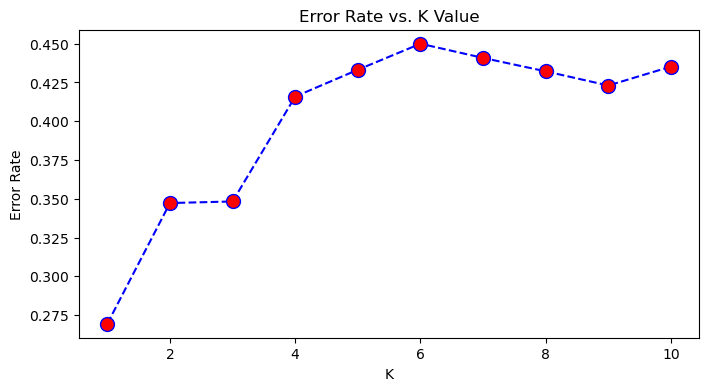

In [62]:
plt.figure(figsize=(8,4))
plt.plot(range(1,11),error_rate,color='blue', linestyle='dashed', marker='o',markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

In [63]:
knn=KNeighborsClassifier(n_neighbors=3)
knn.fit(X_train_np,y_train_np)

KNeighborsClassifier(n_neighbors=3)

In [64]:
y_pred_knn1=knn.predict(X_train_np)

In [65]:
# Train Accuracy of KNN Model
print(classification_report(y_train_np,y_pred_knn1))

              precision    recall  f1-score   support

           0       0.80      0.90      0.85       227
           1       0.87      0.72      0.79       218
           2       0.89      0.93      0.91       210

    accuracy                           0.85       655
   macro avg       0.85      0.85      0.85       655
weighted avg       0.85      0.85      0.85       655



In [66]:
# Tuning the model

param_grid4 = {
    'n_neighbors': [3, 5, 7, 9],  # Test different values of k
    'weights': ['uniform', 'distance'],  # Uniform or distance-based weighting
    'p': [1, 2]  # L1 or L2 distance metric
}
grid3= GridSearchCV(estimator=knn, param_grid=param_grid4, scoring='accuracy', cv=5, verbose=1)

In [67]:
grid3.fit(X_sc,y)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(cv=5, estimator=KNeighborsClassifier(n_neighbors=3),
             param_grid={'n_neighbors': [3, 5, 7, 9], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy', verbose=1)

In [68]:
print("Best Parameters of C & Verbose are:",grid3.best_params_)

Best Parameters of C & Verbose are: {'n_neighbors': 9, 'p': 1, 'weights': 'uniform'}


In [69]:
knnh=KNeighborsClassifier(n_neighbors= 3, p= 1, weights= 'uniform')
knnh.fit(X_train_np,y_train_np)

KNeighborsClassifier(n_neighbors=3, p=1)

In [70]:
y_pred_knnh1=knnh.predict(X_train_np)

In [71]:
# Train Accuracy of Tuned KNN Model
print(classification_report(y_train_np,y_pred_knnh1))

              precision    recall  f1-score   support

           0       0.81      0.93      0.87       227
           1       0.90      0.72      0.80       218
           2       0.88      0.94      0.91       210

    accuracy                           0.86       655
   macro avg       0.87      0.86      0.86       655
weighted avg       0.87      0.86      0.86       655



# MODEL 7 - NEURAL NETWORK

In [83]:
from keras.models import Sequential
from keras.layers import LSTM,Dense


lstm_model = Sequential()
lstm_model.add(LSTM(100,input_shape=(X_train.shape[1],1),activation='relu',return_sequences=True))
lstm_model.add(LSTM(50,activation='relu',return_sequences=True))
lstm_model.add(LSTM(20,activation='relu'))
lstm_model.add(Dense(3,activation='softmax'))
lstm_model.summary()
# lstm 100,50,30 dense 10

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                        │ (None, 26, 100)             │          40,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_4 (LSTM)                        │ (None, 26, 50)              │          30,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_5 (LSTM)                        │ (None, 20)                  │           5,680 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 3)                   │              63 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 76,743 (299.78 KB)

 Trainable params: 76,743 (299.78 KB)

 Non-trainable params: 0 (0.00 B)

In [84]:
lstm_model.compile(loss='sparse_categorical_crossentropy', optimizer='adam',metrics=['accuracy'])

In [74]:
nn = lstm_model.fit(X_train, y_train, validation_split=0.25,batch_size=150,epochs=120)

Epoch 1/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 5s 236ms/step - accuracy: 0.3649 - loss: 1.1085 - val_accuracy: 0.3232 - val_loss: 1.0922
Epoch 2/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.3898 - loss: 1.0950 - val_accuracy: 0.3232 - val_loss: 1.0988
Epoch 3/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step - accuracy: 0.3525 - loss: 1.0927 - val_accuracy: 0.3598 - val_loss: 1.0877
Epoch 4/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step - accuracy: 0.3871 - loss: 1.0882 - val_accuracy: 0.3232 - val_loss: 1.0956
Epoch 5/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.3482 - loss: 1.0875 - val_accuracy: 0.3415 - val_loss: 1.0824
Epoch 6/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.3788 - loss: 1.0771 - val_accuracy: 0.4329 - val_loss: 1.0486
Epoch 7/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.4646 - loss: 1.0783 - val_accuracy: 0.3598 - val_loss: 1.0732
Epoch 8/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.3906 - loss: 1.0790 - val_accuracy: 0.3537 - val_loss

Epoch 52/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.7104 - loss: 0.6657 - val_accuracy: 0.6829 - val_loss: 0.6900
Epoch 53/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6971 - loss: 0.6726 - val_accuracy: 0.6463 - val_loss: 0.6250
Epoch 54/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6949 - loss: 0.6083 - val_accuracy: 0.6463 - val_loss: 0.5911
Epoch 55/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step - accuracy: 0.7117 - loss: 0.6649 - val_accuracy: 0.6220 - val_loss: 0.6037
Epoch 56/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - accuracy: 0.7017 - loss: 0.6614 - val_accuracy: 0.5915 - val_loss: 0.8796
Epoch 57/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.6662 - loss: 0.7539 - val_accuracy: 0.6524 - val_loss: 0.7205
Epoch 58/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - accuracy: 0.6945 - loss: 0.6879 - val_accuracy: 0.6220 - val_loss: 0.7153
Epoch 59/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.7375 - loss: 0.6407 - val_accuracy: 0.6341 - v

Epoch 103/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - accuracy: 0.8188 - loss: 0.4237 - val_accuracy: 0.7866 - val_loss: 0.3603
Epoch 104/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step - accuracy: 0.8539 - loss: 0.3479 - val_accuracy: 0.7622 - val_loss: 0.4278
Epoch 105/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step - accuracy: 0.8617 - loss: 0.3347 - val_accuracy: 0.7988 - val_loss: 0.3456
Epoch 106/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.9057 - loss: 0.2710 - val_accuracy: 0.7927 - val_loss: 0.3866
Epoch 107/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - accuracy: 0.8885 - loss: 0.3156 - val_accuracy: 0.7805 - val_loss: 0.4213
Epoch 108/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step - accuracy: 0.8883 - loss: 0.2746 - val_accuracy: 0.7988 - val_loss: 0.3566
Epoch 109/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step - accuracy: 0.9085 - loss: 0.2576 - val_accuracy: 0.7866 - val_loss: 0.4989
Epoch 110/120
4/4 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step - accuracy: 0.8967 - loss: 0.2962 - val_accuracy: 0.

In [75]:
# Training accuracy of neural network
accuracy_train = lstm_model.evaluate(X_train,y_train,verbose=1)

21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - accuracy: 0.9325 - loss: 0.2065


# MODEL COMPARISON

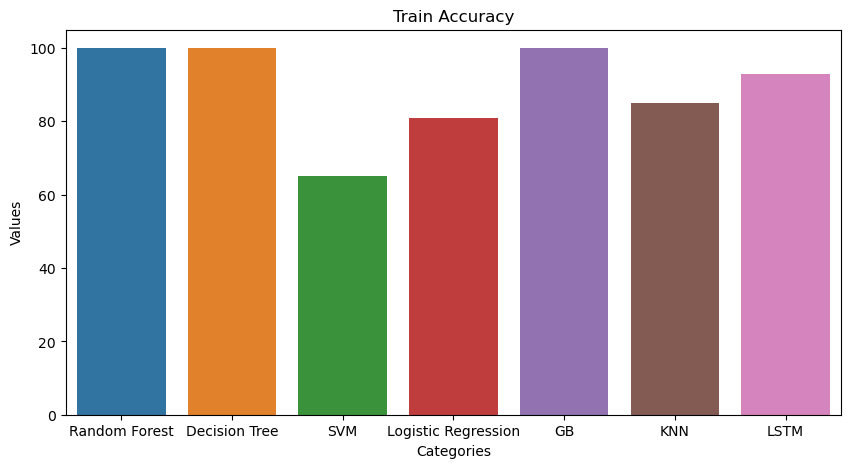

In [81]:
# comparison of models with their test accuracy
categories=['Random Forest','Decision Tree','SVM','Logistic Regression','GB','KNN','LSTM']
values=[100,100,65,81,100,85,93]

plt.figure(figsize=(10,5))
sns.barplot(x=categories,y=values)
plt.title('Train Accuracy')
plt.xlabel('Categories')
plt.ylabel('Values')
plt.show()

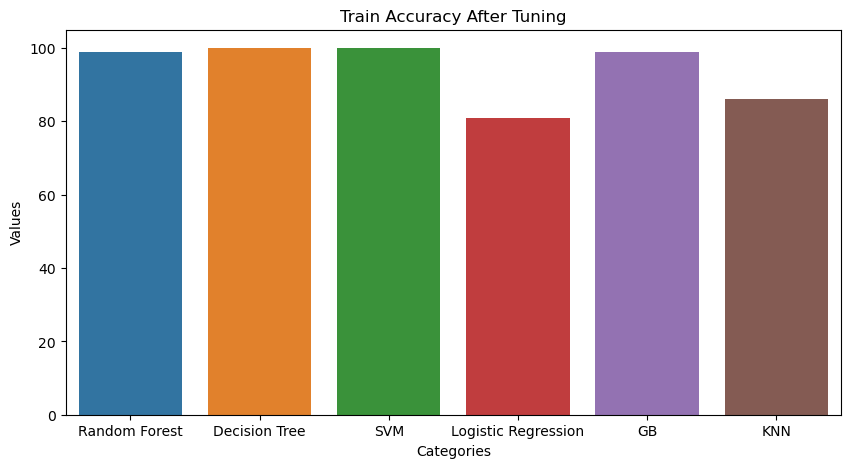

In [82]:
# comparison of tuned models with their test accuracy
categories=['Random Forest','Decision Tree','SVM','Logistic Regression','GB','KNN']
values=[99,100,100,81,99,86]

plt.figure(figsize=(10,5))
sns.barplot(x=categories,y=values)
plt.title('Train Accuracy After Tuning')
plt.xlabel('Categories')
plt.ylabel('Values')
plt.show()